## TRABAJO ENTREGABLE APRENDIZAJE PROFUNDO

### AUTOR: Pablo Vicente Martínez

### CONCLUSIONES

En este estudio de aprendizaje profundo, se compararon tres modelos de Redes Generativas Adversariales (GAN) en términos de su capacidad para generar imágenes realistas. Los modelos evaluados incluyeron uno base, uno con menos parámetros, otro de mayor complejidad (RNN's y aumento de número de parámetros) y otro convolucional. Se observó que el modelo convolucional superó significativamente a los otros dos en calidad y diversidad de las imágenes generadas, mientras que el modelo con menos parámetros demostró resultados comparables al modelo base. Este hallazgo sugiere que la reducción de parámetros puede no ser tan perjudicial para la capacidad de generación de imágenes de un modelo GAN, siempre y cuando se mantenga una arquitectura adecuada. Además, se destacó la importancia de las capas convolucionales en la mejora de la calidad visual y la coherencia de las imágenes generadas, lo que resalta la relevancia de la arquitectura del modelo en el rendimiento de las GAN.

En conclusión, este estudio subraya la influencia significativa de la arquitectura del modelo en el rendimiento de las Redes Generativas Adversariales. Se encontró que la introducción de capas convolucionales mejora notablemente la capacidad del modelo para aprender características de alto nivel y generar imágenes más detalladas y realistas. Aunque se necesitan más investigaciones para comprender completamente el impacto de la reducción de parámetros en los modelos GAN, estos resultados ofrecen perspectivas valiosas para el desarrollo futuro de técnicas de generación de imágenes más efectivas y eficientes.

### IMPORTACIÓN DE LIBRERÍAS

In [ ]:
import os
import numpy as np

from IPython.core.debugger import Tracer

from tensorflow.keras.datasets import cifar10, cifar100
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Conv2D, Conv2DTranspose, UpSampling2D, MaxPooling2D, MaxPool2D, LSTM, GRU, Concatenate
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

import matplotlib.pyplot as plt
plt.switch_backend('agg') # allows code to run without a system DISPLAY


### DEFINICIÓN DE LOS MODELOS A UTILIZAR

Definimos un GAN, el cual consta de un generador y un discriminador. Sobre este modelo base realizaremos distintas modificaciones y evaluaremos el desempeño de cada modelo.

In [ ]:
class GAN(object):
    """ Generative Adversarial Network class """
    def __init__(self, width=32, height=32, channels=3):

        self.width = width
        self.height = height
        self.channels = channels

        self.shape = (self.width, self.height, self.channels)

        self.optimizer_dis = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_gen = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_st_gen_dis = Adam(learning_rate=0.0002, beta_1=0.5)

        self.G = self.__generator()
        self.G.compile(loss='binary_crossentropy', optimizer=self.optimizer_gen)

        self.D = self.__discriminator()
        self.D.compile(loss='binary_crossentropy', optimizer=self.optimizer_dis, metrics=['accuracy'])

        self.stacked_generator_discriminator = self.__stacked_generator_discriminator()

        self.stacked_generator_discriminator.compile(loss='binary_crossentropy', optimizer=self.optimizer_st_gen_dis)


    def __generator(self):
        """ Declare generator """

        model = Sequential()
        model.add(Dense(256, input_shape=(100,)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(self.width  * self.height * self.channels, activation='tanh'))
        model.add(Reshape((self.width, self.height, self.channels)))

        return model

    def __discriminator(self):
        """ Declare discriminator """

        model = Sequential()
        model.add(Flatten(input_shape=self.shape))
        model.add(Dense((self.width * self.height * self.channels), input_shape=self.shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(np.int64((self.width * self.height * self.channels)/2)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        return model

    def __stacked_generator_discriminator(self):

        self.D.trainable = False

        model = Sequential()
        model.add(self.G)
        model.add(self.D)

        return model

    def train(self, X_train, epochs=20000, batch = 32, save_interval = 100):

        DD_loss = np.zeros((epochs,))
        GG_loss = np.zeros((epochs,))
        for cnt in range(epochs):

            ## train discriminator
            random_index = np.random.randint(0, len(X_train) - np.int64(batch/2))
            legit_images = X_train[random_index : random_index + np.int64(batch/2)].reshape(np.int64(batch/2), self.width, self.height, self.channels)

            gen_noise = np.random.normal(0, 1, (np.int64(batch/2), 100))
            syntetic_images = self.G.predict(gen_noise)

            x_combined_batch = np.concatenate((legit_images, syntetic_images))
            y_combined_batch = np.concatenate((np.ones((np.int64(batch/2), 1)), np.zeros((np.int64(batch/2), 1))))

            d_loss = self.D.train_on_batch(x_combined_batch, y_combined_batch)


            # train generator

            noise = np.random.normal(0, 1, (batch, 100))
            y_mislabled = np.ones((batch, 1))

            g_loss = self.stacked_generator_discriminator.train_on_batch(noise, y_mislabled)

            print ('epoch: %d, [Discriminator :: d_loss: %f], [ Generator :: loss: %f]' % (cnt, d_loss[0], g_loss))

            DD_loss[cnt] = d_loss[0]
            GG_loss[cnt] = g_loss
            if cnt % save_interval == 0:
                self.plot_images(save2file=True, step=cnt)
        return  DD_loss, GG_loss

    def plot_images(self, save2file=False, samples=16, step=0):

        noise = np.random.normal(0, 1, (samples, 100))

        images = self.G.predict(noise)

        plt.figure(figsize=(10, 10))

        for i in range(images.shape[0]):
            plt.subplot(4, 4, i+1)
            image = images[i, :, :, :]
            image = np.reshape(image, [self.height, self.width, self.channels])
            plt.imshow(image, cmap='gray')
            plt.axis('off')
        plt.tight_layout()

        if save2file:
            plt.savefig(filename)
            plt.close('all')
        else:
            plt.show()

En el siguiente modelo tratamos de reducir el número de parámetros, eliminando capas tanto del generador como del discriminador. En todas las arquitecturas posteriores, incluyendo esta, se añade regularización al discriminador y se para el entrenamiento del mismo cuando se considera que el valor de su fucnión de pérdidas es significativamente menor que la del generador (un 50%)

In [ ]:
class GAN_mod_less(object):
    """ Generative Adversarial Network class """
    def __init__(self, width=28, height=28, channels=1):

        self.width = width
        self.height = height
        self.channels = channels

        self.shape = (self.width, self.height, self.channels)

        self.optimizer_dis = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_gen = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_st_gen_dis = Adam(learning_rate=0.0002, beta_1=0.5)

        self.G = self.__generator()
        self.G.compile(loss='binary_crossentropy', optimizer=self.optimizer_gen)

        self.D = self.__discriminator()
        self.D.compile(loss='binary_crossentropy', optimizer=self.optimizer_dis, metrics=['accuracy'])

        self.stacked_generator_discriminator = self.__stacked_generator_discriminator()

        self.stacked_generator_discriminator.compile(loss='binary_crossentropy', optimizer=self.optimizer_st_gen_dis)


    def __generator(self):
        """ Declare generator """

        model = Sequential()
        model.add(Dense(128, input_shape=(100,)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Dense(self.width  * self.height * self.channels, activation='tanh'))
        model.add(Reshape((self.width, self.height, self.channels)))

        return model

    def __discriminator(self):
        """ Declare discriminator """

        model = Sequential()
        model.add(Flatten(input_shape=self.shape))
        model.add(Dense((self.width * self.height * self.channels), input_shape=self.shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(Dense(np.int64((self.width * self.height * self.channels)/256)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        return model

    def __stacked_generator_discriminator(self):

        self.D.trainable = False

        model = Sequential()
        model.add(self.G)
        model.add(self.D)

        return model

    def train(self, X_train, epochs=20000, batch=64, save_interval=100):

        DD_loss = np.zeros((epochs,))
        GG_loss = np.zeros((epochs,))
        train_disc = True
        train_gen = True

        for cnt in range(epochs):

            if train_disc:
                ## train discriminator

                random_index = np.random.randint(0, len(X_train) - np.int64(batch/2))
                legit_images = X_train[random_index : random_index + np.int64(batch/2)].reshape(np.int64(batch/2), self.width, self.height, self.channels)

                gen_noise = np.random.normal(0, 1, (np.int64(batch/2), 100))
                syntetic_images = self.G.predict(gen_noise)

                x_combined_batch = np.concatenate((legit_images, syntetic_images))
                y_combined_batch = np.concatenate((np.ones((np.int64(batch/2), 1)), np.zeros((np.int64(batch/2), 1))))

                d_loss = self.D.train_on_batch(x_combined_batch, y_combined_batch)

            if train_gen:
                # train generator

                noise = np.random.normal(0, 1, (batch, 100))
                y_mislabled = np.ones((batch, 1))

                # Esto es para que NO se entrene el discriminador

                for layer in self.D.layers:
                    layer.trainable = False

                g_loss = self.stacked_generator_discriminator.train_on_batch(noise, y_mislabled)

            if 'd_loss' in locals() and 'g_loss' in locals():
                print ('epoch: %d, [Discriminator :: d_loss: %f], [ Generator :: loss: %f]' % (cnt, d_loss[0], g_loss))

                DD_loss[cnt] = d_loss[0]
                GG_loss[cnt] = g_loss

                if DD_loss[cnt]/GG_loss[cnt] > 2:
                    train_gen = False
                else:
                    train_gen = True

                if GG_loss[cnt]/DD_loss[cnt] > 2:
                    train_disc = False
                else:
                    train_disc = True

            if cnt % save_interval == 0:
                self.plot_images(save2file=True, step=cnt)

        return DD_loss, GG_loss


    def plot_images(self, save2file=False, samples=16, step=0):
        ''' Plot and generated images '''
        if not os.path.exists("./images"):
            os.makedirs("./images")
        filename = "./images/mnist_%d.png" % step
        noise = np.random.normal(0, 1, (samples, 100))

        images = self.G.predict(noise)

        plt.figure(figsize=(10, 10))

        for i in range(images.shape[0]):
            plt.subplot(4, 4, i+1)
            image = images[i, :, :, :]
            image = np.reshape(image, [self.height, self.width, self.channels])
            plt.imshow(image, cmap='gray')
            plt.axis('off')
        plt.tight_layout()

        if save2file:
            plt.savefig(filename)
            plt.close('all')
        else:
            plt.show()

En el siguiente modelo tratamos de aumentar la complejidad de la red añadiendo capas densas y recurrentes

In [ ]:
class GAN_mod_plus(object):

    def __init__(self, width=28, height=28, channels=1):

        self.width = width
        self.height = height
        self.channels = channels

        self.shape = (self.width, self.height, self.channels)

        self.optimizer_dis = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_gen = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_st_gen_dis = Adam(learning_rate=0.0002, beta_1=0.5)

        self.G = self.__generator()
        self.G.compile(loss='binary_crossentropy', optimizer=self.optimizer_gen)

        self.D = self.__discriminator()
        self.D.compile(loss='binary_crossentropy', optimizer=self.optimizer_dis, metrics=['accuracy'])

        self.stacked_generator_discriminator = self.__stacked_generator_discriminator()

        self.stacked_generator_discriminator.compile(loss='binary_crossentropy', optimizer=self.optimizer_st_gen_dis)


    def __generator(self):

        model = Sequential()

        model.add(Dense(256, input_shape=(100,)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Dense(np.prod(self.shape), activation='tanh'))  # Output the correct shape
        model.add(Reshape(self.shape))  # Reshape to (width, height, channels)

        return model

    def __discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.shape))

        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.2))

        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.2))

        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.2))

        model.add(Dense(1, activation='sigmoid'))

        return model

    def __stacked_generator_discriminator(self):

        self.D.trainable = False

        model = Sequential()
        model.add(self.G)
        model.add(self.D)

        return model

    def train(self, X_train, epochs=20000, batch=64, save_interval=100):

        DD_loss = np.zeros((epochs,))
        GG_loss = np.zeros((epochs,))
        train_disc = True
        train_gen = True

        for cnt in range(epochs):

            if train_disc:
                ## train discriminator

                random_index = np.random.randint(0, len(X_train) - np.int64(batch/2))
                legit_images = X_train[random_index : random_index + np.int64(batch/2)].reshape(np.int64(batch/2), self.width, self.height, self.channels)

                gen_noise = np.random.normal(0, 1, (np.int64(batch/2), 100))
                syntetic_images = self.G.predict(gen_noise)

                syntetic_images = syntetic_images.reshape(np.int64(batch/2), self.width, self.height, self.channels)

                x_combined_batch = np.concatenate((legit_images, syntetic_images))
                y_combined_batch = np.concatenate((np.ones((np.int64(batch/2), 1)), np.zeros((np.int64(batch/2), 1))))

                d_loss = self.D.train_on_batch(x_combined_batch, y_combined_batch)

            if train_gen:
                # train generator

                noise = np.random.normal(0, 1, (batch, 100))
                y_mislabled = np.ones((batch, 1))

                # Esto es para que NO se entrene el discriminador

                for layer in self.D.layers:
                    layer.trainable = False

                g_loss = self.stacked_generator_discriminator.train_on_batch(noise, y_mislabled)

            if 'd_loss' in locals() and 'g_loss' in locals():
                print ('epoch: %d, [Discriminator :: d_loss: %f], [ Generator :: loss: %f]' % (cnt, d_loss[0], g_loss))

                DD_loss[cnt] = d_loss[0]
                GG_loss[cnt] = g_loss

                if DD_loss[cnt]/GG_loss[cnt] > 2:
                    train_gen = False
                else:
                    train_gen = True

                if GG_loss[cnt]/DD_loss[cnt] > 2:
                    train_disc = False
                else:
                    train_disc = True

            if cnt % save_interval == 0:
                self.plot_images(save2file=True, step=cnt)

        return DD_loss, GG_loss



    def plot_images(self, save2file=False, samples=16, step=0):
        ''' Plot and generated images '''
        if not os.path.exists("./images"):
            os.makedirs("./images")
        filename = "./images/mnist_%d.png" % step
        noise = np.random.normal(0, 1, (samples, 100))

        images = self.G.predict(noise)

        plt.figure(figsize=(10, 10))

        for i in range(images.shape[0]):
            plt.subplot(4, 4, i+1)
            image = images[i, :, :, :]
            image = np.reshape(image, [self.height, self.width, self.channels])
            plt.imshow(image, cmap='gray')
            plt.axis('off')
        plt.tight_layout()

        if save2file:
            plt.savefig(filename)
            plt.close('all')
        else:
            plt.show()


En el siguiente modelo cambiamos ligeramente la GAN, sustituyendo las capas simples (o densas) por capas convoluvionales. Este cambio se cree conveniente dado que trabajamos con un Dataset de imágenes.

In [ ]:
class GAN_mod_plus_conv(object):
    """ Generative Adversarial Network class """
    def __init__(self, width=32, height=32, channels=3):

        self.width = width
        self.height = height
        self.channels = channels

        self.shape = (self.width, self.height, self.channels)

        self.optimizer_dis = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_gen = Adam(learning_rate=0.0002, beta_1=0.5)
        self.optimizer_st_gen_dis = Adam(learning_rate=0.0002, beta_1=0.5)

        self.G = self.__generator()
        self.G.compile(loss='binary_crossentropy', optimizer=self.optimizer_gen)

        self.D = self.__discriminator()
        self.D.compile(loss='binary_crossentropy', optimizer=self.optimizer_dis, metrics=['accuracy'])

        self.stacked_generator_discriminator = self.__stacked_generator_discriminator()

        self.stacked_generator_discriminator.compile(loss='binary_crossentropy', optimizer=self.optimizer_st_gen_dis)


    def __generator(self):
        """ Declare generator """

        model = Sequential()
        model.add(Dense(324, input_shape=(100,)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Reshape((18,18,1)))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(20,3))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D(2))
        model.add(Conv2D(10,3, activation='tanh',padding='SAME'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(3,3, activation='tanh',padding='SAME'))

        return model

    def __discriminator(self):
        """ Declare discriminator """

        model = Sequential()
        model.add(Conv2D(40,3, input_shape=self.shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(MaxPool2D(2))
        model.add(Conv2D(30,3, input_shape=self.shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(MaxPool2D(2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        return model

    def __stacked_generator_discriminator(self):

        self.D.trainable = False

        model = Sequential()
        model.add(self.G)
        model.add(self.D)

        return model

    def train(self, X_train, epochs=20000, batch=64, save_interval=100):

        DD_loss = np.zeros((epochs,))
        GG_loss = np.zeros((epochs,))
        train_disc = True
        train_gen = True

        for cnt in range(epochs):

            if train_disc:
                # train discriminator

                random_index = np.random.randint(0, len(X_train) - np.int64(batch/2))
                legit_images = X_train[random_index : random_index + np.int64(batch/2)].reshape((np.int64(batch/2),)+(32,32,3))

                gen_noise = np.random.normal(0, 1, (np.int64(batch/2), 100))
                syntetic_images = self.G.predict(gen_noise)

                x_combined_batch = np.concatenate((legit_images, syntetic_images))
                y_combined_batch = np.concatenate((np.ones((np.int64(batch/2), 1)), np.zeros((np.int64(batch/2), 1))))

                d_loss = self.D.train_on_batch(x_combined_batch, y_combined_batch)

            if train_gen:
                # train generator

                noise = np.random.normal(0, 1, (batch, 100))
                y_mislabled = np.ones((batch, 1))


                # Esto es para que NO se entrene el discriminador
                for layer in self.D.layers:
                    layer.trainable = False

                g_loss = self.stacked_generator_discriminator.train_on_batch(noise, y_mislabled)

            if 'd_loss' in locals() and 'g_loss' in locals():
                print ('epoch: %d, [Discriminator :: d_loss: %f], [ Generator :: loss: %f]' % (cnt, d_loss[0], g_loss))

                DD_loss[cnt] = d_loss[0]
                GG_loss[cnt] = g_loss

                if DD_loss[cnt]/GG_loss[cnt] > 2:
                    train_gen = False
                else:
                    train_gen = True

                if GG_loss[cnt]/DD_loss[cnt] > 2:
                    train_disc = False
                else:
                    train_disc = True

            if cnt % save_interval == 0:
                self.plot_images(save2file=True, step=cnt)

        return DD_loss, GG_loss


    def plot_images(self, save2file=False, samples=16, step=0):
        ''' Plot and generated images '''
        if not os.path.exists("./images"):
            os.makedirs("./images")
        filename = "./images/mnist_%d.png" % step
        noise = np.random.normal(0, 1, (samples, 100))

        images = self.G.predict(noise)

        plt.figure(figsize=(10, 10))

        for i in range(images.shape[0]):
            plt.subplot(4, 4, i+1)
            image = images[i, :, :, :]
            image = np.reshape(image, [self.height, self.width, self.channels])
            plt.imshow(image)
            plt.axis('off')
        plt.tight_layout()

        if save2file:
            plt.savefig(filename)
            plt.close('all')
        else:
            plt.show()

### CARGA Y PRE-PROCESADO DE LOS DATOS

Obtenemos los datos que vamos a utilizar para la red.

In [ ]:
# LEER DATOS
(X_train, y_train), (_, _) = cifar100.load_data()

# Rescale -1 to 1
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
#X_train = np.expand_dims(X_train, axis=3)

169001437/169001437 [==============================] - 2s 0us/step


In [ ]:
X_train.shape

(50000, 32, 32, 3)

Tenemos 100 clases distintas, como nos indica el nombre del dataset.

In [ ]:
np.unique(y_train)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

Para favorecer la generación de imágenes coherentes, vamos a usar únicamente imágenes de peces pertenecientes al conjunto de datos CIFAR100.

In [ ]:
Prueba = X_train[y_train[:,0] == 1,:,:,:]

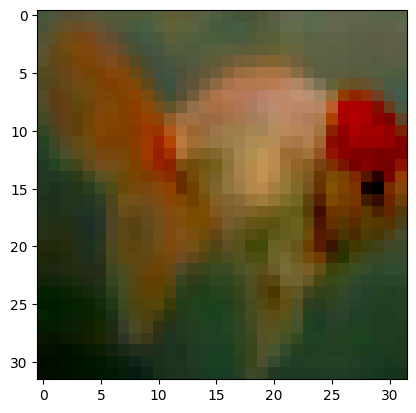

In [ ]:
%matplotlib inline
plt.imshow(Prueba[3])

Cabe detacar que las imágenes son bastante pequeñas y, aún observando el dataset original, hay ciertas muestras bastante difíciles de interpretar. Como posible solución, se podría hacer una selección de aquellas imágenes que sean más claras.

### ENTRENAMIENTO Y RESULTADOS DEL MODELO BASE

In [ ]:
gan = GAN(width=X_train.shape[1], height=X_train.shape[2], channels=X_train.shape[3])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 dense_9 (Dense)             (None, 3072)              9440256   
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 3072)              0         
                                                                 
 dense_10 (Dense)            (None, 1536)              4720128   
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 1536)              0         
                                                                 
 dense_11 (Dense)            (None, 1)                 1537      
                                                                 
Total params: 14161921 (54.02 MB)
Trainable params: 14

In [ ]:
gan_less = GAN_mod_less(width=X_train.shape[1], height=X_train.shape[2], channels=X_train.shape[3])

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_9 (Flatten)         (None, 3072)              0         
                                                                 
 dense_48 (Dense)            (None, 3072)              9440256   
                                                                 
 leaky_re_lu_37 (LeakyReLU)  (None, 3072)              0         
                                                                 
 dropout_7 (Dropout)         (None, 3072)              0         
                                                                 
 dense_49 (Dense)            (None, 12)                36876     
                                                                 
 leaky_re_lu_38 (LeakyReLU)  (None, 12)                0         
                                                                 
 dropout_8 (Dropout)         (None, 12)              

Realizamos un entrenamiento de 20000 épocas, usando el modelo GAN, y utilizando un dataset filtrado, en el que tenemos imágenes de un tipo de objeto (peces) únicamente.

In [ ]:
DD, GG = gan.train(Prueba, epochs=20000)

1/1 [==============================] - 1s 868ms/step
epoch: 0, [Discriminator :: d_loss: 0.671874], [ Generator :: loss: 0.289755]
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step
epoch: 1, [Discriminator :: d_loss: 0.350160], [ Generator :: loss: 0.378861]
1/1 [==============================] - 0s 18ms/step
epoch: 2, [Discriminator :: d_loss: 0.402698], [ Generator :: loss: 0.551295]
1/1 [==============================] - 0s 18ms/step
epoch: 3, [Discriminator :: d_loss: 0.264585], [ Generator :: loss: 1.031021]
1/1 [==============================] - 0s 20ms/step
epoch: 4, [Discriminator :: d_loss: 0.514686], [ Generator :: loss: 1.325112]
1/1 [==============================] - 0s 19ms/step
epoch: 5, [Discriminator :: d_loss: 0.376133], [ Generator :: loss: 1.635055]
1/1 [==============================] - 0s 16ms/step
epoch: 6, [Discriminator :: d_loss: 0.463807], [ Generator :: loss: 1.895567]
1/1 [==============================] - 0s 17ms/step
epoch: 7, [Discriminator :: d_loss: 0.232215], [ Generator :: loss: 2.469844]
1/1 [==============================] - 0s 16ms/step
epoch: 8, [Discriminator :: d_loss: 0.

1/1 [==============================] - 0s 30ms/step
epoch: 101, [Discriminator :: d_loss: 0.375026], [ Generator :: loss: 2.807747]
1/1 [==============================] - 0s 29ms/step
epoch: 102, [Discriminator :: d_loss: 0.815019], [ Generator :: loss: 2.615131]
1/1 [==============================] - 0s 24ms/step
epoch: 103, [Discriminator :: d_loss: 0.261858], [ Generator :: loss: 2.714798]
1/1 [==============================] - 0s 24ms/step
epoch: 104, [Discriminator :: d_loss: 0.138799], [ Generator :: loss: 3.039650]
1/1 [==============================] - 0s 25ms/step
epoch: 105, [Discriminator :: d_loss: 0.398153], [ Generator :: loss: 3.123908]
1/1 [==============================] - 0s 23ms/step
epoch: 106, [Discriminator :: d_loss: 0.107520], [ Generator :: loss: 3.341696]
1/1 [==============================] - 0s 29ms/step
epoch: 107, [Discriminator :: d_loss: 0.168025], [ Generator :: loss: 2.801729]
1/1 [==============================] - 0s 24ms/step
epoch: 108, [Discriminat

1/1 [==============================] - 0s 18ms/step
epoch: 201, [Discriminator :: d_loss: 0.309164], [ Generator :: loss: 2.604890]
1/1 [==============================] - 0s 23ms/step
epoch: 202, [Discriminator :: d_loss: 0.141745], [ Generator :: loss: 2.661712]
1/1 [==============================] - 0s 17ms/step
epoch: 203, [Discriminator :: d_loss: 0.095217], [ Generator :: loss: 2.804643]
1/1 [==============================] - 0s 18ms/step
epoch: 204, [Discriminator :: d_loss: 0.568095], [ Generator :: loss: 2.305157]
1/1 [==============================] - 0s 18ms/step
epoch: 205, [Discriminator :: d_loss: 0.343159], [ Generator :: loss: 1.942262]
1/1 [==============================] - 0s 19ms/step
epoch: 206, [Discriminator :: d_loss: 0.345869], [ Generator :: loss: 1.974087]
1/1 [==============================] - 0s 16ms/step
epoch: 207, [Discriminator :: d_loss: 0.275108], [ Generator :: loss: 2.269457]
1/1 [==============================] - 0s 18ms/step
epoch: 208, [Discriminat

1/1 [==============================] - 0s 17ms/step
epoch: 301, [Discriminator :: d_loss: 0.132305], [ Generator :: loss: 1.949047]
1/1 [==============================] - 0s 16ms/step
epoch: 302, [Discriminator :: d_loss: 0.137516], [ Generator :: loss: 2.036720]
1/1 [==============================] - 0s 16ms/step
epoch: 303, [Discriminator :: d_loss: 0.429672], [ Generator :: loss: 1.996990]
1/1 [==============================] - 0s 17ms/step
epoch: 304, [Discriminator :: d_loss: 0.362061], [ Generator :: loss: 1.777882]
1/1 [==============================] - 0s 19ms/step
epoch: 305, [Discriminator :: d_loss: 0.190194], [ Generator :: loss: 1.940896]
1/1 [==============================] - 0s 18ms/step
epoch: 306, [Discriminator :: d_loss: 0.317087], [ Generator :: loss: 2.112720]
1/1 [==============================] - 0s 18ms/step
epoch: 307, [Discriminator :: d_loss: 0.291074], [ Generator :: loss: 2.106074]
1/1 [==============================] - 0s 18ms/step
epoch: 308, [Discriminat

1/1 [==============================] - 0s 20ms/step
epoch: 401, [Discriminator :: d_loss: 0.604842], [ Generator :: loss: 1.818418]
1/1 [==============================] - 0s 16ms/step
epoch: 402, [Discriminator :: d_loss: 0.281897], [ Generator :: loss: 2.632168]
1/1 [==============================] - 0s 18ms/step
epoch: 403, [Discriminator :: d_loss: 0.774016], [ Generator :: loss: 1.310374]
1/1 [==============================] - 0s 26ms/step
epoch: 404, [Discriminator :: d_loss: 0.633492], [ Generator :: loss: 1.499837]
1/1 [==============================] - 0s 18ms/step
epoch: 405, [Discriminator :: d_loss: 0.426356], [ Generator :: loss: 2.019367]
1/1 [==============================] - 0s 17ms/step
epoch: 406, [Discriminator :: d_loss: 0.399868], [ Generator :: loss: 1.867529]
1/1 [==============================] - 0s 16ms/step
epoch: 407, [Discriminator :: d_loss: 0.316963], [ Generator :: loss: 1.856508]
1/1 [==============================] - 0s 19ms/step
epoch: 408, [Discriminat

1/1 [==============================] - 0s 18ms/step
epoch: 501, [Discriminator :: d_loss: 0.486940], [ Generator :: loss: 1.744621]
1/1 [==============================] - 0s 17ms/step
epoch: 502, [Discriminator :: d_loss: 0.385843], [ Generator :: loss: 2.084888]
1/1 [==============================] - 0s 17ms/step
epoch: 503, [Discriminator :: d_loss: 0.241950], [ Generator :: loss: 2.151723]
1/1 [==============================] - 0s 18ms/step
epoch: 504, [Discriminator :: d_loss: 0.404579], [ Generator :: loss: 1.554139]
1/1 [==============================] - 0s 17ms/step
epoch: 505, [Discriminator :: d_loss: 0.450405], [ Generator :: loss: 1.761711]
1/1 [==============================] - 0s 16ms/step
epoch: 506, [Discriminator :: d_loss: 0.356467], [ Generator :: loss: 2.362412]
1/1 [==============================] - 0s 20ms/step
epoch: 507, [Discriminator :: d_loss: 0.700715], [ Generator :: loss: 1.428148]
1/1 [==============================] - 0s 21ms/step
epoch: 508, [Discriminat

1/1 [==============================] - 0s 19ms/step
epoch: 601, [Discriminator :: d_loss: 0.652762], [ Generator :: loss: 0.957637]
1/1 [==============================] - 0s 18ms/step
epoch: 602, [Discriminator :: d_loss: 0.633486], [ Generator :: loss: 1.822520]
1/1 [==============================] - 0s 16ms/step
epoch: 603, [Discriminator :: d_loss: 0.516802], [ Generator :: loss: 0.886907]
1/1 [==============================] - 0s 18ms/step
epoch: 604, [Discriminator :: d_loss: 0.482115], [ Generator :: loss: 1.132720]
1/1 [==============================] - 0s 17ms/step
epoch: 605, [Discriminator :: d_loss: 0.352661], [ Generator :: loss: 1.488396]
1/1 [==============================] - 0s 17ms/step
epoch: 606, [Discriminator :: d_loss: 0.500849], [ Generator :: loss: 1.433133]
1/1 [==============================] - 0s 22ms/step
epoch: 607, [Discriminator :: d_loss: 0.521458], [ Generator :: loss: 1.804878]
1/1 [==============================] - 0s 18ms/step
epoch: 608, [Discriminat

1/1 [==============================] - 0s 28ms/step
epoch: 701, [Discriminator :: d_loss: 0.489186], [ Generator :: loss: 1.255979]
1/1 [==============================] - 0s 26ms/step
epoch: 702, [Discriminator :: d_loss: 0.571721], [ Generator :: loss: 2.626232]
1/1 [==============================] - 0s 24ms/step
epoch: 703, [Discriminator :: d_loss: 0.761350], [ Generator :: loss: 1.073740]
1/1 [==============================] - 0s 28ms/step
epoch: 704, [Discriminator :: d_loss: 0.692033], [ Generator :: loss: 1.016961]
1/1 [==============================] - 0s 26ms/step
epoch: 705, [Discriminator :: d_loss: 0.354748], [ Generator :: loss: 1.945898]
1/1 [==============================] - 0s 24ms/step
epoch: 706, [Discriminator :: d_loss: 0.545672], [ Generator :: loss: 1.090419]
1/1 [==============================] - 0s 36ms/step
epoch: 707, [Discriminator :: d_loss: 0.716031], [ Generator :: loss: 1.002136]
1/1 [==============================] - 0s 24ms/step
epoch: 708, [Discriminat

1/1 [==============================] - 0s 22ms/step
epoch: 801, [Discriminator :: d_loss: 0.686470], [ Generator :: loss: 0.590847]
1/1 [==============================] - 0s 18ms/step
epoch: 802, [Discriminator :: d_loss: 0.700110], [ Generator :: loss: 1.014679]
1/1 [==============================] - 0s 17ms/step
epoch: 803, [Discriminator :: d_loss: 0.545101], [ Generator :: loss: 1.671174]
1/1 [==============================] - 0s 18ms/step
epoch: 804, [Discriminator :: d_loss: 0.734354], [ Generator :: loss: 0.800527]
1/1 [==============================] - 0s 17ms/step
epoch: 805, [Discriminator :: d_loss: 0.620224], [ Generator :: loss: 1.118982]
1/1 [==============================] - 0s 17ms/step
epoch: 806, [Discriminator :: d_loss: 0.445891], [ Generator :: loss: 1.265442]
1/1 [==============================] - 0s 17ms/step
epoch: 807, [Discriminator :: d_loss: 0.521994], [ Generator :: loss: 1.069736]
1/1 [==============================] - 0s 19ms/step
epoch: 808, [Discriminat

1/1 [==============================] - 0s 18ms/step
epoch: 901, [Discriminator :: d_loss: 0.486933], [ Generator :: loss: 1.485151]
1/1 [==============================] - 0s 17ms/step
epoch: 902, [Discriminator :: d_loss: 0.449264], [ Generator :: loss: 1.071672]
1/1 [==============================] - 0s 17ms/step
epoch: 903, [Discriminator :: d_loss: 0.616752], [ Generator :: loss: 2.378689]
1/1 [==============================] - 0s 17ms/step
epoch: 904, [Discriminator :: d_loss: 0.667424], [ Generator :: loss: 0.809997]
1/1 [==============================] - 0s 16ms/step
epoch: 905, [Discriminator :: d_loss: 0.577234], [ Generator :: loss: 0.788901]
1/1 [==============================] - 0s 18ms/step
epoch: 906, [Discriminator :: d_loss: 0.696769], [ Generator :: loss: 1.545740]
1/1 [==============================] - 0s 19ms/step
epoch: 907, [Discriminator :: d_loss: 0.492745], [ Generator :: loss: 1.263900]
1/1 [==============================] - 0s 16ms/step
epoch: 908, [Discriminat

1/1 [==============================] - 0s 20ms/step
epoch: 1001, [Discriminator :: d_loss: 0.508131], [ Generator :: loss: 0.929628]
1/1 [==============================] - 0s 21ms/step
epoch: 1002, [Discriminator :: d_loss: 0.650018], [ Generator :: loss: 1.323476]
1/1 [==============================] - 0s 17ms/step
epoch: 1003, [Discriminator :: d_loss: 0.454273], [ Generator :: loss: 1.099653]
1/1 [==============================] - 0s 17ms/step
epoch: 1004, [Discriminator :: d_loss: 0.455712], [ Generator :: loss: 1.105783]
1/1 [==============================] - 0s 17ms/step
epoch: 1005, [Discriminator :: d_loss: 0.408339], [ Generator :: loss: 1.810753]
1/1 [==============================] - 0s 19ms/step
epoch: 1006, [Discriminator :: d_loss: 0.615434], [ Generator :: loss: 0.739948]
1/1 [==============================] - 0s 17ms/step
epoch: 1007, [Discriminator :: d_loss: 0.574814], [ Generator :: loss: 1.735446]
1/1 [==============================] - 0s 18ms/step
epoch: 1008, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 1101, [Discriminator :: d_loss: 0.620081], [ Generator :: loss: 1.170442]
1/1 [==============================] - 0s 17ms/step
epoch: 1102, [Discriminator :: d_loss: 0.535712], [ Generator :: loss: 1.917735]
1/1 [==============================] - 0s 19ms/step
epoch: 1103, [Discriminator :: d_loss: 0.504441], [ Generator :: loss: 1.264437]
1/1 [==============================] - 0s 18ms/step
epoch: 1104, [Discriminator :: d_loss: 0.538491], [ Generator :: loss: 1.494498]
1/1 [==============================] - 0s 22ms/step
epoch: 1105, [Discriminator :: d_loss: 0.716939], [ Generator :: loss: 0.581313]
1/1 [==============================] - 0s 19ms/step
epoch: 1106, [Discriminator :: d_loss: 0.733825], [ Generator :: loss: 1.712726]
1/1 [==============================] - 0s 17ms/step
epoch: 1107, [Discriminator :: d_loss: 0.486007], [ Generator :: loss: 1.350111]
1/1 [==============================] - 0s 18ms/step
epoch: 1108, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 1201, [Discriminator :: d_loss: 0.537691], [ Generator :: loss: 1.201552]
1/1 [==============================] - 0s 17ms/step
epoch: 1202, [Discriminator :: d_loss: 0.545975], [ Generator :: loss: 1.051304]
1/1 [==============================] - 0s 16ms/step
epoch: 1203, [Discriminator :: d_loss: 0.368406], [ Generator :: loss: 1.285344]
1/1 [==============================] - 0s 19ms/step
epoch: 1204, [Discriminator :: d_loss: 0.435322], [ Generator :: loss: 1.409583]
1/1 [==============================] - 0s 17ms/step
epoch: 1205, [Discriminator :: d_loss: 0.307485], [ Generator :: loss: 1.473412]
1/1 [==============================] - 0s 17ms/step
epoch: 1206, [Discriminator :: d_loss: 0.574934], [ Generator :: loss: 0.479577]
1/1 [==============================] - 0s 16ms/step
epoch: 1207, [Discriminator :: d_loss: 0.662092], [ Generator :: loss: 1.525560]
1/1 [==============================] - 0s 17ms/step
epoch: 1208, [Dis

1/1 [==============================] - 0s 25ms/step
epoch: 1301, [Discriminator :: d_loss: 0.498880], [ Generator :: loss: 1.296998]
1/1 [==============================] - 0s 27ms/step
epoch: 1302, [Discriminator :: d_loss: 0.357903], [ Generator :: loss: 0.822533]
1/1 [==============================] - 0s 24ms/step
epoch: 1303, [Discriminator :: d_loss: 0.533243], [ Generator :: loss: 0.911511]
1/1 [==============================] - 0s 27ms/step
epoch: 1304, [Discriminator :: d_loss: 0.424710], [ Generator :: loss: 2.141274]
1/1 [==============================] - 0s 34ms/step
epoch: 1305, [Discriminator :: d_loss: 0.460392], [ Generator :: loss: 1.135590]
1/1 [==============================] - 0s 36ms/step
epoch: 1306, [Discriminator :: d_loss: 0.589066], [ Generator :: loss: 0.786246]
1/1 [==============================] - 0s 36ms/step
epoch: 1307, [Discriminator :: d_loss: 0.565941], [ Generator :: loss: 1.360755]
1/1 [==============================] - 0s 38ms/step
epoch: 1308, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 1401, [Discriminator :: d_loss: 0.501930], [ Generator :: loss: 0.742829]
1/1 [==============================] - 0s 18ms/step
epoch: 1402, [Discriminator :: d_loss: 0.548445], [ Generator :: loss: 1.458583]
1/1 [==============================] - 0s 20ms/step
epoch: 1403, [Discriminator :: d_loss: 0.496422], [ Generator :: loss: 1.498775]
1/1 [==============================] - 0s 21ms/step
epoch: 1404, [Discriminator :: d_loss: 0.494122], [ Generator :: loss: 0.586444]
1/1 [==============================] - 0s 17ms/step
epoch: 1405, [Discriminator :: d_loss: 0.712729], [ Generator :: loss: 1.717615]
1/1 [==============================] - 0s 19ms/step
epoch: 1406, [Discriminator :: d_loss: 0.576634], [ Generator :: loss: 0.868338]
1/1 [==============================] - 0s 18ms/step
epoch: 1407, [Discriminator :: d_loss: 0.486851], [ Generator :: loss: 1.361597]
1/1 [==============================] - 0s 18ms/step
epoch: 1408, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 1501, [Discriminator :: d_loss: 0.582541], [ Generator :: loss: 0.636644]
1/1 [==============================] - 0s 17ms/step
epoch: 1502, [Discriminator :: d_loss: 0.563054], [ Generator :: loss: 1.196543]
1/1 [==============================] - 0s 17ms/step
epoch: 1503, [Discriminator :: d_loss: 0.418209], [ Generator :: loss: 2.895651]
1/1 [==============================] - 0s 18ms/step
epoch: 1504, [Discriminator :: d_loss: 0.915495], [ Generator :: loss: 0.852660]
1/1 [==============================] - 0s 18ms/step
epoch: 1505, [Discriminator :: d_loss: 0.505276], [ Generator :: loss: 1.282373]
1/1 [==============================] - 0s 20ms/step
epoch: 1506, [Discriminator :: d_loss: 0.443785], [ Generator :: loss: 1.863749]
1/1 [==============================] - 0s 18ms/step
epoch: 1507, [Discriminator :: d_loss: 0.485358], [ Generator :: loss: 1.424856]
1/1 [==============================] - 0s 17ms/step
epoch: 1508, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 1601, [Discriminator :: d_loss: 0.593172], [ Generator :: loss: 1.173874]
1/1 [==============================] - 0s 19ms/step
epoch: 1602, [Discriminator :: d_loss: 0.445644], [ Generator :: loss: 1.212378]
1/1 [==============================] - 0s 17ms/step
epoch: 1603, [Discriminator :: d_loss: 0.431379], [ Generator :: loss: 2.018598]
1/1 [==============================] - 0s 17ms/step
epoch: 1604, [Discriminator :: d_loss: 0.393219], [ Generator :: loss: 1.214055]
1/1 [==============================] - 0s 18ms/step
epoch: 1605, [Discriminator :: d_loss: 0.420794], [ Generator :: loss: 1.442145]
1/1 [==============================] - 0s 17ms/step
epoch: 1606, [Discriminator :: d_loss: 0.542394], [ Generator :: loss: 0.695162]
1/1 [==============================] - 0s 17ms/step
epoch: 1607, [Discriminator :: d_loss: 0.459020], [ Generator :: loss: 1.661016]
1/1 [==============================] - 0s 17ms/step
epoch: 1608, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 1701, [Discriminator :: d_loss: 0.385701], [ Generator :: loss: 1.269274]
1/1 [==============================] - 0s 17ms/step
epoch: 1702, [Discriminator :: d_loss: 0.377534], [ Generator :: loss: 1.928133]
1/1 [==============================] - 0s 16ms/step
epoch: 1703, [Discriminator :: d_loss: 0.275726], [ Generator :: loss: 1.484667]
1/1 [==============================] - 0s 16ms/step
epoch: 1704, [Discriminator :: d_loss: 0.450859], [ Generator :: loss: 1.174634]
1/1 [==============================] - 0s 16ms/step
epoch: 1705, [Discriminator :: d_loss: 0.370311], [ Generator :: loss: 1.035583]
1/1 [==============================] - 0s 17ms/step
epoch: 1706, [Discriminator :: d_loss: 0.557353], [ Generator :: loss: 1.351238]
1/1 [==============================] - 0s 17ms/step
epoch: 1707, [Discriminator :: d_loss: 0.311654], [ Generator :: loss: 2.170735]
1/1 [==============================] - 0s 16ms/step
epoch: 1708, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 1801, [Discriminator :: d_loss: 0.375186], [ Generator :: loss: 1.037652]
1/1 [==============================] - 0s 16ms/step
epoch: 1802, [Discriminator :: d_loss: 0.496091], [ Generator :: loss: 1.705825]
1/1 [==============================] - 0s 16ms/step
epoch: 1803, [Discriminator :: d_loss: 0.478785], [ Generator :: loss: 1.123032]
1/1 [==============================] - 0s 17ms/step
epoch: 1804, [Discriminator :: d_loss: 0.327089], [ Generator :: loss: 1.591902]
1/1 [==============================] - 0s 17ms/step
epoch: 1805, [Discriminator :: d_loss: 0.438788], [ Generator :: loss: 2.113926]
1/1 [==============================] - 0s 22ms/step
epoch: 1806, [Discriminator :: d_loss: 0.473035], [ Generator :: loss: 1.033076]
1/1 [==============================] - 0s 18ms/step
epoch: 1807, [Discriminator :: d_loss: 0.378137], [ Generator :: loss: 1.618875]
1/1 [==============================] - 0s 15ms/step
epoch: 1808, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 1901, [Discriminator :: d_loss: 0.505265], [ Generator :: loss: 1.948903]
1/1 [==============================] - 0s 19ms/step
epoch: 1902, [Discriminator :: d_loss: 0.364745], [ Generator :: loss: 1.626001]
1/1 [==============================] - 0s 19ms/step
epoch: 1903, [Discriminator :: d_loss: 0.391376], [ Generator :: loss: 1.214939]
1/1 [==============================] - 0s 19ms/step
epoch: 1904, [Discriminator :: d_loss: 0.397052], [ Generator :: loss: 1.722967]
1/1 [==============================] - 0s 20ms/step
epoch: 1905, [Discriminator :: d_loss: 0.424353], [ Generator :: loss: 1.576555]
1/1 [==============================] - 0s 19ms/step
epoch: 1906, [Discriminator :: d_loss: 0.401240], [ Generator :: loss: 1.670830]
1/1 [==============================] - 0s 18ms/step
epoch: 1907, [Discriminator :: d_loss: 0.421441], [ Generator :: loss: 1.358430]
1/1 [==============================] - 0s 18ms/step
epoch: 1908, [Dis

1/1 [==============================] - 0s 29ms/step
epoch: 2001, [Discriminator :: d_loss: 0.258185], [ Generator :: loss: 2.339174]
1/1 [==============================] - 0s 24ms/step
epoch: 2002, [Discriminator :: d_loss: 0.700229], [ Generator :: loss: 0.445145]
1/1 [==============================] - 0s 26ms/step
epoch: 2003, [Discriminator :: d_loss: 0.646961], [ Generator :: loss: 1.275273]
1/1 [==============================] - 0s 25ms/step
epoch: 2004, [Discriminator :: d_loss: 0.470400], [ Generator :: loss: 2.691436]
1/1 [==============================] - 0s 30ms/step
epoch: 2005, [Discriminator :: d_loss: 0.471766], [ Generator :: loss: 1.313318]
1/1 [==============================] - 0s 32ms/step
epoch: 2006, [Discriminator :: d_loss: 0.324153], [ Generator :: loss: 1.796622]
1/1 [==============================] - 0s 28ms/step
epoch: 2007, [Discriminator :: d_loss: 0.359442], [ Generator :: loss: 1.675550]
1/1 [==============================] - 0s 29ms/step
epoch: 2008, [Dis

1/1 [==============================] - 0s 22ms/step
epoch: 2101, [Discriminator :: d_loss: 0.480023], [ Generator :: loss: 1.549378]
1/1 [==============================] - 0s 19ms/step
epoch: 2102, [Discriminator :: d_loss: 0.632038], [ Generator :: loss: 1.074608]
1/1 [==============================] - 0s 18ms/step
epoch: 2103, [Discriminator :: d_loss: 0.522443], [ Generator :: loss: 2.709157]
1/1 [==============================] - 0s 18ms/step
epoch: 2104, [Discriminator :: d_loss: 0.554674], [ Generator :: loss: 1.612104]
1/1 [==============================] - 0s 20ms/step
epoch: 2105, [Discriminator :: d_loss: 0.400215], [ Generator :: loss: 1.988413]
1/1 [==============================] - 0s 19ms/step
epoch: 2106, [Discriminator :: d_loss: 0.330361], [ Generator :: loss: 1.661365]
1/1 [==============================] - 0s 27ms/step
epoch: 2107, [Discriminator :: d_loss: 0.401575], [ Generator :: loss: 1.213350]
1/1 [==============================] - 0s 17ms/step
epoch: 2108, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 2201, [Discriminator :: d_loss: 0.408941], [ Generator :: loss: 2.837851]
1/1 [==============================] - 0s 19ms/step
epoch: 2202, [Discriminator :: d_loss: 0.252319], [ Generator :: loss: 2.673589]
1/1 [==============================] - 0s 19ms/step
epoch: 2203, [Discriminator :: d_loss: 0.503767], [ Generator :: loss: 0.572803]
1/1 [==============================] - 0s 22ms/step
epoch: 2204, [Discriminator :: d_loss: 0.721703], [ Generator :: loss: 1.765954]
1/1 [==============================] - 0s 20ms/step
epoch: 2205, [Discriminator :: d_loss: 0.280653], [ Generator :: loss: 2.449948]
1/1 [==============================] - 0s 17ms/step
epoch: 2206, [Discriminator :: d_loss: 0.520725], [ Generator :: loss: 0.935075]
1/1 [==============================] - 0s 16ms/step
epoch: 2207, [Discriminator :: d_loss: 0.384240], [ Generator :: loss: 1.863886]
1/1 [==============================] - 0s 18ms/step
epoch: 2208, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 2301, [Discriminator :: d_loss: 0.458943], [ Generator :: loss: 1.264953]
1/1 [==============================] - 0s 17ms/step
epoch: 2302, [Discriminator :: d_loss: 0.402283], [ Generator :: loss: 3.403644]
1/1 [==============================] - 0s 20ms/step
epoch: 2303, [Discriminator :: d_loss: 0.279548], [ Generator :: loss: 3.360402]
1/1 [==============================] - 0s 16ms/step
epoch: 2304, [Discriminator :: d_loss: 0.719847], [ Generator :: loss: 0.997813]
1/1 [==============================] - 0s 17ms/step
epoch: 2305, [Discriminator :: d_loss: 0.442924], [ Generator :: loss: 1.346323]
1/1 [==============================] - 0s 20ms/step
epoch: 2306, [Discriminator :: d_loss: 0.399618], [ Generator :: loss: 2.659935]
1/1 [==============================] - 0s 17ms/step
epoch: 2307, [Discriminator :: d_loss: 0.476632], [ Generator :: loss: 1.159275]
1/1 [==============================] - 0s 18ms/step
epoch: 2308, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2401, [Discriminator :: d_loss: 0.400074], [ Generator :: loss: 1.390029]
1/1 [==============================] - 0s 17ms/step
epoch: 2402, [Discriminator :: d_loss: 0.335060], [ Generator :: loss: 1.769096]
1/1 [==============================] - 0s 17ms/step
epoch: 2403, [Discriminator :: d_loss: 0.352217], [ Generator :: loss: 1.931106]
1/1 [==============================] - 0s 22ms/step
epoch: 2404, [Discriminator :: d_loss: 0.380520], [ Generator :: loss: 1.042869]
1/1 [==============================] - 0s 17ms/step
epoch: 2405, [Discriminator :: d_loss: 0.503403], [ Generator :: loss: 2.074168]
1/1 [==============================] - 0s 19ms/step
epoch: 2406, [Discriminator :: d_loss: 0.271527], [ Generator :: loss: 1.882632]
1/1 [==============================] - 0s 18ms/step
epoch: 2407, [Discriminator :: d_loss: 0.336884], [ Generator :: loss: 1.477567]
1/1 [==============================] - 0s 16ms/step
epoch: 2408, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 2501, [Discriminator :: d_loss: 0.360393], [ Generator :: loss: 1.991181]
1/1 [==============================] - 0s 18ms/step
epoch: 2502, [Discriminator :: d_loss: 0.407068], [ Generator :: loss: 1.218692]
1/1 [==============================] - 0s 17ms/step
epoch: 2503, [Discriminator :: d_loss: 0.369430], [ Generator :: loss: 2.142902]
1/1 [==============================] - 0s 17ms/step
epoch: 2504, [Discriminator :: d_loss: 0.195634], [ Generator :: loss: 2.700463]
1/1 [==============================] - 0s 18ms/step
epoch: 2505, [Discriminator :: d_loss: 0.505708], [ Generator :: loss: 1.333404]
1/1 [==============================] - 0s 19ms/step
epoch: 2506, [Discriminator :: d_loss: 0.309360], [ Generator :: loss: 1.487004]
1/1 [==============================] - 0s 18ms/step
epoch: 2507, [Discriminator :: d_loss: 0.363348], [ Generator :: loss: 2.378122]
1/1 [==============================] - 0s 17ms/step
epoch: 2508, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 2601, [Discriminator :: d_loss: 0.435468], [ Generator :: loss: 1.391853]
1/1 [==============================] - 0s 18ms/step
epoch: 2602, [Discriminator :: d_loss: 0.226587], [ Generator :: loss: 1.710760]
1/1 [==============================] - 0s 19ms/step
epoch: 2603, [Discriminator :: d_loss: 0.334402], [ Generator :: loss: 1.662248]
1/1 [==============================] - 0s 18ms/step
epoch: 2604, [Discriminator :: d_loss: 0.282422], [ Generator :: loss: 1.607754]
1/1 [==============================] - 0s 19ms/step
epoch: 2605, [Discriminator :: d_loss: 0.331888], [ Generator :: loss: 1.820813]
1/1 [==============================] - 0s 19ms/step
epoch: 2606, [Discriminator :: d_loss: 0.325018], [ Generator :: loss: 1.693312]
1/1 [==============================] - 0s 19ms/step
epoch: 2607, [Discriminator :: d_loss: 0.266800], [ Generator :: loss: 1.826910]
1/1 [==============================] - 0s 18ms/step
epoch: 2608, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 2701, [Discriminator :: d_loss: 0.383891], [ Generator :: loss: 1.780037]
1/1 [==============================] - 0s 17ms/step
epoch: 2702, [Discriminator :: d_loss: 0.221052], [ Generator :: loss: 2.991613]
1/1 [==============================] - 0s 18ms/step
epoch: 2703, [Discriminator :: d_loss: 0.420366], [ Generator :: loss: 1.027309]
1/1 [==============================] - 0s 19ms/step
epoch: 2704, [Discriminator :: d_loss: 0.294083], [ Generator :: loss: 1.751748]
1/1 [==============================] - 0s 25ms/step
epoch: 2705, [Discriminator :: d_loss: 0.236412], [ Generator :: loss: 2.875348]
1/1 [==============================] - 0s 22ms/step
epoch: 2706, [Discriminator :: d_loss: 0.400204], [ Generator :: loss: 1.870252]
1/1 [==============================] - 0s 18ms/step
epoch: 2707, [Discriminator :: d_loss: 0.291955], [ Generator :: loss: 1.158762]
1/1 [==============================] - 0s 18ms/step
epoch: 2708, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 2801, [Discriminator :: d_loss: 0.258291], [ Generator :: loss: 3.311278]
1/1 [==============================] - 0s 25ms/step
epoch: 2802, [Discriminator :: d_loss: 0.490210], [ Generator :: loss: 0.887486]
1/1 [==============================] - 0s 28ms/step
epoch: 2803, [Discriminator :: d_loss: 0.479570], [ Generator :: loss: 1.886737]
1/1 [==============================] - 0s 41ms/step
epoch: 2804, [Discriminator :: d_loss: 0.236775], [ Generator :: loss: 3.796359]
1/1 [==============================] - 0s 26ms/step
epoch: 2805, [Discriminator :: d_loss: 0.680185], [ Generator :: loss: 0.852152]
1/1 [==============================] - 0s 24ms/step
epoch: 2806, [Discriminator :: d_loss: 0.557054], [ Generator :: loss: 1.338071]
1/1 [==============================] - 0s 32ms/step
epoch: 2807, [Discriminator :: d_loss: 0.240663], [ Generator :: loss: 2.655322]
1/1 [==============================] - 0s 27ms/step
epoch: 2808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2901, [Discriminator :: d_loss: 0.206164], [ Generator :: loss: 1.975387]
1/1 [==============================] - 0s 17ms/step
epoch: 2902, [Discriminator :: d_loss: 0.457754], [ Generator :: loss: 3.247304]
1/1 [==============================] - 0s 19ms/step
epoch: 2903, [Discriminator :: d_loss: 0.573096], [ Generator :: loss: 1.082405]
1/1 [==============================] - 0s 17ms/step
epoch: 2904, [Discriminator :: d_loss: 0.431017], [ Generator :: loss: 2.157459]
1/1 [==============================] - 0s 17ms/step
epoch: 2905, [Discriminator :: d_loss: 0.384915], [ Generator :: loss: 2.626918]
1/1 [==============================] - 0s 17ms/step
epoch: 2906, [Discriminator :: d_loss: 0.447056], [ Generator :: loss: 1.340279]
1/1 [==============================] - 0s 19ms/step
epoch: 2907, [Discriminator :: d_loss: 0.321680], [ Generator :: loss: 1.686476]
1/1 [==============================] - 0s 17ms/step
epoch: 2908, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 3001, [Discriminator :: d_loss: 0.148608], [ Generator :: loss: 3.234242]
1/1 [==============================] - 0s 17ms/step
epoch: 3002, [Discriminator :: d_loss: 0.510271], [ Generator :: loss: 1.257602]
1/1 [==============================] - 0s 16ms/step
epoch: 3003, [Discriminator :: d_loss: 0.416077], [ Generator :: loss: 2.624125]
1/1 [==============================] - 0s 19ms/step
epoch: 3004, [Discriminator :: d_loss: 0.240404], [ Generator :: loss: 2.622320]
1/1 [==============================] - 0s 17ms/step
epoch: 3005, [Discriminator :: d_loss: 0.281197], [ Generator :: loss: 1.278771]
1/1 [==============================] - 0s 17ms/step
epoch: 3006, [Discriminator :: d_loss: 0.266749], [ Generator :: loss: 2.068969]
1/1 [==============================] - 0s 17ms/step
epoch: 3007, [Discriminator :: d_loss: 0.173528], [ Generator :: loss: 2.198772]
1/1 [==============================] - 0s 21ms/step
epoch: 3008, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 3101, [Discriminator :: d_loss: 0.286973], [ Generator :: loss: 3.346543]
1/1 [==============================] - 0s 17ms/step
epoch: 3102, [Discriminator :: d_loss: 0.368049], [ Generator :: loss: 1.612871]
1/1 [==============================] - 0s 22ms/step
epoch: 3103, [Discriminator :: d_loss: 0.319784], [ Generator :: loss: 1.934411]
1/1 [==============================] - 0s 18ms/step
epoch: 3104, [Discriminator :: d_loss: 0.253604], [ Generator :: loss: 2.520175]
1/1 [==============================] - 0s 17ms/step
epoch: 3105, [Discriminator :: d_loss: 0.445880], [ Generator :: loss: 1.538163]
1/1 [==============================] - 0s 17ms/step
epoch: 3106, [Discriminator :: d_loss: 0.252901], [ Generator :: loss: 2.404192]
1/1 [==============================] - 0s 20ms/step
epoch: 3107, [Discriminator :: d_loss: 0.312457], [ Generator :: loss: 1.913333]
1/1 [==============================] - 0s 17ms/step
epoch: 3108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3201, [Discriminator :: d_loss: 0.265797], [ Generator :: loss: 3.079099]
1/1 [==============================] - 0s 17ms/step
epoch: 3202, [Discriminator :: d_loss: 0.348146], [ Generator :: loss: 1.761892]
1/1 [==============================] - 0s 20ms/step
epoch: 3203, [Discriminator :: d_loss: 0.266930], [ Generator :: loss: 3.432947]
1/1 [==============================] - 0s 19ms/step
epoch: 3204, [Discriminator :: d_loss: 0.183778], [ Generator :: loss: 2.361475]
1/1 [==============================] - 0s 18ms/step
epoch: 3205, [Discriminator :: d_loss: 0.244215], [ Generator :: loss: 2.027857]
1/1 [==============================] - 0s 19ms/step
epoch: 3206, [Discriminator :: d_loss: 0.170243], [ Generator :: loss: 2.100560]
1/1 [==============================] - 0s 30ms/step
epoch: 3207, [Discriminator :: d_loss: 0.167950], [ Generator :: loss: 2.926493]
1/1 [==============================] - 0s 23ms/step
epoch: 3208, [Dis

1/1 [==============================] - 0s 22ms/step
epoch: 3301, [Discriminator :: d_loss: 0.214477], [ Generator :: loss: 3.445682]
1/1 [==============================] - 0s 19ms/step
epoch: 3302, [Discriminator :: d_loss: 0.391001], [ Generator :: loss: 0.868591]
1/1 [==============================] - 0s 19ms/step
epoch: 3303, [Discriminator :: d_loss: 0.485604], [ Generator :: loss: 1.957368]
1/1 [==============================] - 0s 18ms/step
epoch: 3304, [Discriminator :: d_loss: 0.342812], [ Generator :: loss: 3.244481]
1/1 [==============================] - 0s 23ms/step
epoch: 3305, [Discriminator :: d_loss: 0.229965], [ Generator :: loss: 2.837303]
1/1 [==============================] - 0s 20ms/step
epoch: 3306, [Discriminator :: d_loss: 0.162876], [ Generator :: loss: 1.819340]
1/1 [==============================] - 0s 19ms/step
epoch: 3307, [Discriminator :: d_loss: 0.379703], [ Generator :: loss: 2.750244]
1/1 [==============================] - 0s 24ms/step
epoch: 3308, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 3401, [Discriminator :: d_loss: 0.387958], [ Generator :: loss: 0.803348]
1/1 [==============================] - 0s 21ms/step
epoch: 3402, [Discriminator :: d_loss: 0.520103], [ Generator :: loss: 3.290546]
1/1 [==============================] - 0s 19ms/step
epoch: 3403, [Discriminator :: d_loss: 0.379213], [ Generator :: loss: 2.472095]
1/1 [==============================] - 0s 19ms/step
epoch: 3404, [Discriminator :: d_loss: 0.229053], [ Generator :: loss: 2.061343]
1/1 [==============================] - 0s 19ms/step
epoch: 3405, [Discriminator :: d_loss: 0.325380], [ Generator :: loss: 2.787446]
1/1 [==============================] - 0s 18ms/step
epoch: 3406, [Discriminator :: d_loss: 0.284424], [ Generator :: loss: 1.646601]
1/1 [==============================] - 0s 22ms/step
epoch: 3407, [Discriminator :: d_loss: 0.270601], [ Generator :: loss: 3.297797]
1/1 [==============================] - 0s 17ms/step
epoch: 3408, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 3501, [Discriminator :: d_loss: 0.199679], [ Generator :: loss: 2.261424]
1/1 [==============================] - 0s 18ms/step
epoch: 3502, [Discriminator :: d_loss: 0.187193], [ Generator :: loss: 2.490047]
1/1 [==============================] - 0s 18ms/step
epoch: 3503, [Discriminator :: d_loss: 0.252647], [ Generator :: loss: 4.556272]
1/1 [==============================] - 0s 18ms/step
epoch: 3504, [Discriminator :: d_loss: 0.567785], [ Generator :: loss: 1.102451]
1/1 [==============================] - 0s 18ms/step
epoch: 3505, [Discriminator :: d_loss: 0.370759], [ Generator :: loss: 2.391281]
1/1 [==============================] - 0s 23ms/step
epoch: 3506, [Discriminator :: d_loss: 0.150739], [ Generator :: loss: 3.192195]
1/1 [==============================] - 0s 22ms/step
epoch: 3507, [Discriminator :: d_loss: 0.162072], [ Generator :: loss: 5.727479]
1/1 [==============================] - 0s 17ms/step
epoch: 3508, [Dis

1/1 [==============================] - 0s 24ms/step
epoch: 3601, [Discriminator :: d_loss: 0.201017], [ Generator :: loss: 2.460469]
1/1 [==============================] - 0s 18ms/step
epoch: 3602, [Discriminator :: d_loss: 0.258308], [ Generator :: loss: 3.241216]
1/1 [==============================] - 0s 17ms/step
epoch: 3603, [Discriminator :: d_loss: 0.334783], [ Generator :: loss: 1.302004]
1/1 [==============================] - 0s 18ms/step
epoch: 3604, [Discriminator :: d_loss: 0.407914], [ Generator :: loss: 3.556329]
1/1 [==============================] - 0s 18ms/step
epoch: 3605, [Discriminator :: d_loss: 0.244210], [ Generator :: loss: 6.337711]
1/1 [==============================] - 0s 17ms/step
epoch: 3606, [Discriminator :: d_loss: 0.575774], [ Generator :: loss: 1.280170]
1/1 [==============================] - 0s 16ms/step
epoch: 3607, [Discriminator :: d_loss: 0.407575], [ Generator :: loss: 1.645217]
1/1 [==============================] - 0s 17ms/step
epoch: 3608, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 3701, [Discriminator :: d_loss: 0.371658], [ Generator :: loss: 3.002001]
1/1 [==============================] - 0s 23ms/step
epoch: 3702, [Discriminator :: d_loss: 0.203282], [ Generator :: loss: 4.177601]
1/1 [==============================] - 0s 25ms/step
epoch: 3703, [Discriminator :: d_loss: 0.284386], [ Generator :: loss: 1.635339]
1/1 [==============================] - 0s 24ms/step
epoch: 3704, [Discriminator :: d_loss: 0.281745], [ Generator :: loss: 2.633439]
1/1 [==============================] - 0s 26ms/step
epoch: 3705, [Discriminator :: d_loss: 0.158406], [ Generator :: loss: 3.983025]
1/1 [==============================] - 0s 37ms/step
epoch: 3706, [Discriminator :: d_loss: 0.333388], [ Generator :: loss: 1.521771]
1/1 [==============================] - 0s 24ms/step
epoch: 3707, [Discriminator :: d_loss: 0.551764], [ Generator :: loss: 2.819622]
1/1 [==============================] - 0s 24ms/step
epoch: 3708, [Dis

1/1 [==============================] - 0s 25ms/step
epoch: 3801, [Discriminator :: d_loss: 0.217435], [ Generator :: loss: 3.142915]
1/1 [==============================] - 0s 24ms/step
epoch: 3802, [Discriminator :: d_loss: 0.229428], [ Generator :: loss: 1.552556]
1/1 [==============================] - 0s 26ms/step
epoch: 3803, [Discriminator :: d_loss: 0.228178], [ Generator :: loss: 3.272914]
1/1 [==============================] - 0s 26ms/step
epoch: 3804, [Discriminator :: d_loss: 0.113674], [ Generator :: loss: 3.296785]
1/1 [==============================] - 0s 28ms/step
epoch: 3805, [Discriminator :: d_loss: 0.193404], [ Generator :: loss: 2.722162]
1/1 [==============================] - 0s 25ms/step
epoch: 3806, [Discriminator :: d_loss: 0.319575], [ Generator :: loss: 3.205633]
1/1 [==============================] - 0s 31ms/step
epoch: 3807, [Discriminator :: d_loss: 0.116655], [ Generator :: loss: 3.729486]
1/1 [==============================] - 0s 32ms/step
epoch: 3808, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 3901, [Discriminator :: d_loss: 0.443074], [ Generator :: loss: 1.045357]
1/1 [==============================] - 0s 18ms/step
epoch: 3902, [Discriminator :: d_loss: 0.386578], [ Generator :: loss: 2.342458]
1/1 [==============================] - 0s 17ms/step
epoch: 3903, [Discriminator :: d_loss: 0.230356], [ Generator :: loss: 4.648799]
1/1 [==============================] - 0s 16ms/step
epoch: 3904, [Discriminator :: d_loss: 0.298532], [ Generator :: loss: 2.226143]
1/1 [==============================] - 0s 17ms/step
epoch: 3905, [Discriminator :: d_loss: 0.298748], [ Generator :: loss: 2.323654]
1/1 [==============================] - 0s 20ms/step
epoch: 3906, [Discriminator :: d_loss: 0.130372], [ Generator :: loss: 3.326926]
1/1 [==============================] - 0s 17ms/step
epoch: 3907, [Discriminator :: d_loss: 0.123015], [ Generator :: loss: 4.263898]
1/1 [==============================] - 0s 17ms/step
epoch: 3908, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 4001, [Discriminator :: d_loss: 0.224189], [ Generator :: loss: 3.131690]
1/1 [==============================] - 0s 17ms/step
epoch: 4002, [Discriminator :: d_loss: 0.233092], [ Generator :: loss: 2.224635]
1/1 [==============================] - 0s 17ms/step
epoch: 4003, [Discriminator :: d_loss: 0.072469], [ Generator :: loss: 2.480266]
1/1 [==============================] - 0s 19ms/step
epoch: 4004, [Discriminator :: d_loss: 0.135065], [ Generator :: loss: 3.083175]
1/1 [==============================] - 0s 16ms/step
epoch: 4005, [Discriminator :: d_loss: 0.174940], [ Generator :: loss: 3.403720]
1/1 [==============================] - 0s 16ms/step
epoch: 4006, [Discriminator :: d_loss: 0.214314], [ Generator :: loss: 2.706764]
1/1 [==============================] - 0s 21ms/step
epoch: 4007, [Discriminator :: d_loss: 0.093098], [ Generator :: loss: 2.136819]
1/1 [==============================] - 0s 18ms/step
epoch: 4008, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4101, [Discriminator :: d_loss: 0.116531], [ Generator :: loss: 3.291828]
1/1 [==============================] - 0s 16ms/step
epoch: 4102, [Discriminator :: d_loss: 0.084478], [ Generator :: loss: 2.605888]
1/1 [==============================] - 0s 17ms/step
epoch: 4103, [Discriminator :: d_loss: 0.223267], [ Generator :: loss: 2.344817]
1/1 [==============================] - 0s 18ms/step
epoch: 4104, [Discriminator :: d_loss: 0.139894], [ Generator :: loss: 2.591023]
1/1 [==============================] - 0s 16ms/step
epoch: 4105, [Discriminator :: d_loss: 0.164249], [ Generator :: loss: 3.271453]
1/1 [==============================] - 0s 16ms/step
epoch: 4106, [Discriminator :: d_loss: 0.142646], [ Generator :: loss: 2.632728]
1/1 [==============================] - 0s 16ms/step
epoch: 4107, [Discriminator :: d_loss: 0.201731], [ Generator :: loss: 2.908720]
1/1 [==============================] - 0s 16ms/step
epoch: 4108, [Dis

1/1 [==============================] - 0s 23ms/step
epoch: 4201, [Discriminator :: d_loss: 0.119057], [ Generator :: loss: 4.156787]
1/1 [==============================] - 0s 21ms/step
epoch: 4202, [Discriminator :: d_loss: 0.194097], [ Generator :: loss: 2.097638]
1/1 [==============================] - 0s 20ms/step
epoch: 4203, [Discriminator :: d_loss: 0.243291], [ Generator :: loss: 4.236398]
1/1 [==============================] - 0s 21ms/step
epoch: 4204, [Discriminator :: d_loss: 0.148480], [ Generator :: loss: 4.249262]
1/1 [==============================] - 0s 24ms/step
epoch: 4205, [Discriminator :: d_loss: 0.255320], [ Generator :: loss: 2.270503]
1/1 [==============================] - 0s 20ms/step
epoch: 4206, [Discriminator :: d_loss: 0.106668], [ Generator :: loss: 2.480903]
1/1 [==============================] - 0s 19ms/step
epoch: 4207, [Discriminator :: d_loss: 0.129164], [ Generator :: loss: 4.025683]
1/1 [==============================] - 0s 20ms/step
epoch: 4208, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 4301, [Discriminator :: d_loss: 0.136380], [ Generator :: loss: 3.390380]
1/1 [==============================] - 0s 21ms/step
epoch: 4302, [Discriminator :: d_loss: 0.099290], [ Generator :: loss: 4.212029]
1/1 [==============================] - 0s 27ms/step
epoch: 4303, [Discriminator :: d_loss: 0.081937], [ Generator :: loss: 3.151861]
1/1 [==============================] - 0s 18ms/step
epoch: 4304, [Discriminator :: d_loss: 0.154239], [ Generator :: loss: 2.486692]
1/1 [==============================] - 0s 25ms/step
epoch: 4305, [Discriminator :: d_loss: 0.115298], [ Generator :: loss: 2.996244]
1/1 [==============================] - 0s 28ms/step
epoch: 4306, [Discriminator :: d_loss: 0.123142], [ Generator :: loss: 2.983629]
1/1 [==============================] - 0s 27ms/step
epoch: 4307, [Discriminator :: d_loss: 0.051213], [ Generator :: loss: 3.265362]
1/1 [==============================] - 0s 26ms/step
epoch: 4308, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4401, [Discriminator :: d_loss: 0.212450], [ Generator :: loss: 3.478919]
1/1 [==============================] - 0s 18ms/step
epoch: 4402, [Discriminator :: d_loss: 0.063872], [ Generator :: loss: 3.583397]
1/1 [==============================] - 0s 18ms/step
epoch: 4403, [Discriminator :: d_loss: 0.217174], [ Generator :: loss: 3.168278]
1/1 [==============================] - 0s 20ms/step
epoch: 4404, [Discriminator :: d_loss: 0.155638], [ Generator :: loss: 3.525217]
1/1 [==============================] - 0s 19ms/step
epoch: 4405, [Discriminator :: d_loss: 0.077115], [ Generator :: loss: 4.228436]
1/1 [==============================] - 0s 21ms/step
epoch: 4406, [Discriminator :: d_loss: 0.108617], [ Generator :: loss: 3.388394]
1/1 [==============================] - 0s 21ms/step
epoch: 4407, [Discriminator :: d_loss: 0.165110], [ Generator :: loss: 3.140527]
1/1 [==============================] - 0s 19ms/step
epoch: 4408, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4501, [Discriminator :: d_loss: 0.465209], [ Generator :: loss: 2.969834]
1/1 [==============================] - 0s 18ms/step
epoch: 4502, [Discriminator :: d_loss: 0.266635], [ Generator :: loss: 1.635773]
1/1 [==============================] - 0s 19ms/step
epoch: 4503, [Discriminator :: d_loss: 0.400249], [ Generator :: loss: 4.586183]
1/1 [==============================] - 0s 18ms/step
epoch: 4504, [Discriminator :: d_loss: 0.166557], [ Generator :: loss: 4.296186]
1/1 [==============================] - 0s 18ms/step
epoch: 4505, [Discriminator :: d_loss: 0.113011], [ Generator :: loss: 2.772731]
1/1 [==============================] - 0s 26ms/step
epoch: 4506, [Discriminator :: d_loss: 0.072058], [ Generator :: loss: 2.440671]
1/1 [==============================] - 0s 22ms/step
epoch: 4507, [Discriminator :: d_loss: 0.250402], [ Generator :: loss: 5.387030]
1/1 [==============================] - 0s 17ms/step
epoch: 4508, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4601, [Discriminator :: d_loss: 0.206790], [ Generator :: loss: 3.653960]
1/1 [==============================] - 0s 19ms/step
epoch: 4602, [Discriminator :: d_loss: 0.128757], [ Generator :: loss: 3.993521]
1/1 [==============================] - 0s 18ms/step
epoch: 4603, [Discriminator :: d_loss: 0.079930], [ Generator :: loss: 4.014925]
1/1 [==============================] - 0s 18ms/step
epoch: 4604, [Discriminator :: d_loss: 0.106085], [ Generator :: loss: 2.556612]
1/1 [==============================] - 0s 18ms/step
epoch: 4605, [Discriminator :: d_loss: 0.163821], [ Generator :: loss: 3.860506]
1/1 [==============================] - 0s 18ms/step
epoch: 4606, [Discriminator :: d_loss: 0.062924], [ Generator :: loss: 4.069064]
1/1 [==============================] - 0s 17ms/step
epoch: 4607, [Discriminator :: d_loss: 0.240653], [ Generator :: loss: 1.278697]
1/1 [==============================] - 0s 21ms/step
epoch: 4608, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 4701, [Discriminator :: d_loss: 0.201710], [ Generator :: loss: 2.275537]
1/1 [==============================] - 0s 25ms/step
epoch: 4702, [Discriminator :: d_loss: 0.103680], [ Generator :: loss: 4.081872]
1/1 [==============================] - 0s 27ms/step
epoch: 4703, [Discriminator :: d_loss: 0.097337], [ Generator :: loss: 3.940569]
1/1 [==============================] - 0s 25ms/step
epoch: 4704, [Discriminator :: d_loss: 0.098793], [ Generator :: loss: 3.212766]
1/1 [==============================] - 0s 26ms/step
epoch: 4705, [Discriminator :: d_loss: 0.152388], [ Generator :: loss: 3.690464]
1/1 [==============================] - 0s 33ms/step
epoch: 4706, [Discriminator :: d_loss: 0.079531], [ Generator :: loss: 4.388293]
1/1 [==============================] - 0s 30ms/step
epoch: 4707, [Discriminator :: d_loss: 0.066669], [ Generator :: loss: 4.500691]
1/1 [==============================] - 0s 38ms/step
epoch: 4708, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4801, [Discriminator :: d_loss: 0.118917], [ Generator :: loss: 3.455194]
1/1 [==============================] - 0s 16ms/step
epoch: 4802, [Discriminator :: d_loss: 0.125256], [ Generator :: loss: 3.873827]
1/1 [==============================] - 0s 19ms/step
epoch: 4803, [Discriminator :: d_loss: 0.181753], [ Generator :: loss: 2.946801]
1/1 [==============================] - 0s 25ms/step
epoch: 4804, [Discriminator :: d_loss: 0.155256], [ Generator :: loss: 4.227914]
1/1 [==============================] - 0s 18ms/step
epoch: 4805, [Discriminator :: d_loss: 0.104644], [ Generator :: loss: 4.950760]
1/1 [==============================] - 0s 17ms/step
epoch: 4806, [Discriminator :: d_loss: 0.034836], [ Generator :: loss: 4.908925]
1/1 [==============================] - 0s 35ms/step
epoch: 4807, [Discriminator :: d_loss: 0.181394], [ Generator :: loss: 2.925343]
1/1 [==============================] - 0s 27ms/step
epoch: 4808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4901, [Discriminator :: d_loss: 0.136365], [ Generator :: loss: 4.327617]
1/1 [==============================] - 0s 17ms/step
epoch: 4902, [Discriminator :: d_loss: 0.161940], [ Generator :: loss: 4.666088]
1/1 [==============================] - 0s 17ms/step
epoch: 4903, [Discriminator :: d_loss: 0.026087], [ Generator :: loss: 4.780510]
1/1 [==============================] - 0s 16ms/step
epoch: 4904, [Discriminator :: d_loss: 0.116425], [ Generator :: loss: 3.752183]
1/1 [==============================] - 0s 16ms/step
epoch: 4905, [Discriminator :: d_loss: 0.065424], [ Generator :: loss: 2.712221]
1/1 [==============================] - 0s 19ms/step
epoch: 4906, [Discriminator :: d_loss: 0.095651], [ Generator :: loss: 3.486995]
1/1 [==============================] - 0s 25ms/step
epoch: 4907, [Discriminator :: d_loss: 0.027187], [ Generator :: loss: 4.692316]
1/1 [==============================] - 0s 17ms/step
epoch: 4908, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 5001, [Discriminator :: d_loss: 0.082420], [ Generator :: loss: 3.631248]
1/1 [==============================] - 0s 16ms/step
epoch: 5002, [Discriminator :: d_loss: 0.077387], [ Generator :: loss: 4.114734]
1/1 [==============================] - 0s 17ms/step
epoch: 5003, [Discriminator :: d_loss: 0.051032], [ Generator :: loss: 4.558148]
1/1 [==============================] - 0s 17ms/step
epoch: 5004, [Discriminator :: d_loss: 0.071914], [ Generator :: loss: 3.352137]
1/1 [==============================] - 0s 21ms/step
epoch: 5005, [Discriminator :: d_loss: 0.058882], [ Generator :: loss: 3.456312]
1/1 [==============================] - 0s 17ms/step
epoch: 5006, [Discriminator :: d_loss: 0.081328], [ Generator :: loss: 4.655015]
1/1 [==============================] - 0s 23ms/step
epoch: 5007, [Discriminator :: d_loss: 0.106430], [ Generator :: loss: 3.163284]
1/1 [==============================] - 0s 17ms/step
epoch: 5008, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5101, [Discriminator :: d_loss: 0.236802], [ Generator :: loss: 3.612677]
1/1 [==============================] - 0s 16ms/step
epoch: 5102, [Discriminator :: d_loss: 0.139002], [ Generator :: loss: 4.617686]
1/1 [==============================] - 0s 20ms/step
epoch: 5103, [Discriminator :: d_loss: 0.117420], [ Generator :: loss: 3.898530]
1/1 [==============================] - 0s 21ms/step
epoch: 5104, [Discriminator :: d_loss: 0.084018], [ Generator :: loss: 5.906449]
1/1 [==============================] - 0s 18ms/step
epoch: 5105, [Discriminator :: d_loss: 0.186899], [ Generator :: loss: 2.623889]
1/1 [==============================] - 0s 16ms/step
epoch: 5106, [Discriminator :: d_loss: 0.184392], [ Generator :: loss: 3.965607]
1/1 [==============================] - 0s 18ms/step
epoch: 5107, [Discriminator :: d_loss: 0.246217], [ Generator :: loss: 3.165735]
1/1 [==============================] - 0s 20ms/step
epoch: 5108, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 5201, [Discriminator :: d_loss: 0.200000], [ Generator :: loss: 3.618051]
1/1 [==============================] - 0s 22ms/step
epoch: 5202, [Discriminator :: d_loss: 0.097408], [ Generator :: loss: 3.882892]
1/1 [==============================] - 0s 21ms/step
epoch: 5203, [Discriminator :: d_loss: 0.055611], [ Generator :: loss: 4.230589]
1/1 [==============================] - 0s 22ms/step
epoch: 5204, [Discriminator :: d_loss: 0.054950], [ Generator :: loss: 5.211796]
1/1 [==============================] - 0s 25ms/step
epoch: 5205, [Discriminator :: d_loss: 0.126841], [ Generator :: loss: 4.439610]
1/1 [==============================] - 0s 19ms/step
epoch: 5206, [Discriminator :: d_loss: 0.062318], [ Generator :: loss: 3.495438]
1/1 [==============================] - 0s 22ms/step
epoch: 5207, [Discriminator :: d_loss: 0.048733], [ Generator :: loss: 3.662603]
1/1 [==============================] - 0s 21ms/step
epoch: 5208, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 5301, [Discriminator :: d_loss: 0.061800], [ Generator :: loss: 4.600238]
1/1 [==============================] - 0s 18ms/step
epoch: 5302, [Discriminator :: d_loss: 0.077560], [ Generator :: loss: 4.553752]
1/1 [==============================] - 0s 18ms/step
epoch: 5303, [Discriminator :: d_loss: 0.055437], [ Generator :: loss: 3.956572]
1/1 [==============================] - 0s 18ms/step
epoch: 5304, [Discriminator :: d_loss: 0.054993], [ Generator :: loss: 3.723825]
1/1 [==============================] - 0s 28ms/step
epoch: 5305, [Discriminator :: d_loss: 0.045103], [ Generator :: loss: 3.207756]
1/1 [==============================] - 0s 25ms/step
epoch: 5306, [Discriminator :: d_loss: 0.091712], [ Generator :: loss: 4.345944]
1/1 [==============================] - 0s 19ms/step
epoch: 5307, [Discriminator :: d_loss: 0.222031], [ Generator :: loss: 2.891924]
1/1 [==============================] - 0s 18ms/step
epoch: 5308, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 5401, [Discriminator :: d_loss: 0.084609], [ Generator :: loss: 3.606511]
1/1 [==============================] - 0s 19ms/step
epoch: 5402, [Discriminator :: d_loss: 0.039865], [ Generator :: loss: 4.423130]
1/1 [==============================] - 0s 18ms/step
epoch: 5403, [Discriminator :: d_loss: 0.047231], [ Generator :: loss: 5.079939]
1/1 [==============================] - 0s 19ms/step
epoch: 5404, [Discriminator :: d_loss: 0.071558], [ Generator :: loss: 3.561806]
1/1 [==============================] - 0s 19ms/step
epoch: 5405, [Discriminator :: d_loss: 0.088967], [ Generator :: loss: 3.503555]
1/1 [==============================] - 0s 39ms/step
epoch: 5406, [Discriminator :: d_loss: 0.075284], [ Generator :: loss: 4.481372]
1/1 [==============================] - 0s 24ms/step
epoch: 5407, [Discriminator :: d_loss: 0.037913], [ Generator :: loss: 4.729771]
1/1 [==============================] - 0s 18ms/step
epoch: 5408, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 5501, [Discriminator :: d_loss: 0.105564], [ Generator :: loss: 5.282479]
1/1 [==============================] - 0s 17ms/step
epoch: 5502, [Discriminator :: d_loss: 0.093887], [ Generator :: loss: 4.796845]
1/1 [==============================] - 0s 18ms/step
epoch: 5503, [Discriminator :: d_loss: 0.156553], [ Generator :: loss: 3.582824]
1/1 [==============================] - 0s 17ms/step
epoch: 5504, [Discriminator :: d_loss: 0.062868], [ Generator :: loss: 3.549889]
1/1 [==============================] - 0s 21ms/step
epoch: 5505, [Discriminator :: d_loss: 0.127695], [ Generator :: loss: 2.939647]
1/1 [==============================] - 0s 18ms/step
epoch: 5506, [Discriminator :: d_loss: 0.084520], [ Generator :: loss: 3.469133]
1/1 [==============================] - 0s 18ms/step
epoch: 5507, [Discriminator :: d_loss: 0.057682], [ Generator :: loss: 4.829285]
1/1 [==============================] - 0s 21ms/step
epoch: 5508, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5601, [Discriminator :: d_loss: 0.037738], [ Generator :: loss: 4.767283]
1/1 [==============================] - 0s 18ms/step
epoch: 5602, [Discriminator :: d_loss: 0.023458], [ Generator :: loss: 4.903247]
1/1 [==============================] - 0s 17ms/step
epoch: 5603, [Discriminator :: d_loss: 0.027775], [ Generator :: loss: 4.765090]
1/1 [==============================] - 0s 18ms/step
epoch: 5604, [Discriminator :: d_loss: 0.044592], [ Generator :: loss: 3.833875]
1/1 [==============================] - 0s 17ms/step
epoch: 5605, [Discriminator :: d_loss: 0.018637], [ Generator :: loss: 3.893286]
1/1 [==============================] - 0s 19ms/step
epoch: 5606, [Discriminator :: d_loss: 0.042928], [ Generator :: loss: 4.297142]
1/1 [==============================] - 0s 18ms/step
epoch: 5607, [Discriminator :: d_loss: 0.023956], [ Generator :: loss: 4.592977]
1/1 [==============================] - 0s 22ms/step
epoch: 5608, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 5701, [Discriminator :: d_loss: 0.403270], [ Generator :: loss: 3.583294]
1/1 [==============================] - 0s 17ms/step
epoch: 5702, [Discriminator :: d_loss: 0.115661], [ Generator :: loss: 4.149647]
1/1 [==============================] - 0s 17ms/step
epoch: 5703, [Discriminator :: d_loss: 0.061904], [ Generator :: loss: 3.764104]
1/1 [==============================] - 0s 21ms/step
epoch: 5704, [Discriminator :: d_loss: 0.195928], [ Generator :: loss: 3.891327]
1/1 [==============================] - 0s 18ms/step
epoch: 5705, [Discriminator :: d_loss: 0.134888], [ Generator :: loss: 2.831954]
1/1 [==============================] - 0s 19ms/step
epoch: 5706, [Discriminator :: d_loss: 0.213516], [ Generator :: loss: 6.582105]
1/1 [==============================] - 0s 18ms/step
epoch: 5707, [Discriminator :: d_loss: 0.085537], [ Generator :: loss: 6.914737]
1/1 [==============================] - 0s 17ms/step
epoch: 5708, [Dis

1/1 [==============================] - 0s 30ms/step
epoch: 5801, [Discriminator :: d_loss: 0.126478], [ Generator :: loss: 3.501843]
1/1 [==============================] - 0s 29ms/step
epoch: 5802, [Discriminator :: d_loss: 0.267395], [ Generator :: loss: 2.588513]
1/1 [==============================] - 0s 19ms/step
epoch: 5803, [Discriminator :: d_loss: 0.494051], [ Generator :: loss: 8.067785]
1/1 [==============================] - 0s 22ms/step
epoch: 5804, [Discriminator :: d_loss: 0.587084], [ Generator :: loss: 2.903582]
1/1 [==============================] - 0s 19ms/step
epoch: 5805, [Discriminator :: d_loss: 0.826937], [ Generator :: loss: 6.563208]
1/1 [==============================] - 0s 18ms/step
epoch: 5806, [Discriminator :: d_loss: 0.151747], [ Generator :: loss: 9.003445]
1/1 [==============================] - 0s 21ms/step
epoch: 5807, [Discriminator :: d_loss: 1.195367], [ Generator :: loss: 0.388709]
1/1 [==============================] - 0s 17ms/step
epoch: 5808, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 5901, [Discriminator :: d_loss: 0.163461], [ Generator :: loss: 2.307400]
1/1 [==============================] - 0s 40ms/step
epoch: 5902, [Discriminator :: d_loss: 0.391725], [ Generator :: loss: 7.357591]
1/1 [==============================] - 0s 29ms/step
epoch: 5903, [Discriminator :: d_loss: 0.300555], [ Generator :: loss: 3.867149]
1/1 [==============================] - 0s 27ms/step
epoch: 5904, [Discriminator :: d_loss: 0.133605], [ Generator :: loss: 3.450689]
1/1 [==============================] - 0s 23ms/step
epoch: 5905, [Discriminator :: d_loss: 0.245903], [ Generator :: loss: 5.003599]
1/1 [==============================] - 0s 24ms/step
epoch: 5906, [Discriminator :: d_loss: 0.151078], [ Generator :: loss: 3.672518]
1/1 [==============================] - 0s 25ms/step
epoch: 5907, [Discriminator :: d_loss: 0.286139], [ Generator :: loss: 5.469207]
1/1 [==============================] - 0s 24ms/step
epoch: 5908, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 6001, [Discriminator :: d_loss: 0.097555], [ Generator :: loss: 3.618652]
1/1 [==============================] - 0s 17ms/step
epoch: 6002, [Discriminator :: d_loss: 0.107523], [ Generator :: loss: 4.744648]
1/1 [==============================] - 0s 16ms/step
epoch: 6003, [Discriminator :: d_loss: 0.199643], [ Generator :: loss: 3.393024]
1/1 [==============================] - 0s 16ms/step
epoch: 6004, [Discriminator :: d_loss: 0.027693], [ Generator :: loss: 2.940678]
1/1 [==============================] - 0s 19ms/step
epoch: 6005, [Discriminator :: d_loss: 0.290770], [ Generator :: loss: 3.831006]
1/1 [==============================] - 0s 17ms/step
epoch: 6006, [Discriminator :: d_loss: 0.064184], [ Generator :: loss: 4.403346]
1/1 [==============================] - 0s 17ms/step
epoch: 6007, [Discriminator :: d_loss: 0.249200], [ Generator :: loss: 2.487542]
1/1 [==============================] - 0s 16ms/step
epoch: 6008, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 6101, [Discriminator :: d_loss: 0.125803], [ Generator :: loss: 4.685249]
1/1 [==============================] - 0s 17ms/step
epoch: 6102, [Discriminator :: d_loss: 0.020915], [ Generator :: loss: 4.161657]
1/1 [==============================] - 0s 17ms/step
epoch: 6103, [Discriminator :: d_loss: 0.134811], [ Generator :: loss: 2.543782]
1/1 [==============================] - 0s 17ms/step
epoch: 6104, [Discriminator :: d_loss: 0.082063], [ Generator :: loss: 2.486582]
1/1 [==============================] - 0s 17ms/step
epoch: 6105, [Discriminator :: d_loss: 0.090193], [ Generator :: loss: 3.736530]
1/1 [==============================] - 0s 18ms/step
epoch: 6106, [Discriminator :: d_loss: 0.029666], [ Generator :: loss: 4.744247]
1/1 [==============================] - 0s 18ms/step
epoch: 6107, [Discriminator :: d_loss: 0.252019], [ Generator :: loss: 2.420105]
1/1 [==============================] - 0s 17ms/step
epoch: 6108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 6201, [Discriminator :: d_loss: 0.028157], [ Generator :: loss: 4.113811]
1/1 [==============================] - 0s 17ms/step
epoch: 6202, [Discriminator :: d_loss: 0.085947], [ Generator :: loss: 2.926639]
1/1 [==============================] - 0s 17ms/step
epoch: 6203, [Discriminator :: d_loss: 0.132647], [ Generator :: loss: 5.331519]
1/1 [==============================] - 0s 16ms/step
epoch: 6204, [Discriminator :: d_loss: 0.070997], [ Generator :: loss: 5.144957]
1/1 [==============================] - 0s 23ms/step
epoch: 6205, [Discriminator :: d_loss: 0.093957], [ Generator :: loss: 4.594496]
1/1 [==============================] - 0s 24ms/step
epoch: 6206, [Discriminator :: d_loss: 0.088260], [ Generator :: loss: 3.475999]
1/1 [==============================] - 0s 23ms/step
epoch: 6207, [Discriminator :: d_loss: 0.053625], [ Generator :: loss: 3.363834]
1/1 [==============================] - 0s 16ms/step
epoch: 6208, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 6301, [Discriminator :: d_loss: 0.049669], [ Generator :: loss: 6.023788]
1/1 [==============================] - 0s 18ms/step
epoch: 6302, [Discriminator :: d_loss: 0.270219], [ Generator :: loss: 2.070243]
1/1 [==============================] - 0s 18ms/step
epoch: 6303, [Discriminator :: d_loss: 0.135375], [ Generator :: loss: 2.701423]
1/1 [==============================] - 0s 17ms/step
epoch: 6304, [Discriminator :: d_loss: 0.126913], [ Generator :: loss: 4.813774]
1/1 [==============================] - 0s 28ms/step
epoch: 6305, [Discriminator :: d_loss: 0.102730], [ Generator :: loss: 4.735470]
1/1 [==============================] - 0s 22ms/step
epoch: 6306, [Discriminator :: d_loss: 0.116505], [ Generator :: loss: 4.401852]
1/1 [==============================] - 0s 24ms/step
epoch: 6307, [Discriminator :: d_loss: 0.030805], [ Generator :: loss: 3.912860]
1/1 [==============================] - 0s 22ms/step
epoch: 6308, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 6401, [Discriminator :: d_loss: 0.107351], [ Generator :: loss: 3.672620]
1/1 [==============================] - 0s 20ms/step
epoch: 6402, [Discriminator :: d_loss: 0.038006], [ Generator :: loss: 2.964753]
1/1 [==============================] - 0s 22ms/step
epoch: 6403, [Discriminator :: d_loss: 0.052781], [ Generator :: loss: 3.864398]
1/1 [==============================] - 0s 24ms/step
epoch: 6404, [Discriminator :: d_loss: 0.021941], [ Generator :: loss: 4.835217]
1/1 [==============================] - 0s 29ms/step
epoch: 6405, [Discriminator :: d_loss: 0.053134], [ Generator :: loss: 4.021894]
1/1 [==============================] - 0s 30ms/step
epoch: 6406, [Discriminator :: d_loss: 0.093011], [ Generator :: loss: 3.364272]
1/1 [==============================] - 0s 22ms/step
epoch: 6407, [Discriminator :: d_loss: 0.047934], [ Generator :: loss: 3.976535]
1/1 [==============================] - 0s 19ms/step
epoch: 6408, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 6501, [Discriminator :: d_loss: 0.064447], [ Generator :: loss: 5.269246]
1/1 [==============================] - 0s 19ms/step
epoch: 6502, [Discriminator :: d_loss: 0.015452], [ Generator :: loss: 6.168811]
1/1 [==============================] - 0s 19ms/step
epoch: 6503, [Discriminator :: d_loss: 0.066616], [ Generator :: loss: 4.108359]
1/1 [==============================] - 0s 18ms/step
epoch: 6504, [Discriminator :: d_loss: 0.024409], [ Generator :: loss: 3.655436]
1/1 [==============================] - 0s 18ms/step
epoch: 6505, [Discriminator :: d_loss: 0.044214], [ Generator :: loss: 4.083874]
1/1 [==============================] - 0s 28ms/step
epoch: 6506, [Discriminator :: d_loss: 0.018548], [ Generator :: loss: 5.103229]
1/1 [==============================] - 0s 32ms/step
epoch: 6507, [Discriminator :: d_loss: 0.079690], [ Generator :: loss: 4.238615]
1/1 [==============================] - 0s 25ms/step
epoch: 6508, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 6601, [Discriminator :: d_loss: 0.196620], [ Generator :: loss: 3.073474]
1/1 [==============================] - 0s 18ms/step
epoch: 6602, [Discriminator :: d_loss: 0.040495], [ Generator :: loss: 3.259419]
1/1 [==============================] - 0s 20ms/step
epoch: 6603, [Discriminator :: d_loss: 0.038798], [ Generator :: loss: 3.950459]
1/1 [==============================] - 0s 25ms/step
epoch: 6604, [Discriminator :: d_loss: 0.085130], [ Generator :: loss: 3.124406]
1/1 [==============================] - 0s 17ms/step
epoch: 6605, [Discriminator :: d_loss: 0.019639], [ Generator :: loss: 3.501590]
1/1 [==============================] - 0s 18ms/step
epoch: 6606, [Discriminator :: d_loss: 0.069119], [ Generator :: loss: 4.833404]
1/1 [==============================] - 0s 19ms/step
epoch: 6607, [Discriminator :: d_loss: 0.016356], [ Generator :: loss: 5.526919]
1/1 [==============================] - 0s 18ms/step
epoch: 6608, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 6701, [Discriminator :: d_loss: 0.189303], [ Generator :: loss: 6.382391]
1/1 [==============================] - 0s 19ms/step
epoch: 6702, [Discriminator :: d_loss: 0.182502], [ Generator :: loss: 2.151476]
1/1 [==============================] - 0s 20ms/step
epoch: 6703, [Discriminator :: d_loss: 0.653620], [ Generator :: loss: 8.776253]
1/1 [==============================] - 0s 26ms/step
epoch: 6704, [Discriminator :: d_loss: 0.200108], [ Generator :: loss: 7.542441]
1/1 [==============================] - 0s 24ms/step
epoch: 6705, [Discriminator :: d_loss: 0.431996], [ Generator :: loss: 2.039776]
1/1 [==============================] - 0s 23ms/step
epoch: 6706, [Discriminator :: d_loss: 0.827993], [ Generator :: loss: 6.721931]
1/1 [==============================] - 0s 22ms/step
epoch: 6707, [Discriminator :: d_loss: 0.713008], [ Generator :: loss: 8.035238]
1/1 [==============================] - 0s 18ms/step
epoch: 6708, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 6801, [Discriminator :: d_loss: 0.130552], [ Generator :: loss: 4.660135]
1/1 [==============================] - 0s 18ms/step
epoch: 6802, [Discriminator :: d_loss: 0.089441], [ Generator :: loss: 4.478271]
1/1 [==============================] - 0s 17ms/step
epoch: 6803, [Discriminator :: d_loss: 0.032337], [ Generator :: loss: 4.874729]
1/1 [==============================] - 0s 24ms/step
epoch: 6804, [Discriminator :: d_loss: 0.036261], [ Generator :: loss: 3.804662]
1/1 [==============================] - 0s 21ms/step
epoch: 6805, [Discriminator :: d_loss: 0.230736], [ Generator :: loss: 7.222488]
1/1 [==============================] - 0s 25ms/step
epoch: 6806, [Discriminator :: d_loss: 0.105510], [ Generator :: loss: 6.503204]
1/1 [==============================] - 0s 19ms/step
epoch: 6807, [Discriminator :: d_loss: 0.103245], [ Generator :: loss: 4.256767]
1/1 [==============================] - 0s 20ms/step
epoch: 6808, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 6901, [Discriminator :: d_loss: 0.036808], [ Generator :: loss: 4.712512]
1/1 [==============================] - 0s 17ms/step
epoch: 6902, [Discriminator :: d_loss: 0.036370], [ Generator :: loss: 4.437789]
1/1 [==============================] - 0s 20ms/step
epoch: 6903, [Discriminator :: d_loss: 0.149209], [ Generator :: loss: 5.952842]
1/1 [==============================] - 0s 24ms/step
epoch: 6904, [Discriminator :: d_loss: 0.179453], [ Generator :: loss: 2.921152]
1/1 [==============================] - 0s 23ms/step
epoch: 6905, [Discriminator :: d_loss: 0.071272], [ Generator :: loss: 3.695813]
1/1 [==============================] - 0s 18ms/step
epoch: 6906, [Discriminator :: d_loss: 0.151773], [ Generator :: loss: 6.494121]
1/1 [==============================] - 0s 19ms/step
epoch: 6907, [Discriminator :: d_loss: 0.063163], [ Generator :: loss: 6.148829]
1/1 [==============================] - 0s 18ms/step
epoch: 6908, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 7001, [Discriminator :: d_loss: 0.045740], [ Generator :: loss: 4.371851]
1/1 [==============================] - 0s 17ms/step
epoch: 7002, [Discriminator :: d_loss: 0.042922], [ Generator :: loss: 4.906677]
1/1 [==============================] - 0s 16ms/step
epoch: 7003, [Discriminator :: d_loss: 0.129955], [ Generator :: loss: 2.695388]
1/1 [==============================] - 0s 22ms/step
epoch: 7004, [Discriminator :: d_loss: 0.083925], [ Generator :: loss: 3.119326]
1/1 [==============================] - 0s 19ms/step
epoch: 7005, [Discriminator :: d_loss: 0.062017], [ Generator :: loss: 4.288472]
1/1 [==============================] - 0s 16ms/step
epoch: 7006, [Discriminator :: d_loss: 0.049188], [ Generator :: loss: 5.997824]
1/1 [==============================] - 0s 17ms/step
epoch: 7007, [Discriminator :: d_loss: 0.157466], [ Generator :: loss: 3.942022]
1/1 [==============================] - 0s 20ms/step
epoch: 7008, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 7101, [Discriminator :: d_loss: 0.031557], [ Generator :: loss: 5.631951]
1/1 [==============================] - 0s 17ms/step
epoch: 7102, [Discriminator :: d_loss: 0.016442], [ Generator :: loss: 5.960765]
1/1 [==============================] - 0s 17ms/step
epoch: 7103, [Discriminator :: d_loss: 0.050993], [ Generator :: loss: 4.941146]
1/1 [==============================] - 0s 18ms/step
epoch: 7104, [Discriminator :: d_loss: 0.042342], [ Generator :: loss: 3.827861]
1/1 [==============================] - 0s 19ms/step
epoch: 7105, [Discriminator :: d_loss: 0.055745], [ Generator :: loss: 4.556248]
1/1 [==============================] - 0s 17ms/step
epoch: 7106, [Discriminator :: d_loss: 0.019600], [ Generator :: loss: 4.677104]
1/1 [==============================] - 0s 17ms/step
epoch: 7107, [Discriminator :: d_loss: 0.025593], [ Generator :: loss: 5.063331]
1/1 [==============================] - 0s 18ms/step
epoch: 7108, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 7201, [Discriminator :: d_loss: 0.005180], [ Generator :: loss: 8.974871]
1/1 [==============================] - 0s 24ms/step
epoch: 7202, [Discriminator :: d_loss: 0.089653], [ Generator :: loss: 6.292489]
1/1 [==============================] - 0s 28ms/step
epoch: 7203, [Discriminator :: d_loss: 0.211581], [ Generator :: loss: 2.961679]
1/1 [==============================] - 0s 24ms/step
epoch: 7204, [Discriminator :: d_loss: 0.141982], [ Generator :: loss: 4.083804]
1/1 [==============================] - 0s 27ms/step
epoch: 7205, [Discriminator :: d_loss: 0.151529], [ Generator :: loss: 7.457016]
1/1 [==============================] - 0s 42ms/step
epoch: 7206, [Discriminator :: d_loss: 0.225602], [ Generator :: loss: 5.497456]
1/1 [==============================] - 0s 34ms/step
epoch: 7207, [Discriminator :: d_loss: 0.018013], [ Generator :: loss: 5.268686]
1/1 [==============================] - 0s 33ms/step
epoch: 7208, [Dis

1/1 [==============================] - 0s 34ms/step
epoch: 7301, [Discriminator :: d_loss: 0.245165], [ Generator :: loss: 3.587059]
1/1 [==============================] - 0s 28ms/step
epoch: 7302, [Discriminator :: d_loss: 0.174553], [ Generator :: loss: 3.056795]
1/1 [==============================] - 0s 31ms/step
epoch: 7303, [Discriminator :: d_loss: 0.454519], [ Generator :: loss: 7.062731]
1/1 [==============================] - 0s 25ms/step
epoch: 7304, [Discriminator :: d_loss: 0.232592], [ Generator :: loss: 5.383763]
1/1 [==============================] - 0s 28ms/step
epoch: 7305, [Discriminator :: d_loss: 0.136175], [ Generator :: loss: 5.344086]
1/1 [==============================] - 0s 25ms/step
epoch: 7306, [Discriminator :: d_loss: 0.026290], [ Generator :: loss: 5.733033]
1/1 [==============================] - 0s 25ms/step
epoch: 7307, [Discriminator :: d_loss: 0.160267], [ Generator :: loss: 4.902404]
1/1 [==============================] - 0s 41ms/step
epoch: 7308, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 7401, [Discriminator :: d_loss: 0.162751], [ Generator :: loss: 3.805912]
1/1 [==============================] - 0s 16ms/step
epoch: 7402, [Discriminator :: d_loss: 0.080223], [ Generator :: loss: 5.478480]
1/1 [==============================] - 0s 17ms/step
epoch: 7403, [Discriminator :: d_loss: 0.059818], [ Generator :: loss: 5.533691]
1/1 [==============================] - 0s 17ms/step
epoch: 7404, [Discriminator :: d_loss: 0.052751], [ Generator :: loss: 5.375453]
1/1 [==============================] - 0s 17ms/step
epoch: 7405, [Discriminator :: d_loss: 0.090379], [ Generator :: loss: 7.177757]
1/1 [==============================] - 0s 17ms/step
epoch: 7406, [Discriminator :: d_loss: 0.054387], [ Generator :: loss: 5.333256]
1/1 [==============================] - 0s 18ms/step
epoch: 7407, [Discriminator :: d_loss: 0.141466], [ Generator :: loss: 3.355098]
1/1 [==============================] - 0s 19ms/step
epoch: 7408, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 7501, [Discriminator :: d_loss: 0.116499], [ Generator :: loss: 7.580617]
1/1 [==============================] - 0s 16ms/step
epoch: 7502, [Discriminator :: d_loss: 0.694057], [ Generator :: loss: 3.967941]
1/1 [==============================] - 0s 20ms/step
epoch: 7503, [Discriminator :: d_loss: 0.532431], [ Generator :: loss: 6.092671]
1/1 [==============================] - 0s 18ms/step
epoch: 7504, [Discriminator :: d_loss: 0.077896], [ Generator :: loss: 7.403521]
1/1 [==============================] - 0s 17ms/step
epoch: 7505, [Discriminator :: d_loss: 0.318699], [ Generator :: loss: 5.598835]
1/1 [==============================] - 0s 17ms/step
epoch: 7506, [Discriminator :: d_loss: 0.134307], [ Generator :: loss: 4.690550]
1/1 [==============================] - 0s 27ms/step
epoch: 7507, [Discriminator :: d_loss: 0.057121], [ Generator :: loss: 4.770374]
1/1 [==============================] - 0s 27ms/step
epoch: 7508, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 7601, [Discriminator :: d_loss: 0.566883], [ Generator :: loss: 2.774841]
1/1 [==============================] - 0s 17ms/step
epoch: 7602, [Discriminator :: d_loss: 0.327382], [ Generator :: loss: 3.251245]
1/1 [==============================] - 0s 19ms/step
epoch: 7603, [Discriminator :: d_loss: 0.356567], [ Generator :: loss: 4.586291]
1/1 [==============================] - 0s 16ms/step
epoch: 7604, [Discriminator :: d_loss: 0.075631], [ Generator :: loss: 6.112758]
1/1 [==============================] - 0s 19ms/step
epoch: 7605, [Discriminator :: d_loss: 0.046693], [ Generator :: loss: 7.241300]
1/1 [==============================] - 0s 16ms/step
epoch: 7606, [Discriminator :: d_loss: 0.220103], [ Generator :: loss: 4.019633]
1/1 [==============================] - 0s 16ms/step
epoch: 7607, [Discriminator :: d_loss: 0.030061], [ Generator :: loss: 3.040922]
1/1 [==============================] - 0s 16ms/step
epoch: 7608, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 7701, [Discriminator :: d_loss: 0.271983], [ Generator :: loss: 5.122252]
1/1 [==============================] - 0s 18ms/step
epoch: 7702, [Discriminator :: d_loss: 0.165552], [ Generator :: loss: 6.704523]
1/1 [==============================] - 0s 17ms/step
epoch: 7703, [Discriminator :: d_loss: 0.088121], [ Generator :: loss: 6.595476]
1/1 [==============================] - 0s 23ms/step
epoch: 7704, [Discriminator :: d_loss: 0.201174], [ Generator :: loss: 5.112718]
1/1 [==============================] - 0s 24ms/step
epoch: 7705, [Discriminator :: d_loss: 0.087590], [ Generator :: loss: 3.695420]
1/1 [==============================] - 0s 21ms/step
epoch: 7706, [Discriminator :: d_loss: 0.071551], [ Generator :: loss: 4.295125]
1/1 [==============================] - 0s 17ms/step
epoch: 7707, [Discriminator :: d_loss: 0.121860], [ Generator :: loss: 6.947342]
1/1 [==============================] - 0s 27ms/step
epoch: 7708, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 7801, [Discriminator :: d_loss: 0.081355], [ Generator :: loss: 4.660145]
1/1 [==============================] - 0s 22ms/step
epoch: 7802, [Discriminator :: d_loss: 0.460430], [ Generator :: loss: 7.769006]
1/1 [==============================] - 0s 33ms/step
epoch: 7803, [Discriminator :: d_loss: 0.152595], [ Generator :: loss: 7.708894]
1/1 [==============================] - 0s 25ms/step
epoch: 7804, [Discriminator :: d_loss: 0.585951], [ Generator :: loss: 5.140638]
1/1 [==============================] - 0s 22ms/step
epoch: 7805, [Discriminator :: d_loss: 0.230874], [ Generator :: loss: 3.131247]
1/1 [==============================] - 0s 26ms/step
epoch: 7806, [Discriminator :: d_loss: 0.145957], [ Generator :: loss: 4.085812]
1/1 [==============================] - 0s 31ms/step
epoch: 7807, [Discriminator :: d_loss: 0.105960], [ Generator :: loss: 5.687356]
1/1 [==============================] - 0s 26ms/step
epoch: 7808, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 7901, [Discriminator :: d_loss: 0.172643], [ Generator :: loss: 5.100780]
1/1 [==============================] - 0s 19ms/step
epoch: 7902, [Discriminator :: d_loss: 0.028255], [ Generator :: loss: 4.121090]
1/1 [==============================] - 0s 18ms/step
epoch: 7903, [Discriminator :: d_loss: 0.034327], [ Generator :: loss: 3.534269]
1/1 [==============================] - 0s 19ms/step
epoch: 7904, [Discriminator :: d_loss: 0.126964], [ Generator :: loss: 5.703270]
1/1 [==============================] - 0s 25ms/step
epoch: 7905, [Discriminator :: d_loss: 0.229577], [ Generator :: loss: 4.657351]
1/1 [==============================] - 0s 27ms/step
epoch: 7906, [Discriminator :: d_loss: 0.115422], [ Generator :: loss: 3.769370]
1/1 [==============================] - 0s 26ms/step
epoch: 7907, [Discriminator :: d_loss: 0.049882], [ Generator :: loss: 3.506324]
1/1 [==============================] - 0s 22ms/step
epoch: 7908, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 8001, [Discriminator :: d_loss: 0.186201], [ Generator :: loss: 3.379913]
1/1 [==============================] - 0s 25ms/step
epoch: 8002, [Discriminator :: d_loss: 0.482543], [ Generator :: loss: 7.263353]
1/1 [==============================] - 0s 24ms/step
epoch: 8003, [Discriminator :: d_loss: 0.266616], [ Generator :: loss: 5.676655]
1/1 [==============================] - 0s 21ms/step
epoch: 8004, [Discriminator :: d_loss: 0.192387], [ Generator :: loss: 4.023952]
1/1 [==============================] - 0s 19ms/step
epoch: 8005, [Discriminator :: d_loss: 0.327872], [ Generator :: loss: 8.483530]
1/1 [==============================] - 0s 19ms/step
epoch: 8006, [Discriminator :: d_loss: 0.141775], [ Generator :: loss: 8.452688]
1/1 [==============================] - 0s 27ms/step
epoch: 8007, [Discriminator :: d_loss: 0.024567], [ Generator :: loss: 7.780670]
1/1 [==============================] - 0s 22ms/step
epoch: 8008, [Dis

1/1 [==============================] - 0s 23ms/step
epoch: 8101, [Discriminator :: d_loss: 0.032088], [ Generator :: loss: 6.852604]
1/1 [==============================] - 0s 21ms/step
epoch: 8102, [Discriminator :: d_loss: 0.072125], [ Generator :: loss: 4.799706]
1/1 [==============================] - 0s 25ms/step
epoch: 8103, [Discriminator :: d_loss: 0.021022], [ Generator :: loss: 4.468948]
1/1 [==============================] - 0s 36ms/step
epoch: 8104, [Discriminator :: d_loss: 0.016488], [ Generator :: loss: 4.386331]
1/1 [==============================] - 0s 24ms/step
epoch: 8105, [Discriminator :: d_loss: 0.063035], [ Generator :: loss: 6.260098]
1/1 [==============================] - 0s 32ms/step
epoch: 8106, [Discriminator :: d_loss: 0.022272], [ Generator :: loss: 7.035695]
1/1 [==============================] - 0s 27ms/step
epoch: 8107, [Discriminator :: d_loss: 0.082647], [ Generator :: loss: 5.585365]
1/1 [==============================] - 0s 26ms/step
epoch: 8108, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 8201, [Discriminator :: d_loss: 0.017495], [ Generator :: loss: 6.088293]
1/1 [==============================] - 0s 19ms/step
epoch: 8202, [Discriminator :: d_loss: 0.032725], [ Generator :: loss: 6.168667]
1/1 [==============================] - 0s 20ms/step
epoch: 8203, [Discriminator :: d_loss: 0.019204], [ Generator :: loss: 5.493158]
1/1 [==============================] - 0s 18ms/step
epoch: 8204, [Discriminator :: d_loss: 0.103108], [ Generator :: loss: 3.845027]
1/1 [==============================] - 0s 18ms/step
epoch: 8205, [Discriminator :: d_loss: 0.057792], [ Generator :: loss: 3.778312]
1/1 [==============================] - 0s 20ms/step
epoch: 8206, [Discriminator :: d_loss: 0.045725], [ Generator :: loss: 4.919891]
1/1 [==============================] - 0s 17ms/step
epoch: 8207, [Discriminator :: d_loss: 0.066757], [ Generator :: loss: 4.201193]
1/1 [==============================] - 0s 25ms/step
epoch: 8208, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 8301, [Discriminator :: d_loss: 0.177250], [ Generator :: loss: 6.679651]
1/1 [==============================] - 0s 18ms/step
epoch: 8302, [Discriminator :: d_loss: 0.047701], [ Generator :: loss: 5.957352]
1/1 [==============================] - 0s 26ms/step
epoch: 8303, [Discriminator :: d_loss: 0.017323], [ Generator :: loss: 5.913569]
1/1 [==============================] - 0s 21ms/step
epoch: 8304, [Discriminator :: d_loss: 0.211897], [ Generator :: loss: 8.089066]
1/1 [==============================] - 0s 18ms/step
epoch: 8305, [Discriminator :: d_loss: 0.197299], [ Generator :: loss: 5.454226]
1/1 [==============================] - 0s 18ms/step
epoch: 8306, [Discriminator :: d_loss: 0.199905], [ Generator :: loss: 4.256113]
1/1 [==============================] - 0s 18ms/step
epoch: 8307, [Discriminator :: d_loss: 0.029544], [ Generator :: loss: 4.173059]
1/1 [==============================] - 0s 18ms/step
epoch: 8308, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 8401, [Discriminator :: d_loss: 0.052052], [ Generator :: loss: 6.234013]
1/1 [==============================] - 0s 17ms/step
epoch: 8402, [Discriminator :: d_loss: 0.091460], [ Generator :: loss: 5.411349]
1/1 [==============================] - 0s 17ms/step
epoch: 8403, [Discriminator :: d_loss: 0.014773], [ Generator :: loss: 5.687197]
1/1 [==============================] - 0s 18ms/step
epoch: 8404, [Discriminator :: d_loss: 0.034546], [ Generator :: loss: 5.231756]
1/1 [==============================] - 0s 24ms/step
epoch: 8405, [Discriminator :: d_loss: 0.015149], [ Generator :: loss: 5.876926]
1/1 [==============================] - 0s 18ms/step
epoch: 8406, [Discriminator :: d_loss: 0.136537], [ Generator :: loss: 3.519602]
1/1 [==============================] - 0s 31ms/step
epoch: 8407, [Discriminator :: d_loss: 0.119596], [ Generator :: loss: 4.905587]
1/1 [==============================] - 0s 24ms/step
epoch: 8408, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 8501, [Discriminator :: d_loss: 0.238153], [ Generator :: loss: 3.454890]
1/1 [==============================] - 0s 17ms/step
epoch: 8502, [Discriminator :: d_loss: 0.073622], [ Generator :: loss: 5.190048]
1/1 [==============================] - 0s 16ms/step
epoch: 8503, [Discriminator :: d_loss: 0.034144], [ Generator :: loss: 6.744861]
1/1 [==============================] - 0s 18ms/step
epoch: 8504, [Discriminator :: d_loss: 0.102518], [ Generator :: loss: 5.586823]
1/1 [==============================] - 0s 19ms/step
epoch: 8505, [Discriminator :: d_loss: 0.058294], [ Generator :: loss: 4.714136]
1/1 [==============================] - 0s 26ms/step
epoch: 8506, [Discriminator :: d_loss: 0.032123], [ Generator :: loss: 4.934391]
1/1 [==============================] - 0s 17ms/step
epoch: 8507, [Discriminator :: d_loss: 0.080998], [ Generator :: loss: 4.738239]
1/1 [==============================] - 0s 17ms/step
epoch: 8508, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 8601, [Discriminator :: d_loss: 0.029979], [ Generator :: loss: 5.875218]
1/1 [==============================] - 0s 20ms/step
epoch: 8602, [Discriminator :: d_loss: 0.457399], [ Generator :: loss: 2.230762]
1/1 [==============================] - 0s 18ms/step
epoch: 8603, [Discriminator :: d_loss: 0.249306], [ Generator :: loss: 3.923207]
1/1 [==============================] - 0s 19ms/step
epoch: 8604, [Discriminator :: d_loss: 0.135831], [ Generator :: loss: 7.694296]
1/1 [==============================] - 0s 19ms/step
epoch: 8605, [Discriminator :: d_loss: 0.036869], [ Generator :: loss: 7.151127]
1/1 [==============================] - 0s 17ms/step
epoch: 8606, [Discriminator :: d_loss: 0.188127], [ Generator :: loss: 6.209406]
1/1 [==============================] - 0s 16ms/step
epoch: 8607, [Discriminator :: d_loss: 0.077669], [ Generator :: loss: 6.731470]
1/1 [==============================] - 0s 20ms/step
epoch: 8608, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 8701, [Discriminator :: d_loss: 0.020551], [ Generator :: loss: 5.137577]
1/1 [==============================] - 0s 17ms/step
epoch: 8702, [Discriminator :: d_loss: 0.033187], [ Generator :: loss: 6.469605]
1/1 [==============================] - 0s 24ms/step
epoch: 8703, [Discriminator :: d_loss: 0.093792], [ Generator :: loss: 4.682827]
1/1 [==============================] - 0s 16ms/step
epoch: 8704, [Discriminator :: d_loss: 0.043530], [ Generator :: loss: 3.947727]
1/1 [==============================] - 0s 19ms/step
epoch: 8705, [Discriminator :: d_loss: 0.092814], [ Generator :: loss: 4.359883]
1/1 [==============================] - 0s 17ms/step
epoch: 8706, [Discriminator :: d_loss: 0.046422], [ Generator :: loss: 6.200664]
1/1 [==============================] - 0s 17ms/step
epoch: 8707, [Discriminator :: d_loss: 0.012989], [ Generator :: loss: 7.405440]
1/1 [==============================] - 0s 18ms/step
epoch: 8708, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 8801, [Discriminator :: d_loss: 0.633816], [ Generator :: loss: 4.025646]
1/1 [==============================] - 0s 17ms/step
epoch: 8802, [Discriminator :: d_loss: 0.072701], [ Generator :: loss: 3.599904]
1/1 [==============================] - 0s 17ms/step
epoch: 8803, [Discriminator :: d_loss: 0.119038], [ Generator :: loss: 5.945525]
1/1 [==============================] - 0s 16ms/step
epoch: 8804, [Discriminator :: d_loss: 0.129754], [ Generator :: loss: 7.645713]
1/1 [==============================] - 0s 20ms/step
epoch: 8805, [Discriminator :: d_loss: 0.086711], [ Generator :: loss: 6.199873]
1/1 [==============================] - 0s 17ms/step
epoch: 8806, [Discriminator :: d_loss: 0.149635], [ Generator :: loss: 4.206277]
1/1 [==============================] - 0s 17ms/step
epoch: 8807, [Discriminator :: d_loss: 0.046168], [ Generator :: loss: 4.105008]
1/1 [==============================] - 0s 17ms/step
epoch: 8808, [Dis

1/1 [==============================] - 0s 27ms/step
epoch: 8901, [Discriminator :: d_loss: 0.057118], [ Generator :: loss: 6.574343]
1/1 [==============================] - 0s 28ms/step
epoch: 8902, [Discriminator :: d_loss: 0.067551], [ Generator :: loss: 4.911788]
1/1 [==============================] - 0s 21ms/step
epoch: 8903, [Discriminator :: d_loss: 0.011948], [ Generator :: loss: 4.330433]
1/1 [==============================] - 0s 17ms/step
epoch: 8904, [Discriminator :: d_loss: 0.065757], [ Generator :: loss: 6.406932]
1/1 [==============================] - 0s 21ms/step
epoch: 8905, [Discriminator :: d_loss: 0.053248], [ Generator :: loss: 4.621583]
1/1 [==============================] - 0s 17ms/step
epoch: 8906, [Discriminator :: d_loss: 0.059760], [ Generator :: loss: 3.122860]
1/1 [==============================] - 0s 17ms/step
epoch: 8907, [Discriminator :: d_loss: 0.070777], [ Generator :: loss: 4.163338]
1/1 [==============================] - 0s 18ms/step
epoch: 8908, [Dis

1/1 [==============================] - 0s 34ms/step
epoch: 9001, [Discriminator :: d_loss: 0.079379], [ Generator :: loss: 4.263879]
1/1 [==============================] - 0s 28ms/step
epoch: 9002, [Discriminator :: d_loss: 0.140453], [ Generator :: loss: 6.288480]
1/1 [==============================] - 0s 32ms/step
epoch: 9003, [Discriminator :: d_loss: 0.043294], [ Generator :: loss: 7.114754]
1/1 [==============================] - 0s 25ms/step
epoch: 9004, [Discriminator :: d_loss: 0.036493], [ Generator :: loss: 6.291399]
1/1 [==============================] - 0s 40ms/step
epoch: 9005, [Discriminator :: d_loss: 0.077069], [ Generator :: loss: 6.163504]
1/1 [==============================] - 0s 27ms/step
epoch: 9006, [Discriminator :: d_loss: 0.116033], [ Generator :: loss: 6.853227]
1/1 [==============================] - 0s 26ms/step
epoch: 9007, [Discriminator :: d_loss: 0.080579], [ Generator :: loss: 5.176540]
1/1 [==============================] - 0s 37ms/step
epoch: 9008, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 9101, [Discriminator :: d_loss: 0.022177], [ Generator :: loss: 5.904074]
1/1 [==============================] - 0s 16ms/step
epoch: 9102, [Discriminator :: d_loss: 0.013240], [ Generator :: loss: 5.372003]
1/1 [==============================] - 0s 16ms/step
epoch: 9103, [Discriminator :: d_loss: 0.037871], [ Generator :: loss: 6.050639]
1/1 [==============================] - 0s 17ms/step
epoch: 9104, [Discriminator :: d_loss: 0.021870], [ Generator :: loss: 5.788013]
1/1 [==============================] - 0s 30ms/step
epoch: 9105, [Discriminator :: d_loss: 0.369193], [ Generator :: loss: 3.306425]
1/1 [==============================] - 0s 26ms/step
epoch: 9106, [Discriminator :: d_loss: 0.063458], [ Generator :: loss: 4.302779]
1/1 [==============================] - 0s 24ms/step
epoch: 9107, [Discriminator :: d_loss: 0.027036], [ Generator :: loss: 5.588108]
1/1 [==============================] - 0s 38ms/step
epoch: 9108, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 9201, [Discriminator :: d_loss: 0.148154], [ Generator :: loss: 6.428736]
1/1 [==============================] - 0s 17ms/step
epoch: 9202, [Discriminator :: d_loss: 0.028943], [ Generator :: loss: 6.955631]
1/1 [==============================] - 0s 17ms/step
epoch: 9203, [Discriminator :: d_loss: 0.040706], [ Generator :: loss: 6.229684]
1/1 [==============================] - 0s 17ms/step
epoch: 9204, [Discriminator :: d_loss: 0.069402], [ Generator :: loss: 3.689415]
1/1 [==============================] - 0s 22ms/step
epoch: 9205, [Discriminator :: d_loss: 0.150065], [ Generator :: loss: 6.958204]
1/1 [==============================] - 0s 33ms/step
epoch: 9206, [Discriminator :: d_loss: 0.099276], [ Generator :: loss: 4.529303]
1/1 [==============================] - 0s 26ms/step
epoch: 9207, [Discriminator :: d_loss: 0.057835], [ Generator :: loss: 5.163548]
1/1 [==============================] - 0s 18ms/step
epoch: 9208, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 9301, [Discriminator :: d_loss: 0.218402], [ Generator :: loss: 10.781607]
1/1 [==============================] - 0s 24ms/step
epoch: 9302, [Discriminator :: d_loss: 0.526480], [ Generator :: loss: 3.258942]
1/1 [==============================] - 0s 23ms/step
epoch: 9303, [Discriminator :: d_loss: 0.260495], [ Generator :: loss: 5.622622]
1/1 [==============================] - 0s 18ms/step
epoch: 9304, [Discriminator :: d_loss: 0.295641], [ Generator :: loss: 10.493173]
1/1 [==============================] - 0s 25ms/step
epoch: 9305, [Discriminator :: d_loss: 0.482070], [ Generator :: loss: 4.810239]
1/1 [==============================] - 0s 24ms/step
epoch: 9306, [Discriminator :: d_loss: 0.452311], [ Generator :: loss: 4.922230]
1/1 [==============================] - 0s 28ms/step
epoch: 9307, [Discriminator :: d_loss: 0.507180], [ Generator :: loss: 6.821954]
1/1 [==============================] - 0s 32ms/step
epoch: 9308, [D

1/1 [==============================] - 0s 24ms/step
epoch: 9401, [Discriminator :: d_loss: 0.088632], [ Generator :: loss: 5.914745]
1/1 [==============================] - 0s 22ms/step
epoch: 9402, [Discriminator :: d_loss: 0.020880], [ Generator :: loss: 7.005927]
1/1 [==============================] - 0s 27ms/step
epoch: 9403, [Discriminator :: d_loss: 0.129209], [ Generator :: loss: 6.000734]
1/1 [==============================] - 0s 29ms/step
epoch: 9404, [Discriminator :: d_loss: 0.106556], [ Generator :: loss: 4.008871]
1/1 [==============================] - 0s 29ms/step
epoch: 9405, [Discriminator :: d_loss: 0.157617], [ Generator :: loss: 3.606709]
1/1 [==============================] - 0s 27ms/step
epoch: 9406, [Discriminator :: d_loss: 0.046112], [ Generator :: loss: 4.069282]
1/1 [==============================] - 0s 30ms/step
epoch: 9407, [Discriminator :: d_loss: 0.147429], [ Generator :: loss: 7.128991]
1/1 [==============================] - 0s 29ms/step
epoch: 9408, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 9501, [Discriminator :: d_loss: 0.013381], [ Generator :: loss: 4.355418]
1/1 [==============================] - 0s 19ms/step
epoch: 9502, [Discriminator :: d_loss: 0.079322], [ Generator :: loss: 5.496276]
1/1 [==============================] - 0s 21ms/step
epoch: 9503, [Discriminator :: d_loss: 0.020655], [ Generator :: loss: 6.200104]
1/1 [==============================] - 0s 21ms/step
epoch: 9504, [Discriminator :: d_loss: 0.095914], [ Generator :: loss: 9.145718]
1/1 [==============================] - 0s 32ms/step
epoch: 9505, [Discriminator :: d_loss: 0.293813], [ Generator :: loss: 5.569758]
1/1 [==============================] - 0s 26ms/step
epoch: 9506, [Discriminator :: d_loss: 0.049480], [ Generator :: loss: 5.649136]
1/1 [==============================] - 0s 28ms/step
epoch: 9507, [Discriminator :: d_loss: 0.098979], [ Generator :: loss: 6.049730]
1/1 [==============================] - 0s 29ms/step
epoch: 9508, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 9601, [Discriminator :: d_loss: 0.010859], [ Generator :: loss: 6.343933]
1/1 [==============================] - 0s 23ms/step
epoch: 9602, [Discriminator :: d_loss: 0.081880], [ Generator :: loss: 4.518851]
1/1 [==============================] - 0s 20ms/step
epoch: 9603, [Discriminator :: d_loss: 0.014607], [ Generator :: loss: 4.536616]
1/1 [==============================] - 0s 20ms/step
epoch: 9604, [Discriminator :: d_loss: 0.066018], [ Generator :: loss: 5.194934]
1/1 [==============================] - 0s 22ms/step
epoch: 9605, [Discriminator :: d_loss: 0.056588], [ Generator :: loss: 5.230288]
1/1 [==============================] - 0s 20ms/step
epoch: 9606, [Discriminator :: d_loss: 0.032795], [ Generator :: loss: 5.327531]
1/1 [==============================] - 0s 27ms/step
epoch: 9607, [Discriminator :: d_loss: 0.026238], [ Generator :: loss: 6.248974]
1/1 [==============================] - 0s 25ms/step
epoch: 9608, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 9701, [Discriminator :: d_loss: 0.055046], [ Generator :: loss: 4.168047]
1/1 [==============================] - 0s 18ms/step
epoch: 9702, [Discriminator :: d_loss: 0.092242], [ Generator :: loss: 3.655916]
1/1 [==============================] - 0s 24ms/step
epoch: 9703, [Discriminator :: d_loss: 0.104438], [ Generator :: loss: 6.109114]
1/1 [==============================] - 0s 19ms/step
epoch: 9704, [Discriminator :: d_loss: 0.032339], [ Generator :: loss: 6.762617]
1/1 [==============================] - 0s 24ms/step
epoch: 9705, [Discriminator :: d_loss: 0.145183], [ Generator :: loss: 4.521457]
1/1 [==============================] - 0s 25ms/step
epoch: 9706, [Discriminator :: d_loss: 0.068237], [ Generator :: loss: 4.418252]
1/1 [==============================] - 0s 28ms/step
epoch: 9707, [Discriminator :: d_loss: 0.018924], [ Generator :: loss: 5.193913]
1/1 [==============================] - 0s 24ms/step
epoch: 9708, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 9801, [Discriminator :: d_loss: 0.184790], [ Generator :: loss: 6.895432]
1/1 [==============================] - 0s 18ms/step
epoch: 9802, [Discriminator :: d_loss: 0.106225], [ Generator :: loss: 10.283915]
1/1 [==============================] - 0s 18ms/step
epoch: 9803, [Discriminator :: d_loss: 0.068654], [ Generator :: loss: 8.847570]
1/1 [==============================] - 0s 18ms/step
epoch: 9804, [Discriminator :: d_loss: 0.122149], [ Generator :: loss: 5.977207]
1/1 [==============================] - 0s 25ms/step
epoch: 9805, [Discriminator :: d_loss: 0.032567], [ Generator :: loss: 4.961887]
1/1 [==============================] - 0s 26ms/step
epoch: 9806, [Discriminator :: d_loss: 0.028153], [ Generator :: loss: 4.950550]
1/1 [==============================] - 0s 28ms/step
epoch: 9807, [Discriminator :: d_loss: 0.034818], [ Generator :: loss: 5.739628]
1/1 [==============================] - 0s 23ms/step
epoch: 9808, [Di

1/1 [==============================] - 0s 18ms/step
epoch: 9901, [Discriminator :: d_loss: 0.003872], [ Generator :: loss: 6.124310]
1/1 [==============================] - 0s 18ms/step
epoch: 9902, [Discriminator :: d_loss: 0.047089], [ Generator :: loss: 4.787320]
1/1 [==============================] - 0s 17ms/step
epoch: 9903, [Discriminator :: d_loss: 0.090950], [ Generator :: loss: 4.371175]
1/1 [==============================] - 0s 22ms/step
epoch: 9904, [Discriminator :: d_loss: 0.033061], [ Generator :: loss: 3.608735]
1/1 [==============================] - 0s 26ms/step
epoch: 9905, [Discriminator :: d_loss: 0.094100], [ Generator :: loss: 5.418561]
1/1 [==============================] - 0s 22ms/step
epoch: 9906, [Discriminator :: d_loss: 0.021407], [ Generator :: loss: 5.992795]
1/1 [==============================] - 0s 25ms/step
epoch: 9907, [Discriminator :: d_loss: 0.040655], [ Generator :: loss: 5.694530]
1/1 [==============================] - 0s 21ms/step
epoch: 9908, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 10001, [Discriminator :: d_loss: 0.093022], [ Generator :: loss: 7.662316]
1/1 [==============================] - 0s 19ms/step
epoch: 10002, [Discriminator :: d_loss: 0.035164], [ Generator :: loss: 7.817406]
1/1 [==============================] - 0s 22ms/step
epoch: 10003, [Discriminator :: d_loss: 0.288027], [ Generator :: loss: 4.775829]
1/1 [==============================] - 0s 23ms/step
epoch: 10004, [Discriminator :: d_loss: 0.632794], [ Generator :: loss: 3.256485]
1/1 [==============================] - 0s 24ms/step
epoch: 10005, [Discriminator :: d_loss: 0.192715], [ Generator :: loss: 5.433612]
1/1 [==============================] - 0s 23ms/step
epoch: 10006, [Discriminator :: d_loss: 0.019086], [ Generator :: loss: 7.466692]
1/1 [==============================] - 0s 20ms/step
epoch: 10007, [Discriminator :: d_loss: 0.063009], [ Generator :: loss: 7.542077]
1/1 [==============================] - 0s 22ms/step
epoch: 100

1/1 [==============================] - 0s 24ms/step
epoch: 10101, [Discriminator :: d_loss: 0.032837], [ Generator :: loss: 4.594693]
1/1 [==============================] - 0s 19ms/step
epoch: 10102, [Discriminator :: d_loss: 0.028619], [ Generator :: loss: 4.985641]
1/1 [==============================] - 0s 28ms/step
epoch: 10103, [Discriminator :: d_loss: 0.014803], [ Generator :: loss: 5.335767]
1/1 [==============================] - 0s 19ms/step
epoch: 10104, [Discriminator :: d_loss: 0.059719], [ Generator :: loss: 5.752130]
1/1 [==============================] - 0s 27ms/step
epoch: 10105, [Discriminator :: d_loss: 0.028959], [ Generator :: loss: 6.014049]
1/1 [==============================] - 0s 25ms/step
epoch: 10106, [Discriminator :: d_loss: 0.013534], [ Generator :: loss: 5.937969]
1/1 [==============================] - 0s 18ms/step
epoch: 10107, [Discriminator :: d_loss: 0.143581], [ Generator :: loss: 3.428923]
1/1 [==============================] - 0s 17ms/step
epoch: 101

1/1 [==============================] - 0s 18ms/step
epoch: 10201, [Discriminator :: d_loss: 0.030118], [ Generator :: loss: 6.036739]
1/1 [==============================] - 0s 18ms/step
epoch: 10202, [Discriminator :: d_loss: 0.036292], [ Generator :: loss: 6.609261]
1/1 [==============================] - 0s 17ms/step
epoch: 10203, [Discriminator :: d_loss: 0.041905], [ Generator :: loss: 5.217256]
1/1 [==============================] - 0s 18ms/step
epoch: 10204, [Discriminator :: d_loss: 0.007453], [ Generator :: loss: 5.244941]
1/1 [==============================] - 0s 27ms/step
epoch: 10205, [Discriminator :: d_loss: 0.051852], [ Generator :: loss: 4.122085]
1/1 [==============================] - 0s 19ms/step
epoch: 10206, [Discriminator :: d_loss: 0.060774], [ Generator :: loss: 4.958387]
1/1 [==============================] - 0s 20ms/step
epoch: 10207, [Discriminator :: d_loss: 0.102354], [ Generator :: loss: 4.562539]
1/1 [==============================] - 0s 23ms/step
epoch: 102

1/1 [==============================] - 0s 18ms/step
epoch: 10301, [Discriminator :: d_loss: 0.074843], [ Generator :: loss: 4.110281]
1/1 [==============================] - 0s 17ms/step
epoch: 10302, [Discriminator :: d_loss: 0.010147], [ Generator :: loss: 4.160098]
1/1 [==============================] - 0s 17ms/step
epoch: 10303, [Discriminator :: d_loss: 0.033410], [ Generator :: loss: 4.902372]
1/1 [==============================] - 0s 18ms/step
epoch: 10304, [Discriminator :: d_loss: 0.068001], [ Generator :: loss: 5.546654]
1/1 [==============================] - 0s 26ms/step
epoch: 10305, [Discriminator :: d_loss: 0.013262], [ Generator :: loss: 5.602861]
1/1 [==============================] - 0s 22ms/step
epoch: 10306, [Discriminator :: d_loss: 0.007029], [ Generator :: loss: 5.724566]
1/1 [==============================] - 0s 17ms/step
epoch: 10307, [Discriminator :: d_loss: 0.009248], [ Generator :: loss: 4.954703]
1/1 [==============================] - 0s 17ms/step
epoch: 103

1/1 [==============================] - 0s 18ms/step
epoch: 10401, [Discriminator :: d_loss: 0.017999], [ Generator :: loss: 5.688265]
1/1 [==============================] - 0s 18ms/step
epoch: 10402, [Discriminator :: d_loss: 0.026393], [ Generator :: loss: 5.607780]
1/1 [==============================] - 0s 17ms/step
epoch: 10403, [Discriminator :: d_loss: 0.083170], [ Generator :: loss: 4.120972]
1/1 [==============================] - 0s 17ms/step
epoch: 10404, [Discriminator :: d_loss: 0.015512], [ Generator :: loss: 3.957157]
1/1 [==============================] - 0s 17ms/step
epoch: 10405, [Discriminator :: d_loss: 0.141022], [ Generator :: loss: 6.422763]
1/1 [==============================] - 0s 27ms/step
epoch: 10406, [Discriminator :: d_loss: 0.029409], [ Generator :: loss: 6.908915]
1/1 [==============================] - 0s 26ms/step
epoch: 10407, [Discriminator :: d_loss: 0.098453], [ Generator :: loss: 5.491809]
1/1 [==============================] - 0s 23ms/step
epoch: 104

1/1 [==============================] - 0s 17ms/step
epoch: 10501, [Discriminator :: d_loss: 0.130979], [ Generator :: loss: 7.316157]
1/1 [==============================] - 0s 17ms/step
epoch: 10502, [Discriminator :: d_loss: 0.093495], [ Generator :: loss: 6.932690]
1/1 [==============================] - 0s 16ms/step
epoch: 10503, [Discriminator :: d_loss: 0.051167], [ Generator :: loss: 8.240900]
1/1 [==============================] - 0s 16ms/step
epoch: 10504, [Discriminator :: d_loss: 0.255722], [ Generator :: loss: 6.092007]
1/1 [==============================] - 0s 17ms/step
epoch: 10505, [Discriminator :: d_loss: 0.096385], [ Generator :: loss: 7.153955]
1/1 [==============================] - 0s 19ms/step
epoch: 10506, [Discriminator :: d_loss: 0.045069], [ Generator :: loss: 7.738292]
1/1 [==============================] - 0s 21ms/step
epoch: 10507, [Discriminator :: d_loss: 0.070424], [ Generator :: loss: 7.718380]
1/1 [==============================] - 0s 22ms/step
epoch: 105

1/1 [==============================] - 0s 26ms/step
epoch: 10601, [Discriminator :: d_loss: 0.145782], [ Generator :: loss: 7.704705]
1/1 [==============================] - 0s 19ms/step
epoch: 10602, [Discriminator :: d_loss: 0.124102], [ Generator :: loss: 6.754427]
1/1 [==============================] - 0s 25ms/step
epoch: 10603, [Discriminator :: d_loss: 0.358458], [ Generator :: loss: 4.229481]
1/1 [==============================] - 0s 20ms/step
epoch: 10604, [Discriminator :: d_loss: 0.074848], [ Generator :: loss: 4.494986]
1/1 [==============================] - 0s 22ms/step
epoch: 10605, [Discriminator :: d_loss: 0.041548], [ Generator :: loss: 5.663080]
1/1 [==============================] - 0s 23ms/step
epoch: 10606, [Discriminator :: d_loss: 0.212057], [ Generator :: loss: 7.936616]
1/1 [==============================] - 0s 24ms/step
epoch: 10607, [Discriminator :: d_loss: 0.071215], [ Generator :: loss: 6.749636]
1/1 [==============================] - 0s 16ms/step
epoch: 106

1/1 [==============================] - 0s 18ms/step
epoch: 10701, [Discriminator :: d_loss: 0.177473], [ Generator :: loss: 4.794171]
1/1 [==============================] - 0s 16ms/step
epoch: 10702, [Discriminator :: d_loss: 0.233294], [ Generator :: loss: 3.738844]
1/1 [==============================] - 0s 17ms/step
epoch: 10703, [Discriminator :: d_loss: 0.124757], [ Generator :: loss: 4.326154]
1/1 [==============================] - 0s 25ms/step
epoch: 10704, [Discriminator :: d_loss: 0.049730], [ Generator :: loss: 5.563695]
1/1 [==============================] - 0s 17ms/step
epoch: 10705, [Discriminator :: d_loss: 0.047199], [ Generator :: loss: 5.745919]
1/1 [==============================] - 0s 16ms/step
epoch: 10706, [Discriminator :: d_loss: 0.067907], [ Generator :: loss: 7.054924]
1/1 [==============================] - 0s 16ms/step
epoch: 10707, [Discriminator :: d_loss: 0.124960], [ Generator :: loss: 5.892467]
1/1 [==============================] - 0s 18ms/step
epoch: 107

1/1 [==============================] - 0s 18ms/step
epoch: 10801, [Discriminator :: d_loss: 0.049290], [ Generator :: loss: 6.132967]
1/1 [==============================] - 0s 18ms/step
epoch: 10802, [Discriminator :: d_loss: 0.066503], [ Generator :: loss: 7.997526]
1/1 [==============================] - 0s 19ms/step
epoch: 10803, [Discriminator :: d_loss: 0.129988], [ Generator :: loss: 6.589596]
1/1 [==============================] - 0s 20ms/step
epoch: 10804, [Discriminator :: d_loss: 0.047278], [ Generator :: loss: 4.166359]
1/1 [==============================] - 0s 19ms/step
epoch: 10805, [Discriminator :: d_loss: 0.070506], [ Generator :: loss: 5.240604]
1/1 [==============================] - 0s 18ms/step
epoch: 10806, [Discriminator :: d_loss: 0.148514], [ Generator :: loss: 10.543090]
1/1 [==============================] - 0s 20ms/step
epoch: 10807, [Discriminator :: d_loss: 0.149331], [ Generator :: loss: 8.692965]
1/1 [==============================] - 0s 27ms/step
epoch: 10

1/1 [==============================] - 0s 27ms/step
epoch: 10901, [Discriminator :: d_loss: 0.018555], [ Generator :: loss: 5.093653]
1/1 [==============================] - 0s 18ms/step
epoch: 10902, [Discriminator :: d_loss: 0.101812], [ Generator :: loss: 3.774966]
1/1 [==============================] - 0s 16ms/step
epoch: 10903, [Discriminator :: d_loss: 0.084411], [ Generator :: loss: 5.317994]
1/1 [==============================] - 0s 26ms/step
epoch: 10904, [Discriminator :: d_loss: 0.089579], [ Generator :: loss: 5.096433]
1/1 [==============================] - 0s 17ms/step
epoch: 10905, [Discriminator :: d_loss: 0.025398], [ Generator :: loss: 6.019751]
1/1 [==============================] - 0s 24ms/step
epoch: 10906, [Discriminator :: d_loss: 0.006612], [ Generator :: loss: 6.413240]
1/1 [==============================] - 0s 28ms/step
epoch: 10907, [Discriminator :: d_loss: 0.028704], [ Generator :: loss: 7.230490]
1/1 [==============================] - 0s 27ms/step
epoch: 109

1/1 [==============================] - 0s 17ms/step
epoch: 11001, [Discriminator :: d_loss: 0.029145], [ Generator :: loss: 5.775058]
1/1 [==============================] - 0s 17ms/step
epoch: 11002, [Discriminator :: d_loss: 0.064728], [ Generator :: loss: 7.013686]
1/1 [==============================] - 0s 17ms/step
epoch: 11003, [Discriminator :: d_loss: 0.156965], [ Generator :: loss: 5.472182]
1/1 [==============================] - 0s 17ms/step
epoch: 11004, [Discriminator :: d_loss: 0.037155], [ Generator :: loss: 4.299735]
1/1 [==============================] - 0s 17ms/step
epoch: 11005, [Discriminator :: d_loss: 0.023544], [ Generator :: loss: 4.492565]
1/1 [==============================] - 0s 17ms/step
epoch: 11006, [Discriminator :: d_loss: 0.164070], [ Generator :: loss: 7.317846]
1/1 [==============================] - 0s 20ms/step
epoch: 11007, [Discriminator :: d_loss: 0.182665], [ Generator :: loss: 5.028893]
1/1 [==============================] - 0s 21ms/step
epoch: 110

1/1 [==============================] - 0s 17ms/step
epoch: 11101, [Discriminator :: d_loss: 0.024343], [ Generator :: loss: 7.586391]
1/1 [==============================] - 0s 17ms/step
epoch: 11102, [Discriminator :: d_loss: 0.260290], [ Generator :: loss: 5.143548]
1/1 [==============================] - 0s 25ms/step
epoch: 11103, [Discriminator :: d_loss: 0.088187], [ Generator :: loss: 4.359152]
1/1 [==============================] - 0s 23ms/step
epoch: 11104, [Discriminator :: d_loss: 0.061888], [ Generator :: loss: 6.026104]
1/1 [==============================] - 0s 22ms/step
epoch: 11105, [Discriminator :: d_loss: 0.064294], [ Generator :: loss: 6.589543]
1/1 [==============================] - 0s 23ms/step
epoch: 11106, [Discriminator :: d_loss: 0.115783], [ Generator :: loss: 5.183541]
1/1 [==============================] - 0s 25ms/step
epoch: 11107, [Discriminator :: d_loss: 0.040815], [ Generator :: loss: 5.408741]
1/1 [==============================] - 0s 23ms/step
epoch: 111

1/1 [==============================] - 0s 18ms/step
epoch: 11201, [Discriminator :: d_loss: 1.468112], [ Generator :: loss: 6.793806]
1/1 [==============================] - 0s 17ms/step
epoch: 11202, [Discriminator :: d_loss: 0.321071], [ Generator :: loss: 4.113157]
1/1 [==============================] - 0s 22ms/step
epoch: 11203, [Discriminator :: d_loss: 0.647003], [ Generator :: loss: 5.776302]
1/1 [==============================] - 0s 24ms/step
epoch: 11204, [Discriminator :: d_loss: 0.143103], [ Generator :: loss: 6.915183]
1/1 [==============================] - 0s 30ms/step
epoch: 11205, [Discriminator :: d_loss: 0.156461], [ Generator :: loss: 9.363235]
1/1 [==============================] - 0s 22ms/step
epoch: 11206, [Discriminator :: d_loss: 0.059577], [ Generator :: loss: 8.356436]
1/1 [==============================] - 0s 20ms/step
epoch: 11207, [Discriminator :: d_loss: 0.015421], [ Generator :: loss: 7.975102]
1/1 [==============================] - 0s 22ms/step
epoch: 112

1/1 [==============================] - 0s 23ms/step
epoch: 11301, [Discriminator :: d_loss: 0.093541], [ Generator :: loss: 6.329805]
1/1 [==============================] - 0s 21ms/step
epoch: 11302, [Discriminator :: d_loss: 0.034780], [ Generator :: loss: 7.581010]
1/1 [==============================] - 0s 33ms/step
epoch: 11303, [Discriminator :: d_loss: 0.068979], [ Generator :: loss: 6.417183]
1/1 [==============================] - 0s 27ms/step
epoch: 11304, [Discriminator :: d_loss: 0.076499], [ Generator :: loss: 5.648182]
1/1 [==============================] - 0s 23ms/step
epoch: 11305, [Discriminator :: d_loss: 0.037008], [ Generator :: loss: 4.618382]
1/1 [==============================] - 0s 27ms/step
epoch: 11306, [Discriminator :: d_loss: 0.297466], [ Generator :: loss: 6.942165]
1/1 [==============================] - 0s 27ms/step
epoch: 11307, [Discriminator :: d_loss: 0.046337], [ Generator :: loss: 7.063327]
1/1 [==============================] - 0s 29ms/step
epoch: 113

1/1 [==============================] - 0s 20ms/step
epoch: 11401, [Discriminator :: d_loss: 0.057805], [ Generator :: loss: 5.593649]
1/1 [==============================] - 0s 19ms/step
epoch: 11402, [Discriminator :: d_loss: 0.008961], [ Generator :: loss: 6.361707]
1/1 [==============================] - 0s 26ms/step
epoch: 11403, [Discriminator :: d_loss: 0.092810], [ Generator :: loss: 4.502348]
1/1 [==============================] - 0s 29ms/step
epoch: 11404, [Discriminator :: d_loss: 0.020705], [ Generator :: loss: 4.941975]
1/1 [==============================] - 0s 31ms/step
epoch: 11405, [Discriminator :: d_loss: 0.032274], [ Generator :: loss: 5.610491]
1/1 [==============================] - 0s 28ms/step
epoch: 11406, [Discriminator :: d_loss: 0.009491], [ Generator :: loss: 6.048244]
1/1 [==============================] - 0s 31ms/step
epoch: 11407, [Discriminator :: d_loss: 0.025702], [ Generator :: loss: 5.321069]
1/1 [==============================] - 0s 29ms/step
epoch: 114

1/1 [==============================] - 0s 18ms/step
epoch: 11501, [Discriminator :: d_loss: 0.140029], [ Generator :: loss: 4.579535]
1/1 [==============================] - 0s 18ms/step
epoch: 11502, [Discriminator :: d_loss: 0.025299], [ Generator :: loss: 5.006808]
1/1 [==============================] - 0s 26ms/step
epoch: 11503, [Discriminator :: d_loss: 0.018286], [ Generator :: loss: 4.754042]
1/1 [==============================] - 0s 29ms/step
epoch: 11504, [Discriminator :: d_loss: 0.065380], [ Generator :: loss: 6.144627]
1/1 [==============================] - 0s 30ms/step
epoch: 11505, [Discriminator :: d_loss: 0.029913], [ Generator :: loss: 7.669125]
1/1 [==============================] - 0s 24ms/step
epoch: 11506, [Discriminator :: d_loss: 0.049243], [ Generator :: loss: 5.919146]
1/1 [==============================] - 0s 29ms/step
epoch: 11507, [Discriminator :: d_loss: 0.012615], [ Generator :: loss: 5.687606]
1/1 [==============================] - 0s 25ms/step
epoch: 115

1/1 [==============================] - 0s 19ms/step
epoch: 11601, [Discriminator :: d_loss: 0.007879], [ Generator :: loss: 5.584377]
1/1 [==============================] - 0s 18ms/step
epoch: 11602, [Discriminator :: d_loss: 0.061849], [ Generator :: loss: 3.866937]
1/1 [==============================] - 0s 23ms/step
epoch: 11603, [Discriminator :: d_loss: 0.011880], [ Generator :: loss: 3.608861]
1/1 [==============================] - 0s 26ms/step
epoch: 11604, [Discriminator :: d_loss: 0.050042], [ Generator :: loss: 4.808307]
1/1 [==============================] - 0s 27ms/step
epoch: 11605, [Discriminator :: d_loss: 0.079669], [ Generator :: loss: 7.045986]
1/1 [==============================] - 0s 23ms/step
epoch: 11606, [Discriminator :: d_loss: 0.045977], [ Generator :: loss: 6.590323]
1/1 [==============================] - 0s 27ms/step
epoch: 11607, [Discriminator :: d_loss: 0.016074], [ Generator :: loss: 6.036486]
1/1 [==============================] - 0s 27ms/step
epoch: 116

1/1 [==============================] - 0s 19ms/step
epoch: 11701, [Discriminator :: d_loss: 0.006700], [ Generator :: loss: 6.771494]
1/1 [==============================] - 0s 19ms/step
epoch: 11702, [Discriminator :: d_loss: 0.113663], [ Generator :: loss: 5.010904]
1/1 [==============================] - 0s 28ms/step
epoch: 11703, [Discriminator :: d_loss: 0.016718], [ Generator :: loss: 5.091524]
1/1 [==============================] - 0s 29ms/step
epoch: 11704, [Discriminator :: d_loss: 0.009665], [ Generator :: loss: 4.862282]
1/1 [==============================] - 0s 20ms/step
epoch: 11705, [Discriminator :: d_loss: 0.007324], [ Generator :: loss: 5.346092]
1/1 [==============================] - 0s 22ms/step
epoch: 11706, [Discriminator :: d_loss: 0.036690], [ Generator :: loss: 4.556242]
1/1 [==============================] - 0s 23ms/step
epoch: 11707, [Discriminator :: d_loss: 0.033398], [ Generator :: loss: 6.025655]
1/1 [==============================] - 0s 25ms/step
epoch: 117

1/1 [==============================] - 0s 19ms/step
epoch: 11801, [Discriminator :: d_loss: 0.212835], [ Generator :: loss: 5.981674]
1/1 [==============================] - 0s 18ms/step
epoch: 11802, [Discriminator :: d_loss: 0.010563], [ Generator :: loss: 5.805579]
1/1 [==============================] - 0s 17ms/step
epoch: 11803, [Discriminator :: d_loss: 0.024807], [ Generator :: loss: 5.854762]
1/1 [==============================] - 0s 18ms/step
epoch: 11804, [Discriminator :: d_loss: 0.006043], [ Generator :: loss: 5.755401]
1/1 [==============================] - 0s 26ms/step
epoch: 11805, [Discriminator :: d_loss: 0.010174], [ Generator :: loss: 5.956398]
1/1 [==============================] - 0s 26ms/step
epoch: 11806, [Discriminator :: d_loss: 0.006926], [ Generator :: loss: 5.921561]
1/1 [==============================] - 0s 24ms/step
epoch: 11807, [Discriminator :: d_loss: 0.099463], [ Generator :: loss: 3.344528]
1/1 [==============================] - 0s 25ms/step
epoch: 118

1/1 [==============================] - 0s 20ms/step
epoch: 11901, [Discriminator :: d_loss: 0.006802], [ Generator :: loss: 6.370261]
1/1 [==============================] - 0s 18ms/step
epoch: 11902, [Discriminator :: d_loss: 0.140773], [ Generator :: loss: 4.937352]
1/1 [==============================] - 0s 25ms/step
epoch: 11903, [Discriminator :: d_loss: 0.044946], [ Generator :: loss: 4.875318]
1/1 [==============================] - 0s 23ms/step
epoch: 11904, [Discriminator :: d_loss: 0.020993], [ Generator :: loss: 5.157064]
1/1 [==============================] - 0s 25ms/step
epoch: 11905, [Discriminator :: d_loss: 0.015960], [ Generator :: loss: 5.863081]
1/1 [==============================] - 0s 31ms/step
epoch: 11906, [Discriminator :: d_loss: 0.030311], [ Generator :: loss: 7.100961]
1/1 [==============================] - 0s 27ms/step
epoch: 11907, [Discriminator :: d_loss: 0.127664], [ Generator :: loss: 5.415481]
1/1 [==============================] - 0s 27ms/step
epoch: 119

1/1 [==============================] - 0s 17ms/step
epoch: 12001, [Discriminator :: d_loss: 0.063121], [ Generator :: loss: 7.872470]
1/1 [==============================] - 0s 18ms/step
epoch: 12002, [Discriminator :: d_loss: 0.370636], [ Generator :: loss: 5.393098]
1/1 [==============================] - 0s 18ms/step
epoch: 12003, [Discriminator :: d_loss: 0.103179], [ Generator :: loss: 7.280014]
1/1 [==============================] - 0s 18ms/step
epoch: 12004, [Discriminator :: d_loss: 0.034059], [ Generator :: loss: 7.303172]
1/1 [==============================] - 0s 17ms/step
epoch: 12005, [Discriminator :: d_loss: 0.021028], [ Generator :: loss: 6.494665]
1/1 [==============================] - 0s 16ms/step
epoch: 12006, [Discriminator :: d_loss: 0.019312], [ Generator :: loss: 5.700447]
1/1 [==============================] - 0s 22ms/step
epoch: 12007, [Discriminator :: d_loss: 0.060337], [ Generator :: loss: 6.742782]
1/1 [==============================] - 0s 26ms/step
epoch: 120

1/1 [==============================] - 0s 19ms/step
epoch: 12101, [Discriminator :: d_loss: 0.012066], [ Generator :: loss: 5.775582]
1/1 [==============================] - 0s 17ms/step
epoch: 12102, [Discriminator :: d_loss: 0.004063], [ Generator :: loss: 5.200080]
1/1 [==============================] - 0s 24ms/step
epoch: 12103, [Discriminator :: d_loss: 0.010750], [ Generator :: loss: 5.465999]
1/1 [==============================] - 0s 23ms/step
epoch: 12104, [Discriminator :: d_loss: 0.022858], [ Generator :: loss: 5.513652]
1/1 [==============================] - 0s 26ms/step
epoch: 12105, [Discriminator :: d_loss: 0.145408], [ Generator :: loss: 3.270256]
1/1 [==============================] - 0s 29ms/step
epoch: 12106, [Discriminator :: d_loss: 0.075421], [ Generator :: loss: 4.330011]
1/1 [==============================] - 0s 23ms/step
epoch: 12107, [Discriminator :: d_loss: 0.150261], [ Generator :: loss: 7.783115]
1/1 [==============================] - 0s 20ms/step
epoch: 121

1/1 [==============================] - 0s 19ms/step
epoch: 12201, [Discriminator :: d_loss: 0.111463], [ Generator :: loss: 10.864664]
1/1 [==============================] - 0s 18ms/step
epoch: 12202, [Discriminator :: d_loss: 0.136648], [ Generator :: loss: 7.985860]
1/1 [==============================] - 0s 22ms/step
epoch: 12203, [Discriminator :: d_loss: 0.066346], [ Generator :: loss: 6.122759]
1/1 [==============================] - 0s 25ms/step
epoch: 12204, [Discriminator :: d_loss: 0.100791], [ Generator :: loss: 7.324528]
1/1 [==============================] - 0s 22ms/step
epoch: 12205, [Discriminator :: d_loss: 0.048679], [ Generator :: loss: 9.134942]
1/1 [==============================] - 0s 24ms/step
epoch: 12206, [Discriminator :: d_loss: 0.039122], [ Generator :: loss: 8.086905]
1/1 [==============================] - 0s 26ms/step
epoch: 12207, [Discriminator :: d_loss: 0.030488], [ Generator :: loss: 6.175616]
1/1 [==============================] - 0s 34ms/step
epoch: 12

1/1 [==============================] - 0s 18ms/step
epoch: 12301, [Discriminator :: d_loss: 0.089702], [ Generator :: loss: 7.321668]
1/1 [==============================] - 0s 17ms/step
epoch: 12302, [Discriminator :: d_loss: 0.109373], [ Generator :: loss: 9.441560]
1/1 [==============================] - 0s 30ms/step
epoch: 12303, [Discriminator :: d_loss: 0.016434], [ Generator :: loss: 9.755447]
1/1 [==============================] - 0s 19ms/step
epoch: 12304, [Discriminator :: d_loss: 0.130038], [ Generator :: loss: 6.882689]
1/1 [==============================] - 0s 26ms/step
epoch: 12305, [Discriminator :: d_loss: 0.097765], [ Generator :: loss: 4.587327]
1/1 [==============================] - 0s 26ms/step
epoch: 12306, [Discriminator :: d_loss: 0.032222], [ Generator :: loss: 3.801889]
1/1 [==============================] - 0s 27ms/step
epoch: 12307, [Discriminator :: d_loss: 0.056487], [ Generator :: loss: 5.108436]
1/1 [==============================] - 0s 29ms/step
epoch: 123

1/1 [==============================] - 0s 20ms/step
epoch: 12401, [Discriminator :: d_loss: 0.056759], [ Generator :: loss: 4.932430]
1/1 [==============================] - 0s 20ms/step
epoch: 12402, [Discriminator :: d_loss: 0.113035], [ Generator :: loss: 5.463160]
1/1 [==============================] - 0s 27ms/step
epoch: 12403, [Discriminator :: d_loss: 0.088902], [ Generator :: loss: 7.725338]
1/1 [==============================] - 0s 25ms/step
epoch: 12404, [Discriminator :: d_loss: 0.007978], [ Generator :: loss: 8.290226]
1/1 [==============================] - 0s 24ms/step
epoch: 12405, [Discriminator :: d_loss: 0.041889], [ Generator :: loss: 7.653040]
1/1 [==============================] - 0s 19ms/step
epoch: 12406, [Discriminator :: d_loss: 0.133787], [ Generator :: loss: 7.409855]
1/1 [==============================] - 0s 22ms/step
epoch: 12407, [Discriminator :: d_loss: 0.025606], [ Generator :: loss: 6.332713]
1/1 [==============================] - 0s 31ms/step
epoch: 124

1/1 [==============================] - 0s 20ms/step
epoch: 12501, [Discriminator :: d_loss: 0.025557], [ Generator :: loss: 6.409945]
1/1 [==============================] - 0s 18ms/step
epoch: 12502, [Discriminator :: d_loss: 0.022026], [ Generator :: loss: 7.050883]
1/1 [==============================] - 0s 17ms/step
epoch: 12503, [Discriminator :: d_loss: 0.016489], [ Generator :: loss: 7.575779]
1/1 [==============================] - 0s 24ms/step
epoch: 12504, [Discriminator :: d_loss: 0.028464], [ Generator :: loss: 6.024765]
1/1 [==============================] - 0s 23ms/step
epoch: 12505, [Discriminator :: d_loss: 0.010818], [ Generator :: loss: 5.350357]
1/1 [==============================] - 0s 25ms/step
epoch: 12506, [Discriminator :: d_loss: 0.043266], [ Generator :: loss: 6.341542]
1/1 [==============================] - 0s 26ms/step
epoch: 12507, [Discriminator :: d_loss: 0.104784], [ Generator :: loss: 5.540421]
1/1 [==============================] - 0s 25ms/step
epoch: 125

1/1 [==============================] - 0s 19ms/step
epoch: 12601, [Discriminator :: d_loss: 0.015969], [ Generator :: loss: 4.076526]
1/1 [==============================] - 0s 18ms/step
epoch: 12602, [Discriminator :: d_loss: 0.064852], [ Generator :: loss: 2.893664]
1/1 [==============================] - 0s 25ms/step
epoch: 12603, [Discriminator :: d_loss: 0.135545], [ Generator :: loss: 6.035105]
1/1 [==============================] - 0s 29ms/step
epoch: 12604, [Discriminator :: d_loss: 0.030412], [ Generator :: loss: 9.469666]
1/1 [==============================] - 0s 23ms/step
epoch: 12605, [Discriminator :: d_loss: 0.025879], [ Generator :: loss: 9.619150]
1/1 [==============================] - 0s 26ms/step
epoch: 12606, [Discriminator :: d_loss: 0.004850], [ Generator :: loss: 9.091387]
1/1 [==============================] - 0s 27ms/step
epoch: 12607, [Discriminator :: d_loss: 0.051477], [ Generator :: loss: 6.730446]
1/1 [==============================] - 0s 25ms/step
epoch: 126

1/1 [==============================] - 0s 19ms/step
epoch: 12701, [Discriminator :: d_loss: 0.027771], [ Generator :: loss: 9.245907]
1/1 [==============================] - 0s 17ms/step
epoch: 12702, [Discriminator :: d_loss: 0.207458], [ Generator :: loss: 9.480476]
1/1 [==============================] - 0s 26ms/step
epoch: 12703, [Discriminator :: d_loss: 0.280286], [ Generator :: loss: 6.576185]
1/1 [==============================] - 0s 25ms/step
epoch: 12704, [Discriminator :: d_loss: 0.004928], [ Generator :: loss: 5.117563]
1/1 [==============================] - 0s 23ms/step
epoch: 12705, [Discriminator :: d_loss: 0.193281], [ Generator :: loss: 9.153163]
1/1 [==============================] - 0s 25ms/step
epoch: 12706, [Discriminator :: d_loss: 0.023026], [ Generator :: loss: 10.366965]
1/1 [==============================] - 0s 26ms/step
epoch: 12707, [Discriminator :: d_loss: 0.193696], [ Generator :: loss: 6.362563]
1/1 [==============================] - 0s 26ms/step
epoch: 12

1/1 [==============================] - 0s 18ms/step
epoch: 12801, [Discriminator :: d_loss: 0.356149], [ Generator :: loss: 5.486726]
1/1 [==============================] - 0s 18ms/step
epoch: 12802, [Discriminator :: d_loss: 0.073550], [ Generator :: loss: 6.273822]
1/1 [==============================] - 0s 20ms/step
epoch: 12803, [Discriminator :: d_loss: 0.163360], [ Generator :: loss: 7.211160]
1/1 [==============================] - 0s 24ms/step
epoch: 12804, [Discriminator :: d_loss: 0.007377], [ Generator :: loss: 7.808242]
1/1 [==============================] - 0s 27ms/step
epoch: 12805, [Discriminator :: d_loss: 0.141861], [ Generator :: loss: 7.789930]
1/1 [==============================] - 0s 26ms/step
epoch: 12806, [Discriminator :: d_loss: 0.008608], [ Generator :: loss: 7.250569]
1/1 [==============================] - 0s 31ms/step
epoch: 12807, [Discriminator :: d_loss: 0.086083], [ Generator :: loss: 4.373570]
1/1 [==============================] - 0s 22ms/step
epoch: 128

1/1 [==============================] - 0s 18ms/step
epoch: 12901, [Discriminator :: d_loss: 0.017774], [ Generator :: loss: 10.468119]
1/1 [==============================] - 0s 17ms/step
epoch: 12902, [Discriminator :: d_loss: 0.051194], [ Generator :: loss: 8.386192]
1/1 [==============================] - 0s 32ms/step
epoch: 12903, [Discriminator :: d_loss: 0.009130], [ Generator :: loss: 6.777898]
1/1 [==============================] - 0s 28ms/step
epoch: 12904, [Discriminator :: d_loss: 0.005062], [ Generator :: loss: 6.280564]
1/1 [==============================] - 0s 17ms/step
epoch: 12905, [Discriminator :: d_loss: 0.236607], [ Generator :: loss: 8.730658]
1/1 [==============================] - 0s 22ms/step
epoch: 12906, [Discriminator :: d_loss: 0.197060], [ Generator :: loss: 7.898409]
1/1 [==============================] - 0s 24ms/step
epoch: 12907, [Discriminator :: d_loss: 0.017138], [ Generator :: loss: 6.825861]
1/1 [==============================] - 0s 26ms/step
epoch: 12

1/1 [==============================] - 0s 18ms/step
epoch: 13001, [Discriminator :: d_loss: 0.089020], [ Generator :: loss: 9.382980]
1/1 [==============================] - 0s 19ms/step
epoch: 13002, [Discriminator :: d_loss: 0.013481], [ Generator :: loss: 9.244106]
1/1 [==============================] - 0s 26ms/step
epoch: 13003, [Discriminator :: d_loss: 0.018281], [ Generator :: loss: 8.964653]
1/1 [==============================] - 0s 25ms/step
epoch: 13004, [Discriminator :: d_loss: 0.124892], [ Generator :: loss: 4.836840]
1/1 [==============================] - 0s 17ms/step
epoch: 13005, [Discriminator :: d_loss: 0.166298], [ Generator :: loss: 6.014286]
1/1 [==============================] - 0s 19ms/step
epoch: 13006, [Discriminator :: d_loss: 0.253364], [ Generator :: loss: 6.952093]
1/1 [==============================] - 0s 27ms/step
epoch: 13007, [Discriminator :: d_loss: 0.004543], [ Generator :: loss: 6.791829]
1/1 [==============================] - 0s 26ms/step
epoch: 130

1/1 [==============================] - 0s 19ms/step
epoch: 13101, [Discriminator :: d_loss: 0.001850], [ Generator :: loss: 8.305332]
1/1 [==============================] - 0s 18ms/step
epoch: 13102, [Discriminator :: d_loss: 0.029544], [ Generator :: loss: 7.414506]
1/1 [==============================] - 0s 28ms/step
epoch: 13103, [Discriminator :: d_loss: 0.025098], [ Generator :: loss: 6.211116]
1/1 [==============================] - 0s 28ms/step
epoch: 13104, [Discriminator :: d_loss: 0.019938], [ Generator :: loss: 5.012923]
1/1 [==============================] - 0s 28ms/step
epoch: 13105, [Discriminator :: d_loss: 0.363544], [ Generator :: loss: 8.347284]
1/1 [==============================] - 0s 28ms/step
epoch: 13106, [Discriminator :: d_loss: 0.148293], [ Generator :: loss: 8.135424]
1/1 [==============================] - 0s 28ms/step
epoch: 13107, [Discriminator :: d_loss: 0.153200], [ Generator :: loss: 4.129283]
1/1 [==============================] - 0s 31ms/step
epoch: 131

1/1 [==============================] - 0s 18ms/step
epoch: 13201, [Discriminator :: d_loss: 0.127146], [ Generator :: loss: 8.112411]
1/1 [==============================] - 0s 24ms/step
epoch: 13202, [Discriminator :: d_loss: 0.036952], [ Generator :: loss: 7.862732]
1/1 [==============================] - 0s 30ms/step
epoch: 13203, [Discriminator :: d_loss: 0.024955], [ Generator :: loss: 8.086837]
1/1 [==============================] - 0s 24ms/step
epoch: 13204, [Discriminator :: d_loss: 0.005412], [ Generator :: loss: 7.080119]
1/1 [==============================] - 0s 22ms/step
epoch: 13205, [Discriminator :: d_loss: 0.022224], [ Generator :: loss: 7.194836]
1/1 [==============================] - 0s 25ms/step
epoch: 13206, [Discriminator :: d_loss: 0.030912], [ Generator :: loss: 6.414602]
1/1 [==============================] - 0s 25ms/step
epoch: 13207, [Discriminator :: d_loss: 0.013050], [ Generator :: loss: 6.192124]
1/1 [==============================] - 0s 18ms/step
epoch: 132

1/1 [==============================] - 0s 18ms/step
epoch: 13301, [Discriminator :: d_loss: 0.015118], [ Generator :: loss: 5.253963]
1/1 [==============================] - 0s 18ms/step
epoch: 13302, [Discriminator :: d_loss: 0.011199], [ Generator :: loss: 5.545725]
1/1 [==============================] - 0s 28ms/step
epoch: 13303, [Discriminator :: d_loss: 0.007503], [ Generator :: loss: 5.734044]
1/1 [==============================] - 0s 26ms/step
epoch: 13304, [Discriminator :: d_loss: 0.004432], [ Generator :: loss: 5.259846]
1/1 [==============================] - 0s 27ms/step
epoch: 13305, [Discriminator :: d_loss: 0.096164], [ Generator :: loss: 5.874883]
1/1 [==============================] - 0s 27ms/step
epoch: 13306, [Discriminator :: d_loss: 0.006971], [ Generator :: loss: 7.082417]
1/1 [==============================] - 0s 27ms/step
epoch: 13307, [Discriminator :: d_loss: 0.017869], [ Generator :: loss: 6.774786]
1/1 [==============================] - 0s 19ms/step
epoch: 133

1/1 [==============================] - 0s 19ms/step
epoch: 13401, [Discriminator :: d_loss: 0.161108], [ Generator :: loss: 5.996496]
1/1 [==============================] - 0s 19ms/step
epoch: 13402, [Discriminator :: d_loss: 0.058192], [ Generator :: loss: 6.373284]
1/1 [==============================] - 0s 28ms/step
epoch: 13403, [Discriminator :: d_loss: 0.079315], [ Generator :: loss: 5.108728]
1/1 [==============================] - 0s 21ms/step
epoch: 13404, [Discriminator :: d_loss: 0.039454], [ Generator :: loss: 6.633369]
1/1 [==============================] - 0s 29ms/step
epoch: 13405, [Discriminator :: d_loss: 0.002406], [ Generator :: loss: 7.922096]
1/1 [==============================] - 0s 31ms/step
epoch: 13406, [Discriminator :: d_loss: 0.003315], [ Generator :: loss: 7.520464]
1/1 [==============================] - 0s 25ms/step
epoch: 13407, [Discriminator :: d_loss: 0.004071], [ Generator :: loss: 8.114619]
1/1 [==============================] - 0s 29ms/step
epoch: 134

1/1 [==============================] - 0s 18ms/step
epoch: 13501, [Discriminator :: d_loss: 0.074452], [ Generator :: loss: 7.864913]
1/1 [==============================] - 0s 17ms/step
epoch: 13502, [Discriminator :: d_loss: 0.017088], [ Generator :: loss: 8.061791]
1/1 [==============================] - 0s 24ms/step
epoch: 13503, [Discriminator :: d_loss: 0.008480], [ Generator :: loss: 7.432061]
1/1 [==============================] - 0s 31ms/step
epoch: 13504, [Discriminator :: d_loss: 0.011139], [ Generator :: loss: 6.532026]
1/1 [==============================] - 0s 19ms/step
epoch: 13505, [Discriminator :: d_loss: 0.008201], [ Generator :: loss: 5.815198]
1/1 [==============================] - 0s 20ms/step
epoch: 13506, [Discriminator :: d_loss: 0.005675], [ Generator :: loss: 5.440340]
1/1 [==============================] - 0s 24ms/step
epoch: 13507, [Discriminator :: d_loss: 0.241711], [ Generator :: loss: 4.314898]
1/1 [==============================] - 0s 26ms/step
epoch: 135

1/1 [==============================] - 0s 21ms/step
epoch: 13601, [Discriminator :: d_loss: 0.057527], [ Generator :: loss: 7.640809]
1/1 [==============================] - 0s 22ms/step
epoch: 13602, [Discriminator :: d_loss: 0.057029], [ Generator :: loss: 5.558431]
1/1 [==============================] - 0s 34ms/step
epoch: 13603, [Discriminator :: d_loss: 0.158466], [ Generator :: loss: 6.505599]
1/1 [==============================] - 0s 22ms/step
epoch: 13604, [Discriminator :: d_loss: 0.011083], [ Generator :: loss: 7.558156]
1/1 [==============================] - 0s 28ms/step
epoch: 13605, [Discriminator :: d_loss: 0.002203], [ Generator :: loss: 7.831903]
1/1 [==============================] - 0s 22ms/step
epoch: 13606, [Discriminator :: d_loss: 0.052079], [ Generator :: loss: 6.191911]
1/1 [==============================] - 0s 29ms/step
epoch: 13607, [Discriminator :: d_loss: 0.040830], [ Generator :: loss: 8.324646]
1/1 [==============================] - 0s 24ms/step
epoch: 136

1/1 [==============================] - 0s 20ms/step
epoch: 13701, [Discriminator :: d_loss: 0.068532], [ Generator :: loss: 9.637019]
1/1 [==============================] - 0s 21ms/step
epoch: 13702, [Discriminator :: d_loss: 0.022318], [ Generator :: loss: 8.487553]
1/1 [==============================] - 0s 30ms/step
epoch: 13703, [Discriminator :: d_loss: 0.056930], [ Generator :: loss: 7.746080]
1/1 [==============================] - 0s 28ms/step
epoch: 13704, [Discriminator :: d_loss: 0.136095], [ Generator :: loss: 8.405060]
1/1 [==============================] - 0s 24ms/step
epoch: 13705, [Discriminator :: d_loss: 0.046428], [ Generator :: loss: 9.097829]
1/1 [==============================] - 0s 26ms/step
epoch: 13706, [Discriminator :: d_loss: 0.121260], [ Generator :: loss: 6.410904]
1/1 [==============================] - 0s 26ms/step
epoch: 13707, [Discriminator :: d_loss: 0.338348], [ Generator :: loss: 7.173066]
1/1 [==============================] - 0s 24ms/step
epoch: 137

1/1 [==============================] - 0s 20ms/step
epoch: 13801, [Discriminator :: d_loss: 0.043985], [ Generator :: loss: 6.373813]
1/1 [==============================] - 0s 20ms/step
epoch: 13802, [Discriminator :: d_loss: 0.014759], [ Generator :: loss: 6.510966]
1/1 [==============================] - 0s 28ms/step
epoch: 13803, [Discriminator :: d_loss: 0.029133], [ Generator :: loss: 6.251364]
1/1 [==============================] - 0s 27ms/step
epoch: 13804, [Discriminator :: d_loss: 0.056637], [ Generator :: loss: 6.323449]
1/1 [==============================] - 0s 25ms/step
epoch: 13805, [Discriminator :: d_loss: 0.079933], [ Generator :: loss: 7.557181]
1/1 [==============================] - 0s 19ms/step
epoch: 13806, [Discriminator :: d_loss: 0.041378], [ Generator :: loss: 6.718028]
1/1 [==============================] - 0s 24ms/step
epoch: 13807, [Discriminator :: d_loss: 0.010847], [ Generator :: loss: 6.028304]
1/1 [==============================] - 0s 22ms/step
epoch: 138

1/1 [==============================] - 0s 21ms/step
epoch: 13901, [Discriminator :: d_loss: 0.025752], [ Generator :: loss: 7.439901]
1/1 [==============================] - 0s 22ms/step
epoch: 13902, [Discriminator :: d_loss: 0.011951], [ Generator :: loss: 7.350116]
1/1 [==============================] - 0s 24ms/step
epoch: 13903, [Discriminator :: d_loss: 0.015369], [ Generator :: loss: 7.437634]
1/1 [==============================] - 0s 25ms/step
epoch: 13904, [Discriminator :: d_loss: 0.015838], [ Generator :: loss: 6.649031]
1/1 [==============================] - 0s 27ms/step
epoch: 13905, [Discriminator :: d_loss: 0.020919], [ Generator :: loss: 6.014304]
1/1 [==============================] - 0s 20ms/step
epoch: 13906, [Discriminator :: d_loss: 0.018920], [ Generator :: loss: 5.347193]
1/1 [==============================] - 0s 25ms/step
epoch: 13907, [Discriminator :: d_loss: 0.011010], [ Generator :: loss: 5.658571]
1/1 [==============================] - 0s 27ms/step
epoch: 139

1/1 [==============================] - 0s 19ms/step
epoch: 14001, [Discriminator :: d_loss: 0.100468], [ Generator :: loss: 6.593617]
1/1 [==============================] - 0s 19ms/step
epoch: 14002, [Discriminator :: d_loss: 0.003503], [ Generator :: loss: 7.847643]
1/1 [==============================] - 0s 29ms/step
epoch: 14003, [Discriminator :: d_loss: 0.009924], [ Generator :: loss: 8.105197]
1/1 [==============================] - 0s 23ms/step
epoch: 14004, [Discriminator :: d_loss: 0.011666], [ Generator :: loss: 8.664549]
1/1 [==============================] - 0s 30ms/step
epoch: 14005, [Discriminator :: d_loss: 0.004716], [ Generator :: loss: 7.200554]
1/1 [==============================] - 0s 21ms/step
epoch: 14006, [Discriminator :: d_loss: 0.011186], [ Generator :: loss: 6.806015]
1/1 [==============================] - 0s 24ms/step
epoch: 14007, [Discriminator :: d_loss: 0.018538], [ Generator :: loss: 5.687840]
1/1 [==============================] - 0s 26ms/step
epoch: 140

1/1 [==============================] - 0s 19ms/step
epoch: 14101, [Discriminator :: d_loss: 0.101587], [ Generator :: loss: 7.752179]
1/1 [==============================] - 0s 19ms/step
epoch: 14102, [Discriminator :: d_loss: 0.072589], [ Generator :: loss: 7.459353]
1/1 [==============================] - 0s 32ms/step
epoch: 14103, [Discriminator :: d_loss: 0.002390], [ Generator :: loss: 6.356031]
1/1 [==============================] - 0s 25ms/step
epoch: 14104, [Discriminator :: d_loss: 0.086299], [ Generator :: loss: 6.107448]
1/1 [==============================] - 0s 28ms/step
epoch: 14105, [Discriminator :: d_loss: 0.027212], [ Generator :: loss: 7.165789]
1/1 [==============================] - 0s 22ms/step
epoch: 14106, [Discriminator :: d_loss: 0.005988], [ Generator :: loss: 6.882949]
1/1 [==============================] - 0s 24ms/step
epoch: 14107, [Discriminator :: d_loss: 0.015203], [ Generator :: loss: 6.747051]
1/1 [==============================] - 0s 22ms/step
epoch: 141

1/1 [==============================] - 0s 18ms/step
epoch: 14201, [Discriminator :: d_loss: 0.903704], [ Generator :: loss: 5.653212]
1/1 [==============================] - 0s 22ms/step
epoch: 14202, [Discriminator :: d_loss: 0.244890], [ Generator :: loss: 4.750765]
1/1 [==============================] - 0s 28ms/step
epoch: 14203, [Discriminator :: d_loss: 0.227063], [ Generator :: loss: 9.544737]
1/1 [==============================] - 0s 28ms/step
epoch: 14204, [Discriminator :: d_loss: 0.032310], [ Generator :: loss: 10.347544]
1/1 [==============================] - 0s 28ms/step
epoch: 14205, [Discriminator :: d_loss: 0.013985], [ Generator :: loss: 11.273781]
1/1 [==============================] - 0s 27ms/step
epoch: 14206, [Discriminator :: d_loss: 0.017439], [ Generator :: loss: 10.775713]
1/1 [==============================] - 0s 30ms/step
epoch: 14207, [Discriminator :: d_loss: 0.203712], [ Generator :: loss: 8.997543]
1/1 [==============================] - 0s 24ms/step
epoch: 

1/1 [==============================] - 0s 22ms/step
epoch: 14301, [Discriminator :: d_loss: 0.263312], [ Generator :: loss: 10.528260]
1/1 [==============================] - 0s 20ms/step
epoch: 14302, [Discriminator :: d_loss: 0.001360], [ Generator :: loss: 8.002388]
1/1 [==============================] - 0s 31ms/step
epoch: 14303, [Discriminator :: d_loss: 0.070464], [ Generator :: loss: 6.868084]
1/1 [==============================] - 0s 25ms/step
epoch: 14304, [Discriminator :: d_loss: 0.322976], [ Generator :: loss: 10.634914]
1/1 [==============================] - 0s 26ms/step
epoch: 14305, [Discriminator :: d_loss: 0.195297], [ Generator :: loss: 9.526039]
1/1 [==============================] - 0s 28ms/step
epoch: 14306, [Discriminator :: d_loss: 0.022611], [ Generator :: loss: 8.982982]
1/1 [==============================] - 0s 30ms/step
epoch: 14307, [Discriminator :: d_loss: 0.282483], [ Generator :: loss: 7.939297]
1/1 [==============================] - 0s 33ms/step
epoch: 1

1/1 [==============================] - 0s 31ms/step
epoch: 14401, [Discriminator :: d_loss: 0.023633], [ Generator :: loss: 9.420476]
1/1 [==============================] - 0s 33ms/step
epoch: 14402, [Discriminator :: d_loss: 0.006690], [ Generator :: loss: 8.250680]
1/1 [==============================] - 0s 56ms/step
epoch: 14403, [Discriminator :: d_loss: 0.019396], [ Generator :: loss: 7.224388]
1/1 [==============================] - 0s 29ms/step
epoch: 14404, [Discriminator :: d_loss: 0.025776], [ Generator :: loss: 7.237397]
1/1 [==============================] - 0s 33ms/step
epoch: 14405, [Discriminator :: d_loss: 0.018995], [ Generator :: loss: 6.393598]
1/1 [==============================] - 0s 32ms/step
epoch: 14406, [Discriminator :: d_loss: 0.042980], [ Generator :: loss: 8.407709]
1/1 [==============================] - 0s 35ms/step
epoch: 14407, [Discriminator :: d_loss: 0.047429], [ Generator :: loss: 8.034654]
1/1 [==============================] - 0s 35ms/step
epoch: 144

1/1 [==============================] - 0s 28ms/step
epoch: 14501, [Discriminator :: d_loss: 0.044623], [ Generator :: loss: 5.245341]
1/1 [==============================] - 0s 57ms/step
epoch: 14502, [Discriminator :: d_loss: 0.023913], [ Generator :: loss: 5.450517]
1/1 [==============================] - 0s 54ms/step
epoch: 14503, [Discriminator :: d_loss: 0.031224], [ Generator :: loss: 6.621190]
1/1 [==============================] - 0s 35ms/step
epoch: 14504, [Discriminator :: d_loss: 0.058662], [ Generator :: loss: 5.295287]
1/1 [==============================] - 0s 31ms/step
epoch: 14505, [Discriminator :: d_loss: 0.005393], [ Generator :: loss: 4.951286]
1/1 [==============================] - 0s 40ms/step
epoch: 14506, [Discriminator :: d_loss: 0.024879], [ Generator :: loss: 4.832843]
1/1 [==============================] - 0s 34ms/step
epoch: 14507, [Discriminator :: d_loss: 0.028682], [ Generator :: loss: 4.963311]
1/1 [==============================] - 0s 40ms/step
epoch: 145

1/1 [==============================] - 0s 27ms/step
epoch: 14601, [Discriminator :: d_loss: 0.005082], [ Generator :: loss: 5.628063]
1/1 [==============================] - 0s 31ms/step
epoch: 14602, [Discriminator :: d_loss: 0.153191], [ Generator :: loss: 8.188954]
1/1 [==============================] - 0s 29ms/step
epoch: 14603, [Discriminator :: d_loss: 0.069976], [ Generator :: loss: 6.858171]
1/1 [==============================] - 0s 29ms/step
epoch: 14604, [Discriminator :: d_loss: 0.006049], [ Generator :: loss: 6.614213]
1/1 [==============================] - 0s 26ms/step
epoch: 14605, [Discriminator :: d_loss: 0.029978], [ Generator :: loss: 6.037053]
1/1 [==============================] - 0s 27ms/step
epoch: 14606, [Discriminator :: d_loss: 0.006554], [ Generator :: loss: 6.293735]
1/1 [==============================] - 0s 27ms/step
epoch: 14607, [Discriminator :: d_loss: 0.013980], [ Generator :: loss: 5.079705]
1/1 [==============================] - 0s 27ms/step
epoch: 146

1/1 [==============================] - 0s 27ms/step
epoch: 14701, [Discriminator :: d_loss: 0.014111], [ Generator :: loss: 6.373668]
1/1 [==============================] - 0s 27ms/step
epoch: 14702, [Discriminator :: d_loss: 0.016066], [ Generator :: loss: 7.148854]
1/1 [==============================] - 0s 27ms/step
epoch: 14703, [Discriminator :: d_loss: 0.079046], [ Generator :: loss: 7.172511]
1/1 [==============================] - 0s 37ms/step
epoch: 14704, [Discriminator :: d_loss: 0.007854], [ Generator :: loss: 6.704431]
1/1 [==============================] - 0s 28ms/step
epoch: 14705, [Discriminator :: d_loss: 0.014353], [ Generator :: loss: 7.250860]
1/1 [==============================] - 0s 26ms/step
epoch: 14706, [Discriminator :: d_loss: 0.003490], [ Generator :: loss: 7.111120]
1/1 [==============================] - 0s 34ms/step
epoch: 14707, [Discriminator :: d_loss: 0.002703], [ Generator :: loss: 7.208262]
1/1 [==============================] - 0s 31ms/step
epoch: 147

1/1 [==============================] - 0s 26ms/step
epoch: 14801, [Discriminator :: d_loss: 0.204358], [ Generator :: loss: 7.841929]
1/1 [==============================] - 0s 17ms/step
epoch: 14802, [Discriminator :: d_loss: 0.008687], [ Generator :: loss: 9.535706]
1/1 [==============================] - 0s 27ms/step
epoch: 14803, [Discriminator :: d_loss: 0.102091], [ Generator :: loss: 13.022390]
1/1 [==============================] - 0s 33ms/step
epoch: 14804, [Discriminator :: d_loss: 0.224413], [ Generator :: loss: 12.171982]
1/1 [==============================] - 0s 21ms/step
epoch: 14805, [Discriminator :: d_loss: 0.003689], [ Generator :: loss: 8.707209]
1/1 [==============================] - 0s 24ms/step
epoch: 14806, [Discriminator :: d_loss: 0.017874], [ Generator :: loss: 7.980021]
1/1 [==============================] - 0s 27ms/step
epoch: 14807, [Discriminator :: d_loss: 0.005805], [ Generator :: loss: 7.418378]
1/1 [==============================] - 0s 26ms/step
epoch: 1

1/1 [==============================] - 0s 26ms/step
epoch: 14901, [Discriminator :: d_loss: 0.307948], [ Generator :: loss: 9.523294]
1/1 [==============================] - 0s 18ms/step
epoch: 14902, [Discriminator :: d_loss: 0.009416], [ Generator :: loss: 8.985264]
1/1 [==============================] - 0s 26ms/step
epoch: 14903, [Discriminator :: d_loss: 0.047347], [ Generator :: loss: 9.553957]
1/1 [==============================] - 0s 39ms/step
epoch: 14904, [Discriminator :: d_loss: 0.039034], [ Generator :: loss: 8.048051]
1/1 [==============================] - 0s 28ms/step
epoch: 14905, [Discriminator :: d_loss: 0.008190], [ Generator :: loss: 7.361767]
1/1 [==============================] - 0s 24ms/step
epoch: 14906, [Discriminator :: d_loss: 0.020935], [ Generator :: loss: 7.600068]
1/1 [==============================] - 0s 24ms/step
epoch: 14907, [Discriminator :: d_loss: 0.009455], [ Generator :: loss: 7.755386]
1/1 [==============================] - 0s 22ms/step
epoch: 149

1/1 [==============================] - 0s 27ms/step
epoch: 15001, [Discriminator :: d_loss: 0.005229], [ Generator :: loss: 6.722853]
1/1 [==============================] - 0s 18ms/step
epoch: 15002, [Discriminator :: d_loss: 0.005869], [ Generator :: loss: 7.506213]
1/1 [==============================] - 0s 25ms/step
epoch: 15003, [Discriminator :: d_loss: 0.003695], [ Generator :: loss: 7.423229]
1/1 [==============================] - 0s 26ms/step
epoch: 15004, [Discriminator :: d_loss: 0.003929], [ Generator :: loss: 7.364626]
1/1 [==============================] - 0s 26ms/step
epoch: 15005, [Discriminator :: d_loss: 0.003698], [ Generator :: loss: 7.276449]
1/1 [==============================] - 0s 26ms/step
epoch: 15006, [Discriminator :: d_loss: 0.002606], [ Generator :: loss: 7.083358]
1/1 [==============================] - 0s 26ms/step
epoch: 15007, [Discriminator :: d_loss: 0.002055], [ Generator :: loss: 7.604930]
1/1 [==============================] - 0s 26ms/step
epoch: 150

1/1 [==============================] - 0s 28ms/step
epoch: 15101, [Discriminator :: d_loss: 0.002356], [ Generator :: loss: 13.112706]
1/1 [==============================] - 0s 24ms/step
epoch: 15102, [Discriminator :: d_loss: 0.351439], [ Generator :: loss: 7.963083]
1/1 [==============================] - 0s 38ms/step
epoch: 15103, [Discriminator :: d_loss: 0.041805], [ Generator :: loss: 4.256965]
1/1 [==============================] - 0s 26ms/step
epoch: 15104, [Discriminator :: d_loss: 0.139362], [ Generator :: loss: 7.522609]
1/1 [==============================] - 0s 27ms/step
epoch: 15105, [Discriminator :: d_loss: 0.004021], [ Generator :: loss: 9.687176]
1/1 [==============================] - 0s 26ms/step
epoch: 15106, [Discriminator :: d_loss: 0.002419], [ Generator :: loss: 9.309840]
1/1 [==============================] - 0s 28ms/step
epoch: 15107, [Discriminator :: d_loss: 0.013770], [ Generator :: loss: 8.901082]
1/1 [==============================] - 0s 26ms/step
epoch: 15

1/1 [==============================] - 0s 24ms/step
epoch: 15201, [Discriminator :: d_loss: 0.005763], [ Generator :: loss: 7.226717]
1/1 [==============================] - 0s 18ms/step
epoch: 15202, [Discriminator :: d_loss: 0.005604], [ Generator :: loss: 7.486211]
1/1 [==============================] - 0s 27ms/step
epoch: 15203, [Discriminator :: d_loss: 0.003177], [ Generator :: loss: 6.882339]
1/1 [==============================] - 0s 26ms/step
epoch: 15204, [Discriminator :: d_loss: 0.007806], [ Generator :: loss: 6.461283]
1/1 [==============================] - 0s 26ms/step
epoch: 15205, [Discriminator :: d_loss: 0.004441], [ Generator :: loss: 6.273474]
1/1 [==============================] - 0s 19ms/step
epoch: 15206, [Discriminator :: d_loss: 0.004834], [ Generator :: loss: 6.620071]
1/1 [==============================] - 0s 26ms/step
epoch: 15207, [Discriminator :: d_loss: 0.007680], [ Generator :: loss: 6.177538]
1/1 [==============================] - 0s 32ms/step
epoch: 152

1/1 [==============================] - 0s 17ms/step
epoch: 15301, [Discriminator :: d_loss: 0.029347], [ Generator :: loss: 5.342721]
1/1 [==============================] - 0s 21ms/step
epoch: 15302, [Discriminator :: d_loss: 0.004619], [ Generator :: loss: 4.785508]
1/1 [==============================] - 0s 25ms/step
epoch: 15303, [Discriminator :: d_loss: 0.020142], [ Generator :: loss: 4.117107]
1/1 [==============================] - 0s 25ms/step
epoch: 15304, [Discriminator :: d_loss: 0.015777], [ Generator :: loss: 5.003970]
1/1 [==============================] - 0s 24ms/step
epoch: 15305, [Discriminator :: d_loss: 0.109266], [ Generator :: loss: 2.829816]
1/1 [==============================] - 0s 25ms/step
epoch: 15306, [Discriminator :: d_loss: 0.044980], [ Generator :: loss: 4.864248]
1/1 [==============================] - 0s 28ms/step
epoch: 15307, [Discriminator :: d_loss: 0.005695], [ Generator :: loss: 5.856105]
1/1 [==============================] - 0s 25ms/step
epoch: 153

1/1 [==============================] - 0s 26ms/step
epoch: 15401, [Discriminator :: d_loss: 0.032102], [ Generator :: loss: 9.532804]
1/1 [==============================] - 0s 29ms/step
epoch: 15402, [Discriminator :: d_loss: 0.001258], [ Generator :: loss: 8.189915]
1/1 [==============================] - 0s 27ms/step
epoch: 15403, [Discriminator :: d_loss: 0.010895], [ Generator :: loss: 6.973260]
1/1 [==============================] - 0s 33ms/step
epoch: 15404, [Discriminator :: d_loss: 0.026115], [ Generator :: loss: 6.799208]
1/1 [==============================] - 0s 27ms/step
epoch: 15405, [Discriminator :: d_loss: 0.049975], [ Generator :: loss: 8.529613]
1/1 [==============================] - 0s 23ms/step
epoch: 15406, [Discriminator :: d_loss: 0.007603], [ Generator :: loss: 8.802576]
1/1 [==============================] - 0s 29ms/step
epoch: 15407, [Discriminator :: d_loss: 0.154263], [ Generator :: loss: 6.389613]
1/1 [==============================] - 0s 27ms/step
epoch: 154

1/1 [==============================] - 0s 31ms/step
epoch: 15501, [Discriminator :: d_loss: 0.094459], [ Generator :: loss: 7.656135]
1/1 [==============================] - 0s 29ms/step
epoch: 15502, [Discriminator :: d_loss: 0.040590], [ Generator :: loss: 7.512221]
1/1 [==============================] - 0s 27ms/step
epoch: 15503, [Discriminator :: d_loss: 0.487479], [ Generator :: loss: 12.010803]
1/1 [==============================] - 0s 43ms/step
epoch: 15504, [Discriminator :: d_loss: 0.080184], [ Generator :: loss: 12.984313]
1/1 [==============================] - 0s 32ms/step
epoch: 15505, [Discriminator :: d_loss: 0.012722], [ Generator :: loss: 8.885641]
1/1 [==============================] - 0s 29ms/step
epoch: 15506, [Discriminator :: d_loss: 0.157803], [ Generator :: loss: 4.999901]
1/1 [==============================] - 0s 28ms/step
epoch: 15507, [Discriminator :: d_loss: 0.127236], [ Generator :: loss: 8.322703]
1/1 [==============================] - 0s 57ms/step
epoch: 1

1/1 [==============================] - 0s 31ms/step
epoch: 15601, [Discriminator :: d_loss: 0.734462], [ Generator :: loss: 8.261111]
1/1 [==============================] - 0s 38ms/step
epoch: 15602, [Discriminator :: d_loss: 0.142366], [ Generator :: loss: 13.524614]
1/1 [==============================] - 0s 41ms/step
epoch: 15603, [Discriminator :: d_loss: 0.000819], [ Generator :: loss: 18.698174]
1/1 [==============================] - 0s 41ms/step
epoch: 15604, [Discriminator :: d_loss: 0.122042], [ Generator :: loss: 13.805363]
1/1 [==============================] - 0s 39ms/step
epoch: 15605, [Discriminator :: d_loss: 0.201627], [ Generator :: loss: 6.957246]
1/1 [==============================] - 0s 39ms/step
epoch: 15606, [Discriminator :: d_loss: 0.081669], [ Generator :: loss: 6.307532]
1/1 [==============================] - 0s 62ms/step
epoch: 15607, [Discriminator :: d_loss: 0.051154], [ Generator :: loss: 7.478370]
1/1 [==============================] - 0s 28ms/step
epoch: 

1/1 [==============================] - 0s 31ms/step
epoch: 15701, [Discriminator :: d_loss: 0.088922], [ Generator :: loss: 10.352403]
1/1 [==============================] - 0s 45ms/step
epoch: 15702, [Discriminator :: d_loss: 0.010569], [ Generator :: loss: 10.434977]
1/1 [==============================] - 0s 42ms/step
epoch: 15703, [Discriminator :: d_loss: 0.082311], [ Generator :: loss: 8.023965]
1/1 [==============================] - 0s 26ms/step
epoch: 15704, [Discriminator :: d_loss: 0.074986], [ Generator :: loss: 7.805886]
1/1 [==============================] - 0s 34ms/step
epoch: 15705, [Discriminator :: d_loss: 0.014216], [ Generator :: loss: 7.470898]
1/1 [==============================] - 0s 28ms/step
epoch: 15706, [Discriminator :: d_loss: 0.014291], [ Generator :: loss: 8.447191]
1/1 [==============================] - 0s 27ms/step
epoch: 15707, [Discriminator :: d_loss: 0.002855], [ Generator :: loss: 7.958345]
1/1 [==============================] - 0s 25ms/step
epoch: 1

1/1 [==============================] - 0s 27ms/step
epoch: 15801, [Discriminator :: d_loss: 0.212967], [ Generator :: loss: 9.177223]
1/1 [==============================] - 0s 26ms/step
epoch: 15802, [Discriminator :: d_loss: 0.034385], [ Generator :: loss: 10.790859]
1/1 [==============================] - 0s 29ms/step
epoch: 15803, [Discriminator :: d_loss: 0.946175], [ Generator :: loss: 7.386234]
1/1 [==============================] - 0s 35ms/step
epoch: 15804, [Discriminator :: d_loss: 0.034811], [ Generator :: loss: 6.955401]
1/1 [==============================] - 0s 26ms/step
epoch: 15805, [Discriminator :: d_loss: 0.007614], [ Generator :: loss: 7.308790]
1/1 [==============================] - 0s 26ms/step
epoch: 15806, [Discriminator :: d_loss: 0.002884], [ Generator :: loss: 7.101711]
1/1 [==============================] - 0s 26ms/step
epoch: 15807, [Discriminator :: d_loss: 0.006344], [ Generator :: loss: 7.176185]
1/1 [==============================] - 0s 25ms/step
epoch: 15

1/1 [==============================] - 0s 25ms/step
epoch: 15901, [Discriminator :: d_loss: 0.034257], [ Generator :: loss: 6.948687]
1/1 [==============================] - 0s 26ms/step
epoch: 15902, [Discriminator :: d_loss: 0.009902], [ Generator :: loss: 6.183205]
1/1 [==============================] - 0s 41ms/step
epoch: 15903, [Discriminator :: d_loss: 0.009983], [ Generator :: loss: 5.864658]
1/1 [==============================] - 0s 26ms/step
epoch: 15904, [Discriminator :: d_loss: 0.004983], [ Generator :: loss: 5.469731]
1/1 [==============================] - 0s 28ms/step
epoch: 15905, [Discriminator :: d_loss: 0.026310], [ Generator :: loss: 6.096698]
1/1 [==============================] - 0s 27ms/step
epoch: 15906, [Discriminator :: d_loss: 0.023375], [ Generator :: loss: 8.152518]
1/1 [==============================] - 0s 25ms/step
epoch: 15907, [Discriminator :: d_loss: 0.016595], [ Generator :: loss: 8.504230]
1/1 [==============================] - 0s 26ms/step
epoch: 159

1/1 [==============================] - 0s 30ms/step
epoch: 16001, [Discriminator :: d_loss: 0.142572], [ Generator :: loss: 5.634185]
1/1 [==============================] - 0s 26ms/step
epoch: 16002, [Discriminator :: d_loss: 0.010619], [ Generator :: loss: 4.961612]
1/1 [==============================] - 0s 27ms/step
epoch: 16003, [Discriminator :: d_loss: 0.065184], [ Generator :: loss: 7.180011]
1/1 [==============================] - 0s 28ms/step
epoch: 16004, [Discriminator :: d_loss: 0.099033], [ Generator :: loss: 12.003752]
1/1 [==============================] - 0s 27ms/step
epoch: 16005, [Discriminator :: d_loss: 0.150707], [ Generator :: loss: 11.910009]
1/1 [==============================] - 0s 26ms/step
epoch: 16006, [Discriminator :: d_loss: 0.692785], [ Generator :: loss: 8.750877]
1/1 [==============================] - 0s 27ms/step
epoch: 16007, [Discriminator :: d_loss: 0.085016], [ Generator :: loss: 11.802777]
1/1 [==============================] - 0s 40ms/step
epoch: 

1/1 [==============================] - 0s 28ms/step
epoch: 16101, [Discriminator :: d_loss: 0.008604], [ Generator :: loss: 8.061991]
1/1 [==============================] - 0s 26ms/step
epoch: 16102, [Discriminator :: d_loss: 0.357181], [ Generator :: loss: 5.315380]
1/1 [==============================] - 0s 26ms/step
epoch: 16103, [Discriminator :: d_loss: 0.275920], [ Generator :: loss: 11.366293]
1/1 [==============================] - 0s 25ms/step
epoch: 16104, [Discriminator :: d_loss: 0.158812], [ Generator :: loss: 10.641090]
1/1 [==============================] - 0s 28ms/step
epoch: 16105, [Discriminator :: d_loss: 0.036102], [ Generator :: loss: 9.632205]
1/1 [==============================] - 0s 26ms/step
epoch: 16106, [Discriminator :: d_loss: 0.012155], [ Generator :: loss: 7.128191]
1/1 [==============================] - 0s 30ms/step
epoch: 16107, [Discriminator :: d_loss: 0.175633], [ Generator :: loss: 9.532669]
1/1 [==============================] - 0s 25ms/step
epoch: 1

1/1 [==============================] - 0s 22ms/step
epoch: 16201, [Discriminator :: d_loss: 0.029630], [ Generator :: loss: 8.600475]
1/1 [==============================] - 0s 23ms/step
epoch: 16202, [Discriminator :: d_loss: 0.001577], [ Generator :: loss: 8.288904]
1/1 [==============================] - 0s 27ms/step
epoch: 16203, [Discriminator :: d_loss: 0.003214], [ Generator :: loss: 8.393873]
1/1 [==============================] - 0s 29ms/step
epoch: 16204, [Discriminator :: d_loss: 0.032448], [ Generator :: loss: 8.062325]
1/1 [==============================] - 0s 26ms/step
epoch: 16205, [Discriminator :: d_loss: 0.165814], [ Generator :: loss: 5.222076]
1/1 [==============================] - 0s 28ms/step
epoch: 16206, [Discriminator :: d_loss: 0.384986], [ Generator :: loss: 3.352571]
1/1 [==============================] - 0s 29ms/step
epoch: 16207, [Discriminator :: d_loss: 0.175951], [ Generator :: loss: 10.256615]
1/1 [==============================] - 0s 29ms/step
epoch: 16

1/1 [==============================] - 0s 33ms/step
epoch: 16301, [Discriminator :: d_loss: 0.075047], [ Generator :: loss: 8.415091]
1/1 [==============================] - 0s 34ms/step
epoch: 16302, [Discriminator :: d_loss: 0.187622], [ Generator :: loss: 6.164319]
1/1 [==============================] - 0s 58ms/step
epoch: 16303, [Discriminator :: d_loss: 0.086383], [ Generator :: loss: 9.050147]
1/1 [==============================] - 0s 33ms/step
epoch: 16304, [Discriminator :: d_loss: 0.004826], [ Generator :: loss: 9.526707]
1/1 [==============================] - 0s 29ms/step
epoch: 16305, [Discriminator :: d_loss: 0.002473], [ Generator :: loss: 10.236727]
1/1 [==============================] - 0s 44ms/step
epoch: 16306, [Discriminator :: d_loss: 0.003271], [ Generator :: loss: 10.202447]
1/1 [==============================] - 0s 37ms/step
epoch: 16307, [Discriminator :: d_loss: 0.001181], [ Generator :: loss: 9.127998]
1/1 [==============================] - 0s 51ms/step
epoch: 1

1/1 [==============================] - 0s 47ms/step
epoch: 16401, [Discriminator :: d_loss: 0.011434], [ Generator :: loss: 5.007386]
1/1 [==============================] - 0s 40ms/step
epoch: 16402, [Discriminator :: d_loss: 0.131259], [ Generator :: loss: 7.677883]
1/1 [==============================] - 0s 44ms/step
epoch: 16403, [Discriminator :: d_loss: 0.003569], [ Generator :: loss: 8.673468]
1/1 [==============================] - 0s 38ms/step
epoch: 16404, [Discriminator :: d_loss: 0.015358], [ Generator :: loss: 8.699981]
1/1 [==============================] - 0s 35ms/step
epoch: 16405, [Discriminator :: d_loss: 0.002455], [ Generator :: loss: 7.392079]
1/1 [==============================] - 0s 41ms/step
epoch: 16406, [Discriminator :: d_loss: 0.001096], [ Generator :: loss: 7.122341]
1/1 [==============================] - 0s 47ms/step
epoch: 16407, [Discriminator :: d_loss: 0.043049], [ Generator :: loss: 4.299862]
1/1 [==============================] - 0s 39ms/step
epoch: 164

1/1 [==============================] - 0s 32ms/step
epoch: 16501, [Discriminator :: d_loss: 0.002275], [ Generator :: loss: 8.166093]
1/1 [==============================] - 0s 28ms/step
epoch: 16502, [Discriminator :: d_loss: 0.005264], [ Generator :: loss: 7.225375]
1/1 [==============================] - 0s 28ms/step
epoch: 16503, [Discriminator :: d_loss: 0.008454], [ Generator :: loss: 6.194122]
1/1 [==============================] - 0s 27ms/step
epoch: 16504, [Discriminator :: d_loss: 0.008265], [ Generator :: loss: 6.436906]
1/1 [==============================] - 0s 28ms/step
epoch: 16505, [Discriminator :: d_loss: 0.011434], [ Generator :: loss: 6.244105]
1/1 [==============================] - 0s 32ms/step
epoch: 16506, [Discriminator :: d_loss: 0.012650], [ Generator :: loss: 7.511316]
1/1 [==============================] - 0s 31ms/step
epoch: 16507, [Discriminator :: d_loss: 0.094480], [ Generator :: loss: 3.154383]
1/1 [==============================] - 0s 29ms/step
epoch: 165

1/1 [==============================] - 0s 32ms/step
epoch: 16601, [Discriminator :: d_loss: 0.239143], [ Generator :: loss: 6.167418]
1/1 [==============================] - 0s 29ms/step
epoch: 16602, [Discriminator :: d_loss: 0.058640], [ Generator :: loss: 7.268260]
1/1 [==============================] - 0s 31ms/step
epoch: 16603, [Discriminator :: d_loss: 0.030102], [ Generator :: loss: 7.465047]
1/1 [==============================] - 0s 28ms/step
epoch: 16604, [Discriminator :: d_loss: 0.012351], [ Generator :: loss: 8.732965]
1/1 [==============================] - 0s 26ms/step
epoch: 16605, [Discriminator :: d_loss: 0.006123], [ Generator :: loss: 7.721838]
1/1 [==============================] - 0s 31ms/step
epoch: 16606, [Discriminator :: d_loss: 0.371752], [ Generator :: loss: 6.830532]
1/1 [==============================] - 0s 29ms/step
epoch: 16607, [Discriminator :: d_loss: 0.006838], [ Generator :: loss: 5.924251]
1/1 [==============================] - 0s 27ms/step
epoch: 166

1/1 [==============================] - 0s 27ms/step
epoch: 16701, [Discriminator :: d_loss: 0.010125], [ Generator :: loss: 6.331401]
1/1 [==============================] - 0s 26ms/step
epoch: 16702, [Discriminator :: d_loss: 0.001828], [ Generator :: loss: 7.270346]
1/1 [==============================] - 0s 28ms/step
epoch: 16703, [Discriminator :: d_loss: 0.014412], [ Generator :: loss: 7.042792]
1/1 [==============================] - 0s 30ms/step
epoch: 16704, [Discriminator :: d_loss: 0.211750], [ Generator :: loss: 4.961094]
1/1 [==============================] - 0s 48ms/step
epoch: 16705, [Discriminator :: d_loss: 0.010158], [ Generator :: loss: 4.390195]
1/1 [==============================] - 0s 25ms/step
epoch: 16706, [Discriminator :: d_loss: 0.017067], [ Generator :: loss: 4.947644]
1/1 [==============================] - 0s 27ms/step
epoch: 16707, [Discriminator :: d_loss: 0.027652], [ Generator :: loss: 7.377719]
1/1 [==============================] - 0s 29ms/step
epoch: 167

1/1 [==============================] - 0s 27ms/step
epoch: 16801, [Discriminator :: d_loss: 0.040819], [ Generator :: loss: 7.284485]
1/1 [==============================] - 0s 27ms/step
epoch: 16802, [Discriminator :: d_loss: 0.003666], [ Generator :: loss: 7.004071]
1/1 [==============================] - 0s 28ms/step
epoch: 16803, [Discriminator :: d_loss: 0.003429], [ Generator :: loss: 6.844840]
1/1 [==============================] - 0s 28ms/step
epoch: 16804, [Discriminator :: d_loss: 0.331444], [ Generator :: loss: 2.218803]
1/1 [==============================] - 0s 27ms/step
epoch: 16805, [Discriminator :: d_loss: 0.187766], [ Generator :: loss: 9.303709]
1/1 [==============================] - 0s 28ms/step
epoch: 16806, [Discriminator :: d_loss: 0.094359], [ Generator :: loss: 15.340351]
1/1 [==============================] - 0s 28ms/step
epoch: 16807, [Discriminator :: d_loss: 0.012362], [ Generator :: loss: 18.343670]
1/1 [==============================] - 0s 27ms/step
epoch: 1

1/1 [==============================] - 0s 28ms/step
epoch: 16901, [Discriminator :: d_loss: 0.004530], [ Generator :: loss: 5.269028]
1/1 [==============================] - 0s 27ms/step
epoch: 16902, [Discriminator :: d_loss: 0.104117], [ Generator :: loss: 6.295532]
1/1 [==============================] - 0s 38ms/step
epoch: 16903, [Discriminator :: d_loss: 0.006762], [ Generator :: loss: 7.510266]
1/1 [==============================] - 0s 26ms/step
epoch: 16904, [Discriminator :: d_loss: 0.003416], [ Generator :: loss: 6.531023]
1/1 [==============================] - 0s 27ms/step
epoch: 16905, [Discriminator :: d_loss: 0.007119], [ Generator :: loss: 7.146669]
1/1 [==============================] - 0s 29ms/step
epoch: 16906, [Discriminator :: d_loss: 0.004251], [ Generator :: loss: 6.655066]
1/1 [==============================] - 0s 27ms/step
epoch: 16907, [Discriminator :: d_loss: 0.136733], [ Generator :: loss: 3.863269]
1/1 [==============================] - 0s 27ms/step
epoch: 169

1/1 [==============================] - 0s 27ms/step
epoch: 17001, [Discriminator :: d_loss: 0.004579], [ Generator :: loss: 9.921276]
1/1 [==============================] - 0s 26ms/step
epoch: 17002, [Discriminator :: d_loss: 0.006654], [ Generator :: loss: 7.589078]
1/1 [==============================] - 0s 28ms/step
epoch: 17003, [Discriminator :: d_loss: 0.062033], [ Generator :: loss: 12.536830]
1/1 [==============================] - 0s 46ms/step
epoch: 17004, [Discriminator :: d_loss: 0.061499], [ Generator :: loss: 15.281326]
1/1 [==============================] - 0s 31ms/step
epoch: 17005, [Discriminator :: d_loss: 0.004594], [ Generator :: loss: 15.279904]
1/1 [==============================] - 0s 36ms/step
epoch: 17006, [Discriminator :: d_loss: 0.320336], [ Generator :: loss: 13.075627]
1/1 [==============================] - 0s 38ms/step
epoch: 17007, [Discriminator :: d_loss: 0.025116], [ Generator :: loss: 11.045692]
1/1 [==============================] - 0s 43ms/step
epoch

1/1 [==============================] - 0s 27ms/step
epoch: 17101, [Discriminator :: d_loss: 0.006551], [ Generator :: loss: 15.304106]
1/1 [==============================] - 0s 29ms/step
epoch: 17102, [Discriminator :: d_loss: 0.285069], [ Generator :: loss: 8.540145]
1/1 [==============================] - 0s 36ms/step
epoch: 17103, [Discriminator :: d_loss: 0.030072], [ Generator :: loss: 8.150695]
1/1 [==============================] - 0s 56ms/step
epoch: 17104, [Discriminator :: d_loss: 0.055784], [ Generator :: loss: 9.779288]
1/1 [==============================] - 0s 35ms/step
epoch: 17105, [Discriminator :: d_loss: 0.057812], [ Generator :: loss: 7.803322]
1/1 [==============================] - 0s 45ms/step
epoch: 17106, [Discriminator :: d_loss: 0.003079], [ Generator :: loss: 6.634686]
1/1 [==============================] - 0s 33ms/step
epoch: 17107, [Discriminator :: d_loss: 0.007622], [ Generator :: loss: 7.287781]
1/1 [==============================] - 0s 38ms/step
epoch: 17

1/1 [==============================] - 0s 33ms/step
epoch: 17201, [Discriminator :: d_loss: 0.009263], [ Generator :: loss: 7.514502]
1/1 [==============================] - 0s 42ms/step
epoch: 17202, [Discriminator :: d_loss: 0.010827], [ Generator :: loss: 6.573578]
1/1 [==============================] - 0s 44ms/step
epoch: 17203, [Discriminator :: d_loss: 0.005628], [ Generator :: loss: 7.196270]
1/1 [==============================] - 0s 27ms/step
epoch: 17204, [Discriminator :: d_loss: 0.100967], [ Generator :: loss: 4.368825]
1/1 [==============================] - 0s 25ms/step
epoch: 17205, [Discriminator :: d_loss: 0.035273], [ Generator :: loss: 4.686284]
1/1 [==============================] - 0s 27ms/step
epoch: 17206, [Discriminator :: d_loss: 0.055196], [ Generator :: loss: 8.414293]
1/1 [==============================] - 0s 30ms/step
epoch: 17207, [Discriminator :: d_loss: 0.086222], [ Generator :: loss: 8.172966]
1/1 [==============================] - 0s 45ms/step
epoch: 172

1/1 [==============================] - 0s 26ms/step
epoch: 17301, [Discriminator :: d_loss: 0.082327], [ Generator :: loss: 4.790315]
1/1 [==============================] - 0s 27ms/step
epoch: 17302, [Discriminator :: d_loss: 0.015379], [ Generator :: loss: 4.872758]
1/1 [==============================] - 0s 27ms/step
epoch: 17303, [Discriminator :: d_loss: 0.031498], [ Generator :: loss: 5.367520]
1/1 [==============================] - 0s 29ms/step
epoch: 17304, [Discriminator :: d_loss: 0.008469], [ Generator :: loss: 6.656286]
1/1 [==============================] - 0s 27ms/step
epoch: 17305, [Discriminator :: d_loss: 0.007701], [ Generator :: loss: 5.186649]
1/1 [==============================] - 0s 27ms/step
epoch: 17306, [Discriminator :: d_loss: 0.084179], [ Generator :: loss: 4.403099]
1/1 [==============================] - 0s 27ms/step
epoch: 17307, [Discriminator :: d_loss: 0.025758], [ Generator :: loss: 3.510324]
1/1 [==============================] - 0s 27ms/step
epoch: 173

1/1 [==============================] - 0s 27ms/step
epoch: 17401, [Discriminator :: d_loss: 0.002671], [ Generator :: loss: 8.851152]
1/1 [==============================] - 0s 25ms/step
epoch: 17402, [Discriminator :: d_loss: 0.100805], [ Generator :: loss: 11.803933]
1/1 [==============================] - 0s 26ms/step
epoch: 17403, [Discriminator :: d_loss: 0.272096], [ Generator :: loss: 11.144042]
1/1 [==============================] - 0s 29ms/step
epoch: 17404, [Discriminator :: d_loss: 0.084396], [ Generator :: loss: 11.836546]
1/1 [==============================] - 0s 29ms/step
epoch: 17405, [Discriminator :: d_loss: 0.057241], [ Generator :: loss: 10.118010]
1/1 [==============================] - 0s 32ms/step
epoch: 17406, [Discriminator :: d_loss: 0.015101], [ Generator :: loss: 8.873499]
1/1 [==============================] - 0s 27ms/step
epoch: 17407, [Discriminator :: d_loss: 0.112797], [ Generator :: loss: 4.921906]
1/1 [==============================] - 0s 27ms/step
epoch:

1/1 [==============================] - 0s 38ms/step
epoch: 17501, [Discriminator :: d_loss: 0.527514], [ Generator :: loss: 5.514303]
1/1 [==============================] - 0s 32ms/step
epoch: 17502, [Discriminator :: d_loss: 0.032688], [ Generator :: loss: 6.834719]
1/1 [==============================] - 0s 28ms/step
epoch: 17503, [Discriminator :: d_loss: 0.004565], [ Generator :: loss: 7.299003]
1/1 [==============================] - 0s 31ms/step
epoch: 17504, [Discriminator :: d_loss: 0.005958], [ Generator :: loss: 6.365097]
1/1 [==============================] - 0s 32ms/step
epoch: 17505, [Discriminator :: d_loss: 0.020030], [ Generator :: loss: 5.204935]
1/1 [==============================] - 0s 28ms/step
epoch: 17506, [Discriminator :: d_loss: 0.065514], [ Generator :: loss: 8.257696]
1/1 [==============================] - 0s 33ms/step
epoch: 17507, [Discriminator :: d_loss: 0.009991], [ Generator :: loss: 8.154825]
1/1 [==============================] - 0s 27ms/step
epoch: 175

1/1 [==============================] - 0s 29ms/step
epoch: 17601, [Discriminator :: d_loss: 0.002679], [ Generator :: loss: 6.584936]
1/1 [==============================] - 0s 27ms/step
epoch: 17602, [Discriminator :: d_loss: 0.125839], [ Generator :: loss: 4.125179]
1/1 [==============================] - 0s 28ms/step
epoch: 17603, [Discriminator :: d_loss: 0.184509], [ Generator :: loss: 9.155169]
1/1 [==============================] - 0s 27ms/step
epoch: 17604, [Discriminator :: d_loss: 0.011460], [ Generator :: loss: 10.755707]
1/1 [==============================] - 0s 27ms/step
epoch: 17605, [Discriminator :: d_loss: 0.015653], [ Generator :: loss: 12.456718]
1/1 [==============================] - 0s 26ms/step
epoch: 17606, [Discriminator :: d_loss: 0.006956], [ Generator :: loss: 13.656901]
1/1 [==============================] - 0s 25ms/step
epoch: 17607, [Discriminator :: d_loss: 0.000420], [ Generator :: loss: 13.390245]
1/1 [==============================] - 0s 25ms/step
epoch:

1/1 [==============================] - 0s 28ms/step
epoch: 17701, [Discriminator :: d_loss: 0.057029], [ Generator :: loss: 8.978559]
1/1 [==============================] - 0s 29ms/step
epoch: 17702, [Discriminator :: d_loss: 0.199278], [ Generator :: loss: 7.486356]
1/1 [==============================] - 0s 26ms/step
epoch: 17703, [Discriminator :: d_loss: 0.169693], [ Generator :: loss: 5.908210]
1/1 [==============================] - 0s 27ms/step
epoch: 17704, [Discriminator :: d_loss: 0.113743], [ Generator :: loss: 7.997557]
1/1 [==============================] - 0s 35ms/step
epoch: 17705, [Discriminator :: d_loss: 0.001844], [ Generator :: loss: 8.738571]
1/1 [==============================] - 0s 26ms/step
epoch: 17706, [Discriminator :: d_loss: 0.140537], [ Generator :: loss: 6.186419]
1/1 [==============================] - 0s 30ms/step
epoch: 17707, [Discriminator :: d_loss: 0.315238], [ Generator :: loss: 16.417959]
1/1 [==============================] - 0s 27ms/step
epoch: 17

1/1 [==============================] - 0s 30ms/step
epoch: 17801, [Discriminator :: d_loss: 0.005263], [ Generator :: loss: 15.732460]
1/1 [==============================] - 0s 27ms/step
epoch: 17802, [Discriminator :: d_loss: 0.001288], [ Generator :: loss: 15.869699]
1/1 [==============================] - 0s 26ms/step
epoch: 17803, [Discriminator :: d_loss: 0.355111], [ Generator :: loss: 7.771172]
1/1 [==============================] - 0s 26ms/step
epoch: 17804, [Discriminator :: d_loss: 0.072868], [ Generator :: loss: 6.828462]
1/1 [==============================] - 0s 28ms/step
epoch: 17805, [Discriminator :: d_loss: 0.025916], [ Generator :: loss: 8.253614]
1/1 [==============================] - 0s 29ms/step
epoch: 17806, [Discriminator :: d_loss: 0.002965], [ Generator :: loss: 8.634903]
1/1 [==============================] - 0s 26ms/step
epoch: 17807, [Discriminator :: d_loss: 0.002082], [ Generator :: loss: 7.561330]
1/1 [==============================] - 0s 32ms/step
epoch: 1

1/1 [==============================] - 0s 27ms/step
epoch: 17901, [Discriminator :: d_loss: 0.018917], [ Generator :: loss: 6.112432]
1/1 [==============================] - 0s 26ms/step
epoch: 17902, [Discriminator :: d_loss: 0.012172], [ Generator :: loss: 6.298310]
1/1 [==============================] - 0s 26ms/step
epoch: 17903, [Discriminator :: d_loss: 0.109344], [ Generator :: loss: 3.152570]
1/1 [==============================] - 0s 26ms/step
epoch: 17904, [Discriminator :: d_loss: 0.239691], [ Generator :: loss: 11.879244]
1/1 [==============================] - 0s 27ms/step
epoch: 17905, [Discriminator :: d_loss: 0.429455], [ Generator :: loss: 7.426674]
1/1 [==============================] - 0s 27ms/step
epoch: 17906, [Discriminator :: d_loss: 0.007644], [ Generator :: loss: 5.644857]
1/1 [==============================] - 0s 24ms/step
epoch: 17907, [Discriminator :: d_loss: 0.057390], [ Generator :: loss: 8.208387]
1/1 [==============================] - 0s 31ms/step
epoch: 17

1/1 [==============================] - 0s 38ms/step
epoch: 18001, [Discriminator :: d_loss: 0.274036], [ Generator :: loss: 7.040109]
1/1 [==============================] - 0s 34ms/step
epoch: 18002, [Discriminator :: d_loss: 0.017840], [ Generator :: loss: 5.385650]
1/1 [==============================] - 0s 35ms/step
epoch: 18003, [Discriminator :: d_loss: 0.070075], [ Generator :: loss: 7.391382]
1/1 [==============================] - 0s 25ms/step
epoch: 18004, [Discriminator :: d_loss: 0.009144], [ Generator :: loss: 7.400819]
1/1 [==============================] - 0s 27ms/step
epoch: 18005, [Discriminator :: d_loss: 0.035895], [ Generator :: loss: 8.061766]
1/1 [==============================] - 0s 37ms/step
epoch: 18006, [Discriminator :: d_loss: 0.086701], [ Generator :: loss: 6.419584]
1/1 [==============================] - 0s 25ms/step
epoch: 18007, [Discriminator :: d_loss: 0.077407], [ Generator :: loss: 9.017718]
1/1 [==============================] - 0s 25ms/step
epoch: 180

1/1 [==============================] - 0s 26ms/step
epoch: 18101, [Discriminator :: d_loss: 0.020558], [ Generator :: loss: 6.364581]
1/1 [==============================] - 0s 33ms/step
epoch: 18102, [Discriminator :: d_loss: 0.027495], [ Generator :: loss: 6.180798]
1/1 [==============================] - 0s 29ms/step
epoch: 18103, [Discriminator :: d_loss: 0.007227], [ Generator :: loss: 5.769886]
1/1 [==============================] - 0s 27ms/step
epoch: 18104, [Discriminator :: d_loss: 0.181302], [ Generator :: loss: 8.357527]
1/1 [==============================] - 0s 25ms/step
epoch: 18105, [Discriminator :: d_loss: 0.017369], [ Generator :: loss: 10.461235]
1/1 [==============================] - 0s 29ms/step
epoch: 18106, [Discriminator :: d_loss: 0.067478], [ Generator :: loss: 10.937780]
1/1 [==============================] - 0s 38ms/step
epoch: 18107, [Discriminator :: d_loss: 0.397786], [ Generator :: loss: 9.892749]
1/1 [==============================] - 0s 58ms/step
epoch: 1

1/1 [==============================] - 0s 33ms/step
epoch: 18201, [Discriminator :: d_loss: 0.001467], [ Generator :: loss: 10.067378]
1/1 [==============================] - 0s 54ms/step
epoch: 18202, [Discriminator :: d_loss: 0.025904], [ Generator :: loss: 8.988096]
1/1 [==============================] - 0s 43ms/step
epoch: 18203, [Discriminator :: d_loss: 0.012456], [ Generator :: loss: 6.946002]
1/1 [==============================] - 0s 41ms/step
epoch: 18204, [Discriminator :: d_loss: 0.117405], [ Generator :: loss: 5.299490]
1/1 [==============================] - 0s 43ms/step
epoch: 18205, [Discriminator :: d_loss: 0.029762], [ Generator :: loss: 7.129662]
1/1 [==============================] - 0s 51ms/step
epoch: 18206, [Discriminator :: d_loss: 0.016065], [ Generator :: loss: 7.677345]
1/1 [==============================] - 0s 26ms/step
epoch: 18207, [Discriminator :: d_loss: 0.002063], [ Generator :: loss: 8.435678]
1/1 [==============================] - 0s 24ms/step
epoch: 18

1/1 [==============================] - 0s 27ms/step
epoch: 18301, [Discriminator :: d_loss: 0.054526], [ Generator :: loss: 7.313824]
1/1 [==============================] - 0s 26ms/step
epoch: 18302, [Discriminator :: d_loss: 0.042577], [ Generator :: loss: 7.022802]
1/1 [==============================] - 0s 31ms/step
epoch: 18303, [Discriminator :: d_loss: 0.009711], [ Generator :: loss: 7.084413]
1/1 [==============================] - 0s 26ms/step
epoch: 18304, [Discriminator :: d_loss: 0.006313], [ Generator :: loss: 6.376774]
1/1 [==============================] - 0s 30ms/step
epoch: 18305, [Discriminator :: d_loss: 0.008070], [ Generator :: loss: 6.752277]
1/1 [==============================] - 0s 26ms/step
epoch: 18306, [Discriminator :: d_loss: 0.007328], [ Generator :: loss: 6.236567]
1/1 [==============================] - 0s 26ms/step
epoch: 18307, [Discriminator :: d_loss: 0.001638], [ Generator :: loss: 6.568601]
1/1 [==============================] - 0s 25ms/step
epoch: 183

1/1 [==============================] - 0s 45ms/step
epoch: 18401, [Discriminator :: d_loss: 0.029357], [ Generator :: loss: 5.827524]
1/1 [==============================] - 0s 26ms/step
epoch: 18402, [Discriminator :: d_loss: 0.134581], [ Generator :: loss: 5.928816]
1/1 [==============================] - 0s 25ms/step
epoch: 18403, [Discriminator :: d_loss: 0.028536], [ Generator :: loss: 7.778561]
1/1 [==============================] - 0s 25ms/step
epoch: 18404, [Discriminator :: d_loss: 0.007241], [ Generator :: loss: 7.130523]
1/1 [==============================] - 0s 28ms/step
epoch: 18405, [Discriminator :: d_loss: 0.301866], [ Generator :: loss: 5.195003]
1/1 [==============================] - 0s 39ms/step
epoch: 18406, [Discriminator :: d_loss: 0.005972], [ Generator :: loss: 3.647271]
1/1 [==============================] - 0s 28ms/step
epoch: 18407, [Discriminator :: d_loss: 0.047506], [ Generator :: loss: 6.137395]
1/1 [==============================] - 0s 26ms/step
epoch: 184

1/1 [==============================] - 0s 27ms/step
epoch: 18501, [Discriminator :: d_loss: 0.339514], [ Generator :: loss: 5.870568]
1/1 [==============================] - 0s 24ms/step
epoch: 18502, [Discriminator :: d_loss: 0.169792], [ Generator :: loss: 7.950061]
1/1 [==============================] - 0s 26ms/step
epoch: 18503, [Discriminator :: d_loss: 0.095428], [ Generator :: loss: 16.514288]
1/1 [==============================] - 0s 27ms/step
epoch: 18504, [Discriminator :: d_loss: 0.059703], [ Generator :: loss: 18.366774]
1/1 [==============================] - 0s 29ms/step
epoch: 18505, [Discriminator :: d_loss: 0.080206], [ Generator :: loss: 16.311720]
1/1 [==============================] - 0s 26ms/step
epoch: 18506, [Discriminator :: d_loss: 0.000919], [ Generator :: loss: 14.615139]
1/1 [==============================] - 0s 23ms/step
epoch: 18507, [Discriminator :: d_loss: 0.004929], [ Generator :: loss: 12.557478]
1/1 [==============================] - 0s 25ms/step
epoch

1/1 [==============================] - 0s 26ms/step
epoch: 18601, [Discriminator :: d_loss: 0.004808], [ Generator :: loss: 6.259693]
1/1 [==============================] - 0s 25ms/step
epoch: 18602, [Discriminator :: d_loss: 0.023846], [ Generator :: loss: 5.984200]
1/1 [==============================] - 0s 31ms/step
epoch: 18603, [Discriminator :: d_loss: 0.006496], [ Generator :: loss: 6.636321]
1/1 [==============================] - 0s 25ms/step
epoch: 18604, [Discriminator :: d_loss: 0.005549], [ Generator :: loss: 5.438775]
1/1 [==============================] - 0s 28ms/step
epoch: 18605, [Discriminator :: d_loss: 0.017076], [ Generator :: loss: 5.893218]
1/1 [==============================] - 0s 26ms/step
epoch: 18606, [Discriminator :: d_loss: 0.010117], [ Generator :: loss: 5.572662]
1/1 [==============================] - 0s 23ms/step
epoch: 18607, [Discriminator :: d_loss: 0.045993], [ Generator :: loss: 6.274172]
1/1 [==============================] - 0s 25ms/step
epoch: 186

1/1 [==============================] - 0s 28ms/step
epoch: 18701, [Discriminator :: d_loss: 0.009952], [ Generator :: loss: 6.643780]
1/1 [==============================] - 0s 25ms/step
epoch: 18702, [Discriminator :: d_loss: 0.003570], [ Generator :: loss: 6.429165]
1/1 [==============================] - 0s 25ms/step
epoch: 18703, [Discriminator :: d_loss: 0.024012], [ Generator :: loss: 5.442650]
1/1 [==============================] - 0s 26ms/step
epoch: 18704, [Discriminator :: d_loss: 0.006421], [ Generator :: loss: 4.875121]
1/1 [==============================] - 0s 31ms/step
epoch: 18705, [Discriminator :: d_loss: 0.009152], [ Generator :: loss: 5.528892]
1/1 [==============================] - 0s 32ms/step
epoch: 18706, [Discriminator :: d_loss: 0.011417], [ Generator :: loss: 6.931859]
1/1 [==============================] - 0s 39ms/step
epoch: 18707, [Discriminator :: d_loss: 0.007534], [ Generator :: loss: 6.560246]
1/1 [==============================] - 0s 25ms/step
epoch: 187

1/1 [==============================] - 0s 27ms/step
epoch: 18801, [Discriminator :: d_loss: 0.015413], [ Generator :: loss: 7.587731]
1/1 [==============================] - 0s 44ms/step
epoch: 18802, [Discriminator :: d_loss: 0.008663], [ Generator :: loss: 8.676696]
1/1 [==============================] - 0s 26ms/step
epoch: 18803, [Discriminator :: d_loss: 0.122200], [ Generator :: loss: 6.959241]
1/1 [==============================] - 0s 27ms/step
epoch: 18804, [Discriminator :: d_loss: 0.003367], [ Generator :: loss: 6.504703]
1/1 [==============================] - 0s 30ms/step
epoch: 18805, [Discriminator :: d_loss: 0.004360], [ Generator :: loss: 5.718649]
1/1 [==============================] - 0s 24ms/step
epoch: 18806, [Discriminator :: d_loss: 0.005992], [ Generator :: loss: 5.514684]
1/1 [==============================] - 0s 26ms/step
epoch: 18807, [Discriminator :: d_loss: 0.011415], [ Generator :: loss: 6.159179]
1/1 [==============================] - 0s 24ms/step
epoch: 188

1/1 [==============================] - 0s 26ms/step
epoch: 18901, [Discriminator :: d_loss: 0.000236], [ Generator :: loss: 8.190691]
1/1 [==============================] - 0s 25ms/step
epoch: 18902, [Discriminator :: d_loss: 0.002461], [ Generator :: loss: 7.020773]
1/1 [==============================] - 0s 26ms/step
epoch: 18903, [Discriminator :: d_loss: 0.290545], [ Generator :: loss: 4.890393]
1/1 [==============================] - 0s 38ms/step
epoch: 18904, [Discriminator :: d_loss: 0.136628], [ Generator :: loss: 11.144431]
1/1 [==============================] - 0s 25ms/step
epoch: 18905, [Discriminator :: d_loss: 0.075670], [ Generator :: loss: 13.758995]
1/1 [==============================] - 0s 25ms/step
epoch: 18906, [Discriminator :: d_loss: 0.087050], [ Generator :: loss: 9.168208]
1/1 [==============================] - 0s 24ms/step
epoch: 18907, [Discriminator :: d_loss: 0.109232], [ Generator :: loss: 4.436378]
1/1 [==============================] - 0s 26ms/step
epoch: 1

1/1 [==============================] - 0s 27ms/step
epoch: 19001, [Discriminator :: d_loss: 0.190544], [ Generator :: loss: 10.981282]
1/1 [==============================] - 0s 24ms/step
epoch: 19002, [Discriminator :: d_loss: 0.039704], [ Generator :: loss: 11.016669]
1/1 [==============================] - 0s 25ms/step
epoch: 19003, [Discriminator :: d_loss: 0.253794], [ Generator :: loss: 7.425527]
1/1 [==============================] - 0s 25ms/step
epoch: 19004, [Discriminator :: d_loss: 0.289364], [ Generator :: loss: 11.615776]
1/1 [==============================] - 0s 25ms/step
epoch: 19005, [Discriminator :: d_loss: 0.000512], [ Generator :: loss: 13.881453]
1/1 [==============================] - 0s 27ms/step
epoch: 19006, [Discriminator :: d_loss: 0.202629], [ Generator :: loss: 12.071588]
1/1 [==============================] - 0s 38ms/step
epoch: 19007, [Discriminator :: d_loss: 0.009636], [ Generator :: loss: 8.379616]
1/1 [==============================] - 0s 25ms/step
epoch

1/1 [==============================] - 0s 32ms/step
epoch: 19101, [Discriminator :: d_loss: 0.228194], [ Generator :: loss: 6.296127]
1/1 [==============================] - 0s 37ms/step
epoch: 19102, [Discriminator :: d_loss: 0.055951], [ Generator :: loss: 7.854841]
1/1 [==============================] - 0s 32ms/step
epoch: 19103, [Discriminator :: d_loss: 0.010541], [ Generator :: loss: 7.115269]
1/1 [==============================] - 0s 41ms/step
epoch: 19104, [Discriminator :: d_loss: 0.003700], [ Generator :: loss: 5.847935]
1/1 [==============================] - 0s 30ms/step
epoch: 19105, [Discriminator :: d_loss: 0.212351], [ Generator :: loss: 3.920378]
1/1 [==============================] - 0s 32ms/step
epoch: 19106, [Discriminator :: d_loss: 0.231607], [ Generator :: loss: 9.969790]
1/1 [==============================] - 0s 28ms/step
epoch: 19107, [Discriminator :: d_loss: 0.042024], [ Generator :: loss: 10.218708]
1/1 [==============================] - 0s 35ms/step
epoch: 19

1/1 [==============================] - 0s 30ms/step
epoch: 19201, [Discriminator :: d_loss: 0.008371], [ Generator :: loss: 7.088598]
1/1 [==============================] - 0s 53ms/step
epoch: 19202, [Discriminator :: d_loss: 0.095883], [ Generator :: loss: 12.216705]
1/1 [==============================] - 0s 44ms/step
epoch: 19203, [Discriminator :: d_loss: 0.044110], [ Generator :: loss: 12.225353]
1/1 [==============================] - 0s 31ms/step
epoch: 19204, [Discriminator :: d_loss: 0.010241], [ Generator :: loss: 12.088043]
1/1 [==============================] - 0s 39ms/step
epoch: 19205, [Discriminator :: d_loss: 0.013244], [ Generator :: loss: 9.435044]
1/1 [==============================] - 0s 38ms/step
epoch: 19206, [Discriminator :: d_loss: 0.121641], [ Generator :: loss: 12.641651]
1/1 [==============================] - 0s 61ms/step
epoch: 19207, [Discriminator :: d_loss: 0.019865], [ Generator :: loss: 12.415526]
1/1 [==============================] - 0s 29ms/step
epoch

1/1 [==============================] - 0s 36ms/step
epoch: 19301, [Discriminator :: d_loss: 0.012011], [ Generator :: loss: 4.885473]
1/1 [==============================] - 0s 33ms/step
epoch: 19302, [Discriminator :: d_loss: 0.076743], [ Generator :: loss: 10.260485]
1/1 [==============================] - 0s 34ms/step
epoch: 19303, [Discriminator :: d_loss: 0.020301], [ Generator :: loss: 12.170786]
1/1 [==============================] - 0s 37ms/step
epoch: 19304, [Discriminator :: d_loss: 0.058441], [ Generator :: loss: 15.513257]
1/1 [==============================] - 0s 36ms/step
epoch: 19305, [Discriminator :: d_loss: 0.681339], [ Generator :: loss: 10.840128]
1/1 [==============================] - 0s 33ms/step
epoch: 19306, [Discriminator :: d_loss: 0.039066], [ Generator :: loss: 7.748495]
1/1 [==============================] - 0s 33ms/step
epoch: 19307, [Discriminator :: d_loss: 0.013100], [ Generator :: loss: 6.652279]
1/1 [==============================] - 0s 33ms/step
epoch:

1/1 [==============================] - 0s 33ms/step
epoch: 19401, [Discriminator :: d_loss: 0.004073], [ Generator :: loss: 8.022978]
1/1 [==============================] - 0s 29ms/step
epoch: 19402, [Discriminator :: d_loss: 0.008338], [ Generator :: loss: 7.307899]
1/1 [==============================] - 0s 32ms/step
epoch: 19403, [Discriminator :: d_loss: 0.003808], [ Generator :: loss: 7.396074]
1/1 [==============================] - 0s 30ms/step
epoch: 19404, [Discriminator :: d_loss: 0.033902], [ Generator :: loss: 12.715362]
1/1 [==============================] - 0s 40ms/step
epoch: 19405, [Discriminator :: d_loss: 0.001803], [ Generator :: loss: 11.643505]
1/1 [==============================] - 0s 28ms/step
epoch: 19406, [Discriminator :: d_loss: 0.018741], [ Generator :: loss: 14.426216]
1/1 [==============================] - 0s 27ms/step
epoch: 19407, [Discriminator :: d_loss: 0.001444], [ Generator :: loss: 10.711844]
1/1 [==============================] - 0s 27ms/step
epoch:

1/1 [==============================] - 0s 29ms/step
epoch: 19501, [Discriminator :: d_loss: 0.004863], [ Generator :: loss: 9.559965]
1/1 [==============================] - 0s 28ms/step
epoch: 19502, [Discriminator :: d_loss: 0.147719], [ Generator :: loss: 10.575581]
1/1 [==============================] - 0s 32ms/step
epoch: 19503, [Discriminator :: d_loss: 0.000615], [ Generator :: loss: 9.657215]
1/1 [==============================] - 0s 32ms/step
epoch: 19504, [Discriminator :: d_loss: 0.018858], [ Generator :: loss: 8.954153]
1/1 [==============================] - 0s 29ms/step
epoch: 19505, [Discriminator :: d_loss: 0.009088], [ Generator :: loss: 7.094017]
1/1 [==============================] - 0s 28ms/step
epoch: 19506, [Discriminator :: d_loss: 0.013407], [ Generator :: loss: 6.849217]
1/1 [==============================] - 0s 34ms/step
epoch: 19507, [Discriminator :: d_loss: 0.158676], [ Generator :: loss: 7.817378]
1/1 [==============================] - 0s 28ms/step
epoch: 19

1/1 [==============================] - 0s 36ms/step
epoch: 19601, [Discriminator :: d_loss: 0.003831], [ Generator :: loss: 12.944084]
1/1 [==============================] - 0s 32ms/step
epoch: 19602, [Discriminator :: d_loss: 0.007897], [ Generator :: loss: 12.938039]
1/1 [==============================] - 0s 60ms/step
epoch: 19603, [Discriminator :: d_loss: 0.019278], [ Generator :: loss: 10.626328]
1/1 [==============================] - 0s 29ms/step
epoch: 19604, [Discriminator :: d_loss: 0.004321], [ Generator :: loss: 9.468791]
1/1 [==============================] - 0s 38ms/step
epoch: 19605, [Discriminator :: d_loss: 0.006729], [ Generator :: loss: 7.184631]
1/1 [==============================] - 0s 27ms/step
epoch: 19606, [Discriminator :: d_loss: 0.017939], [ Generator :: loss: 8.654116]
1/1 [==============================] - 0s 58ms/step
epoch: 19607, [Discriminator :: d_loss: 0.022409], [ Generator :: loss: 5.838244]
1/1 [==============================] - 0s 44ms/step
epoch: 

1/1 [==============================] - 0s 49ms/step
epoch: 19701, [Discriminator :: d_loss: 0.003251], [ Generator :: loss: 11.579231]
1/1 [==============================] - 0s 52ms/step
epoch: 19702, [Discriminator :: d_loss: 0.001173], [ Generator :: loss: 11.290615]
1/1 [==============================] - 0s 42ms/step
epoch: 19703, [Discriminator :: d_loss: 0.383718], [ Generator :: loss: 8.512735]
1/1 [==============================] - 0s 30ms/step
epoch: 19704, [Discriminator :: d_loss: 0.002370], [ Generator :: loss: 6.799608]
1/1 [==============================] - 0s 61ms/step
epoch: 19705, [Discriminator :: d_loss: 0.006336], [ Generator :: loss: 6.380222]
1/1 [==============================] - 0s 35ms/step
epoch: 19706, [Discriminator :: d_loss: 0.056553], [ Generator :: loss: 9.260156]
1/1 [==============================] - 0s 45ms/step
epoch: 19707, [Discriminator :: d_loss: 0.004920], [ Generator :: loss: 9.499552]
1/1 [==============================] - 0s 32ms/step
epoch: 1

1/1 [==============================] - 0s 28ms/step
epoch: 19801, [Discriminator :: d_loss: 0.111773], [ Generator :: loss: 5.799984]
1/1 [==============================] - 0s 26ms/step
epoch: 19802, [Discriminator :: d_loss: 0.035384], [ Generator :: loss: 8.054755]
1/1 [==============================] - 0s 27ms/step
epoch: 19803, [Discriminator :: d_loss: 0.023936], [ Generator :: loss: 8.577482]
1/1 [==============================] - 0s 27ms/step
epoch: 19804, [Discriminator :: d_loss: 0.009434], [ Generator :: loss: 8.719025]
1/1 [==============================] - 0s 27ms/step
epoch: 19805, [Discriminator :: d_loss: 0.002645], [ Generator :: loss: 7.949793]
1/1 [==============================] - 0s 53ms/step
epoch: 19806, [Discriminator :: d_loss: 0.001394], [ Generator :: loss: 7.248062]
1/1 [==============================] - 0s 28ms/step
epoch: 19807, [Discriminator :: d_loss: 0.008534], [ Generator :: loss: 6.763097]
1/1 [==============================] - 0s 27ms/step
epoch: 198

1/1 [==============================] - 0s 32ms/step
epoch: 19901, [Discriminator :: d_loss: 0.846380], [ Generator :: loss: 7.627652]
1/1 [==============================] - 0s 26ms/step
epoch: 19902, [Discriminator :: d_loss: 0.062815], [ Generator :: loss: 7.123994]
1/1 [==============================] - 0s 27ms/step
epoch: 19903, [Discriminator :: d_loss: 0.137276], [ Generator :: loss: 4.923411]
1/1 [==============================] - 0s 29ms/step
epoch: 19904, [Discriminator :: d_loss: 0.065124], [ Generator :: loss: 7.952192]
1/1 [==============================] - 0s 26ms/step
epoch: 19905, [Discriminator :: d_loss: 0.051292], [ Generator :: loss: 9.762777]
1/1 [==============================] - 0s 29ms/step
epoch: 19906, [Discriminator :: d_loss: 0.015651], [ Generator :: loss: 9.283987]
1/1 [==============================] - 0s 30ms/step
epoch: 19907, [Discriminator :: d_loss: 0.051760], [ Generator :: loss: 6.647388]
1/1 [==============================] - 0s 26ms/step
epoch: 199

Representamos las fucniones de pérdidas del discriminador (azul) y el generador (naranja).

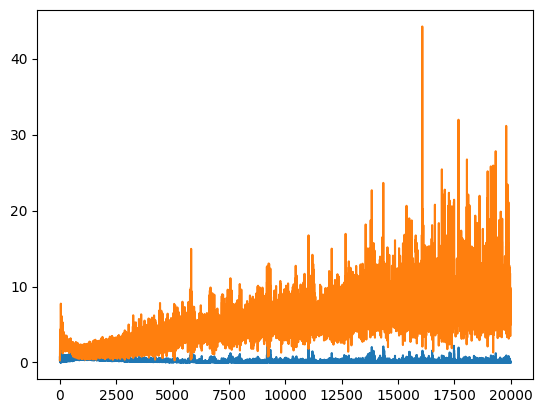

In [ ]:
%matplotlib inline
plt.figure
plt.plot(DD)
plt.plot(GG)

Como podemos comprobar, utilizando el modelo del notebook el discriminador tiene muchísima prioridad sobr eel generador. Para corregir esto, podríamos realizar varias modificaciones en el modelo, como establecer una diferencia máxima entre los valores de las funciones de pérdidas del generador y el discriminador, o también podríamos entorpecer el aprendizaje del dsicriminador.

Generamos las imágenes a partir del GAN entrenado con 20000 épocas.

1/1 [==============================] - 0s 20ms/step


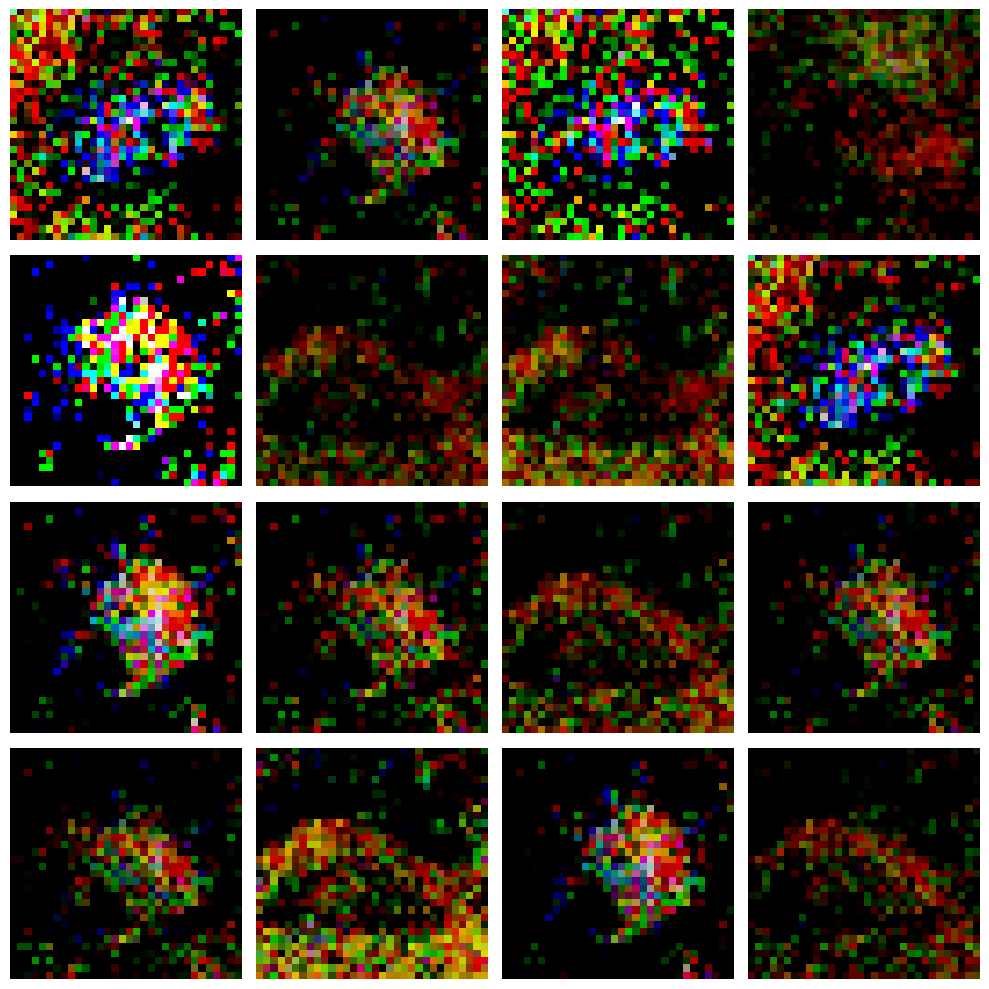

In [ ]:
%matplotlib inline
gan.plot_images()

Como podemos observar, prácticamente no se distingue ningún objeto.

### ENTRENAMIENTO Y RESULTADOS DEL MODELO SIMPLIFICADO

Probaremos ahora con el modelo simplificado, para el cual hemos reducido el número de poarámetros en un 33%.

In [ ]:
DD_less, GG_less = gan_less.train(Prueba, epochs=20000)

1/1 [==============================] - 0s 59ms/step
epoch: 0, [Discriminator :: d_loss: 0.669954], [ Generator :: loss: 0.544214]
1/1 [==============================] - 0s 64ms/step


1/1 [==============================] - 0s 23ms/step
epoch: 1, [Discriminator :: d_loss: 0.378952], [ Generator :: loss: 0.560581]
1/1 [==============================] - 0s 22ms/step
epoch: 2, [Discriminator :: d_loss: 0.335603], [ Generator :: loss: 0.588561]
1/1 [==============================] - 0s 26ms/step
epoch: 3, [Discriminator :: d_loss: 0.316095], [ Generator :: loss: 0.637363]
epoch: 4, [Discriminator :: d_loss: 0.316095], [ Generator :: loss: 0.588184]
1/1 [==============================] - 0s 148ms/step
epoch: 5, [Discriminator :: d_loss: 0.456646], [ Generator :: loss: 0.632963]
1/1 [==============================] - 0s 121ms/step
epoch: 6, [Discriminator :: d_loss: 0.307367], [ Generator :: loss: 0.679289]
epoch: 7, [Discriminator :: d_loss: 0.307367], [ Generator :: loss: 0.626958]
epoch: 8, [Discriminator :: d_loss: 0.307367], [ Generator :: loss: 0.617043]
epoch: 9, [Discriminator :: d_loss: 0.307367], [ Generator :: loss: 0.581339]
1/1 [==============================]

epoch: 101, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.833312]
epoch: 102, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.826728]
epoch: 103, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.843093]
epoch: 104, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.792156]
epoch: 105, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.734935]
epoch: 106, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.808299]
epoch: 107, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.773572]
epoch: 108, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.739316]
epoch: 109, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.663966]
epoch: 110, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.751504]
epoch: 111, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.691614]
epoch: 112, [Discriminator :: d_loss: 0.305257], [ Generator :: loss: 0.739609]
epoch: 113, [Discriminator :: d_loss: 0.

epoch: 201, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 1.063999]
epoch: 202, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 1.103434]
epoch: 203, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 1.044865]
epoch: 204, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 1.032768]
epoch: 205, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 0.957567]
epoch: 206, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 0.976264]
epoch: 207, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 0.956639]
epoch: 208, [Discriminator :: d_loss: 0.462149], [ Generator :: loss: 0.917850]
1/1 [==============================] - 0s 15ms/step
epoch: 209, [Discriminator :: d_loss: 0.433202], [ Generator :: loss: 1.115421]
epoch: 210, [Discriminator :: d_loss: 0.433202], [ Generator :: loss: 1.088976]
epoch: 211, [Discriminator :: d_loss: 0.433202], [ Generator :: loss: 1.009986]
epoch: 212, [Discriminator :: d_loss: 0.433202], [ Generator :: loss

epoch: 301, [Discriminator :: d_loss: 0.418537], [ Generator :: loss: 0.845374]
epoch: 302, [Discriminator :: d_loss: 0.418537], [ Generator :: loss: 0.860513]
epoch: 303, [Discriminator :: d_loss: 0.418537], [ Generator :: loss: 0.837592]
epoch: 304, [Discriminator :: d_loss: 0.418537], [ Generator :: loss: 0.794359]
1/1 [==============================] - 0s 15ms/step
epoch: 305, [Discriminator :: d_loss: 0.399064], [ Generator :: loss: 0.807037]
epoch: 306, [Discriminator :: d_loss: 0.399064], [ Generator :: loss: 0.864467]
epoch: 307, [Discriminator :: d_loss: 0.399064], [ Generator :: loss: 0.821654]
epoch: 308, [Discriminator :: d_loss: 0.399064], [ Generator :: loss: 0.790982]
1/1 [==============================] - 0s 16ms/step
epoch: 309, [Discriminator :: d_loss: 0.474818], [ Generator :: loss: 1.040819]
epoch: 310, [Discriminator :: d_loss: 0.474818], [ Generator :: loss: 1.000299]
epoch: 311, [Discriminator :: d_loss: 0.474818], [ Generator :: loss: 1.003019]
epoch: 312, [Dis

epoch: 401, [Discriminator :: d_loss: 0.415294], [ Generator :: loss: 0.886135]
epoch: 402, [Discriminator :: d_loss: 0.415294], [ Generator :: loss: 0.879202]
epoch: 403, [Discriminator :: d_loss: 0.415294], [ Generator :: loss: 0.806462]
1/1 [==============================] - 0s 20ms/step
epoch: 404, [Discriminator :: d_loss: 0.522598], [ Generator :: loss: 0.875982]
1/1 [==============================] - 0s 20ms/step
epoch: 405, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.890757]
epoch: 406, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.864972]
epoch: 407, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.837515]
epoch: 408, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.857760]
epoch: 409, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.806958]
epoch: 410, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.819062]
epoch: 411, [Discriminator :: d_loss: 0.335248], [ Generator :: loss: 0.812826]
epoch: 412, [Dis

epoch: 501, [Discriminator :: d_loss: 0.431509], [ Generator :: loss: 0.945905]
epoch: 502, [Discriminator :: d_loss: 0.431509], [ Generator :: loss: 0.884153]
epoch: 503, [Discriminator :: d_loss: 0.431509], [ Generator :: loss: 0.855899]
1/1 [==============================] - 0s 35ms/step
epoch: 504, [Discriminator :: d_loss: 0.456015], [ Generator :: loss: 0.840811]
1/1 [==============================] - 0s 26ms/step
epoch: 505, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 1.145733]
epoch: 506, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 1.070214]
epoch: 507, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 0.984044]
epoch: 508, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 0.963253]
epoch: 509, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 0.904169]
epoch: 510, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 0.842143]
epoch: 511, [Discriminator :: d_loss: 0.378959], [ Generator :: loss: 0.886789]
epoch: 512, [Dis

epoch: 601, [Discriminator :: d_loss: 0.359245], [ Generator :: loss: 0.771721]
epoch: 602, [Discriminator :: d_loss: 0.359245], [ Generator :: loss: 0.771096]
epoch: 603, [Discriminator :: d_loss: 0.359245], [ Generator :: loss: 0.752726]
epoch: 604, [Discriminator :: d_loss: 0.359245], [ Generator :: loss: 0.706297]
1/1 [==============================] - 0s 78ms/step
epoch: 605, [Discriminator :: d_loss: 0.533022], [ Generator :: loss: 0.856135]
1/1 [==============================] - 0s 73ms/step
epoch: 606, [Discriminator :: d_loss: 0.617495], [ Generator :: loss: 0.767324]
1/1 [==============================] - 0s 21ms/step
epoch: 607, [Discriminator :: d_loss: 0.506037], [ Generator :: loss: 0.889945]
1/1 [==============================] - 0s 21ms/step
epoch: 608, [Discriminator :: d_loss: 0.682878], [ Generator :: loss: 0.868004]
1/1 [==============================] - 0s 19ms/step
epoch: 609, [Discriminator :: d_loss: 0.521274], [ Generator :: loss: 0.801332]
1/1 [===============

1/1 [==============================] - 0s 20ms/step
epoch: 701, [Discriminator :: d_loss: 0.481497], [ Generator :: loss: 0.832093]
1/1 [==============================] - 0s 33ms/step
epoch: 702, [Discriminator :: d_loss: 0.570732], [ Generator :: loss: 0.859147]
1/1 [==============================] - 0s 19ms/step
epoch: 703, [Discriminator :: d_loss: 0.563504], [ Generator :: loss: 0.936476]
1/1 [==============================] - 0s 19ms/step
epoch: 704, [Discriminator :: d_loss: 0.592665], [ Generator :: loss: 0.884498]
1/1 [==============================] - 0s 20ms/step
epoch: 705, [Discriminator :: d_loss: 0.585225], [ Generator :: loss: 0.876269]
1/1 [==============================] - 0s 19ms/step
epoch: 706, [Discriminator :: d_loss: 0.518736], [ Generator :: loss: 0.757866]
1/1 [==============================] - 0s 20ms/step
epoch: 707, [Discriminator :: d_loss: 0.599951], [ Generator :: loss: 1.040185]
1/1 [==============================] - 0s 20ms/step
epoch: 708, [Discriminat

1/1 [==============================] - 0s 19ms/step
epoch: 801, [Discriminator :: d_loss: 0.446621], [ Generator :: loss: 0.987138]
epoch: 802, [Discriminator :: d_loss: 0.446621], [ Generator :: loss: 0.932349]
epoch: 803, [Discriminator :: d_loss: 0.446621], [ Generator :: loss: 0.928229]
epoch: 804, [Discriminator :: d_loss: 0.446621], [ Generator :: loss: 0.836974]
1/1 [==============================] - 0s 44ms/step
epoch: 805, [Discriminator :: d_loss: 0.567242], [ Generator :: loss: 0.717105]
1/1 [==============================] - 0s 23ms/step
epoch: 806, [Discriminator :: d_loss: 0.730724], [ Generator :: loss: 0.867749]
1/1 [==============================] - 0s 21ms/step
epoch: 807, [Discriminator :: d_loss: 0.385275], [ Generator :: loss: 0.843256]
epoch: 808, [Discriminator :: d_loss: 0.385275], [ Generator :: loss: 0.784800]
epoch: 809, [Discriminator :: d_loss: 0.385275], [ Generator :: loss: 0.729005]
1/1 [==============================] - 0s 33ms/step
epoch: 810, [Discrim

1/1 [==============================] - 0s 29ms/step
epoch: 901, [Discriminator :: d_loss: 0.627012], [ Generator :: loss: 0.828643]
1/1 [==============================] - 0s 30ms/step
epoch: 902, [Discriminator :: d_loss: 0.580883], [ Generator :: loss: 0.821417]
1/1 [==============================] - 0s 30ms/step
epoch: 903, [Discriminator :: d_loss: 0.458531], [ Generator :: loss: 0.765683]
1/1 [==============================] - 0s 37ms/step
epoch: 904, [Discriminator :: d_loss: 0.524894], [ Generator :: loss: 1.066156]
epoch: 905, [Discriminator :: d_loss: 0.524894], [ Generator :: loss: 0.962955]
1/1 [==============================] - 0s 28ms/step
epoch: 906, [Discriminator :: d_loss: 0.526135], [ Generator :: loss: 0.756670]
1/1 [==============================] - 0s 63ms/step
epoch: 907, [Discriminator :: d_loss: 0.717599], [ Generator :: loss: 0.920173]
1/1 [==============================] - 0s 111ms/step
epoch: 908, [Discriminator :: d_loss: 0.508964], [ Generator :: loss: 1.102

1/1 [==============================] - 0s 111ms/step
epoch: 1001, [Discriminator :: d_loss: 0.509885], [ Generator :: loss: 0.642308]
1/1 [==============================] - 0s 172ms/step
epoch: 1002, [Discriminator :: d_loss: 0.668878], [ Generator :: loss: 0.993397]
1/1 [==============================] - 0s 94ms/step
epoch: 1003, [Discriminator :: d_loss: 0.548732], [ Generator :: loss: 0.897308]
1/1 [==============================] - 0s 88ms/step
epoch: 1004, [Discriminator :: d_loss: 0.533375], [ Generator :: loss: 0.847491]
1/1 [==============================] - 0s 52ms/step
epoch: 1005, [Discriminator :: d_loss: 0.547831], [ Generator :: loss: 0.880727]
1/1 [==============================] - 0s 78ms/step
epoch: 1006, [Discriminator :: d_loss: 0.463091], [ Generator :: loss: 0.951555]
epoch: 1007, [Discriminator :: d_loss: 0.463091], [ Generator :: loss: 0.928040]
epoch: 1008, [Discriminator :: d_loss: 0.463091], [ Generator :: loss: 0.869387]
1/1 [==============================] -

1/1 [==============================] - 0s 20ms/step
epoch: 1101, [Discriminator :: d_loss: 0.555814], [ Generator :: loss: 0.859014]
1/1 [==============================] - 0s 18ms/step
epoch: 1102, [Discriminator :: d_loss: 0.524648], [ Generator :: loss: 0.900275]
1/1 [==============================] - 0s 21ms/step
epoch: 1103, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 1.110920]
epoch: 1104, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 1.065330]
epoch: 1105, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 0.973571]
epoch: 1106, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 0.973836]
epoch: 1107, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 0.950107]
epoch: 1108, [Discriminator :: d_loss: 0.467267], [ Generator :: loss: 0.770632]
1/1 [==============================] - 0s 20ms/step
epoch: 1109, [Discriminator :: d_loss: 0.798061], [ Generator :: loss: 0.779951]
1/1 [==============================] - 0s 18ms/step
epoch: 1110

1/1 [==============================] - 0s 19ms/step
epoch: 1201, [Discriminator :: d_loss: 0.530954], [ Generator :: loss: 0.840280]
1/1 [==============================] - 0s 18ms/step
epoch: 1202, [Discriminator :: d_loss: 0.737239], [ Generator :: loss: 1.087229]
1/1 [==============================] - 0s 21ms/step
epoch: 1203, [Discriminator :: d_loss: 0.718901], [ Generator :: loss: 0.588618]
1/1 [==============================] - 0s 24ms/step
epoch: 1204, [Discriminator :: d_loss: 0.603763], [ Generator :: loss: 0.819533]
1/1 [==============================] - 0s 20ms/step
epoch: 1205, [Discriminator :: d_loss: 0.514336], [ Generator :: loss: 1.172251]
epoch: 1206, [Discriminator :: d_loss: 0.514336], [ Generator :: loss: 1.151114]
epoch: 1207, [Discriminator :: d_loss: 0.514336], [ Generator :: loss: 1.149782]
epoch: 1208, [Discriminator :: d_loss: 0.514336], [ Generator :: loss: 1.103805]
epoch: 1209, [Discriminator :: d_loss: 0.514336], [ Generator :: loss: 1.046305]
epoch: 1210

epoch: 1301, [Discriminator :: d_loss: 0.499633], [ Generator :: loss: 0.945555]
1/1 [==============================] - 0s 18ms/step
epoch: 1302, [Discriminator :: d_loss: 0.603144], [ Generator :: loss: 0.765477]
1/1 [==============================] - 0s 17ms/step
epoch: 1303, [Discriminator :: d_loss: 0.605856], [ Generator :: loss: 0.934439]
1/1 [==============================] - 0s 22ms/step
epoch: 1304, [Discriminator :: d_loss: 0.712023], [ Generator :: loss: 0.929237]
1/1 [==============================] - 0s 18ms/step
epoch: 1305, [Discriminator :: d_loss: 0.649297], [ Generator :: loss: 0.747319]
1/1 [==============================] - 0s 18ms/step
epoch: 1306, [Discriminator :: d_loss: 0.744031], [ Generator :: loss: 1.057515]
1/1 [==============================] - 0s 21ms/step
epoch: 1307, [Discriminator :: d_loss: 0.590220], [ Generator :: loss: 1.018198]
1/1 [==============================] - 0s 17ms/step
epoch: 1308, [Discriminator :: d_loss: 0.539790], [ Generator :: loss

1/1 [==============================] - 0s 21ms/step
epoch: 1401, [Discriminator :: d_loss: 0.544521], [ Generator :: loss: 0.748115]
1/1 [==============================] - 0s 19ms/step
epoch: 1402, [Discriminator :: d_loss: 0.714958], [ Generator :: loss: 1.138709]
1/1 [==============================] - 0s 23ms/step
epoch: 1403, [Discriminator :: d_loss: 0.529178], [ Generator :: loss: 0.909871]
1/1 [==============================] - 0s 21ms/step
epoch: 1404, [Discriminator :: d_loss: 0.473950], [ Generator :: loss: 0.874678]
1/1 [==============================] - 0s 20ms/step
epoch: 1405, [Discriminator :: d_loss: 0.537017], [ Generator :: loss: 1.009115]
1/1 [==============================] - 0s 21ms/step
epoch: 1406, [Discriminator :: d_loss: 0.474884], [ Generator :: loss: 1.080427]
epoch: 1407, [Discriminator :: d_loss: 0.474884], [ Generator :: loss: 0.999074]
epoch: 1408, [Discriminator :: d_loss: 0.474884], [ Generator :: loss: 0.913463]
1/1 [==============================] - 0

1/1 [==============================] - 0s 20ms/step
epoch: 1501, [Discriminator :: d_loss: 0.586367], [ Generator :: loss: 0.770564]
1/1 [==============================] - 0s 19ms/step
epoch: 1502, [Discriminator :: d_loss: 0.565941], [ Generator :: loss: 0.878212]
1/1 [==============================] - 0s 19ms/step
epoch: 1503, [Discriminator :: d_loss: 0.624553], [ Generator :: loss: 0.968838]
1/1 [==============================] - 0s 20ms/step
epoch: 1504, [Discriminator :: d_loss: 0.541222], [ Generator :: loss: 0.952381]
1/1 [==============================] - 0s 21ms/step
epoch: 1505, [Discriminator :: d_loss: 0.554908], [ Generator :: loss: 0.721187]
1/1 [==============================] - 0s 25ms/step
epoch: 1506, [Discriminator :: d_loss: 0.611868], [ Generator :: loss: 1.143923]
1/1 [==============================] - 0s 19ms/step
epoch: 1507, [Discriminator :: d_loss: 0.505772], [ Generator :: loss: 0.880713]
1/1 [==============================] - 0s 33ms/step
epoch: 1508, [Dis

epoch: 1601, [Discriminator :: d_loss: 0.505789], [ Generator :: loss: 1.158984]
epoch: 1602, [Discriminator :: d_loss: 0.505789], [ Generator :: loss: 1.021695]
epoch: 1603, [Discriminator :: d_loss: 0.505789], [ Generator :: loss: 1.031049]
epoch: 1604, [Discriminator :: d_loss: 0.505789], [ Generator :: loss: 0.868347]
1/1 [==============================] - 0s 21ms/step
epoch: 1605, [Discriminator :: d_loss: 0.650800], [ Generator :: loss: 0.634466]
1/1 [==============================] - 0s 20ms/step
epoch: 1606, [Discriminator :: d_loss: 0.677094], [ Generator :: loss: 0.764677]
1/1 [==============================] - 0s 19ms/step
epoch: 1607, [Discriminator :: d_loss: 0.688715], [ Generator :: loss: 1.060257]
1/1 [==============================] - 0s 22ms/step
epoch: 1608, [Discriminator :: d_loss: 0.617515], [ Generator :: loss: 1.060985]
1/1 [==============================] - 0s 19ms/step
epoch: 1609, [Discriminator :: d_loss: 0.785584], [ Generator :: loss: 0.782296]
1/1 [======

epoch: 1701, [Discriminator :: d_loss: 0.513569], [ Generator :: loss: 0.963131]
1/1 [==============================] - 0s 21ms/step
epoch: 1702, [Discriminator :: d_loss: 0.627272], [ Generator :: loss: 0.817297]
1/1 [==============================] - 0s 17ms/step
epoch: 1703, [Discriminator :: d_loss: 0.645667], [ Generator :: loss: 1.012458]
1/1 [==============================] - 0s 29ms/step
epoch: 1704, [Discriminator :: d_loss: 0.645179], [ Generator :: loss: 0.913577]
1/1 [==============================] - 0s 25ms/step
epoch: 1705, [Discriminator :: d_loss: 0.579148], [ Generator :: loss: 0.810096]
1/1 [==============================] - 0s 24ms/step
epoch: 1706, [Discriminator :: d_loss: 0.622348], [ Generator :: loss: 1.076074]
1/1 [==============================] - 0s 23ms/step
epoch: 1707, [Discriminator :: d_loss: 0.615749], [ Generator :: loss: 0.982125]
1/1 [==============================] - 0s 24ms/step
epoch: 1708, [Discriminator :: d_loss: 0.548155], [ Generator :: loss

epoch: 1801, [Discriminator :: d_loss: 0.402471], [ Generator :: loss: 0.873578]
epoch: 1802, [Discriminator :: d_loss: 0.402471], [ Generator :: loss: 0.895679]
epoch: 1803, [Discriminator :: d_loss: 0.402471], [ Generator :: loss: 0.799116]
1/1 [==============================] - 0s 17ms/step
epoch: 1804, [Discriminator :: d_loss: 0.559466], [ Generator :: loss: 1.150557]
epoch: 1805, [Discriminator :: d_loss: 0.559466], [ Generator :: loss: 1.206414]
epoch: 1806, [Discriminator :: d_loss: 0.559466], [ Generator :: loss: 1.188482]
epoch: 1807, [Discriminator :: d_loss: 0.559466], [ Generator :: loss: 1.067153]
1/1 [==============================] - 0s 17ms/step
epoch: 1808, [Discriminator :: d_loss: 0.598084], [ Generator :: loss: 0.902356]
1/1 [==============================] - 0s 20ms/step
epoch: 1809, [Discriminator :: d_loss: 0.518750], [ Generator :: loss: 0.932500]
1/1 [==============================] - 0s 17ms/step
epoch: 1810, [Discriminator :: d_loss: 0.473093], [ Generator :

1/1 [==============================] - 0s 27ms/step
epoch: 1901, [Discriminator :: d_loss: 0.790310], [ Generator :: loss: 0.553550]
1/1 [==============================] - 0s 25ms/step
epoch: 1902, [Discriminator :: d_loss: 0.709238], [ Generator :: loss: 1.017842]
1/1 [==============================] - 0s 25ms/step
epoch: 1903, [Discriminator :: d_loss: 0.680259], [ Generator :: loss: 1.163689]
1/1 [==============================] - 0s 28ms/step
epoch: 1904, [Discriminator :: d_loss: 0.637273], [ Generator :: loss: 1.107787]
1/1 [==============================] - 0s 34ms/step
epoch: 1905, [Discriminator :: d_loss: 0.640499], [ Generator :: loss: 0.547203]
1/1 [==============================] - 0s 25ms/step
epoch: 1906, [Discriminator :: d_loss: 0.769788], [ Generator :: loss: 0.821792]
1/1 [==============================] - 0s 25ms/step
epoch: 1907, [Discriminator :: d_loss: 0.503880], [ Generator :: loss: 0.801445]
1/1 [==============================] - 0s 27ms/step
epoch: 1908, [Dis

epoch: 2001, [Discriminator :: d_loss: 0.546733], [ Generator :: loss: 1.174147]
epoch: 2002, [Discriminator :: d_loss: 0.546733], [ Generator :: loss: 1.204331]
epoch: 2003, [Discriminator :: d_loss: 0.546733], [ Generator :: loss: 1.067489]
1/1 [==============================] - 0s 18ms/step
epoch: 2004, [Discriminator :: d_loss: 0.633173], [ Generator :: loss: 0.850582]
1/1 [==============================] - 0s 21ms/step
epoch: 2005, [Discriminator :: d_loss: 0.789064], [ Generator :: loss: 0.729022]
1/1 [==============================] - 0s 17ms/step
epoch: 2006, [Discriminator :: d_loss: 0.622954], [ Generator :: loss: 1.168976]
1/1 [==============================] - 0s 17ms/step
epoch: 2007, [Discriminator :: d_loss: 0.786951], [ Generator :: loss: 0.797560]
1/1 [==============================] - 0s 17ms/step
epoch: 2008, [Discriminator :: d_loss: 0.541757], [ Generator :: loss: 0.630011]
1/1 [==============================] - 0s 18ms/step
epoch: 2009, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 30ms/step
epoch: 2101, [Discriminator :: d_loss: 0.570178], [ Generator :: loss: 0.933271]
1/1 [==============================] - 0s 29ms/step
epoch: 2102, [Discriminator :: d_loss: 0.544040], [ Generator :: loss: 0.827191]
1/1 [==============================] - 0s 19ms/step
epoch: 2103, [Discriminator :: d_loss: 0.532081], [ Generator :: loss: 0.983990]
1/1 [==============================] - 0s 26ms/step
epoch: 2104, [Discriminator :: d_loss: 0.535722], [ Generator :: loss: 1.080296]
epoch: 2105, [Discriminator :: d_loss: 0.535722], [ Generator :: loss: 1.018867]
1/1 [==============================] - 0s 22ms/step
epoch: 2106, [Discriminator :: d_loss: 0.660030], [ Generator :: loss: 1.375292]
epoch: 2107, [Discriminator :: d_loss: 0.660030], [ Generator :: loss: 1.304229]
1/1 [==============================] - 0s 19ms/step
epoch: 2108, [Discriminator :: d_loss: 0.627506], [ Generator :: loss: 0.890060]
1/1 [==============================] - 0

epoch: 2201, [Discriminator :: d_loss: 0.527315], [ Generator :: loss: 1.171007]
epoch: 2202, [Discriminator :: d_loss: 0.527315], [ Generator :: loss: 1.156846]
epoch: 2203, [Discriminator :: d_loss: 0.527315], [ Generator :: loss: 1.043170]
1/1 [==============================] - 0s 21ms/step
epoch: 2204, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.359798]
epoch: 2205, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.277999]
epoch: 2206, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.389172]
epoch: 2207, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.307610]
epoch: 2208, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.256935]
epoch: 2209, [Discriminator :: d_loss: 0.619038], [ Generator :: loss: 1.182434]
1/1 [==============================] - 0s 19ms/step
epoch: 2210, [Discriminator :: d_loss: 0.858570], [ Generator :: loss: 0.715144]
1/1 [==============================] - 0s 20ms/step
epoch: 2211, [Discriminator :: d_l

epoch: 2301, [Discriminator :: d_loss: 0.491922], [ Generator :: loss: 1.122062]
epoch: 2302, [Discriminator :: d_loss: 0.491922], [ Generator :: loss: 1.057816]
epoch: 2303, [Discriminator :: d_loss: 0.491922], [ Generator :: loss: 1.037812]
epoch: 2304, [Discriminator :: d_loss: 0.491922], [ Generator :: loss: 0.889266]
1/1 [==============================] - 0s 35ms/step
epoch: 2305, [Discriminator :: d_loss: 0.665254], [ Generator :: loss: 1.177571]
1/1 [==============================] - 0s 35ms/step
epoch: 2306, [Discriminator :: d_loss: 0.499946], [ Generator :: loss: 0.860465]
1/1 [==============================] - 0s 35ms/step
epoch: 2307, [Discriminator :: d_loss: 0.601539], [ Generator :: loss: 1.154765]
1/1 [==============================] - 0s 34ms/step
epoch: 2308, [Discriminator :: d_loss: 0.566482], [ Generator :: loss: 1.029880]
1/1 [==============================] - 0s 33ms/step
epoch: 2309, [Discriminator :: d_loss: 0.614452], [ Generator :: loss: 0.848547]
1/1 [======

1/1 [==============================] - 0s 18ms/step
epoch: 2401, [Discriminator :: d_loss: 0.647497], [ Generator :: loss: 0.737998]
1/1 [==============================] - 0s 22ms/step
epoch: 2402, [Discriminator :: d_loss: 0.659489], [ Generator :: loss: 1.220259]
1/1 [==============================] - 0s 17ms/step
epoch: 2403, [Discriminator :: d_loss: 0.592201], [ Generator :: loss: 1.237365]
epoch: 2404, [Discriminator :: d_loss: 0.592201], [ Generator :: loss: 1.201891]
epoch: 2405, [Discriminator :: d_loss: 0.592201], [ Generator :: loss: 1.065010]
1/1 [==============================] - 0s 17ms/step
epoch: 2406, [Discriminator :: d_loss: 0.637993], [ Generator :: loss: 0.815993]
1/1 [==============================] - 0s 17ms/step
epoch: 2407, [Discriminator :: d_loss: 0.559429], [ Generator :: loss: 0.822491]
1/1 [==============================] - 0s 19ms/step
epoch: 2408, [Discriminator :: d_loss: 0.533148], [ Generator :: loss: 0.992802]
1/1 [==============================] - 0

1/1 [==============================] - 0s 18ms/step
epoch: 2501, [Discriminator :: d_loss: 0.623766], [ Generator :: loss: 1.363142]
epoch: 2502, [Discriminator :: d_loss: 0.623766], [ Generator :: loss: 1.373036]
epoch: 2503, [Discriminator :: d_loss: 0.623766], [ Generator :: loss: 1.317119]
epoch: 2504, [Discriminator :: d_loss: 0.623766], [ Generator :: loss: 1.305325]
epoch: 2505, [Discriminator :: d_loss: 0.623766], [ Generator :: loss: 1.239733]
1/1 [==============================] - 0s 17ms/step
epoch: 2506, [Discriminator :: d_loss: 0.640485], [ Generator :: loss: 0.975263]
1/1 [==============================] - 0s 19ms/step
epoch: 2507, [Discriminator :: d_loss: 0.613011], [ Generator :: loss: 1.139904]
1/1 [==============================] - 0s 18ms/step
epoch: 2508, [Discriminator :: d_loss: 0.526772], [ Generator :: loss: 1.255377]
epoch: 2509, [Discriminator :: d_loss: 0.526772], [ Generator :: loss: 1.091498]
epoch: 2510, [Discriminator :: d_loss: 0.526772], [ Generator :

epoch: 2601, [Discriminator :: d_loss: 0.576802], [ Generator :: loss: 1.208064]
epoch: 2602, [Discriminator :: d_loss: 0.576802], [ Generator :: loss: 1.184961]
epoch: 2603, [Discriminator :: d_loss: 0.576802], [ Generator :: loss: 1.132871]
1/1 [==============================] - 0s 20ms/step
epoch: 2604, [Discriminator :: d_loss: 0.706197], [ Generator :: loss: 0.727171]
1/1 [==============================] - 0s 26ms/step
epoch: 2605, [Discriminator :: d_loss: 0.669153], [ Generator :: loss: 1.374363]
epoch: 2606, [Discriminator :: d_loss: 0.669153], [ Generator :: loss: 1.252151]
1/1 [==============================] - 0s 17ms/step
epoch: 2607, [Discriminator :: d_loss: 0.512139], [ Generator :: loss: 1.410390]
epoch: 2608, [Discriminator :: d_loss: 0.512139], [ Generator :: loss: 1.342127]
epoch: 2609, [Discriminator :: d_loss: 0.512139], [ Generator :: loss: 1.293427]
epoch: 2610, [Discriminator :: d_loss: 0.512139], [ Generator :: loss: 1.277631]
epoch: 2611, [Discriminator :: d_l

1/1 [==============================] - 0s 20ms/step
epoch: 2701, [Discriminator :: d_loss: 0.774112], [ Generator :: loss: 0.912992]
1/1 [==============================] - 0s 19ms/step
epoch: 2702, [Discriminator :: d_loss: 0.708974], [ Generator :: loss: 0.552153]
1/1 [==============================] - 0s 17ms/step
epoch: 2703, [Discriminator :: d_loss: 0.761675], [ Generator :: loss: 1.090936]
1/1 [==============================] - 0s 17ms/step
epoch: 2704, [Discriminator :: d_loss: 0.588728], [ Generator :: loss: 1.091602]
1/1 [==============================] - 0s 20ms/step
epoch: 2705, [Discriminator :: d_loss: 0.622219], [ Generator :: loss: 0.902126]
1/1 [==============================] - 0s 18ms/step
epoch: 2706, [Discriminator :: d_loss: 0.610761], [ Generator :: loss: 1.068563]
1/1 [==============================] - 0s 19ms/step
epoch: 2707, [Discriminator :: d_loss: 0.601166], [ Generator :: loss: 0.894826]
1/1 [==============================] - 0s 17ms/step
epoch: 2708, [Dis

epoch: 2801, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.386223]
epoch: 2802, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.449752]
epoch: 2803, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.310329]
epoch: 2804, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.371472]
epoch: 2805, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.336988]
epoch: 2806, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.259520]
epoch: 2807, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.260044]
epoch: 2808, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.231056]
epoch: 2809, [Discriminator :: d_loss: 0.605217], [ Generator :: loss: 1.167172]
1/1 [==============================] - 0s 26ms/step
epoch: 2810, [Discriminator :: d_loss: 0.856505], [ Generator :: loss: 1.018914]
1/1 [==============================] - 0s 17ms/step
epoch: 2811, [Discriminator :: d_loss: 0.649565], [ Generator :: loss: 0.625841]
1/1 [

1/1 [==============================] - 0s 18ms/step
epoch: 2901, [Discriminator :: d_loss: 0.653226], [ Generator :: loss: 0.905147]
1/1 [==============================] - 0s 16ms/step
epoch: 2902, [Discriminator :: d_loss: 0.607910], [ Generator :: loss: 0.823713]
1/1 [==============================] - 0s 16ms/step
epoch: 2903, [Discriminator :: d_loss: 0.754865], [ Generator :: loss: 1.370010]
1/1 [==============================] - 0s 17ms/step
epoch: 2904, [Discriminator :: d_loss: 0.710275], [ Generator :: loss: 1.032179]
1/1 [==============================] - 0s 17ms/step
epoch: 2905, [Discriminator :: d_loss: 0.693728], [ Generator :: loss: 0.731492]
1/1 [==============================] - 0s 18ms/step
epoch: 2906, [Discriminator :: d_loss: 0.671154], [ Generator :: loss: 1.244217]
1/1 [==============================] - 0s 17ms/step
epoch: 2907, [Discriminator :: d_loss: 0.517496], [ Generator :: loss: 1.414070]
epoch: 2908, [Discriminator :: d_loss: 0.517496], [ Generator :: loss

epoch: 3001, [Discriminator :: d_loss: 0.548258], [ Generator :: loss: 1.210335]
epoch: 3002, [Discriminator :: d_loss: 0.548258], [ Generator :: loss: 1.213819]
epoch: 3003, [Discriminator :: d_loss: 0.548258], [ Generator :: loss: 1.085406]
1/1 [==============================] - 0s 20ms/step
epoch: 3004, [Discriminator :: d_loss: 0.585104], [ Generator :: loss: 1.312589]
epoch: 3005, [Discriminator :: d_loss: 0.585104], [ Generator :: loss: 1.266633]
epoch: 3006, [Discriminator :: d_loss: 0.585104], [ Generator :: loss: 1.135063]
1/1 [==============================] - 0s 21ms/step
epoch: 3007, [Discriminator :: d_loss: 0.517475], [ Generator :: loss: 1.290515]
epoch: 3008, [Discriminator :: d_loss: 0.517475], [ Generator :: loss: 1.235770]
epoch: 3009, [Discriminator :: d_loss: 0.517475], [ Generator :: loss: 1.285307]
epoch: 3010, [Discriminator :: d_loss: 0.517475], [ Generator :: loss: 1.078439]
epoch: 3011, [Discriminator :: d_loss: 0.517475], [ Generator :: loss: 1.084257]
epoch

epoch: 3101, [Discriminator :: d_loss: 0.580226], [ Generator :: loss: 1.128585]
1/1 [==============================] - 0s 20ms/step
epoch: 3102, [Discriminator :: d_loss: 0.707574], [ Generator :: loss: 0.952967]
1/1 [==============================] - 0s 21ms/step
epoch: 3103, [Discriminator :: d_loss: 0.641403], [ Generator :: loss: 0.759148]
1/1 [==============================] - 0s 24ms/step
epoch: 3104, [Discriminator :: d_loss: 0.609223], [ Generator :: loss: 1.076382]
1/1 [==============================] - 0s 24ms/step
epoch: 3105, [Discriminator :: d_loss: 0.648132], [ Generator :: loss: 1.301481]
epoch: 3106, [Discriminator :: d_loss: 0.648132], [ Generator :: loss: 1.191277]
1/1 [==============================] - 0s 22ms/step
epoch: 3107, [Discriminator :: d_loss: 0.450329], [ Generator :: loss: 1.204473]
epoch: 3108, [Discriminator :: d_loss: 0.450329], [ Generator :: loss: 1.143857]
epoch: 3109, [Discriminator :: d_loss: 0.450329], [ Generator :: loss: 1.245264]
epoch: 3110

1/1 [==============================] - 0s 19ms/step
epoch: 3201, [Discriminator :: d_loss: 0.544436], [ Generator :: loss: 1.029375]
1/1 [==============================] - 0s 17ms/step
epoch: 3202, [Discriminator :: d_loss: 0.598758], [ Generator :: loss: 1.111097]
1/1 [==============================] - 0s 17ms/step
epoch: 3203, [Discriminator :: d_loss: 0.602658], [ Generator :: loss: 0.849770]
1/1 [==============================] - 0s 23ms/step
epoch: 3204, [Discriminator :: d_loss: 0.602033], [ Generator :: loss: 0.841824]
1/1 [==============================] - 0s 20ms/step
epoch: 3205, [Discriminator :: d_loss: 0.469254], [ Generator :: loss: 1.035495]
epoch: 3206, [Discriminator :: d_loss: 0.469254], [ Generator :: loss: 0.984769]
epoch: 3207, [Discriminator :: d_loss: 0.469254], [ Generator :: loss: 0.961213]
epoch: 3208, [Discriminator :: d_loss: 0.469254], [ Generator :: loss: 0.942796]
epoch: 3209, [Discriminator :: d_loss: 0.469254], [ Generator :: loss: 0.910053]
1/1 [======

epoch: 3301, [Discriminator :: d_loss: 0.536156], [ Generator :: loss: 1.047676]
1/1 [==============================] - 0s 18ms/step
epoch: 3302, [Discriminator :: d_loss: 0.667862], [ Generator :: loss: 1.021417]
1/1 [==============================] - 0s 17ms/step
epoch: 3303, [Discriminator :: d_loss: 0.585631], [ Generator :: loss: 0.844371]
1/1 [==============================] - 0s 17ms/step
epoch: 3304, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.373528]
epoch: 3305, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.267506]
epoch: 3306, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.195345]
epoch: 3307, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.228980]
epoch: 3308, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.223926]
epoch: 3309, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.189790]
epoch: 3310, [Discriminator :: d_loss: 0.576239], [ Generator :: loss: 1.066950]
1/1 [=============================

1/1 [==============================] - 0s 18ms/step
epoch: 3401, [Discriminator :: d_loss: 0.611930], [ Generator :: loss: 1.295328]
epoch: 3402, [Discriminator :: d_loss: 0.611930], [ Generator :: loss: 1.216606]
1/1 [==============================] - 0s 19ms/step
epoch: 3403, [Discriminator :: d_loss: 0.546477], [ Generator :: loss: 0.909345]
1/1 [==============================] - 0s 17ms/step
epoch: 3404, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 1.153798]
epoch: 3405, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 1.141788]
epoch: 3406, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 0.974917]
epoch: 3407, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 1.030192]
epoch: 3408, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 1.032837]
epoch: 3409, [Discriminator :: d_loss: 0.455059], [ Generator :: loss: 0.883077]
1/1 [==============================] - 0s 24ms/step
epoch: 3410, [Discriminator :: d_loss: 0.454081], [ Generator :

1/1 [==============================] - 0s 25ms/step
epoch: 3501, [Discriminator :: d_loss: 0.686055], [ Generator :: loss: 1.346413]
1/1 [==============================] - 0s 25ms/step
epoch: 3502, [Discriminator :: d_loss: 0.718819], [ Generator :: loss: 0.932804]
1/1 [==============================] - 0s 25ms/step
epoch: 3503, [Discriminator :: d_loss: 0.477353], [ Generator :: loss: 0.852457]
1/1 [==============================] - 0s 23ms/step
epoch: 3504, [Discriminator :: d_loss: 0.590036], [ Generator :: loss: 0.914936]
1/1 [==============================] - 0s 27ms/step
epoch: 3505, [Discriminator :: d_loss: 0.602658], [ Generator :: loss: 1.251983]
epoch: 3506, [Discriminator :: d_loss: 0.602658], [ Generator :: loss: 1.186513]
1/1 [==============================] - 0s 23ms/step
epoch: 3507, [Discriminator :: d_loss: 0.558004], [ Generator :: loss: 1.197169]
epoch: 3508, [Discriminator :: d_loss: 0.558004], [ Generator :: loss: 1.141201]
epoch: 3509, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 17ms/step
epoch: 3601, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.896205]
epoch: 3602, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.869481]
epoch: 3603, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.817570]
epoch: 3604, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.823395]
epoch: 3605, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.736648]
epoch: 3606, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.730370]
epoch: 3607, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.521795]
epoch: 3608, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.705302]
epoch: 3609, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.595034]
epoch: 3610, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.572717]
epoch: 3611, [Discriminator :: d_loss: 0.614666], [ Generator :: loss: 1.401737]
epoch: 3612, [Discriminator :: d_loss: 0.614666], [ Gener

epoch: 3701, [Discriminator :: d_loss: 0.421529], [ Generator :: loss: 0.942545]
epoch: 3702, [Discriminator :: d_loss: 0.421529], [ Generator :: loss: 0.897417]
epoch: 3703, [Discriminator :: d_loss: 0.421529], [ Generator :: loss: 0.794528]
1/1 [==============================] - 0s 18ms/step
epoch: 3704, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.861425]
epoch: 3705, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.848144]
epoch: 3706, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.730773]
epoch: 3707, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.637848]
epoch: 3708, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.609964]
epoch: 3709, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.462414]
epoch: 3710, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.578492]
epoch: 3711, [Discriminator :: d_loss: 0.657980], [ Generator :: loss: 1.460317]
epoch: 3712, [Discriminator :: d_loss: 0.657980], [ Gener

epoch: 3801, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.119377]
epoch: 3802, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.292714]
epoch: 3803, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.208676]
epoch: 3804, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.054898]
epoch: 3805, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.131866]
epoch: 3806, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.046730]
epoch: 3807, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.013822]
epoch: 3808, [Discriminator :: d_loss: 0.502648], [ Generator :: loss: 1.004617]
1/1 [==============================] - 0s 17ms/step
epoch: 3809, [Discriminator :: d_loss: 0.666275], [ Generator :: loss: 1.016040]
1/1 [==============================] - 0s 20ms/step
epoch: 3810, [Discriminator :: d_loss: 0.702723], [ Generator :: loss: 1.203645]
1/1 [==============================] - 0s 17ms/step
epoch: 3811, [Discriminator :: d_l

epoch: 3901, [Discriminator :: d_loss: 0.556742], [ Generator :: loss: 1.126446]
epoch: 3902, [Discriminator :: d_loss: 0.556742], [ Generator :: loss: 1.180856]
epoch: 3903, [Discriminator :: d_loss: 0.556742], [ Generator :: loss: 1.172027]
epoch: 3904, [Discriminator :: d_loss: 0.556742], [ Generator :: loss: 1.103040]
1/1 [==============================] - 0s 18ms/step
epoch: 3905, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 1.239178]
epoch: 3906, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 1.194621]
epoch: 3907, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 1.100663]
epoch: 3908, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 1.092818]
epoch: 3909, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 1.124922]
epoch: 3910, [Discriminator :: d_loss: 0.537251], [ Generator :: loss: 0.999947]
1/1 [==============================] - 0s 26ms/step
epoch: 3911, [Discriminator :: d_loss: 0.702441], [ Generator :: loss: 0.653863]
1/1 [

epoch: 4001, [Discriminator :: d_loss: 0.520367], [ Generator :: loss: 1.063378]
epoch: 4002, [Discriminator :: d_loss: 0.520367], [ Generator :: loss: 1.139517]
epoch: 4003, [Discriminator :: d_loss: 0.520367], [ Generator :: loss: 1.071346]
epoch: 4004, [Discriminator :: d_loss: 0.520367], [ Generator :: loss: 1.041215]
epoch: 4005, [Discriminator :: d_loss: 0.520367], [ Generator :: loss: 0.977376]
1/1 [==============================] - 0s 19ms/step
epoch: 4006, [Discriminator :: d_loss: 0.762683], [ Generator :: loss: 1.233910]
1/1 [==============================] - 0s 23ms/step
epoch: 4007, [Discriminator :: d_loss: 0.756039], [ Generator :: loss: 1.203341]
1/1 [==============================] - 0s 23ms/step
epoch: 4008, [Discriminator :: d_loss: 0.533448], [ Generator :: loss: 1.175062]
epoch: 4009, [Discriminator :: d_loss: 0.533448], [ Generator :: loss: 1.167351]
epoch: 4010, [Discriminator :: d_loss: 0.533448], [ Generator :: loss: 1.119653]
epoch: 4011, [Discriminator :: d_l

epoch: 4101, [Discriminator :: d_loss: 0.563257], [ Generator :: loss: 1.279113]
epoch: 4102, [Discriminator :: d_loss: 0.563257], [ Generator :: loss: 1.143949]
epoch: 4103, [Discriminator :: d_loss: 0.563257], [ Generator :: loss: 1.209527]
epoch: 4104, [Discriminator :: d_loss: 0.563257], [ Generator :: loss: 1.005252]
1/1 [==============================] - 0s 19ms/step
epoch: 4105, [Discriminator :: d_loss: 0.728131], [ Generator :: loss: 1.064285]
1/1 [==============================] - 0s 18ms/step
epoch: 4106, [Discriminator :: d_loss: 0.598506], [ Generator :: loss: 1.073684]
1/1 [==============================] - 0s 18ms/step
epoch: 4107, [Discriminator :: d_loss: 0.574681], [ Generator :: loss: 0.838363]
1/1 [==============================] - 0s 22ms/step
epoch: 4108, [Discriminator :: d_loss: 0.629383], [ Generator :: loss: 1.520453]
epoch: 4109, [Discriminator :: d_loss: 0.629383], [ Generator :: loss: 1.560559]
epoch: 4110, [Discriminator :: d_loss: 0.629383], [ Generator :

epoch: 4201, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.371658]
epoch: 4202, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.350833]
epoch: 4203, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.363354]
epoch: 4204, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.256931]
epoch: 4205, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.297729]
epoch: 4206, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.273165]
epoch: 4207, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.334855]
epoch: 4208, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.290470]
epoch: 4209, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.197702]
epoch: 4210, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.212884]
epoch: 4211, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.167314]
epoch: 4212, [Discriminator :: d_loss: 0.563615], [ Generator :: loss: 1.145825]
epoch: 4213, [Discriminator 

1/1 [==============================] - 0s 17ms/step
epoch: 4301, [Discriminator :: d_loss: 0.688673], [ Generator :: loss: 1.013245]
1/1 [==============================] - 0s 29ms/step
epoch: 4302, [Discriminator :: d_loss: 0.625276], [ Generator :: loss: 1.099284]
1/1 [==============================] - 0s 17ms/step
epoch: 4303, [Discriminator :: d_loss: 0.582175], [ Generator :: loss: 1.139253]
1/1 [==============================] - 0s 18ms/step
epoch: 4304, [Discriminator :: d_loss: 0.576418], [ Generator :: loss: 1.262581]
epoch: 4305, [Discriminator :: d_loss: 0.576418], [ Generator :: loss: 1.177094]
epoch: 4306, [Discriminator :: d_loss: 0.576418], [ Generator :: loss: 1.179531]
epoch: 4307, [Discriminator :: d_loss: 0.576418], [ Generator :: loss: 1.065145]
1/1 [==============================] - 0s 23ms/step
epoch: 4308, [Discriminator :: d_loss: 0.506952], [ Generator :: loss: 1.316234]
epoch: 4309, [Discriminator :: d_loss: 0.506952], [ Generator :: loss: 1.355494]
epoch: 4310

epoch: 4401, [Discriminator :: d_loss: 0.673084], [ Generator :: loss: 1.379949]
epoch: 4402, [Discriminator :: d_loss: 0.673084], [ Generator :: loss: 1.380823]
epoch: 4403, [Discriminator :: d_loss: 0.673084], [ Generator :: loss: 1.269050]
1/1 [==============================] - 0s 16ms/step
epoch: 4404, [Discriminator :: d_loss: 0.982863], [ Generator :: loss: 0.796608]
1/1 [==============================] - 0s 17ms/step
epoch: 4405, [Discriminator :: d_loss: 0.829670], [ Generator :: loss: 0.759042]
1/1 [==============================] - 0s 17ms/step
epoch: 4406, [Discriminator :: d_loss: 0.676424], [ Generator :: loss: 0.876504]
1/1 [==============================] - 0s 19ms/step
epoch: 4407, [Discriminator :: d_loss: 0.581141], [ Generator :: loss: 1.138366]
1/1 [==============================] - 0s 17ms/step
epoch: 4408, [Discriminator :: d_loss: 0.649111], [ Generator :: loss: 1.035109]
1/1 [==============================] - 0s 18ms/step
epoch: 4409, [Discriminator :: d_loss: 0

epoch: 4501, [Discriminator :: d_loss: 0.656117], [ Generator :: loss: 1.449449]
epoch: 4502, [Discriminator :: d_loss: 0.656117], [ Generator :: loss: 1.392128]
epoch: 4503, [Discriminator :: d_loss: 0.656117], [ Generator :: loss: 1.325807]
epoch: 4504, [Discriminator :: d_loss: 0.656117], [ Generator :: loss: 1.275692]
1/1 [==============================] - 0s 17ms/step
epoch: 4505, [Discriminator :: d_loss: 0.712835], [ Generator :: loss: 1.513730]
epoch: 4506, [Discriminator :: d_loss: 0.712835], [ Generator :: loss: 1.498192]
epoch: 4507, [Discriminator :: d_loss: 0.712835], [ Generator :: loss: 1.467113]
epoch: 4508, [Discriminator :: d_loss: 0.712835], [ Generator :: loss: 1.353001]
1/1 [==============================] - 0s 16ms/step
epoch: 4509, [Discriminator :: d_loss: 0.838790], [ Generator :: loss: 0.654776]
1/1 [==============================] - 0s 19ms/step
epoch: 4510, [Discriminator :: d_loss: 0.720661], [ Generator :: loss: 0.968961]
1/1 [=============================

epoch: 4601, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.283303]
epoch: 4602, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.266872]
epoch: 4603, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.250359]
epoch: 4604, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.103249]
epoch: 4605, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.158031]
epoch: 4606, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.164396]
epoch: 4607, [Discriminator :: d_loss: 0.527907], [ Generator :: loss: 1.012788]
1/1 [==============================] - 0s 17ms/step
epoch: 4608, [Discriminator :: d_loss: 0.723304], [ Generator :: loss: 1.538315]
epoch: 4609, [Discriminator :: d_loss: 0.723304], [ Generator :: loss: 1.389987]
1/1 [==============================] - 0s 21ms/step
epoch: 4610, [Discriminator :: d_loss: 0.513313], [ Generator :: loss: 1.390660]
epoch: 4611, [Discriminator :: d_loss: 0.513313], [ Generator :: loss: 1.244405]
epoch

epoch: 4701, [Discriminator :: d_loss: 0.651038], [ Generator :: loss: 1.539134]
epoch: 4702, [Discriminator :: d_loss: 0.651038], [ Generator :: loss: 1.374028]
epoch: 4703, [Discriminator :: d_loss: 0.651038], [ Generator :: loss: 1.282989]
1/1 [==============================] - 0s 35ms/step
epoch: 4704, [Discriminator :: d_loss: 0.639900], [ Generator :: loss: 1.440717]
epoch: 4705, [Discriminator :: d_loss: 0.639900], [ Generator :: loss: 1.342757]
epoch: 4706, [Discriminator :: d_loss: 0.639900], [ Generator :: loss: 1.244175]
1/1 [==============================] - 0s 31ms/step
epoch: 4707, [Discriminator :: d_loss: 0.622112], [ Generator :: loss: 0.548599]
1/1 [==============================] - 0s 33ms/step
epoch: 4708, [Discriminator :: d_loss: 0.710226], [ Generator :: loss: 1.229402]
1/1 [==============================] - 0s 31ms/step
epoch: 4709, [Discriminator :: d_loss: 0.451819], [ Generator :: loss: 1.712014]
epoch: 4710, [Discriminator :: d_loss: 0.451819], [ Generator :

epoch: 4801, [Discriminator :: d_loss: 0.684142], [ Generator :: loss: 1.456537]
epoch: 4802, [Discriminator :: d_loss: 0.684142], [ Generator :: loss: 1.323694]
1/1 [==============================] - 0s 17ms/step
epoch: 4803, [Discriminator :: d_loss: 0.706321], [ Generator :: loss: 1.071690]
1/1 [==============================] - 0s 18ms/step
epoch: 4804, [Discriminator :: d_loss: 0.634565], [ Generator :: loss: 1.010020]
1/1 [==============================] - 0s 18ms/step
epoch: 4805, [Discriminator :: d_loss: 0.572130], [ Generator :: loss: 1.023882]
1/1 [==============================] - 0s 26ms/step
epoch: 4806, [Discriminator :: d_loss: 0.491530], [ Generator :: loss: 1.391693]
epoch: 4807, [Discriminator :: d_loss: 0.491530], [ Generator :: loss: 1.358317]
epoch: 4808, [Discriminator :: d_loss: 0.491530], [ Generator :: loss: 1.292649]
epoch: 4809, [Discriminator :: d_loss: 0.491530], [ Generator :: loss: 1.176761]
epoch: 4810, [Discriminator :: d_loss: 0.491530], [ Generator :

epoch: 4901, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.087335]
epoch: 4902, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.204941]
epoch: 4903, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.136419]
epoch: 4904, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.047633]
epoch: 4905, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.096586]
epoch: 4906, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.014987]
epoch: 4907, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.028299]
epoch: 4908, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.038898]
epoch: 4909, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 1.043198]
epoch: 4910, [Discriminator :: d_loss: 0.494587], [ Generator :: loss: 0.914407]
1/1 [==============================] - 0s 17ms/step
epoch: 4911, [Discriminator :: d_loss: 0.552942], [ Generator :: loss: 1.151022]
epoch: 4912, [Discriminator :: d_loss: 0.552942], [ Gener

epoch: 5001, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 1.217061]
epoch: 5002, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 1.096778]
epoch: 5003, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 1.066842]
epoch: 5004, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 1.002498]
epoch: 5005, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 1.040018]
epoch: 5006, [Discriminator :: d_loss: 0.497207], [ Generator :: loss: 0.979432]
1/1 [==============================] - 0s 26ms/step
epoch: 5007, [Discriminator :: d_loss: 0.835796], [ Generator :: loss: 1.442955]
1/1 [==============================] - 0s 25ms/step
epoch: 5008, [Discriminator :: d_loss: 0.706840], [ Generator :: loss: 1.236330]
1/1 [==============================] - 0s 25ms/step
epoch: 5009, [Discriminator :: d_loss: 0.495679], [ Generator :: loss: 1.230288]
epoch: 5010, [Discriminator :: d_loss: 0.495679], [ Generator :: loss: 1.266246]
epoch: 5011, [Discriminator :: d_l

epoch: 5101, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.411498]
epoch: 5102, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.372091]
epoch: 5103, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.435436]
epoch: 5104, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.315379]
epoch: 5105, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.117652]
epoch: 5106, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.141755]
epoch: 5107, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.168409]
epoch: 5108, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.122475]
epoch: 5109, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.110600]
epoch: 5110, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.031789]
epoch: 5111, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.045665]
epoch: 5112, [Discriminator :: d_loss: 0.495329], [ Generator :: loss: 1.050700]
epoch: 5113, [Discriminator 

epoch: 5201, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 1.058507]
epoch: 5202, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 1.176775]
epoch: 5203, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 1.013785]
epoch: 5204, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 1.027100]
epoch: 5205, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 0.991743]
epoch: 5206, [Discriminator :: d_loss: 0.455263], [ Generator :: loss: 0.881658]
1/1 [==============================] - 0s 16ms/step
epoch: 5207, [Discriminator :: d_loss: 0.486879], [ Generator :: loss: 1.473066]
epoch: 5208, [Discriminator :: d_loss: 0.486879], [ Generator :: loss: 1.443893]
epoch: 5209, [Discriminator :: d_loss: 0.486879], [ Generator :: loss: 1.383409]
epoch: 5210, [Discriminator :: d_loss: 0.486879], [ Generator :: loss: 1.354448]
epoch: 5211, [Discriminator :: d_loss: 0.486879], [ Generator :: loss: 1.316418]
epoch: 5212, [Discriminator :: d_loss: 0.486879], [ Gener

epoch: 5301, [Discriminator :: d_loss: 0.512281], [ Generator :: loss: 1.072375]
epoch: 5302, [Discriminator :: d_loss: 0.512281], [ Generator :: loss: 1.074424]
epoch: 5303, [Discriminator :: d_loss: 0.512281], [ Generator :: loss: 1.007304]
1/1 [==============================] - 0s 23ms/step
epoch: 5304, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.454222]
epoch: 5305, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.398373]
epoch: 5306, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.245570]
epoch: 5307, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.374480]
epoch: 5308, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.251042]
epoch: 5309, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.351559]
epoch: 5310, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.209672]
epoch: 5311, [Discriminator :: d_loss: 0.601231], [ Generator :: loss: 1.235251]
epoch: 5312, [Discriminator :: d_loss: 0.601231], [ Gener

1/1 [==============================] - 0s 21ms/step
epoch: 5401, [Discriminator :: d_loss: 0.534175], [ Generator :: loss: 1.254603]
epoch: 5402, [Discriminator :: d_loss: 0.534175], [ Generator :: loss: 1.080021]
epoch: 5403, [Discriminator :: d_loss: 0.534175], [ Generator :: loss: 1.089447]
epoch: 5404, [Discriminator :: d_loss: 0.534175], [ Generator :: loss: 1.073229]
epoch: 5405, [Discriminator :: d_loss: 0.534175], [ Generator :: loss: 1.059563]
1/1 [==============================] - 0s 19ms/step
epoch: 5406, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 1.080627]
epoch: 5407, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 1.053139]
epoch: 5408, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 1.052263]
epoch: 5409, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 1.024933]
epoch: 5410, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 1.033490]
epoch: 5411, [Discriminator :: d_loss: 0.432568], [ Generator :: loss: 0.911487]
epoch

epoch: 5501, [Discriminator :: d_loss: 0.453220], [ Generator :: loss: 0.962097]
epoch: 5502, [Discriminator :: d_loss: 0.453220], [ Generator :: loss: 0.959778]
epoch: 5503, [Discriminator :: d_loss: 0.453220], [ Generator :: loss: 0.901193]
1/1 [==============================] - 0s 19ms/step
epoch: 5504, [Discriminator :: d_loss: 0.630282], [ Generator :: loss: 0.810976]
1/1 [==============================] - 0s 18ms/step
epoch: 5505, [Discriminator :: d_loss: 0.710244], [ Generator :: loss: 1.005635]
1/1 [==============================] - 0s 17ms/step
epoch: 5506, [Discriminator :: d_loss: 0.579984], [ Generator :: loss: 1.010065]
1/1 [==============================] - 0s 18ms/step
epoch: 5507, [Discriminator :: d_loss: 0.521914], [ Generator :: loss: 1.118199]
epoch: 5508, [Discriminator :: d_loss: 0.521914], [ Generator :: loss: 0.976370]
1/1 [==============================] - 0s 22ms/step
epoch: 5509, [Discriminator :: d_loss: 0.541820], [ Generator :: loss: 1.001652]
1/1 [======

epoch: 5601, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.252903]
epoch: 5602, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.334098]
epoch: 5603, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.129001]
epoch: 5604, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.173069]
epoch: 5605, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.205023]
epoch: 5606, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.055134]
epoch: 5607, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.092852]
epoch: 5608, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 1.086360]
epoch: 5609, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 0.915087]
epoch: 5610, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 0.904249]
epoch: 5611, [Discriminator :: d_loss: 0.412608], [ Generator :: loss: 0.816701]
1/1 [==============================] - 0s 20ms/step
epoch: 5612, [Discriminator :: d_loss: 0.682467], [ Gener

epoch: 5701, [Discriminator :: d_loss: 0.554911], [ Generator :: loss: 1.402808]
epoch: 5702, [Discriminator :: d_loss: 0.554911], [ Generator :: loss: 1.305474]
epoch: 5703, [Discriminator :: d_loss: 0.554911], [ Generator :: loss: 1.231746]
epoch: 5704, [Discriminator :: d_loss: 0.554911], [ Generator :: loss: 1.170965]
epoch: 5705, [Discriminator :: d_loss: 0.554911], [ Generator :: loss: 1.072472]
1/1 [==============================] - 0s 16ms/step
epoch: 5706, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.680912]
epoch: 5707, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.532142]
epoch: 5708, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.485631]
epoch: 5709, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.416414]
epoch: 5710, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.364602]
epoch: 5711, [Discriminator :: d_loss: 0.576284], [ Generator :: loss: 1.246711]
epoch: 5712, [Discriminator :: d_loss: 0.576284], [ Gener

epoch: 5801, [Discriminator :: d_loss: 0.398304], [ Generator :: loss: 0.817617]
epoch: 5802, [Discriminator :: d_loss: 0.398304], [ Generator :: loss: 0.792278]
1/1 [==============================] - 0s 18ms/step
epoch: 5803, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.421051]
epoch: 5804, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.396995]
epoch: 5805, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.499467]
epoch: 5806, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.350425]
epoch: 5807, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.285796]
epoch: 5808, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.320545]
epoch: 5809, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.230828]
epoch: 5810, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.209709]
epoch: 5811, [Discriminator :: d_loss: 0.462170], [ Generator :: loss: 1.099333]
epoch: 5812, [Discriminator :: d_loss: 0.462170], [ Gener

1/1 [==============================] - 0s 17ms/step
epoch: 5901, [Discriminator :: d_loss: 0.573335], [ Generator :: loss: 0.997619]
1/1 [==============================] - 0s 17ms/step
epoch: 5902, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.176518]
epoch: 5903, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.105390]
epoch: 5904, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.141940]
epoch: 5905, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.068120]
epoch: 5906, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.052709]
epoch: 5907, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.113238]
epoch: 5908, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 1.102708]
epoch: 5909, [Discriminator :: d_loss: 0.517203], [ Generator :: loss: 0.945387]
1/1 [==============================] - 0s 16ms/step
epoch: 5910, [Discriminator :: d_loss: 0.421968], [ Generator :: loss: 1.220296]
epoch: 5911, [Discriminator :: d_l

epoch: 6001, [Discriminator :: d_loss: 0.514007], [ Generator :: loss: 1.090627]
epoch: 6002, [Discriminator :: d_loss: 0.514007], [ Generator :: loss: 1.045485]
epoch: 6003, [Discriminator :: d_loss: 0.514007], [ Generator :: loss: 1.088172]
epoch: 6004, [Discriminator :: d_loss: 0.514007], [ Generator :: loss: 1.001554]
1/1 [==============================] - 0s 16ms/step
epoch: 6005, [Discriminator :: d_loss: 0.655387], [ Generator :: loss: 0.976276]
1/1 [==============================] - 0s 16ms/step
epoch: 6006, [Discriminator :: d_loss: 0.489156], [ Generator :: loss: 1.089126]
epoch: 6007, [Discriminator :: d_loss: 0.489156], [ Generator :: loss: 1.028505]
epoch: 6008, [Discriminator :: d_loss: 0.489156], [ Generator :: loss: 0.981055]
epoch: 6009, [Discriminator :: d_loss: 0.489156], [ Generator :: loss: 0.932640]
1/1 [==============================] - 0s 17ms/step
epoch: 6010, [Discriminator :: d_loss: 0.451397], [ Generator :: loss: 1.698206]
epoch: 6011, [Discriminator :: d_l

epoch: 6101, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.652819]
epoch: 6102, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.466453]
epoch: 6103, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.397846]
epoch: 6104, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.498541]
epoch: 6105, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.361639]
epoch: 6106, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.208035]
epoch: 6107, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.230778]
epoch: 6108, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.286211]
epoch: 6109, [Discriminator :: d_loss: 0.562189], [ Generator :: loss: 1.122473]
1/1 [==============================] - 0s 17ms/step
epoch: 6110, [Discriminator :: d_loss: 0.844969], [ Generator :: loss: 0.935705]
1/1 [==============================] - 0s 18ms/step
epoch: 6111, [Discriminator :: d_loss: 0.598333], [ Generator :: loss: 0.940553]
1/1 [

epoch: 6201, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.408167]
epoch: 6202, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.418921]
epoch: 6203, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.259059]
epoch: 6204, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.257516]
epoch: 6205, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.269261]
epoch: 6206, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.184228]
epoch: 6207, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.085739]
epoch: 6208, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 0.967693]
epoch: 6209, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.027393]
epoch: 6210, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 1.018979]
epoch: 6211, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 0.963696]
epoch: 6212, [Discriminator :: d_loss: 0.449537], [ Generator :: loss: 0.883717]
1/1 [=======================

epoch: 6301, [Discriminator :: d_loss: 0.652877], [ Generator :: loss: 1.310086]
epoch: 6302, [Discriminator :: d_loss: 0.652877], [ Generator :: loss: 1.211211]
1/1 [==============================] - 0s 32ms/step
epoch: 6303, [Discriminator :: d_loss: 0.587900], [ Generator :: loss: 1.125971]
1/1 [==============================] - 0s 29ms/step
epoch: 6304, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.297863]
epoch: 6305, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.286825]
epoch: 6306, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.289196]
epoch: 6307, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.225685]
epoch: 6308, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.197310]
epoch: 6309, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.105004]
epoch: 6310, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.087392]
epoch: 6311, [Discriminator :: d_loss: 0.489516], [ Generator :: loss: 1.022230]
epoch

1/1 [==============================] - 0s 18ms/step
epoch: 6401, [Discriminator :: d_loss: 0.650630], [ Generator :: loss: 1.103577]
1/1 [==============================] - 0s 17ms/step
epoch: 6402, [Discriminator :: d_loss: 0.601382], [ Generator :: loss: 1.020284]
1/1 [==============================] - 0s 17ms/step
epoch: 6403, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 1.199706]
epoch: 6404, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 1.269396]
epoch: 6405, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 1.132419]
epoch: 6406, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 1.140853]
epoch: 6407, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 1.064640]
epoch: 6408, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 0.935552]
epoch: 6409, [Discriminator :: d_loss: 0.421787], [ Generator :: loss: 0.816799]
1/1 [==============================] - 0s 17ms/step
epoch: 6410, [Discriminator :: d_loss: 0.475564], [ Generator :

1/1 [==============================] - 0s 20ms/step
epoch: 6501, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.326997]
epoch: 6502, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.344211]
epoch: 6503, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.125981]
epoch: 6504, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.171372]
epoch: 6505, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.097428]
epoch: 6506, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.116709]
epoch: 6507, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 0.997823]
epoch: 6508, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.049658]
epoch: 6509, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 1.058036]
epoch: 6510, [Discriminator :: d_loss: 0.487877], [ Generator :: loss: 0.942294]
1/1 [==============================] - 0s 20ms/step
epoch: 6511, [Discriminator :: d_loss: 0.562103], [ Generator :: loss: 1.269031]
epoch

epoch: 6601, [Discriminator :: d_loss: 0.610593], [ Generator :: loss: 1.263421]
epoch: 6602, [Discriminator :: d_loss: 0.610593], [ Generator :: loss: 1.236884]
epoch: 6603, [Discriminator :: d_loss: 0.610593], [ Generator :: loss: 1.232947]
epoch: 6604, [Discriminator :: d_loss: 0.610593], [ Generator :: loss: 1.144722]
1/1 [==============================] - 0s 17ms/step
epoch: 6605, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.504326]
epoch: 6606, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.497619]
epoch: 6607, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.385758]
epoch: 6608, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.494292]
epoch: 6609, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.358680]
epoch: 6610, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.257531]
epoch: 6611, [Discriminator :: d_loss: 0.551133], [ Generator :: loss: 1.296642]
epoch: 6612, [Discriminator :: d_loss: 0.551133], [ Gener

epoch: 6701, [Discriminator :: d_loss: 0.630767], [ Generator :: loss: 1.374780]
epoch: 6702, [Discriminator :: d_loss: 0.630767], [ Generator :: loss: 1.452709]
epoch: 6703, [Discriminator :: d_loss: 0.630767], [ Generator :: loss: 1.348229]
epoch: 6704, [Discriminator :: d_loss: 0.630767], [ Generator :: loss: 1.191445]
1/1 [==============================] - 0s 17ms/step
epoch: 6705, [Discriminator :: d_loss: 0.634726], [ Generator :: loss: 1.301163]
epoch: 6706, [Discriminator :: d_loss: 0.634726], [ Generator :: loss: 1.281815]
epoch: 6707, [Discriminator :: d_loss: 0.634726], [ Generator :: loss: 1.235988]
1/1 [==============================] - 0s 16ms/step
epoch: 6708, [Discriminator :: d_loss: 0.592886], [ Generator :: loss: 0.837580]
1/1 [==============================] - 0s 16ms/step
epoch: 6709, [Discriminator :: d_loss: 0.501026], [ Generator :: loss: 0.933106]
1/1 [==============================] - 0s 16ms/step
epoch: 6710, [Discriminator :: d_loss: 0.464363], [ Generator :

epoch: 6801, [Discriminator :: d_loss: 0.409153], [ Generator :: loss: 0.859110]
epoch: 6802, [Discriminator :: d_loss: 0.409153], [ Generator :: loss: 0.883743]
epoch: 6803, [Discriminator :: d_loss: 0.409153], [ Generator :: loss: 0.796232]
1/1 [==============================] - 0s 16ms/step
epoch: 6804, [Discriminator :: d_loss: 0.817795], [ Generator :: loss: 1.129248]
1/1 [==============================] - 0s 20ms/step
epoch: 6805, [Discriminator :: d_loss: 0.731271], [ Generator :: loss: 0.819620]
1/1 [==============================] - 0s 20ms/step
epoch: 6806, [Discriminator :: d_loss: 0.639888], [ Generator :: loss: 1.192429]
1/1 [==============================] - 0s 23ms/step
epoch: 6807, [Discriminator :: d_loss: 0.494255], [ Generator :: loss: 1.159007]
epoch: 6808, [Discriminator :: d_loss: 0.494255], [ Generator :: loss: 1.255142]
epoch: 6809, [Discriminator :: d_loss: 0.494255], [ Generator :: loss: 1.184786]
epoch: 6810, [Discriminator :: d_loss: 0.494255], [ Generator :

epoch: 6901, [Discriminator :: d_loss: 0.601738], [ Generator :: loss: 1.335174]
epoch: 6902, [Discriminator :: d_loss: 0.601738], [ Generator :: loss: 1.306737]
epoch: 6903, [Discriminator :: d_loss: 0.601738], [ Generator :: loss: 1.252706]
epoch: 6904, [Discriminator :: d_loss: 0.601738], [ Generator :: loss: 1.199997]
1/1 [==============================] - 0s 16ms/step
epoch: 6905, [Discriminator :: d_loss: 0.700343], [ Generator :: loss: 1.293277]
1/1 [==============================] - 0s 16ms/step
epoch: 6906, [Discriminator :: d_loss: 0.713309], [ Generator :: loss: 1.117724]
1/1 [==============================] - 0s 16ms/step
epoch: 6907, [Discriminator :: d_loss: 0.519975], [ Generator :: loss: 0.921283]
1/1 [==============================] - 0s 17ms/step
epoch: 6908, [Discriminator :: d_loss: 0.575751], [ Generator :: loss: 0.889022]
1/1 [==============================] - 0s 17ms/step
epoch: 6909, [Discriminator :: d_loss: 0.454376], [ Generator :: loss: 1.281538]
epoch: 6910

epoch: 7001, [Discriminator :: d_loss: 0.548128], [ Generator :: loss: 1.227575]
epoch: 7002, [Discriminator :: d_loss: 0.548128], [ Generator :: loss: 1.169997]
epoch: 7003, [Discriminator :: d_loss: 0.548128], [ Generator :: loss: 1.195720]
epoch: 7004, [Discriminator :: d_loss: 0.548128], [ Generator :: loss: 1.032843]
1/1 [==============================] - 0s 19ms/step
epoch: 7005, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.416270]
epoch: 7006, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.451186]
epoch: 7007, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.329716]
epoch: 7008, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.218024]
epoch: 7009, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.251913]
epoch: 7010, [Discriminator :: d_loss: 0.583393], [ Generator :: loss: 1.148449]
1/1 [==============================] - 0s 19ms/step
epoch: 7011, [Discriminator :: d_loss: 0.616551], [ Generator :: loss: 1.088408]
1/1 [

epoch: 7101, [Discriminator :: d_loss: 0.561014], [ Generator :: loss: 1.149107]
epoch: 7102, [Discriminator :: d_loss: 0.561014], [ Generator :: loss: 1.195754]
epoch: 7103, [Discriminator :: d_loss: 0.561014], [ Generator :: loss: 1.150468]
epoch: 7104, [Discriminator :: d_loss: 0.561014], [ Generator :: loss: 1.107545]
1/1 [==============================] - 0s 20ms/step
epoch: 7105, [Discriminator :: d_loss: 0.650326], [ Generator :: loss: 1.329260]
epoch: 7106, [Discriminator :: d_loss: 0.650326], [ Generator :: loss: 1.190371]
1/1 [==============================] - 0s 26ms/step
epoch: 7107, [Discriminator :: d_loss: 0.451589], [ Generator :: loss: 1.140372]
epoch: 7108, [Discriminator :: d_loss: 0.451589], [ Generator :: loss: 1.100920]
epoch: 7109, [Discriminator :: d_loss: 0.451589], [ Generator :: loss: 1.045575]
epoch: 7110, [Discriminator :: d_loss: 0.451589], [ Generator :: loss: 1.149134]
epoch: 7111, [Discriminator :: d_loss: 0.451589], [ Generator :: loss: 0.973146]
epoch

epoch: 7201, [Discriminator :: d_loss: 0.529553], [ Generator :: loss: 1.065752]
epoch: 7202, [Discriminator :: d_loss: 0.529553], [ Generator :: loss: 1.063181]
epoch: 7203, [Discriminator :: d_loss: 0.529553], [ Generator :: loss: 0.974004]
1/1 [==============================] - 0s 19ms/step
epoch: 7204, [Discriminator :: d_loss: 0.595990], [ Generator :: loss: 1.011751]
1/1 [==============================] - 0s 17ms/step
epoch: 7205, [Discriminator :: d_loss: 0.478895], [ Generator :: loss: 1.011803]
epoch: 7206, [Discriminator :: d_loss: 0.478895], [ Generator :: loss: 1.006250]
epoch: 7207, [Discriminator :: d_loss: 0.478895], [ Generator :: loss: 0.968828]
epoch: 7208, [Discriminator :: d_loss: 0.478895], [ Generator :: loss: 1.059333]
epoch: 7209, [Discriminator :: d_loss: 0.478895], [ Generator :: loss: 0.877421]
1/1 [==============================] - 0s 19ms/step
epoch: 7210, [Discriminator :: d_loss: 0.510892], [ Generator :: loss: 1.106045]
epoch: 7211, [Discriminator :: d_l

epoch: 7301, [Discriminator :: d_loss: 0.527886], [ Generator :: loss: 1.023108]
1/1 [==============================] - 0s 26ms/step
epoch: 7302, [Discriminator :: d_loss: 0.687003], [ Generator :: loss: 0.928468]
1/1 [==============================] - 0s 28ms/step
epoch: 7303, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.349576]
epoch: 7304, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.450946]
epoch: 7305, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.327731]
epoch: 7306, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.375646]
epoch: 7307, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.246113]
epoch: 7308, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.281143]
epoch: 7309, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.251994]
epoch: 7310, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.168496]
epoch: 7311, [Discriminator :: d_loss: 0.521273], [ Generator :: loss: 1.200205]
epoch

epoch: 7401, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.544953]
epoch: 7402, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.646935]
epoch: 7403, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.429514]
epoch: 7404, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.306809]
epoch: 7405, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.330233]
epoch: 7406, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.320590]
epoch: 7407, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.270600]
epoch: 7408, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.184852]
epoch: 7409, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.125266]
epoch: 7410, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.235618]
epoch: 7411, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.245063]
epoch: 7412, [Discriminator :: d_loss: 0.485994], [ Generator :: loss: 1.065949]
epoch: 7413, [Discriminator 

epoch: 7501, [Discriminator :: d_loss: 0.493249], [ Generator :: loss: 0.978772]
1/1 [==============================] - 0s 17ms/step
epoch: 7502, [Discriminator :: d_loss: 0.518567], [ Generator :: loss: 1.032798]
1/1 [==============================] - 0s 16ms/step
epoch: 7503, [Discriminator :: d_loss: 0.611865], [ Generator :: loss: 0.992084]
1/1 [==============================] - 0s 17ms/step
epoch: 7504, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.259893]
epoch: 7505, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.173070]
epoch: 7506, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.127891]
epoch: 7507, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.124054]
epoch: 7508, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.104481]
epoch: 7509, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 1.047341]
epoch: 7510, [Discriminator :: d_loss: 0.369873], [ Generator :: loss: 0.983604]
epoch: 7511, [Discriminator :: d_l

epoch: 7601, [Discriminator :: d_loss: 0.525800], [ Generator :: loss: 0.985434]
1/1 [==============================] - 0s 23ms/step
epoch: 7602, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.403714]
epoch: 7603, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.280280]
epoch: 7604, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.349887]
epoch: 7605, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.311283]
epoch: 7606, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.348522]
epoch: 7607, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.099594]
epoch: 7608, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.218528]
epoch: 7609, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.209049]
epoch: 7610, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.182141]
epoch: 7611, [Discriminator :: d_loss: 0.487512], [ Generator :: loss: 1.018418]
epoch: 7612, [Discriminator :: d_loss: 0.487512], [ Gener

epoch: 7701, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.101659]
epoch: 7702, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.135842]
epoch: 7703, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.209261]
epoch: 7704, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.094699]
epoch: 7705, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.068714]
epoch: 7706, [Discriminator :: d_loss: 0.526880], [ Generator :: loss: 1.015221]
1/1 [==============================] - 0s 17ms/step
epoch: 7707, [Discriminator :: d_loss: 0.604218], [ Generator :: loss: 1.068625]
1/1 [==============================] - 0s 16ms/step
epoch: 7708, [Discriminator :: d_loss: 0.498959], [ Generator :: loss: 0.966861]
1/1 [==============================] - 0s 17ms/step
epoch: 7709, [Discriminator :: d_loss: 0.480364], [ Generator :: loss: 0.970379]
epoch: 7710, [Discriminator :: d_loss: 0.480364], [ Generator :: loss: 0.978657]
epoch: 7711, [Discriminator :: d_l

epoch: 7801, [Discriminator :: d_loss: 0.519620], [ Generator :: loss: 1.025701]
1/1 [==============================] - 0s 19ms/step
epoch: 7802, [Discriminator :: d_loss: 0.609901], [ Generator :: loss: 1.257713]
epoch: 7803, [Discriminator :: d_loss: 0.609901], [ Generator :: loss: 1.183969]
1/1 [==============================] - 0s 19ms/step
epoch: 7804, [Discriminator :: d_loss: 0.547121], [ Generator :: loss: 1.161156]
epoch: 7805, [Discriminator :: d_loss: 0.547121], [ Generator :: loss: 1.081380]
1/1 [==============================] - 0s 21ms/step
epoch: 7806, [Discriminator :: d_loss: 0.504356], [ Generator :: loss: 1.040929]
epoch: 7807, [Discriminator :: d_loss: 0.504356], [ Generator :: loss: 0.953304]
1/1 [==============================] - 0s 16ms/step
epoch: 7808, [Discriminator :: d_loss: 0.560340], [ Generator :: loss: 1.390773]
epoch: 7809, [Discriminator :: d_loss: 0.560340], [ Generator :: loss: 1.302982]
epoch: 7810, [Discriminator :: d_loss: 0.560340], [ Generator :

epoch: 7901, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.989122]
epoch: 7902, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.974274]
epoch: 7903, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.911126]
epoch: 7904, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.909693]
epoch: 7905, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.925067]
epoch: 7906, [Discriminator :: d_loss: 0.445826], [ Generator :: loss: 0.877068]
1/1 [==============================] - 0s 18ms/step
epoch: 7907, [Discriminator :: d_loss: 0.519505], [ Generator :: loss: 1.108687]
epoch: 7908, [Discriminator :: d_loss: 0.519505], [ Generator :: loss: 1.106312]
epoch: 7909, [Discriminator :: d_loss: 0.519505], [ Generator :: loss: 1.162181]
epoch: 7910, [Discriminator :: d_loss: 0.519505], [ Generator :: loss: 1.105799]
epoch: 7911, [Discriminator :: d_loss: 0.519505], [ Generator :: loss: 1.029292]
1/1 [==============================] - 0s 19ms/step
epoch

epoch: 8001, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.363326]
epoch: 8002, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.284492]
epoch: 8003, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.275862]
epoch: 8004, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.205054]
epoch: 8005, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.173885]
epoch: 8006, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.188892]
epoch: 8007, [Discriminator :: d_loss: 0.551152], [ Generator :: loss: 1.050753]
1/1 [==============================] - 0s 18ms/step
epoch: 8008, [Discriminator :: d_loss: 0.733169], [ Generator :: loss: 0.897062]
1/1 [==============================] - 0s 20ms/step
epoch: 8009, [Discriminator :: d_loss: 0.611627], [ Generator :: loss: 0.936418]
1/1 [==============================] - 0s 16ms/step
epoch: 8010, [Discriminator :: d_loss: 0.526855], [ Generator :: loss: 1.236126]
epoch: 8011, [Discriminator :: d_l

epoch: 8101, [Discriminator :: d_loss: 0.602190], [ Generator :: loss: 1.259734]
epoch: 8102, [Discriminator :: d_loss: 0.602190], [ Generator :: loss: 1.137110]
1/1 [==============================] - 0s 21ms/step
epoch: 8103, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.353876]
epoch: 8104, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.397123]
epoch: 8105, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.369397]
epoch: 8106, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.293465]
epoch: 8107, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.283092]
epoch: 8108, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.180898]
epoch: 8109, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.185769]
epoch: 8110, [Discriminator :: d_loss: 0.577390], [ Generator :: loss: 1.110027]
1/1 [==============================] - 0s 20ms/step
epoch: 8111, [Discriminator :: d_loss: 0.556597], [ Generator :: loss: 1.014039]
1/1 [

1/1 [==============================] - 0s 19ms/step
epoch: 8201, [Discriminator :: d_loss: 0.484522], [ Generator :: loss: 0.939805]
1/1 [==============================] - 0s 19ms/step
epoch: 8202, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.590865]
epoch: 8203, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.509920]
epoch: 8204, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.582475]
epoch: 8205, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.436319]
epoch: 8206, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.224886]
epoch: 8207, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.208850]
epoch: 8208, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.277010]
epoch: 8209, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.219190]
epoch: 8210, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.096375]
epoch: 8211, [Discriminator :: d_loss: 0.520416], [ Generator :: loss: 1.101094]
epoch

1/1 [==============================] - 0s 23ms/step
epoch: 8301, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.944335]
epoch: 8302, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.930901]
epoch: 8303, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.926655]
epoch: 8304, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.824083]
epoch: 8305, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.875944]
epoch: 8306, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.807192]
epoch: 8307, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.659351]
epoch: 8308, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.633726]
epoch: 8309, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.684443]
epoch: 8310, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.633338]
epoch: 8311, [Discriminator :: d_loss: 0.815087], [ Generator :: loss: 1.520580]
1/1 [==============================] - 0s 28ms/step
epoch

epoch: 8401, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.137899]
epoch: 8402, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.257617]
epoch: 8403, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.206737]
epoch: 8404, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.209937]
epoch: 8405, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.127011]
epoch: 8406, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.117247]
epoch: 8407, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.063468]
epoch: 8408, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.137317]
epoch: 8409, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.066241]
epoch: 8410, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.024604]
epoch: 8411, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 1.025468]
epoch: 8412, [Discriminator :: d_loss: 0.426050], [ Generator :: loss: 0.945415]
epoch: 8413, [Discriminator 

epoch: 8501, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.270000]
epoch: 8502, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.345330]
epoch: 8503, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.237414]
epoch: 8504, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.264630]
epoch: 8505, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.111082]
epoch: 8506, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.084851]
epoch: 8507, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.028436]
epoch: 8508, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.064733]
epoch: 8509, [Discriminator :: d_loss: 0.502367], [ Generator :: loss: 1.004402]
1/1 [==============================] - 0s 16ms/step
epoch: 8510, [Discriminator :: d_loss: 0.552788], [ Generator :: loss: 1.267434]
epoch: 8511, [Discriminator :: d_loss: 0.552788], [ Generator :: loss: 1.246469]
epoch: 8512, [Discriminator :: d_loss: 0.552788], [ Gener

epoch: 8601, [Discriminator :: d_loss: 0.468315], [ Generator :: loss: 0.986770]
epoch: 8602, [Discriminator :: d_loss: 0.468315], [ Generator :: loss: 0.916830]
1/1 [==============================] - 0s 18ms/step
epoch: 8603, [Discriminator :: d_loss: 0.552785], [ Generator :: loss: 0.926389]
1/1 [==============================] - 0s 17ms/step
epoch: 8604, [Discriminator :: d_loss: 0.535426], [ Generator :: loss: 1.052280]
1/1 [==============================] - 0s 16ms/step
epoch: 8605, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.221636]
epoch: 8606, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.390108]
epoch: 8607, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.273708]
epoch: 8608, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.222972]
epoch: 8609, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.240493]
epoch: 8610, [Discriminator :: d_loss: 0.422393], [ Generator :: loss: 1.129559]
epoch: 8611, [Discriminator :: d_l

epoch: 8701, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.263736]
epoch: 8702, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.132945]
epoch: 8703, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.199314]
epoch: 8704, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.221642]
epoch: 8705, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.146918]
epoch: 8706, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.073066]
epoch: 8707, [Discriminator :: d_loss: 0.513422], [ Generator :: loss: 1.020011]
1/1 [==============================] - 0s 17ms/step
epoch: 8708, [Discriminator :: d_loss: 0.474791], [ Generator :: loss: 1.305456]
epoch: 8709, [Discriminator :: d_loss: 0.474791], [ Generator :: loss: 1.316735]
epoch: 8710, [Discriminator :: d_loss: 0.474791], [ Generator :: loss: 1.172384]
epoch: 8711, [Discriminator :: d_loss: 0.474791], [ Generator :: loss: 1.153399]
epoch: 8712, [Discriminator :: d_loss: 0.474791], [ Gener

epoch: 8801, [Discriminator :: d_loss: 0.531582], [ Generator :: loss: 1.233516]
epoch: 8802, [Discriminator :: d_loss: 0.531582], [ Generator :: loss: 1.167947]
epoch: 8803, [Discriminator :: d_loss: 0.531582], [ Generator :: loss: 1.154551]
epoch: 8804, [Discriminator :: d_loss: 0.531582], [ Generator :: loss: 1.076949]
epoch: 8805, [Discriminator :: d_loss: 0.531582], [ Generator :: loss: 1.037371]
1/1 [==============================] - 0s 16ms/step
epoch: 8806, [Discriminator :: d_loss: 0.726899], [ Generator :: loss: 1.278424]
1/1 [==============================] - 0s 16ms/step
epoch: 8807, [Discriminator :: d_loss: 0.479305], [ Generator :: loss: 1.394903]
epoch: 8808, [Discriminator :: d_loss: 0.479305], [ Generator :: loss: 1.530801]
epoch: 8809, [Discriminator :: d_loss: 0.479305], [ Generator :: loss: 1.441747]
epoch: 8810, [Discriminator :: d_loss: 0.479305], [ Generator :: loss: 1.461526]
epoch: 8811, [Discriminator :: d_loss: 0.479305], [ Generator :: loss: 1.237827]
epoch

epoch: 8901, [Discriminator :: d_loss: 0.503228], [ Generator :: loss: 1.058733]
epoch: 8902, [Discriminator :: d_loss: 0.503228], [ Generator :: loss: 1.096441]
epoch: 8903, [Discriminator :: d_loss: 0.503228], [ Generator :: loss: 0.974773]
1/1 [==============================] - 0s 16ms/step
epoch: 8904, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.271265]
epoch: 8905, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.254199]
epoch: 8906, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.257161]
epoch: 8907, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.174597]
epoch: 8908, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.202232]
epoch: 8909, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.151391]
epoch: 8910, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.249563]
epoch: 8911, [Discriminator :: d_loss: 0.546389], [ Generator :: loss: 1.056100]
1/1 [==============================] - 0s 24ms/step
epoch

epoch: 9001, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.226420]
epoch: 9002, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.077400]
epoch: 9003, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.144717]
epoch: 9004, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.054641]
epoch: 9005, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.094206]
epoch: 9006, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.107625]
epoch: 9007, [Discriminator :: d_loss: 0.524549], [ Generator :: loss: 1.028840]
1/1 [==============================] - 0s 22ms/step
epoch: 9008, [Discriminator :: d_loss: 0.677396], [ Generator :: loss: 1.105198]
1/1 [==============================] - 0s 31ms/step
epoch: 9009, [Discriminator :: d_loss: 0.561933], [ Generator :: loss: 1.054805]
1/1 [==============================] - 0s 23ms/step
epoch: 9010, [Discriminator :: d_loss: 0.530765], [ Generator :: loss: 1.145871]
epoch: 9011, [Discriminator :: d_l

epoch: 9101, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.352568]
epoch: 9102, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.327651]
epoch: 9103, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.334925]
epoch: 9104, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.275550]
epoch: 9105, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.347812]
epoch: 9106, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.316043]
epoch: 9107, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.246404]
epoch: 9108, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.211788]
epoch: 9109, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.202511]
epoch: 9110, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.119866]
epoch: 9111, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.144579]
epoch: 9112, [Discriminator :: d_loss: 0.493247], [ Generator :: loss: 1.158393]
epoch: 9113, [Discriminator 

1/1 [==============================] - 0s 18ms/step
epoch: 9201, [Discriminator :: d_loss: 0.636867], [ Generator :: loss: 1.489813]
epoch: 9202, [Discriminator :: d_loss: 0.636867], [ Generator :: loss: 1.344081]
epoch: 9203, [Discriminator :: d_loss: 0.636867], [ Generator :: loss: 1.384025]
epoch: 9204, [Discriminator :: d_loss: 0.636867], [ Generator :: loss: 1.290560]
epoch: 9205, [Discriminator :: d_loss: 0.636867], [ Generator :: loss: 1.198112]
1/1 [==============================] - 0s 20ms/step
epoch: 9206, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.249152]
epoch: 9207, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.266920]
epoch: 9208, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.253184]
epoch: 9209, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.145842]
epoch: 9210, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.121257]
epoch: 9211, [Discriminator :: d_loss: 0.523364], [ Generator :: loss: 1.018930]
1/1 [

epoch: 9301, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.349649]
epoch: 9302, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.246785]
epoch: 9303, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.345563]
epoch: 9304, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.305077]
epoch: 9305, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.185290]
epoch: 9306, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.200660]
epoch: 9307, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.082591]
epoch: 9308, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.127322]
epoch: 9309, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.050422]
epoch: 9310, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.117536]
epoch: 9311, [Discriminator :: d_loss: 0.523128], [ Generator :: loss: 1.035883]
1/1 [==============================] - 0s 24ms/step
epoch: 9312, [Discriminator :: d_loss: 0.521908], [ Gener

epoch: 9401, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.232445]
epoch: 9402, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.203183]
epoch: 9403, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.301623]
epoch: 9404, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.195241]
epoch: 9405, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.230737]
epoch: 9406, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 1.053388]
epoch: 9407, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.960937]
epoch: 9408, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.979060]
epoch: 9409, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.914366]
epoch: 9410, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.926113]
epoch: 9411, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.835285]
epoch: 9412, [Discriminator :: d_loss: 0.369329], [ Generator :: loss: 0.812314]
epoch: 9413, [Discriminator 

epoch: 9501, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.206978]
epoch: 9502, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.200981]
epoch: 9503, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.163886]
epoch: 9504, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.102129]
epoch: 9505, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.009025]
epoch: 9506, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 1.025057]
epoch: 9507, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 0.960798]
1/1 [==============================] - 0s 16ms/step
epoch: 9508, [Discriminator :: d_loss: 0.664420], [ Generator :: loss: 1.557249]
epoch: 9509, [Discriminator :: d_loss: 0.664420], [ Generator :: loss: 1.517938]
epoch: 9510, [Discriminator :: d_loss: 0.664420], [ Generator :: loss: 1.554020]
epoch: 9511, [Discriminator :: d_loss: 0.664420], [ Generator :: loss: 1.294649]
1/1 [==============================] - 0s 16ms/step
epoch

epoch: 9601, [Discriminator :: d_loss: 0.523405], [ Generator :: loss: 1.233209]
epoch: 9602, [Discriminator :: d_loss: 0.523405], [ Generator :: loss: 1.229246]
epoch: 9603, [Discriminator :: d_loss: 0.523405], [ Generator :: loss: 1.135711]
epoch: 9604, [Discriminator :: d_loss: 0.523405], [ Generator :: loss: 1.061456]
epoch: 9605, [Discriminator :: d_loss: 0.523405], [ Generator :: loss: 1.037567]
1/1 [==============================] - 0s 16ms/step
epoch: 9606, [Discriminator :: d_loss: 0.743576], [ Generator :: loss: 1.590566]
epoch: 9607, [Discriminator :: d_loss: 0.743576], [ Generator :: loss: 1.527509]
epoch: 9608, [Discriminator :: d_loss: 0.743576], [ Generator :: loss: 1.391542]
1/1 [==============================] - 0s 17ms/step
epoch: 9609, [Discriminator :: d_loss: 0.749166], [ Generator :: loss: 1.025957]
1/1 [==============================] - 0s 18ms/step
epoch: 9610, [Discriminator :: d_loss: 0.658576], [ Generator :: loss: 0.867792]
1/1 [=============================

epoch: 9701, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.195973]
epoch: 9702, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.204810]
epoch: 9703, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.095001]
epoch: 9704, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.124817]
epoch: 9705, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.035937]
epoch: 9706, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 1.039504]
epoch: 9707, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 0.979225]
epoch: 9708, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 0.981492]
epoch: 9709, [Discriminator :: d_loss: 0.479881], [ Generator :: loss: 0.880464]
1/1 [==============================] - 0s 16ms/step
epoch: 9710, [Discriminator :: d_loss: 0.729873], [ Generator :: loss: 1.202012]
1/1 [==============================] - 0s 23ms/step
epoch: 9711, [Discriminator :: d_loss: 0.594562], [ Generator :: loss: 1.147837]
1/1 [

epoch: 9801, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.954093]
epoch: 9802, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.939350]
epoch: 9803, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.929061]
epoch: 9804, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.925205]
epoch: 9805, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.897273]
epoch: 9806, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.838631]
epoch: 9807, [Discriminator :: d_loss: 0.404936], [ Generator :: loss: 0.791046]
1/1 [==============================] - 0s 16ms/step
epoch: 9808, [Discriminator :: d_loss: 0.541267], [ Generator :: loss: 1.450566]
epoch: 9809, [Discriminator :: d_loss: 0.541267], [ Generator :: loss: 1.539263]
epoch: 9810, [Discriminator :: d_loss: 0.541267], [ Generator :: loss: 1.296554]
epoch: 9811, [Discriminator :: d_loss: 0.541267], [ Generator :: loss: 1.338482]
epoch: 9812, [Discriminator :: d_loss: 0.541267], [ Gener

1/1 [==============================] - 0s 17ms/step
epoch: 9901, [Discriminator :: d_loss: 0.773959], [ Generator :: loss: 1.032153]
1/1 [==============================] - 0s 17ms/step
epoch: 9902, [Discriminator :: d_loss: 0.549766], [ Generator :: loss: 1.006125]
1/1 [==============================] - 0s 15ms/step
epoch: 9903, [Discriminator :: d_loss: 0.514929], [ Generator :: loss: 0.892449]
1/1 [==============================] - 0s 20ms/step
epoch: 9904, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.686556]
epoch: 9905, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.801796]
epoch: 9906, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.756832]
epoch: 9907, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.712097]
epoch: 9908, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.619723]
epoch: 9909, [Discriminator :: d_loss: 0.536164], [ Generator :: loss: 1.631579]
epoch: 9910, [Discriminator :: d_loss: 0.536164], [ Generator :

1/1 [==============================] - 0s 17ms/step
epoch: 10001, [Discriminator :: d_loss: 0.539098], [ Generator :: loss: 0.922922]
1/1 [==============================] - 0s 16ms/step
epoch: 10002, [Discriminator :: d_loss: 0.522617], [ Generator :: loss: 1.063689]
epoch: 10003, [Discriminator :: d_loss: 0.522617], [ Generator :: loss: 0.959665]
1/1 [==============================] - 0s 16ms/step
epoch: 10004, [Discriminator :: d_loss: 0.624129], [ Generator :: loss: 1.499805]
epoch: 10005, [Discriminator :: d_loss: 0.624129], [ Generator :: loss: 1.442277]
epoch: 10006, [Discriminator :: d_loss: 0.624129], [ Generator :: loss: 1.359073]
epoch: 10007, [Discriminator :: d_loss: 0.624129], [ Generator :: loss: 1.237213]
1/1 [==============================] - 0s 21ms/step
epoch: 10008, [Discriminator :: d_loss: 0.442715], [ Generator :: loss: 1.286663]
epoch: 10009, [Discriminator :: d_loss: 0.442715], [ Generator :: loss: 1.135610]
epoch: 10010, [Discriminator :: d_loss: 0.442715], [ G

1/1 [==============================] - 0s 17ms/step
epoch: 10101, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.113618]
epoch: 10102, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.082059]
epoch: 10103, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.053752]
epoch: 10104, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.007418]
epoch: 10105, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.058950]
epoch: 10106, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 1.041829]
epoch: 10107, [Discriminator :: d_loss: 0.502499], [ Generator :: loss: 0.922463]
1/1 [==============================] - 0s 15ms/step
epoch: 10108, [Discriminator :: d_loss: 0.559775], [ Generator :: loss: 1.307071]
epoch: 10109, [Discriminator :: d_loss: 0.559775], [ Generator :: loss: 1.349054]
epoch: 10110, [Discriminator :: d_loss: 0.559775], [ Generator :: loss: 1.358919]
epoch: 10111, [Discriminator :: d_loss: 0.559775], [ Generator :: loss: 1.37

epoch: 10201, [Discriminator :: d_loss: 0.515357], [ Generator :: loss: 1.094843]
epoch: 10202, [Discriminator :: d_loss: 0.515357], [ Generator :: loss: 1.080707]
epoch: 10203, [Discriminator :: d_loss: 0.515357], [ Generator :: loss: 1.049079]
epoch: 10204, [Discriminator :: d_loss: 0.515357], [ Generator :: loss: 1.020603]
1/1 [==============================] - 0s 19ms/step
epoch: 10205, [Discriminator :: d_loss: 0.593986], [ Generator :: loss: 1.252855]
epoch: 10206, [Discriminator :: d_loss: 0.593986], [ Generator :: loss: 1.245014]
epoch: 10207, [Discriminator :: d_loss: 0.593986], [ Generator :: loss: 1.231875]
epoch: 10208, [Discriminator :: d_loss: 0.593986], [ Generator :: loss: 1.158712]
1/1 [==============================] - 0s 19ms/step
epoch: 10209, [Discriminator :: d_loss: 0.481749], [ Generator :: loss: 1.148061]
epoch: 10210, [Discriminator :: d_loss: 0.481749], [ Generator :: loss: 1.184167]
epoch: 10211, [Discriminator :: d_loss: 0.481749], [ Generator :: loss: 1.23

epoch: 10301, [Discriminator :: d_loss: 0.546757], [ Generator :: loss: 1.146515]
epoch: 10302, [Discriminator :: d_loss: 0.546757], [ Generator :: loss: 1.124383]
epoch: 10303, [Discriminator :: d_loss: 0.546757], [ Generator :: loss: 1.093622]
epoch: 10304, [Discriminator :: d_loss: 0.546757], [ Generator :: loss: 1.080813]
1/1 [==============================] - 0s 16ms/step
epoch: 10305, [Discriminator :: d_loss: 0.581561], [ Generator :: loss: 1.099669]
1/1 [==============================] - 0s 16ms/step
epoch: 10306, [Discriminator :: d_loss: 0.566933], [ Generator :: loss: 0.991469]
1/1 [==============================] - 0s 16ms/step
epoch: 10307, [Discriminator :: d_loss: 0.446496], [ Generator :: loss: 1.307178]
epoch: 10308, [Discriminator :: d_loss: 0.446496], [ Generator :: loss: 1.315544]
epoch: 10309, [Discriminator :: d_loss: 0.446496], [ Generator :: loss: 1.311807]
epoch: 10310, [Discriminator :: d_loss: 0.446496], [ Generator :: loss: 1.331400]
epoch: 10311, [Discrimin

epoch: 10401, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.428658]
epoch: 10402, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.295564]
epoch: 10403, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.230414]
epoch: 10404, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.307775]
epoch: 10405, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.259383]
epoch: 10406, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.268478]
epoch: 10407, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.316865]
epoch: 10408, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.138118]
epoch: 10409, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.135343]
epoch: 10410, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.102263]
epoch: 10411, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.080505]
epoch: 10412, [Discriminator :: d_loss: 0.506230], [ Generator :: loss: 1.020886]
epoch: 10413, [D

epoch: 10501, [Discriminator :: d_loss: 0.497449], [ Generator :: loss: 1.023210]
epoch: 10502, [Discriminator :: d_loss: 0.497449], [ Generator :: loss: 0.814486]
1/1 [==============================] - 0s 16ms/step
epoch: 10503, [Discriminator :: d_loss: 0.654101], [ Generator :: loss: 1.319756]
epoch: 10504, [Discriminator :: d_loss: 0.654101], [ Generator :: loss: 1.214648]
1/1 [==============================] - 0s 16ms/step
epoch: 10505, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.558849]
epoch: 10506, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.474100]
epoch: 10507, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.527657]
epoch: 10508, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.438561]
epoch: 10509, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.360550]
epoch: 10510, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.406069]
epoch: 10511, [Discriminator :: d_loss: 0.401229], [ Generator :: loss: 1.25

epoch: 10601, [Discriminator :: d_loss: 0.482706], [ Generator :: loss: 0.987896]
epoch: 10602, [Discriminator :: d_loss: 0.482706], [ Generator :: loss: 1.075146]
epoch: 10603, [Discriminator :: d_loss: 0.482706], [ Generator :: loss: 1.020203]
epoch: 10604, [Discriminator :: d_loss: 0.482706], [ Generator :: loss: 0.988986]
epoch: 10605, [Discriminator :: d_loss: 0.482706], [ Generator :: loss: 0.922485]
1/1 [==============================] - 0s 16ms/step
epoch: 10606, [Discriminator :: d_loss: 0.592317], [ Generator :: loss: 1.271338]
epoch: 10607, [Discriminator :: d_loss: 0.592317], [ Generator :: loss: 1.303646]
epoch: 10608, [Discriminator :: d_loss: 0.592317], [ Generator :: loss: 1.201593]
epoch: 10609, [Discriminator :: d_loss: 0.592317], [ Generator :: loss: 1.253680]
epoch: 10610, [Discriminator :: d_loss: 0.592317], [ Generator :: loss: 1.161729]
1/1 [==============================] - 0s 16ms/step
epoch: 10611, [Discriminator :: d_loss: 0.610107], [ Generator :: loss: 1.29

epoch: 10701, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.471591]
epoch: 10702, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.414462]
epoch: 10703, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.412724]
epoch: 10704, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.392134]
epoch: 10705, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.356279]
epoch: 10706, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.230922]
epoch: 10707, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.209403]
epoch: 10708, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.144307]
epoch: 10709, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.223461]
epoch: 10710, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.086958]
epoch: 10711, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.105625]
epoch: 10712, [Discriminator :: d_loss: 0.483378], [ Generator :: loss: 1.046211]
epoch: 10713, [D

epoch: 10801, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 1.129588]
epoch: 10802, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 1.022135]
epoch: 10803, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 1.041497]
epoch: 10804, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 1.095243]
epoch: 10805, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.965737]
epoch: 10806, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.898854]
epoch: 10807, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.859633]
epoch: 10808, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.910729]
epoch: 10809, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.882145]
epoch: 10810, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.841214]
epoch: 10811, [Discriminator :: d_loss: 0.393724], [ Generator :: loss: 0.697815]
1/1 [==============================] - 0s 38ms/step
epoch: 10812, [Discriminator :: d_loss: 0.7607

epoch: 10901, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 1.113787]
epoch: 10902, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 1.107377]
epoch: 10903, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 1.022358]
epoch: 10904, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 0.977373]
epoch: 10905, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 1.020425]
epoch: 10906, [Discriminator :: d_loss: 0.477149], [ Generator :: loss: 0.929749]
1/1 [==============================] - 0s 16ms/step
epoch: 10907, [Discriminator :: d_loss: 0.564390], [ Generator :: loss: 1.326473]
epoch: 10908, [Discriminator :: d_loss: 0.564390], [ Generator :: loss: 1.289939]
epoch: 10909, [Discriminator :: d_loss: 0.564390], [ Generator :: loss: 1.214407]
epoch: 10910, [Discriminator :: d_loss: 0.564390], [ Generator :: loss: 1.197688]
epoch: 10911, [Discriminator :: d_loss: 0.564390], [ Generator :: loss: 1.049429]
1/1 [==============================] - 0s 16ms

epoch: 11001, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.677566]
epoch: 11002, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.534135]
epoch: 11003, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.482049]
epoch: 11004, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.469257]
epoch: 11005, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.415959]
epoch: 11006, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.247937]
epoch: 11007, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.365993]
epoch: 11008, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.333198]
epoch: 11009, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.214927]
epoch: 11010, [Discriminator :: d_loss: 0.589046], [ Generator :: loss: 1.154397]
1/1 [==============================] - 0s 16ms/step
epoch: 11011, [Discriminator :: d_loss: 0.682587], [ Generator :: loss: 1.137790]
1/1 [==============================] - 0s 15ms

epoch: 11101, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 1.047061]
epoch: 11102, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 1.111147]
epoch: 11103, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 1.060210]
epoch: 11104, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 1.041544]
epoch: 11105, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 0.957325]
epoch: 11106, [Discriminator :: d_loss: 0.468950], [ Generator :: loss: 0.879024]
1/1 [==============================] - 0s 18ms/step
epoch: 11107, [Discriminator :: d_loss: 0.777919], [ Generator :: loss: 1.733235]
epoch: 11108, [Discriminator :: d_loss: 0.777919], [ Generator :: loss: 1.621472]
epoch: 11109, [Discriminator :: d_loss: 0.777919], [ Generator :: loss: 1.643805]
epoch: 11110, [Discriminator :: d_loss: 0.777919], [ Generator :: loss: 1.662614]
epoch: 11111, [Discriminator :: d_loss: 0.777919], [ Generator :: loss: 1.629302]
epoch: 11112, [Discriminator :: d_loss: 0.7779

epoch: 11201, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 1.088479]
epoch: 11202, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.966058]
epoch: 11203, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.994904]
epoch: 11204, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.951614]
epoch: 11205, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.989073]
epoch: 11206, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.982655]
epoch: 11207, [Discriminator :: d_loss: 0.455987], [ Generator :: loss: 0.890383]
1/1 [==============================] - 0s 16ms/step
epoch: 11208, [Discriminator :: d_loss: 0.651139], [ Generator :: loss: 1.625111]
epoch: 11209, [Discriminator :: d_loss: 0.651139], [ Generator :: loss: 1.607291]
epoch: 11210, [Discriminator :: d_loss: 0.651139], [ Generator :: loss: 1.553102]
epoch: 11211, [Discriminator :: d_loss: 0.651139], [ Generator :: loss: 1.456550]
epoch: 11212, [Discriminator :: d_loss: 0.6511

epoch: 11301, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.101023]
epoch: 11302, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.196386]
epoch: 11303, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.160038]
epoch: 11304, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.049577]
epoch: 11305, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.040897]
epoch: 11306, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 1.008363]
epoch: 11307, [Discriminator :: d_loss: 0.498984], [ Generator :: loss: 0.941693]
1/1 [==============================] - 0s 15ms/step
epoch: 11308, [Discriminator :: d_loss: 0.584151], [ Generator :: loss: 1.321664]
epoch: 11309, [Discriminator :: d_loss: 0.584151], [ Generator :: loss: 1.200888]
epoch: 11310, [Discriminator :: d_loss: 0.584151], [ Generator :: loss: 1.194334]
epoch: 11311, [Discriminator :: d_loss: 0.584151], [ Generator :: loss: 1.072899]
1/1 [==============================] - 0s 16ms

1/1 [==============================] - 0s 18ms/step
epoch: 11401, [Discriminator :: d_loss: 0.595140], [ Generator :: loss: 0.923034]
1/1 [==============================] - 0s 16ms/step
epoch: 11402, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.356510]
epoch: 11403, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.333520]
epoch: 11404, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.277330]
epoch: 11405, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.272342]
epoch: 11406, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.214063]
epoch: 11407, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.039251]
epoch: 11408, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.173222]
epoch: 11409, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.067669]
epoch: 11410, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.045171]
epoch: 11411, [Discriminator :: d_loss: 0.490874], [ Generator :: loss: 1.06

epoch: 11501, [Discriminator :: d_loss: 0.534965], [ Generator :: loss: 1.228569]
epoch: 11502, [Discriminator :: d_loss: 0.534965], [ Generator :: loss: 1.212933]
epoch: 11503, [Discriminator :: d_loss: 0.534965], [ Generator :: loss: 1.074919]
epoch: 11504, [Discriminator :: d_loss: 0.534965], [ Generator :: loss: 1.133036]
epoch: 11505, [Discriminator :: d_loss: 0.534965], [ Generator :: loss: 0.979839]
1/1 [==============================] - 0s 23ms/step
epoch: 11506, [Discriminator :: d_loss: 0.671167], [ Generator :: loss: 0.970836]
1/1 [==============================] - 0s 23ms/step
epoch: 11507, [Discriminator :: d_loss: 0.509239], [ Generator :: loss: 0.787087]
1/1 [==============================] - 0s 33ms/step
epoch: 11508, [Discriminator :: d_loss: 0.583696], [ Generator :: loss: 1.806314]
epoch: 11509, [Discriminator :: d_loss: 0.583696], [ Generator :: loss: 1.672309]
epoch: 11510, [Discriminator :: d_loss: 0.583696], [ Generator :: loss: 1.614267]
epoch: 11511, [Discrimin

epoch: 11601, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.207462]
epoch: 11602, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.166781]
epoch: 11603, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.121574]
epoch: 11604, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.052895]
epoch: 11605, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.063348]
epoch: 11606, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.981956]
epoch: 11607, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.923755]
epoch: 11608, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.929204]
epoch: 11609, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 1.015884]
epoch: 11610, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.976907]
epoch: 11611, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.929629]
epoch: 11612, [Discriminator :: d_loss: 0.413138], [ Generator :: loss: 0.890555]
epoch: 11613, [D

1/1 [==============================] - 0s 19ms/step
epoch: 11701, [Discriminator :: d_loss: 0.590989], [ Generator :: loss: 1.142733]
1/1 [==============================] - 0s 17ms/step
epoch: 11702, [Discriminator :: d_loss: 0.523415], [ Generator :: loss: 1.195305]
epoch: 11703, [Discriminator :: d_loss: 0.523415], [ Generator :: loss: 1.112972]
epoch: 11704, [Discriminator :: d_loss: 0.523415], [ Generator :: loss: 1.020558]
1/1 [==============================] - 0s 17ms/step
epoch: 11705, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 1.244234]
epoch: 11706, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 1.296391]
epoch: 11707, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 1.157148]
epoch: 11708, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 0.918871]
epoch: 11709, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 1.048482]
epoch: 11710, [Discriminator :: d_loss: 0.385192], [ Generator :: loss: 1.002977]
epoch: 11711, [Discrimin

epoch: 11801, [Discriminator :: d_loss: 0.577589], [ Generator :: loss: 1.294635]
epoch: 11802, [Discriminator :: d_loss: 0.577589], [ Generator :: loss: 1.250369]
epoch: 11803, [Discriminator :: d_loss: 0.577589], [ Generator :: loss: 1.176346]
epoch: 11804, [Discriminator :: d_loss: 0.577589], [ Generator :: loss: 1.169893]
epoch: 11805, [Discriminator :: d_loss: 0.577589], [ Generator :: loss: 1.055839]
1/1 [==============================] - 0s 24ms/step
epoch: 11806, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.315859]
epoch: 11807, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.337008]
epoch: 11808, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.320650]
epoch: 11809, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.251798]
epoch: 11810, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.239314]
epoch: 11811, [Discriminator :: d_loss: 0.492423], [ Generator :: loss: 1.243253]
epoch: 11812, [Discriminator :: d_loss: 0.4924

epoch: 11901, [Discriminator :: d_loss: 0.471728], [ Generator :: loss: 1.107672]
epoch: 11902, [Discriminator :: d_loss: 0.471728], [ Generator :: loss: 0.939929]
1/1 [==============================] - 0s 16ms/step
epoch: 11903, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.356037]
epoch: 11904, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.411241]
epoch: 11905, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.274459]
epoch: 11906, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.278472]
epoch: 11907, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.298853]
epoch: 11908, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.237666]
epoch: 11909, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.114210]
epoch: 11910, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.068211]
epoch: 11911, [Discriminator :: d_loss: 0.500428], [ Generator :: loss: 1.088464]
epoch: 11912, [Discriminator :: d_loss: 0.5004

epoch: 12001, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.632151]
epoch: 12002, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.642561]
epoch: 12003, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.616341]
epoch: 12004, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.595205]
epoch: 12005, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.482249]
epoch: 12006, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.483822]
epoch: 12007, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.404136]
epoch: 12008, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.300588]
epoch: 12009, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.338308]
epoch: 12010, [Discriminator :: d_loss: 0.608773], [ Generator :: loss: 1.184118]
1/1 [==============================] - 0s 18ms/step
epoch: 12011, [Discriminator :: d_loss: 0.672714], [ Generator :: loss: 1.062618]
1/1 [==============================] - 0s 17ms

epoch: 12101, [Discriminator :: d_loss: 0.442237], [ Generator :: loss: 1.041709]
epoch: 12102, [Discriminator :: d_loss: 0.442237], [ Generator :: loss: 0.918025]
epoch: 12103, [Discriminator :: d_loss: 0.442237], [ Generator :: loss: 0.862970]
1/1 [==============================] - 0s 16ms/step
epoch: 12104, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.703764]
epoch: 12105, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.714090]
epoch: 12106, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.549379]
epoch: 12107, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.565502]
epoch: 12108, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.401868]
epoch: 12109, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.455175]
epoch: 12110, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.342307]
epoch: 12111, [Discriminator :: d_loss: 0.558933], [ Generator :: loss: 1.332536]
epoch: 12112, [Discriminator :: d_loss: 0.5589

1/1 [==============================] - 0s 28ms/step
epoch: 12201, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.865680]
epoch: 12202, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.632193]
epoch: 12203, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.611936]
epoch: 12204, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.654936]
epoch: 12205, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.515885]
epoch: 12206, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.462047]
epoch: 12207, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.551493]
epoch: 12208, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.330767]
epoch: 12209, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.391757]
epoch: 12210, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.295210]
epoch: 12211, [Discriminator :: d_loss: 0.435119], [ Generator :: loss: 1.218840]
epoch: 12212, [Discriminator :: d_loss: 0.4351

epoch: 12301, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.987714]
epoch: 12302, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.923052]
epoch: 12303, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.886136]
epoch: 12304, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.861386]
epoch: 12305, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.828187]
epoch: 12306, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.807028]
epoch: 12307, [Discriminator :: d_loss: 0.391456], [ Generator :: loss: 0.719695]
1/1 [==============================] - 0s 18ms/step
epoch: 12308, [Discriminator :: d_loss: 0.656453], [ Generator :: loss: 1.598125]
epoch: 12309, [Discriminator :: d_loss: 0.656453], [ Generator :: loss: 1.436845]
epoch: 12310, [Discriminator :: d_loss: 0.656453], [ Generator :: loss: 1.523344]
epoch: 12311, [Discriminator :: d_loss: 0.656453], [ Generator :: loss: 1.514003]
epoch: 12312, [Discriminator :: d_loss: 0.6564

1/1 [==============================] - 0s 16ms/step
epoch: 12401, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.366799]
epoch: 12402, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.340588]
epoch: 12403, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.424918]
epoch: 12404, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.276725]
epoch: 12405, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.358961]
epoch: 12406, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.190440]
epoch: 12407, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.252884]
epoch: 12408, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.144050]
epoch: 12409, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.164948]
epoch: 12410, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.051654]
epoch: 12411, [Discriminator :: d_loss: 0.494732], [ Generator :: loss: 1.089863]
epoch: 12412, [Discriminator :: d_loss: 0.4947

epoch: 12501, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.914785]
epoch: 12502, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.925660]
epoch: 12503, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.878223]
epoch: 12504, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.796004]
epoch: 12505, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.822550]
epoch: 12506, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.697973]
epoch: 12507, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.705998]
epoch: 12508, [Discriminator :: d_loss: 0.344884], [ Generator :: loss: 0.653577]
1/1 [==============================] - 0s 16ms/step
epoch: 12509, [Discriminator :: d_loss: 0.821011], [ Generator :: loss: 1.398092]
1/1 [==============================] - 0s 22ms/step
epoch: 12510, [Discriminator :: d_loss: 0.597511], [ Generator :: loss: 1.153847]
1/1 [==============================] - 0s 15ms/step
epoch: 12511, [Discrimin

epoch: 12601, [Discriminator :: d_loss: 0.456455], [ Generator :: loss: 0.893186]
1/1 [==============================] - 0s 16ms/step
epoch: 12602, [Discriminator :: d_loss: 0.680528], [ Generator :: loss: 1.290642]
1/1 [==============================] - 0s 16ms/step
epoch: 12603, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.381206]
epoch: 12604, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.313369]
epoch: 12605, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.202435]
epoch: 12606, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.287348]
epoch: 12607, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.260338]
epoch: 12608, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.175250]
epoch: 12609, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.138690]
epoch: 12610, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.110040]
epoch: 12611, [Discriminator :: d_loss: 0.510426], [ Generator :: loss: 1.21

epoch: 12701, [Discriminator :: d_loss: 0.563599], [ Generator :: loss: 1.038961]
1/1 [==============================] - 0s 17ms/step
epoch: 12702, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.451212]
epoch: 12703, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.329297]
epoch: 12704, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.334695]
epoch: 12705, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.251106]
epoch: 12706, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.284249]
epoch: 12707, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.287428]
epoch: 12708, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.210154]
epoch: 12709, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.205940]
epoch: 12710, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.090148]
epoch: 12711, [Discriminator :: d_loss: 0.383139], [ Generator :: loss: 1.143305]
epoch: 12712, [Discriminator :: d_loss: 0.3831

epoch: 12801, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 1.161652]
epoch: 12802, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 1.166201]
epoch: 12803, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 1.060658]
epoch: 12804, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 1.108644]
epoch: 12805, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 1.048682]
epoch: 12806, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 0.989649]
epoch: 12807, [Discriminator :: d_loss: 0.470431], [ Generator :: loss: 0.907768]
1/1 [==============================] - 0s 18ms/step
epoch: 12808, [Discriminator :: d_loss: 0.583898], [ Generator :: loss: 1.751272]
epoch: 12809, [Discriminator :: d_loss: 0.583898], [ Generator :: loss: 1.607407]
epoch: 12810, [Discriminator :: d_loss: 0.583898], [ Generator :: loss: 1.508011]
epoch: 12811, [Discriminator :: d_loss: 0.583898], [ Generator :: loss: 1.525640]
epoch: 12812, [Discriminator :: d_loss: 0.5838

epoch: 12901, [Discriminator :: d_loss: 0.470144], [ Generator :: loss: 1.024773]
epoch: 12902, [Discriminator :: d_loss: 0.470144], [ Generator :: loss: 0.880041]
1/1 [==============================] - 0s 22ms/step
epoch: 12903, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.588713]
epoch: 12904, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.559144]
epoch: 12905, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.486609]
epoch: 12906, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.516980]
epoch: 12907, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.477541]
epoch: 12908, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.388447]
epoch: 12909, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.333962]
epoch: 12910, [Discriminator :: d_loss: 0.611920], [ Generator :: loss: 1.192145]
1/1 [==============================] - 0s 34ms/step
epoch: 12911, [Discriminator :: d_loss: 0.619815], [ Generator :: loss: 1.08

epoch: 13001, [Discriminator :: d_loss: 0.473626], [ Generator :: loss: 1.005615]
epoch: 13002, [Discriminator :: d_loss: 0.473626], [ Generator :: loss: 1.002563]
epoch: 13003, [Discriminator :: d_loss: 0.473626], [ Generator :: loss: 0.979837]
epoch: 13004, [Discriminator :: d_loss: 0.473626], [ Generator :: loss: 0.828229]
1/1 [==============================] - 0s 16ms/step
epoch: 13005, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.376292]
epoch: 13006, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.360646]
epoch: 13007, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.336630]
epoch: 13008, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.286649]
epoch: 13009, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.309471]
epoch: 13010, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.240253]
epoch: 13011, [Discriminator :: d_loss: 0.597643], [ Generator :: loss: 1.209479]
epoch: 13012, [Discriminator :: d_loss: 0.5976

epoch: 13101, [Discriminator :: d_loss: 0.479358], [ Generator :: loss: 0.999862]
epoch: 13102, [Discriminator :: d_loss: 0.479358], [ Generator :: loss: 0.991249]
epoch: 13103, [Discriminator :: d_loss: 0.479358], [ Generator :: loss: 0.935074]
1/1 [==============================] - 0s 16ms/step
epoch: 13104, [Discriminator :: d_loss: 0.568759], [ Generator :: loss: 0.970110]
1/1 [==============================] - 0s 15ms/step
epoch: 13105, [Discriminator :: d_loss: 0.556080], [ Generator :: loss: 0.985231]
1/1 [==============================] - 0s 18ms/step
epoch: 13106, [Discriminator :: d_loss: 0.461650], [ Generator :: loss: 1.355083]
epoch: 13107, [Discriminator :: d_loss: 0.461650], [ Generator :: loss: 1.283136]
epoch: 13108, [Discriminator :: d_loss: 0.461650], [ Generator :: loss: 1.268512]
epoch: 13109, [Discriminator :: d_loss: 0.461650], [ Generator :: loss: 1.339406]
epoch: 13110, [Discriminator :: d_loss: 0.461650], [ Generator :: loss: 1.294931]
epoch: 13111, [Discrimin

epoch: 13201, [Discriminator :: d_loss: 0.535292], [ Generator :: loss: 1.080448]
epoch: 13202, [Discriminator :: d_loss: 0.535292], [ Generator :: loss: 1.025911]
1/1 [==============================] - 0s 16ms/step
epoch: 13203, [Discriminator :: d_loss: 0.623402], [ Generator :: loss: 0.979441]
1/1 [==============================] - 0s 16ms/step
epoch: 13204, [Discriminator :: d_loss: 0.614303], [ Generator :: loss: 1.012822]
1/1 [==============================] - 0s 17ms/step
epoch: 13205, [Discriminator :: d_loss: 0.539352], [ Generator :: loss: 0.884422]
1/1 [==============================] - 0s 16ms/step
epoch: 13206, [Discriminator :: d_loss: 0.453303], [ Generator :: loss: 1.255770]
epoch: 13207, [Discriminator :: d_loss: 0.453303], [ Generator :: loss: 1.243076]
epoch: 13208, [Discriminator :: d_loss: 0.453303], [ Generator :: loss: 1.272023]
epoch: 13209, [Discriminator :: d_loss: 0.453303], [ Generator :: loss: 1.163426]
epoch: 13210, [Discriminator :: d_loss: 0.453303], [ G

epoch: 13301, [Discriminator :: d_loss: 0.487107], [ Generator :: loss: 1.134627]
epoch: 13302, [Discriminator :: d_loss: 0.487107], [ Generator :: loss: 1.052118]
epoch: 13303, [Discriminator :: d_loss: 0.487107], [ Generator :: loss: 1.068967]
epoch: 13304, [Discriminator :: d_loss: 0.487107], [ Generator :: loss: 1.049173]
epoch: 13305, [Discriminator :: d_loss: 0.487107], [ Generator :: loss: 0.967646]
1/1 [==============================] - 0s 29ms/step
epoch: 13306, [Discriminator :: d_loss: 0.627217], [ Generator :: loss: 1.599364]
epoch: 13307, [Discriminator :: d_loss: 0.627217], [ Generator :: loss: 1.489409]
epoch: 13308, [Discriminator :: d_loss: 0.627217], [ Generator :: loss: 1.508069]
epoch: 13309, [Discriminator :: d_loss: 0.627217], [ Generator :: loss: 1.344190]
epoch: 13310, [Discriminator :: d_loss: 0.627217], [ Generator :: loss: 1.211655]
1/1 [==============================] - 0s 30ms/step
epoch: 13311, [Discriminator :: d_loss: 0.714813], [ Generator :: loss: 1.47

1/1 [==============================] - 0s 17ms/step
epoch: 13401, [Discriminator :: d_loss: 0.638249], [ Generator :: loss: 0.689469]
1/1 [==============================] - 0s 17ms/step
epoch: 13402, [Discriminator :: d_loss: 0.658043], [ Generator :: loss: 0.834083]
1/1 [==============================] - 0s 16ms/step
epoch: 13403, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.132831]
epoch: 13404, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.101421]
epoch: 13405, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.095696]
epoch: 13406, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.067469]
epoch: 13407, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.081880]
epoch: 13408, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.065382]
epoch: 13409, [Discriminator :: d_loss: 0.520019], [ Generator :: loss: 1.027501]
1/1 [==============================] - 0s 15ms/step
epoch: 13410, [Discriminator :: d_loss: 0.471974], [ G

1/1 [==============================] - 0s 17ms/step
epoch: 13501, [Discriminator :: d_loss: 0.584222], [ Generator :: loss: 0.948273]
1/1 [==============================] - 0s 20ms/step
epoch: 13502, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.353664]
epoch: 13503, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.319383]
epoch: 13504, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.265661]
epoch: 13505, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.204401]
epoch: 13506, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.208103]
epoch: 13507, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.190771]
epoch: 13508, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.180735]
epoch: 13509, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.152298]
epoch: 13510, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.127815]
epoch: 13511, [Discriminator :: d_loss: 0.490254], [ Generator :: loss: 1.16

epoch: 13601, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 1.069984]
epoch: 13602, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 1.006188]
epoch: 13603, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 1.016727]
epoch: 13604, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 1.011412]
epoch: 13605, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 0.939378]
epoch: 13606, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 0.942926]
epoch: 13607, [Discriminator :: d_loss: 0.453301], [ Generator :: loss: 0.889149]
1/1 [==============================] - 0s 19ms/step
epoch: 13608, [Discriminator :: d_loss: 0.710862], [ Generator :: loss: 1.421312]
1/1 [==============================] - 0s 16ms/step
epoch: 13609, [Discriminator :: d_loss: 0.695577], [ Generator :: loss: 1.249438]
1/1 [==============================] - 0s 18ms/step
epoch: 13610, [Discriminator :: d_loss: 0.528937], [ Generator :: loss: 1.075794]
epoch: 13611, [Discrimin

epoch: 13701, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.531474]
epoch: 13702, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.558447]
epoch: 13703, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.454230]
epoch: 13704, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.476345]
epoch: 13705, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.342399]
epoch: 13706, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.245951]
epoch: 13707, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.246635]
epoch: 13708, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.194838]
epoch: 13709, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.149055]
epoch: 13710, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.086238]
epoch: 13711, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.062952]
epoch: 13712, [Discriminator :: d_loss: 0.524048], [ Generator :: loss: 1.013772]
1/1 [===========

epoch: 13801, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.308873]
epoch: 13802, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.363917]
epoch: 13803, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.282444]
epoch: 13804, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.308568]
epoch: 13805, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.208770]
epoch: 13806, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.134369]
epoch: 13807, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.164289]
epoch: 13808, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.188326]
epoch: 13809, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.094980]
epoch: 13810, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.079063]
epoch: 13811, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.065899]
epoch: 13812, [Discriminator :: d_loss: 0.400320], [ Generator :: loss: 1.003938]
epoch: 13813, [D

epoch: 13901, [Discriminator :: d_loss: 0.544945], [ Generator :: loss: 1.264668]
epoch: 13902, [Discriminator :: d_loss: 0.544945], [ Generator :: loss: 1.275806]
epoch: 13903, [Discriminator :: d_loss: 0.544945], [ Generator :: loss: 1.236188]
epoch: 13904, [Discriminator :: d_loss: 0.544945], [ Generator :: loss: 1.161515]
epoch: 13905, [Discriminator :: d_loss: 0.544945], [ Generator :: loss: 1.087654]
1/1 [==============================] - 0s 16ms/step
epoch: 13906, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.299100]
epoch: 13907, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.368122]
epoch: 13908, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.243909]
epoch: 13909, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.287582]
epoch: 13910, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.284673]
epoch: 13911, [Discriminator :: d_loss: 0.482163], [ Generator :: loss: 1.178087]
epoch: 13912, [Discriminator :: d_loss: 0.4821

epoch: 14001, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.325937]
epoch: 14002, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.257905]
epoch: 14003, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.231818]
epoch: 14004, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.126239]
epoch: 14005, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.116810]
epoch: 14006, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.039057]
epoch: 14007, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.184651]
epoch: 14008, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.004341]
epoch: 14009, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.061404]
epoch: 14010, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 0.996563]
epoch: 14011, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 1.019790]
epoch: 14012, [Discriminator :: d_loss: 0.493610], [ Generator :: loss: 0.952779]
1/1 [===========

epoch: 14101, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.259122]
epoch: 14102, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.234491]
epoch: 14103, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.100785]
epoch: 14104, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.226144]
epoch: 14105, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.237163]
epoch: 14106, [Discriminator :: d_loss: 0.524867], [ Generator :: loss: 1.013573]
1/1 [==============================] - 0s 16ms/step
epoch: 14107, [Discriminator :: d_loss: 0.646021], [ Generator :: loss: 1.513703]
epoch: 14108, [Discriminator :: d_loss: 0.646021], [ Generator :: loss: 1.438187]
epoch: 14109, [Discriminator :: d_loss: 0.646021], [ Generator :: loss: 1.437444]
epoch: 14110, [Discriminator :: d_loss: 0.646021], [ Generator :: loss: 1.375510]
epoch: 14111, [Discriminator :: d_loss: 0.646021], [ Generator :: loss: 1.289527]
1/1 [==============================] - 0s 16ms

1/1 [==============================] - 0s 17ms/step
epoch: 14201, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.325138]
epoch: 14202, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.331422]
epoch: 14203, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.248806]
epoch: 14204, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.212063]
epoch: 14205, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.164522]
epoch: 14206, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.102204]
epoch: 14207, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.092132]
epoch: 14208, [Discriminator :: d_loss: 0.535586], [ Generator :: loss: 1.030004]
1/1 [==============================] - 0s 15ms/step
epoch: 14209, [Discriminator :: d_loss: 0.564162], [ Generator :: loss: 1.148051]
epoch: 14210, [Discriminator :: d_loss: 0.564162], [ Generator :: loss: 1.271789]
epoch: 14211, [Discriminator :: d_loss: 0.564162], [ Generator :: loss: 1.15

epoch: 14301, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.253541]
epoch: 14302, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.325686]
epoch: 14303, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.187913]
epoch: 14304, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.107405]
epoch: 14305, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.074309]
epoch: 14306, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.166878]
epoch: 14307, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.136959]
epoch: 14308, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.013849]
epoch: 14309, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.043266]
epoch: 14310, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 1.042065]
epoch: 14311, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 0.992617]
epoch: 14312, [Discriminator :: d_loss: 0.401995], [ Generator :: loss: 0.976662]
epoch: 14313, [D

epoch: 14401, [Discriminator :: d_loss: 0.594869], [ Generator :: loss: 1.158034]
1/1 [==============================] - 0s 25ms/step
epoch: 14402, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.376874]
epoch: 14403, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.326484]
epoch: 14404, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.274713]
epoch: 14405, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.350477]
epoch: 14406, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.312980]
epoch: 14407, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.258356]
epoch: 14408, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.218071]
epoch: 14409, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.178957]
epoch: 14410, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.129769]
epoch: 14411, [Discriminator :: d_loss: 0.504413], [ Generator :: loss: 1.072550]
epoch: 14412, [Discriminator :: d_loss: 0.5044

1/1 [==============================] - 0s 16ms/step
epoch: 14501, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.472110]
epoch: 14502, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.433904]
epoch: 14503, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.409673]
epoch: 14504, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.403025]
epoch: 14505, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.311507]
epoch: 14506, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.251971]
epoch: 14507, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.233685]
epoch: 14508, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.126261]
epoch: 14509, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.075236]
epoch: 14510, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.115906]
epoch: 14511, [Discriminator :: d_loss: 0.475175], [ Generator :: loss: 1.028920]
epoch: 14512, [Discriminator :: d_loss: 0.4751

1/1 [==============================] - 0s 17ms/step
epoch: 14601, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.435200]
epoch: 14602, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.417979]
epoch: 14603, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.317904]
epoch: 14604, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.332397]
epoch: 14605, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.305260]
epoch: 14606, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.236809]
epoch: 14607, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.203708]
epoch: 14608, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.107940]
epoch: 14609, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.143261]
epoch: 14610, [Discriminator :: d_loss: 0.509320], [ Generator :: loss: 1.017439]
1/1 [==============================] - 0s 15ms/step
epoch: 14611, [Discriminator :: d_loss: 0.541658], [ Generator :: loss: 1.04

epoch: 14701, [Discriminator :: d_loss: 0.534681], [ Generator :: loss: 1.212029]
epoch: 14702, [Discriminator :: d_loss: 0.534681], [ Generator :: loss: 1.090350]
epoch: 14703, [Discriminator :: d_loss: 0.534681], [ Generator :: loss: 1.100027]
epoch: 14704, [Discriminator :: d_loss: 0.534681], [ Generator :: loss: 1.146398]
epoch: 14705, [Discriminator :: d_loss: 0.534681], [ Generator :: loss: 1.020438]
1/1 [==============================] - 0s 18ms/step
epoch: 14706, [Discriminator :: d_loss: 0.766129], [ Generator :: loss: 1.297941]
1/1 [==============================] - 0s 22ms/step
epoch: 14707, [Discriminator :: d_loss: 0.587773], [ Generator :: loss: 0.985116]
1/1 [==============================] - 0s 21ms/step
epoch: 14708, [Discriminator :: d_loss: 0.471715], [ Generator :: loss: 1.121138]
epoch: 14709, [Discriminator :: d_loss: 0.471715], [ Generator :: loss: 0.975383]
epoch: 14710, [Discriminator :: d_loss: 0.471715], [ Generator :: loss: 1.067052]
epoch: 14711, [Discrimin

1/1 [==============================] - 0s 21ms/step
epoch: 14801, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.243404]
epoch: 14802, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.336519]
epoch: 14803, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.172321]
epoch: 14804, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.197199]
epoch: 14805, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.081020]
epoch: 14806, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.222263]
epoch: 14807, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.089387]
epoch: 14808, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 1.035348]
epoch: 14809, [Discriminator :: d_loss: 0.496900], [ Generator :: loss: 0.941953]
1/1 [==============================] - 0s 19ms/step
epoch: 14810, [Discriminator :: d_loss: 0.660193], [ Generator :: loss: 1.148978]
1/1 [==============================] - 0s 22ms/step
epoch: 14811, [Discrimin

epoch: 14901, [Discriminator :: d_loss: 0.650558], [ Generator :: loss: 1.418212]
epoch: 14902, [Discriminator :: d_loss: 0.650558], [ Generator :: loss: 1.388148]
epoch: 14903, [Discriminator :: d_loss: 0.650558], [ Generator :: loss: 1.352449]
epoch: 14904, [Discriminator :: d_loss: 0.650558], [ Generator :: loss: 1.280700]
1/1 [==============================] - 0s 18ms/step
epoch: 14905, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.420253]
epoch: 14906, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.396066]
epoch: 14907, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.454746]
epoch: 14908, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.401026]
epoch: 14909, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.394398]
epoch: 14910, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.305840]
epoch: 14911, [Discriminator :: d_loss: 0.615771], [ Generator :: loss: 1.271429]
epoch: 14912, [Discriminator :: d_loss: 0.6157

1/1 [==============================] - 0s 25ms/step
epoch: 15001, [Discriminator :: d_loss: 0.667306], [ Generator :: loss: 1.337893]
epoch: 15002, [Discriminator :: d_loss: 0.667306], [ Generator :: loss: 1.215757]
1/1 [==============================] - 0s 23ms/step
epoch: 15003, [Discriminator :: d_loss: 0.661826], [ Generator :: loss: 1.311132]
1/1 [==============================] - 0s 37ms/step
epoch: 15004, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 1.090258]
epoch: 15005, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 1.001255]
epoch: 15006, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 1.013023]
epoch: 15007, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 0.989278]
1/1 [==============================] - 0s 48ms/step
epoch: 15008, [Discriminator :: d_loss: 0.587653], [ Generator :: loss: 1.120031]
1/1 [==============================] - 0s 28ms/step
epoch: 15009, [Discriminator :: d_loss: 0.383405], [ Generator :: loss: 1.700478]
ep

1/1 [==============================] - 0s 18ms/step
epoch: 15101, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 2.098967]
epoch: 15102, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.805029]
epoch: 15103, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.689166]
epoch: 15104, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.812640]
epoch: 15105, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.848686]
epoch: 15106, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.598325]
epoch: 15107, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.628148]
epoch: 15108, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.507989]
epoch: 15109, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.405496]
epoch: 15110, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.376212]
epoch: 15111, [Discriminator :: d_loss: 0.633620], [ Generator :: loss: 1.365089]
epoch: 15112, [Discriminator :: d_loss: 0.6336

1/1 [==============================] - 0s 21ms/step
epoch: 15201, [Discriminator :: d_loss: 0.540815], [ Generator :: loss: 1.157985]
epoch: 15202, [Discriminator :: d_loss: 0.540815], [ Generator :: loss: 1.000710]
1/1 [==============================] - 0s 16ms/step
epoch: 15203, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.565591]
epoch: 15204, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.574112]
epoch: 15205, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.459303]
epoch: 15206, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.357725]
epoch: 15207, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.367247]
epoch: 15208, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.323440]
epoch: 15209, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.320415]
epoch: 15210, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.240880]
epoch: 15211, [Discriminator :: d_loss: 0.512157], [ Generator :: loss: 1.27

1/1 [==============================] - 0s 18ms/step
epoch: 15301, [Discriminator :: d_loss: 0.631995], [ Generator :: loss: 1.043655]
1/1 [==============================] - 0s 17ms/step
epoch: 15302, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 1.287773]
epoch: 15303, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 1.210948]
epoch: 15304, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 1.125127]
epoch: 15305, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 1.121183]
epoch: 15306, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 1.073554]
epoch: 15307, [Discriminator :: d_loss: 0.512178], [ Generator :: loss: 0.926457]
1/1 [==============================] - 0s 21ms/step
epoch: 15308, [Discriminator :: d_loss: 0.545033], [ Generator :: loss: 1.547470]
epoch: 15309, [Discriminator :: d_loss: 0.545033], [ Generator :: loss: 1.558739]
epoch: 15310, [Discriminator :: d_loss: 0.545033], [ Generator :: loss: 1.408335]
epoch: 15311, [Discrimin

1/1 [==============================] - 0s 28ms/step
epoch: 15401, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.352664]
epoch: 15402, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.217118]
epoch: 15403, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.258655]
epoch: 15404, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.158310]
epoch: 15405, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.154887]
epoch: 15406, [Discriminator :: d_loss: 0.571810], [ Generator :: loss: 1.005030]
1/1 [==============================] - 0s 33ms/step
epoch: 15407, [Discriminator :: d_loss: 0.519654], [ Generator :: loss: 1.633703]
epoch: 15408, [Discriminator :: d_loss: 0.519654], [ Generator :: loss: 1.535286]
epoch: 15409, [Discriminator :: d_loss: 0.519654], [ Generator :: loss: 1.572025]
epoch: 15410, [Discriminator :: d_loss: 0.519654], [ Generator :: loss: 1.474666]
epoch: 15411, [Discriminator :: d_loss: 0.519654], [ Generator :: loss: 1.45

epoch: 15501, [Discriminator :: d_loss: 0.578423], [ Generator :: loss: 1.159007]
epoch: 15502, [Discriminator :: d_loss: 0.578423], [ Generator :: loss: 0.969975]
1/1 [==============================] - 0s 16ms/step
epoch: 15503, [Discriminator :: d_loss: 0.561935], [ Generator :: loss: 1.304792]
epoch: 15504, [Discriminator :: d_loss: 0.561935], [ Generator :: loss: 1.288306]
epoch: 15505, [Discriminator :: d_loss: 0.561935], [ Generator :: loss: 1.268453]
epoch: 15506, [Discriminator :: d_loss: 0.561935], [ Generator :: loss: 1.091386]
1/1 [==============================] - 0s 17ms/step
epoch: 15507, [Discriminator :: d_loss: 0.681010], [ Generator :: loss: 1.043375]
1/1 [==============================] - 0s 20ms/step
epoch: 15508, [Discriminator :: d_loss: 0.473044], [ Generator :: loss: 1.545808]
epoch: 15509, [Discriminator :: d_loss: 0.473044], [ Generator :: loss: 1.521975]
epoch: 15510, [Discriminator :: d_loss: 0.473044], [ Generator :: loss: 1.464622]
epoch: 15511, [Discrimin

epoch: 15601, [Discriminator :: d_loss: 0.547546], [ Generator :: loss: 1.152177]
epoch: 15602, [Discriminator :: d_loss: 0.547546], [ Generator :: loss: 1.199262]
epoch: 15603, [Discriminator :: d_loss: 0.547546], [ Generator :: loss: 1.024111]
1/1 [==============================] - 0s 17ms/step
epoch: 15604, [Discriminator :: d_loss: 0.645390], [ Generator :: loss: 1.194463]
1/1 [==============================] - 0s 16ms/step
epoch: 15605, [Discriminator :: d_loss: 0.619325], [ Generator :: loss: 1.317149]
epoch: 15606, [Discriminator :: d_loss: 0.619325], [ Generator :: loss: 1.190219]
1/1 [==============================] - 0s 17ms/step
epoch: 15607, [Discriminator :: d_loss: 0.574650], [ Generator :: loss: 1.098937]
1/1 [==============================] - 0s 16ms/step
epoch: 15608, [Discriminator :: d_loss: 0.501982], [ Generator :: loss: 1.217070]
epoch: 15609, [Discriminator :: d_loss: 0.501982], [ Generator :: loss: 1.208568]
epoch: 15610, [Discriminator :: d_loss: 0.501982], [ G

epoch: 15701, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.733108]
epoch: 15702, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.547136]
epoch: 15703, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.476662]
epoch: 15704, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.475400]
epoch: 15705, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.392751]
epoch: 15706, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.554606]
epoch: 15707, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.279607]
epoch: 15708, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.246744]
epoch: 15709, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.182149]
epoch: 15710, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.106352]
epoch: 15711, [Discriminator :: d_loss: 0.516318], [ Generator :: loss: 1.023839]
1/1 [==============================] - 0s 28ms/step
epoch: 15712, [Discriminator :: d_loss: 0.6293

epoch: 15801, [Discriminator :: d_loss: 0.741572], [ Generator :: loss: 1.518058]
epoch: 15802, [Discriminator :: d_loss: 0.741572], [ Generator :: loss: 1.454940]
1/1 [==============================] - 0s 16ms/step
epoch: 15803, [Discriminator :: d_loss: 0.980029], [ Generator :: loss: 1.350174]
1/1 [==============================] - 0s 16ms/step
epoch: 15804, [Discriminator :: d_loss: 0.645892], [ Generator :: loss: 1.099529]
1/1 [==============================] - 0s 16ms/step
epoch: 15805, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.374926]
epoch: 15806, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.305942]
epoch: 15807, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.243553]
epoch: 15808, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.143615]
epoch: 15809, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.104947]
epoch: 15810, [Discriminator :: d_loss: 0.512522], [ Generator :: loss: 1.245000]
epoch: 15811, [Discrimin

1/1 [==============================] - 0s 16ms/step
epoch: 15901, [Discriminator :: d_loss: 0.725856], [ Generator :: loss: 1.132047]
1/1 [==============================] - 0s 15ms/step
epoch: 15902, [Discriminator :: d_loss: 0.607855], [ Generator :: loss: 1.106877]
1/1 [==============================] - 0s 16ms/step
epoch: 15903, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.488660]
epoch: 15904, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.296987]
epoch: 15905, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.444127]
epoch: 15906, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.371767]
epoch: 15907, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.275175]
epoch: 15908, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.205347]
epoch: 15909, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.131062]
epoch: 15910, [Discriminator :: d_loss: 0.434787], [ Generator :: loss: 1.085175]
epoch: 15911, [Discrimin

epoch: 16001, [Discriminator :: d_loss: 0.539747], [ Generator :: loss: 1.164785]
epoch: 16002, [Discriminator :: d_loss: 0.539747], [ Generator :: loss: 1.130543]
epoch: 16003, [Discriminator :: d_loss: 0.539747], [ Generator :: loss: 1.206089]
epoch: 16004, [Discriminator :: d_loss: 0.539747], [ Generator :: loss: 1.069441]
1/1 [==============================] - 0s 16ms/step
epoch: 16005, [Discriminator :: d_loss: 0.671194], [ Generator :: loss: 1.141887]
1/1 [==============================] - 0s 16ms/step
epoch: 16006, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.570438]
epoch: 16007, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.412267]
epoch: 16008, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.484038]
epoch: 16009, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.308551]
epoch: 16010, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.324768]
epoch: 16011, [Discriminator :: d_loss: 0.398126], [ Generator :: loss: 1.26

epoch: 16101, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 1.174287]
epoch: 16102, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 1.086563]
epoch: 16103, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 1.111179]
epoch: 16104, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 1.025097]
epoch: 16105, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 1.017449]
epoch: 16106, [Discriminator :: d_loss: 0.501855], [ Generator :: loss: 0.966870]
1/1 [==============================] - 0s 23ms/step
epoch: 16107, [Discriminator :: d_loss: 0.593473], [ Generator :: loss: 1.479885]
epoch: 16108, [Discriminator :: d_loss: 0.593473], [ Generator :: loss: 1.353790]
epoch: 16109, [Discriminator :: d_loss: 0.593473], [ Generator :: loss: 1.384450]
epoch: 16110, [Discriminator :: d_loss: 0.593473], [ Generator :: loss: 1.344626]
epoch: 16111, [Discriminator :: d_loss: 0.593473], [ Generator :: loss: 1.201185]
epoch: 16112, [Discriminator :: d_loss: 0.5934

epoch: 16201, [Discriminator :: d_loss: 0.600645], [ Generator :: loss: 1.215033]
epoch: 16202, [Discriminator :: d_loss: 0.600645], [ Generator :: loss: 1.176211]
1/1 [==============================] - 0s 16ms/step
epoch: 16203, [Discriminator :: d_loss: 0.624410], [ Generator :: loss: 1.082245]
1/1 [==============================] - 0s 17ms/step
epoch: 16204, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.178593]
epoch: 16205, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.191110]
epoch: 16206, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.112817]
epoch: 16207, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.095419]
epoch: 16208, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.073124]
epoch: 16209, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 1.047351]
epoch: 16210, [Discriminator :: d_loss: 0.489732], [ Generator :: loss: 0.878898]
1/1 [==============================] - 0s 17ms/step
epoch: 16211, [Discrimin

epoch: 16301, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.517959]
epoch: 16302, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.385074]
epoch: 16303, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.328443]
epoch: 16304, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.236001]
epoch: 16305, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.321087]
epoch: 16306, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.324940]
epoch: 16307, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.255490]
epoch: 16308, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.165871]
epoch: 16309, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.162098]
epoch: 16310, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.006176]
epoch: 16311, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.145632]
epoch: 16312, [Discriminator :: d_loss: 0.421619], [ Generator :: loss: 1.080258]
epoch: 16313, [D

epoch: 16401, [Discriminator :: d_loss: 0.536594], [ Generator :: loss: 1.167632]
epoch: 16402, [Discriminator :: d_loss: 0.536594], [ Generator :: loss: 1.173178]
epoch: 16403, [Discriminator :: d_loss: 0.536594], [ Generator :: loss: 1.218143]
epoch: 16404, [Discriminator :: d_loss: 0.536594], [ Generator :: loss: 1.158427]
epoch: 16405, [Discriminator :: d_loss: 0.536594], [ Generator :: loss: 1.062371]
1/1 [==============================] - 0s 15ms/step
epoch: 16406, [Discriminator :: d_loss: 0.821398], [ Generator :: loss: 1.287236]
1/1 [==============================] - 0s 15ms/step
epoch: 16407, [Discriminator :: d_loss: 0.629170], [ Generator :: loss: 0.781398]
1/1 [==============================] - 0s 16ms/step
epoch: 16408, [Discriminator :: d_loss: 0.557267], [ Generator :: loss: 0.824235]
1/1 [==============================] - 0s 20ms/step
epoch: 16409, [Discriminator :: d_loss: 0.614514], [ Generator :: loss: 1.652454]
epoch: 16410, [Discriminator :: d_loss: 0.614514], [ G

epoch: 16501, [Discriminator :: d_loss: 0.437298], [ Generator :: loss: 0.978179]
epoch: 16502, [Discriminator :: d_loss: 0.437298], [ Generator :: loss: 1.005991]
epoch: 16503, [Discriminator :: d_loss: 0.437298], [ Generator :: loss: 1.079414]
epoch: 16504, [Discriminator :: d_loss: 0.437298], [ Generator :: loss: 0.955101]
epoch: 16505, [Discriminator :: d_loss: 0.437298], [ Generator :: loss: 0.866988]
1/1 [==============================] - 0s 16ms/step
epoch: 16506, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.384173]
epoch: 16507, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.280227]
epoch: 16508, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.312227]
epoch: 16509, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.326171]
epoch: 16510, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.301415]
epoch: 16511, [Discriminator :: d_loss: 0.547983], [ Generator :: loss: 1.238502]
epoch: 16512, [Discriminator :: d_loss: 0.5479

1/1 [==============================] - 0s 19ms/step
epoch: 16601, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.664470]
epoch: 16602, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.667017]
epoch: 16603, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.575027]
epoch: 16604, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.537408]
epoch: 16605, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.293487]
epoch: 16606, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.406401]
epoch: 16607, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.373744]
epoch: 16608, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.241194]
epoch: 16609, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.280427]
epoch: 16610, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.229428]
epoch: 16611, [Discriminator :: d_loss: 0.553017], [ Generator :: loss: 1.246913]
epoch: 16612, [Discriminator :: d_loss: 0.5530

epoch: 16701, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.402237]
epoch: 16702, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.364545]
epoch: 16703, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.304892]
epoch: 16704, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.289497]
epoch: 16705, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.272286]
epoch: 16706, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.198939]
epoch: 16707, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.154776]
epoch: 16708, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.211523]
epoch: 16709, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.131974]
epoch: 16710, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.035733]
epoch: 16711, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.056469]
epoch: 16712, [Discriminator :: d_loss: 0.385652], [ Generator :: loss: 1.052759]
epoch: 16713, [D

epoch: 16801, [Discriminator :: d_loss: 0.656377], [ Generator :: loss: 1.396468]
epoch: 16802, [Discriminator :: d_loss: 0.656377], [ Generator :: loss: 1.391923]
epoch: 16803, [Discriminator :: d_loss: 0.656377], [ Generator :: loss: 1.347955]
epoch: 16804, [Discriminator :: d_loss: 0.656377], [ Generator :: loss: 1.320812]
epoch: 16805, [Discriminator :: d_loss: 0.656377], [ Generator :: loss: 1.278128]
1/1 [==============================] - 0s 17ms/step
epoch: 16806, [Discriminator :: d_loss: 0.623352], [ Generator :: loss: 1.361220]
epoch: 16807, [Discriminator :: d_loss: 0.623352], [ Generator :: loss: 1.316038]
epoch: 16808, [Discriminator :: d_loss: 0.623352], [ Generator :: loss: 1.239976]
1/1 [==============================] - 0s 15ms/step
epoch: 16809, [Discriminator :: d_loss: 0.686993], [ Generator :: loss: 0.880123]
1/1 [==============================] - 0s 32ms/step
epoch: 16810, [Discriminator :: d_loss: 0.594977], [ Generator :: loss: 0.948809]
1/1 [===================

epoch: 16901, [Discriminator :: d_loss: 0.340833], [ Generator :: loss: 0.703855]
epoch: 16902, [Discriminator :: d_loss: 0.340833], [ Generator :: loss: 0.676042]
1/1 [==============================] - 0s 16ms/step
epoch: 16903, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.970945]
epoch: 16904, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 2.007408]
epoch: 16905, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.930557]
epoch: 16906, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.884874]
epoch: 16907, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.725301]
epoch: 16908, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.657772]
epoch: 16909, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.554490]
epoch: 16910, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.665501]
epoch: 16911, [Discriminator :: d_loss: 0.726704], [ Generator :: loss: 1.559404]
epoch: 16912, [Discriminator :: d_loss: 0.7267

epoch: 17001, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.798970]
epoch: 17002, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.747711]
epoch: 17003, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.687359]
epoch: 17004, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.682964]
epoch: 17005, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.587700]
epoch: 17006, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.475448]
epoch: 17007, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.468472]
epoch: 17008, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.440762]
epoch: 17009, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.376894]
epoch: 17010, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.262071]
epoch: 17011, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.244778]
epoch: 17012, [Discriminator :: d_loss: 0.482792], [ Generator :: loss: 1.257067]
epoch: 17013, [D

epoch: 17101, [Discriminator :: d_loss: 0.538742], [ Generator :: loss: 1.103900]
epoch: 17102, [Discriminator :: d_loss: 0.538742], [ Generator :: loss: 1.094458]
epoch: 17103, [Discriminator :: d_loss: 0.538742], [ Generator :: loss: 1.044428]
1/1 [==============================] - 0s 16ms/step
epoch: 17104, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.169124]
epoch: 17105, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.197491]
epoch: 17106, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.146654]
epoch: 17107, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.155307]
epoch: 17108, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.099722]
epoch: 17109, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.104832]
epoch: 17110, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.082343]
epoch: 17111, [Discriminator :: d_loss: 0.488428], [ Generator :: loss: 1.041813]
epoch: 17112, [Discriminator :: d_loss: 0.4884

epoch: 17201, [Discriminator :: d_loss: 0.393922], [ Generator :: loss: 0.761977]
1/1 [==============================] - 0s 30ms/step
epoch: 17202, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.374886]
epoch: 17203, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.305434]
epoch: 17204, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.271536]
epoch: 17205, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.161647]
epoch: 17206, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.070107]
epoch: 17207, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.109220]
epoch: 17208, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.139149]
epoch: 17209, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.008126]
epoch: 17210, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.091251]
epoch: 17211, [Discriminator :: d_loss: 0.492757], [ Generator :: loss: 1.015445]
epoch: 17212, [Discriminator :: d_loss: 0.4927

epoch: 17301, [Discriminator :: d_loss: 0.572069], [ Generator :: loss: 1.102553]
1/1 [==============================] - 0s 16ms/step
epoch: 17302, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.593237]
epoch: 17303, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.530150]
epoch: 17304, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.479514]
epoch: 17305, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.455611]
epoch: 17306, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.444939]
epoch: 17307, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.423535]
epoch: 17308, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.381866]
epoch: 17309, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.170156]
epoch: 17310, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.237295]
epoch: 17311, [Discriminator :: d_loss: 0.472400], [ Generator :: loss: 1.163999]
epoch: 17312, [Discriminator :: d_loss: 0.4724

epoch: 17401, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 1.094084]
epoch: 17402, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 1.038537]
epoch: 17403, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 1.020095]
epoch: 17404, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 0.978297]
epoch: 17405, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 0.941149]
epoch: 17406, [Discriminator :: d_loss: 0.403383], [ Generator :: loss: 0.772610]
1/1 [==============================] - 0s 21ms/step
epoch: 17407, [Discriminator :: d_loss: 0.475953], [ Generator :: loss: 1.562825]
epoch: 17408, [Discriminator :: d_loss: 0.475953], [ Generator :: loss: 1.471623]
epoch: 17409, [Discriminator :: d_loss: 0.475953], [ Generator :: loss: 1.434253]
epoch: 17410, [Discriminator :: d_loss: 0.475953], [ Generator :: loss: 1.400697]
epoch: 17411, [Discriminator :: d_loss: 0.475953], [ Generator :: loss: 1.200874]
epoch: 17412, [Discriminator :: d_loss: 0.4759

epoch: 17501, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.560276]
epoch: 17502, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.450883]
epoch: 17503, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.431965]
epoch: 17504, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.407212]
epoch: 17505, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.397748]
epoch: 17506, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.345609]
epoch: 17507, [Discriminator :: d_loss: 0.609545], [ Generator :: loss: 1.144764]
1/1 [==============================] - 0s 15ms/step
epoch: 17508, [Discriminator :: d_loss: 0.837684], [ Generator :: loss: 1.334016]
1/1 [==============================] - 0s 16ms/step
epoch: 17509, [Discriminator :: d_loss: 0.736043], [ Generator :: loss: 0.934015]
1/1 [==============================] - 0s 15ms/step
epoch: 17510, [Discriminator :: d_loss: 0.704700], [ Generator :: loss: 1.231025]
1/1 [===================

epoch: 17601, [Discriminator :: d_loss: 0.627601], [ Generator :: loss: 1.268748]
epoch: 17602, [Discriminator :: d_loss: 0.627601], [ Generator :: loss: 1.440763]
epoch: 17603, [Discriminator :: d_loss: 0.627601], [ Generator :: loss: 1.299841]
epoch: 17604, [Discriminator :: d_loss: 0.627601], [ Generator :: loss: 1.221684]
1/1 [==============================] - 0s 45ms/step
epoch: 17605, [Discriminator :: d_loss: 0.726893], [ Generator :: loss: 1.094638]
1/1 [==============================] - 0s 44ms/step
epoch: 17606, [Discriminator :: d_loss: 0.504116], [ Generator :: loss: 0.916418]
1/1 [==============================] - 0s 34ms/step
epoch: 17607, [Discriminator :: d_loss: 0.560560], [ Generator :: loss: 1.777623]
epoch: 17608, [Discriminator :: d_loss: 0.560560], [ Generator :: loss: 1.911084]
epoch: 17609, [Discriminator :: d_loss: 0.560560], [ Generator :: loss: 1.720367]
epoch: 17610, [Discriminator :: d_loss: 0.560560], [ Generator :: loss: 1.732081]
epoch: 17611, [Discrimin

epoch: 17701, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.903267]
epoch: 17702, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.906329]
epoch: 17703, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.943578]
epoch: 17704, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.890102]
epoch: 17705, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.892866]
epoch: 17706, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.928703]
epoch: 17707, [Discriminator :: d_loss: 0.443529], [ Generator :: loss: 0.803586]
1/1 [==============================] - 0s 15ms/step
epoch: 17708, [Discriminator :: d_loss: 0.694562], [ Generator :: loss: 1.409311]
epoch: 17709, [Discriminator :: d_loss: 0.694562], [ Generator :: loss: 1.449986]
epoch: 17710, [Discriminator :: d_loss: 0.694562], [ Generator :: loss: 1.437617]
epoch: 17711, [Discriminator :: d_loss: 0.694562], [ Generator :: loss: 1.456335]
epoch: 17712, [Discriminator :: d_loss: 0.6945

epoch: 17801, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 1.025010]
epoch: 17802, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 1.036234]
epoch: 17803, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 0.916302]
epoch: 17804, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 1.003301]
epoch: 17805, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 0.918623]
epoch: 17806, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 0.900013]
epoch: 17807, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 0.990754]
epoch: 17808, [Discriminator :: d_loss: 0.438085], [ Generator :: loss: 0.759842]
1/1 [==============================] - 0s 16ms/step
epoch: 17809, [Discriminator :: d_loss: 0.481806], [ Generator :: loss: 1.630224]
epoch: 17810, [Discriminator :: d_loss: 0.481806], [ Generator :: loss: 1.554844]
epoch: 17811, [Discriminator :: d_loss: 0.481806], [ Generator :: loss: 1.552518]
epoch: 17812, [Discriminator :: d_loss: 0.4818

1/1 [==============================] - 0s 16ms/step
epoch: 17901, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 1.058796]
epoch: 17902, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 1.025254]
epoch: 17903, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 0.966632]
epoch: 17904, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 1.030141]
epoch: 17905, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 0.994144]
epoch: 17906, [Discriminator :: d_loss: 0.460846], [ Generator :: loss: 0.870810]
1/1 [==============================] - 0s 15ms/step
epoch: 17907, [Discriminator :: d_loss: 0.618425], [ Generator :: loss: 1.463586]
epoch: 17908, [Discriminator :: d_loss: 0.618425], [ Generator :: loss: 1.408107]
epoch: 17909, [Discriminator :: d_loss: 0.618425], [ Generator :: loss: 1.348656]
epoch: 17910, [Discriminator :: d_loss: 0.618425], [ Generator :: loss: 1.345994]
epoch: 17911, [Discriminator :: d_loss: 0.618425], [ Generator :: loss: 1.26

epoch: 18001, [Discriminator :: d_loss: 0.470987], [ Generator :: loss: 0.990589]
epoch: 18002, [Discriminator :: d_loss: 0.470987], [ Generator :: loss: 1.053163]
epoch: 18003, [Discriminator :: d_loss: 0.470987], [ Generator :: loss: 0.930981]
1/1 [==============================] - 0s 39ms/step
epoch: 18004, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.431855]
epoch: 18005, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.287149]
epoch: 18006, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.331997]
epoch: 18007, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.362035]
epoch: 18008, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.248387]
epoch: 18009, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.252211]
epoch: 18010, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.199945]
epoch: 18011, [Discriminator :: d_loss: 0.503129], [ Generator :: loss: 1.173092]
epoch: 18012, [Discriminator :: d_loss: 0.5031

epoch: 18101, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.184318]
epoch: 18102, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.165331]
epoch: 18103, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.116670]
epoch: 18104, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.189118]
epoch: 18105, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.000761]
epoch: 18106, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.000220]
epoch: 18107, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.056778]
epoch: 18108, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.044470]
epoch: 18109, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 1.016466]
epoch: 18110, [Discriminator :: d_loss: 0.483687], [ Generator :: loss: 0.947133]
1/1 [==============================] - 0s 16ms/step
epoch: 18111, [Discriminator :: d_loss: 0.588616], [ Generator :: loss: 1.520886]
epoch: 18112, [Discriminator :: d_loss: 0.5886

epoch: 18201, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.408108]
epoch: 18202, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.423535]
epoch: 18203, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.304059]
epoch: 18204, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.128788]
epoch: 18205, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.208802]
epoch: 18206, [Discriminator :: d_loss: 0.550706], [ Generator :: loss: 1.021455]
1/1 [==============================] - 0s 17ms/step
epoch: 18207, [Discriminator :: d_loss: 0.745284], [ Generator :: loss: 1.041799]
1/1 [==============================] - 0s 16ms/step
epoch: 18208, [Discriminator :: d_loss: 0.683555], [ Generator :: loss: 0.935646]
1/1 [==============================] - 0s 17ms/step
epoch: 18209, [Discriminator :: d_loss: 0.454256], [ Generator :: loss: 1.327704]
epoch: 18210, [Discriminator :: d_loss: 0.454256], [ Generator :: loss: 1.289070]
epoch: 18211, [Discrimin

1/1 [==============================] - 0s 33ms/step
epoch: 18301, [Discriminator :: d_loss: 0.532507], [ Generator :: loss: 1.305842]
epoch: 18302, [Discriminator :: d_loss: 0.532507], [ Generator :: loss: 1.302095]
epoch: 18303, [Discriminator :: d_loss: 0.532507], [ Generator :: loss: 1.142901]
epoch: 18304, [Discriminator :: d_loss: 0.532507], [ Generator :: loss: 1.107077]
epoch: 18305, [Discriminator :: d_loss: 0.532507], [ Generator :: loss: 1.061735]
1/1 [==============================] - 0s 22ms/step
epoch: 18306, [Discriminator :: d_loss: 0.641279], [ Generator :: loss: 1.495889]
epoch: 18307, [Discriminator :: d_loss: 0.641279], [ Generator :: loss: 1.379077]
epoch: 18308, [Discriminator :: d_loss: 0.641279], [ Generator :: loss: 1.237487]
1/1 [==============================] - 0s 24ms/step
epoch: 18309, [Discriminator :: d_loss: 0.477504], [ Generator :: loss: 1.295302]
epoch: 18310, [Discriminator :: d_loss: 0.477504], [ Generator :: loss: 1.211062]
epoch: 18311, [Discrimin

1/1 [==============================] - 0s 19ms/step
epoch: 18401, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.131695]
epoch: 18402, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.085390]
epoch: 18403, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.187476]
epoch: 18404, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.110153]
epoch: 18405, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.031455]
epoch: 18406, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 0.944982]
epoch: 18407, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 1.023546]
epoch: 18408, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 0.966684]
epoch: 18409, [Discriminator :: d_loss: 0.463184], [ Generator :: loss: 0.899784]
1/1 [==============================] - 0s 15ms/step
epoch: 18410, [Discriminator :: d_loss: 0.648972], [ Generator :: loss: 1.348969]
epoch: 18411, [Discriminator :: d_loss: 0.648972], [ Generator :: loss: 1.32

epoch: 18501, [Discriminator :: d_loss: 0.539581], [ Generator :: loss: 1.078490]
1/1 [==============================] - 0s 16ms/step
epoch: 18502, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.697142]
epoch: 18503, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.575582]
epoch: 18504, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.553019]
epoch: 18505, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.487738]
epoch: 18506, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.416723]
epoch: 18507, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.343911]
epoch: 18508, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.358088]
epoch: 18509, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.404631]
epoch: 18510, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.296762]
epoch: 18511, [Discriminator :: d_loss: 0.537093], [ Generator :: loss: 1.319286]
epoch: 18512, [Discriminator :: d_loss: 0.5370

epoch: 18601, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.158936]
epoch: 18602, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.082351]
epoch: 18603, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.136135]
epoch: 18604, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.024448]
epoch: 18605, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.006057]
epoch: 18606, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 1.060957]
epoch: 18607, [Discriminator :: d_loss: 0.492395], [ Generator :: loss: 0.838076]
1/1 [==============================] - 0s 24ms/step
epoch: 18608, [Discriminator :: d_loss: 0.571776], [ Generator :: loss: 1.318607]
epoch: 18609, [Discriminator :: d_loss: 0.571776], [ Generator :: loss: 1.297280]
epoch: 18610, [Discriminator :: d_loss: 0.571776], [ Generator :: loss: 1.276390]
epoch: 18611, [Discriminator :: d_loss: 0.571776], [ Generator :: loss: 1.208809]
epoch: 18612, [Discriminator :: d_loss: 0.5717

1/1 [==============================] - 0s 23ms/step
epoch: 18701, [Discriminator :: d_loss: 0.640955], [ Generator :: loss: 1.276250]
1/1 [==============================] - 0s 24ms/step
epoch: 18702, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.277415]
epoch: 18703, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.210942]
epoch: 18704, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.276677]
epoch: 18705, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.176557]
epoch: 18706, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.153596]
epoch: 18707, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.094658]
epoch: 18708, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.116175]
epoch: 18709, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.087369]
epoch: 18710, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 0.955123]
epoch: 18711, [Discriminator :: d_loss: 0.477238], [ Generator :: loss: 1.02

epoch: 18801, [Discriminator :: d_loss: 0.537748], [ Generator :: loss: 1.110873]
epoch: 18802, [Discriminator :: d_loss: 0.537748], [ Generator :: loss: 1.066174]
1/1 [==============================] - 0s 17ms/step
epoch: 18803, [Discriminator :: d_loss: 0.717232], [ Generator :: loss: 1.053970]
1/1 [==============================] - 0s 17ms/step
epoch: 18804, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.371849]
epoch: 18805, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.196706]
epoch: 18806, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.207554]
epoch: 18807, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.210545]
epoch: 18808, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.126901]
epoch: 18809, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 1.077479]
epoch: 18810, [Discriminator :: d_loss: 0.534669], [ Generator :: loss: 0.980205]
1/1 [==============================] - 0s 18ms/step
epoch: 18811, [Discrimin

epoch: 18901, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.349576]
epoch: 18902, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.350446]
epoch: 18903, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.241480]
epoch: 18904, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.266819]
epoch: 18905, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.223160]
epoch: 18906, [Discriminator :: d_loss: 0.603597], [ Generator :: loss: 1.177131]
1/1 [==============================] - 0s 17ms/step
epoch: 18907, [Discriminator :: d_loss: 0.626740], [ Generator :: loss: 1.300271]
epoch: 18908, [Discriminator :: d_loss: 0.626740], [ Generator :: loss: 1.304115]
epoch: 18909, [Discriminator :: d_loss: 0.626740], [ Generator :: loss: 1.292409]
epoch: 18910, [Discriminator :: d_loss: 0.626740], [ Generator :: loss: 1.274775]
epoch: 18911, [Discriminator :: d_loss: 0.626740], [ Generator :: loss: 1.196382]
1/1 [==============================] - 0s 19ms

1/1 [==============================] - 0s 31ms/step
epoch: 19001, [Discriminator :: d_loss: 0.574130], [ Generator :: loss: 1.230261]
epoch: 19002, [Discriminator :: d_loss: 0.574130], [ Generator :: loss: 1.211430]
epoch: 19003, [Discriminator :: d_loss: 0.574130], [ Generator :: loss: 1.119113]
1/1 [==============================] - 0s 30ms/step
epoch: 19004, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.255280]
epoch: 19005, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.201093]
epoch: 19006, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.131364]
epoch: 19007, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.150214]
epoch: 19008, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.078684]
epoch: 19009, [Discriminator :: d_loss: 0.530628], [ Generator :: loss: 1.021235]
1/1 [==============================] - 0s 38ms/step
epoch: 19010, [Discriminator :: d_loss: 0.560132], [ Generator :: loss: 1.328994]
epoch: 19011, [Discrimin

epoch: 19101, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.224600]
epoch: 19102, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.215490]
epoch: 19103, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.121240]
epoch: 19104, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.053425]
epoch: 19105, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.060559]
epoch: 19106, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.100475]
epoch: 19107, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.082302]
epoch: 19108, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.047566]
epoch: 19109, [Discriminator :: d_loss: 0.523714], [ Generator :: loss: 1.020298]
1/1 [==============================] - 0s 17ms/step
epoch: 19110, [Discriminator :: d_loss: 0.707451], [ Generator :: loss: 1.472518]
epoch: 19111, [Discriminator :: d_loss: 0.707451], [ Generator :: loss: 1.439101]
epoch: 19112, [Discriminator :: d_loss: 0.7074

epoch: 19201, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 1.129572]
epoch: 19202, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 1.040419]
epoch: 19203, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.989579]
epoch: 19204, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.959010]
epoch: 19205, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.928684]
epoch: 19206, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.978979]
epoch: 19207, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.970941]
epoch: 19208, [Discriminator :: d_loss: 0.441448], [ Generator :: loss: 0.853923]
1/1 [==============================] - 0s 19ms/step
epoch: 19209, [Discriminator :: d_loss: 0.547561], [ Generator :: loss: 1.104372]
epoch: 19210, [Discriminator :: d_loss: 0.547561], [ Generator :: loss: 1.047492]
1/1 [==============================] - 0s 23ms/step
epoch: 19211, [Discriminator :: d_loss: 0.417771], [ Generator :: loss: 1.45

1/1 [==============================] - 0s 19ms/step
epoch: 19301, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.612709]
epoch: 19302, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.533107]
epoch: 19303, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.530743]
epoch: 19304, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.368157]
epoch: 19305, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.386010]
epoch: 19306, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.405569]
epoch: 19307, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.324199]
epoch: 19308, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.152919]
epoch: 19309, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.294490]
epoch: 19310, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.189357]
epoch: 19311, [Discriminator :: d_loss: 0.528157], [ Generator :: loss: 1.164806]
epoch: 19312, [Discriminator :: d_loss: 0.5281

epoch: 19401, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.617952]
epoch: 19402, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.523116]
epoch: 19403, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.487936]
epoch: 19404, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.510272]
epoch: 19405, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.532535]
epoch: 19406, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.457002]
epoch: 19407, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.367815]
epoch: 19408, [Discriminator :: d_loss: 0.645578], [ Generator :: loss: 1.274572]
1/1 [==============================] - 0s 16ms/step
epoch: 19409, [Discriminator :: d_loss: 0.668332], [ Generator :: loss: 1.437675]
epoch: 19410, [Discriminator :: d_loss: 0.668332], [ Generator :: loss: 1.440505]
epoch: 19411, [Discriminator :: d_loss: 0.668332], [ Generator :: loss: 1.433900]
epoch: 19412, [Discriminator :: d_loss: 0.6683

epoch: 19501, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 1.220453]
epoch: 19502, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 1.245451]
epoch: 19503, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 1.143663]
epoch: 19504, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 1.110242]
epoch: 19505, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 1.109896]
epoch: 19506, [Discriminator :: d_loss: 0.520780], [ Generator :: loss: 0.973302]
1/1 [==============================] - 0s 24ms/step
epoch: 19507, [Discriminator :: d_loss: 0.688466], [ Generator :: loss: 1.006989]
1/1 [==============================] - 0s 16ms/step
epoch: 19508, [Discriminator :: d_loss: 0.453926], [ Generator :: loss: 0.961803]
epoch: 19509, [Discriminator :: d_loss: 0.453926], [ Generator :: loss: 0.948398]
epoch: 19510, [Discriminator :: d_loss: 0.453926], [ Generator :: loss: 0.964664]
epoch: 19511, [Discriminator :: d_loss: 0.453926], [ Generator :: loss: 1.00

epoch: 19601, [Discriminator :: d_loss: 0.462006], [ Generator :: loss: 0.929095]
epoch: 19602, [Discriminator :: d_loss: 0.462006], [ Generator :: loss: 0.990005]
epoch: 19603, [Discriminator :: d_loss: 0.462006], [ Generator :: loss: 0.910620]
1/1 [==============================] - 0s 16ms/step
epoch: 19604, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.439290]
epoch: 19605, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.340654]
epoch: 19606, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.380604]
epoch: 19607, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.281718]
epoch: 19608, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.288785]
epoch: 19609, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.270028]
epoch: 19610, [Discriminator :: d_loss: 0.611049], [ Generator :: loss: 1.217247]
1/1 [==============================] - 0s 24ms/step
epoch: 19611, [Discriminator :: d_loss: 0.669497], [ Generator :: loss: 1.43

epoch: 19701, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.765450]
epoch: 19702, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.824821]
epoch: 19703, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.757011]
epoch: 19704, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.664303]
epoch: 19705, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.643610]
epoch: 19706, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.495288]
epoch: 19707, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.435453]
epoch: 19708, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.455054]
epoch: 19709, [Discriminator :: d_loss: 0.712361], [ Generator :: loss: 1.424719]
1/1 [==============================] - 0s 39ms/step
epoch: 19710, [Discriminator :: d_loss: 0.747765], [ Generator :: loss: 1.276115]
1/1 [==============================] - 0s 27ms/step
epoch: 19711, [Discriminator :: d_loss: 0.749340], [ Generator :: loss: 0.96

epoch: 19801, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.904660]
epoch: 19802, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 2.051617]
epoch: 19803, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.696913]
epoch: 19804, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.729494]
epoch: 19805, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.686869]
epoch: 19806, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.698619]
epoch: 19807, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.603590]
epoch: 19808, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.588855]
epoch: 19809, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.456013]
epoch: 19810, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.440475]
epoch: 19811, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.468650]
epoch: 19812, [Discriminator :: d_loss: 0.690653], [ Generator :: loss: 1.301348]
1/1 [===========

epoch: 19901, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 1.099197]
epoch: 19902, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 1.106820]
epoch: 19903, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 1.029194]
epoch: 19904, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 0.982460]
epoch: 19905, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 0.943137]
epoch: 19906, [Discriminator :: d_loss: 0.462802], [ Generator :: loss: 0.900177]
1/1 [==============================] - 0s 17ms/step
epoch: 19907, [Discriminator :: d_loss: 0.558392], [ Generator :: loss: 1.438644]
epoch: 19908, [Discriminator :: d_loss: 0.558392], [ Generator :: loss: 1.484139]
epoch: 19909, [Discriminator :: d_loss: 0.558392], [ Generator :: loss: 1.285277]
epoch: 19910, [Discriminator :: d_loss: 0.558392], [ Generator :: loss: 1.284626]
epoch: 19911, [Discriminator :: d_loss: 0.558392], [ Generator :: loss: 1.236904]
epoch: 19912, [Discriminator :: d_loss: 0.5583

Representamos las fucniones de pérdidas del discriminador (azul) y el generador (naranja).

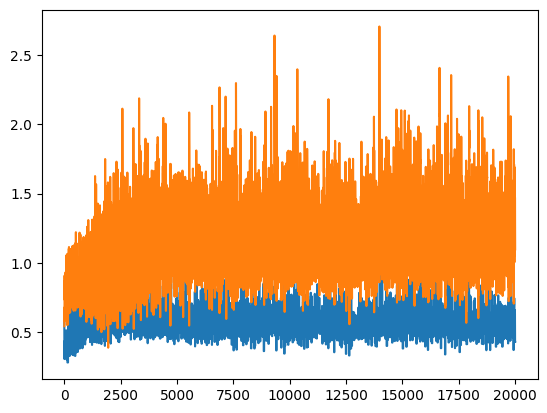

In [ ]:
%matplotlib inline
plt.figure
plt.plot(DD_less)
plt.plot(GG_less)

Generamos las imágenes a partir del GAN simplificado.

1/1 [==============================] - 0s 17ms/step


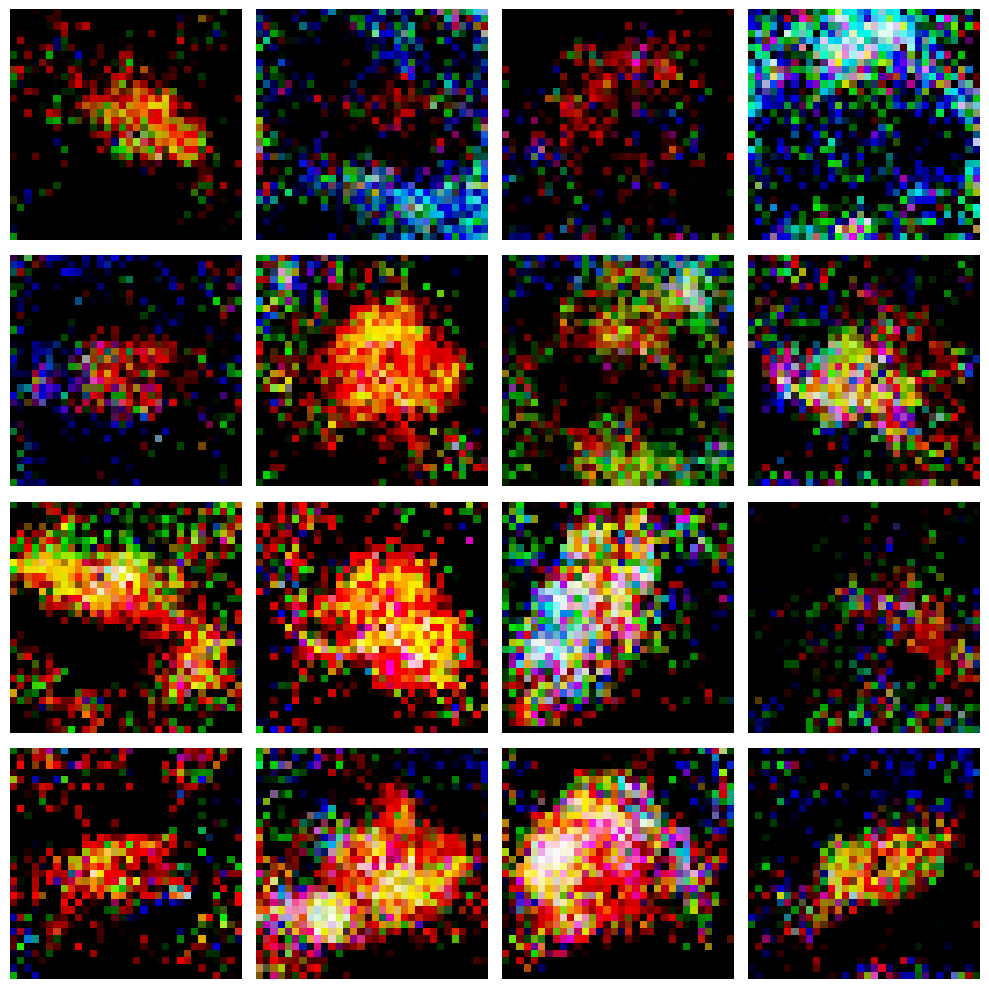

In [ ]:
gan_less.plot_images()

Como podemos comprobar, obtenemos un rendimeinto inferior al obtenido para la GAN con mayor número de parámetros. No obstante, la diferencia no es tan exagerada en comparación al número de parámetros.

### ENTRENAMIENTO Y RESULTADOS DEL MODELO COMPLEJO

En el siguiente ejemplo, ilustraremos los resultados obtenidos tras utilizar una arquitectura GAN más compleja, llegando a hacer uso de RNN's como LSTM o GRU.

In [ ]:
gan_plus_dense = GAN_mod_plus(width=X_train.shape[1], height=X_train.shape[2], channels=X_train.shape[3])

In [ ]:
DD_plus_dense, GG_plus_dense = gan_plus_dense.train(Prueba, epochs=20000)

1/1 [==============================] - 0s 106ms/step
epoch: 0, [Discriminator :: d_loss: 0.808999], [ Generator :: loss: 0.692231]
1/1 [==============================] - 0s 98ms/step


1/1 [==============================] - 0s 19ms/step
epoch: 1, [Discriminator :: d_loss: 0.476511], [ Generator :: loss: 0.606308]
1/1 [==============================] - 0s 16ms/step
epoch: 2, [Discriminator :: d_loss: 0.460696], [ Generator :: loss: 0.607792]
1/1 [==============================] - 0s 16ms/step
epoch: 3, [Discriminator :: d_loss: 0.458512], [ Generator :: loss: 0.528889]
1/1 [==============================] - 0s 16ms/step
epoch: 4, [Discriminator :: d_loss: 0.460126], [ Generator :: loss: 0.564426]
1/1 [==============================] - 0s 16ms/step
epoch: 5, [Discriminator :: d_loss: 0.509393], [ Generator :: loss: 0.585757]
1/1 [==============================] - 0s 18ms/step
epoch: 6, [Discriminator :: d_loss: 0.505915], [ Generator :: loss: 0.567865]
1/1 [==============================] - 0s 16ms/step
epoch: 7, [Discriminator :: d_loss: 0.436004], [ Generator :: loss: 0.666119]
1/1 [==============================] - 0s 26ms/step
epoch: 8, [Discriminator :: d_loss: 0.

epoch: 101, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 1.182065]
epoch: 102, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 1.002015]
epoch: 103, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 1.018357]
epoch: 104, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 1.032345]
epoch: 105, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 0.966794]
epoch: 106, [Discriminator :: d_loss: 0.478734], [ Generator :: loss: 0.930951]
1/1 [==============================] - 0s 17ms/step
epoch: 107, [Discriminator :: d_loss: 0.661213], [ Generator :: loss: 0.977149]
1/1 [==============================] - 0s 17ms/step
epoch: 108, [Discriminator :: d_loss: 0.527923], [ Generator :: loss: 1.178444]
epoch: 109, [Discriminator :: d_loss: 0.527923], [ Generator :: loss: 1.195958]
epoch: 110, [Discriminator :: d_loss: 0.527923], [ Generator :: loss: 1.078480]
epoch: 111, [Discriminator :: d_loss: 0.527923], [ Generator :: loss: 1.151209]
epoch: 112, [Dis

epoch: 201, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 1.245628]
epoch: 202, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 1.115030]
epoch: 203, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 1.090454]
epoch: 204, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 1.133067]
epoch: 205, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 1.130031]
epoch: 206, [Discriminator :: d_loss: 0.504354], [ Generator :: loss: 0.938126]
1/1 [==============================] - 0s 17ms/step
epoch: 207, [Discriminator :: d_loss: 0.654012], [ Generator :: loss: 1.224854]
1/1 [==============================] - 0s 34ms/step
epoch: 208, [Discriminator :: d_loss: 0.520101], [ Generator :: loss: 1.165688]
epoch: 209, [Discriminator :: d_loss: 0.520101], [ Generator :: loss: 1.198410]
epoch: 210, [Discriminator :: d_loss: 0.520101], [ Generator :: loss: 1.059931]
epoch: 211, [Discriminator :: d_loss: 0.520101], [ Generator :: loss: 1.155286]
epoch: 212, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 301, [Discriminator :: d_loss: 0.498313], [ Generator :: loss: 1.501542]
epoch: 302, [Discriminator :: d_loss: 0.498313], [ Generator :: loss: 1.236691]
epoch: 303, [Discriminator :: d_loss: 0.498313], [ Generator :: loss: 1.062173]
epoch: 304, [Discriminator :: d_loss: 0.498313], [ Generator :: loss: 1.052425]
epoch: 305, [Discriminator :: d_loss: 0.498313], [ Generator :: loss: 0.956705]
1/1 [==============================] - 0s 16ms/step
epoch: 306, [Discriminator :: d_loss: 0.591996], [ Generator :: loss: 1.029183]
1/1 [==============================] - 0s 18ms/step
epoch: 307, [Discriminator :: d_loss: 0.542823], [ Generator :: loss: 1.007196]
1/1 [==============================] - 0s 18ms/step
epoch: 308, [Discriminator :: d_loss: 0.651494], [ Generator :: loss: 1.187515]
1/1 [==============================] - 0s 16ms/step
epoch: 309, [Discriminator :: d_loss: 0.565248], [ Generator :: loss: 1.448881]
epoch: 310, [Discrim

1/1 [==============================] - 0s 16ms/step
epoch: 401, [Discriminator :: d_loss: 0.636857], [ Generator :: loss: 1.256777]
1/1 [==============================] - 0s 17ms/step
epoch: 402, [Discriminator :: d_loss: 0.593849], [ Generator :: loss: 1.209437]
epoch: 403, [Discriminator :: d_loss: 0.593849], [ Generator :: loss: 0.990018]
1/1 [==============================] - 0s 16ms/step
epoch: 404, [Discriminator :: d_loss: 0.479734], [ Generator :: loss: 1.173835]
epoch: 405, [Discriminator :: d_loss: 0.479734], [ Generator :: loss: 1.077441]
epoch: 406, [Discriminator :: d_loss: 0.479734], [ Generator :: loss: 0.983535]
epoch: 407, [Discriminator :: d_loss: 0.479734], [ Generator :: loss: 0.889162]
1/1 [==============================] - 0s 19ms/step
epoch: 408, [Discriminator :: d_loss: 0.604041], [ Generator :: loss: 1.057736]
1/1 [==============================] - 0s 19ms/step
epoch: 409, [Discriminator :: d_loss: 0.680507], [ Generator :: loss: 1.037693]
1/1 [===============

epoch: 501, [Discriminator :: d_loss: 0.463059], [ Generator :: loss: 1.117096]
epoch: 502, [Discriminator :: d_loss: 0.463059], [ Generator :: loss: 0.940343]
epoch: 503, [Discriminator :: d_loss: 0.463059], [ Generator :: loss: 0.836533]
1/1 [==============================] - 0s 22ms/step
epoch: 504, [Discriminator :: d_loss: 0.675774], [ Generator :: loss: 0.977177]
1/1 [==============================] - 0s 23ms/step
epoch: 505, [Discriminator :: d_loss: 0.544031], [ Generator :: loss: 1.311092]
epoch: 506, [Discriminator :: d_loss: 0.544031], [ Generator :: loss: 1.140381]
epoch: 507, [Discriminator :: d_loss: 0.544031], [ Generator :: loss: 1.003776]
1/1 [==============================] - 0s 24ms/step
epoch: 508, [Discriminator :: d_loss: 0.557246], [ Generator :: loss: 1.020654]
1/1 [==============================] - 0s 24ms/step
epoch: 509, [Discriminator :: d_loss: 0.577379], [ Generator :: loss: 1.400039]
epoch: 510, [Discriminator :: d_loss: 0.577379], [ Generator :: loss: 1.

1/1 [==============================] - 0s 17ms/step
epoch: 601, [Discriminator :: d_loss: 0.679557], [ Generator :: loss: 1.555309]
epoch: 602, [Discriminator :: d_loss: 0.679557], [ Generator :: loss: 1.271995]
1/1 [==============================] - 0s 16ms/step
epoch: 603, [Discriminator :: d_loss: 0.651896], [ Generator :: loss: 1.397991]
epoch: 604, [Discriminator :: d_loss: 0.651896], [ Generator :: loss: 1.240216]
1/1 [==============================] - 0s 15ms/step
epoch: 605, [Discriminator :: d_loss: 0.704637], [ Generator :: loss: 1.065379]
1/1 [==============================] - 0s 15ms/step
epoch: 606, [Discriminator :: d_loss: 0.535330], [ Generator :: loss: 1.055992]
1/1 [==============================] - 0s 16ms/step
epoch: 607, [Discriminator :: d_loss: 0.792354], [ Generator :: loss: 1.456808]
1/1 [==============================] - 0s 20ms/step
epoch: 608, [Discriminator :: d_loss: 0.614054], [ Generator :: loss: 1.546520]
epoch: 609, [Discriminator :: d_loss: 0.614054],

1/1 [==============================] - 0s 16ms/step
epoch: 701, [Discriminator :: d_loss: 0.528926], [ Generator :: loss: 1.166734]
epoch: 702, [Discriminator :: d_loss: 0.528926], [ Generator :: loss: 1.009442]
1/1 [==============================] - 0s 19ms/step
epoch: 703, [Discriminator :: d_loss: 0.703013], [ Generator :: loss: 1.133671]
1/1 [==============================] - 0s 16ms/step
epoch: 704, [Discriminator :: d_loss: 0.594018], [ Generator :: loss: 1.096071]
1/1 [==============================] - 0s 15ms/step
epoch: 705, [Discriminator :: d_loss: 0.623870], [ Generator :: loss: 1.404910]
epoch: 706, [Discriminator :: d_loss: 0.623870], [ Generator :: loss: 1.208889]
1/1 [==============================] - 0s 16ms/step
epoch: 707, [Discriminator :: d_loss: 0.630446], [ Generator :: loss: 1.219602]
1/1 [==============================] - 0s 15ms/step
epoch: 708, [Discriminator :: d_loss: 0.597358], [ Generator :: loss: 1.030228]
1/1 [==============================] - 0s 15ms/s

1/1 [==============================] - 0s 16ms/step
epoch: 801, [Discriminator :: d_loss: 0.650628], [ Generator :: loss: 1.272855]
1/1 [==============================] - 0s 15ms/step
epoch: 802, [Discriminator :: d_loss: 0.547185], [ Generator :: loss: 1.243769]
epoch: 803, [Discriminator :: d_loss: 0.547185], [ Generator :: loss: 1.082096]
1/1 [==============================] - 0s 16ms/step
epoch: 804, [Discriminator :: d_loss: 0.679415], [ Generator :: loss: 1.064641]
1/1 [==============================] - 0s 16ms/step
epoch: 805, [Discriminator :: d_loss: 0.653634], [ Generator :: loss: 1.161254]
1/1 [==============================] - 0s 16ms/step
epoch: 806, [Discriminator :: d_loss: 0.645748], [ Generator :: loss: 1.288546]
1/1 [==============================] - 0s 17ms/step
epoch: 807, [Discriminator :: d_loss: 0.607947], [ Generator :: loss: 1.196187]
1/1 [==============================] - 0s 16ms/step
epoch: 808, [Discriminator :: d_loss: 0.571996], [ Generator :: loss: 1.1499

1/1 [==============================] - 0s 21ms/step
epoch: 901, [Discriminator :: d_loss: 0.649340], [ Generator :: loss: 1.407784]
epoch: 902, [Discriminator :: d_loss: 0.649340], [ Generator :: loss: 1.164471]
1/1 [==============================] - 0s 16ms/step
epoch: 903, [Discriminator :: d_loss: 0.651388], [ Generator :: loss: 1.005988]
1/1 [==============================] - 0s 16ms/step
epoch: 904, [Discriminator :: d_loss: 0.690975], [ Generator :: loss: 0.994736]
1/1 [==============================] - 0s 17ms/step
epoch: 905, [Discriminator :: d_loss: 0.711412], [ Generator :: loss: 1.145515]
1/1 [==============================] - 0s 16ms/step
epoch: 906, [Discriminator :: d_loss: 0.682185], [ Generator :: loss: 1.222368]
1/1 [==============================] - 0s 16ms/step
epoch: 907, [Discriminator :: d_loss: 0.580092], [ Generator :: loss: 1.029734]
1/1 [==============================] - 0s 16ms/step
epoch: 908, [Discriminator :: d_loss: 0.574122], [ Generator :: loss: 1.2660

1/1 [==============================] - 0s 29ms/step
epoch: 1001, [Discriminator :: d_loss: 0.651124], [ Generator :: loss: 1.133952]
1/1 [==============================] - 0s 21ms/step
epoch: 1002, [Discriminator :: d_loss: 0.619258], [ Generator :: loss: 1.021855]
1/1 [==============================] - 0s 19ms/step
epoch: 1003, [Discriminator :: d_loss: 0.614074], [ Generator :: loss: 1.063736]
1/1 [==============================] - 0s 16ms/step
epoch: 1004, [Discriminator :: d_loss: 0.557988], [ Generator :: loss: 1.342483]
epoch: 1005, [Discriminator :: d_loss: 0.557988], [ Generator :: loss: 1.102963]
1/1 [==============================] - 0s 16ms/step
epoch: 1006, [Discriminator :: d_loss: 0.639992], [ Generator :: loss: 1.112154]
1/1 [==============================] - 0s 17ms/step
epoch: 1007, [Discriminator :: d_loss: 0.598220], [ Generator :: loss: 1.003326]
1/1 [==============================] - 0s 16ms/step
epoch: 1008, [Discriminator :: d_loss: 0.586970], [ Generator :: loss

1/1 [==============================] - 0s 17ms/step
epoch: 1101, [Discriminator :: d_loss: 0.731515], [ Generator :: loss: 0.953915]
1/1 [==============================] - 0s 16ms/step
epoch: 1102, [Discriminator :: d_loss: 0.804332], [ Generator :: loss: 1.085875]
1/1 [==============================] - 0s 15ms/step
epoch: 1103, [Discriminator :: d_loss: 0.700916], [ Generator :: loss: 0.930670]
1/1 [==============================] - 0s 17ms/step
epoch: 1104, [Discriminator :: d_loss: 0.637214], [ Generator :: loss: 1.231393]
1/1 [==============================] - 0s 15ms/step
epoch: 1105, [Discriminator :: d_loss: 0.582130], [ Generator :: loss: 1.164017]
1/1 [==============================] - 0s 16ms/step
epoch: 1106, [Discriminator :: d_loss: 0.618443], [ Generator :: loss: 1.191655]
1/1 [==============================] - 0s 15ms/step
epoch: 1107, [Discriminator :: d_loss: 0.611697], [ Generator :: loss: 1.097611]
1/1 [==============================] - 0s 17ms/step
epoch: 1108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 1201, [Discriminator :: d_loss: 0.614430], [ Generator :: loss: 1.144879]
1/1 [==============================] - 0s 17ms/step
epoch: 1202, [Discriminator :: d_loss: 0.633337], [ Generator :: loss: 1.069169]
1/1 [==============================] - 0s 16ms/step
epoch: 1203, [Discriminator :: d_loss: 0.672225], [ Generator :: loss: 1.256839]
1/1 [==============================] - 0s 16ms/step
epoch: 1204, [Discriminator :: d_loss: 0.609009], [ Generator :: loss: 1.133331]
1/1 [==============================] - 0s 22ms/step
epoch: 1205, [Discriminator :: d_loss: 0.564862], [ Generator :: loss: 0.984049]
1/1 [==============================] - 0s 19ms/step
epoch: 1206, [Discriminator :: d_loss: 0.637196], [ Generator :: loss: 1.131323]
1/1 [==============================] - 0s 16ms/step
epoch: 1207, [Discriminator :: d_loss: 0.635628], [ Generator :: loss: 1.129350]
1/1 [==============================] - 0s 17ms/step
epoch: 1208, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 1301, [Discriminator :: d_loss: 0.562851], [ Generator :: loss: 1.120107]
1/1 [==============================] - 0s 15ms/step
epoch: 1302, [Discriminator :: d_loss: 0.569915], [ Generator :: loss: 1.053683]
1/1 [==============================] - 0s 15ms/step
epoch: 1303, [Discriminator :: d_loss: 0.689117], [ Generator :: loss: 1.052959]
1/1 [==============================] - 0s 17ms/step
epoch: 1304, [Discriminator :: d_loss: 0.602410], [ Generator :: loss: 1.183893]
1/1 [==============================] - 0s 18ms/step
epoch: 1305, [Discriminator :: d_loss: 0.629082], [ Generator :: loss: 1.347539]
epoch: 1306, [Discriminator :: d_loss: 0.629082], [ Generator :: loss: 1.090387]
1/1 [==============================] - 0s 15ms/step
epoch: 1307, [Discriminator :: d_loss: 0.784202], [ Generator :: loss: 0.796601]
1/1 [==============================] - 0s 21ms/step
epoch: 1308, [Discriminator :: d_loss: 0.652928], [ Generator :: loss

1/1 [==============================] - 0s 18ms/step
epoch: 1401, [Discriminator :: d_loss: 0.589832], [ Generator :: loss: 1.327928]
epoch: 1402, [Discriminator :: d_loss: 0.589832], [ Generator :: loss: 1.176965]
1/1 [==============================] - 0s 15ms/step
epoch: 1403, [Discriminator :: d_loss: 0.728354], [ Generator :: loss: 1.123281]
1/1 [==============================] - 0s 16ms/step
epoch: 1404, [Discriminator :: d_loss: 0.732415], [ Generator :: loss: 0.872021]
1/1 [==============================] - 0s 19ms/step
epoch: 1405, [Discriminator :: d_loss: 0.699935], [ Generator :: loss: 1.029327]
1/1 [==============================] - 0s 19ms/step
epoch: 1406, [Discriminator :: d_loss: 0.592149], [ Generator :: loss: 0.868506]
1/1 [==============================] - 0s 15ms/step
epoch: 1407, [Discriminator :: d_loss: 0.634749], [ Generator :: loss: 0.997490]
1/1 [==============================] - 0s 16ms/step
epoch: 1408, [Discriminator :: d_loss: 0.680130], [ Generator :: loss

1/1 [==============================] - 0s 17ms/step
epoch: 1501, [Discriminator :: d_loss: 0.732367], [ Generator :: loss: 1.110474]
1/1 [==============================] - 0s 16ms/step
epoch: 1502, [Discriminator :: d_loss: 0.787246], [ Generator :: loss: 0.884874]
1/1 [==============================] - 0s 16ms/step
epoch: 1503, [Discriminator :: d_loss: 0.693469], [ Generator :: loss: 0.868631]
1/1 [==============================] - 0s 18ms/step
epoch: 1504, [Discriminator :: d_loss: 0.631369], [ Generator :: loss: 0.818483]
1/1 [==============================] - 0s 17ms/step
epoch: 1505, [Discriminator :: d_loss: 0.640619], [ Generator :: loss: 0.975920]
1/1 [==============================] - 0s 16ms/step
epoch: 1506, [Discriminator :: d_loss: 0.653016], [ Generator :: loss: 1.131142]
1/1 [==============================] - 0s 19ms/step
epoch: 1507, [Discriminator :: d_loss: 0.604748], [ Generator :: loss: 1.088498]
1/1 [==============================] - 0s 18ms/step
epoch: 1508, [Dis

epoch: 1601, [Discriminator :: d_loss: 0.575149], [ Generator :: loss: 1.072840]
1/1 [==============================] - 0s 16ms/step
epoch: 1602, [Discriminator :: d_loss: 0.655753], [ Generator :: loss: 1.000708]
1/1 [==============================] - 0s 16ms/step
epoch: 1603, [Discriminator :: d_loss: 0.696550], [ Generator :: loss: 0.831899]
1/1 [==============================] - 0s 20ms/step
epoch: 1604, [Discriminator :: d_loss: 0.663547], [ Generator :: loss: 1.061043]
1/1 [==============================] - 0s 17ms/step
epoch: 1605, [Discriminator :: d_loss: 0.583989], [ Generator :: loss: 1.266260]
epoch: 1606, [Discriminator :: d_loss: 0.583989], [ Generator :: loss: 1.126969]
1/1 [==============================] - 0s 19ms/step
epoch: 1607, [Discriminator :: d_loss: 0.727778], [ Generator :: loss: 0.886449]
1/1 [==============================] - 0s 17ms/step
epoch: 1608, [Discriminator :: d_loss: 0.690782], [ Generator :: loss: 0.744509]
1/1 [==============================] - 0

1/1 [==============================] - 0s 18ms/step
epoch: 1701, [Discriminator :: d_loss: 0.642730], [ Generator :: loss: 1.201320]
1/1 [==============================] - 0s 16ms/step
epoch: 1702, [Discriminator :: d_loss: 0.702227], [ Generator :: loss: 0.955372]
1/1 [==============================] - 0s 16ms/step
epoch: 1703, [Discriminator :: d_loss: 0.655593], [ Generator :: loss: 0.975359]
1/1 [==============================] - 0s 16ms/step
epoch: 1704, [Discriminator :: d_loss: 0.605801], [ Generator :: loss: 1.178866]
1/1 [==============================] - 0s 15ms/step
epoch: 1705, [Discriminator :: d_loss: 0.539536], [ Generator :: loss: 1.095172]
epoch: 1706, [Discriminator :: d_loss: 0.539536], [ Generator :: loss: 0.850139]
1/1 [==============================] - 0s 17ms/step
epoch: 1707, [Discriminator :: d_loss: 0.658493], [ Generator :: loss: 0.941706]
1/1 [==============================] - 0s 18ms/step
epoch: 1708, [Discriminator :: d_loss: 0.725129], [ Generator :: loss

1/1 [==============================] - 0s 19ms/step
epoch: 1801, [Discriminator :: d_loss: 0.665916], [ Generator :: loss: 1.007118]
1/1 [==============================] - 0s 16ms/step
epoch: 1802, [Discriminator :: d_loss: 0.623313], [ Generator :: loss: 1.017960]
1/1 [==============================] - 0s 16ms/step
epoch: 1803, [Discriminator :: d_loss: 0.708806], [ Generator :: loss: 1.019040]
1/1 [==============================] - 0s 15ms/step
epoch: 1804, [Discriminator :: d_loss: 0.638098], [ Generator :: loss: 1.308776]
epoch: 1805, [Discriminator :: d_loss: 0.638098], [ Generator :: loss: 1.082583]
1/1 [==============================] - 0s 16ms/step
epoch: 1806, [Discriminator :: d_loss: 0.649518], [ Generator :: loss: 0.824888]
1/1 [==============================] - 0s 21ms/step
epoch: 1807, [Discriminator :: d_loss: 0.583108], [ Generator :: loss: 1.225418]
epoch: 1808, [Discriminator :: d_loss: 0.583108], [ Generator :: loss: 1.107566]
1/1 [==============================] - 0

epoch: 1901, [Discriminator :: d_loss: 0.565661], [ Generator :: loss: 1.142988]
epoch: 1902, [Discriminator :: d_loss: 0.565661], [ Generator :: loss: 0.964890]
1/1 [==============================] - 0s 16ms/step
epoch: 1903, [Discriminator :: d_loss: 0.784834], [ Generator :: loss: 0.726169]
1/1 [==============================] - 0s 15ms/step
epoch: 1904, [Discriminator :: d_loss: 0.659809], [ Generator :: loss: 0.909253]
1/1 [==============================] - 0s 15ms/step
epoch: 1905, [Discriminator :: d_loss: 0.638336], [ Generator :: loss: 0.868482]
1/1 [==============================] - 0s 19ms/step
epoch: 1906, [Discriminator :: d_loss: 0.659804], [ Generator :: loss: 1.003179]
1/1 [==============================] - 0s 15ms/step
epoch: 1907, [Discriminator :: d_loss: 0.677747], [ Generator :: loss: 1.133040]
1/1 [==============================] - 0s 16ms/step
epoch: 1908, [Discriminator :: d_loss: 0.606873], [ Generator :: loss: 0.930844]
1/1 [==============================] - 0

1/1 [==============================] - 0s 16ms/step
epoch: 2001, [Discriminator :: d_loss: 0.698012], [ Generator :: loss: 0.988534]
1/1 [==============================] - 0s 16ms/step
epoch: 2002, [Discriminator :: d_loss: 0.682963], [ Generator :: loss: 1.174731]
1/1 [==============================] - 0s 15ms/step
epoch: 2003, [Discriminator :: d_loss: 0.624252], [ Generator :: loss: 1.031179]
1/1 [==============================] - 0s 15ms/step
epoch: 2004, [Discriminator :: d_loss: 0.614379], [ Generator :: loss: 0.966811]
1/1 [==============================] - 0s 17ms/step
epoch: 2005, [Discriminator :: d_loss: 0.585291], [ Generator :: loss: 1.278865]
epoch: 2006, [Discriminator :: d_loss: 0.585291], [ Generator :: loss: 1.006622]
1/1 [==============================] - 0s 15ms/step
epoch: 2007, [Discriminator :: d_loss: 0.630121], [ Generator :: loss: 1.313299]
epoch: 2008, [Discriminator :: d_loss: 0.630121], [ Generator :: loss: 0.988164]
1/1 [==============================] - 0

1/1 [==============================] - 0s 27ms/step
epoch: 2101, [Discriminator :: d_loss: 0.710199], [ Generator :: loss: 0.946342]
1/1 [==============================] - 0s 28ms/step
epoch: 2102, [Discriminator :: d_loss: 0.666226], [ Generator :: loss: 1.115337]
1/1 [==============================] - 0s 24ms/step
epoch: 2103, [Discriminator :: d_loss: 0.635826], [ Generator :: loss: 1.064062]
1/1 [==============================] - 0s 24ms/step
epoch: 2104, [Discriminator :: d_loss: 0.560680], [ Generator :: loss: 1.102766]
1/1 [==============================] - 0s 24ms/step
epoch: 2105, [Discriminator :: d_loss: 0.592090], [ Generator :: loss: 1.486611]
epoch: 2106, [Discriminator :: d_loss: 0.592090], [ Generator :: loss: 1.228908]
epoch: 2107, [Discriminator :: d_loss: 0.592090], [ Generator :: loss: 0.938673]
1/1 [==============================] - 0s 35ms/step
epoch: 2108, [Discriminator :: d_loss: 0.780558], [ Generator :: loss: 1.004589]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 2201, [Discriminator :: d_loss: 0.673534], [ Generator :: loss: 1.052238]
1/1 [==============================] - 0s 16ms/step
epoch: 2202, [Discriminator :: d_loss: 0.625086], [ Generator :: loss: 1.201796]
1/1 [==============================] - 0s 16ms/step
epoch: 2203, [Discriminator :: d_loss: 0.608809], [ Generator :: loss: 1.010839]
1/1 [==============================] - 0s 16ms/step
epoch: 2204, [Discriminator :: d_loss: 0.608445], [ Generator :: loss: 1.106590]
1/1 [==============================] - 0s 16ms/step
epoch: 2205, [Discriminator :: d_loss: 0.591187], [ Generator :: loss: 1.276817]
epoch: 2206, [Discriminator :: d_loss: 0.591187], [ Generator :: loss: 0.947072]
1/1 [==============================] - 0s 19ms/step
epoch: 2207, [Discriminator :: d_loss: 0.650756], [ Generator :: loss: 1.020671]
1/1 [==============================] - 0s 16ms/step
epoch: 2208, [Discriminator :: d_loss: 0.650075], [ Generator :: loss

1/1 [==============================] - 0s 19ms/step
epoch: 2301, [Discriminator :: d_loss: 0.632729], [ Generator :: loss: 1.110900]
1/1 [==============================] - 0s 16ms/step
epoch: 2302, [Discriminator :: d_loss: 0.654466], [ Generator :: loss: 1.165539]
1/1 [==============================] - 0s 15ms/step
epoch: 2303, [Discriminator :: d_loss: 0.615260], [ Generator :: loss: 0.895614]
1/1 [==============================] - 0s 16ms/step
epoch: 2304, [Discriminator :: d_loss: 0.538625], [ Generator :: loss: 1.009512]
1/1 [==============================] - 0s 16ms/step
epoch: 2305, [Discriminator :: d_loss: 0.508203], [ Generator :: loss: 1.173298]
epoch: 2306, [Discriminator :: d_loss: 0.508203], [ Generator :: loss: 1.007710]
1/1 [==============================] - 0s 15ms/step
epoch: 2307, [Discriminator :: d_loss: 0.732248], [ Generator :: loss: 0.805959]
1/1 [==============================] - 0s 16ms/step
epoch: 2308, [Discriminator :: d_loss: 0.612806], [ Generator :: loss

1/1 [==============================] - 0s 22ms/step
epoch: 2401, [Discriminator :: d_loss: 0.631678], [ Generator :: loss: 0.992514]
1/1 [==============================] - 0s 21ms/step
epoch: 2402, [Discriminator :: d_loss: 0.518308], [ Generator :: loss: 0.938030]
1/1 [==============================] - 0s 31ms/step
epoch: 2403, [Discriminator :: d_loss: 0.569099], [ Generator :: loss: 1.372643]
epoch: 2404, [Discriminator :: d_loss: 0.569099], [ Generator :: loss: 1.034314]
1/1 [==============================] - 0s 23ms/step
epoch: 2405, [Discriminator :: d_loss: 0.583230], [ Generator :: loss: 1.211586]
epoch: 2406, [Discriminator :: d_loss: 0.583230], [ Generator :: loss: 0.964139]
1/1 [==============================] - 0s 29ms/step
epoch: 2407, [Discriminator :: d_loss: 0.697971], [ Generator :: loss: 1.050659]
1/1 [==============================] - 0s 29ms/step
epoch: 2408, [Discriminator :: d_loss: 0.866569], [ Generator :: loss: 0.722787]
1/1 [==============================] - 0

1/1 [==============================] - 0s 20ms/step
epoch: 2501, [Discriminator :: d_loss: 0.727711], [ Generator :: loss: 1.193543]
1/1 [==============================] - 0s 16ms/step
epoch: 2502, [Discriminator :: d_loss: 0.692963], [ Generator :: loss: 1.413249]
epoch: 2503, [Discriminator :: d_loss: 0.692963], [ Generator :: loss: 1.203786]
1/1 [==============================] - 0s 15ms/step
epoch: 2504, [Discriminator :: d_loss: 0.677182], [ Generator :: loss: 0.748612]
1/1 [==============================] - 0s 19ms/step
epoch: 2505, [Discriminator :: d_loss: 0.710051], [ Generator :: loss: 1.084448]
1/1 [==============================] - 0s 16ms/step
epoch: 2506, [Discriminator :: d_loss: 0.759683], [ Generator :: loss: 1.169240]
1/1 [==============================] - 0s 16ms/step
epoch: 2507, [Discriminator :: d_loss: 0.574422], [ Generator :: loss: 0.990548]
1/1 [==============================] - 0s 16ms/step
epoch: 2508, [Discriminator :: d_loss: 0.621709], [ Generator :: loss

1/1 [==============================] - 0s 16ms/step
epoch: 2601, [Discriminator :: d_loss: 0.604737], [ Generator :: loss: 1.095814]
1/1 [==============================] - 0s 16ms/step
epoch: 2602, [Discriminator :: d_loss: 0.673641], [ Generator :: loss: 0.800947]
1/1 [==============================] - 0s 15ms/step
epoch: 2603, [Discriminator :: d_loss: 0.613783], [ Generator :: loss: 1.102977]
1/1 [==============================] - 0s 17ms/step
epoch: 2604, [Discriminator :: d_loss: 0.574144], [ Generator :: loss: 1.295381]
epoch: 2605, [Discriminator :: d_loss: 0.574144], [ Generator :: loss: 0.971732]
1/1 [==============================] - 0s 16ms/step
epoch: 2606, [Discriminator :: d_loss: 0.630279], [ Generator :: loss: 1.000765]
1/1 [==============================] - 0s 16ms/step
epoch: 2607, [Discriminator :: d_loss: 0.645055], [ Generator :: loss: 0.899057]
1/1 [==============================] - 0s 15ms/step
epoch: 2608, [Discriminator :: d_loss: 0.631293], [ Generator :: loss

1/1 [==============================] - 0s 16ms/step
epoch: 2701, [Discriminator :: d_loss: 0.658508], [ Generator :: loss: 0.969330]
1/1 [==============================] - 0s 16ms/step
epoch: 2702, [Discriminator :: d_loss: 0.597459], [ Generator :: loss: 1.003269]
1/1 [==============================] - 0s 15ms/step
epoch: 2703, [Discriminator :: d_loss: 0.603528], [ Generator :: loss: 0.880135]
1/1 [==============================] - 0s 16ms/step
epoch: 2704, [Discriminator :: d_loss: 0.637722], [ Generator :: loss: 1.089634]
1/1 [==============================] - 0s 16ms/step
epoch: 2705, [Discriminator :: d_loss: 0.559164], [ Generator :: loss: 1.082785]
1/1 [==============================] - 0s 16ms/step
epoch: 2706, [Discriminator :: d_loss: 0.598448], [ Generator :: loss: 0.996959]
1/1 [==============================] - 0s 16ms/step
epoch: 2707, [Discriminator :: d_loss: 0.569890], [ Generator :: loss: 0.941499]
1/1 [==============================] - 0s 15ms/step
epoch: 2708, [Dis

1/1 [==============================] - 0s 25ms/step
epoch: 2801, [Discriminator :: d_loss: 0.618973], [ Generator :: loss: 1.051101]
1/1 [==============================] - 0s 24ms/step
epoch: 2802, [Discriminator :: d_loss: 0.617243], [ Generator :: loss: 1.040228]
1/1 [==============================] - 0s 36ms/step
epoch: 2803, [Discriminator :: d_loss: 0.705389], [ Generator :: loss: 1.007244]
1/1 [==============================] - 0s 23ms/step
epoch: 2804, [Discriminator :: d_loss: 0.617125], [ Generator :: loss: 1.063333]
1/1 [==============================] - 0s 23ms/step
epoch: 2805, [Discriminator :: d_loss: 0.578569], [ Generator :: loss: 1.032797]
1/1 [==============================] - 0s 23ms/step
epoch: 2806, [Discriminator :: d_loss: 0.669109], [ Generator :: loss: 0.776403]
1/1 [==============================] - 0s 24ms/step
epoch: 2807, [Discriminator :: d_loss: 0.645229], [ Generator :: loss: 0.890006]
1/1 [==============================] - 0s 26ms/step
epoch: 2808, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 2901, [Discriminator :: d_loss: 0.636433], [ Generator :: loss: 1.002051]
1/1 [==============================] - 0s 16ms/step
epoch: 2902, [Discriminator :: d_loss: 0.595690], [ Generator :: loss: 0.943498]
1/1 [==============================] - 0s 16ms/step
epoch: 2903, [Discriminator :: d_loss: 0.646397], [ Generator :: loss: 0.932982]
1/1 [==============================] - 0s 16ms/step
epoch: 2904, [Discriminator :: d_loss: 0.665452], [ Generator :: loss: 1.036132]
1/1 [==============================] - 0s 16ms/step
epoch: 2905, [Discriminator :: d_loss: 0.643798], [ Generator :: loss: 0.800024]
1/1 [==============================] - 0s 16ms/step
epoch: 2906, [Discriminator :: d_loss: 0.640810], [ Generator :: loss: 0.754822]
1/1 [==============================] - 0s 16ms/step
epoch: 2907, [Discriminator :: d_loss: 0.741378], [ Generator :: loss: 1.076428]
1/1 [==============================] - 0s 16ms/step
epoch: 2908, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3001, [Discriminator :: d_loss: 0.676240], [ Generator :: loss: 0.847794]
1/1 [==============================] - 0s 16ms/step
epoch: 3002, [Discriminator :: d_loss: 0.684934], [ Generator :: loss: 0.946454]
1/1 [==============================] - 0s 15ms/step
epoch: 3003, [Discriminator :: d_loss: 0.667548], [ Generator :: loss: 0.973022]
1/1 [==============================] - 0s 20ms/step
epoch: 3004, [Discriminator :: d_loss: 0.633431], [ Generator :: loss: 1.155821]
1/1 [==============================] - 0s 17ms/step
epoch: 3005, [Discriminator :: d_loss: 0.616780], [ Generator :: loss: 1.000416]
1/1 [==============================] - 0s 17ms/step
epoch: 3006, [Discriminator :: d_loss: 0.670294], [ Generator :: loss: 0.802153]
1/1 [==============================] - 0s 17ms/step
epoch: 3007, [Discriminator :: d_loss: 0.646127], [ Generator :: loss: 0.818458]
1/1 [==============================] - 0s 16ms/step
epoch: 3008, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 3101, [Discriminator :: d_loss: 0.650544], [ Generator :: loss: 1.038586]
1/1 [==============================] - 0s 15ms/step
epoch: 3102, [Discriminator :: d_loss: 0.675665], [ Generator :: loss: 0.870577]
1/1 [==============================] - 0s 16ms/step
epoch: 3103, [Discriminator :: d_loss: 0.684314], [ Generator :: loss: 0.855130]
1/1 [==============================] - 0s 18ms/step
epoch: 3104, [Discriminator :: d_loss: 0.637835], [ Generator :: loss: 0.871476]
1/1 [==============================] - 0s 20ms/step
epoch: 3105, [Discriminator :: d_loss: 0.695167], [ Generator :: loss: 0.719048]
1/1 [==============================] - 0s 20ms/step
epoch: 3106, [Discriminator :: d_loss: 0.685237], [ Generator :: loss: 0.710553]
1/1 [==============================] - 0s 15ms/step
epoch: 3107, [Discriminator :: d_loss: 0.667895], [ Generator :: loss: 0.879894]
1/1 [==============================] - 0s 15ms/step
epoch: 3108, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 3201, [Discriminator :: d_loss: 0.594919], [ Generator :: loss: 0.785951]
1/1 [==============================] - 0s 15ms/step
epoch: 3202, [Discriminator :: d_loss: 0.679517], [ Generator :: loss: 0.951237]
1/1 [==============================] - 0s 16ms/step
epoch: 3203, [Discriminator :: d_loss: 0.809285], [ Generator :: loss: 0.775298]
1/1 [==============================] - 0s 19ms/step
epoch: 3204, [Discriminator :: d_loss: 0.641786], [ Generator :: loss: 0.781283]
1/1 [==============================] - 0s 15ms/step
epoch: 3205, [Discriminator :: d_loss: 0.677443], [ Generator :: loss: 0.861539]
1/1 [==============================] - 0s 16ms/step
epoch: 3206, [Discriminator :: d_loss: 0.736351], [ Generator :: loss: 0.730556]
1/1 [==============================] - 0s 18ms/step
epoch: 3207, [Discriminator :: d_loss: 0.706385], [ Generator :: loss: 0.678091]
1/1 [==============================] - 0s 16ms/step
epoch: 3208, [Dis

1/1 [==============================] - 0s 28ms/step
epoch: 3301, [Discriminator :: d_loss: 0.709006], [ Generator :: loss: 0.802255]
1/1 [==============================] - 0s 24ms/step
epoch: 3302, [Discriminator :: d_loss: 0.696212], [ Generator :: loss: 0.802535]
1/1 [==============================] - 0s 24ms/step
epoch: 3303, [Discriminator :: d_loss: 0.679607], [ Generator :: loss: 0.774739]
1/1 [==============================] - 0s 27ms/step
epoch: 3304, [Discriminator :: d_loss: 0.633726], [ Generator :: loss: 0.764649]
1/1 [==============================] - 0s 32ms/step
epoch: 3305, [Discriminator :: d_loss: 0.690352], [ Generator :: loss: 0.770982]
1/1 [==============================] - 0s 26ms/step
epoch: 3306, [Discriminator :: d_loss: 0.654461], [ Generator :: loss: 0.725794]
1/1 [==============================] - 0s 38ms/step
epoch: 3307, [Discriminator :: d_loss: 0.662465], [ Generator :: loss: 0.680102]
1/1 [==============================] - 0s 17ms/step
epoch: 3308, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 3401, [Discriminator :: d_loss: 0.655291], [ Generator :: loss: 0.828451]
1/1 [==============================] - 0s 15ms/step
epoch: 3402, [Discriminator :: d_loss: 0.682187], [ Generator :: loss: 0.706713]
1/1 [==============================] - 0s 15ms/step
epoch: 3403, [Discriminator :: d_loss: 0.705215], [ Generator :: loss: 0.698989]
1/1 [==============================] - 0s 15ms/step
epoch: 3404, [Discriminator :: d_loss: 0.748507], [ Generator :: loss: 0.709748]
1/1 [==============================] - 0s 15ms/step
epoch: 3405, [Discriminator :: d_loss: 0.637979], [ Generator :: loss: 0.745813]
1/1 [==============================] - 0s 20ms/step
epoch: 3406, [Discriminator :: d_loss: 0.646713], [ Generator :: loss: 0.799921]
1/1 [==============================] - 0s 22ms/step
epoch: 3407, [Discriminator :: d_loss: 0.670687], [ Generator :: loss: 0.836383]
1/1 [==============================] - 0s 16ms/step
epoch: 3408, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 3501, [Discriminator :: d_loss: 0.799175], [ Generator :: loss: 0.731562]
1/1 [==============================] - 0s 15ms/step
epoch: 3502, [Discriminator :: d_loss: 0.701153], [ Generator :: loss: 0.728410]
1/1 [==============================] - 0s 15ms/step
epoch: 3503, [Discriminator :: d_loss: 0.702135], [ Generator :: loss: 0.791037]
1/1 [==============================] - 0s 16ms/step
epoch: 3504, [Discriminator :: d_loss: 0.645695], [ Generator :: loss: 0.796965]
1/1 [==============================] - 0s 15ms/step
epoch: 3505, [Discriminator :: d_loss: 0.679037], [ Generator :: loss: 0.812591]
1/1 [==============================] - 0s 19ms/step
epoch: 3506, [Discriminator :: d_loss: 0.666515], [ Generator :: loss: 0.763299]
1/1 [==============================] - 0s 22ms/step
epoch: 3507, [Discriminator :: d_loss: 0.678951], [ Generator :: loss: 0.734234]
1/1 [==============================] - 0s 18ms/step
epoch: 3508, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 3601, [Discriminator :: d_loss: 0.677801], [ Generator :: loss: 0.702011]
1/1 [==============================] - 0s 22ms/step
epoch: 3602, [Discriminator :: d_loss: 0.696873], [ Generator :: loss: 0.748449]
1/1 [==============================] - 0s 20ms/step
epoch: 3603, [Discriminator :: d_loss: 0.641753], [ Generator :: loss: 0.825481]
1/1 [==============================] - 0s 17ms/step
epoch: 3604, [Discriminator :: d_loss: 0.691871], [ Generator :: loss: 0.838259]
1/1 [==============================] - 0s 20ms/step
epoch: 3605, [Discriminator :: d_loss: 0.681790], [ Generator :: loss: 0.783475]
1/1 [==============================] - 0s 18ms/step
epoch: 3606, [Discriminator :: d_loss: 0.638363], [ Generator :: loss: 0.758696]
1/1 [==============================] - 0s 20ms/step
epoch: 3607, [Discriminator :: d_loss: 0.705758], [ Generator :: loss: 0.776431]
1/1 [==============================] - 0s 19ms/step
epoch: 3608, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3701, [Discriminator :: d_loss: 0.699569], [ Generator :: loss: 0.752815]
1/1 [==============================] - 0s 16ms/step
epoch: 3702, [Discriminator :: d_loss: 0.708087], [ Generator :: loss: 0.743677]
1/1 [==============================] - 0s 17ms/step
epoch: 3703, [Discriminator :: d_loss: 0.639711], [ Generator :: loss: 0.754385]
1/1 [==============================] - 0s 16ms/step
epoch: 3704, [Discriminator :: d_loss: 0.662579], [ Generator :: loss: 0.826235]
1/1 [==============================] - 0s 18ms/step
epoch: 3705, [Discriminator :: d_loss: 0.729839], [ Generator :: loss: 0.755846]
1/1 [==============================] - 0s 17ms/step
epoch: 3706, [Discriminator :: d_loss: 0.634664], [ Generator :: loss: 0.801796]
1/1 [==============================] - 0s 17ms/step
epoch: 3707, [Discriminator :: d_loss: 0.650848], [ Generator :: loss: 0.800932]
1/1 [==============================] - 0s 18ms/step
epoch: 3708, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3801, [Discriminator :: d_loss: 0.648485], [ Generator :: loss: 0.716336]
1/1 [==============================] - 0s 18ms/step
epoch: 3802, [Discriminator :: d_loss: 0.628494], [ Generator :: loss: 0.739734]
1/1 [==============================] - 0s 16ms/step
epoch: 3803, [Discriminator :: d_loss: 0.681764], [ Generator :: loss: 0.729611]
1/1 [==============================] - 0s 16ms/step
epoch: 3804, [Discriminator :: d_loss: 0.652968], [ Generator :: loss: 0.756422]
1/1 [==============================] - 0s 18ms/step
epoch: 3805, [Discriminator :: d_loss: 0.658659], [ Generator :: loss: 0.759827]
1/1 [==============================] - 0s 16ms/step
epoch: 3806, [Discriminator :: d_loss: 0.688599], [ Generator :: loss: 0.718987]
1/1 [==============================] - 0s 17ms/step
epoch: 3807, [Discriminator :: d_loss: 0.680331], [ Generator :: loss: 0.737870]
1/1 [==============================] - 0s 17ms/step
epoch: 3808, [Dis

1/1 [==============================] - 0s 27ms/step
epoch: 3901, [Discriminator :: d_loss: 0.664799], [ Generator :: loss: 0.718354]
1/1 [==============================] - 0s 24ms/step
epoch: 3902, [Discriminator :: d_loss: 0.739435], [ Generator :: loss: 0.724572]
1/1 [==============================] - 0s 26ms/step
epoch: 3903, [Discriminator :: d_loss: 0.672533], [ Generator :: loss: 0.741992]
1/1 [==============================] - 0s 19ms/step
epoch: 3904, [Discriminator :: d_loss: 0.659701], [ Generator :: loss: 0.752851]
1/1 [==============================] - 0s 17ms/step
epoch: 3905, [Discriminator :: d_loss: 0.657375], [ Generator :: loss: 0.773745]
1/1 [==============================] - 0s 17ms/step
epoch: 3906, [Discriminator :: d_loss: 0.713436], [ Generator :: loss: 0.741220]
1/1 [==============================] - 0s 17ms/step
epoch: 3907, [Discriminator :: d_loss: 0.719189], [ Generator :: loss: 0.768835]
1/1 [==============================] - 0s 16ms/step
epoch: 3908, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4001, [Discriminator :: d_loss: 0.662462], [ Generator :: loss: 0.759465]
1/1 [==============================] - 0s 19ms/step
epoch: 4002, [Discriminator :: d_loss: 0.651843], [ Generator :: loss: 0.822105]
1/1 [==============================] - 0s 16ms/step
epoch: 4003, [Discriminator :: d_loss: 0.733671], [ Generator :: loss: 0.754092]
1/1 [==============================] - 0s 16ms/step
epoch: 4004, [Discriminator :: d_loss: 0.696300], [ Generator :: loss: 0.707164]
1/1 [==============================] - 0s 16ms/step
epoch: 4005, [Discriminator :: d_loss: 0.689173], [ Generator :: loss: 0.701612]
1/1 [==============================] - 0s 16ms/step
epoch: 4006, [Discriminator :: d_loss: 0.686585], [ Generator :: loss: 0.696833]
1/1 [==============================] - 0s 16ms/step
epoch: 4007, [Discriminator :: d_loss: 0.684068], [ Generator :: loss: 0.701614]
1/1 [==============================] - 0s 27ms/step
epoch: 4008, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4101, [Discriminator :: d_loss: 0.723101], [ Generator :: loss: 0.763324]
1/1 [==============================] - 0s 16ms/step
epoch: 4102, [Discriminator :: d_loss: 0.663178], [ Generator :: loss: 0.768603]
1/1 [==============================] - 0s 15ms/step
epoch: 4103, [Discriminator :: d_loss: 0.649954], [ Generator :: loss: 0.767027]
1/1 [==============================] - 0s 23ms/step
epoch: 4104, [Discriminator :: d_loss: 0.709927], [ Generator :: loss: 0.757325]
1/1 [==============================] - 0s 18ms/step
epoch: 4105, [Discriminator :: d_loss: 0.644777], [ Generator :: loss: 0.757909]
1/1 [==============================] - 0s 16ms/step
epoch: 4106, [Discriminator :: d_loss: 0.669717], [ Generator :: loss: 0.744491]
1/1 [==============================] - 0s 17ms/step
epoch: 4107, [Discriminator :: d_loss: 0.685833], [ Generator :: loss: 0.778401]
1/1 [==============================] - 0s 16ms/step
epoch: 4108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4201, [Discriminator :: d_loss: 0.636278], [ Generator :: loss: 0.797980]
1/1 [==============================] - 0s 16ms/step
epoch: 4202, [Discriminator :: d_loss: 0.645665], [ Generator :: loss: 0.809486]
1/1 [==============================] - 0s 15ms/step
epoch: 4203, [Discriminator :: d_loss: 0.642439], [ Generator :: loss: 0.748465]
1/1 [==============================] - 0s 15ms/step
epoch: 4204, [Discriminator :: d_loss: 0.658016], [ Generator :: loss: 0.764444]
1/1 [==============================] - 0s 16ms/step
epoch: 4205, [Discriminator :: d_loss: 0.675509], [ Generator :: loss: 0.790901]
1/1 [==============================] - 0s 15ms/step
epoch: 4206, [Discriminator :: d_loss: 0.670349], [ Generator :: loss: 0.774348]
1/1 [==============================] - 0s 18ms/step
epoch: 4207, [Discriminator :: d_loss: 0.614901], [ Generator :: loss: 0.900330]
1/1 [==============================] - 0s 21ms/step
epoch: 4208, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4301, [Discriminator :: d_loss: 0.610919], [ Generator :: loss: 0.818850]
1/1 [==============================] - 0s 16ms/step
epoch: 4302, [Discriminator :: d_loss: 0.657493], [ Generator :: loss: 0.755709]
1/1 [==============================] - 0s 17ms/step
epoch: 4303, [Discriminator :: d_loss: 0.682423], [ Generator :: loss: 0.802068]
1/1 [==============================] - 0s 20ms/step
epoch: 4304, [Discriminator :: d_loss: 0.667977], [ Generator :: loss: 0.841627]
1/1 [==============================] - 0s 17ms/step
epoch: 4305, [Discriminator :: d_loss: 0.618771], [ Generator :: loss: 0.844864]
1/1 [==============================] - 0s 19ms/step
epoch: 4306, [Discriminator :: d_loss: 0.690456], [ Generator :: loss: 0.865812]
1/1 [==============================] - 0s 16ms/step
epoch: 4307, [Discriminator :: d_loss: 0.631802], [ Generator :: loss: 0.833421]
1/1 [==============================] - 0s 17ms/step
epoch: 4308, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 4401, [Discriminator :: d_loss: 0.653068], [ Generator :: loss: 0.834506]
1/1 [==============================] - 0s 15ms/step
epoch: 4402, [Discriminator :: d_loss: 0.661301], [ Generator :: loss: 0.859743]
1/1 [==============================] - 0s 15ms/step
epoch: 4403, [Discriminator :: d_loss: 0.609876], [ Generator :: loss: 0.827684]
1/1 [==============================] - 0s 15ms/step
epoch: 4404, [Discriminator :: d_loss: 0.678169], [ Generator :: loss: 0.806783]
1/1 [==============================] - 0s 18ms/step
epoch: 4405, [Discriminator :: d_loss: 0.706937], [ Generator :: loss: 0.766321]
1/1 [==============================] - 0s 17ms/step
epoch: 4406, [Discriminator :: d_loss: 0.711207], [ Generator :: loss: 0.884742]
1/1 [==============================] - 0s 16ms/step
epoch: 4407, [Discriminator :: d_loss: 0.718647], [ Generator :: loss: 0.889563]
1/1 [==============================] - 0s 16ms/step
epoch: 4408, [Dis

1/1 [==============================] - 0s 28ms/step
epoch: 4501, [Discriminator :: d_loss: 0.599429], [ Generator :: loss: 0.774139]
1/1 [==============================] - 0s 26ms/step
epoch: 4502, [Discriminator :: d_loss: 0.659376], [ Generator :: loss: 0.800724]
1/1 [==============================] - 0s 25ms/step
epoch: 4503, [Discriminator :: d_loss: 0.686965], [ Generator :: loss: 0.808093]
1/1 [==============================] - 0s 29ms/step
epoch: 4504, [Discriminator :: d_loss: 0.686338], [ Generator :: loss: 0.837834]
1/1 [==============================] - 0s 15ms/step
epoch: 4505, [Discriminator :: d_loss: 0.664318], [ Generator :: loss: 0.797913]
1/1 [==============================] - 0s 17ms/step
epoch: 4506, [Discriminator :: d_loss: 0.699835], [ Generator :: loss: 0.777557]
1/1 [==============================] - 0s 16ms/step
epoch: 4507, [Discriminator :: d_loss: 0.664310], [ Generator :: loss: 0.715155]
1/1 [==============================] - 0s 15ms/step
epoch: 4508, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 4601, [Discriminator :: d_loss: 0.670629], [ Generator :: loss: 0.841739]
1/1 [==============================] - 0s 24ms/step
epoch: 4602, [Discriminator :: d_loss: 0.743296], [ Generator :: loss: 0.798194]
1/1 [==============================] - 0s 31ms/step
epoch: 4603, [Discriminator :: d_loss: 0.691376], [ Generator :: loss: 0.895941]
1/1 [==============================] - 0s 38ms/step
epoch: 4604, [Discriminator :: d_loss: 0.668288], [ Generator :: loss: 0.815834]
1/1 [==============================] - 0s 35ms/step
epoch: 4605, [Discriminator :: d_loss: 0.658313], [ Generator :: loss: 0.812353]
1/1 [==============================] - 0s 24ms/step
epoch: 4606, [Discriminator :: d_loss: 0.706864], [ Generator :: loss: 0.774315]
1/1 [==============================] - 0s 31ms/step
epoch: 4607, [Discriminator :: d_loss: 0.711435], [ Generator :: loss: 0.771701]
1/1 [==============================] - 0s 39ms/step
epoch: 4608, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 4701, [Discriminator :: d_loss: 0.650005], [ Generator :: loss: 0.914028]
1/1 [==============================] - 0s 17ms/step
epoch: 4702, [Discriminator :: d_loss: 0.677653], [ Generator :: loss: 0.868311]
1/1 [==============================] - 0s 22ms/step
epoch: 4703, [Discriminator :: d_loss: 0.616865], [ Generator :: loss: 0.790384]
1/1 [==============================] - 0s 17ms/step
epoch: 4704, [Discriminator :: d_loss: 0.683427], [ Generator :: loss: 0.704110]
1/1 [==============================] - 0s 17ms/step
epoch: 4705, [Discriminator :: d_loss: 0.613134], [ Generator :: loss: 0.752413]
1/1 [==============================] - 0s 16ms/step
epoch: 4706, [Discriminator :: d_loss: 0.611505], [ Generator :: loss: 0.833587]
1/1 [==============================] - 0s 18ms/step
epoch: 4707, [Discriminator :: d_loss: 0.663146], [ Generator :: loss: 0.857640]
1/1 [==============================] - 0s 17ms/step
epoch: 4708, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 4801, [Discriminator :: d_loss: 0.713682], [ Generator :: loss: 0.824600]
1/1 [==============================] - 0s 16ms/step
epoch: 4802, [Discriminator :: d_loss: 0.672512], [ Generator :: loss: 0.835373]
1/1 [==============================] - 0s 16ms/step
epoch: 4803, [Discriminator :: d_loss: 0.641459], [ Generator :: loss: 0.812050]
1/1 [==============================] - 0s 19ms/step
epoch: 4804, [Discriminator :: d_loss: 0.662036], [ Generator :: loss: 0.908971]
1/1 [==============================] - 0s 18ms/step
epoch: 4805, [Discriminator :: d_loss: 0.636618], [ Generator :: loss: 0.847145]
1/1 [==============================] - 0s 16ms/step
epoch: 4806, [Discriminator :: d_loss: 0.685728], [ Generator :: loss: 0.863772]
1/1 [==============================] - 0s 18ms/step
epoch: 4807, [Discriminator :: d_loss: 0.658215], [ Generator :: loss: 0.855667]
1/1 [==============================] - 0s 18ms/step
epoch: 4808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 4901, [Discriminator :: d_loss: 0.656129], [ Generator :: loss: 0.789914]
1/1 [==============================] - 0s 17ms/step
epoch: 4902, [Discriminator :: d_loss: 0.694124], [ Generator :: loss: 0.811859]
1/1 [==============================] - 0s 17ms/step
epoch: 4903, [Discriminator :: d_loss: 0.704438], [ Generator :: loss: 0.793807]
1/1 [==============================] - 0s 19ms/step
epoch: 4904, [Discriminator :: d_loss: 0.667570], [ Generator :: loss: 0.826146]
1/1 [==============================] - 0s 16ms/step
epoch: 4905, [Discriminator :: d_loss: 0.662390], [ Generator :: loss: 0.808725]
1/1 [==============================] - 0s 19ms/step
epoch: 4906, [Discriminator :: d_loss: 0.606587], [ Generator :: loss: 0.843607]
1/1 [==============================] - 0s 18ms/step
epoch: 4907, [Discriminator :: d_loss: 0.587298], [ Generator :: loss: 0.818919]
1/1 [==============================] - 0s 16ms/step
epoch: 4908, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5001, [Discriminator :: d_loss: 0.608584], [ Generator :: loss: 0.825741]
1/1 [==============================] - 0s 16ms/step
epoch: 5002, [Discriminator :: d_loss: 0.605479], [ Generator :: loss: 0.854082]
1/1 [==============================] - 0s 18ms/step
epoch: 5003, [Discriminator :: d_loss: 0.686676], [ Generator :: loss: 0.809422]
1/1 [==============================] - 0s 16ms/step
epoch: 5004, [Discriminator :: d_loss: 0.667044], [ Generator :: loss: 0.795969]
1/1 [==============================] - 0s 18ms/step
epoch: 5005, [Discriminator :: d_loss: 0.634944], [ Generator :: loss: 0.754425]
1/1 [==============================] - 0s 16ms/step
epoch: 5006, [Discriminator :: d_loss: 0.602420], [ Generator :: loss: 0.800068]
1/1 [==============================] - 0s 16ms/step
epoch: 5007, [Discriminator :: d_loss: 0.628612], [ Generator :: loss: 0.825823]
1/1 [==============================] - 0s 17ms/step
epoch: 5008, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 5101, [Discriminator :: d_loss: 0.701274], [ Generator :: loss: 0.746709]
1/1 [==============================] - 0s 15ms/step
epoch: 5102, [Discriminator :: d_loss: 0.630330], [ Generator :: loss: 0.720505]
1/1 [==============================] - 0s 18ms/step
epoch: 5103, [Discriminator :: d_loss: 0.620557], [ Generator :: loss: 0.784728]
1/1 [==============================] - 0s 21ms/step
epoch: 5104, [Discriminator :: d_loss: 0.638389], [ Generator :: loss: 0.886477]
1/1 [==============================] - 0s 20ms/step
epoch: 5105, [Discriminator :: d_loss: 0.726618], [ Generator :: loss: 0.865009]
1/1 [==============================] - 0s 16ms/step
epoch: 5106, [Discriminator :: d_loss: 0.650001], [ Generator :: loss: 0.818348]
1/1 [==============================] - 0s 16ms/step
epoch: 5107, [Discriminator :: d_loss: 0.646601], [ Generator :: loss: 0.836985]
1/1 [==============================] - 0s 16ms/step
epoch: 5108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5201, [Discriminator :: d_loss: 0.634328], [ Generator :: loss: 0.934881]
1/1 [==============================] - 0s 16ms/step
epoch: 5202, [Discriminator :: d_loss: 0.726270], [ Generator :: loss: 0.968836]
1/1 [==============================] - 0s 16ms/step
epoch: 5203, [Discriminator :: d_loss: 0.623938], [ Generator :: loss: 0.949144]
1/1 [==============================] - 0s 21ms/step
epoch: 5204, [Discriminator :: d_loss: 0.652370], [ Generator :: loss: 0.846617]
1/1 [==============================] - 0s 16ms/step
epoch: 5205, [Discriminator :: d_loss: 0.587253], [ Generator :: loss: 0.908894]
1/1 [==============================] - 0s 17ms/step
epoch: 5206, [Discriminator :: d_loss: 0.582655], [ Generator :: loss: 0.811288]
1/1 [==============================] - 0s 15ms/step
epoch: 5207, [Discriminator :: d_loss: 0.687144], [ Generator :: loss: 0.844227]
1/1 [==============================] - 0s 19ms/step
epoch: 5208, [Dis

1/1 [==============================] - 0s 25ms/step
epoch: 5301, [Discriminator :: d_loss: 0.564634], [ Generator :: loss: 0.921291]
1/1 [==============================] - 0s 22ms/step
epoch: 5302, [Discriminator :: d_loss: 0.619305], [ Generator :: loss: 0.956790]
1/1 [==============================] - 0s 24ms/step
epoch: 5303, [Discriminator :: d_loss: 0.650758], [ Generator :: loss: 0.943645]
1/1 [==============================] - 0s 26ms/step
epoch: 5304, [Discriminator :: d_loss: 0.619588], [ Generator :: loss: 0.974476]
1/1 [==============================] - 0s 34ms/step
epoch: 5305, [Discriminator :: d_loss: 0.732022], [ Generator :: loss: 0.903701]
1/1 [==============================] - 0s 35ms/step
epoch: 5306, [Discriminator :: d_loss: 0.573367], [ Generator :: loss: 0.907810]
1/1 [==============================] - 0s 22ms/step
epoch: 5307, [Discriminator :: d_loss: 0.665118], [ Generator :: loss: 0.870032]
1/1 [==============================] - 0s 27ms/step
epoch: 5308, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 5401, [Discriminator :: d_loss: 0.557194], [ Generator :: loss: 0.819433]
1/1 [==============================] - 0s 15ms/step
epoch: 5402, [Discriminator :: d_loss: 0.637808], [ Generator :: loss: 0.890272]
1/1 [==============================] - 0s 15ms/step
epoch: 5403, [Discriminator :: d_loss: 0.700649], [ Generator :: loss: 0.828074]
1/1 [==============================] - 0s 22ms/step
epoch: 5404, [Discriminator :: d_loss: 0.621707], [ Generator :: loss: 0.911539]
1/1 [==============================] - 0s 17ms/step
epoch: 5405, [Discriminator :: d_loss: 0.599182], [ Generator :: loss: 0.864435]
1/1 [==============================] - 0s 14ms/step
epoch: 5406, [Discriminator :: d_loss: 0.573333], [ Generator :: loss: 0.919322]
1/1 [==============================] - 0s 15ms/step
epoch: 5407, [Discriminator :: d_loss: 0.693743], [ Generator :: loss: 0.929190]
1/1 [==============================] - 0s 16ms/step
epoch: 5408, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 5501, [Discriminator :: d_loss: 0.622196], [ Generator :: loss: 0.943825]
1/1 [==============================] - 0s 15ms/step
epoch: 5502, [Discriminator :: d_loss: 0.721532], [ Generator :: loss: 0.877666]
1/1 [==============================] - 0s 16ms/step
epoch: 5503, [Discriminator :: d_loss: 0.628868], [ Generator :: loss: 0.941884]
1/1 [==============================] - 0s 17ms/step
epoch: 5504, [Discriminator :: d_loss: 0.576209], [ Generator :: loss: 0.901938]
1/1 [==============================] - 0s 16ms/step
epoch: 5505, [Discriminator :: d_loss: 0.587590], [ Generator :: loss: 0.909511]
1/1 [==============================] - 0s 20ms/step
epoch: 5506, [Discriminator :: d_loss: 0.587257], [ Generator :: loss: 0.910301]
1/1 [==============================] - 0s 17ms/step
epoch: 5507, [Discriminator :: d_loss: 0.667156], [ Generator :: loss: 0.926850]
1/1 [==============================] - 0s 17ms/step
epoch: 5508, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 5601, [Discriminator :: d_loss: 0.610164], [ Generator :: loss: 0.817694]
1/1 [==============================] - 0s 16ms/step
epoch: 5602, [Discriminator :: d_loss: 0.635945], [ Generator :: loss: 0.829138]
1/1 [==============================] - 0s 15ms/step
epoch: 5603, [Discriminator :: d_loss: 0.567521], [ Generator :: loss: 1.052473]
1/1 [==============================] - 0s 20ms/step
epoch: 5604, [Discriminator :: d_loss: 0.601486], [ Generator :: loss: 0.995790]
1/1 [==============================] - 0s 23ms/step
epoch: 5605, [Discriminator :: d_loss: 0.616210], [ Generator :: loss: 0.927839]
1/1 [==============================] - 0s 17ms/step
epoch: 5606, [Discriminator :: d_loss: 0.608405], [ Generator :: loss: 0.877334]
1/1 [==============================] - 0s 15ms/step
epoch: 5607, [Discriminator :: d_loss: 0.573242], [ Generator :: loss: 0.859572]
1/1 [==============================] - 0s 16ms/step
epoch: 5608, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 5701, [Discriminator :: d_loss: 0.710139], [ Generator :: loss: 1.005120]
1/1 [==============================] - 0s 18ms/step
epoch: 5702, [Discriminator :: d_loss: 0.672354], [ Generator :: loss: 1.136352]
1/1 [==============================] - 0s 18ms/step
epoch: 5703, [Discriminator :: d_loss: 0.778289], [ Generator :: loss: 0.969037]
1/1 [==============================] - 0s 18ms/step
epoch: 5704, [Discriminator :: d_loss: 0.681689], [ Generator :: loss: 0.971379]
1/1 [==============================] - 0s 18ms/step
epoch: 5705, [Discriminator :: d_loss: 0.666504], [ Generator :: loss: 0.891719]
1/1 [==============================] - 0s 18ms/step
epoch: 5706, [Discriminator :: d_loss: 0.681609], [ Generator :: loss: 0.903934]
1/1 [==============================] - 0s 19ms/step
epoch: 5707, [Discriminator :: d_loss: 0.682232], [ Generator :: loss: 0.939018]
1/1 [==============================] - 0s 20ms/step
epoch: 5708, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 5801, [Discriminator :: d_loss: 0.661255], [ Generator :: loss: 0.889795]
1/1 [==============================] - 0s 17ms/step
epoch: 5802, [Discriminator :: d_loss: 0.664130], [ Generator :: loss: 0.904761]
1/1 [==============================] - 0s 18ms/step
epoch: 5803, [Discriminator :: d_loss: 0.629962], [ Generator :: loss: 0.826443]
1/1 [==============================] - 0s 22ms/step
epoch: 5804, [Discriminator :: d_loss: 0.651534], [ Generator :: loss: 0.777688]
1/1 [==============================] - 0s 17ms/step
epoch: 5805, [Discriminator :: d_loss: 0.682491], [ Generator :: loss: 0.869226]
1/1 [==============================] - 0s 18ms/step
epoch: 5806, [Discriminator :: d_loss: 0.659300], [ Generator :: loss: 0.799960]
1/1 [==============================] - 0s 17ms/step
epoch: 5807, [Discriminator :: d_loss: 0.696969], [ Generator :: loss: 0.921913]
1/1 [==============================] - 0s 19ms/step
epoch: 5808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5901, [Discriminator :: d_loss: 0.636693], [ Generator :: loss: 0.917373]
1/1 [==============================] - 0s 17ms/step
epoch: 5902, [Discriminator :: d_loss: 0.631738], [ Generator :: loss: 0.912441]
1/1 [==============================] - 0s 24ms/step
epoch: 5903, [Discriminator :: d_loss: 0.639608], [ Generator :: loss: 0.928878]
1/1 [==============================] - 0s 19ms/step
epoch: 5904, [Discriminator :: d_loss: 0.543865], [ Generator :: loss: 0.882407]
1/1 [==============================] - 0s 24ms/step
epoch: 5905, [Discriminator :: d_loss: 0.608849], [ Generator :: loss: 0.815076]
1/1 [==============================] - 0s 17ms/step
epoch: 5906, [Discriminator :: d_loss: 0.687760], [ Generator :: loss: 0.902350]
1/1 [==============================] - 0s 16ms/step
epoch: 5907, [Discriminator :: d_loss: 0.624518], [ Generator :: loss: 0.931634]
1/1 [==============================] - 0s 16ms/step
epoch: 5908, [Dis

1/1 [==============================] - 0s 32ms/step
epoch: 6001, [Discriminator :: d_loss: 0.649048], [ Generator :: loss: 0.841237]
1/1 [==============================] - 0s 16ms/step
epoch: 6002, [Discriminator :: d_loss: 0.537142], [ Generator :: loss: 0.997533]
1/1 [==============================] - 0s 16ms/step
epoch: 6003, [Discriminator :: d_loss: 0.660597], [ Generator :: loss: 0.984677]
1/1 [==============================] - 0s 19ms/step
epoch: 6004, [Discriminator :: d_loss: 0.636246], [ Generator :: loss: 0.823377]
1/1 [==============================] - 0s 22ms/step
epoch: 6005, [Discriminator :: d_loss: 0.735859], [ Generator :: loss: 0.797870]
1/1 [==============================] - 0s 17ms/step
epoch: 6006, [Discriminator :: d_loss: 0.714730], [ Generator :: loss: 0.887027]
1/1 [==============================] - 0s 18ms/step
epoch: 6007, [Discriminator :: d_loss: 0.562652], [ Generator :: loss: 0.955149]
1/1 [==============================] - 0s 16ms/step
epoch: 6008, [Dis

1/1 [==============================] - 0s 33ms/step
epoch: 6101, [Discriminator :: d_loss: 0.717356], [ Generator :: loss: 0.892735]
1/1 [==============================] - 0s 26ms/step
epoch: 6102, [Discriminator :: d_loss: 0.613408], [ Generator :: loss: 0.920500]
1/1 [==============================] - 0s 23ms/step
epoch: 6103, [Discriminator :: d_loss: 0.580237], [ Generator :: loss: 0.896496]
1/1 [==============================] - 0s 23ms/step
epoch: 6104, [Discriminator :: d_loss: 0.623503], [ Generator :: loss: 0.874641]
1/1 [==============================] - 0s 31ms/step
epoch: 6105, [Discriminator :: d_loss: 0.662077], [ Generator :: loss: 0.735701]
1/1 [==============================] - 0s 41ms/step
epoch: 6106, [Discriminator :: d_loss: 0.743237], [ Generator :: loss: 0.796184]
1/1 [==============================] - 0s 22ms/step
epoch: 6107, [Discriminator :: d_loss: 0.685959], [ Generator :: loss: 0.818610]
1/1 [==============================] - 0s 23ms/step
epoch: 6108, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 6201, [Discriminator :: d_loss: 0.617001], [ Generator :: loss: 0.812915]
1/1 [==============================] - 0s 17ms/step
epoch: 6202, [Discriminator :: d_loss: 0.631875], [ Generator :: loss: 0.833185]
1/1 [==============================] - 0s 17ms/step
epoch: 6203, [Discriminator :: d_loss: 0.654344], [ Generator :: loss: 0.849510]
1/1 [==============================] - 0s 18ms/step
epoch: 6204, [Discriminator :: d_loss: 0.725197], [ Generator :: loss: 0.930293]
1/1 [==============================] - 0s 17ms/step
epoch: 6205, [Discriminator :: d_loss: 0.686911], [ Generator :: loss: 0.893417]
1/1 [==============================] - 0s 16ms/step
epoch: 6206, [Discriminator :: d_loss: 0.659404], [ Generator :: loss: 0.884506]
1/1 [==============================] - 0s 16ms/step
epoch: 6207, [Discriminator :: d_loss: 0.606098], [ Generator :: loss: 0.877900]
1/1 [==============================] - 0s 17ms/step
epoch: 6208, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 6301, [Discriminator :: d_loss: 0.643004], [ Generator :: loss: 0.858908]
1/1 [==============================] - 0s 17ms/step
epoch: 6302, [Discriminator :: d_loss: 0.643311], [ Generator :: loss: 0.858592]
1/1 [==============================] - 0s 24ms/step
epoch: 6303, [Discriminator :: d_loss: 0.771344], [ Generator :: loss: 0.926225]
1/1 [==============================] - 0s 16ms/step
epoch: 6304, [Discriminator :: d_loss: 0.701154], [ Generator :: loss: 0.880659]
1/1 [==============================] - 0s 16ms/step
epoch: 6305, [Discriminator :: d_loss: 0.578419], [ Generator :: loss: 0.997911]
1/1 [==============================] - 0s 19ms/step
epoch: 6306, [Discriminator :: d_loss: 0.672795], [ Generator :: loss: 0.925043]
1/1 [==============================] - 0s 16ms/step
epoch: 6307, [Discriminator :: d_loss: 0.629555], [ Generator :: loss: 0.848413]
1/1 [==============================] - 0s 16ms/step
epoch: 6308, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 6401, [Discriminator :: d_loss: 0.667742], [ Generator :: loss: 0.850993]
1/1 [==============================] - 0s 17ms/step
epoch: 6402, [Discriminator :: d_loss: 0.657280], [ Generator :: loss: 0.951411]
1/1 [==============================] - 0s 15ms/step
epoch: 6403, [Discriminator :: d_loss: 0.682949], [ Generator :: loss: 0.876650]
1/1 [==============================] - 0s 21ms/step
epoch: 6404, [Discriminator :: d_loss: 0.705968], [ Generator :: loss: 0.877108]
1/1 [==============================] - 0s 20ms/step
epoch: 6405, [Discriminator :: d_loss: 0.580917], [ Generator :: loss: 0.947206]
1/1 [==============================] - 0s 15ms/step
epoch: 6406, [Discriminator :: d_loss: 0.579043], [ Generator :: loss: 0.985563]
1/1 [==============================] - 0s 16ms/step
epoch: 6407, [Discriminator :: d_loss: 0.602460], [ Generator :: loss: 0.884363]
1/1 [==============================] - 0s 16ms/step
epoch: 6408, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 6501, [Discriminator :: d_loss: 0.586567], [ Generator :: loss: 0.886352]
1/1 [==============================] - 0s 17ms/step
epoch: 6502, [Discriminator :: d_loss: 0.580495], [ Generator :: loss: 0.915872]
1/1 [==============================] - 0s 16ms/step
epoch: 6503, [Discriminator :: d_loss: 0.563232], [ Generator :: loss: 0.922423]
1/1 [==============================] - 0s 17ms/step
epoch: 6504, [Discriminator :: d_loss: 0.737542], [ Generator :: loss: 0.853596]
1/1 [==============================] - 0s 16ms/step
epoch: 6505, [Discriminator :: d_loss: 0.538176], [ Generator :: loss: 0.811626]
1/1 [==============================] - 0s 16ms/step
epoch: 6506, [Discriminator :: d_loss: 0.674247], [ Generator :: loss: 0.859336]
1/1 [==============================] - 0s 15ms/step
epoch: 6507, [Discriminator :: d_loss: 0.613667], [ Generator :: loss: 0.822870]
1/1 [==============================] - 0s 15ms/step
epoch: 6508, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 6601, [Discriminator :: d_loss: 0.645667], [ Generator :: loss: 0.879677]
1/1 [==============================] - 0s 17ms/step
epoch: 6602, [Discriminator :: d_loss: 0.590342], [ Generator :: loss: 1.034995]
1/1 [==============================] - 0s 15ms/step
epoch: 6603, [Discriminator :: d_loss: 0.670144], [ Generator :: loss: 0.983133]
1/1 [==============================] - 0s 20ms/step
epoch: 6604, [Discriminator :: d_loss: 0.545385], [ Generator :: loss: 1.001900]
1/1 [==============================] - 0s 19ms/step
epoch: 6605, [Discriminator :: d_loss: 0.619394], [ Generator :: loss: 0.884177]
1/1 [==============================] - 0s 16ms/step
epoch: 6606, [Discriminator :: d_loss: 0.677900], [ Generator :: loss: 0.845718]
1/1 [==============================] - 0s 22ms/step
epoch: 6607, [Discriminator :: d_loss: 0.604209], [ Generator :: loss: 0.839558]
1/1 [==============================] - 0s 16ms/step
epoch: 6608, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 6701, [Discriminator :: d_loss: 0.664963], [ Generator :: loss: 0.939384]
1/1 [==============================] - 0s 15ms/step
epoch: 6702, [Discriminator :: d_loss: 0.573282], [ Generator :: loss: 1.047897]
1/1 [==============================] - 0s 15ms/step
epoch: 6703, [Discriminator :: d_loss: 0.592438], [ Generator :: loss: 0.961149]
1/1 [==============================] - 0s 15ms/step
epoch: 6704, [Discriminator :: d_loss: 0.630726], [ Generator :: loss: 0.998329]
1/1 [==============================] - 0s 17ms/step
epoch: 6705, [Discriminator :: d_loss: 0.624268], [ Generator :: loss: 0.887593]
1/1 [==============================] - 0s 15ms/step
epoch: 6706, [Discriminator :: d_loss: 0.657002], [ Generator :: loss: 0.861421]
1/1 [==============================] - 0s 15ms/step
epoch: 6707, [Discriminator :: d_loss: 0.713651], [ Generator :: loss: 0.775359]
1/1 [==============================] - 0s 19ms/step
epoch: 6708, [Dis

1/1 [==============================] - 0s 24ms/step
epoch: 6801, [Discriminator :: d_loss: 0.596773], [ Generator :: loss: 0.871536]
1/1 [==============================] - 0s 26ms/step
epoch: 6802, [Discriminator :: d_loss: 0.562911], [ Generator :: loss: 0.859058]
1/1 [==============================] - 0s 24ms/step
epoch: 6803, [Discriminator :: d_loss: 0.567367], [ Generator :: loss: 0.881044]
1/1 [==============================] - 0s 22ms/step
epoch: 6804, [Discriminator :: d_loss: 0.527891], [ Generator :: loss: 0.917739]
1/1 [==============================] - 0s 26ms/step
epoch: 6805, [Discriminator :: d_loss: 0.634841], [ Generator :: loss: 0.897314]
1/1 [==============================] - 0s 32ms/step
epoch: 6806, [Discriminator :: d_loss: 0.617297], [ Generator :: loss: 0.881701]
1/1 [==============================] - 0s 40ms/step
epoch: 6807, [Discriminator :: d_loss: 0.673127], [ Generator :: loss: 0.925024]
1/1 [==============================] - 0s 35ms/step
epoch: 6808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 6901, [Discriminator :: d_loss: 0.628790], [ Generator :: loss: 0.831280]
1/1 [==============================] - 0s 16ms/step
epoch: 6902, [Discriminator :: d_loss: 0.556229], [ Generator :: loss: 0.879516]
1/1 [==============================] - 0s 20ms/step
epoch: 6903, [Discriminator :: d_loss: 0.582973], [ Generator :: loss: 0.899320]
1/1 [==============================] - 0s 18ms/step
epoch: 6904, [Discriminator :: d_loss: 0.686322], [ Generator :: loss: 0.822769]
1/1 [==============================] - 0s 16ms/step
epoch: 6905, [Discriminator :: d_loss: 0.558451], [ Generator :: loss: 0.878510]
1/1 [==============================] - 0s 18ms/step
epoch: 6906, [Discriminator :: d_loss: 0.584309], [ Generator :: loss: 0.916041]
1/1 [==============================] - 0s 19ms/step
epoch: 6907, [Discriminator :: d_loss: 0.668955], [ Generator :: loss: 0.949050]
1/1 [==============================] - 0s 22ms/step
epoch: 6908, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 7001, [Discriminator :: d_loss: 0.621879], [ Generator :: loss: 1.011827]
1/1 [==============================] - 0s 15ms/step
epoch: 7002, [Discriminator :: d_loss: 0.568998], [ Generator :: loss: 1.078947]
1/1 [==============================] - 0s 16ms/step
epoch: 7003, [Discriminator :: d_loss: 0.583288], [ Generator :: loss: 0.968021]
1/1 [==============================] - 0s 17ms/step
epoch: 7004, [Discriminator :: d_loss: 0.652614], [ Generator :: loss: 0.926163]
1/1 [==============================] - 0s 18ms/step
epoch: 7005, [Discriminator :: d_loss: 0.611816], [ Generator :: loss: 0.859620]
1/1 [==============================] - 0s 19ms/step
epoch: 7006, [Discriminator :: d_loss: 0.602834], [ Generator :: loss: 0.881099]
1/1 [==============================] - 0s 19ms/step
epoch: 7007, [Discriminator :: d_loss: 0.606306], [ Generator :: loss: 0.990217]
1/1 [==============================] - 0s 18ms/step
epoch: 7008, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 7101, [Discriminator :: d_loss: 0.651467], [ Generator :: loss: 0.852182]
1/1 [==============================] - 0s 20ms/step
epoch: 7102, [Discriminator :: d_loss: 0.697800], [ Generator :: loss: 1.013286]
1/1 [==============================] - 0s 30ms/step
epoch: 7103, [Discriminator :: d_loss: 0.679999], [ Generator :: loss: 1.008556]
1/1 [==============================] - 0s 20ms/step
epoch: 7104, [Discriminator :: d_loss: 0.578766], [ Generator :: loss: 0.998789]
1/1 [==============================] - 0s 18ms/step
epoch: 7105, [Discriminator :: d_loss: 0.636759], [ Generator :: loss: 1.018880]
1/1 [==============================] - 0s 19ms/step
epoch: 7106, [Discriminator :: d_loss: 0.638886], [ Generator :: loss: 0.870505]
1/1 [==============================] - 0s 24ms/step
epoch: 7107, [Discriminator :: d_loss: 0.534779], [ Generator :: loss: 0.812720]
1/1 [==============================] - 0s 18ms/step
epoch: 7108, [Dis

1/1 [==============================] - 0s 20ms/step
epoch: 7201, [Discriminator :: d_loss: 0.577823], [ Generator :: loss: 1.083328]
1/1 [==============================] - 0s 18ms/step
epoch: 7202, [Discriminator :: d_loss: 0.618462], [ Generator :: loss: 1.100462]
1/1 [==============================] - 0s 18ms/step
epoch: 7203, [Discriminator :: d_loss: 0.584166], [ Generator :: loss: 1.010541]
1/1 [==============================] - 0s 18ms/step
epoch: 7204, [Discriminator :: d_loss: 0.584840], [ Generator :: loss: 0.937082]
1/1 [==============================] - 0s 19ms/step
epoch: 7205, [Discriminator :: d_loss: 0.577991], [ Generator :: loss: 0.988192]
1/1 [==============================] - 0s 20ms/step
epoch: 7206, [Discriminator :: d_loss: 0.589936], [ Generator :: loss: 0.976386]
1/1 [==============================] - 0s 17ms/step
epoch: 7207, [Discriminator :: d_loss: 0.714189], [ Generator :: loss: 1.002268]
1/1 [==============================] - 0s 18ms/step
epoch: 7208, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 7301, [Discriminator :: d_loss: 0.645364], [ Generator :: loss: 0.979585]
1/1 [==============================] - 0s 17ms/step
epoch: 7302, [Discriminator :: d_loss: 0.633710], [ Generator :: loss: 0.873710]
1/1 [==============================] - 0s 24ms/step
epoch: 7303, [Discriminator :: d_loss: 0.639961], [ Generator :: loss: 0.824397]
1/1 [==============================] - 0s 24ms/step
epoch: 7304, [Discriminator :: d_loss: 0.543880], [ Generator :: loss: 0.796403]
1/1 [==============================] - 0s 17ms/step
epoch: 7305, [Discriminator :: d_loss: 0.702547], [ Generator :: loss: 0.869646]
1/1 [==============================] - 0s 18ms/step
epoch: 7306, [Discriminator :: d_loss: 0.715019], [ Generator :: loss: 0.910391]
1/1 [==============================] - 0s 22ms/step
epoch: 7307, [Discriminator :: d_loss: 0.654547], [ Generator :: loss: 0.917170]
1/1 [==============================] - 0s 22ms/step
epoch: 7308, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 7401, [Discriminator :: d_loss: 0.523435], [ Generator :: loss: 0.826380]
1/1 [==============================] - 0s 23ms/step
epoch: 7402, [Discriminator :: d_loss: 0.618869], [ Generator :: loss: 0.838982]
1/1 [==============================] - 0s 19ms/step
epoch: 7403, [Discriminator :: d_loss: 0.548467], [ Generator :: loss: 0.911950]
1/1 [==============================] - 0s 18ms/step
epoch: 7404, [Discriminator :: d_loss: 0.647658], [ Generator :: loss: 0.995443]
1/1 [==============================] - 0s 20ms/step
epoch: 7405, [Discriminator :: d_loss: 0.591632], [ Generator :: loss: 1.014676]
1/1 [==============================] - 0s 29ms/step
epoch: 7406, [Discriminator :: d_loss: 0.601606], [ Generator :: loss: 0.982283]
1/1 [==============================] - 0s 29ms/step
epoch: 7407, [Discriminator :: d_loss: 0.550951], [ Generator :: loss: 0.936789]
1/1 [==============================] - 0s 19ms/step
epoch: 7408, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 7501, [Discriminator :: d_loss: 0.527428], [ Generator :: loss: 0.973371]
1/1 [==============================] - 0s 16ms/step
epoch: 7502, [Discriminator :: d_loss: 0.598004], [ Generator :: loss: 0.981068]
1/1 [==============================] - 0s 16ms/step
epoch: 7503, [Discriminator :: d_loss: 0.579894], [ Generator :: loss: 0.976435]
1/1 [==============================] - 0s 19ms/step
epoch: 7504, [Discriminator :: d_loss: 0.639661], [ Generator :: loss: 0.934059]
1/1 [==============================] - 0s 18ms/step
epoch: 7505, [Discriminator :: d_loss: 0.632477], [ Generator :: loss: 0.923649]
1/1 [==============================] - 0s 18ms/step
epoch: 7506, [Discriminator :: d_loss: 0.567589], [ Generator :: loss: 0.942456]
1/1 [==============================] - 0s 17ms/step
epoch: 7507, [Discriminator :: d_loss: 0.623403], [ Generator :: loss: 0.966627]
1/1 [==============================] - 0s 15ms/step
epoch: 7508, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 7601, [Discriminator :: d_loss: 0.557642], [ Generator :: loss: 0.904324]
1/1 [==============================] - 0s 16ms/step
epoch: 7602, [Discriminator :: d_loss: 0.657418], [ Generator :: loss: 0.844367]
1/1 [==============================] - 0s 15ms/step
epoch: 7603, [Discriminator :: d_loss: 0.589178], [ Generator :: loss: 0.929295]
1/1 [==============================] - 0s 21ms/step
epoch: 7604, [Discriminator :: d_loss: 0.655875], [ Generator :: loss: 0.932852]
1/1 [==============================] - 0s 16ms/step
epoch: 7605, [Discriminator :: d_loss: 0.607081], [ Generator :: loss: 0.886344]
1/1 [==============================] - 0s 16ms/step
epoch: 7606, [Discriminator :: d_loss: 0.580361], [ Generator :: loss: 0.863201]
1/1 [==============================] - 0s 17ms/step
epoch: 7607, [Discriminator :: d_loss: 0.668204], [ Generator :: loss: 0.938057]
1/1 [==============================] - 0s 15ms/step
epoch: 7608, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 7701, [Discriminator :: d_loss: 0.559272], [ Generator :: loss: 0.964897]
1/1 [==============================] - 0s 16ms/step
epoch: 7702, [Discriminator :: d_loss: 0.711295], [ Generator :: loss: 0.957076]
1/1 [==============================] - 0s 16ms/step
epoch: 7703, [Discriminator :: d_loss: 0.582917], [ Generator :: loss: 0.975527]
1/1 [==============================] - 0s 18ms/step
epoch: 7704, [Discriminator :: d_loss: 0.543605], [ Generator :: loss: 0.870901]
1/1 [==============================] - 0s 20ms/step
epoch: 7705, [Discriminator :: d_loss: 0.583893], [ Generator :: loss: 0.997540]
1/1 [==============================] - 0s 16ms/step
epoch: 7706, [Discriminator :: d_loss: 0.578793], [ Generator :: loss: 1.076911]
1/1 [==============================] - 0s 16ms/step
epoch: 7707, [Discriminator :: d_loss: 0.596463], [ Generator :: loss: 1.027109]
1/1 [==============================] - 0s 21ms/step
epoch: 7708, [Dis

epoch: 7801, [Discriminator :: d_loss: 0.586875], [ Generator :: loss: 0.909846]
1/1 [==============================] - 0s 23ms/step
epoch: 7802, [Discriminator :: d_loss: 0.632622], [ Generator :: loss: 0.948571]
1/1 [==============================] - 0s 27ms/step
epoch: 7803, [Discriminator :: d_loss: 0.637958], [ Generator :: loss: 0.902644]
1/1 [==============================] - 0s 26ms/step
epoch: 7804, [Discriminator :: d_loss: 0.629608], [ Generator :: loss: 0.868267]
1/1 [==============================] - 0s 24ms/step
epoch: 7805, [Discriminator :: d_loss: 0.675542], [ Generator :: loss: 0.934335]
1/1 [==============================] - 0s 23ms/step
epoch: 7806, [Discriminator :: d_loss: 0.620986], [ Generator :: loss: 0.981104]
1/1 [==============================] - 0s 32ms/step
epoch: 7807, [Discriminator :: d_loss: 0.546434], [ Generator :: loss: 0.920241]
1/1 [==============================] - 0s 25ms/step
epoch: 7808, [Discriminator :: d_loss: 0.570855], [ Generator :: loss

1/1 [==============================] - 0s 16ms/step
epoch: 7901, [Discriminator :: d_loss: 0.656083], [ Generator :: loss: 0.953450]
1/1 [==============================] - 0s 17ms/step
epoch: 7902, [Discriminator :: d_loss: 0.615400], [ Generator :: loss: 0.983852]
1/1 [==============================] - 0s 15ms/step
epoch: 7903, [Discriminator :: d_loss: 0.621373], [ Generator :: loss: 0.924055]
1/1 [==============================] - 0s 17ms/step
epoch: 7904, [Discriminator :: d_loss: 0.553010], [ Generator :: loss: 0.894746]
1/1 [==============================] - 0s 19ms/step
epoch: 7905, [Discriminator :: d_loss: 0.580409], [ Generator :: loss: 0.894305]
1/1 [==============================] - 0s 16ms/step
epoch: 7906, [Discriminator :: d_loss: 0.720433], [ Generator :: loss: 0.911494]
1/1 [==============================] - 0s 16ms/step
epoch: 7907, [Discriminator :: d_loss: 0.590641], [ Generator :: loss: 0.994438]
1/1 [==============================] - 0s 16ms/step
epoch: 7908, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 8001, [Discriminator :: d_loss: 0.643473], [ Generator :: loss: 0.862314]
1/1 [==============================] - 0s 15ms/step
epoch: 8002, [Discriminator :: d_loss: 0.599619], [ Generator :: loss: 0.942742]
1/1 [==============================] - 0s 16ms/step
epoch: 8003, [Discriminator :: d_loss: 0.529683], [ Generator :: loss: 0.974357]
1/1 [==============================] - 0s 19ms/step
epoch: 8004, [Discriminator :: d_loss: 0.595687], [ Generator :: loss: 0.948276]
1/1 [==============================] - 0s 25ms/step
epoch: 8005, [Discriminator :: d_loss: 0.653995], [ Generator :: loss: 0.935638]
1/1 [==============================] - 0s 17ms/step
epoch: 8006, [Discriminator :: d_loss: 0.624205], [ Generator :: loss: 0.799272]
1/1 [==============================] - 0s 15ms/step
epoch: 8007, [Discriminator :: d_loss: 0.670214], [ Generator :: loss: 0.881959]
1/1 [==============================] - 0s 15ms/step
epoch: 8008, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 8101, [Discriminator :: d_loss: 0.547438], [ Generator :: loss: 1.099025]
epoch: 8102, [Discriminator :: d_loss: 0.547438], [ Generator :: loss: 0.984497]
1/1 [==============================] - 0s 16ms/step
epoch: 8103, [Discriminator :: d_loss: 0.589320], [ Generator :: loss: 1.025681]
1/1 [==============================] - 0s 15ms/step
epoch: 8104, [Discriminator :: d_loss: 0.604208], [ Generator :: loss: 0.943005]
1/1 [==============================] - 0s 18ms/step
epoch: 8105, [Discriminator :: d_loss: 0.546183], [ Generator :: loss: 1.080459]
1/1 [==============================] - 0s 16ms/step
epoch: 8106, [Discriminator :: d_loss: 0.621321], [ Generator :: loss: 1.020471]
1/1 [==============================] - 0s 16ms/step
epoch: 8107, [Discriminator :: d_loss: 0.635689], [ Generator :: loss: 0.902698]
1/1 [==============================] - 0s 17ms/step
epoch: 8108, [Discriminator :: d_loss: 0.591419], [ Generator :: loss

1/1 [==============================] - 0s 17ms/step
epoch: 8201, [Discriminator :: d_loss: 0.675310], [ Generator :: loss: 0.987860]
1/1 [==============================] - 0s 16ms/step
epoch: 8202, [Discriminator :: d_loss: 0.551739], [ Generator :: loss: 1.050696]
1/1 [==============================] - 0s 15ms/step
epoch: 8203, [Discriminator :: d_loss: 0.640935], [ Generator :: loss: 0.952533]
1/1 [==============================] - 0s 20ms/step
epoch: 8204, [Discriminator :: d_loss: 0.658653], [ Generator :: loss: 0.993150]
1/1 [==============================] - 0s 18ms/step
epoch: 8205, [Discriminator :: d_loss: 0.596469], [ Generator :: loss: 0.977377]
1/1 [==============================] - 0s 16ms/step
epoch: 8206, [Discriminator :: d_loss: 0.600782], [ Generator :: loss: 1.022522]
1/1 [==============================] - 0s 18ms/step
epoch: 8207, [Discriminator :: d_loss: 0.691177], [ Generator :: loss: 0.982170]
1/1 [==============================] - 0s 15ms/step
epoch: 8208, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 8301, [Discriminator :: d_loss: 0.582397], [ Generator :: loss: 1.065661]
1/1 [==============================] - 0s 16ms/step
epoch: 8302, [Discriminator :: d_loss: 0.612939], [ Generator :: loss: 1.068022]
1/1 [==============================] - 0s 15ms/step
epoch: 8303, [Discriminator :: d_loss: 0.535170], [ Generator :: loss: 0.950981]
1/1 [==============================] - 0s 22ms/step
epoch: 8304, [Discriminator :: d_loss: 0.501051], [ Generator :: loss: 1.081732]
epoch: 8305, [Discriminator :: d_loss: 0.501051], [ Generator :: loss: 1.003775]
epoch: 8306, [Discriminator :: d_loss: 0.501051], [ Generator :: loss: 0.913401]
1/1 [==============================] - 0s 24ms/step
epoch: 8307, [Discriminator :: d_loss: 0.653554], [ Generator :: loss: 0.951815]
1/1 [==============================] - 0s 29ms/step
epoch: 8308, [Discriminator :: d_loss: 0.654954], [ Generator :: loss: 1.036238]
1/1 [==============================] - 0

1/1 [==============================] - 0s 25ms/step
epoch: 8401, [Discriminator :: d_loss: 0.606297], [ Generator :: loss: 0.986170]
1/1 [==============================] - 0s 25ms/step
epoch: 8402, [Discriminator :: d_loss: 0.602150], [ Generator :: loss: 1.152358]
1/1 [==============================] - 0s 26ms/step
epoch: 8403, [Discriminator :: d_loss: 0.622252], [ Generator :: loss: 0.999909]
1/1 [==============================] - 0s 27ms/step
epoch: 8404, [Discriminator :: d_loss: 0.515217], [ Generator :: loss: 0.941679]
1/1 [==============================] - 0s 35ms/step
epoch: 8405, [Discriminator :: d_loss: 0.656514], [ Generator :: loss: 0.875121]
1/1 [==============================] - 0s 15ms/step
epoch: 8406, [Discriminator :: d_loss: 0.627711], [ Generator :: loss: 0.954264]
1/1 [==============================] - 0s 19ms/step
epoch: 8407, [Discriminator :: d_loss: 0.599961], [ Generator :: loss: 0.956401]
1/1 [==============================] - 0s 15ms/step
epoch: 8408, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 8501, [Discriminator :: d_loss: 0.601403], [ Generator :: loss: 1.096799]
1/1 [==============================] - 0s 16ms/step
epoch: 8502, [Discriminator :: d_loss: 0.571397], [ Generator :: loss: 1.003977]
1/1 [==============================] - 0s 15ms/step
epoch: 8503, [Discriminator :: d_loss: 0.595785], [ Generator :: loss: 0.991102]
1/1 [==============================] - 0s 20ms/step
epoch: 8504, [Discriminator :: d_loss: 0.561221], [ Generator :: loss: 0.913830]
1/1 [==============================] - 0s 16ms/step
epoch: 8505, [Discriminator :: d_loss: 0.607078], [ Generator :: loss: 1.006244]
1/1 [==============================] - 0s 15ms/step
epoch: 8506, [Discriminator :: d_loss: 0.608303], [ Generator :: loss: 1.076712]
1/1 [==============================] - 0s 20ms/step
epoch: 8507, [Discriminator :: d_loss: 0.571811], [ Generator :: loss: 1.076902]
1/1 [==============================] - 0s 17ms/step
epoch: 8508, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 8601, [Discriminator :: d_loss: 0.501554], [ Generator :: loss: 1.086266]
epoch: 8602, [Discriminator :: d_loss: 0.501554], [ Generator :: loss: 0.953622]
1/1 [==============================] - 0s 15ms/step
epoch: 8603, [Discriminator :: d_loss: 0.615675], [ Generator :: loss: 0.936575]
1/1 [==============================] - 0s 15ms/step
epoch: 8604, [Discriminator :: d_loss: 0.705039], [ Generator :: loss: 1.042961]
1/1 [==============================] - 0s 16ms/step
epoch: 8605, [Discriminator :: d_loss: 0.604204], [ Generator :: loss: 1.050013]
1/1 [==============================] - 0s 19ms/step
epoch: 8606, [Discriminator :: d_loss: 0.578487], [ Generator :: loss: 1.065779]
1/1 [==============================] - 0s 15ms/step
epoch: 8607, [Discriminator :: d_loss: 0.626161], [ Generator :: loss: 0.989880]
1/1 [==============================] - 0s 15ms/step
epoch: 8608, [Discriminator :: d_loss: 0.548430], [ Generator :: loss

1/1 [==============================] - 0s 20ms/step
epoch: 8701, [Discriminator :: d_loss: 0.641778], [ Generator :: loss: 0.989563]
1/1 [==============================] - 0s 19ms/step
epoch: 8702, [Discriminator :: d_loss: 0.572075], [ Generator :: loss: 0.902951]
1/1 [==============================] - 0s 23ms/step
epoch: 8703, [Discriminator :: d_loss: 0.611354], [ Generator :: loss: 0.962697]
1/1 [==============================] - 0s 23ms/step
epoch: 8704, [Discriminator :: d_loss: 0.513426], [ Generator :: loss: 0.985816]
1/1 [==============================] - 0s 30ms/step
epoch: 8705, [Discriminator :: d_loss: 0.625421], [ Generator :: loss: 1.030289]
1/1 [==============================] - 0s 24ms/step
epoch: 8706, [Discriminator :: d_loss: 0.637792], [ Generator :: loss: 0.912656]
1/1 [==============================] - 0s 19ms/step
epoch: 8707, [Discriminator :: d_loss: 0.535178], [ Generator :: loss: 1.009920]
1/1 [==============================] - 0s 24ms/step
epoch: 8708, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 8801, [Discriminator :: d_loss: 0.606552], [ Generator :: loss: 0.965480]
1/1 [==============================] - 0s 18ms/step
epoch: 8802, [Discriminator :: d_loss: 0.621791], [ Generator :: loss: 0.843886]
1/1 [==============================] - 0s 21ms/step
epoch: 8803, [Discriminator :: d_loss: 0.575062], [ Generator :: loss: 0.892748]
1/1 [==============================] - 0s 18ms/step
epoch: 8804, [Discriminator :: d_loss: 0.580776], [ Generator :: loss: 0.915984]
1/1 [==============================] - 0s 18ms/step
epoch: 8805, [Discriminator :: d_loss: 0.554931], [ Generator :: loss: 1.120566]
epoch: 8806, [Discriminator :: d_loss: 0.554931], [ Generator :: loss: 1.010862]
1/1 [==============================] - 0s 21ms/step
epoch: 8807, [Discriminator :: d_loss: 0.533264], [ Generator :: loss: 1.105393]
epoch: 8808, [Discriminator :: d_loss: 0.533264], [ Generator :: loss: 1.062008]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 8901, [Discriminator :: d_loss: 0.623174], [ Generator :: loss: 0.997770]
1/1 [==============================] - 0s 17ms/step
epoch: 8902, [Discriminator :: d_loss: 0.636059], [ Generator :: loss: 0.950861]
1/1 [==============================] - 0s 25ms/step
epoch: 8903, [Discriminator :: d_loss: 0.544614], [ Generator :: loss: 1.039741]
1/1 [==============================] - 0s 29ms/step
epoch: 8904, [Discriminator :: d_loss: 0.498719], [ Generator :: loss: 1.139601]
epoch: 8905, [Discriminator :: d_loss: 0.498719], [ Generator :: loss: 1.030459]
epoch: 8906, [Discriminator :: d_loss: 0.498719], [ Generator :: loss: 0.960817]
1/1 [==============================] - 0s 18ms/step
epoch: 8907, [Discriminator :: d_loss: 0.636578], [ Generator :: loss: 0.877279]
1/1 [==============================] - 0s 26ms/step
epoch: 8908, [Discriminator :: d_loss: 0.648958], [ Generator :: loss: 0.855939]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 9001, [Discriminator :: d_loss: 0.573363], [ Generator :: loss: 1.055174]
1/1 [==============================] - 0s 20ms/step
epoch: 9002, [Discriminator :: d_loss: 0.578876], [ Generator :: loss: 0.969297]
1/1 [==============================] - 0s 16ms/step
epoch: 9003, [Discriminator :: d_loss: 0.572148], [ Generator :: loss: 1.016524]
1/1 [==============================] - 0s 17ms/step
epoch: 9004, [Discriminator :: d_loss: 0.576181], [ Generator :: loss: 0.930275]
1/1 [==============================] - 0s 17ms/step
epoch: 9005, [Discriminator :: d_loss: 0.579348], [ Generator :: loss: 0.878882]
1/1 [==============================] - 0s 17ms/step
epoch: 9006, [Discriminator :: d_loss: 0.514466], [ Generator :: loss: 0.950426]
1/1 [==============================] - 0s 17ms/step
epoch: 9007, [Discriminator :: d_loss: 0.490893], [ Generator :: loss: 1.034389]
epoch: 9008, [Discriminator :: d_loss: 0.490893], [ Generator :: loss

1/1 [==============================] - 0s 28ms/step
epoch: 9101, [Discriminator :: d_loss: 0.584709], [ Generator :: loss: 0.955965]
1/1 [==============================] - 0s 26ms/step
epoch: 9102, [Discriminator :: d_loss: 0.524731], [ Generator :: loss: 1.083783]
epoch: 9103, [Discriminator :: d_loss: 0.524731], [ Generator :: loss: 1.077229]
epoch: 9104, [Discriminator :: d_loss: 0.524731], [ Generator :: loss: 0.969616]
1/1 [==============================] - 0s 28ms/step
epoch: 9105, [Discriminator :: d_loss: 0.600353], [ Generator :: loss: 1.027898]
1/1 [==============================] - 0s 25ms/step
epoch: 9106, [Discriminator :: d_loss: 0.532849], [ Generator :: loss: 1.042881]
1/1 [==============================] - 0s 24ms/step
epoch: 9107, [Discriminator :: d_loss: 0.606836], [ Generator :: loss: 1.080882]
1/1 [==============================] - 0s 30ms/step
epoch: 9108, [Discriminator :: d_loss: 0.742405], [ Generator :: loss: 0.919205]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 9201, [Discriminator :: d_loss: 0.536301], [ Generator :: loss: 1.073707]
epoch: 9202, [Discriminator :: d_loss: 0.536301], [ Generator :: loss: 0.869152]
1/1 [==============================] - 0s 16ms/step
epoch: 9203, [Discriminator :: d_loss: 0.642279], [ Generator :: loss: 1.014976]
1/1 [==============================] - 0s 17ms/step
epoch: 9204, [Discriminator :: d_loss: 0.508348], [ Generator :: loss: 1.000922]
1/1 [==============================] - 0s 19ms/step
epoch: 9205, [Discriminator :: d_loss: 0.618457], [ Generator :: loss: 1.070312]
1/1 [==============================] - 0s 17ms/step
epoch: 9206, [Discriminator :: d_loss: 0.612251], [ Generator :: loss: 1.057688]
1/1 [==============================] - 0s 17ms/step
epoch: 9207, [Discriminator :: d_loss: 0.487766], [ Generator :: loss: 1.161991]
epoch: 9208, [Discriminator :: d_loss: 0.487766], [ Generator :: loss: 1.164748]
epoch: 9209, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 17ms/step
epoch: 9301, [Discriminator :: d_loss: 0.591474], [ Generator :: loss: 0.976451]
1/1 [==============================] - 0s 16ms/step
epoch: 9302, [Discriminator :: d_loss: 0.592892], [ Generator :: loss: 1.031291]
1/1 [==============================] - 0s 16ms/step
epoch: 9303, [Discriminator :: d_loss: 0.506497], [ Generator :: loss: 1.015584]
epoch: 9304, [Discriminator :: d_loss: 0.506497], [ Generator :: loss: 0.983603]
1/1 [==============================] - 0s 16ms/step
epoch: 9305, [Discriminator :: d_loss: 0.664565], [ Generator :: loss: 1.084706]
1/1 [==============================] - 0s 16ms/step
epoch: 9306, [Discriminator :: d_loss: 0.631641], [ Generator :: loss: 0.976435]
1/1 [==============================] - 0s 18ms/step
epoch: 9307, [Discriminator :: d_loss: 0.571102], [ Generator :: loss: 0.866333]
1/1 [==============================] - 0s 16ms/step
epoch: 9308, [Discriminator :: d_loss: 0.551354], [ Generator :: loss

1/1 [==============================] - 0s 20ms/step
epoch: 9401, [Discriminator :: d_loss: 0.562821], [ Generator :: loss: 1.276253]
epoch: 9402, [Discriminator :: d_loss: 0.562821], [ Generator :: loss: 1.140373]
epoch: 9403, [Discriminator :: d_loss: 0.562821], [ Generator :: loss: 1.083148]
1/1 [==============================] - 0s 18ms/step
epoch: 9404, [Discriminator :: d_loss: 0.710923], [ Generator :: loss: 0.968801]
1/1 [==============================] - 0s 29ms/step
epoch: 9405, [Discriminator :: d_loss: 0.684769], [ Generator :: loss: 0.819839]
1/1 [==============================] - 0s 24ms/step
epoch: 9406, [Discriminator :: d_loss: 0.563853], [ Generator :: loss: 0.846045]
1/1 [==============================] - 0s 21ms/step
epoch: 9407, [Discriminator :: d_loss: 0.627335], [ Generator :: loss: 0.934702]
1/1 [==============================] - 0s 16ms/step
epoch: 9408, [Discriminator :: d_loss: 0.591316], [ Generator :: loss: 0.974805]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 9501, [Discriminator :: d_loss: 0.594866], [ Generator :: loss: 0.976123]
1/1 [==============================] - 0s 19ms/step
epoch: 9502, [Discriminator :: d_loss: 0.614137], [ Generator :: loss: 1.163027]
1/1 [==============================] - 0s 22ms/step
epoch: 9503, [Discriminator :: d_loss: 0.651345], [ Generator :: loss: 1.132368]
1/1 [==============================] - 0s 21ms/step
epoch: 9504, [Discriminator :: d_loss: 0.541137], [ Generator :: loss: 1.107709]
epoch: 9505, [Discriminator :: d_loss: 0.541137], [ Generator :: loss: 1.053410]
1/1 [==============================] - 0s 19ms/step
epoch: 9506, [Discriminator :: d_loss: 0.619306], [ Generator :: loss: 1.064173]
1/1 [==============================] - 0s 21ms/step
epoch: 9507, [Discriminator :: d_loss: 0.559807], [ Generator :: loss: 0.963487]
1/1 [==============================] - 0s 16ms/step
epoch: 9508, [Discriminator :: d_loss: 0.548178], [ Generator :: loss

1/1 [==============================] - 0s 24ms/step
epoch: 9601, [Discriminator :: d_loss: 0.569489], [ Generator :: loss: 1.132194]
1/1 [==============================] - 0s 23ms/step
epoch: 9602, [Discriminator :: d_loss: 0.522994], [ Generator :: loss: 1.078790]
epoch: 9603, [Discriminator :: d_loss: 0.522994], [ Generator :: loss: 0.947037]
1/1 [==============================] - 0s 23ms/step
epoch: 9604, [Discriminator :: d_loss: 0.539568], [ Generator :: loss: 1.014316]
1/1 [==============================] - 0s 27ms/step
epoch: 9605, [Discriminator :: d_loss: 0.554453], [ Generator :: loss: 0.942703]
1/1 [==============================] - 0s 40ms/step
epoch: 9606, [Discriminator :: d_loss: 0.556512], [ Generator :: loss: 1.055414]
1/1 [==============================] - 0s 36ms/step
epoch: 9607, [Discriminator :: d_loss: 0.593107], [ Generator :: loss: 1.107432]
1/1 [==============================] - 0s 22ms/step
epoch: 9608, [Discriminator :: d_loss: 0.585765], [ Generator :: loss

1/1 [==============================] - 0s 17ms/step
epoch: 9701, [Discriminator :: d_loss: 0.556826], [ Generator :: loss: 0.994768]
1/1 [==============================] - 0s 16ms/step
epoch: 9702, [Discriminator :: d_loss: 0.547747], [ Generator :: loss: 1.091527]
1/1 [==============================] - 0s 15ms/step
epoch: 9703, [Discriminator :: d_loss: 0.612632], [ Generator :: loss: 1.026004]
1/1 [==============================] - 0s 21ms/step
epoch: 9704, [Discriminator :: d_loss: 0.591200], [ Generator :: loss: 0.992814]
1/1 [==============================] - 0s 16ms/step
epoch: 9705, [Discriminator :: d_loss: 0.624972], [ Generator :: loss: 1.094216]
1/1 [==============================] - 0s 16ms/step
epoch: 9706, [Discriminator :: d_loss: 0.543754], [ Generator :: loss: 1.011694]
1/1 [==============================] - 0s 16ms/step
epoch: 9707, [Discriminator :: d_loss: 0.564792], [ Generator :: loss: 0.893581]
1/1 [==============================] - 0s 16ms/step
epoch: 9708, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 9801, [Discriminator :: d_loss: 0.645746], [ Generator :: loss: 1.008408]
1/1 [==============================] - 0s 15ms/step
epoch: 9802, [Discriminator :: d_loss: 0.597213], [ Generator :: loss: 1.047979]
1/1 [==============================] - 0s 17ms/step
epoch: 9803, [Discriminator :: d_loss: 0.579982], [ Generator :: loss: 0.943501]
1/1 [==============================] - 0s 16ms/step
epoch: 9804, [Discriminator :: d_loss: 0.523213], [ Generator :: loss: 1.063424]
epoch: 9805, [Discriminator :: d_loss: 0.523213], [ Generator :: loss: 1.038675]
1/1 [==============================] - 0s 21ms/step
epoch: 9806, [Discriminator :: d_loss: 0.610052], [ Generator :: loss: 0.917249]
1/1 [==============================] - 0s 25ms/step
epoch: 9807, [Discriminator :: d_loss: 0.608162], [ Generator :: loss: 1.052871]
1/1 [==============================] - 0s 16ms/step
epoch: 9808, [Discriminator :: d_loss: 0.652280], [ Generator :: loss

1/1 [==============================] - 0s 16ms/step
epoch: 9901, [Discriminator :: d_loss: 0.487176], [ Generator :: loss: 1.152449]
epoch: 9902, [Discriminator :: d_loss: 0.487176], [ Generator :: loss: 0.988579]
epoch: 9903, [Discriminator :: d_loss: 0.487176], [ Generator :: loss: 0.961260]
1/1 [==============================] - 0s 20ms/step
epoch: 9904, [Discriminator :: d_loss: 0.622021], [ Generator :: loss: 0.930488]
1/1 [==============================] - 0s 20ms/step
epoch: 9905, [Discriminator :: d_loss: 0.611833], [ Generator :: loss: 1.003323]
1/1 [==============================] - 0s 16ms/step
epoch: 9906, [Discriminator :: d_loss: 0.566602], [ Generator :: loss: 0.972749]
1/1 [==============================] - 0s 16ms/step
epoch: 9907, [Discriminator :: d_loss: 0.562602], [ Generator :: loss: 1.089249]
1/1 [==============================] - 0s 17ms/step
epoch: 9908, [Discriminator :: d_loss: 0.599043], [ Generator :: loss: 1.000771]
1/1 [==============================] - 0

1/1 [==============================] - 0s 29ms/step
epoch: 10001, [Discriminator :: d_loss: 0.539350], [ Generator :: loss: 1.057432]
1/1 [==============================] - 0s 24ms/step
epoch: 10002, [Discriminator :: d_loss: 0.615110], [ Generator :: loss: 1.078069]
1/1 [==============================] - 0s 23ms/step
epoch: 10003, [Discriminator :: d_loss: 0.607338], [ Generator :: loss: 0.973300]
1/1 [==============================] - 0s 32ms/step
epoch: 10004, [Discriminator :: d_loss: 0.574047], [ Generator :: loss: 0.977884]
1/1 [==============================] - 0s 35ms/step
epoch: 10005, [Discriminator :: d_loss: 0.538026], [ Generator :: loss: 1.002512]
1/1 [==============================] - 0s 39ms/step
epoch: 10006, [Discriminator :: d_loss: 0.506028], [ Generator :: loss: 1.056134]
epoch: 10007, [Discriminator :: d_loss: 0.506028], [ Generator :: loss: 1.066643]
epoch: 10008, [Discriminator :: d_loss: 0.506028], [ Generator :: loss: 1.056611]
epoch: 10009, [Discriminator :: 

1/1 [==============================] - 0s 17ms/step
epoch: 10101, [Discriminator :: d_loss: 0.598324], [ Generator :: loss: 1.004564]
1/1 [==============================] - 0s 15ms/step
epoch: 10102, [Discriminator :: d_loss: 0.514111], [ Generator :: loss: 1.117676]
epoch: 10103, [Discriminator :: d_loss: 0.514111], [ Generator :: loss: 1.055439]
epoch: 10104, [Discriminator :: d_loss: 0.514111], [ Generator :: loss: 1.015173]
1/1 [==============================] - 0s 19ms/step
epoch: 10105, [Discriminator :: d_loss: 0.550595], [ Generator :: loss: 0.902348]
1/1 [==============================] - 0s 17ms/step
epoch: 10106, [Discriminator :: d_loss: 0.697842], [ Generator :: loss: 0.916992]
1/1 [==============================] - 0s 18ms/step
epoch: 10107, [Discriminator :: d_loss: 0.542180], [ Generator :: loss: 1.005618]
1/1 [==============================] - 0s 21ms/step
epoch: 10108, [Discriminator :: d_loss: 0.472041], [ Generator :: loss: 1.012000]
epoch: 10109, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 10201, [Discriminator :: d_loss: 0.579816], [ Generator :: loss: 0.870430]
1/1 [==============================] - 0s 15ms/step
epoch: 10202, [Discriminator :: d_loss: 0.712795], [ Generator :: loss: 0.997325]
1/1 [==============================] - 0s 15ms/step
epoch: 10203, [Discriminator :: d_loss: 0.646777], [ Generator :: loss: 1.036356]
1/1 [==============================] - 0s 21ms/step
epoch: 10204, [Discriminator :: d_loss: 0.585326], [ Generator :: loss: 0.954714]
1/1 [==============================] - 0s 15ms/step
epoch: 10205, [Discriminator :: d_loss: 0.589412], [ Generator :: loss: 0.896966]
1/1 [==============================] - 0s 15ms/step
epoch: 10206, [Discriminator :: d_loss: 0.498478], [ Generator :: loss: 0.924441]
1/1 [==============================] - 0s 15ms/step
epoch: 10207, [Discriminator :: d_loss: 0.603155], [ Generator :: loss: 1.073963]
1/1 [==============================] - 0s 15ms/step
epoch: 102

epoch: 10301, [Discriminator :: d_loss: 0.485801], [ Generator :: loss: 1.028212]
epoch: 10302, [Discriminator :: d_loss: 0.485801], [ Generator :: loss: 0.966974]
1/1 [==============================] - 0s 16ms/step
epoch: 10303, [Discriminator :: d_loss: 0.818501], [ Generator :: loss: 0.965816]
1/1 [==============================] - 0s 17ms/step
epoch: 10304, [Discriminator :: d_loss: 0.713322], [ Generator :: loss: 0.878216]
1/1 [==============================] - 0s 17ms/step
epoch: 10305, [Discriminator :: d_loss: 0.615019], [ Generator :: loss: 1.011261]
1/1 [==============================] - 0s 21ms/step
epoch: 10306, [Discriminator :: d_loss: 0.665664], [ Generator :: loss: 0.997270]
1/1 [==============================] - 0s 16ms/step
epoch: 10307, [Discriminator :: d_loss: 0.543366], [ Generator :: loss: 1.119426]
epoch: 10308, [Discriminator :: d_loss: 0.543366], [ Generator :: loss: 1.090246]
epoch: 10309, [Discriminator :: d_loss: 0.543366], [ Generator :: loss: 0.942836]
1/

1/1 [==============================] - 0s 17ms/step
epoch: 10401, [Discriminator :: d_loss: 0.590396], [ Generator :: loss: 1.039198]
1/1 [==============================] - 0s 18ms/step
epoch: 10402, [Discriminator :: d_loss: 0.540645], [ Generator :: loss: 1.009586]
1/1 [==============================] - 0s 17ms/step
epoch: 10403, [Discriminator :: d_loss: 0.632286], [ Generator :: loss: 1.034586]
1/1 [==============================] - 0s 16ms/step
epoch: 10404, [Discriminator :: d_loss: 0.559956], [ Generator :: loss: 1.099153]
1/1 [==============================] - 0s 18ms/step
epoch: 10405, [Discriminator :: d_loss: 0.543919], [ Generator :: loss: 1.183525]
epoch: 10406, [Discriminator :: d_loss: 0.543919], [ Generator :: loss: 1.020384]
1/1 [==============================] - 0s 31ms/step
epoch: 10407, [Discriminator :: d_loss: 0.575297], [ Generator :: loss: 0.956875]
1/1 [==============================] - 0s 23ms/step
epoch: 10408, [Discriminator :: d_loss: 0.575917], [ Generator

1/1 [==============================] - 0s 16ms/step
epoch: 10501, [Discriminator :: d_loss: 0.560395], [ Generator :: loss: 0.977496]
1/1 [==============================] - 0s 15ms/step
epoch: 10502, [Discriminator :: d_loss: 0.664166], [ Generator :: loss: 1.017727]
1/1 [==============================] - 0s 15ms/step
epoch: 10503, [Discriminator :: d_loss: 0.603718], [ Generator :: loss: 1.060869]
1/1 [==============================] - 0s 18ms/step
epoch: 10504, [Discriminator :: d_loss: 0.556403], [ Generator :: loss: 1.130184]
epoch: 10505, [Discriminator :: d_loss: 0.556403], [ Generator :: loss: 1.045264]
1/1 [==============================] - 0s 23ms/step
epoch: 10506, [Discriminator :: d_loss: 0.536791], [ Generator :: loss: 1.117378]
epoch: 10507, [Discriminator :: d_loss: 0.536791], [ Generator :: loss: 0.958772]
1/1 [==============================] - 0s 21ms/step
epoch: 10508, [Discriminator :: d_loss: 0.494875], [ Generator :: loss: 0.964013]
1/1 [===========================

1/1 [==============================] - 0s 16ms/step
epoch: 10601, [Discriminator :: d_loss: 0.520596], [ Generator :: loss: 1.098794]
epoch: 10602, [Discriminator :: d_loss: 0.520596], [ Generator :: loss: 1.085527]
epoch: 10603, [Discriminator :: d_loss: 0.520596], [ Generator :: loss: 1.004328]
1/1 [==============================] - 0s 16ms/step
epoch: 10604, [Discriminator :: d_loss: 0.643644], [ Generator :: loss: 0.991041]
1/1 [==============================] - 0s 25ms/step
epoch: 10605, [Discriminator :: d_loss: 0.587989], [ Generator :: loss: 1.008216]
1/1 [==============================] - 0s 26ms/step
epoch: 10606, [Discriminator :: d_loss: 0.678271], [ Generator :: loss: 0.950682]
1/1 [==============================] - 0s 23ms/step
epoch: 10607, [Discriminator :: d_loss: 0.517646], [ Generator :: loss: 0.914969]
1/1 [==============================] - 0s 26ms/step
epoch: 10608, [Discriminator :: d_loss: 0.549232], [ Generator :: loss: 1.129168]
epoch: 10609, [Discriminator :: 

1/1 [==============================] - 0s 27ms/step
epoch: 10701, [Discriminator :: d_loss: 0.615590], [ Generator :: loss: 1.071046]
1/1 [==============================] - 0s 30ms/step
epoch: 10702, [Discriminator :: d_loss: 0.552564], [ Generator :: loss: 1.033408]
1/1 [==============================] - 0s 42ms/step
epoch: 10703, [Discriminator :: d_loss: 0.530151], [ Generator :: loss: 1.070508]
epoch: 10704, [Discriminator :: d_loss: 0.530151], [ Generator :: loss: 0.997742]
1/1 [==============================] - 0s 35ms/step
epoch: 10705, [Discriminator :: d_loss: 0.551553], [ Generator :: loss: 1.091286]
1/1 [==============================] - 0s 43ms/step
epoch: 10706, [Discriminator :: d_loss: 0.636583], [ Generator :: loss: 1.189543]
1/1 [==============================] - 0s 42ms/step
epoch: 10707, [Discriminator :: d_loss: 0.575939], [ Generator :: loss: 1.223950]
epoch: 10708, [Discriminator :: d_loss: 0.575939], [ Generator :: loss: 1.139116]
1/1 [===========================

1/1 [==============================] - 0s 21ms/step
epoch: 10801, [Discriminator :: d_loss: 0.678369], [ Generator :: loss: 1.161228]
1/1 [==============================] - 0s 19ms/step
epoch: 10802, [Discriminator :: d_loss: 0.590510], [ Generator :: loss: 1.093224]
1/1 [==============================] - 0s 18ms/step
epoch: 10803, [Discriminator :: d_loss: 0.481384], [ Generator :: loss: 1.130689]
epoch: 10804, [Discriminator :: d_loss: 0.481384], [ Generator :: loss: 1.082959]
epoch: 10805, [Discriminator :: d_loss: 0.481384], [ Generator :: loss: 1.006964]
epoch: 10806, [Discriminator :: d_loss: 0.481384], [ Generator :: loss: 0.985779]
epoch: 10807, [Discriminator :: d_loss: 0.481384], [ Generator :: loss: 0.959522]
1/1 [==============================] - 0s 24ms/step
epoch: 10808, [Discriminator :: d_loss: 0.553996], [ Generator :: loss: 1.064170]
1/1 [==============================] - 0s 22ms/step
epoch: 10809, [Discriminator :: d_loss: 0.529638], [ Generator :: loss: 1.046732]
1/

1/1 [==============================] - 0s 19ms/step
epoch: 10901, [Discriminator :: d_loss: 0.713615], [ Generator :: loss: 0.973638]
1/1 [==============================] - 0s 17ms/step
epoch: 10902, [Discriminator :: d_loss: 0.628694], [ Generator :: loss: 1.031940]
1/1 [==============================] - 0s 17ms/step
epoch: 10903, [Discriminator :: d_loss: 0.652773], [ Generator :: loss: 1.082342]
1/1 [==============================] - 0s 18ms/step
epoch: 10904, [Discriminator :: d_loss: 0.575736], [ Generator :: loss: 1.077305]
1/1 [==============================] - 0s 25ms/step
epoch: 10905, [Discriminator :: d_loss: 0.504385], [ Generator :: loss: 1.062649]
epoch: 10906, [Discriminator :: d_loss: 0.504385], [ Generator :: loss: 1.016309]
epoch: 10907, [Discriminator :: d_loss: 0.504385], [ Generator :: loss: 0.921174]
1/1 [==============================] - 0s 20ms/step
epoch: 10908, [Discriminator :: d_loss: 0.562923], [ Generator :: loss: 1.017876]
1/1 [===========================

1/1 [==============================] - 0s 25ms/step
epoch: 11001, [Discriminator :: d_loss: 0.569731], [ Generator :: loss: 1.231137]
epoch: 11002, [Discriminator :: d_loss: 0.569731], [ Generator :: loss: 1.101346]
1/1 [==============================] - 0s 27ms/step
epoch: 11003, [Discriminator :: d_loss: 0.565459], [ Generator :: loss: 1.069009]
1/1 [==============================] - 0s 31ms/step
epoch: 11004, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 1.295443]
epoch: 11005, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 1.079365]
epoch: 11006, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 1.125692]
epoch: 11007, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 0.909510]
epoch: 11008, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 1.041313]
epoch: 11009, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 0.911715]
epoch: 11010, [Discriminator :: d_loss: 0.440317], [ Generator :: loss: 0.952176]
epoch: 11011, [Discrimin

1/1 [==============================] - 0s 18ms/step
epoch: 11101, [Discriminator :: d_loss: 0.646771], [ Generator :: loss: 1.062093]
1/1 [==============================] - 0s 16ms/step
epoch: 11102, [Discriminator :: d_loss: 0.563755], [ Generator :: loss: 1.175995]
epoch: 11103, [Discriminator :: d_loss: 0.563755], [ Generator :: loss: 1.028434]
1/1 [==============================] - 0s 18ms/step
epoch: 11104, [Discriminator :: d_loss: 0.629827], [ Generator :: loss: 0.971815]
1/1 [==============================] - 0s 28ms/step
epoch: 11105, [Discriminator :: d_loss: 0.557269], [ Generator :: loss: 0.924435]
1/1 [==============================] - 0s 22ms/step
epoch: 11106, [Discriminator :: d_loss: 0.595310], [ Generator :: loss: 0.990243]
1/1 [==============================] - 0s 17ms/step
epoch: 11107, [Discriminator :: d_loss: 0.516650], [ Generator :: loss: 1.050360]
epoch: 11108, [Discriminator :: d_loss: 0.516650], [ Generator :: loss: 1.117651]
epoch: 11109, [Discriminator :: 

1/1 [==============================] - 0s 17ms/step
epoch: 11201, [Discriminator :: d_loss: 0.690136], [ Generator :: loss: 1.046402]
1/1 [==============================] - 0s 18ms/step
epoch: 11202, [Discriminator :: d_loss: 0.575373], [ Generator :: loss: 1.063005]
1/1 [==============================] - 0s 16ms/step
epoch: 11203, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 1.120423]
epoch: 11204, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 1.133666]
epoch: 11205, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 1.017972]
epoch: 11206, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 1.022876]
epoch: 11207, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 0.970970]
epoch: 11208, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 0.944526]
epoch: 11209, [Discriminator :: d_loss: 0.462260], [ Generator :: loss: 0.886434]
1/1 [==============================] - 0s 21ms/step
epoch: 11210, [Discriminator :: d_loss: 0.679847], [ G

1/1 [==============================] - 0s 24ms/step
epoch: 11301, [Discriminator :: d_loss: 0.490577], [ Generator :: loss: 1.112125]
epoch: 11302, [Discriminator :: d_loss: 0.490577], [ Generator :: loss: 1.163461]
epoch: 11303, [Discriminator :: d_loss: 0.490577], [ Generator :: loss: 1.036447]
epoch: 11304, [Discriminator :: d_loss: 0.490577], [ Generator :: loss: 0.991117]
epoch: 11305, [Discriminator :: d_loss: 0.490577], [ Generator :: loss: 0.962610]
1/1 [==============================] - 0s 38ms/step
epoch: 11306, [Discriminator :: d_loss: 0.607584], [ Generator :: loss: 0.964866]
1/1 [==============================] - 0s 26ms/step
epoch: 11307, [Discriminator :: d_loss: 0.585376], [ Generator :: loss: 1.056099]
1/1 [==============================] - 0s 26ms/step
epoch: 11308, [Discriminator :: d_loss: 0.552455], [ Generator :: loss: 1.094120]
1/1 [==============================] - 0s 25ms/step
epoch: 11309, [Discriminator :: d_loss: 0.583521], [ Generator :: loss: 1.135696]
1/

epoch: 11401, [Discriminator :: d_loss: 0.505827], [ Generator :: loss: 0.990880]
1/1 [==============================] - 0s 16ms/step
epoch: 11402, [Discriminator :: d_loss: 0.619672], [ Generator :: loss: 1.023241]
1/1 [==============================] - 0s 17ms/step
epoch: 11403, [Discriminator :: d_loss: 0.609184], [ Generator :: loss: 1.147347]
1/1 [==============================] - 0s 19ms/step
epoch: 11404, [Discriminator :: d_loss: 0.642650], [ Generator :: loss: 1.140043]
1/1 [==============================] - 0s 16ms/step
epoch: 11405, [Discriminator :: d_loss: 0.532947], [ Generator :: loss: 1.108244]
epoch: 11406, [Discriminator :: d_loss: 0.532947], [ Generator :: loss: 0.991481]
1/1 [==============================] - 0s 24ms/step
epoch: 11407, [Discriminator :: d_loss: 0.643492], [ Generator :: loss: 0.922337]
1/1 [==============================] - 0s 25ms/step
epoch: 11408, [Discriminator :: d_loss: 0.582937], [ Generator :: loss: 1.032852]
1/1 [===========================

1/1 [==============================] - 0s 17ms/step
epoch: 11501, [Discriminator :: d_loss: 0.545523], [ Generator :: loss: 0.988204]
1/1 [==============================] - 0s 17ms/step
epoch: 11502, [Discriminator :: d_loss: 0.581353], [ Generator :: loss: 0.948366]
1/1 [==============================] - 0s 16ms/step
epoch: 11503, [Discriminator :: d_loss: 0.648694], [ Generator :: loss: 1.002424]
1/1 [==============================] - 0s 16ms/step
epoch: 11504, [Discriminator :: d_loss: 0.540648], [ Generator :: loss: 1.032336]
1/1 [==============================] - 0s 16ms/step
epoch: 11505, [Discriminator :: d_loss: 0.581021], [ Generator :: loss: 1.048877]
1/1 [==============================] - 0s 16ms/step
epoch: 11506, [Discriminator :: d_loss: 0.593567], [ Generator :: loss: 1.132576]
1/1 [==============================] - 0s 17ms/step
epoch: 11507, [Discriminator :: d_loss: 0.397850], [ Generator :: loss: 1.121339]
epoch: 11508, [Discriminator :: d_loss: 0.397850], [ Generator

1/1 [==============================] - 0s 17ms/step
epoch: 11601, [Discriminator :: d_loss: 0.680660], [ Generator :: loss: 1.134510]
1/1 [==============================] - 0s 16ms/step
epoch: 11602, [Discriminator :: d_loss: 0.728527], [ Generator :: loss: 1.095361]
1/1 [==============================] - 0s 17ms/step
epoch: 11603, [Discriminator :: d_loss: 0.751230], [ Generator :: loss: 1.180852]
1/1 [==============================] - 0s 16ms/step
epoch: 11604, [Discriminator :: d_loss: 0.542164], [ Generator :: loss: 1.069840]
1/1 [==============================] - 0s 16ms/step
epoch: 11605, [Discriminator :: d_loss: 0.579717], [ Generator :: loss: 1.135443]
1/1 [==============================] - 0s 16ms/step
epoch: 11606, [Discriminator :: d_loss: 0.714981], [ Generator :: loss: 1.128431]
1/1 [==============================] - 0s 18ms/step
epoch: 11607, [Discriminator :: d_loss: 0.494604], [ Generator :: loss: 1.009447]
epoch: 11608, [Discriminator :: d_loss: 0.494604], [ Generator

1/1 [==============================] - 0s 16ms/step
epoch: 11701, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 1.013227]
epoch: 11702, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 1.002926]
epoch: 11703, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 0.981282]
epoch: 11704, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 0.958565]
epoch: 11705, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 1.016181]
epoch: 11706, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 0.979984]
epoch: 11707, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 0.948345]
epoch: 11708, [Discriminator :: d_loss: 0.471329], [ Generator :: loss: 0.899728]
1/1 [==============================] - 0s 15ms/step
epoch: 11709, [Discriminator :: d_loss: 0.609874], [ Generator :: loss: 0.905330]
1/1 [==============================] - 0s 22ms/step
epoch: 11710, [Discriminator :: d_loss: 0.665576], [ Generator :: loss: 1.000266]
1/1 [===================

epoch: 11801, [Discriminator :: d_loss: 0.589758], [ Generator :: loss: 1.120307]
1/1 [==============================] - 0s 17ms/step
epoch: 11802, [Discriminator :: d_loss: 0.533002], [ Generator :: loss: 1.185670]
epoch: 11803, [Discriminator :: d_loss: 0.533002], [ Generator :: loss: 1.101467]
epoch: 11804, [Discriminator :: d_loss: 0.533002], [ Generator :: loss: 0.989471]
1/1 [==============================] - 0s 16ms/step
epoch: 11805, [Discriminator :: d_loss: 0.573639], [ Generator :: loss: 1.113855]
1/1 [==============================] - 0s 24ms/step
epoch: 11806, [Discriminator :: d_loss: 0.618648], [ Generator :: loss: 1.117382]
1/1 [==============================] - 0s 16ms/step
epoch: 11807, [Discriminator :: d_loss: 0.615597], [ Generator :: loss: 1.047733]
1/1 [==============================] - 0s 17ms/step
epoch: 11808, [Discriminator :: d_loss: 0.669900], [ Generator :: loss: 1.010229]
1/1 [==============================] - 0s 17ms/step
epoch: 11809, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 11901, [Discriminator :: d_loss: 0.463564], [ Generator :: loss: 1.066302]
epoch: 11902, [Discriminator :: d_loss: 0.463564], [ Generator :: loss: 1.081351]
epoch: 11903, [Discriminator :: d_loss: 0.463564], [ Generator :: loss: 1.053864]
epoch: 11904, [Discriminator :: d_loss: 0.463564], [ Generator :: loss: 0.905965]
1/1 [==============================] - 0s 15ms/step
epoch: 11905, [Discriminator :: d_loss: 0.602532], [ Generator :: loss: 0.913236]
1/1 [==============================] - 0s 22ms/step
epoch: 11906, [Discriminator :: d_loss: 0.552055], [ Generator :: loss: 1.008865]
1/1 [==============================] - 0s 15ms/step
epoch: 11907, [Discriminator :: d_loss: 0.517493], [ Generator :: loss: 1.067901]
epoch: 11908, [Discriminator :: d_loss: 0.517493], [ Generator :: loss: 1.019213]
1/1 [==============================] - 0s 20ms/step
epoch: 11909, [Discriminator :: d_loss: 0.481947], [ Generator :: loss: 1.109441]
ep

epoch: 12001, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 1.035788]
epoch: 12002, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.993172]
epoch: 12003, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.952855]
epoch: 12004, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 1.037456]
epoch: 12005, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.941604]
epoch: 12006, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.949482]
epoch: 12007, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.965313]
epoch: 12008, [Discriminator :: d_loss: 0.444977], [ Generator :: loss: 0.812775]
1/1 [==============================] - 0s 34ms/step
epoch: 12009, [Discriminator :: d_loss: 0.499699], [ Generator :: loss: 0.968666]
1/1 [==============================] - 0s 19ms/step
epoch: 12010, [Discriminator :: d_loss: 0.741593], [ Generator :: loss: 1.001935]
1/1 [==============================] - 0s 20ms/step
epoch: 12011, [Discrimin

epoch: 12101, [Discriminator :: d_loss: 0.501943], [ Generator :: loss: 1.066986]
epoch: 12102, [Discriminator :: d_loss: 0.501943], [ Generator :: loss: 1.023875]
epoch: 12103, [Discriminator :: d_loss: 0.501943], [ Generator :: loss: 0.917860]
1/1 [==============================] - 0s 16ms/step
epoch: 12104, [Discriminator :: d_loss: 0.602978], [ Generator :: loss: 1.056610]
1/1 [==============================] - 0s 16ms/step
epoch: 12105, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 1.248988]
epoch: 12106, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 1.147157]
epoch: 12107, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 1.098525]
epoch: 12108, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 1.158595]
epoch: 12109, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 1.152542]
epoch: 12110, [Discriminator :: d_loss: 0.547493], [ Generator :: loss: 0.972354]
1/1 [==============================] - 0s 17ms/step
epoch: 12111, [Discrimin

epoch: 12201, [Discriminator :: d_loss: 0.522446], [ Generator :: loss: 0.977701]
1/1 [==============================] - 0s 16ms/step
epoch: 12202, [Discriminator :: d_loss: 0.575868], [ Generator :: loss: 1.040754]
1/1 [==============================] - 0s 18ms/step
epoch: 12203, [Discriminator :: d_loss: 0.622833], [ Generator :: loss: 1.229336]
1/1 [==============================] - 0s 24ms/step
epoch: 12204, [Discriminator :: d_loss: 0.653650], [ Generator :: loss: 1.191508]
1/1 [==============================] - 0s 16ms/step
epoch: 12205, [Discriminator :: d_loss: 0.578235], [ Generator :: loss: 1.014516]
1/1 [==============================] - 0s 16ms/step
epoch: 12206, [Discriminator :: d_loss: 0.592939], [ Generator :: loss: 1.211630]
epoch: 12207, [Discriminator :: d_loss: 0.592939], [ Generator :: loss: 1.091622]
1/1 [==============================] - 0s 22ms/step
epoch: 12208, [Discriminator :: d_loss: 0.545898], [ Generator :: loss: 1.152613]
epoch: 12209, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 12301, [Discriminator :: d_loss: 0.513998], [ Generator :: loss: 1.159083]
epoch: 12302, [Discriminator :: d_loss: 0.513998], [ Generator :: loss: 1.088761]
epoch: 12303, [Discriminator :: d_loss: 0.513998], [ Generator :: loss: 0.993909]
1/1 [==============================] - 0s 15ms/step
epoch: 12304, [Discriminator :: d_loss: 0.539897], [ Generator :: loss: 1.098951]
epoch: 12305, [Discriminator :: d_loss: 0.539897], [ Generator :: loss: 0.981337]
1/1 [==============================] - 0s 23ms/step
epoch: 12306, [Discriminator :: d_loss: 0.572450], [ Generator :: loss: 1.114423]
1/1 [==============================] - 0s 15ms/step
epoch: 12307, [Discriminator :: d_loss: 0.533290], [ Generator :: loss: 1.165300]
epoch: 12308, [Discriminator :: d_loss: 0.533290], [ Generator :: loss: 1.204688]
epoch: 12309, [Discriminator :: d_loss: 0.533290], [ Generator :: loss: 1.101749]
epoch: 12310, [Discriminator :: d_loss: 0.533290], [ G

1/1 [==============================] - 0s 17ms/step
epoch: 12401, [Discriminator :: d_loss: 0.605785], [ Generator :: loss: 1.056667]
1/1 [==============================] - 0s 16ms/step
epoch: 12402, [Discriminator :: d_loss: 0.600503], [ Generator :: loss: 1.023002]
1/1 [==============================] - 0s 15ms/step
epoch: 12403, [Discriminator :: d_loss: 0.615858], [ Generator :: loss: 1.026601]
1/1 [==============================] - 0s 16ms/step
epoch: 12404, [Discriminator :: d_loss: 0.601701], [ Generator :: loss: 1.068014]
1/1 [==============================] - 0s 17ms/step
epoch: 12405, [Discriminator :: d_loss: 0.506291], [ Generator :: loss: 0.974398]
1/1 [==============================] - 0s 18ms/step
epoch: 12406, [Discriminator :: d_loss: 0.615061], [ Generator :: loss: 1.059542]
1/1 [==============================] - 0s 15ms/step
epoch: 12407, [Discriminator :: d_loss: 0.645464], [ Generator :: loss: 1.064218]
1/1 [==============================] - 0s 17ms/step
epoch: 124

epoch: 12501, [Discriminator :: d_loss: 0.452288], [ Generator :: loss: 0.978522]
epoch: 12502, [Discriminator :: d_loss: 0.452288], [ Generator :: loss: 0.935823]
epoch: 12503, [Discriminator :: d_loss: 0.452288], [ Generator :: loss: 0.846662]
1/1 [==============================] - 0s 17ms/step
epoch: 12504, [Discriminator :: d_loss: 0.613493], [ Generator :: loss: 0.998640]
1/1 [==============================] - 0s 16ms/step
epoch: 12505, [Discriminator :: d_loss: 0.623391], [ Generator :: loss: 1.086556]
1/1 [==============================] - 0s 15ms/step
epoch: 12506, [Discriminator :: d_loss: 0.538375], [ Generator :: loss: 1.132997]
epoch: 12507, [Discriminator :: d_loss: 0.538375], [ Generator :: loss: 1.036261]
1/1 [==============================] - 0s 18ms/step
epoch: 12508, [Discriminator :: d_loss: 0.692241], [ Generator :: loss: 1.166950]
1/1 [==============================] - 0s 22ms/step
epoch: 12509, [Discriminator :: d_loss: 0.536223], [ Generator :: loss: 1.251443]
ep

1/1 [==============================] - 0s 16ms/step
epoch: 12601, [Discriminator :: d_loss: 0.586624], [ Generator :: loss: 1.129272]
1/1 [==============================] - 0s 15ms/step
epoch: 12602, [Discriminator :: d_loss: 0.556174], [ Generator :: loss: 1.049440]
1/1 [==============================] - 0s 16ms/step
epoch: 12603, [Discriminator :: d_loss: 0.621319], [ Generator :: loss: 1.038068]
1/1 [==============================] - 0s 23ms/step
epoch: 12604, [Discriminator :: d_loss: 0.487700], [ Generator :: loss: 1.052399]
epoch: 12605, [Discriminator :: d_loss: 0.487700], [ Generator :: loss: 1.080844]
epoch: 12606, [Discriminator :: d_loss: 0.487700], [ Generator :: loss: 1.044764]
epoch: 12607, [Discriminator :: d_loss: 0.487700], [ Generator :: loss: 1.033226]
epoch: 12608, [Discriminator :: d_loss: 0.487700], [ Generator :: loss: 0.925044]
1/1 [==============================] - 0s 17ms/step
epoch: 12609, [Discriminator :: d_loss: 0.499864], [ Generator :: loss: 1.041371]
ep

1/1 [==============================] - 0s 24ms/step
epoch: 12701, [Discriminator :: d_loss: 0.559667], [ Generator :: loss: 1.010146]
1/1 [==============================] - 0s 22ms/step
epoch: 12702, [Discriminator :: d_loss: 0.571350], [ Generator :: loss: 1.077592]
1/1 [==============================] - 0s 38ms/step
epoch: 12703, [Discriminator :: d_loss: 0.567286], [ Generator :: loss: 1.241945]
epoch: 12704, [Discriminator :: d_loss: 0.567286], [ Generator :: loss: 0.989003]
1/1 [==============================] - 0s 37ms/step
epoch: 12705, [Discriminator :: d_loss: 0.537903], [ Generator :: loss: 1.231681]
epoch: 12706, [Discriminator :: d_loss: 0.537903], [ Generator :: loss: 1.131264]
epoch: 12707, [Discriminator :: d_loss: 0.537903], [ Generator :: loss: 1.084380]
epoch: 12708, [Discriminator :: d_loss: 0.537903], [ Generator :: loss: 0.979484]
1/1 [==============================] - 0s 25ms/step
epoch: 12709, [Discriminator :: d_loss: 0.598130], [ Generator :: loss: 0.983249]
1/

1/1 [==============================] - 0s 16ms/step
epoch: 12801, [Discriminator :: d_loss: 0.565325], [ Generator :: loss: 1.197286]
epoch: 12802, [Discriminator :: d_loss: 0.565325], [ Generator :: loss: 1.061450]
1/1 [==============================] - 0s 15ms/step
epoch: 12803, [Discriminator :: d_loss: 0.607850], [ Generator :: loss: 1.107397]
1/1 [==============================] - 0s 21ms/step
epoch: 12804, [Discriminator :: d_loss: 0.592649], [ Generator :: loss: 1.138172]
1/1 [==============================] - 0s 20ms/step
epoch: 12805, [Discriminator :: d_loss: 0.487384], [ Generator :: loss: 1.074739]
epoch: 12806, [Discriminator :: d_loss: 0.487384], [ Generator :: loss: 1.029337]
epoch: 12807, [Discriminator :: d_loss: 0.487384], [ Generator :: loss: 0.993933]
epoch: 12808, [Discriminator :: d_loss: 0.487384], [ Generator :: loss: 0.967479]
1/1 [==============================] - 0s 16ms/step
epoch: 12809, [Discriminator :: d_loss: 0.560213], [ Generator :: loss: 1.070218]
1/

epoch: 12901, [Discriminator :: d_loss: 0.491681], [ Generator :: loss: 1.002689]
epoch: 12902, [Discriminator :: d_loss: 0.491681], [ Generator :: loss: 0.982741]
1/1 [==============================] - 0s 35ms/step
epoch: 12903, [Discriminator :: d_loss: 0.652333], [ Generator :: loss: 1.135236]
1/1 [==============================] - 0s 39ms/step
epoch: 12904, [Discriminator :: d_loss: 0.560581], [ Generator :: loss: 1.082039]
1/1 [==============================] - 0s 29ms/step
epoch: 12905, [Discriminator :: d_loss: 0.592404], [ Generator :: loss: 1.195268]
epoch: 12906, [Discriminator :: d_loss: 0.592404], [ Generator :: loss: 1.065882]
1/1 [==============================] - 0s 36ms/step
epoch: 12907, [Discriminator :: d_loss: 0.554543], [ Generator :: loss: 1.148270]
epoch: 12908, [Discriminator :: d_loss: 0.554543], [ Generator :: loss: 1.052939]
1/1 [==============================] - 0s 23ms/step
epoch: 12909, [Discriminator :: d_loss: 0.511360], [ Generator :: loss: 1.142138]
ep

epoch: 13001, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 1.128906]
epoch: 13002, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 1.140404]
epoch: 13003, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 0.962820]
epoch: 13004, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 1.134056]
epoch: 13005, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 1.054893]
epoch: 13006, [Discriminator :: d_loss: 0.465784], [ Generator :: loss: 0.916593]
1/1 [==============================] - 0s 16ms/step
epoch: 13007, [Discriminator :: d_loss: 0.666234], [ Generator :: loss: 1.058898]
1/1 [==============================] - 0s 19ms/step
epoch: 13008, [Discriminator :: d_loss: 0.591212], [ Generator :: loss: 0.998993]
1/1 [==============================] - 0s 15ms/step
epoch: 13009, [Discriminator :: d_loss: 0.516790], [ Generator :: loss: 1.073826]
epoch: 13010, [Discriminator :: d_loss: 0.516790], [ Generator :: loss: 1.005174]
1/1 [===================

epoch: 13101, [Discriminator :: d_loss: 0.517013], [ Generator :: loss: 0.956612]
1/1 [==============================] - 0s 23ms/step
epoch: 13102, [Discriminator :: d_loss: 0.481526], [ Generator :: loss: 0.936432]
1/1 [==============================] - 0s 31ms/step
epoch: 13103, [Discriminator :: d_loss: 0.605612], [ Generator :: loss: 1.143427]
1/1 [==============================] - 0s 30ms/step
epoch: 13104, [Discriminator :: d_loss: 0.554495], [ Generator :: loss: 1.145977]
epoch: 13105, [Discriminator :: d_loss: 0.554495], [ Generator :: loss: 1.180820]
epoch: 13106, [Discriminator :: d_loss: 0.554495], [ Generator :: loss: 1.091400]
1/1 [==============================] - 0s 29ms/step
epoch: 13107, [Discriminator :: d_loss: 0.721550], [ Generator :: loss: 1.164456]
1/1 [==============================] - 0s 28ms/step
epoch: 13108, [Discriminator :: d_loss: 0.693951], [ Generator :: loss: 1.168109]
1/1 [==============================] - 0s 30ms/step
epoch: 13109, [Discriminator :: 

epoch: 13201, [Discriminator :: d_loss: 0.505236], [ Generator :: loss: 0.922812]
1/1 [==============================] - 0s 20ms/step
epoch: 13202, [Discriminator :: d_loss: 0.620915], [ Generator :: loss: 0.934464]
1/1 [==============================] - 0s 20ms/step
epoch: 13203, [Discriminator :: d_loss: 0.603662], [ Generator :: loss: 1.130789]
1/1 [==============================] - 0s 21ms/step
epoch: 13204, [Discriminator :: d_loss: 0.607053], [ Generator :: loss: 1.160981]
1/1 [==============================] - 0s 33ms/step
epoch: 13205, [Discriminator :: d_loss: 0.548222], [ Generator :: loss: 1.112015]
epoch: 13206, [Discriminator :: d_loss: 0.548222], [ Generator :: loss: 1.134759]
epoch: 13207, [Discriminator :: d_loss: 0.548222], [ Generator :: loss: 1.106314]
epoch: 13208, [Discriminator :: d_loss: 0.548222], [ Generator :: loss: 1.067176]
1/1 [==============================] - 0s 22ms/step
epoch: 13209, [Discriminator :: d_loss: 0.589742], [ Generator :: loss: 1.056547]
1/

1/1 [==============================] - 0s 20ms/step
epoch: 13301, [Discriminator :: d_loss: 0.651354], [ Generator :: loss: 1.076992]
1/1 [==============================] - 0s 20ms/step
epoch: 13302, [Discriminator :: d_loss: 0.586232], [ Generator :: loss: 1.121437]
1/1 [==============================] - 0s 25ms/step
epoch: 13303, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.280620]
epoch: 13304, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.248859]
epoch: 13305, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.165944]
epoch: 13306, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.097868]
epoch: 13307, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.142023]
epoch: 13308, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.088812]
epoch: 13309, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 1.073565]
epoch: 13310, [Discriminator :: d_loss: 0.518279], [ Generator :: loss: 0.994857]
1/1 [===================

1/1 [==============================] - 0s 20ms/step
epoch: 13401, [Discriminator :: d_loss: 0.598921], [ Generator :: loss: 0.991678]
1/1 [==============================] - 0s 19ms/step
epoch: 13402, [Discriminator :: d_loss: 0.558331], [ Generator :: loss: 1.137227]
epoch: 13403, [Discriminator :: d_loss: 0.558331], [ Generator :: loss: 1.103385]
1/1 [==============================] - 0s 25ms/step
epoch: 13404, [Discriminator :: d_loss: 0.598799], [ Generator :: loss: 1.156526]
1/1 [==============================] - 0s 25ms/step
epoch: 13405, [Discriminator :: d_loss: 0.587384], [ Generator :: loss: 1.191999]
epoch: 13406, [Discriminator :: d_loss: 0.587384], [ Generator :: loss: 1.103645]
1/1 [==============================] - 0s 26ms/step
epoch: 13407, [Discriminator :: d_loss: 0.658703], [ Generator :: loss: 1.130944]
1/1 [==============================] - 0s 24ms/step
epoch: 13408, [Discriminator :: d_loss: 0.554995], [ Generator :: loss: 1.202254]
epoch: 13409, [Discriminator :: 

epoch: 13501, [Discriminator :: d_loss: 0.481327], [ Generator :: loss: 0.979191]
epoch: 13502, [Discriminator :: d_loss: 0.481327], [ Generator :: loss: 0.957296]
1/1 [==============================] - 0s 19ms/step
epoch: 13503, [Discriminator :: d_loss: 0.631916], [ Generator :: loss: 1.049192]
1/1 [==============================] - 0s 18ms/step
epoch: 13504, [Discriminator :: d_loss: 0.488973], [ Generator :: loss: 1.213984]
epoch: 13505, [Discriminator :: d_loss: 0.488973], [ Generator :: loss: 1.118935]
epoch: 13506, [Discriminator :: d_loss: 0.488973], [ Generator :: loss: 1.032240]
epoch: 13507, [Discriminator :: d_loss: 0.488973], [ Generator :: loss: 1.046700]
epoch: 13508, [Discriminator :: d_loss: 0.488973], [ Generator :: loss: 0.965199]
1/1 [==============================] - 0s 20ms/step
epoch: 13509, [Discriminator :: d_loss: 0.648108], [ Generator :: loss: 0.968964]
1/1 [==============================] - 0s 25ms/step
epoch: 13510, [Discriminator :: d_loss: 0.653580], [ G

1/1 [==============================] - 0s 18ms/step
epoch: 13601, [Discriminator :: d_loss: 0.615837], [ Generator :: loss: 1.179137]
1/1 [==============================] - 0s 18ms/step
epoch: 13602, [Discriminator :: d_loss: 0.563306], [ Generator :: loss: 1.189901]
epoch: 13603, [Discriminator :: d_loss: 0.563306], [ Generator :: loss: 1.144602]
epoch: 13604, [Discriminator :: d_loss: 0.563306], [ Generator :: loss: 1.064493]
1/1 [==============================] - 0s 25ms/step
epoch: 13605, [Discriminator :: d_loss: 0.618691], [ Generator :: loss: 1.029263]
1/1 [==============================] - 0s 23ms/step
epoch: 13606, [Discriminator :: d_loss: 0.436492], [ Generator :: loss: 1.116021]
epoch: 13607, [Discriminator :: d_loss: 0.436492], [ Generator :: loss: 1.138402]
epoch: 13608, [Discriminator :: d_loss: 0.436492], [ Generator :: loss: 1.077950]
epoch: 13609, [Discriminator :: d_loss: 0.436492], [ Generator :: loss: 1.007642]
epoch: 13610, [Discriminator :: d_loss: 0.436492], [ G

epoch: 13701, [Discriminator :: d_loss: 0.396137], [ Generator :: loss: 0.827739]
epoch: 13702, [Discriminator :: d_loss: 0.396137], [ Generator :: loss: 0.935139]
epoch: 13703, [Discriminator :: d_loss: 0.396137], [ Generator :: loss: 0.740312]
1/1 [==============================] - 0s 21ms/step
epoch: 13704, [Discriminator :: d_loss: 0.609718], [ Generator :: loss: 0.979609]
1/1 [==============================] - 0s 19ms/step
epoch: 13705, [Discriminator :: d_loss: 0.552984], [ Generator :: loss: 1.016783]
1/1 [==============================] - 0s 23ms/step
epoch: 13706, [Discriminator :: d_loss: 0.601848], [ Generator :: loss: 1.054118]
1/1 [==============================] - 0s 21ms/step
epoch: 13707, [Discriminator :: d_loss: 0.634300], [ Generator :: loss: 1.124734]
1/1 [==============================] - 0s 25ms/step
epoch: 13708, [Discriminator :: d_loss: 0.665277], [ Generator :: loss: 1.160344]
1/1 [==============================] - 0s 33ms/step
epoch: 13709, [Discriminator :: 

epoch: 13801, [Discriminator :: d_loss: 0.503860], [ Generator :: loss: 1.050465]
epoch: 13802, [Discriminator :: d_loss: 0.503860], [ Generator :: loss: 0.902503]
1/1 [==============================] - 0s 17ms/step
epoch: 13803, [Discriminator :: d_loss: 0.619448], [ Generator :: loss: 0.981510]
1/1 [==============================] - 0s 17ms/step
epoch: 13804, [Discriminator :: d_loss: 0.522583], [ Generator :: loss: 1.062655]
epoch: 13805, [Discriminator :: d_loss: 0.522583], [ Generator :: loss: 1.005866]
1/1 [==============================] - 0s 24ms/step
epoch: 13806, [Discriminator :: d_loss: 0.618507], [ Generator :: loss: 0.961365]
1/1 [==============================] - 0s 21ms/step
epoch: 13807, [Discriminator :: d_loss: 0.514991], [ Generator :: loss: 0.978593]
1/1 [==============================] - 0s 31ms/step
epoch: 13808, [Discriminator :: d_loss: 0.579305], [ Generator :: loss: 1.122493]
1/1 [==============================] - 0s 23ms/step
epoch: 13809, [Discriminator :: 

1/1 [==============================] - 0s 18ms/step
epoch: 13901, [Discriminator :: d_loss: 0.583004], [ Generator :: loss: 1.097249]
1/1 [==============================] - 0s 17ms/step
epoch: 13902, [Discriminator :: d_loss: 0.654586], [ Generator :: loss: 1.206605]
1/1 [==============================] - 0s 16ms/step
epoch: 13903, [Discriminator :: d_loss: 0.574287], [ Generator :: loss: 1.069574]
1/1 [==============================] - 0s 21ms/step
epoch: 13904, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 1.241941]
epoch: 13905, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 1.112889]
epoch: 13906, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 1.056318]
epoch: 13907, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 1.002443]
epoch: 13908, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 1.092297]
epoch: 13909, [Discriminator :: d_loss: 0.442831], [ Generator :: loss: 0.984946]
epoch: 13910, [Discriminator :: d_loss: 0.442831], [ G

epoch: 14001, [Discriminator :: d_loss: 0.532287], [ Generator :: loss: 0.990183]
1/1 [==============================] - 0s 17ms/step
epoch: 14002, [Discriminator :: d_loss: 0.672459], [ Generator :: loss: 1.031708]
1/1 [==============================] - 0s 17ms/step
epoch: 14003, [Discriminator :: d_loss: 0.547279], [ Generator :: loss: 1.053376]
1/1 [==============================] - 0s 26ms/step
epoch: 14004, [Discriminator :: d_loss: 0.498357], [ Generator :: loss: 1.134982]
epoch: 14005, [Discriminator :: d_loss: 0.498357], [ Generator :: loss: 1.020626]
epoch: 14006, [Discriminator :: d_loss: 0.498357], [ Generator :: loss: 1.050026]
epoch: 14007, [Discriminator :: d_loss: 0.498357], [ Generator :: loss: 0.946797]
1/1 [==============================] - 0s 15ms/step
epoch: 14008, [Discriminator :: d_loss: 0.646515], [ Generator :: loss: 1.035605]
1/1 [==============================] - 0s 22ms/step
epoch: 14009, [Discriminator :: d_loss: 0.603824], [ Generator :: loss: 1.035370]
1/

epoch: 14101, [Discriminator :: d_loss: 0.425878], [ Generator :: loss: 0.789170]
1/1 [==============================] - 0s 17ms/step
epoch: 14102, [Discriminator :: d_loss: 0.726731], [ Generator :: loss: 0.990930]
1/1 [==============================] - 0s 17ms/step
epoch: 14103, [Discriminator :: d_loss: 0.600238], [ Generator :: loss: 0.998176]
1/1 [==============================] - 0s 17ms/step
epoch: 14104, [Discriminator :: d_loss: 0.614409], [ Generator :: loss: 1.039905]
1/1 [==============================] - 0s 22ms/step
epoch: 14105, [Discriminator :: d_loss: 0.698275], [ Generator :: loss: 0.986624]
1/1 [==============================] - 0s 26ms/step
epoch: 14106, [Discriminator :: d_loss: 0.532238], [ Generator :: loss: 1.032749]
1/1 [==============================] - 0s 29ms/step
epoch: 14107, [Discriminator :: d_loss: 0.598889], [ Generator :: loss: 0.997506]
1/1 [==============================] - 0s 27ms/step
epoch: 14108, [Discriminator :: d_loss: 0.591086], [ Generator

epoch: 14201, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.190426]
epoch: 14202, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.034209]
epoch: 14203, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.065111]
epoch: 14204, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.022239]
epoch: 14205, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.077563]
epoch: 14206, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 1.070730]
epoch: 14207, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 0.979755]
epoch: 14208, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 0.927562]
epoch: 14209, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 0.923807]
epoch: 14210, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 0.972488]
epoch: 14211, [Discriminator :: d_loss: 0.454934], [ Generator :: loss: 0.829740]
1/1 [==============================] - 0s 36ms/step
epoch: 14212, [Discriminator :: d_loss: 0.6893

epoch: 14301, [Discriminator :: d_loss: 0.565093], [ Generator :: loss: 1.032412]
1/1 [==============================] - 0s 16ms/step
epoch: 14302, [Discriminator :: d_loss: 0.597273], [ Generator :: loss: 1.074232]
1/1 [==============================] - 0s 17ms/step
epoch: 14303, [Discriminator :: d_loss: 0.520144], [ Generator :: loss: 1.066559]
epoch: 14304, [Discriminator :: d_loss: 0.520144], [ Generator :: loss: 0.991590]
1/1 [==============================] - 0s 27ms/step
epoch: 14305, [Discriminator :: d_loss: 0.536115], [ Generator :: loss: 0.939353]
1/1 [==============================] - 0s 21ms/step
epoch: 14306, [Discriminator :: d_loss: 0.474058], [ Generator :: loss: 1.094769]
epoch: 14307, [Discriminator :: d_loss: 0.474058], [ Generator :: loss: 1.085613]
epoch: 14308, [Discriminator :: d_loss: 0.474058], [ Generator :: loss: 0.984434]
epoch: 14309, [Discriminator :: d_loss: 0.474058], [ Generator :: loss: 1.064026]
epoch: 14310, [Discriminator :: d_loss: 0.474058], [ G

epoch: 14401, [Discriminator :: d_loss: 0.579861], [ Generator :: loss: 1.065205]
1/1 [==============================] - 0s 27ms/step
epoch: 14402, [Discriminator :: d_loss: 0.669327], [ Generator :: loss: 0.997724]
1/1 [==============================] - 0s 34ms/step
epoch: 14403, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 1.110173]
epoch: 14404, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 1.228051]
epoch: 14405, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 1.121406]
epoch: 14406, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 1.157752]
epoch: 14407, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 0.989703]
epoch: 14408, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 0.998711]
epoch: 14409, [Discriminator :: d_loss: 0.488011], [ Generator :: loss: 0.946847]
1/1 [==============================] - 0s 23ms/step
epoch: 14410, [Discriminator :: d_loss: 0.550319], [ Generator :: loss: 1.090089]
1/1 [===================

epoch: 14501, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 0.966477]
epoch: 14502, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 1.013296]
epoch: 14503, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 1.077448]
epoch: 14504, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 1.012210]
epoch: 14505, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 1.049603]
epoch: 14506, [Discriminator :: d_loss: 0.473362], [ Generator :: loss: 0.907693]
1/1 [==============================] - 0s 16ms/step
epoch: 14507, [Discriminator :: d_loss: 0.679060], [ Generator :: loss: 1.028984]
1/1 [==============================] - 0s 21ms/step
epoch: 14508, [Discriminator :: d_loss: 0.480507], [ Generator :: loss: 1.167419]
epoch: 14509, [Discriminator :: d_loss: 0.480507], [ Generator :: loss: 1.175131]
epoch: 14510, [Discriminator :: d_loss: 0.480507], [ Generator :: loss: 1.146534]
epoch: 14511, [Discriminator :: d_loss: 0.480507], [ Generator :: loss: 1.06

epoch: 14601, [Discriminator :: d_loss: 0.504205], [ Generator :: loss: 1.033188]
epoch: 14602, [Discriminator :: d_loss: 0.504205], [ Generator :: loss: 0.964877]
1/1 [==============================] - 0s 16ms/step
epoch: 14603, [Discriminator :: d_loss: 0.680421], [ Generator :: loss: 1.068263]
1/1 [==============================] - 0s 16ms/step
epoch: 14604, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 1.127652]
epoch: 14605, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 1.015833]
epoch: 14606, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 1.018952]
epoch: 14607, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 0.983096]
epoch: 14608, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 0.986611]
epoch: 14609, [Discriminator :: d_loss: 0.467428], [ Generator :: loss: 0.843875]
1/1 [==============================] - 0s 17ms/step
epoch: 14610, [Discriminator :: d_loss: 0.584894], [ Generator :: loss: 1.028229]
1/1 [===================

1/1 [==============================] - 0s 18ms/step
epoch: 14701, [Discriminator :: d_loss: 0.547635], [ Generator :: loss: 0.901127]
1/1 [==============================] - 0s 16ms/step
epoch: 14702, [Discriminator :: d_loss: 0.606340], [ Generator :: loss: 1.149752]
1/1 [==============================] - 0s 18ms/step
epoch: 14703, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.202828]
epoch: 14704, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.204317]
epoch: 14705, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.101598]
epoch: 14706, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.095884]
epoch: 14707, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.109485]
epoch: 14708, [Discriminator :: d_loss: 0.530889], [ Generator :: loss: 1.041649]
1/1 [==============================] - 0s 27ms/step
epoch: 14709, [Discriminator :: d_loss: 0.668244], [ Generator :: loss: 1.001539]
1/1 [==============================] - 0s 23ms/step
ep

1/1 [==============================] - 0s 17ms/step
epoch: 14801, [Discriminator :: d_loss: 0.635650], [ Generator :: loss: 1.103044]
1/1 [==============================] - 0s 18ms/step
epoch: 14802, [Discriminator :: d_loss: 0.549393], [ Generator :: loss: 1.167480]
epoch: 14803, [Discriminator :: d_loss: 0.549393], [ Generator :: loss: 1.172494]
epoch: 14804, [Discriminator :: d_loss: 0.549393], [ Generator :: loss: 1.165611]
epoch: 14805, [Discriminator :: d_loss: 0.549393], [ Generator :: loss: 1.095360]
1/1 [==============================] - 0s 23ms/step
epoch: 14806, [Discriminator :: d_loss: 0.503124], [ Generator :: loss: 1.105817]
epoch: 14807, [Discriminator :: d_loss: 0.503124], [ Generator :: loss: 1.086786]
epoch: 14808, [Discriminator :: d_loss: 0.503124], [ Generator :: loss: 1.040557]
epoch: 14809, [Discriminator :: d_loss: 0.503124], [ Generator :: loss: 0.988941]
1/1 [==============================] - 0s 31ms/step
epoch: 14810, [Discriminator :: d_loss: 0.560465], [ G

1/1 [==============================] - 0s 16ms/step
epoch: 14901, [Discriminator :: d_loss: 0.567519], [ Generator :: loss: 1.188242]
epoch: 14902, [Discriminator :: d_loss: 0.567519], [ Generator :: loss: 1.140489]
epoch: 14903, [Discriminator :: d_loss: 0.567519], [ Generator :: loss: 1.056488]
1/1 [==============================] - 0s 15ms/step
epoch: 14904, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.171200]
epoch: 14905, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.178424]
epoch: 14906, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.098164]
epoch: 14907, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.053532]
epoch: 14908, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.003408]
epoch: 14909, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 0.991475]
epoch: 14910, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 1.025936]
epoch: 14911, [Discriminator :: d_loss: 0.453703], [ Generator :: loss: 0.98

1/1 [==============================] - 0s 16ms/step
epoch: 15001, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.263861]
epoch: 15002, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.212739]
epoch: 15003, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.327209]
epoch: 15004, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.202737]
epoch: 15005, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.094015]
epoch: 15006, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.077051]
epoch: 15007, [Discriminator :: d_loss: 0.519616], [ Generator :: loss: 1.001237]
1/1 [==============================] - 0s 23ms/step
epoch: 15008, [Discriminator :: d_loss: 0.616240], [ Generator :: loss: 0.989248]
1/1 [==============================] - 0s 22ms/step
epoch: 15009, [Discriminator :: d_loss: 0.558042], [ Generator :: loss: 1.180820]
epoch: 15010, [Discriminator :: d_loss: 0.558042], [ Generator :: loss: 1.096593]
1/1 [===================

1/1 [==============================] - 0s 35ms/step
epoch: 15101, [Discriminator :: d_loss: 0.603962], [ Generator :: loss: 1.117436]
1/1 [==============================] - 0s 53ms/step
epoch: 15102, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.225053]
epoch: 15103, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.159351]
epoch: 15104, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.077160]
epoch: 15105, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.104796]
epoch: 15106, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.058585]
epoch: 15107, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.008597]
epoch: 15108, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 1.033295]
epoch: 15109, [Discriminator :: d_loss: 0.484696], [ Generator :: loss: 0.920846]
1/1 [==============================] - 0s 37ms/step
epoch: 15110, [Discriminator :: d_loss: 0.582772], [ Generator :: loss: 1.148041]
1/1 [===================

1/1 [==============================] - 0s 17ms/step
epoch: 15201, [Discriminator :: d_loss: 0.542273], [ Generator :: loss: 1.145303]
epoch: 15202, [Discriminator :: d_loss: 0.542273], [ Generator :: loss: 1.171204]
epoch: 15203, [Discriminator :: d_loss: 0.542273], [ Generator :: loss: 1.167617]
epoch: 15204, [Discriminator :: d_loss: 0.542273], [ Generator :: loss: 1.021059]
1/1 [==============================] - 0s 15ms/step
epoch: 15205, [Discriminator :: d_loss: 0.492447], [ Generator :: loss: 1.037302]
epoch: 15206, [Discriminator :: d_loss: 0.492447], [ Generator :: loss: 0.991698]
epoch: 15207, [Discriminator :: d_loss: 0.492447], [ Generator :: loss: 0.977780]
1/1 [==============================] - 0s 22ms/step
epoch: 15208, [Discriminator :: d_loss: 0.542139], [ Generator :: loss: 1.005903]
1/1 [==============================] - 0s 23ms/step
epoch: 15209, [Discriminator :: d_loss: 0.473296], [ Generator :: loss: 1.122782]
epoch: 15210, [Discriminator :: d_loss: 0.473296], [ G

1/1 [==============================] - 0s 28ms/step
epoch: 15301, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.317464]
epoch: 15302, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.268457]
epoch: 15303, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.191129]
epoch: 15304, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.159768]
epoch: 15305, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.117446]
epoch: 15306, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.137726]
epoch: 15307, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.147194]
epoch: 15308, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.084042]
epoch: 15309, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 1.020780]
epoch: 15310, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 0.952566]
epoch: 15311, [Discriminator :: d_loss: 0.446722], [ Generator :: loss: 0.966072]
epoch: 15312, [Discriminator :: d_loss: 0.4467

1/1 [==============================] - 0s 17ms/step
epoch: 15401, [Discriminator :: d_loss: 0.612479], [ Generator :: loss: 1.185809]
1/1 [==============================] - 0s 15ms/step
epoch: 15402, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.329206]
epoch: 15403, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.270043]
epoch: 15404, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.298663]
epoch: 15405, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.123775]
epoch: 15406, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.155555]
epoch: 15407, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.107684]
epoch: 15408, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 1.115689]
epoch: 15409, [Discriminator :: d_loss: 0.491288], [ Generator :: loss: 0.976488]
1/1 [==============================] - 0s 20ms/step
epoch: 15410, [Discriminator :: d_loss: 0.790286], [ Generator :: loss: 1.066419]
1/1 [===================

epoch: 15501, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.189630]
epoch: 15502, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.141577]
epoch: 15503, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.174894]
epoch: 15504, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.105582]
epoch: 15505, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.049815]
epoch: 15506, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.070385]
epoch: 15507, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.011187]
epoch: 15508, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 0.998195]
epoch: 15509, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 1.000093]
epoch: 15510, [Discriminator :: d_loss: 0.497386], [ Generator :: loss: 0.984197]
1/1 [==============================] - 0s 16ms/step
epoch: 15511, [Discriminator :: d_loss: 0.648986], [ Generator :: loss: 1.066089]
1/1 [==============================] - 0s 15ms

1/1 [==============================] - 0s 16ms/step
epoch: 15601, [Discriminator :: d_loss: 0.664925], [ Generator :: loss: 1.204618]
1/1 [==============================] - 0s 17ms/step
epoch: 15602, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.296858]
epoch: 15603, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.193625]
epoch: 15604, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.241740]
epoch: 15605, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.233462]
epoch: 15606, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.229522]
epoch: 15607, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.160458]
epoch: 15608, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.009185]
epoch: 15609, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.145106]
epoch: 15610, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.098288]
epoch: 15611, [Discriminator :: d_loss: 0.426874], [ Generator :: loss: 1.13

epoch: 15701, [Discriminator :: d_loss: 0.535031], [ Generator :: loss: 1.181124]
epoch: 15702, [Discriminator :: d_loss: 0.535031], [ Generator :: loss: 1.089261]
epoch: 15703, [Discriminator :: d_loss: 0.535031], [ Generator :: loss: 1.122448]
epoch: 15704, [Discriminator :: d_loss: 0.535031], [ Generator :: loss: 1.093030]
epoch: 15705, [Discriminator :: d_loss: 0.535031], [ Generator :: loss: 1.031727]
1/1 [==============================] - 0s 15ms/step
epoch: 15706, [Discriminator :: d_loss: 0.623039], [ Generator :: loss: 1.190510]
1/1 [==============================] - 0s 15ms/step
epoch: 15707, [Discriminator :: d_loss: 0.588239], [ Generator :: loss: 1.187090]
epoch: 15708, [Discriminator :: d_loss: 0.588239], [ Generator :: loss: 1.053504]
1/1 [==============================] - 0s 17ms/step
epoch: 15709, [Discriminator :: d_loss: 0.565612], [ Generator :: loss: 1.144467]
epoch: 15710, [Discriminator :: d_loss: 0.565612], [ Generator :: loss: 1.278910]
epoch: 15711, [Discrimin

1/1 [==============================] - 0s 32ms/step
epoch: 15801, [Discriminator :: d_loss: 0.551607], [ Generator :: loss: 1.187399]
epoch: 15802, [Discriminator :: d_loss: 0.551607], [ Generator :: loss: 1.024507]
1/1 [==============================] - 0s 37ms/step
epoch: 15803, [Discriminator :: d_loss: 0.593428], [ Generator :: loss: 1.197185]
epoch: 15804, [Discriminator :: d_loss: 0.593428], [ Generator :: loss: 1.093936]
1/1 [==============================] - 0s 23ms/step
epoch: 15805, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.184066]
epoch: 15806, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.128880]
epoch: 15807, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.113491]
epoch: 15808, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.110559]
epoch: 15809, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.106580]
epoch: 15810, [Discriminator :: d_loss: 0.517063], [ Generator :: loss: 1.045007]
epoch: 15811, [Discrimin

epoch: 15901, [Discriminator :: d_loss: 0.513904], [ Generator :: loss: 1.049848]
epoch: 15902, [Discriminator :: d_loss: 0.513904], [ Generator :: loss: 1.039694]
epoch: 15903, [Discriminator :: d_loss: 0.513904], [ Generator :: loss: 1.084523]
epoch: 15904, [Discriminator :: d_loss: 0.513904], [ Generator :: loss: 0.902217]
1/1 [==============================] - 0s 16ms/step
epoch: 15905, [Discriminator :: d_loss: 0.702257], [ Generator :: loss: 1.059526]
1/1 [==============================] - 0s 16ms/step
epoch: 15906, [Discriminator :: d_loss: 0.628377], [ Generator :: loss: 1.021073]
1/1 [==============================] - 0s 16ms/step
epoch: 15907, [Discriminator :: d_loss: 0.628379], [ Generator :: loss: 1.047615]
1/1 [==============================] - 0s 22ms/step
epoch: 15908, [Discriminator :: d_loss: 0.514524], [ Generator :: loss: 0.975525]
1/1 [==============================] - 0s 25ms/step
epoch: 15909, [Discriminator :: d_loss: 0.468263], [ Generator :: loss: 1.035848]
ep

1/1 [==============================] - 0s 25ms/step
epoch: 16001, [Discriminator :: d_loss: 0.548586], [ Generator :: loss: 1.088977]
1/1 [==============================] - 0s 24ms/step
epoch: 16002, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.238230]
epoch: 16003, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.230528]
epoch: 16004, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.092871]
epoch: 16005, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.165573]
epoch: 16006, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.183412]
epoch: 16007, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.134657]
epoch: 16008, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.078402]
epoch: 16009, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.006766]
epoch: 16010, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 1.035109]
epoch: 16011, [Discriminator :: d_loss: 0.467901], [ Generator :: loss: 0.98

epoch: 16101, [Discriminator :: d_loss: 0.430865], [ Generator :: loss: 0.951001]
epoch: 16102, [Discriminator :: d_loss: 0.430865], [ Generator :: loss: 0.977711]
epoch: 16103, [Discriminator :: d_loss: 0.430865], [ Generator :: loss: 0.867235]
epoch: 16104, [Discriminator :: d_loss: 0.430865], [ Generator :: loss: 0.910411]
epoch: 16105, [Discriminator :: d_loss: 0.430865], [ Generator :: loss: 0.856897]
1/1 [==============================] - 0s 15ms/step
epoch: 16106, [Discriminator :: d_loss: 0.577590], [ Generator :: loss: 0.958041]
1/1 [==============================] - 0s 15ms/step
epoch: 16107, [Discriminator :: d_loss: 0.560794], [ Generator :: loss: 1.018766]
1/1 [==============================] - 0s 19ms/step
epoch: 16108, [Discriminator :: d_loss: 0.542770], [ Generator :: loss: 1.075595]
1/1 [==============================] - 0s 21ms/step
epoch: 16109, [Discriminator :: d_loss: 0.537644], [ Generator :: loss: 1.172900]
epoch: 16110, [Discriminator :: d_loss: 0.537644], [ G

epoch: 16201, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.069876]
epoch: 16202, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.077076]
epoch: 16203, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.113178]
epoch: 16204, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.044210]
epoch: 16205, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.104469]
epoch: 16206, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.089141]
epoch: 16207, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.030572]
epoch: 16208, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 1.006870]
epoch: 16209, [Discriminator :: d_loss: 0.491135], [ Generator :: loss: 0.923452]
1/1 [==============================] - 0s 15ms/step
epoch: 16210, [Discriminator :: d_loss: 0.587812], [ Generator :: loss: 1.057359]
1/1 [==============================] - 0s 22ms/step
epoch: 16211, [Discriminator :: d_loss: 0.605339], [ Generator :: loss: 1.04

epoch: 16301, [Discriminator :: d_loss: 0.522122], [ Generator :: loss: 1.145385]
epoch: 16302, [Discriminator :: d_loss: 0.522122], [ Generator :: loss: 0.995237]
1/1 [==============================] - 0s 25ms/step
epoch: 16303, [Discriminator :: d_loss: 0.662117], [ Generator :: loss: 1.116363]
1/1 [==============================] - 0s 22ms/step
epoch: 16304, [Discriminator :: d_loss: 0.542569], [ Generator :: loss: 1.053986]
1/1 [==============================] - 0s 31ms/step
epoch: 16305, [Discriminator :: d_loss: 0.600310], [ Generator :: loss: 1.088627]
1/1 [==============================] - 0s 25ms/step
epoch: 16306, [Discriminator :: d_loss: 0.656370], [ Generator :: loss: 1.131385]
1/1 [==============================] - 0s 25ms/step
epoch: 16307, [Discriminator :: d_loss: 0.480869], [ Generator :: loss: 1.249557]
epoch: 16308, [Discriminator :: d_loss: 0.480869], [ Generator :: loss: 1.229650]
epoch: 16309, [Discriminator :: d_loss: 0.480869], [ Generator :: loss: 1.185357]
ep

1/1 [==============================] - 0s 18ms/step
epoch: 16401, [Discriminator :: d_loss: 0.547554], [ Generator :: loss: 1.094924]
1/1 [==============================] - 0s 16ms/step
epoch: 16402, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.231538]
epoch: 16403, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.148867]
epoch: 16404, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.135710]
epoch: 16405, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.147131]
epoch: 16406, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.039442]
epoch: 16407, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.045371]
epoch: 16408, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 0.976441]
epoch: 16409, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 0.973606]
epoch: 16410, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 1.037303]
epoch: 16411, [Discriminator :: d_loss: 0.460124], [ Generator :: loss: 0.97

epoch: 16501, [Discriminator :: d_loss: 0.503054], [ Generator :: loss: 1.025229]
epoch: 16502, [Discriminator :: d_loss: 0.503054], [ Generator :: loss: 0.979404]
1/1 [==============================] - 0s 20ms/step
epoch: 16503, [Discriminator :: d_loss: 0.538929], [ Generator :: loss: 1.132142]
epoch: 16504, [Discriminator :: d_loss: 0.538929], [ Generator :: loss: 1.033961]
1/1 [==============================] - 0s 22ms/step
epoch: 16505, [Discriminator :: d_loss: 0.561966], [ Generator :: loss: 1.079577]
1/1 [==============================] - 0s 26ms/step
epoch: 16506, [Discriminator :: d_loss: 0.496787], [ Generator :: loss: 1.200746]
epoch: 16507, [Discriminator :: d_loss: 0.496787], [ Generator :: loss: 1.184834]
epoch: 16508, [Discriminator :: d_loss: 0.496787], [ Generator :: loss: 1.144818]
epoch: 16509, [Discriminator :: d_loss: 0.496787], [ Generator :: loss: 1.109722]
epoch: 16510, [Discriminator :: d_loss: 0.496787], [ Generator :: loss: 1.063263]
epoch: 16511, [Discrimin

epoch: 16601, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 1.177711]
epoch: 16602, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 1.051568]
epoch: 16603, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 1.127278]
epoch: 16604, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.985973]
epoch: 16605, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 1.005837]
epoch: 16606, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 1.028119]
epoch: 16607, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.961893]
epoch: 16608, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.937260]
epoch: 16609, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.936831]
epoch: 16610, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.948311]
epoch: 16611, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.906745]
epoch: 16612, [Discriminator :: d_loss: 0.445674], [ Generator :: loss: 0.733462]
1/1 [===========

epoch: 16701, [Discriminator :: d_loss: 0.427305], [ Generator :: loss: 0.827501]
1/1 [==============================] - 0s 36ms/step
epoch: 16702, [Discriminator :: d_loss: 0.750054], [ Generator :: loss: 1.093137]
1/1 [==============================] - 0s 23ms/step
epoch: 16703, [Discriminator :: d_loss: 0.625886], [ Generator :: loss: 1.121361]
1/1 [==============================] - 0s 26ms/step
epoch: 16704, [Discriminator :: d_loss: 0.522252], [ Generator :: loss: 1.213460]
epoch: 16705, [Discriminator :: d_loss: 0.522252], [ Generator :: loss: 1.248096]
epoch: 16706, [Discriminator :: d_loss: 0.522252], [ Generator :: loss: 1.071545]
epoch: 16707, [Discriminator :: d_loss: 0.522252], [ Generator :: loss: 1.109600]
epoch: 16708, [Discriminator :: d_loss: 0.522252], [ Generator :: loss: 1.001046]
1/1 [==============================] - 0s 23ms/step
epoch: 16709, [Discriminator :: d_loss: 0.539746], [ Generator :: loss: 1.175857]
epoch: 16710, [Discriminator :: d_loss: 0.539746], [ G

epoch: 16801, [Discriminator :: d_loss: 0.544820], [ Generator :: loss: 1.143695]
epoch: 16802, [Discriminator :: d_loss: 0.544820], [ Generator :: loss: 1.152344]
epoch: 16803, [Discriminator :: d_loss: 0.544820], [ Generator :: loss: 1.144307]
epoch: 16804, [Discriminator :: d_loss: 0.544820], [ Generator :: loss: 1.088417]
1/1 [==============================] - 0s 19ms/step
epoch: 16805, [Discriminator :: d_loss: 0.643891], [ Generator :: loss: 1.166931]
1/1 [==============================] - 0s 25ms/step
epoch: 16806, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.239970]
epoch: 16807, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.270619]
epoch: 16808, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.173801]
epoch: 16809, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.224204]
epoch: 16810, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.056088]
epoch: 16811, [Discriminator :: d_loss: 0.426442], [ Generator :: loss: 1.17

epoch: 16901, [Discriminator :: d_loss: 0.519817], [ Generator :: loss: 1.041752]
epoch: 16902, [Discriminator :: d_loss: 0.519817], [ Generator :: loss: 1.007312]
1/1 [==============================] - 0s 58ms/step
epoch: 16903, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.182561]
epoch: 16904, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.173598]
epoch: 16905, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.098768]
epoch: 16906, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.115235]
epoch: 16907, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.088476]
epoch: 16908, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.108246]
epoch: 16909, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.089244]
epoch: 16910, [Discriminator :: d_loss: 0.537547], [ Generator :: loss: 1.016690]
1/1 [==============================] - 0s 25ms/step
epoch: 16911, [Discriminator :: d_loss: 0.661402], [ Generator :: loss: 1.14

epoch: 17001, [Discriminator :: d_loss: 0.532605], [ Generator :: loss: 1.067213]
epoch: 17002, [Discriminator :: d_loss: 0.532605], [ Generator :: loss: 0.969791]
1/1 [==============================] - 0s 18ms/step
epoch: 17003, [Discriminator :: d_loss: 0.621682], [ Generator :: loss: 1.174601]
1/1 [==============================] - 0s 19ms/step
epoch: 17004, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.299350]
epoch: 17005, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.243237]
epoch: 17006, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.268322]
epoch: 17007, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.228335]
epoch: 17008, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.145863]
epoch: 17009, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.137612]
epoch: 17010, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.182394]
epoch: 17011, [Discriminator :: d_loss: 0.564481], [ Generator :: loss: 1.15

epoch: 17101, [Discriminator :: d_loss: 0.503989], [ Generator :: loss: 1.028816]
epoch: 17102, [Discriminator :: d_loss: 0.503989], [ Generator :: loss: 1.002815]
1/1 [==============================] - 0s 17ms/step
epoch: 17103, [Discriminator :: d_loss: 0.518786], [ Generator :: loss: 1.143558]
epoch: 17104, [Discriminator :: d_loss: 0.518786], [ Generator :: loss: 1.089826]
epoch: 17105, [Discriminator :: d_loss: 0.518786], [ Generator :: loss: 1.086637]
epoch: 17106, [Discriminator :: d_loss: 0.518786], [ Generator :: loss: 1.021482]
1/1 [==============================] - 0s 22ms/step
epoch: 17107, [Discriminator :: d_loss: 0.559168], [ Generator :: loss: 1.157975]
epoch: 17108, [Discriminator :: d_loss: 0.559168], [ Generator :: loss: 1.136997]
epoch: 17109, [Discriminator :: d_loss: 0.559168], [ Generator :: loss: 1.219860]
epoch: 17110, [Discriminator :: d_loss: 0.559168], [ Generator :: loss: 1.148699]
epoch: 17111, [Discriminator :: d_loss: 0.559168], [ Generator :: loss: 1.14

1/1 [==============================] - 0s 36ms/step
epoch: 17201, [Discriminator :: d_loss: 0.629621], [ Generator :: loss: 1.140205]
1/1 [==============================] - 0s 33ms/step
epoch: 17202, [Discriminator :: d_loss: 0.553170], [ Generator :: loss: 1.230562]
epoch: 17203, [Discriminator :: d_loss: 0.553170], [ Generator :: loss: 1.166362]
epoch: 17204, [Discriminator :: d_loss: 0.553170], [ Generator :: loss: 1.126022]
epoch: 17205, [Discriminator :: d_loss: 0.553170], [ Generator :: loss: 1.067368]
1/1 [==============================] - 0s 31ms/step
epoch: 17206, [Discriminator :: d_loss: 0.599440], [ Generator :: loss: 1.242516]
epoch: 17207, [Discriminator :: d_loss: 0.599440], [ Generator :: loss: 1.071189]
1/1 [==============================] - 0s 24ms/step
epoch: 17208, [Discriminator :: d_loss: 0.491074], [ Generator :: loss: 1.170297]
epoch: 17209, [Discriminator :: d_loss: 0.491074], [ Generator :: loss: 1.186761]
epoch: 17210, [Discriminator :: d_loss: 0.491074], [ G

epoch: 17301, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 1.107936]
epoch: 17302, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 1.091528]
epoch: 17303, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 1.030373]
epoch: 17304, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 0.976018]
epoch: 17305, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 1.047876]
epoch: 17306, [Discriminator :: d_loss: 0.474162], [ Generator :: loss: 0.901580]
1/1 [==============================] - 0s 18ms/step
epoch: 17307, [Discriminator :: d_loss: 0.496725], [ Generator :: loss: 1.131100]
epoch: 17308, [Discriminator :: d_loss: 0.496725], [ Generator :: loss: 0.977415]
1/1 [==============================] - 0s 20ms/step
epoch: 17309, [Discriminator :: d_loss: 0.707994], [ Generator :: loss: 1.181465]
1/1 [==============================] - 0s 25ms/step
epoch: 17310, [Discriminator :: d_loss: 0.697803], [ Generator :: loss: 1.234938]
1/1 [===================

epoch: 17401, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.247189]
epoch: 17402, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.272999]
epoch: 17403, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.164797]
epoch: 17404, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.158032]
epoch: 17405, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.109575]
epoch: 17406, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.099330]
epoch: 17407, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.137258]
epoch: 17408, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 1.063290]
epoch: 17409, [Discriminator :: d_loss: 0.493515], [ Generator :: loss: 0.976985]
1/1 [==============================] - 0s 16ms/step
epoch: 17410, [Discriminator :: d_loss: 0.512407], [ Generator :: loss: 1.166713]
epoch: 17411, [Discriminator :: d_loss: 0.512407], [ Generator :: loss: 1.158257]
epoch: 17412, [Discriminator :: d_loss: 0.5124

epoch: 17501, [Discriminator :: d_loss: 0.519063], [ Generator :: loss: 1.129013]
epoch: 17502, [Discriminator :: d_loss: 0.519063], [ Generator :: loss: 1.031563]
1/1 [==============================] - 0s 24ms/step
epoch: 17503, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.256053]
epoch: 17504, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.145624]
epoch: 17505, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.039627]
epoch: 17506, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.069355]
epoch: 17507, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 0.965220]
epoch: 17508, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.068360]
epoch: 17509, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 1.021541]
epoch: 17510, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 0.885434]
epoch: 17511, [Discriminator :: d_loss: 0.398698], [ Generator :: loss: 0.977336]
epoch: 17512, [Discriminator :: d_loss: 0.3986

1/1 [==============================] - 0s 17ms/step
epoch: 17601, [Discriminator :: d_loss: 0.578713], [ Generator :: loss: 1.115611]
1/1 [==============================] - 0s 16ms/step
epoch: 17602, [Discriminator :: d_loss: 0.645863], [ Generator :: loss: 1.245100]
1/1 [==============================] - 0s 21ms/step
epoch: 17603, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.320463]
epoch: 17604, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.283102]
epoch: 17605, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.159862]
epoch: 17606, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.129857]
epoch: 17607, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.122067]
epoch: 17608, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.049170]
epoch: 17609, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 1.004634]
epoch: 17610, [Discriminator :: d_loss: 0.486487], [ Generator :: loss: 0.976781]
epoch: 17611, [Discrimin

epoch: 17701, [Discriminator :: d_loss: 0.515638], [ Generator :: loss: 1.116391]
epoch: 17702, [Discriminator :: d_loss: 0.515638], [ Generator :: loss: 1.134077]
epoch: 17703, [Discriminator :: d_loss: 0.515638], [ Generator :: loss: 1.057786]
epoch: 17704, [Discriminator :: d_loss: 0.515638], [ Generator :: loss: 1.004596]
1/1 [==============================] - 0s 26ms/step
epoch: 17705, [Discriminator :: d_loss: 0.555006], [ Generator :: loss: 1.037592]
1/1 [==============================] - 0s 32ms/step
epoch: 17706, [Discriminator :: d_loss: 0.542849], [ Generator :: loss: 1.101986]
epoch: 17707, [Discriminator :: d_loss: 0.542849], [ Generator :: loss: 1.001193]
1/1 [==============================] - 0s 29ms/step
epoch: 17708, [Discriminator :: d_loss: 0.565139], [ Generator :: loss: 1.161198]
epoch: 17709, [Discriminator :: d_loss: 0.565139], [ Generator :: loss: 1.122368]
1/1 [==============================] - 0s 30ms/step
epoch: 17710, [Discriminator :: d_loss: 0.627008], [ G

epoch: 17801, [Discriminator :: d_loss: 0.525281], [ Generator :: loss: 1.042352]
1/1 [==============================] - 0s 19ms/step
epoch: 17802, [Discriminator :: d_loss: 0.602310], [ Generator :: loss: 1.100121]
1/1 [==============================] - 0s 17ms/step
epoch: 17803, [Discriminator :: d_loss: 0.616679], [ Generator :: loss: 1.211511]
1/1 [==============================] - 0s 22ms/step
epoch: 17804, [Discriminator :: d_loss: 0.634296], [ Generator :: loss: 1.175532]
1/1 [==============================] - 0s 24ms/step
epoch: 17805, [Discriminator :: d_loss: 0.575328], [ Generator :: loss: 1.224617]
epoch: 17806, [Discriminator :: d_loss: 0.575328], [ Generator :: loss: 1.050146]
1/1 [==============================] - 0s 19ms/step
epoch: 17807, [Discriminator :: d_loss: 0.414270], [ Generator :: loss: 1.162961]
epoch: 17808, [Discriminator :: d_loss: 0.414270], [ Generator :: loss: 1.188773]
epoch: 17809, [Discriminator :: d_loss: 0.414270], [ Generator :: loss: 1.072632]
ep

epoch: 17901, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.988174]
epoch: 17902, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.993023]
epoch: 17903, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 1.011160]
epoch: 17904, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.923243]
epoch: 17905, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.947998]
epoch: 17906, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.898865]
epoch: 17907, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.995666]
epoch: 17908, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.892551]
epoch: 17909, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.837194]
epoch: 17910, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.903793]
epoch: 17911, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.937748]
epoch: 17912, [Discriminator :: d_loss: 0.403405], [ Generator :: loss: 0.910097]
epoch: 17913, [D

epoch: 18001, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 1.049129]
epoch: 18002, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 1.031368]
epoch: 18003, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.948149]
epoch: 18004, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.941042]
epoch: 18005, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.949402]
epoch: 18006, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.914624]
epoch: 18007, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.908424]
epoch: 18008, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.856996]
epoch: 18009, [Discriminator :: d_loss: 0.426745], [ Generator :: loss: 0.848593]
1/1 [==============================] - 0s 16ms/step
epoch: 18010, [Discriminator :: d_loss: 0.582455], [ Generator :: loss: 1.105426]
1/1 [==============================] - 0s 25ms/step
epoch: 18011, [Discriminator :: d_loss: 0.611131], [ Generator :: loss: 1.11

1/1 [==============================] - 0s 19ms/step
epoch: 18101, [Discriminator :: d_loss: 0.501315], [ Generator :: loss: 1.326628]
epoch: 18102, [Discriminator :: d_loss: 0.501315], [ Generator :: loss: 1.160047]
epoch: 18103, [Discriminator :: d_loss: 0.501315], [ Generator :: loss: 1.141877]
epoch: 18104, [Discriminator :: d_loss: 0.501315], [ Generator :: loss: 0.995820]
1/1 [==============================] - 0s 17ms/step
epoch: 18105, [Discriminator :: d_loss: 0.632608], [ Generator :: loss: 1.297153]
epoch: 18106, [Discriminator :: d_loss: 0.632608], [ Generator :: loss: 1.259192]
1/1 [==============================] - 0s 24ms/step
epoch: 18107, [Discriminator :: d_loss: 0.512975], [ Generator :: loss: 1.258323]
epoch: 18108, [Discriminator :: d_loss: 0.512975], [ Generator :: loss: 1.376254]
epoch: 18109, [Discriminator :: d_loss: 0.512975], [ Generator :: loss: 1.210096]
epoch: 18110, [Discriminator :: d_loss: 0.512975], [ Generator :: loss: 1.183808]
epoch: 18111, [Discrimin

epoch: 18201, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 1.021818]
epoch: 18202, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.981176]
epoch: 18203, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.946534]
epoch: 18204, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.848505]
epoch: 18205, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.936719]
epoch: 18206, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.880813]
epoch: 18207, [Discriminator :: d_loss: 0.413152], [ Generator :: loss: 0.781851]
1/1 [==============================] - 0s 26ms/step
epoch: 18208, [Discriminator :: d_loss: 0.549492], [ Generator :: loss: 1.048784]
1/1 [==============================] - 0s 32ms/step
epoch: 18209, [Discriminator :: d_loss: 0.569260], [ Generator :: loss: 1.181323]
epoch: 18210, [Discriminator :: d_loss: 0.569260], [ Generator :: loss: 1.151618]
epoch: 18211, [Discriminator :: d_loss: 0.569260], [ Generator :: loss: 1.21

epoch: 18301, [Discriminator :: d_loss: 0.571411], [ Generator :: loss: 1.143284]
epoch: 18302, [Discriminator :: d_loss: 0.571411], [ Generator :: loss: 1.125649]
1/1 [==============================] - 0s 19ms/step
epoch: 18303, [Discriminator :: d_loss: 0.571465], [ Generator :: loss: 1.221219]
epoch: 18304, [Discriminator :: d_loss: 0.571465], [ Generator :: loss: 1.120904]
1/1 [==============================] - 0s 18ms/step
epoch: 18305, [Discriminator :: d_loss: 0.682202], [ Generator :: loss: 1.170199]
1/1 [==============================] - 0s 30ms/step
epoch: 18306, [Discriminator :: d_loss: 0.497897], [ Generator :: loss: 1.161498]
epoch: 18307, [Discriminator :: d_loss: 0.497897], [ Generator :: loss: 1.142379]
epoch: 18308, [Discriminator :: d_loss: 0.497897], [ Generator :: loss: 1.083368]
epoch: 18309, [Discriminator :: d_loss: 0.497897], [ Generator :: loss: 1.131641]
epoch: 18310, [Discriminator :: d_loss: 0.497897], [ Generator :: loss: 1.148099]
epoch: 18311, [Discrimin

1/1 [==============================] - 0s 24ms/step
epoch: 18401, [Discriminator :: d_loss: 0.582625], [ Generator :: loss: 1.259931]
epoch: 18402, [Discriminator :: d_loss: 0.582625], [ Generator :: loss: 1.082329]
1/1 [==============================] - 0s 25ms/step
epoch: 18403, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.195513]
epoch: 18404, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.134981]
epoch: 18405, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.121808]
epoch: 18406, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.103012]
epoch: 18407, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.015341]
epoch: 18408, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.064746]
epoch: 18409, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 0.971597]
epoch: 18410, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 1.056320]
epoch: 18411, [Discriminator :: d_loss: 0.471654], [ Generator :: loss: 0.93

epoch: 18501, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.981352]
epoch: 18502, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 1.027524]
epoch: 18503, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.998196]
epoch: 18504, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 1.035555]
epoch: 18505, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.851736]
epoch: 18506, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.984338]
epoch: 18507, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.957219]
epoch: 18508, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 1.032297]
epoch: 18509, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.911890]
epoch: 18510, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.805687]
epoch: 18511, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.957195]
epoch: 18512, [Discriminator :: d_loss: 0.386744], [ Generator :: loss: 0.868861]
epoch: 18513, [D

epoch: 18601, [Discriminator :: d_loss: 0.423056], [ Generator :: loss: 0.871984]
epoch: 18602, [Discriminator :: d_loss: 0.423056], [ Generator :: loss: 0.819347]
1/1 [==============================] - 0s 18ms/step
epoch: 18603, [Discriminator :: d_loss: 0.736562], [ Generator :: loss: 1.027479]
1/1 [==============================] - 0s 18ms/step
epoch: 18604, [Discriminator :: d_loss: 0.884073], [ Generator :: loss: 1.166319]
1/1 [==============================] - 0s 16ms/step
epoch: 18605, [Discriminator :: d_loss: 0.540058], [ Generator :: loss: 1.228238]
epoch: 18606, [Discriminator :: d_loss: 0.540058], [ Generator :: loss: 1.264727]
epoch: 18607, [Discriminator :: d_loss: 0.540058], [ Generator :: loss: 1.183302]
epoch: 18608, [Discriminator :: d_loss: 0.540058], [ Generator :: loss: 1.055035]
1/1 [==============================] - 0s 22ms/step
epoch: 18609, [Discriminator :: d_loss: 0.570683], [ Generator :: loss: 1.206720]
epoch: 18610, [Discriminator :: d_loss: 0.570683], [ G

epoch: 18701, [Discriminator :: d_loss: 0.542786], [ Generator :: loss: 1.291119]
epoch: 18702, [Discriminator :: d_loss: 0.542786], [ Generator :: loss: 1.133588]
epoch: 18703, [Discriminator :: d_loss: 0.542786], [ Generator :: loss: 1.039533]
1/1 [==============================] - 0s 27ms/step
epoch: 18704, [Discriminator :: d_loss: 0.654311], [ Generator :: loss: 1.183712]
1/1 [==============================] - 0s 54ms/step
epoch: 18705, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 1.295666]
epoch: 18706, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 1.141074]
epoch: 18707, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 1.137484]
epoch: 18708, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 1.026187]
epoch: 18709, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 1.078360]
epoch: 18710, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 0.989805]
epoch: 18711, [Discriminator :: d_loss: 0.485760], [ Generator :: loss: 0.92

epoch: 18801, [Discriminator :: d_loss: 0.482992], [ Generator :: loss: 1.015008]
epoch: 18802, [Discriminator :: d_loss: 0.482992], [ Generator :: loss: 0.961792]
1/1 [==============================] - 0s 23ms/step
epoch: 18803, [Discriminator :: d_loss: 0.484968], [ Generator :: loss: 1.040262]
epoch: 18804, [Discriminator :: d_loss: 0.484968], [ Generator :: loss: 1.052040]
epoch: 18805, [Discriminator :: d_loss: 0.484968], [ Generator :: loss: 1.123701]
epoch: 18806, [Discriminator :: d_loss: 0.484968], [ Generator :: loss: 0.896688]
1/1 [==============================] - 0s 23ms/step
epoch: 18807, [Discriminator :: d_loss: 0.552774], [ Generator :: loss: 0.964782]
1/1 [==============================] - 0s 33ms/step
epoch: 18808, [Discriminator :: d_loss: 0.536325], [ Generator :: loss: 1.119326]
epoch: 18809, [Discriminator :: d_loss: 0.536325], [ Generator :: loss: 1.123867]
epoch: 18810, [Discriminator :: d_loss: 0.536325], [ Generator :: loss: 1.140241]
epoch: 18811, [Discrimin

epoch: 18901, [Discriminator :: d_loss: 0.571008], [ Generator :: loss: 1.241128]
epoch: 18902, [Discriminator :: d_loss: 0.571008], [ Generator :: loss: 1.171956]
epoch: 18903, [Discriminator :: d_loss: 0.571008], [ Generator :: loss: 1.073110]
1/1 [==============================] - 0s 16ms/step
epoch: 18904, [Discriminator :: d_loss: 0.645084], [ Generator :: loss: 1.133384]
1/1 [==============================] - 0s 16ms/step
epoch: 18905, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.088607]
epoch: 18906, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.078654]
epoch: 18907, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.118094]
epoch: 18908, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.090338]
epoch: 18909, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.040707]
epoch: 18910, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.047733]
epoch: 18911, [Discriminator :: d_loss: 0.492430], [ Generator :: loss: 1.00

epoch: 19001, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.274336]
epoch: 19002, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.141512]
epoch: 19003, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.179868]
epoch: 19004, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.198517]
epoch: 19005, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.108515]
epoch: 19006, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.103856]
epoch: 19007, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.014807]
epoch: 19008, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.112536]
epoch: 19009, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.073562]
epoch: 19010, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.014154]
epoch: 19011, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 1.043391]
epoch: 19012, [Discriminator :: d_loss: 0.448610], [ Generator :: loss: 0.910059]
epoch: 19013, [D

epoch: 19101, [Discriminator :: d_loss: 0.491148], [ Generator :: loss: 1.171691]
epoch: 19102, [Discriminator :: d_loss: 0.491148], [ Generator :: loss: 0.963873]
1/1 [==============================] - 0s 23ms/step
epoch: 19103, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.222623]
epoch: 19104, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.177355]
epoch: 19105, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.143027]
epoch: 19106, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.137758]
epoch: 19107, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.070765]
epoch: 19108, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 1.022197]
epoch: 19109, [Discriminator :: d_loss: 0.472359], [ Generator :: loss: 0.937644]
1/1 [==============================] - 0s 17ms/step
epoch: 19110, [Discriminator :: d_loss: 0.628715], [ Generator :: loss: 0.942549]
1/1 [==============================] - 0s 16ms/step
epoch: 19111, [Discrimin

epoch: 19201, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.217189]
epoch: 19202, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.159726]
epoch: 19203, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.078221]
epoch: 19204, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.091197]
epoch: 19205, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.042295]
epoch: 19206, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 0.995698]
epoch: 19207, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 0.967989]
epoch: 19208, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.038373]
epoch: 19209, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.000884]
epoch: 19210, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 0.932675]
epoch: 19211, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 1.005440]
epoch: 19212, [Discriminator :: d_loss: 0.436091], [ Generator :: loss: 0.983896]
epoch: 19213, [D

1/1 [==============================] - 0s 19ms/step
epoch: 19301, [Discriminator :: d_loss: 0.754415], [ Generator :: loss: 1.079809]
1/1 [==============================] - 0s 17ms/step
epoch: 19302, [Discriminator :: d_loss: 0.666075], [ Generator :: loss: 1.326928]
1/1 [==============================] - 0s 16ms/step
epoch: 19303, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.369827]
epoch: 19304, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.356083]
epoch: 19305, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.220164]
epoch: 19306, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.248677]
epoch: 19307, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.167402]
epoch: 19308, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.091042]
epoch: 19309, [Discriminator :: d_loss: 0.522004], [ Generator :: loss: 1.028806]
1/1 [==============================] - 0s 19ms/step
epoch: 19310, [Discriminator :: d_loss: 0.587267], [ G

1/1 [==============================] - 0s 26ms/step
epoch: 19401, [Discriminator :: d_loss: 0.609561], [ Generator :: loss: 1.056711]
1/1 [==============================] - 0s 24ms/step
epoch: 19402, [Discriminator :: d_loss: 0.513511], [ Generator :: loss: 1.224288]
epoch: 19403, [Discriminator :: d_loss: 0.513511], [ Generator :: loss: 1.067212]
epoch: 19404, [Discriminator :: d_loss: 0.513511], [ Generator :: loss: 1.000970]
1/1 [==============================] - 0s 23ms/step
epoch: 19405, [Discriminator :: d_loss: 0.698306], [ Generator :: loss: 1.146885]
1/1 [==============================] - 0s 23ms/step
epoch: 19406, [Discriminator :: d_loss: 0.543981], [ Generator :: loss: 1.245546]
epoch: 19407, [Discriminator :: d_loss: 0.543981], [ Generator :: loss: 1.141437]
epoch: 19408, [Discriminator :: d_loss: 0.543981], [ Generator :: loss: 1.234627]
epoch: 19409, [Discriminator :: d_loss: 0.543981], [ Generator :: loss: 1.087860]
1/1 [==============================] - 0s 24ms/step
ep

epoch: 19501, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.270107]
epoch: 19502, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.145693]
epoch: 19503, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.174578]
epoch: 19504, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.198277]
epoch: 19505, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.062078]
epoch: 19506, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.131124]
epoch: 19507, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 1.024017]
epoch: 19508, [Discriminator :: d_loss: 0.465867], [ Generator :: loss: 0.906043]
1/1 [==============================] - 0s 39ms/step
epoch: 19509, [Discriminator :: d_loss: 0.675287], [ Generator :: loss: 1.075958]
1/1 [==============================] - 0s 37ms/step
epoch: 19510, [Discriminator :: d_loss: 0.594733], [ Generator :: loss: 1.152122]
1/1 [==============================] - 0s 28ms/step
epoch: 19511, [Discrimin

epoch: 19601, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.225878]
epoch: 19602, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.112319]
epoch: 19603, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.117853]
epoch: 19604, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.138841]
epoch: 19605, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.081372]
epoch: 19606, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.079545]
epoch: 19607, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.002631]
epoch: 19608, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 1.011767]
epoch: 19609, [Discriminator :: d_loss: 0.493067], [ Generator :: loss: 0.958707]
1/1 [==============================] - 0s 22ms/step
epoch: 19610, [Discriminator :: d_loss: 0.680971], [ Generator :: loss: 1.082551]
1/1 [==============================] - 0s 29ms/step
epoch: 19611, [Discriminator :: d_loss: 0.610407], [ Generator :: loss: 1.07

epoch: 19701, [Discriminator :: d_loss: 0.545914], [ Generator :: loss: 1.150394]
epoch: 19702, [Discriminator :: d_loss: 0.545914], [ Generator :: loss: 1.110836]
epoch: 19703, [Discriminator :: d_loss: 0.545914], [ Generator :: loss: 1.011934]
1/1 [==============================] - 0s 25ms/step
epoch: 19704, [Discriminator :: d_loss: 0.638283], [ Generator :: loss: 1.028741]
1/1 [==============================] - 0s 25ms/step
epoch: 19705, [Discriminator :: d_loss: 0.565508], [ Generator :: loss: 1.200819]
epoch: 19706, [Discriminator :: d_loss: 0.565508], [ Generator :: loss: 1.076183]
1/1 [==============================] - 0s 22ms/step
epoch: 19707, [Discriminator :: d_loss: 0.608842], [ Generator :: loss: 1.126591]
1/1 [==============================] - 0s 24ms/step
epoch: 19708, [Discriminator :: d_loss: 0.524315], [ Generator :: loss: 1.187638]
epoch: 19709, [Discriminator :: d_loss: 0.524315], [ Generator :: loss: 1.144823]
epoch: 19710, [Discriminator :: d_loss: 0.524315], [ G

epoch: 19801, [Discriminator :: d_loss: 0.542561], [ Generator :: loss: 1.226158]
epoch: 19802, [Discriminator :: d_loss: 0.542561], [ Generator :: loss: 1.148711]
epoch: 19803, [Discriminator :: d_loss: 0.542561], [ Generator :: loss: 1.072365]
1/1 [==============================] - 0s 22ms/step
epoch: 19804, [Discriminator :: d_loss: 0.549649], [ Generator :: loss: 1.078846]
1/1 [==============================] - 0s 28ms/step
epoch: 19805, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.226087]
epoch: 19806, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.013939]
epoch: 19807, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.104954]
epoch: 19808, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.135274]
epoch: 19809, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.048350]
epoch: 19810, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 1.022100]
epoch: 19811, [Discriminator :: d_loss: 0.467566], [ Generator :: loss: 0.98

epoch: 19901, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.104924]
epoch: 19902, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.137279]
epoch: 19903, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.010716]
epoch: 19904, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 0.967421]
epoch: 19905, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.118112]
epoch: 19906, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.016696]
epoch: 19907, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 0.923881]
epoch: 19908, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.019716]
epoch: 19909, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 1.039627]
epoch: 19910, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 0.963262]
epoch: 19911, [Discriminator :: d_loss: 0.455334], [ Generator :: loss: 0.867491]
1/1 [==============================] - 0s 28ms/step
epoch: 19912, [Discriminator :: d_loss: 0.6526

Representamos las fucniones de pérdidas del discriminador (azul) y el generador (naranja).

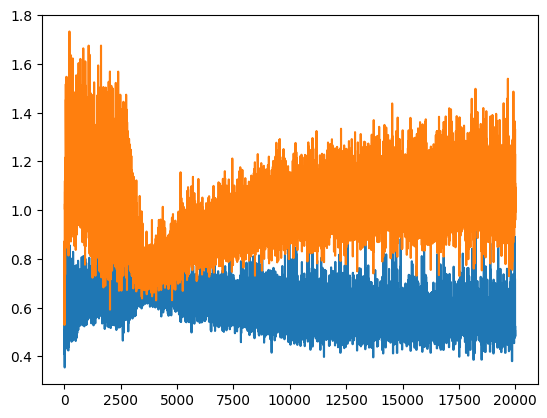

In [ ]:
%matplotlib inline
plt.figure
plt.plot(DD_plus_dense)
plt.plot(GG_plus_dense)

1/1 [==============================] - 0s 18ms/step


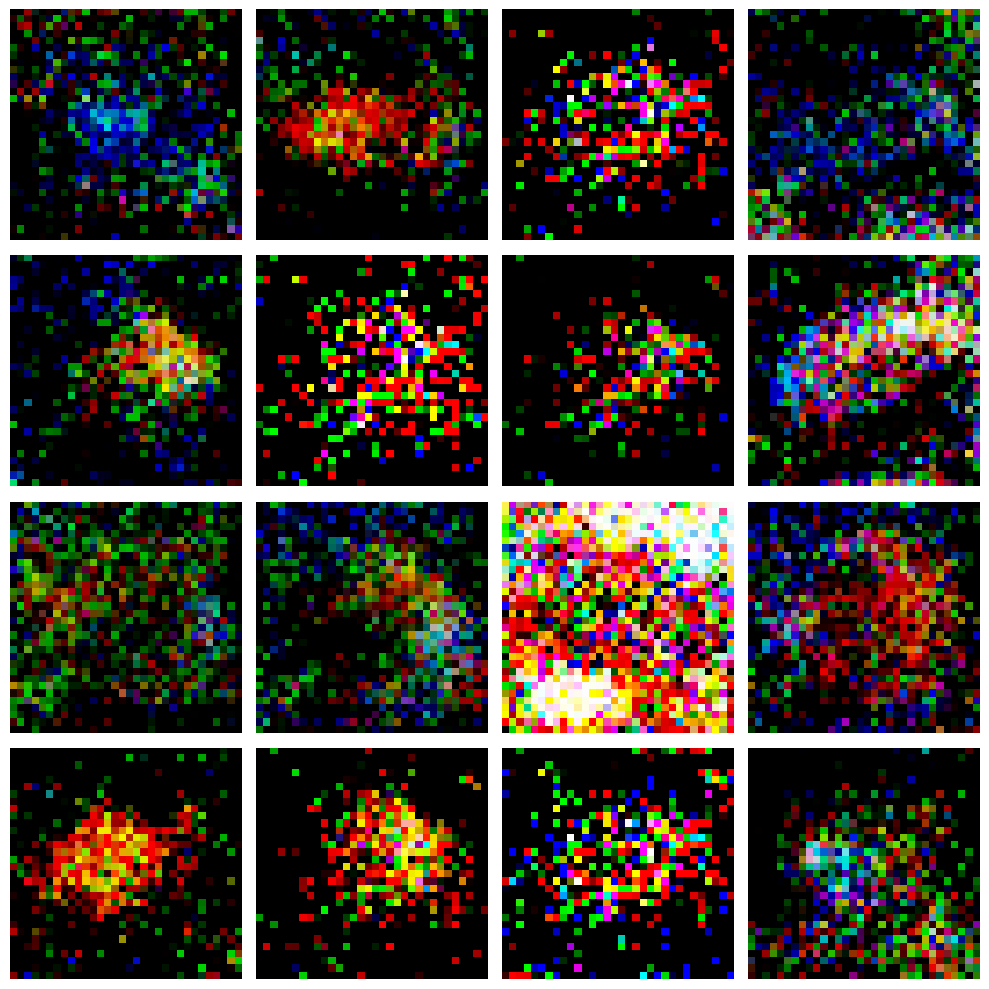

In [ ]:
gan_plus_dense.plot_images()

Pese a observar bastante ruido en según qué imágenes, podemos empezar a discernir formas similares a las que podrían tener los peces, así como colores que cuadran con este tipo de animales (azul, naranja, gris, rojo)

### ENTRENAMIENTO Y RESULTADOS DEL MODELO CONVOLUCIONAL

Por último, introduciremos capas convolucionales en nuestra arquitectura de GAN para comprobar si esto mejora el desempeño de la red.

In [ ]:
gan_plus = GAN_mod_plus_conv(width=X_train.shape[1], height=X_train.shape[2], channels=X_train.shape[3])

In [ ]:
DD_plus, GG_plus = gan_plus.train(Prueba, epochs=20000)

1/1 [==============================] - 2s 2s/step
epoch: 0, [Discriminator :: d_loss: 0.701413], [ Generator :: loss: 0.765450]
1/1 [==============================] - 0s 269ms/step


1/1 [==============================] - 0s 17ms/step
epoch: 1, [Discriminator :: d_loss: 0.693017], [ Generator :: loss: 0.730949]
1/1 [==============================] - 0s 15ms/step
epoch: 2, [Discriminator :: d_loss: 0.689929], [ Generator :: loss: 0.732639]
1/1 [==============================] - 0s 15ms/step
epoch: 3, [Discriminator :: d_loss: 0.682437], [ Generator :: loss: 0.717873]
1/1 [==============================] - 0s 15ms/step
epoch: 4, [Discriminator :: d_loss: 0.676339], [ Generator :: loss: 0.742890]
1/1 [==============================] - 0s 22ms/step
epoch: 5, [Discriminator :: d_loss: 0.668103], [ Generator :: loss: 0.757718]
1/1 [==============================] - 0s 16ms/step
epoch: 6, [Discriminator :: d_loss: 0.659213], [ Generator :: loss: 0.769803]
1/1 [==============================] - 0s 16ms/step
epoch: 7, [Discriminator :: d_loss: 0.647498], [ Generator :: loss: 0.796852]
1/1 [==============================] - 0s 19ms/step
epoch: 8, [Discriminator :: d_loss: 0.

epoch: 101, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.096695]
epoch: 102, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.087412]
epoch: 103, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.081362]
epoch: 104, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.096927]
epoch: 105, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.092104]
epoch: 106, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.049396]
epoch: 107, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.051423]
epoch: 108, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.076922]
epoch: 109, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.063842]
epoch: 110, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.074445]
epoch: 111, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.070402]
epoch: 112, [Discriminator :: d_loss: 0.519626], [ Generator :: loss: 1.073875]
epoch: 113, [Discriminator :: d_loss: 0.

1/1 [==============================] - 0s 16ms/step
epoch: 201, [Discriminator :: d_loss: 0.594890], [ Generator :: loss: 1.014248]
1/1 [==============================] - 0s 15ms/step
epoch: 202, [Discriminator :: d_loss: 0.598944], [ Generator :: loss: 1.043423]
1/1 [==============================] - 0s 30ms/step
epoch: 203, [Discriminator :: d_loss: 0.570101], [ Generator :: loss: 1.088887]
1/1 [==============================] - 0s 26ms/step
epoch: 204, [Discriminator :: d_loss: 0.549884], [ Generator :: loss: 1.097611]
1/1 [==============================] - 0s 31ms/step
epoch: 205, [Discriminator :: d_loss: 0.555561], [ Generator :: loss: 1.135990]
epoch: 206, [Discriminator :: d_loss: 0.555561], [ Generator :: loss: 1.092280]
1/1 [==============================] - 0s 24ms/step
epoch: 207, [Discriminator :: d_loss: 0.540968], [ Generator :: loss: 1.107117]
epoch: 208, [Discriminator :: d_loss: 0.540968], [ Generator :: loss: 1.084626]
epoch: 209, [Discriminator :: d_loss: 0.540968],

epoch: 301, [Discriminator :: d_loss: 0.545501], [ Generator :: loss: 1.110783]
epoch: 302, [Discriminator :: d_loss: 0.545501], [ Generator :: loss: 1.132667]
epoch: 303, [Discriminator :: d_loss: 0.545501], [ Generator :: loss: 1.070406]
1/1 [==============================] - 0s 16ms/step
epoch: 304, [Discriminator :: d_loss: 0.567460], [ Generator :: loss: 1.104208]
1/1 [==============================] - 0s 17ms/step
epoch: 305, [Discriminator :: d_loss: 0.607532], [ Generator :: loss: 1.091160]
1/1 [==============================] - 0s 15ms/step
epoch: 306, [Discriminator :: d_loss: 0.563032], [ Generator :: loss: 1.094570]
1/1 [==============================] - 0s 16ms/step
epoch: 307, [Discriminator :: d_loss: 0.524845], [ Generator :: loss: 1.142373]
epoch: 308, [Discriminator :: d_loss: 0.524845], [ Generator :: loss: 1.097437]
epoch: 309, [Discriminator :: d_loss: 0.524845], [ Generator :: loss: 1.084007]
epoch: 310, [Discriminator :: d_loss: 0.524845], [ Generator :: loss: 1.

1/1 [==============================] - 0s 18ms/step
epoch: 401, [Discriminator :: d_loss: 0.545208], [ Generator :: loss: 1.046181]
1/1 [==============================] - 0s 18ms/step
epoch: 402, [Discriminator :: d_loss: 0.579111], [ Generator :: loss: 1.050157]
1/1 [==============================] - 0s 16ms/step
epoch: 403, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.130552]
epoch: 404, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.017599]
epoch: 405, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.073076]
epoch: 406, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.076947]
epoch: 407, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.098235]
epoch: 408, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.054029]
epoch: 409, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.005751]
epoch: 410, [Discriminator :: d_loss: 0.491307], [ Generator :: loss: 1.047851]
epoch: 411, [Discriminator :: d_loss: 0.4913

1/1 [==============================] - 0s 17ms/step
epoch: 501, [Discriminator :: d_loss: 0.508357], [ Generator :: loss: 1.081674]
epoch: 502, [Discriminator :: d_loss: 0.508357], [ Generator :: loss: 0.989864]
1/1 [==============================] - 0s 16ms/step
epoch: 503, [Discriminator :: d_loss: 0.533332], [ Generator :: loss: 0.995808]
1/1 [==============================] - 0s 15ms/step
epoch: 504, [Discriminator :: d_loss: 0.502660], [ Generator :: loss: 0.909732]
1/1 [==============================] - 0s 16ms/step
epoch: 505, [Discriminator :: d_loss: 0.475987], [ Generator :: loss: 0.970187]
epoch: 506, [Discriminator :: d_loss: 0.475987], [ Generator :: loss: 0.933301]
1/1 [==============================] - 0s 16ms/step
epoch: 507, [Discriminator :: d_loss: 0.525777], [ Generator :: loss: 0.944844]
1/1 [==============================] - 0s 16ms/step
epoch: 508, [Discriminator :: d_loss: 0.492346], [ Generator :: loss: 1.011381]
epoch: 509, [Discriminator :: d_loss: 0.492346],

epoch: 601, [Discriminator :: d_loss: 0.503295], [ Generator :: loss: 1.023983]
epoch: 602, [Discriminator :: d_loss: 0.503295], [ Generator :: loss: 0.999513]
1/1 [==============================] - 0s 17ms/step
epoch: 603, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.079699]
epoch: 604, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.109174]
epoch: 605, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.033789]
epoch: 606, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.061831]
epoch: 607, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.054923]
epoch: 608, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.051965]
epoch: 609, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 0.990918]
epoch: 610, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 1.025222]
epoch: 611, [Discriminator :: d_loss: 0.471887], [ Generator :: loss: 0.958985]
epoch: 612, [Discriminator :: d_loss: 0.471887], [ Generator :: loss

1/1 [==============================] - 0s 18ms/step
epoch: 701, [Discriminator :: d_loss: 0.540599], [ Generator :: loss: 1.092175]
epoch: 702, [Discriminator :: d_loss: 0.540599], [ Generator :: loss: 1.005620]
1/1 [==============================] - 0s 16ms/step
epoch: 703, [Discriminator :: d_loss: 0.562715], [ Generator :: loss: 0.973614]
1/1 [==============================] - 0s 22ms/step
epoch: 704, [Discriminator :: d_loss: 0.567724], [ Generator :: loss: 0.944937]
1/1 [==============================] - 0s 16ms/step
epoch: 705, [Discriminator :: d_loss: 0.526839], [ Generator :: loss: 0.810927]
1/1 [==============================] - 0s 15ms/step
epoch: 706, [Discriminator :: d_loss: 0.575107], [ Generator :: loss: 0.869706]
1/1 [==============================] - 0s 16ms/step
epoch: 707, [Discriminator :: d_loss: 0.574966], [ Generator :: loss: 1.003297]
1/1 [==============================] - 0s 15ms/step
epoch: 708, [Discriminator :: d_loss: 0.534043], [ Generator :: loss: 1.0341

1/1 [==============================] - 0s 17ms/step
epoch: 801, [Discriminator :: d_loss: 0.577281], [ Generator :: loss: 0.980312]
1/1 [==============================] - 0s 16ms/step
epoch: 802, [Discriminator :: d_loss: 0.492267], [ Generator :: loss: 1.008542]
epoch: 803, [Discriminator :: d_loss: 0.492267], [ Generator :: loss: 1.010685]
epoch: 804, [Discriminator :: d_loss: 0.492267], [ Generator :: loss: 1.056592]
epoch: 805, [Discriminator :: d_loss: 0.492267], [ Generator :: loss: 1.025836]
epoch: 806, [Discriminator :: d_loss: 0.492267], [ Generator :: loss: 0.956001]
1/1 [==============================] - 0s 19ms/step
epoch: 807, [Discriminator :: d_loss: 0.530302], [ Generator :: loss: 1.027573]
1/1 [==============================] - 0s 18ms/step
epoch: 808, [Discriminator :: d_loss: 0.530756], [ Generator :: loss: 1.081014]
epoch: 809, [Discriminator :: d_loss: 0.530756], [ Generator :: loss: 1.126283]
epoch: 810, [Discriminator :: d_loss: 0.530756], [ Generator :: loss: 1.

1/1 [==============================] - 0s 17ms/step
epoch: 901, [Discriminator :: d_loss: 0.579887], [ Generator :: loss: 1.013781]
1/1 [==============================] - 0s 17ms/step
epoch: 902, [Discriminator :: d_loss: 0.530290], [ Generator :: loss: 0.919483]
1/1 [==============================] - 0s 23ms/step
epoch: 903, [Discriminator :: d_loss: 0.550709], [ Generator :: loss: 0.960329]
1/1 [==============================] - 0s 17ms/step
epoch: 904, [Discriminator :: d_loss: 0.501651], [ Generator :: loss: 1.022154]
epoch: 905, [Discriminator :: d_loss: 0.501651], [ Generator :: loss: 0.978708]
1/1 [==============================] - 0s 17ms/step
epoch: 906, [Discriminator :: d_loss: 0.593372], [ Generator :: loss: 1.055326]
1/1 [==============================] - 0s 16ms/step
epoch: 907, [Discriminator :: d_loss: 0.526093], [ Generator :: loss: 0.964182]
1/1 [==============================] - 0s 16ms/step
epoch: 908, [Discriminator :: d_loss: 0.529297], [ Generator :: loss: 1.0338

1/1 [==============================] - 0s 17ms/step
epoch: 1001, [Discriminator :: d_loss: 0.693760], [ Generator :: loss: 0.997240]
1/1 [==============================] - 0s 15ms/step
epoch: 1002, [Discriminator :: d_loss: 0.628629], [ Generator :: loss: 0.829640]
1/1 [==============================] - 0s 17ms/step
epoch: 1003, [Discriminator :: d_loss: 0.588444], [ Generator :: loss: 0.780475]
1/1 [==============================] - 0s 16ms/step
epoch: 1004, [Discriminator :: d_loss: 0.676552], [ Generator :: loss: 0.888353]
1/1 [==============================] - 0s 17ms/step
epoch: 1005, [Discriminator :: d_loss: 0.576548], [ Generator :: loss: 1.045344]
1/1 [==============================] - 0s 19ms/step
epoch: 1006, [Discriminator :: d_loss: 0.645576], [ Generator :: loss: 0.912533]
1/1 [==============================] - 0s 16ms/step
epoch: 1007, [Discriminator :: d_loss: 0.568395], [ Generator :: loss: 0.836187]
1/1 [==============================] - 0s 15ms/step
epoch: 1008, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 1101, [Discriminator :: d_loss: 0.653534], [ Generator :: loss: 0.876373]
1/1 [==============================] - 0s 16ms/step
epoch: 1102, [Discriminator :: d_loss: 0.697878], [ Generator :: loss: 0.864920]
1/1 [==============================] - 0s 19ms/step
epoch: 1103, [Discriminator :: d_loss: 0.628537], [ Generator :: loss: 0.916963]
1/1 [==============================] - 0s 16ms/step
epoch: 1104, [Discriminator :: d_loss: 0.683344], [ Generator :: loss: 1.035615]
1/1 [==============================] - 0s 15ms/step
epoch: 1105, [Discriminator :: d_loss: 0.715981], [ Generator :: loss: 1.164577]
1/1 [==============================] - 0s 18ms/step
epoch: 1106, [Discriminator :: d_loss: 0.817764], [ Generator :: loss: 0.972238]
1/1 [==============================] - 0s 16ms/step
epoch: 1107, [Discriminator :: d_loss: 0.764207], [ Generator :: loss: 0.727175]
1/1 [==============================] - 0s 16ms/step
epoch: 1108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 1201, [Discriminator :: d_loss: 0.566876], [ Generator :: loss: 0.918248]
1/1 [==============================] - 0s 16ms/step
epoch: 1202, [Discriminator :: d_loss: 0.758013], [ Generator :: loss: 0.861515]
1/1 [==============================] - 0s 16ms/step
epoch: 1203, [Discriminator :: d_loss: 0.745333], [ Generator :: loss: 0.775544]
1/1 [==============================] - 0s 16ms/step
epoch: 1204, [Discriminator :: d_loss: 0.682809], [ Generator :: loss: 0.714674]
1/1 [==============================] - 0s 16ms/step
epoch: 1205, [Discriminator :: d_loss: 0.805621], [ Generator :: loss: 0.652490]
1/1 [==============================] - 0s 17ms/step
epoch: 1206, [Discriminator :: d_loss: 0.734567], [ Generator :: loss: 0.794890]
1/1 [==============================] - 0s 17ms/step
epoch: 1207, [Discriminator :: d_loss: 0.784417], [ Generator :: loss: 0.790025]
1/1 [==============================] - 0s 16ms/step
epoch: 1208, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 1301, [Discriminator :: d_loss: 0.652114], [ Generator :: loss: 0.776594]
1/1 [==============================] - 0s 16ms/step
epoch: 1302, [Discriminator :: d_loss: 0.576296], [ Generator :: loss: 0.887261]
1/1 [==============================] - 0s 17ms/step
epoch: 1303, [Discriminator :: d_loss: 0.598811], [ Generator :: loss: 0.958238]
1/1 [==============================] - 0s 21ms/step
epoch: 1304, [Discriminator :: d_loss: 0.599483], [ Generator :: loss: 0.910747]
1/1 [==============================] - 0s 17ms/step
epoch: 1305, [Discriminator :: d_loss: 0.524729], [ Generator :: loss: 0.898951]
1/1 [==============================] - 0s 16ms/step
epoch: 1306, [Discriminator :: d_loss: 0.599036], [ Generator :: loss: 0.878510]
1/1 [==============================] - 0s 17ms/step
epoch: 1307, [Discriminator :: d_loss: 0.634257], [ Generator :: loss: 0.876844]
1/1 [==============================] - 0s 17ms/step
epoch: 1308, [Dis

1/1 [==============================] - 0s 22ms/step
epoch: 1401, [Discriminator :: d_loss: 0.611802], [ Generator :: loss: 0.829911]
1/1 [==============================] - 0s 16ms/step
epoch: 1402, [Discriminator :: d_loss: 0.568543], [ Generator :: loss: 0.829324]
1/1 [==============================] - 0s 17ms/step
epoch: 1403, [Discriminator :: d_loss: 0.547385], [ Generator :: loss: 0.873547]
1/1 [==============================] - 0s 22ms/step
epoch: 1404, [Discriminator :: d_loss: 0.520557], [ Generator :: loss: 0.986947]
1/1 [==============================] - 0s 16ms/step
epoch: 1405, [Discriminator :: d_loss: 0.573400], [ Generator :: loss: 0.862650]
1/1 [==============================] - 0s 16ms/step
epoch: 1406, [Discriminator :: d_loss: 0.630816], [ Generator :: loss: 0.754500]
1/1 [==============================] - 0s 17ms/step
epoch: 1407, [Discriminator :: d_loss: 0.506696], [ Generator :: loss: 0.822498]
1/1 [==============================] - 0s 16ms/step
epoch: 1408, [Dis

1/1 [==============================] - 0s 24ms/step
epoch: 1501, [Discriminator :: d_loss: 0.700522], [ Generator :: loss: 0.944041]
1/1 [==============================] - 0s 23ms/step
epoch: 1502, [Discriminator :: d_loss: 0.676031], [ Generator :: loss: 0.918079]
1/1 [==============================] - 0s 23ms/step
epoch: 1503, [Discriminator :: d_loss: 0.683815], [ Generator :: loss: 0.798037]
1/1 [==============================] - 0s 27ms/step
epoch: 1504, [Discriminator :: d_loss: 0.663027], [ Generator :: loss: 0.885475]
1/1 [==============================] - 0s 23ms/step
epoch: 1505, [Discriminator :: d_loss: 0.619011], [ Generator :: loss: 0.877588]
1/1 [==============================] - 0s 29ms/step
epoch: 1506, [Discriminator :: d_loss: 0.581438], [ Generator :: loss: 1.022110]
1/1 [==============================] - 0s 25ms/step
epoch: 1507, [Discriminator :: d_loss: 0.602585], [ Generator :: loss: 0.977919]
1/1 [==============================] - 0s 25ms/step
epoch: 1508, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 1601, [Discriminator :: d_loss: 0.627203], [ Generator :: loss: 0.809219]
1/1 [==============================] - 0s 18ms/step
epoch: 1602, [Discriminator :: d_loss: 0.604280], [ Generator :: loss: 0.806308]
1/1 [==============================] - 0s 17ms/step
epoch: 1603, [Discriminator :: d_loss: 0.617459], [ Generator :: loss: 0.790109]
1/1 [==============================] - 0s 16ms/step
epoch: 1604, [Discriminator :: d_loss: 0.638086], [ Generator :: loss: 0.729802]
1/1 [==============================] - 0s 19ms/step
epoch: 1605, [Discriminator :: d_loss: 0.652714], [ Generator :: loss: 0.728471]
1/1 [==============================] - 0s 16ms/step
epoch: 1606, [Discriminator :: d_loss: 0.665871], [ Generator :: loss: 0.834924]
1/1 [==============================] - 0s 17ms/step
epoch: 1607, [Discriminator :: d_loss: 0.630231], [ Generator :: loss: 0.866743]
1/1 [==============================] - 0s 17ms/step
epoch: 1608, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 1701, [Discriminator :: d_loss: 0.603641], [ Generator :: loss: 0.848649]
1/1 [==============================] - 0s 16ms/step
epoch: 1702, [Discriminator :: d_loss: 0.591133], [ Generator :: loss: 0.868771]
1/1 [==============================] - 0s 16ms/step
epoch: 1703, [Discriminator :: d_loss: 0.626153], [ Generator :: loss: 0.850872]
1/1 [==============================] - 0s 16ms/step
epoch: 1704, [Discriminator :: d_loss: 0.635778], [ Generator :: loss: 0.900274]
1/1 [==============================] - 0s 22ms/step
epoch: 1705, [Discriminator :: d_loss: 0.670136], [ Generator :: loss: 0.892182]
1/1 [==============================] - 0s 16ms/step
epoch: 1706, [Discriminator :: d_loss: 0.707266], [ Generator :: loss: 0.849498]
1/1 [==============================] - 0s 16ms/step
epoch: 1707, [Discriminator :: d_loss: 0.699210], [ Generator :: loss: 0.744452]
1/1 [==============================] - 0s 18ms/step
epoch: 1708, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 1801, [Discriminator :: d_loss: 0.613112], [ Generator :: loss: 0.741252]
1/1 [==============================] - 0s 15ms/step
epoch: 1802, [Discriminator :: d_loss: 0.611427], [ Generator :: loss: 0.719891]
1/1 [==============================] - 0s 17ms/step
epoch: 1803, [Discriminator :: d_loss: 0.637970], [ Generator :: loss: 0.780975]
1/1 [==============================] - 0s 19ms/step
epoch: 1804, [Discriminator :: d_loss: 0.610595], [ Generator :: loss: 0.795534]
1/1 [==============================] - 0s 16ms/step
epoch: 1805, [Discriminator :: d_loss: 0.627644], [ Generator :: loss: 0.815104]
1/1 [==============================] - 0s 17ms/step
epoch: 1806, [Discriminator :: d_loss: 0.583407], [ Generator :: loss: 0.761221]
1/1 [==============================] - 0s 15ms/step
epoch: 1807, [Discriminator :: d_loss: 0.614743], [ Generator :: loss: 0.732238]
1/1 [==============================] - 0s 30ms/step
epoch: 1808, [Dis

1/1 [==============================] - 0s 26ms/step
epoch: 1901, [Discriminator :: d_loss: 0.558283], [ Generator :: loss: 1.014560]
1/1 [==============================] - 0s 17ms/step
epoch: 1902, [Discriminator :: d_loss: 0.552851], [ Generator :: loss: 1.023429]
1/1 [==============================] - 0s 16ms/step
epoch: 1903, [Discriminator :: d_loss: 0.535535], [ Generator :: loss: 1.075191]
epoch: 1904, [Discriminator :: d_loss: 0.535535], [ Generator :: loss: 1.078972]
epoch: 1905, [Discriminator :: d_loss: 0.535535], [ Generator :: loss: 1.072819]
epoch: 1906, [Discriminator :: d_loss: 0.535535], [ Generator :: loss: 0.992516]
1/1 [==============================] - 0s 19ms/step
epoch: 1907, [Discriminator :: d_loss: 0.568774], [ Generator :: loss: 1.047288]
1/1 [==============================] - 0s 20ms/step
epoch: 1908, [Discriminator :: d_loss: 0.565608], [ Generator :: loss: 1.148793]
epoch: 1909, [Discriminator :: d_loss: 0.565608], [ Generator :: loss: 1.056858]
1/1 [======

1/1 [==============================] - 0s 17ms/step
epoch: 2001, [Discriminator :: d_loss: 0.561996], [ Generator :: loss: 0.911317]
1/1 [==============================] - 0s 16ms/step
epoch: 2002, [Discriminator :: d_loss: 0.560145], [ Generator :: loss: 0.907255]
1/1 [==============================] - 0s 16ms/step
epoch: 2003, [Discriminator :: d_loss: 0.603893], [ Generator :: loss: 0.817300]
1/1 [==============================] - 0s 16ms/step
epoch: 2004, [Discriminator :: d_loss: 0.577689], [ Generator :: loss: 0.844465]
1/1 [==============================] - 0s 18ms/step
epoch: 2005, [Discriminator :: d_loss: 0.607645], [ Generator :: loss: 0.784940]
1/1 [==============================] - 0s 20ms/step
epoch: 2006, [Discriminator :: d_loss: 0.534326], [ Generator :: loss: 0.867969]
1/1 [==============================] - 0s 16ms/step
epoch: 2007, [Discriminator :: d_loss: 0.613387], [ Generator :: loss: 0.828349]
1/1 [==============================] - 0s 17ms/step
epoch: 2008, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2101, [Discriminator :: d_loss: 0.617847], [ Generator :: loss: 0.931210]
1/1 [==============================] - 0s 19ms/step
epoch: 2102, [Discriminator :: d_loss: 0.588785], [ Generator :: loss: 0.864933]
1/1 [==============================] - 0s 16ms/step
epoch: 2103, [Discriminator :: d_loss: 0.659986], [ Generator :: loss: 0.929799]
1/1 [==============================] - 0s 15ms/step
epoch: 2104, [Discriminator :: d_loss: 0.590026], [ Generator :: loss: 0.950663]
1/1 [==============================] - 0s 16ms/step
epoch: 2105, [Discriminator :: d_loss: 0.589761], [ Generator :: loss: 0.869261]
1/1 [==============================] - 0s 19ms/step
epoch: 2106, [Discriminator :: d_loss: 0.634137], [ Generator :: loss: 0.977460]
1/1 [==============================] - 0s 17ms/step
epoch: 2107, [Discriminator :: d_loss: 0.693869], [ Generator :: loss: 0.915072]
1/1 [==============================] - 0s 24ms/step
epoch: 2108, [Dis

1/1 [==============================] - 0s 23ms/step
epoch: 2201, [Discriminator :: d_loss: 0.600386], [ Generator :: loss: 0.821345]
1/1 [==============================] - 0s 15ms/step
epoch: 2202, [Discriminator :: d_loss: 0.583257], [ Generator :: loss: 0.808786]
1/1 [==============================] - 0s 16ms/step
epoch: 2203, [Discriminator :: d_loss: 0.567852], [ Generator :: loss: 0.857337]
1/1 [==============================] - 0s 15ms/step
epoch: 2204, [Discriminator :: d_loss: 0.566545], [ Generator :: loss: 0.847260]
1/1 [==============================] - 0s 16ms/step
epoch: 2205, [Discriminator :: d_loss: 0.606181], [ Generator :: loss: 0.923855]
1/1 [==============================] - 0s 23ms/step
epoch: 2206, [Discriminator :: d_loss: 0.574074], [ Generator :: loss: 0.946419]
1/1 [==============================] - 0s 17ms/step
epoch: 2207, [Discriminator :: d_loss: 0.606684], [ Generator :: loss: 0.996817]
1/1 [==============================] - 0s 16ms/step
epoch: 2208, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2301, [Discriminator :: d_loss: 0.604853], [ Generator :: loss: 0.836350]
1/1 [==============================] - 0s 16ms/step
epoch: 2302, [Discriminator :: d_loss: 0.587918], [ Generator :: loss: 0.833172]
1/1 [==============================] - 0s 16ms/step
epoch: 2303, [Discriminator :: d_loss: 0.586514], [ Generator :: loss: 0.827111]
1/1 [==============================] - 0s 16ms/step
epoch: 2304, [Discriminator :: d_loss: 0.597405], [ Generator :: loss: 0.820235]
1/1 [==============================] - 0s 15ms/step
epoch: 2305, [Discriminator :: d_loss: 0.586354], [ Generator :: loss: 0.793841]
1/1 [==============================] - 0s 20ms/step
epoch: 2306, [Discriminator :: d_loss: 0.606459], [ Generator :: loss: 0.874660]
1/1 [==============================] - 0s 17ms/step
epoch: 2307, [Discriminator :: d_loss: 0.611753], [ Generator :: loss: 0.891846]
1/1 [==============================] - 0s 17ms/step
epoch: 2308, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2401, [Discriminator :: d_loss: 0.560742], [ Generator :: loss: 0.915324]
1/1 [==============================] - 0s 16ms/step
epoch: 2402, [Discriminator :: d_loss: 0.612234], [ Generator :: loss: 0.909051]
1/1 [==============================] - 0s 15ms/step
epoch: 2403, [Discriminator :: d_loss: 0.588464], [ Generator :: loss: 0.874020]
1/1 [==============================] - 0s 16ms/step
epoch: 2404, [Discriminator :: d_loss: 0.559449], [ Generator :: loss: 0.885083]
1/1 [==============================] - 0s 16ms/step
epoch: 2405, [Discriminator :: d_loss: 0.557737], [ Generator :: loss: 0.887294]
1/1 [==============================] - 0s 18ms/step
epoch: 2406, [Discriminator :: d_loss: 0.545763], [ Generator :: loss: 0.890359]
1/1 [==============================] - 0s 17ms/step
epoch: 2407, [Discriminator :: d_loss: 0.528907], [ Generator :: loss: 0.912501]
1/1 [==============================] - 0s 16ms/step
epoch: 2408, [Dis

epoch: 2501, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 1.083507]
epoch: 2502, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 1.076824]
epoch: 2503, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 1.098862]
epoch: 2504, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.999281]
epoch: 2505, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.996341]
epoch: 2506, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.948226]
epoch: 2507, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.954843]
epoch: 2508, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.922412]
epoch: 2509, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.880800]
epoch: 2510, [Discriminator :: d_loss: 0.426179], [ Generator :: loss: 0.836001]
1/1 [==============================] - 0s 19ms/step
epoch: 2511, [Discriminator :: d_loss: 0.560333], [ Generator :: loss: 0.844232]
1/1 [==============================] - 0s 20ms/step
epoch

1/1 [==============================] - 0s 18ms/step
epoch: 2601, [Discriminator :: d_loss: 0.590334], [ Generator :: loss: 0.938759]
1/1 [==============================] - 0s 17ms/step
epoch: 2602, [Discriminator :: d_loss: 0.584429], [ Generator :: loss: 0.874253]
1/1 [==============================] - 0s 17ms/step
epoch: 2603, [Discriminator :: d_loss: 0.598332], [ Generator :: loss: 0.781743]
1/1 [==============================] - 0s 18ms/step
epoch: 2604, [Discriminator :: d_loss: 0.588917], [ Generator :: loss: 0.837142]
1/1 [==============================] - 0s 16ms/step
epoch: 2605, [Discriminator :: d_loss: 0.583292], [ Generator :: loss: 0.979384]
1/1 [==============================] - 0s 18ms/step
epoch: 2606, [Discriminator :: d_loss: 0.589371], [ Generator :: loss: 1.023131]
1/1 [==============================] - 0s 27ms/step
epoch: 2607, [Discriminator :: d_loss: 0.568267], [ Generator :: loss: 0.998016]
1/1 [==============================] - 0s 29ms/step
epoch: 2608, [Dis

epoch: 2701, [Discriminator :: d_loss: 0.494592], [ Generator :: loss: 1.153163]
epoch: 2702, [Discriminator :: d_loss: 0.494592], [ Generator :: loss: 1.019258]
epoch: 2703, [Discriminator :: d_loss: 0.494592], [ Generator :: loss: 1.016782]
epoch: 2704, [Discriminator :: d_loss: 0.494592], [ Generator :: loss: 0.976502]
1/1 [==============================] - 0s 16ms/step
epoch: 2705, [Discriminator :: d_loss: 0.519371], [ Generator :: loss: 0.939350]
1/1 [==============================] - 0s 17ms/step
epoch: 2706, [Discriminator :: d_loss: 0.570711], [ Generator :: loss: 0.919101]
1/1 [==============================] - 0s 16ms/step
epoch: 2707, [Discriminator :: d_loss: 0.563449], [ Generator :: loss: 0.850957]
1/1 [==============================] - 0s 16ms/step
epoch: 2708, [Discriminator :: d_loss: 0.581260], [ Generator :: loss: 0.984078]
1/1 [==============================] - 0s 16ms/step
epoch: 2709, [Discriminator :: d_loss: 0.565850], [ Generator :: loss: 1.060878]
1/1 [======

1/1 [==============================] - 0s 17ms/step
epoch: 2801, [Discriminator :: d_loss: 0.533278], [ Generator :: loss: 0.955314]
1/1 [==============================] - 0s 16ms/step
epoch: 2802, [Discriminator :: d_loss: 0.514597], [ Generator :: loss: 0.999983]
1/1 [==============================] - 0s 16ms/step
epoch: 2803, [Discriminator :: d_loss: 0.524134], [ Generator :: loss: 0.966014]
1/1 [==============================] - 0s 16ms/step
epoch: 2804, [Discriminator :: d_loss: 0.544727], [ Generator :: loss: 1.035786]
1/1 [==============================] - 0s 15ms/step
epoch: 2805, [Discriminator :: d_loss: 0.511368], [ Generator :: loss: 0.986143]
1/1 [==============================] - 0s 19ms/step
epoch: 2806, [Discriminator :: d_loss: 0.519934], [ Generator :: loss: 0.879520]
1/1 [==============================] - 0s 16ms/step
epoch: 2807, [Discriminator :: d_loss: 0.566748], [ Generator :: loss: 0.918774]
1/1 [==============================] - 0s 15ms/step
epoch: 2808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 2901, [Discriminator :: d_loss: 0.687490], [ Generator :: loss: 1.017210]
1/1 [==============================] - 0s 15ms/step
epoch: 2902, [Discriminator :: d_loss: 0.773074], [ Generator :: loss: 0.734732]
1/1 [==============================] - 0s 16ms/step
epoch: 2903, [Discriminator :: d_loss: 0.771681], [ Generator :: loss: 1.042303]
1/1 [==============================] - 0s 16ms/step
epoch: 2904, [Discriminator :: d_loss: 0.715469], [ Generator :: loss: 1.000945]
1/1 [==============================] - 0s 16ms/step
epoch: 2905, [Discriminator :: d_loss: 0.763648], [ Generator :: loss: 0.859863]
1/1 [==============================] - 0s 17ms/step
epoch: 2906, [Discriminator :: d_loss: 0.648509], [ Generator :: loss: 0.779558]
1/1 [==============================] - 0s 16ms/step
epoch: 2907, [Discriminator :: d_loss: 0.661764], [ Generator :: loss: 0.879192]
1/1 [==============================] - 0s 15ms/step
epoch: 2908, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3001, [Discriminator :: d_loss: 0.560571], [ Generator :: loss: 0.964750]
1/1 [==============================] - 0s 16ms/step
epoch: 3002, [Discriminator :: d_loss: 0.538341], [ Generator :: loss: 0.948330]
1/1 [==============================] - 0s 15ms/step
epoch: 3003, [Discriminator :: d_loss: 0.578095], [ Generator :: loss: 0.943123]
1/1 [==============================] - 0s 15ms/step
epoch: 3004, [Discriminator :: d_loss: 0.528754], [ Generator :: loss: 1.037577]
1/1 [==============================] - 0s 26ms/step
epoch: 3005, [Discriminator :: d_loss: 0.520644], [ Generator :: loss: 1.067796]
epoch: 3006, [Discriminator :: d_loss: 0.520644], [ Generator :: loss: 1.057999]
epoch: 3007, [Discriminator :: d_loss: 0.520644], [ Generator :: loss: 1.074996]
epoch: 3008, [Discriminator :: d_loss: 0.520644], [ Generator :: loss: 1.010013]
1/1 [==============================] - 0s 20ms/step
epoch: 3009, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 17ms/step
epoch: 3101, [Discriminator :: d_loss: 0.588676], [ Generator :: loss: 0.978167]
1/1 [==============================] - 0s 22ms/step
epoch: 3102, [Discriminator :: d_loss: 0.563989], [ Generator :: loss: 0.797775]
1/1 [==============================] - 0s 17ms/step
epoch: 3103, [Discriminator :: d_loss: 0.640925], [ Generator :: loss: 0.834420]
1/1 [==============================] - 0s 16ms/step
epoch: 3104, [Discriminator :: d_loss: 0.560905], [ Generator :: loss: 0.946916]
1/1 [==============================] - 0s 16ms/step
epoch: 3105, [Discriminator :: d_loss: 0.619804], [ Generator :: loss: 0.892247]
1/1 [==============================] - 0s 15ms/step
epoch: 3106, [Discriminator :: d_loss: 0.606871], [ Generator :: loss: 0.904938]
1/1 [==============================] - 0s 16ms/step
epoch: 3107, [Discriminator :: d_loss: 0.542384], [ Generator :: loss: 0.895213]
1/1 [==============================] - 0s 16ms/step
epoch: 3108, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 3201, [Discriminator :: d_loss: 0.538775], [ Generator :: loss: 0.929493]
1/1 [==============================] - 0s 15ms/step
epoch: 3202, [Discriminator :: d_loss: 0.667268], [ Generator :: loss: 0.923012]
1/1 [==============================] - 0s 15ms/step
epoch: 3203, [Discriminator :: d_loss: 0.598176], [ Generator :: loss: 0.852391]
1/1 [==============================] - 0s 16ms/step
epoch: 3204, [Discriminator :: d_loss: 0.606538], [ Generator :: loss: 0.929547]
1/1 [==============================] - 0s 15ms/step
epoch: 3205, [Discriminator :: d_loss: 0.589438], [ Generator :: loss: 0.934730]
1/1 [==============================] - 0s 18ms/step
epoch: 3206, [Discriminator :: d_loss: 0.585152], [ Generator :: loss: 0.958281]
1/1 [==============================] - 0s 16ms/step
epoch: 3207, [Discriminator :: d_loss: 0.596833], [ Generator :: loss: 0.993311]
1/1 [==============================] - 0s 16ms/step
epoch: 3208, [Dis

epoch: 3301, [Discriminator :: d_loss: 0.502319], [ Generator :: loss: 1.062177]
epoch: 3302, [Discriminator :: d_loss: 0.502319], [ Generator :: loss: 1.035258]
epoch: 3303, [Discriminator :: d_loss: 0.502319], [ Generator :: loss: 1.011513]
epoch: 3304, [Discriminator :: d_loss: 0.502319], [ Generator :: loss: 1.052378]
epoch: 3305, [Discriminator :: d_loss: 0.502319], [ Generator :: loss: 0.998087]
1/1 [==============================] - 0s 24ms/step
epoch: 3306, [Discriminator :: d_loss: 0.572002], [ Generator :: loss: 1.008726]
1/1 [==============================] - 0s 29ms/step
epoch: 3307, [Discriminator :: d_loss: 0.650976], [ Generator :: loss: 0.756366]
1/1 [==============================] - 0s 24ms/step
epoch: 3308, [Discriminator :: d_loss: 0.620835], [ Generator :: loss: 0.734948]
1/1 [==============================] - 0s 27ms/step
epoch: 3309, [Discriminator :: d_loss: 0.536202], [ Generator :: loss: 0.974174]
1/1 [==============================] - 0s 27ms/step
epoch: 3310

1/1 [==============================] - 0s 18ms/step
epoch: 3401, [Discriminator :: d_loss: 0.593000], [ Generator :: loss: 0.974844]
1/1 [==============================] - 0s 18ms/step
epoch: 3402, [Discriminator :: d_loss: 0.536261], [ Generator :: loss: 1.036884]
1/1 [==============================] - 0s 17ms/step
epoch: 3403, [Discriminator :: d_loss: 0.535272], [ Generator :: loss: 1.062505]
1/1 [==============================] - 0s 17ms/step
epoch: 3404, [Discriminator :: d_loss: 0.544585], [ Generator :: loss: 1.040802]
1/1 [==============================] - 0s 16ms/step
epoch: 3405, [Discriminator :: d_loss: 0.542238], [ Generator :: loss: 1.038617]
1/1 [==============================] - 0s 17ms/step
epoch: 3406, [Discriminator :: d_loss: 0.519899], [ Generator :: loss: 0.954506]
1/1 [==============================] - 0s 16ms/step
epoch: 3407, [Discriminator :: d_loss: 0.569836], [ Generator :: loss: 0.975124]
1/1 [==============================] - 0s 16ms/step
epoch: 3408, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 3501, [Discriminator :: d_loss: 0.730641], [ Generator :: loss: 0.616995]
1/1 [==============================] - 0s 16ms/step
epoch: 3502, [Discriminator :: d_loss: 0.733596], [ Generator :: loss: 0.697358]
1/1 [==============================] - 0s 16ms/step
epoch: 3503, [Discriminator :: d_loss: 0.655315], [ Generator :: loss: 0.781222]
1/1 [==============================] - 0s 20ms/step
epoch: 3504, [Discriminator :: d_loss: 0.624429], [ Generator :: loss: 1.002089]
1/1 [==============================] - 0s 20ms/step
epoch: 3505, [Discriminator :: d_loss: 0.609135], [ Generator :: loss: 0.950567]
1/1 [==============================] - 0s 16ms/step
epoch: 3506, [Discriminator :: d_loss: 0.613527], [ Generator :: loss: 0.824850]
1/1 [==============================] - 0s 20ms/step
epoch: 3507, [Discriminator :: d_loss: 0.621531], [ Generator :: loss: 0.880210]
1/1 [==============================] - 0s 16ms/step
epoch: 3508, [Dis

epoch: 3601, [Discriminator :: d_loss: 0.456720], [ Generator :: loss: 0.952668]
epoch: 3602, [Discriminator :: d_loss: 0.456720], [ Generator :: loss: 0.785642]
1/1 [==============================] - 0s 23ms/step
epoch: 3603, [Discriminator :: d_loss: 0.631701], [ Generator :: loss: 0.946532]
1/1 [==============================] - 0s 28ms/step
epoch: 3604, [Discriminator :: d_loss: 0.702672], [ Generator :: loss: 0.816003]
1/1 [==============================] - 0s 26ms/step
epoch: 3605, [Discriminator :: d_loss: 0.699769], [ Generator :: loss: 0.949974]
1/1 [==============================] - 0s 16ms/step
epoch: 3606, [Discriminator :: d_loss: 0.705600], [ Generator :: loss: 0.925208]
1/1 [==============================] - 0s 21ms/step
epoch: 3607, [Discriminator :: d_loss: 0.688398], [ Generator :: loss: 1.030174]
1/1 [==============================] - 0s 16ms/step
epoch: 3608, [Discriminator :: d_loss: 0.565782], [ Generator :: loss: 1.104586]
1/1 [==============================] - 0

1/1 [==============================] - 0s 19ms/step
epoch: 3701, [Discriminator :: d_loss: 0.537040], [ Generator :: loss: 1.060174]
1/1 [==============================] - 0s 17ms/step
epoch: 3702, [Discriminator :: d_loss: 0.545681], [ Generator :: loss: 1.085667]
1/1 [==============================] - 0s 16ms/step
epoch: 3703, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.372375]
epoch: 3704, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.317380]
epoch: 3705, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.231743]
epoch: 3706, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.141261]
epoch: 3707, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.239676]
epoch: 3708, [Discriminator :: d_loss: 0.558263], [ Generator :: loss: 1.053421]
1/1 [==============================] - 0s 16ms/step
epoch: 3709, [Discriminator :: d_loss: 0.528367], [ Generator :: loss: 1.073333]
epoch: 3710, [Discriminator :: d_loss: 0.528367], [ Generator :

1/1 [==============================] - 0s 19ms/step
epoch: 3801, [Discriminator :: d_loss: 0.642501], [ Generator :: loss: 1.013211]
1/1 [==============================] - 0s 18ms/step
epoch: 3802, [Discriminator :: d_loss: 0.591841], [ Generator :: loss: 0.988935]
1/1 [==============================] - 0s 16ms/step
epoch: 3803, [Discriminator :: d_loss: 0.519977], [ Generator :: loss: 0.897342]
1/1 [==============================] - 0s 17ms/step
epoch: 3804, [Discriminator :: d_loss: 0.573919], [ Generator :: loss: 0.883103]
1/1 [==============================] - 0s 22ms/step
epoch: 3805, [Discriminator :: d_loss: 0.578438], [ Generator :: loss: 0.968018]
1/1 [==============================] - 0s 17ms/step
epoch: 3806, [Discriminator :: d_loss: 0.546424], [ Generator :: loss: 1.011586]
1/1 [==============================] - 0s 16ms/step
epoch: 3807, [Discriminator :: d_loss: 0.613848], [ Generator :: loss: 1.000599]
1/1 [==============================] - 0s 16ms/step
epoch: 3808, [Dis

epoch: 3901, [Discriminator :: d_loss: 0.517124], [ Generator :: loss: 1.129453]
epoch: 3902, [Discriminator :: d_loss: 0.517124], [ Generator :: loss: 1.033668]
1/1 [==============================] - 0s 24ms/step
epoch: 3903, [Discriminator :: d_loss: 0.543406], [ Generator :: loss: 1.210311]
epoch: 3904, [Discriminator :: d_loss: 0.543406], [ Generator :: loss: 1.197675]
epoch: 3905, [Discriminator :: d_loss: 0.543406], [ Generator :: loss: 1.073897]
1/1 [==============================] - 0s 30ms/step
epoch: 3906, [Discriminator :: d_loss: 0.670498], [ Generator :: loss: 1.097037]
1/1 [==============================] - 0s 26ms/step
epoch: 3907, [Discriminator :: d_loss: 0.646045], [ Generator :: loss: 1.171082]
1/1 [==============================] - 0s 26ms/step
epoch: 3908, [Discriminator :: d_loss: 0.849433], [ Generator :: loss: 0.871662]
1/1 [==============================] - 0s 16ms/step
epoch: 3909, [Discriminator :: d_loss: 0.757288], [ Generator :: loss: 1.033440]
1/1 [======

1/1 [==============================] - 0s 18ms/step
epoch: 4001, [Discriminator :: d_loss: 0.538863], [ Generator :: loss: 0.960677]
1/1 [==============================] - 0s 17ms/step
epoch: 4002, [Discriminator :: d_loss: 0.573051], [ Generator :: loss: 0.918390]
1/1 [==============================] - 0s 16ms/step
epoch: 4003, [Discriminator :: d_loss: 0.565704], [ Generator :: loss: 0.822805]
1/1 [==============================] - 0s 15ms/step
epoch: 4004, [Discriminator :: d_loss: 0.545906], [ Generator :: loss: 0.946696]
1/1 [==============================] - 0s 26ms/step
epoch: 4005, [Discriminator :: d_loss: 0.596176], [ Generator :: loss: 0.999587]
1/1 [==============================] - 0s 16ms/step
epoch: 4006, [Discriminator :: d_loss: 0.568609], [ Generator :: loss: 0.901057]
1/1 [==============================] - 0s 15ms/step
epoch: 4007, [Discriminator :: d_loss: 0.598222], [ Generator :: loss: 0.969882]
1/1 [==============================] - 0s 20ms/step
epoch: 4008, [Dis

epoch: 4101, [Discriminator :: d_loss: 0.499113], [ Generator :: loss: 1.031260]
epoch: 4102, [Discriminator :: d_loss: 0.499113], [ Generator :: loss: 0.971232]
1/1 [==============================] - 0s 17ms/step
epoch: 4103, [Discriminator :: d_loss: 0.525447], [ Generator :: loss: 1.140832]
epoch: 4104, [Discriminator :: d_loss: 0.525447], [ Generator :: loss: 0.979059]
1/1 [==============================] - 0s 17ms/step
epoch: 4105, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.162230]
epoch: 4106, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.091314]
epoch: 4107, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.160035]
epoch: 4108, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.120105]
epoch: 4109, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.018120]
epoch: 4110, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 0.983029]
epoch: 4111, [Discriminator :: d_loss: 0.443601], [ Generator :: loss: 1.061278]
epoch

1/1 [==============================] - 0s 16ms/step
epoch: 4201, [Discriminator :: d_loss: 0.511889], [ Generator :: loss: 1.069946]
epoch: 4202, [Discriminator :: d_loss: 0.511889], [ Generator :: loss: 0.983399]
1/1 [==============================] - 0s 15ms/step
epoch: 4203, [Discriminator :: d_loss: 0.541447], [ Generator :: loss: 0.991555]
1/1 [==============================] - 0s 15ms/step
epoch: 4204, [Discriminator :: d_loss: 0.481225], [ Generator :: loss: 1.039791]
epoch: 4205, [Discriminator :: d_loss: 0.481225], [ Generator :: loss: 0.918644]
1/1 [==============================] - 0s 15ms/step
epoch: 4206, [Discriminator :: d_loss: 0.488991], [ Generator :: loss: 0.962042]
1/1 [==============================] - 0s 17ms/step
epoch: 4207, [Discriminator :: d_loss: 0.470800], [ Generator :: loss: 1.082861]
epoch: 4208, [Discriminator :: d_loss: 0.470800], [ Generator :: loss: 1.045877]
epoch: 4209, [Discriminator :: d_loss: 0.470800], [ Generator :: loss: 0.968619]
epoch: 4210

1/1 [==============================] - 0s 19ms/step
epoch: 4301, [Discriminator :: d_loss: 0.649060], [ Generator :: loss: 1.066594]
1/1 [==============================] - 0s 18ms/step
epoch: 4302, [Discriminator :: d_loss: 0.639725], [ Generator :: loss: 0.954853]
1/1 [==============================] - 0s 17ms/step
epoch: 4303, [Discriminator :: d_loss: 0.610928], [ Generator :: loss: 1.109718]
1/1 [==============================] - 0s 17ms/step
epoch: 4304, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.283991]
epoch: 4305, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.246537]
epoch: 4306, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.231947]
epoch: 4307, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.191282]
epoch: 4308, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.225310]
epoch: 4309, [Discriminator :: d_loss: 0.551964], [ Generator :: loss: 1.105958]
epoch: 4310, [Discriminator :: d_loss: 0.551964], [ Generator :

1/1 [==============================] - 0s 18ms/step
epoch: 4401, [Discriminator :: d_loss: 0.529584], [ Generator :: loss: 0.908440]
1/1 [==============================] - 0s 16ms/step
epoch: 4402, [Discriminator :: d_loss: 0.586491], [ Generator :: loss: 0.861391]
1/1 [==============================] - 0s 19ms/step
epoch: 4403, [Discriminator :: d_loss: 0.537066], [ Generator :: loss: 0.918678]
1/1 [==============================] - 0s 20ms/step
epoch: 4404, [Discriminator :: d_loss: 0.556894], [ Generator :: loss: 1.002475]
1/1 [==============================] - 0s 17ms/step
epoch: 4405, [Discriminator :: d_loss: 0.624991], [ Generator :: loss: 1.037835]
1/1 [==============================] - 0s 25ms/step
epoch: 4406, [Discriminator :: d_loss: 0.518754], [ Generator :: loss: 0.945116]
1/1 [==============================] - 0s 16ms/step
epoch: 4407, [Discriminator :: d_loss: 0.626941], [ Generator :: loss: 0.913152]
1/1 [==============================] - 0s 16ms/step
epoch: 4408, [Dis

epoch: 4501, [Discriminator :: d_loss: 0.523249], [ Generator :: loss: 1.046408]
1/1 [==============================] - 0s 32ms/step
epoch: 4502, [Discriminator :: d_loss: 0.607732], [ Generator :: loss: 1.093750]
1/1 [==============================] - 0s 27ms/step
epoch: 4503, [Discriminator :: d_loss: 0.507879], [ Generator :: loss: 1.167231]
epoch: 4504, [Discriminator :: d_loss: 0.507879], [ Generator :: loss: 0.976487]
1/1 [==============================] - 0s 35ms/step
epoch: 4505, [Discriminator :: d_loss: 0.533153], [ Generator :: loss: 1.166695]
epoch: 4506, [Discriminator :: d_loss: 0.533153], [ Generator :: loss: 1.093230]
epoch: 4507, [Discriminator :: d_loss: 0.533153], [ Generator :: loss: 1.042196]
1/1 [==============================] - 0s 24ms/step
epoch: 4508, [Discriminator :: d_loss: 0.549640], [ Generator :: loss: 1.175971]
epoch: 4509, [Discriminator :: d_loss: 0.549640], [ Generator :: loss: 1.189677]
epoch: 4510, [Discriminator :: d_loss: 0.549640], [ Generator :

epoch: 4601, [Discriminator :: d_loss: 0.585128], [ Generator :: loss: 1.239814]
epoch: 4602, [Discriminator :: d_loss: 0.585128], [ Generator :: loss: 1.255513]
epoch: 4603, [Discriminator :: d_loss: 0.585128], [ Generator :: loss: 1.276191]
epoch: 4604, [Discriminator :: d_loss: 0.585128], [ Generator :: loss: 1.135428]
1/1 [==============================] - 0s 16ms/step
epoch: 4605, [Discriminator :: d_loss: 0.519305], [ Generator :: loss: 1.183889]
epoch: 4606, [Discriminator :: d_loss: 0.519305], [ Generator :: loss: 1.134964]
epoch: 4607, [Discriminator :: d_loss: 0.519305], [ Generator :: loss: 1.073908]
epoch: 4608, [Discriminator :: d_loss: 0.519305], [ Generator :: loss: 0.981012]
1/1 [==============================] - 0s 28ms/step
epoch: 4609, [Discriminator :: d_loss: 0.707107], [ Generator :: loss: 1.183732]
1/1 [==============================] - 0s 17ms/step
epoch: 4610, [Discriminator :: d_loss: 0.690820], [ Generator :: loss: 0.943524]
1/1 [=============================

1/1 [==============================] - 0s 23ms/step
epoch: 4701, [Discriminator :: d_loss: 0.577183], [ Generator :: loss: 0.907120]
1/1 [==============================] - 0s 23ms/step
epoch: 4702, [Discriminator :: d_loss: 0.596544], [ Generator :: loss: 0.957567]
1/1 [==============================] - 0s 29ms/step
epoch: 4703, [Discriminator :: d_loss: 0.516458], [ Generator :: loss: 0.957690]
1/1 [==============================] - 0s 22ms/step
epoch: 4704, [Discriminator :: d_loss: 0.492114], [ Generator :: loss: 1.050991]
epoch: 4705, [Discriminator :: d_loss: 0.492114], [ Generator :: loss: 1.026336]
epoch: 4706, [Discriminator :: d_loss: 0.492114], [ Generator :: loss: 1.036077]
epoch: 4707, [Discriminator :: d_loss: 0.492114], [ Generator :: loss: 0.969097]
1/1 [==============================] - 0s 25ms/step
epoch: 4708, [Discriminator :: d_loss: 0.513405], [ Generator :: loss: 1.041280]
epoch: 4709, [Discriminator :: d_loss: 0.513405], [ Generator :: loss: 1.008410]
1/1 [======

1/1 [==============================] - 0s 17ms/step
epoch: 4801, [Discriminator :: d_loss: 0.577916], [ Generator :: loss: 0.980477]
1/1 [==============================] - 0s 16ms/step
epoch: 4802, [Discriminator :: d_loss: 0.572964], [ Generator :: loss: 0.945429]
1/1 [==============================] - 0s 16ms/step
epoch: 4803, [Discriminator :: d_loss: 0.550195], [ Generator :: loss: 1.058965]
1/1 [==============================] - 0s 19ms/step
epoch: 4804, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.135367]
epoch: 4805, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.102669]
epoch: 4806, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.103047]
epoch: 4807, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.092411]
epoch: 4808, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.093541]
epoch: 4809, [Discriminator :: d_loss: 0.484340], [ Generator :: loss: 1.080497]
epoch: 4810, [Discriminator :: d_loss: 0.484340], [ Generator :

1/1 [==============================] - 0s 19ms/step
epoch: 4901, [Discriminator :: d_loss: 0.551926], [ Generator :: loss: 0.985263]
1/1 [==============================] - 0s 16ms/step
epoch: 4902, [Discriminator :: d_loss: 0.556456], [ Generator :: loss: 0.932085]
1/1 [==============================] - 0s 16ms/step
epoch: 4903, [Discriminator :: d_loss: 0.595674], [ Generator :: loss: 0.878568]
1/1 [==============================] - 0s 20ms/step
epoch: 4904, [Discriminator :: d_loss: 0.541555], [ Generator :: loss: 0.935139]
1/1 [==============================] - 0s 18ms/step
epoch: 4905, [Discriminator :: d_loss: 0.534971], [ Generator :: loss: 1.031028]
1/1 [==============================] - 0s 16ms/step
epoch: 4906, [Discriminator :: d_loss: 0.556606], [ Generator :: loss: 1.009951]
1/1 [==============================] - 0s 17ms/step
epoch: 4907, [Discriminator :: d_loss: 0.562734], [ Generator :: loss: 0.962222]
1/1 [==============================] - 0s 16ms/step
epoch: 4908, [Dis

epoch: 5001, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.941300]
epoch: 5002, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.998518]
epoch: 5003, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.947079]
epoch: 5004, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.986782]
epoch: 5005, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.977905]
epoch: 5006, [Discriminator :: d_loss: 0.459693], [ Generator :: loss: 0.877359]
1/1 [==============================] - 0s 28ms/step
epoch: 5007, [Discriminator :: d_loss: 0.577746], [ Generator :: loss: 0.865592]
1/1 [==============================] - 0s 28ms/step
epoch: 5008, [Discriminator :: d_loss: 0.568173], [ Generator :: loss: 0.914896]
1/1 [==============================] - 0s 24ms/step
epoch: 5009, [Discriminator :: d_loss: 0.570707], [ Generator :: loss: 0.883052]
1/1 [==============================] - 0s 22ms/step
epoch: 5010, [Discriminator :: d_loss: 0.619588], [ Generator :

epoch: 5101, [Discriminator :: d_loss: 0.609002], [ Generator :: loss: 1.279672]
epoch: 5102, [Discriminator :: d_loss: 0.609002], [ Generator :: loss: 1.390871]
epoch: 5103, [Discriminator :: d_loss: 0.609002], [ Generator :: loss: 1.382088]
epoch: 5104, [Discriminator :: d_loss: 0.609002], [ Generator :: loss: 1.192144]
1/1 [==============================] - 0s 16ms/step
epoch: 5105, [Discriminator :: d_loss: 0.606639], [ Generator :: loss: 1.327912]
epoch: 5106, [Discriminator :: d_loss: 0.606639], [ Generator :: loss: 1.234575]
epoch: 5107, [Discriminator :: d_loss: 0.606639], [ Generator :: loss: 1.182481]
1/1 [==============================] - 0s 15ms/step
epoch: 5108, [Discriminator :: d_loss: 0.506536], [ Generator :: loss: 1.424083]
epoch: 5109, [Discriminator :: d_loss: 0.506536], [ Generator :: loss: 1.405683]
epoch: 5110, [Discriminator :: d_loss: 0.506536], [ Generator :: loss: 1.125670]
epoch: 5111, [Discriminator :: d_loss: 0.506536], [ Generator :: loss: 1.237793]
epoch

1/1 [==============================] - 0s 25ms/step
epoch: 5201, [Discriminator :: d_loss: 0.589479], [ Generator :: loss: 0.875185]
1/1 [==============================] - 0s 23ms/step
epoch: 5202, [Discriminator :: d_loss: 0.521755], [ Generator :: loss: 0.886122]
1/1 [==============================] - 0s 25ms/step
epoch: 5203, [Discriminator :: d_loss: 0.557883], [ Generator :: loss: 0.994677]
1/1 [==============================] - 0s 35ms/step
epoch: 5204, [Discriminator :: d_loss: 0.549743], [ Generator :: loss: 1.023162]
1/1 [==============================] - 0s 33ms/step
epoch: 5205, [Discriminator :: d_loss: 0.547072], [ Generator :: loss: 0.904640]
1/1 [==============================] - 0s 33ms/step
epoch: 5206, [Discriminator :: d_loss: 0.557795], [ Generator :: loss: 0.949363]
1/1 [==============================] - 0s 35ms/step
epoch: 5207, [Discriminator :: d_loss: 0.547999], [ Generator :: loss: 1.038298]
1/1 [==============================] - 0s 27ms/step
epoch: 5208, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 5301, [Discriminator :: d_loss: 0.561917], [ Generator :: loss: 1.004182]
1/1 [==============================] - 0s 16ms/step
epoch: 5302, [Discriminator :: d_loss: 0.587480], [ Generator :: loss: 0.889434]
1/1 [==============================] - 0s 16ms/step
epoch: 5303, [Discriminator :: d_loss: 0.544581], [ Generator :: loss: 0.986897]
1/1 [==============================] - 0s 20ms/step
epoch: 5304, [Discriminator :: d_loss: 0.500172], [ Generator :: loss: 1.069973]
epoch: 5305, [Discriminator :: d_loss: 0.500172], [ Generator :: loss: 0.960176]
1/1 [==============================] - 0s 20ms/step
epoch: 5306, [Discriminator :: d_loss: 0.574563], [ Generator :: loss: 0.967756]
1/1 [==============================] - 0s 15ms/step
epoch: 5307, [Discriminator :: d_loss: 0.486655], [ Generator :: loss: 1.006841]
epoch: 5308, [Discriminator :: d_loss: 0.486655], [ Generator :: loss: 1.027215]
epoch: 5309, [Discriminator :: d_loss: 0

epoch: 5401, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.208396]
epoch: 5402, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.105931]
epoch: 5403, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.161131]
epoch: 5404, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.087065]
epoch: 5405, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.042843]
epoch: 5406, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.030509]
epoch: 5407, [Discriminator :: d_loss: 0.509722], [ Generator :: loss: 1.017204]
1/1 [==============================] - 0s 19ms/step
epoch: 5408, [Discriminator :: d_loss: 0.618917], [ Generator :: loss: 1.088105]
1/1 [==============================] - 0s 20ms/step
epoch: 5409, [Discriminator :: d_loss: 0.584950], [ Generator :: loss: 0.996924]
1/1 [==============================] - 0s 19ms/step
epoch: 5410, [Discriminator :: d_loss: 0.593846], [ Generator :: loss: 0.901444]
1/1 [=============================

epoch: 5501, [Discriminator :: d_loss: 0.568585], [ Generator :: loss: 1.109848]
1/1 [==============================] - 0s 18ms/step
epoch: 5502, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.207165]
epoch: 5503, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.112221]
epoch: 5504, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.143805]
epoch: 5505, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.109690]
epoch: 5506, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.068945]
epoch: 5507, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.065365]
epoch: 5508, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.025066]
epoch: 5509, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 1.043347]
epoch: 5510, [Discriminator :: d_loss: 0.476221], [ Generator :: loss: 0.908906]
1/1 [==============================] - 0s 22ms/step
epoch: 5511, [Discriminator :: d_loss: 0.590293], [ Generator :: loss: 0.892247]
1/1 [

1/1 [==============================] - 0s 18ms/step
epoch: 5601, [Discriminator :: d_loss: 0.577346], [ Generator :: loss: 0.874145]
1/1 [==============================] - 0s 16ms/step
epoch: 5602, [Discriminator :: d_loss: 0.691169], [ Generator :: loss: 0.858942]
1/1 [==============================] - 0s 16ms/step
epoch: 5603, [Discriminator :: d_loss: 0.689222], [ Generator :: loss: 0.923874]
1/1 [==============================] - 0s 17ms/step
epoch: 5604, [Discriminator :: d_loss: 0.627910], [ Generator :: loss: 0.972973]
1/1 [==============================] - 0s 17ms/step
epoch: 5605, [Discriminator :: d_loss: 0.599129], [ Generator :: loss: 0.996685]
1/1 [==============================] - 0s 19ms/step
epoch: 5606, [Discriminator :: d_loss: 0.675872], [ Generator :: loss: 0.859225]
1/1 [==============================] - 0s 17ms/step
epoch: 5607, [Discriminator :: d_loss: 0.723165], [ Generator :: loss: 1.046898]
1/1 [==============================] - 0s 16ms/step
epoch: 5608, [Dis

1/1 [==============================] - 0s 19ms/step
epoch: 5701, [Discriminator :: d_loss: 0.561582], [ Generator :: loss: 0.988306]
1/1 [==============================] - 0s 17ms/step
epoch: 5702, [Discriminator :: d_loss: 0.600915], [ Generator :: loss: 0.929047]
1/1 [==============================] - 0s 16ms/step
epoch: 5703, [Discriminator :: d_loss: 0.566279], [ Generator :: loss: 0.983419]
1/1 [==============================] - 0s 17ms/step
epoch: 5704, [Discriminator :: d_loss: 0.577263], [ Generator :: loss: 1.176921]
epoch: 5705, [Discriminator :: d_loss: 0.577263], [ Generator :: loss: 1.107121]
1/1 [==============================] - 0s 21ms/step
epoch: 5706, [Discriminator :: d_loss: 0.546796], [ Generator :: loss: 1.202137]
epoch: 5707, [Discriminator :: d_loss: 0.546796], [ Generator :: loss: 1.086257]
1/1 [==============================] - 0s 18ms/step
epoch: 5708, [Discriminator :: d_loss: 0.548586], [ Generator :: loss: 1.074897]
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
epoch: 5801, [Discriminator :: d_loss: 0.622612], [ Generator :: loss: 0.865451]
1/1 [==============================] - 0s 16ms/step
epoch: 5802, [Discriminator :: d_loss: 0.677353], [ Generator :: loss: 0.751699]
1/1 [==============================] - 0s 17ms/step
epoch: 5803, [Discriminator :: d_loss: 0.649989], [ Generator :: loss: 0.670587]
1/1 [==============================] - 0s 18ms/step
epoch: 5804, [Discriminator :: d_loss: 0.628541], [ Generator :: loss: 0.726787]
1/1 [==============================] - 0s 16ms/step
epoch: 5805, [Discriminator :: d_loss: 0.700530], [ Generator :: loss: 0.684387]
1/1 [==============================] - 0s 16ms/step
epoch: 5806, [Discriminator :: d_loss: 0.716289], [ Generator :: loss: 0.731457]
1/1 [==============================] - 0s 23ms/step
epoch: 5807, [Discriminator :: d_loss: 0.656705], [ Generator :: loss: 0.806546]
1/1 [==============================] - 0s 17ms/step
epoch: 5808, [Dis

1/1 [==============================] - 0s 17ms/step
epoch: 5901, [Discriminator :: d_loss: 0.579599], [ Generator :: loss: 0.966738]
1/1 [==============================] - 0s 16ms/step
epoch: 5902, [Discriminator :: d_loss: 0.516805], [ Generator :: loss: 0.871652]
1/1 [==============================] - 0s 16ms/step
epoch: 5903, [Discriminator :: d_loss: 0.591564], [ Generator :: loss: 0.951372]
1/1 [==============================] - 0s 29ms/step
epoch: 5904, [Discriminator :: d_loss: 0.614193], [ Generator :: loss: 0.958676]
1/1 [==============================] - 0s 17ms/step
epoch: 5905, [Discriminator :: d_loss: 0.619883], [ Generator :: loss: 0.926336]
1/1 [==============================] - 0s 30ms/step
epoch: 5906, [Discriminator :: d_loss: 0.594901], [ Generator :: loss: 0.956261]
1/1 [==============================] - 0s 24ms/step
epoch: 5907, [Discriminator :: d_loss: 0.714882], [ Generator :: loss: 0.861857]
1/1 [==============================] - 0s 23ms/step
epoch: 5908, [Dis

1/1 [==============================] - 0s 25ms/step
epoch: 6001, [Discriminator :: d_loss: 0.507877], [ Generator :: loss: 1.158170]
epoch: 6002, [Discriminator :: d_loss: 0.507877], [ Generator :: loss: 1.055571]
epoch: 6003, [Discriminator :: d_loss: 0.507877], [ Generator :: loss: 0.987807]
1/1 [==============================] - 0s 16ms/step
epoch: 6004, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.215521]
epoch: 6005, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.219404]
epoch: 6006, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.173936]
epoch: 6007, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.191629]
epoch: 6008, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.085556]
epoch: 6009, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.112637]
epoch: 6010, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.184253]
epoch: 6011, [Discriminator :: d_loss: 0.526564], [ Generator :: loss: 1.103000]
epoch

1/1 [==============================] - 0s 29ms/step
epoch: 6101, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 1.046138]
epoch: 6102, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 1.099135]
epoch: 6103, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 0.992165]
epoch: 6104, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 0.921534]
epoch: 6105, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 0.932585]
epoch: 6106, [Discriminator :: d_loss: 0.442161], [ Generator :: loss: 0.876092]
1/1 [==============================] - 0s 29ms/step
epoch: 6107, [Discriminator :: d_loss: 0.528405], [ Generator :: loss: 0.961439]
1/1 [==============================] - 0s 29ms/step
epoch: 6108, [Discriminator :: d_loss: 0.572993], [ Generator :: loss: 1.251540]
epoch: 6109, [Discriminator :: d_loss: 0.572993], [ Generator :: loss: 1.230618]
epoch: 6110, [Discriminator :: d_loss: 0.572993], [ Generator :: loss: 1.098303]
1/1 [=============================

1/1 [==============================] - 0s 25ms/step
epoch: 6201, [Discriminator :: d_loss: 0.672061], [ Generator :: loss: 0.774632]
1/1 [==============================] - 0s 16ms/step
epoch: 6202, [Discriminator :: d_loss: 0.725051], [ Generator :: loss: 0.804509]
1/1 [==============================] - 0s 20ms/step
epoch: 6203, [Discriminator :: d_loss: 0.707610], [ Generator :: loss: 0.773626]
1/1 [==============================] - 0s 16ms/step
epoch: 6204, [Discriminator :: d_loss: 0.635321], [ Generator :: loss: 0.889366]
1/1 [==============================] - 0s 16ms/step
epoch: 6205, [Discriminator :: d_loss: 0.691598], [ Generator :: loss: 0.930695]
1/1 [==============================] - 0s 16ms/step
epoch: 6206, [Discriminator :: d_loss: 0.590408], [ Generator :: loss: 0.892691]
1/1 [==============================] - 0s 18ms/step
epoch: 6207, [Discriminator :: d_loss: 0.607397], [ Generator :: loss: 0.916606]
1/1 [==============================] - 0s 16ms/step
epoch: 6208, [Dis

epoch: 6301, [Discriminator :: d_loss: 0.601530], [ Generator :: loss: 1.160380]
1/1 [==============================] - 0s 15ms/step
epoch: 6302, [Discriminator :: d_loss: 0.691532], [ Generator :: loss: 1.517935]
epoch: 6303, [Discriminator :: d_loss: 0.691532], [ Generator :: loss: 1.481082]
epoch: 6304, [Discriminator :: d_loss: 0.691532], [ Generator :: loss: 1.313967]
1/1 [==============================] - 0s 15ms/step
epoch: 6305, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.778233]
epoch: 6306, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.786914]
epoch: 6307, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.630098]
epoch: 6308, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.510489]
epoch: 6309, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.450066]
epoch: 6310, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.456694]
epoch: 6311, [Discriminator :: d_loss: 0.721614], [ Generator :: loss: 1.403273]
1/1 [

epoch: 6401, [Discriminator :: d_loss: 0.476162], [ Generator :: loss: 0.933113]
1/1 [==============================] - 0s 17ms/step
epoch: 6402, [Discriminator :: d_loss: 0.532348], [ Generator :: loss: 0.925104]
1/1 [==============================] - 0s 16ms/step
epoch: 6403, [Discriminator :: d_loss: 0.555721], [ Generator :: loss: 0.911043]
1/1 [==============================] - 0s 16ms/step
epoch: 6404, [Discriminator :: d_loss: 0.551302], [ Generator :: loss: 0.918023]
1/1 [==============================] - 0s 15ms/step
epoch: 6405, [Discriminator :: d_loss: 0.478875], [ Generator :: loss: 0.864305]
1/1 [==============================] - 0s 17ms/step
epoch: 6406, [Discriminator :: d_loss: 0.493011], [ Generator :: loss: 0.845279]
1/1 [==============================] - 0s 16ms/step
epoch: 6407, [Discriminator :: d_loss: 0.563986], [ Generator :: loss: 0.835876]
1/1 [==============================] - 0s 16ms/step
epoch: 6408, [Discriminator :: d_loss: 0.571058], [ Generator :: loss

epoch: 6501, [Discriminator :: d_loss: 0.494585], [ Generator :: loss: 0.930995]
1/1 [==============================] - 0s 16ms/step
epoch: 6502, [Discriminator :: d_loss: 0.596219], [ Generator :: loss: 1.045161]
1/1 [==============================] - 0s 16ms/step
epoch: 6503, [Discriminator :: d_loss: 0.558376], [ Generator :: loss: 1.116576]
1/1 [==============================] - 0s 16ms/step
epoch: 6504, [Discriminator :: d_loss: 0.534030], [ Generator :: loss: 0.980575]
1/1 [==============================] - 0s 15ms/step
epoch: 6505, [Discriminator :: d_loss: 0.522542], [ Generator :: loss: 0.985519]
1/1 [==============================] - 0s 16ms/step
epoch: 6506, [Discriminator :: d_loss: 0.559089], [ Generator :: loss: 1.047081]
1/1 [==============================] - 0s 16ms/step
epoch: 6507, [Discriminator :: d_loss: 0.510159], [ Generator :: loss: 1.080271]
epoch: 6508, [Discriminator :: d_loss: 0.510159], [ Generator :: loss: 1.037553]
epoch: 6509, [Discriminator :: d_loss: 0

epoch: 6601, [Discriminator :: d_loss: 0.488502], [ Generator :: loss: 1.074541]
epoch: 6602, [Discriminator :: d_loss: 0.488502], [ Generator :: loss: 1.008745]
epoch: 6603, [Discriminator :: d_loss: 0.488502], [ Generator :: loss: 0.932639]
1/1 [==============================] - 0s 16ms/step
epoch: 6604, [Discriminator :: d_loss: 0.571278], [ Generator :: loss: 0.975321]
1/1 [==============================] - 0s 15ms/step
epoch: 6605, [Discriminator :: d_loss: 0.595724], [ Generator :: loss: 1.053539]
1/1 [==============================] - 0s 17ms/step
epoch: 6606, [Discriminator :: d_loss: 0.587361], [ Generator :: loss: 1.024049]
1/1 [==============================] - 0s 29ms/step
epoch: 6607, [Discriminator :: d_loss: 0.558417], [ Generator :: loss: 1.077504]
1/1 [==============================] - 0s 23ms/step
epoch: 6608, [Discriminator :: d_loss: 0.513195], [ Generator :: loss: 1.076454]
epoch: 6609, [Discriminator :: d_loss: 0.513195], [ Generator :: loss: 1.122512]
epoch: 6610

1/1 [==============================] - 0s 19ms/step
epoch: 6701, [Discriminator :: d_loss: 0.566440], [ Generator :: loss: 0.913562]
1/1 [==============================] - 0s 17ms/step
epoch: 6702, [Discriminator :: d_loss: 0.565088], [ Generator :: loss: 1.037140]
1/1 [==============================] - 0s 22ms/step
epoch: 6703, [Discriminator :: d_loss: 0.562470], [ Generator :: loss: 0.901393]
1/1 [==============================] - 0s 16ms/step
epoch: 6704, [Discriminator :: d_loss: 0.541770], [ Generator :: loss: 1.156151]
epoch: 6705, [Discriminator :: d_loss: 0.541770], [ Generator :: loss: 0.988881]
1/1 [==============================] - 0s 21ms/step
epoch: 6706, [Discriminator :: d_loss: 0.607131], [ Generator :: loss: 1.095585]
1/1 [==============================] - 0s 23ms/step
epoch: 6707, [Discriminator :: d_loss: 0.520401], [ Generator :: loss: 0.963529]
1/1 [==============================] - 0s 16ms/step
epoch: 6708, [Discriminator :: d_loss: 0.561144], [ Generator :: loss

epoch: 6801, [Discriminator :: d_loss: 0.472117], [ Generator :: loss: 1.023239]
epoch: 6802, [Discriminator :: d_loss: 0.472117], [ Generator :: loss: 1.032019]
epoch: 6803, [Discriminator :: d_loss: 0.472117], [ Generator :: loss: 0.865250]
1/1 [==============================] - 0s 19ms/step
epoch: 6804, [Discriminator :: d_loss: 0.574060], [ Generator :: loss: 0.952488]
1/1 [==============================] - 0s 24ms/step
epoch: 6805, [Discriminator :: d_loss: 0.615888], [ Generator :: loss: 0.925133]
1/1 [==============================] - 0s 26ms/step
epoch: 6806, [Discriminator :: d_loss: 0.488546], [ Generator :: loss: 0.827344]
1/1 [==============================] - 0s 18ms/step
epoch: 6807, [Discriminator :: d_loss: 0.547319], [ Generator :: loss: 1.058656]
1/1 [==============================] - 0s 19ms/step
epoch: 6808, [Discriminator :: d_loss: 0.550788], [ Generator :: loss: 1.045131]
1/1 [==============================] - 0s 18ms/step
epoch: 6809, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 20ms/step
epoch: 6901, [Discriminator :: d_loss: 0.563189], [ Generator :: loss: 1.006394]
1/1 [==============================] - 0s 18ms/step
epoch: 6902, [Discriminator :: d_loss: 0.489877], [ Generator :: loss: 0.896860]
1/1 [==============================] - 0s 23ms/step
epoch: 6903, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.141478]
epoch: 6904, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.127360]
epoch: 6905, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.056355]
epoch: 6906, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.059690]
epoch: 6907, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.095045]
epoch: 6908, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.096924]
epoch: 6909, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.046208]
epoch: 6910, [Discriminator :: d_loss: 0.497645], [ Generator :: loss: 1.039705]
epoch: 6911, [Discriminator :: d_l

1/1 [==============================] - 0s 18ms/step
epoch: 7001, [Discriminator :: d_loss: 0.637053], [ Generator :: loss: 0.948016]
1/1 [==============================] - 0s 19ms/step
epoch: 7002, [Discriminator :: d_loss: 0.638279], [ Generator :: loss: 0.934151]
1/1 [==============================] - 0s 17ms/step
epoch: 7003, [Discriminator :: d_loss: 0.547371], [ Generator :: loss: 1.109400]
epoch: 7004, [Discriminator :: d_loss: 0.547371], [ Generator :: loss: 1.109704]
epoch: 7005, [Discriminator :: d_loss: 0.547371], [ Generator :: loss: 1.040275]
1/1 [==============================] - 0s 20ms/step
epoch: 7006, [Discriminator :: d_loss: 0.570491], [ Generator :: loss: 1.191227]
epoch: 7007, [Discriminator :: d_loss: 0.570491], [ Generator :: loss: 1.133026]
1/1 [==============================] - 0s 19ms/step
epoch: 7008, [Discriminator :: d_loss: 0.595314], [ Generator :: loss: 0.994116]
1/1 [==============================] - 0s 26ms/step
epoch: 7009, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 19ms/step
epoch: 7101, [Discriminator :: d_loss: 0.538670], [ Generator :: loss: 0.909723]
1/1 [==============================] - 0s 17ms/step
epoch: 7102, [Discriminator :: d_loss: 0.532572], [ Generator :: loss: 1.078236]
epoch: 7103, [Discriminator :: d_loss: 0.532572], [ Generator :: loss: 0.969344]
1/1 [==============================] - 0s 22ms/step
epoch: 7104, [Discriminator :: d_loss: 0.503103], [ Generator :: loss: 1.024548]
epoch: 7105, [Discriminator :: d_loss: 0.503103], [ Generator :: loss: 1.000220]
1/1 [==============================] - 0s 24ms/step
epoch: 7106, [Discriminator :: d_loss: 0.527146], [ Generator :: loss: 0.950562]
1/1 [==============================] - 0s 22ms/step
epoch: 7107, [Discriminator :: d_loss: 0.523841], [ Generator :: loss: 0.833578]
1/1 [==============================] - 0s 18ms/step
epoch: 7108, [Discriminator :: d_loss: 0.544793], [ Generator :: loss: 0.950034]
1/1 [==============================] - 0

1/1 [==============================] - 0s 27ms/step
epoch: 7201, [Discriminator :: d_loss: 0.734816], [ Generator :: loss: 0.930315]
1/1 [==============================] - 0s 26ms/step
epoch: 7202, [Discriminator :: d_loss: 0.538941], [ Generator :: loss: 0.927379]
1/1 [==============================] - 0s 26ms/step
epoch: 7203, [Discriminator :: d_loss: 0.581023], [ Generator :: loss: 1.123079]
1/1 [==============================] - 0s 25ms/step
epoch: 7204, [Discriminator :: d_loss: 0.531706], [ Generator :: loss: 1.085105]
epoch: 7205, [Discriminator :: d_loss: 0.531706], [ Generator :: loss: 1.118508]
epoch: 7206, [Discriminator :: d_loss: 0.531706], [ Generator :: loss: 1.108915]
epoch: 7207, [Discriminator :: d_loss: 0.531706], [ Generator :: loss: 1.034241]
1/1 [==============================] - 0s 33ms/step
epoch: 7208, [Discriminator :: d_loss: 0.488590], [ Generator :: loss: 1.100557]
epoch: 7209, [Discriminator :: d_loss: 0.488590], [ Generator :: loss: 1.011123]
epoch: 7210

1/1 [==============================] - 0s 19ms/step
epoch: 7301, [Discriminator :: d_loss: 0.642897], [ Generator :: loss: 0.787270]
1/1 [==============================] - 0s 17ms/step
epoch: 7302, [Discriminator :: d_loss: 0.579789], [ Generator :: loss: 0.931191]
1/1 [==============================] - 0s 16ms/step
epoch: 7303, [Discriminator :: d_loss: 0.586586], [ Generator :: loss: 0.905566]
1/1 [==============================] - 0s 16ms/step
epoch: 7304, [Discriminator :: d_loss: 0.620656], [ Generator :: loss: 0.917037]
1/1 [==============================] - 0s 17ms/step
epoch: 7305, [Discriminator :: d_loss: 0.586555], [ Generator :: loss: 0.916615]
1/1 [==============================] - 0s 16ms/step
epoch: 7306, [Discriminator :: d_loss: 0.558840], [ Generator :: loss: 0.894350]
1/1 [==============================] - 0s 18ms/step
epoch: 7307, [Discriminator :: d_loss: 0.610300], [ Generator :: loss: 0.735665]
1/1 [==============================] - 0s 18ms/step
epoch: 7308, [Dis

epoch: 7401, [Discriminator :: d_loss: 0.501359], [ Generator :: loss: 1.132584]
epoch: 7402, [Discriminator :: d_loss: 0.501359], [ Generator :: loss: 1.066465]
epoch: 7403, [Discriminator :: d_loss: 0.501359], [ Generator :: loss: 1.015144]
epoch: 7404, [Discriminator :: d_loss: 0.501359], [ Generator :: loss: 0.952893]
1/1 [==============================] - 0s 25ms/step
epoch: 7405, [Discriminator :: d_loss: 0.552154], [ Generator :: loss: 1.019239]
1/1 [==============================] - 0s 30ms/step
epoch: 7406, [Discriminator :: d_loss: 0.536996], [ Generator :: loss: 0.928035]
1/1 [==============================] - 0s 21ms/step
epoch: 7407, [Discriminator :: d_loss: 0.542556], [ Generator :: loss: 0.978335]
1/1 [==============================] - 0s 19ms/step
epoch: 7408, [Discriminator :: d_loss: 0.567895], [ Generator :: loss: 0.987419]
1/1 [==============================] - 0s 16ms/step
epoch: 7409, [Discriminator :: d_loss: 0.584870], [ Generator :: loss: 0.927985]
1/1 [======

epoch: 7501, [Discriminator :: d_loss: 0.608839], [ Generator :: loss: 1.433042]
epoch: 7502, [Discriminator :: d_loss: 0.608839], [ Generator :: loss: 1.275350]
epoch: 7503, [Discriminator :: d_loss: 0.608839], [ Generator :: loss: 1.347374]
epoch: 7504, [Discriminator :: d_loss: 0.608839], [ Generator :: loss: 1.199922]
1/1 [==============================] - 0s 19ms/step
epoch: 7505, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.401659]
epoch: 7506, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.592442]
epoch: 7507, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.253658]
epoch: 7508, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.306500]
epoch: 7509, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.270119]
epoch: 7510, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.205701]
epoch: 7511, [Discriminator :: d_loss: 0.497107], [ Generator :: loss: 1.138240]
epoch: 7512, [Discriminator :: d_loss: 0.497107], [ Gener

1/1 [==============================] - 0s 24ms/step
epoch: 7601, [Discriminator :: d_loss: 0.605742], [ Generator :: loss: 0.905559]
1/1 [==============================] - 0s 23ms/step
epoch: 7602, [Discriminator :: d_loss: 0.575469], [ Generator :: loss: 0.962878]
1/1 [==============================] - 0s 34ms/step
epoch: 7603, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.107743]
epoch: 7604, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.031123]
epoch: 7605, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.002366]
epoch: 7606, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.079710]
epoch: 7607, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.077367]
epoch: 7608, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 1.031398]
epoch: 7609, [Discriminator :: d_loss: 0.488520], [ Generator :: loss: 0.861836]
1/1 [==============================] - 0s 26ms/step
epoch: 7610, [Discriminator :: d_loss: 0.594753], [ Generator :

1/1 [==============================] - 0s 16ms/step
epoch: 7701, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.136761]
epoch: 7702, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.061684]
epoch: 7703, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.134480]
epoch: 7704, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.064342]
epoch: 7705, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.063900]
epoch: 7706, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.031022]
epoch: 7707, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 0.972254]
epoch: 7708, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.008553]
epoch: 7709, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 0.983332]
epoch: 7710, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 0.993236]
epoch: 7711, [Discriminator :: d_loss: 0.470671], [ Generator :: loss: 1.002727]
epoch: 7712, [Discriminator :: d_loss: 0.470671], [ Gener

epoch: 7801, [Discriminator :: d_loss: 0.498083], [ Generator :: loss: 1.028871]
epoch: 7802, [Discriminator :: d_loss: 0.498083], [ Generator :: loss: 1.042333]
epoch: 7803, [Discriminator :: d_loss: 0.498083], [ Generator :: loss: 1.028423]
epoch: 7804, [Discriminator :: d_loss: 0.498083], [ Generator :: loss: 1.009026]
epoch: 7805, [Discriminator :: d_loss: 0.498083], [ Generator :: loss: 0.971536]
1/1 [==============================] - 0s 19ms/step
epoch: 7806, [Discriminator :: d_loss: 0.639067], [ Generator :: loss: 0.881166]
1/1 [==============================] - 0s 27ms/step
epoch: 7807, [Discriminator :: d_loss: 0.609712], [ Generator :: loss: 0.924796]
1/1 [==============================] - 0s 20ms/step
epoch: 7808, [Discriminator :: d_loss: 0.632150], [ Generator :: loss: 0.950363]
1/1 [==============================] - 0s 16ms/step
epoch: 7809, [Discriminator :: d_loss: 0.555550], [ Generator :: loss: 0.955727]
1/1 [==============================] - 0s 16ms/step
epoch: 7810

1/1 [==============================] - 0s 17ms/step
epoch: 7901, [Discriminator :: d_loss: 0.546305], [ Generator :: loss: 1.249672]
epoch: 7902, [Discriminator :: d_loss: 0.546305], [ Generator :: loss: 1.073922]
1/1 [==============================] - 0s 15ms/step
epoch: 7903, [Discriminator :: d_loss: 0.620027], [ Generator :: loss: 1.103888]
1/1 [==============================] - 0s 16ms/step
epoch: 7904, [Discriminator :: d_loss: 0.582287], [ Generator :: loss: 1.119813]
1/1 [==============================] - 0s 17ms/step
epoch: 7905, [Discriminator :: d_loss: 0.578443], [ Generator :: loss: 1.149936]
1/1 [==============================] - 0s 21ms/step
epoch: 7906, [Discriminator :: d_loss: 0.569836], [ Generator :: loss: 1.155834]
epoch: 7907, [Discriminator :: d_loss: 0.569836], [ Generator :: loss: 1.203077]
epoch: 7908, [Discriminator :: d_loss: 0.569836], [ Generator :: loss: 1.121024]
1/1 [==============================] - 0s 17ms/step
epoch: 7909, [Discriminator :: d_loss: 0

epoch: 8001, [Discriminator :: d_loss: 0.502132], [ Generator :: loss: 0.941876]
1/1 [==============================] - 0s 16ms/step
epoch: 8002, [Discriminator :: d_loss: 0.561261], [ Generator :: loss: 1.031960]
1/1 [==============================] - 0s 15ms/step
epoch: 8003, [Discriminator :: d_loss: 0.543768], [ Generator :: loss: 0.970915]
1/1 [==============================] - 0s 21ms/step
epoch: 8004, [Discriminator :: d_loss: 0.554532], [ Generator :: loss: 0.923680]
1/1 [==============================] - 0s 16ms/step
epoch: 8005, [Discriminator :: d_loss: 0.425108], [ Generator :: loss: 1.184023]
epoch: 8006, [Discriminator :: d_loss: 0.425108], [ Generator :: loss: 1.011400]
epoch: 8007, [Discriminator :: d_loss: 0.425108], [ Generator :: loss: 0.937755]
epoch: 8008, [Discriminator :: d_loss: 0.425108], [ Generator :: loss: 0.941023]
epoch: 8009, [Discriminator :: d_loss: 0.425108], [ Generator :: loss: 0.905045]
epoch: 8010, [Discriminator :: d_loss: 0.425108], [ Generator :

epoch: 8101, [Discriminator :: d_loss: 0.511227], [ Generator :: loss: 0.984168]
1/1 [==============================] - 0s 17ms/step
epoch: 8102, [Discriminator :: d_loss: 0.571186], [ Generator :: loss: 1.049665]
1/1 [==============================] - 0s 16ms/step
epoch: 8103, [Discriminator :: d_loss: 0.502839], [ Generator :: loss: 1.103784]
epoch: 8104, [Discriminator :: d_loss: 0.502839], [ Generator :: loss: 1.055311]
epoch: 8105, [Discriminator :: d_loss: 0.502839], [ Generator :: loss: 0.965470]
1/1 [==============================] - 0s 16ms/step
epoch: 8106, [Discriminator :: d_loss: 0.527655], [ Generator :: loss: 1.046645]
1/1 [==============================] - 0s 16ms/step
epoch: 8107, [Discriminator :: d_loss: 0.537879], [ Generator :: loss: 0.968044]
1/1 [==============================] - 0s 15ms/step
epoch: 8108, [Discriminator :: d_loss: 0.541198], [ Generator :: loss: 0.904537]
1/1 [==============================] - 0s 18ms/step
epoch: 8109, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 17ms/step
epoch: 8201, [Discriminator :: d_loss: 0.526221], [ Generator :: loss: 0.844713]
1/1 [==============================] - 0s 15ms/step
epoch: 8202, [Discriminator :: d_loss: 0.629805], [ Generator :: loss: 0.889048]
1/1 [==============================] - 0s 26ms/step
epoch: 8203, [Discriminator :: d_loss: 0.482376], [ Generator :: loss: 0.924461]
1/1 [==============================] - 0s 20ms/step
epoch: 8204, [Discriminator :: d_loss: 0.533241], [ Generator :: loss: 1.230137]
epoch: 8205, [Discriminator :: d_loss: 0.533241], [ Generator :: loss: 1.141006]
epoch: 8206, [Discriminator :: d_loss: 0.533241], [ Generator :: loss: 1.176616]
epoch: 8207, [Discriminator :: d_loss: 0.533241], [ Generator :: loss: 1.105760]
epoch: 8208, [Discriminator :: d_loss: 0.533241], [ Generator :: loss: 1.045216]
1/1 [==============================] - 0s 17ms/step
epoch: 8209, [Discriminator :: d_loss: 0.565326], [ Generator :: loss: 1.025783]
1/1 [======

1/1 [==============================] - 0s 24ms/step
epoch: 8301, [Discriminator :: d_loss: 0.611359], [ Generator :: loss: 0.968244]
1/1 [==============================] - 0s 24ms/step
epoch: 8302, [Discriminator :: d_loss: 0.593733], [ Generator :: loss: 0.918838]
1/1 [==============================] - 0s 22ms/step
epoch: 8303, [Discriminator :: d_loss: 0.578007], [ Generator :: loss: 0.828089]
1/1 [==============================] - 0s 23ms/step
epoch: 8304, [Discriminator :: d_loss: 0.556892], [ Generator :: loss: 0.957006]
1/1 [==============================] - 0s 29ms/step
epoch: 8305, [Discriminator :: d_loss: 0.608813], [ Generator :: loss: 1.063542]
1/1 [==============================] - 0s 23ms/step
epoch: 8306, [Discriminator :: d_loss: 0.547957], [ Generator :: loss: 0.910252]
1/1 [==============================] - 0s 24ms/step
epoch: 8307, [Discriminator :: d_loss: 0.578741], [ Generator :: loss: 0.927076]
1/1 [==============================] - 0s 48ms/step
epoch: 8308, [Dis

1/1 [==============================] - 0s 16ms/step
epoch: 8401, [Discriminator :: d_loss: 0.621763], [ Generator :: loss: 1.028582]
1/1 [==============================] - 0s 15ms/step
epoch: 8402, [Discriminator :: d_loss: 0.656389], [ Generator :: loss: 0.842895]
1/1 [==============================] - 0s 17ms/step
epoch: 8403, [Discriminator :: d_loss: 0.643928], [ Generator :: loss: 0.900024]
1/1 [==============================] - 0s 20ms/step
epoch: 8404, [Discriminator :: d_loss: 0.655514], [ Generator :: loss: 0.815469]
1/1 [==============================] - 0s 18ms/step
epoch: 8405, [Discriminator :: d_loss: 0.620692], [ Generator :: loss: 0.887029]
1/1 [==============================] - 0s 25ms/step
epoch: 8406, [Discriminator :: d_loss: 0.528685], [ Generator :: loss: 0.939660]
1/1 [==============================] - 0s 24ms/step
epoch: 8407, [Discriminator :: d_loss: 0.573775], [ Generator :: loss: 0.971686]
1/1 [==============================] - 0s 21ms/step
epoch: 8408, [Dis

1/1 [==============================] - 0s 21ms/step
epoch: 8501, [Discriminator :: d_loss: 0.626426], [ Generator :: loss: 0.902798]
1/1 [==============================] - 0s 19ms/step
epoch: 8502, [Discriminator :: d_loss: 0.622077], [ Generator :: loss: 0.932196]
1/1 [==============================] - 0s 21ms/step
epoch: 8503, [Discriminator :: d_loss: 0.604632], [ Generator :: loss: 0.931221]
1/1 [==============================] - 0s 19ms/step
epoch: 8504, [Discriminator :: d_loss: 0.544240], [ Generator :: loss: 0.892383]
1/1 [==============================] - 0s 19ms/step
epoch: 8505, [Discriminator :: d_loss: 0.549554], [ Generator :: loss: 0.993174]
1/1 [==============================] - 0s 26ms/step
epoch: 8506, [Discriminator :: d_loss: 0.609636], [ Generator :: loss: 1.131479]
1/1 [==============================] - 0s 29ms/step
epoch: 8507, [Discriminator :: d_loss: 0.555745], [ Generator :: loss: 1.024397]
1/1 [==============================] - 0s 26ms/step
epoch: 8508, [Dis

1/1 [==============================] - 0s 29ms/step
epoch: 8601, [Discriminator :: d_loss: 0.605570], [ Generator :: loss: 1.043078]
1/1 [==============================] - 0s 24ms/step
epoch: 8602, [Discriminator :: d_loss: 0.557915], [ Generator :: loss: 0.984870]
1/1 [==============================] - 0s 23ms/step
epoch: 8603, [Discriminator :: d_loss: 0.581293], [ Generator :: loss: 0.817616]
1/1 [==============================] - 0s 23ms/step
epoch: 8604, [Discriminator :: d_loss: 0.602485], [ Generator :: loss: 0.854127]
1/1 [==============================] - 0s 18ms/step
epoch: 8605, [Discriminator :: d_loss: 0.537880], [ Generator :: loss: 0.962267]
1/1 [==============================] - 0s 18ms/step
epoch: 8606, [Discriminator :: d_loss: 0.527382], [ Generator :: loss: 1.029119]
1/1 [==============================] - 0s 18ms/step
epoch: 8607, [Discriminator :: d_loss: 0.528575], [ Generator :: loss: 1.020499]
1/1 [==============================] - 0s 21ms/step
epoch: 8608, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 8701, [Discriminator :: d_loss: 0.472062], [ Generator :: loss: 0.979713]
epoch: 8702, [Discriminator :: d_loss: 0.472062], [ Generator :: loss: 0.949968]
epoch: 8703, [Discriminator :: d_loss: 0.472062], [ Generator :: loss: 0.886970]
1/1 [==============================] - 0s 18ms/step
epoch: 8704, [Discriminator :: d_loss: 0.554905], [ Generator :: loss: 1.030586]
1/1 [==============================] - 0s 22ms/step
epoch: 8705, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.168890]
epoch: 8706, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.117809]
epoch: 8707, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.114444]
epoch: 8708, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.180430]
epoch: 8709, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.105869]
epoch: 8710, [Discriminator :: d_loss: 0.524063], [ Generator :: loss: 1.088784]
epoch: 8711, [Discriminator :: d_l

epoch: 8801, [Discriminator :: d_loss: 0.859491], [ Generator :: loss: 1.622929]
1/1 [==============================] - 0s 17ms/step
epoch: 8802, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.583220]
epoch: 8803, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.726992]
epoch: 8804, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.359435]
epoch: 8805, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.677880]
epoch: 8806, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.430295]
epoch: 8807, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.311218]
epoch: 8808, [Discriminator :: d_loss: 0.650374], [ Generator :: loss: 1.269336]
1/1 [==============================] - 0s 19ms/step
epoch: 8809, [Discriminator :: d_loss: 0.945892], [ Generator :: loss: 1.316469]
1/1 [==============================] - 0s 20ms/step
epoch: 8810, [Discriminator :: d_loss: 0.627596], [ Generator :: loss: 1.559219]
epoch: 8811, [Discriminator :: d_l

epoch: 8901, [Discriminator :: d_loss: 0.495753], [ Generator :: loss: 0.896752]
1/1 [==============================] - 0s 17ms/step
epoch: 8902, [Discriminator :: d_loss: 0.596443], [ Generator :: loss: 0.779822]
1/1 [==============================] - 0s 17ms/step
epoch: 8903, [Discriminator :: d_loss: 0.614581], [ Generator :: loss: 0.817501]
1/1 [==============================] - 0s 22ms/step
epoch: 8904, [Discriminator :: d_loss: 0.576395], [ Generator :: loss: 0.929197]
1/1 [==============================] - 0s 17ms/step
epoch: 8905, [Discriminator :: d_loss: 0.573725], [ Generator :: loss: 0.934433]
1/1 [==============================] - 0s 18ms/step
epoch: 8906, [Discriminator :: d_loss: 0.640724], [ Generator :: loss: 0.944481]
1/1 [==============================] - 0s 18ms/step
epoch: 8907, [Discriminator :: d_loss: 0.528166], [ Generator :: loss: 0.919016]
1/1 [==============================] - 0s 18ms/step
epoch: 8908, [Discriminator :: d_loss: 0.513101], [ Generator :: loss

epoch: 9001, [Discriminator :: d_loss: 0.546285], [ Generator :: loss: 1.136567]
epoch: 9002, [Discriminator :: d_loss: 0.546285], [ Generator :: loss: 1.134668]
epoch: 9003, [Discriminator :: d_loss: 0.546285], [ Generator :: loss: 1.128475]
epoch: 9004, [Discriminator :: d_loss: 0.546285], [ Generator :: loss: 1.090614]
1/1 [==============================] - 0s 18ms/step
epoch: 9005, [Discriminator :: d_loss: 0.538660], [ Generator :: loss: 1.177560]
epoch: 9006, [Discriminator :: d_loss: 0.538660], [ Generator :: loss: 1.068021]
1/1 [==============================] - 0s 24ms/step
epoch: 9007, [Discriminator :: d_loss: 0.595347], [ Generator :: loss: 1.001618]
1/1 [==============================] - 0s 27ms/step
epoch: 9008, [Discriminator :: d_loss: 0.638970], [ Generator :: loss: 0.965452]
1/1 [==============================] - 0s 17ms/step
epoch: 9009, [Discriminator :: d_loss: 0.503855], [ Generator :: loss: 1.062928]
epoch: 9010, [Discriminator :: d_loss: 0.503855], [ Generator :

epoch: 9101, [Discriminator :: d_loss: 0.490600], [ Generator :: loss: 1.024051]
epoch: 9102, [Discriminator :: d_loss: 0.490600], [ Generator :: loss: 0.989591]
epoch: 9103, [Discriminator :: d_loss: 0.490600], [ Generator :: loss: 0.963032]
1/1 [==============================] - 0s 24ms/step
epoch: 9104, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.152266]
epoch: 9105, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.087157]
epoch: 9106, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.142868]
epoch: 9107, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.017423]
epoch: 9108, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.035700]
epoch: 9109, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 0.991710]
epoch: 9110, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 1.011884]
epoch: 9111, [Discriminator :: d_loss: 0.494192], [ Generator :: loss: 0.996549]
epoch: 9112, [Discriminator :: d_loss: 0.494192], [ Gener

1/1 [==============================] - 0s 17ms/step
epoch: 9201, [Discriminator :: d_loss: 0.605258], [ Generator :: loss: 1.039229]
1/1 [==============================] - 0s 16ms/step
epoch: 9202, [Discriminator :: d_loss: 0.572739], [ Generator :: loss: 0.926400]
1/1 [==============================] - 0s 16ms/step
epoch: 9203, [Discriminator :: d_loss: 0.546213], [ Generator :: loss: 0.983395]
1/1 [==============================] - 0s 22ms/step
epoch: 9204, [Discriminator :: d_loss: 0.567079], [ Generator :: loss: 0.925711]
1/1 [==============================] - 0s 17ms/step
epoch: 9205, [Discriminator :: d_loss: 0.560504], [ Generator :: loss: 0.995910]
1/1 [==============================] - 0s 17ms/step
epoch: 9206, [Discriminator :: d_loss: 0.509069], [ Generator :: loss: 1.124299]
epoch: 9207, [Discriminator :: d_loss: 0.509069], [ Generator :: loss: 1.125513]
epoch: 9208, [Discriminator :: d_loss: 0.509069], [ Generator :: loss: 1.010788]
1/1 [==============================] - 0

epoch: 9301, [Discriminator :: d_loss: 0.523360], [ Generator :: loss: 1.037088]
1/1 [==============================] - 0s 20ms/step
epoch: 9302, [Discriminator :: d_loss: 0.638508], [ Generator :: loss: 1.121119]
1/1 [==============================] - 0s 18ms/step
epoch: 9303, [Discriminator :: d_loss: 0.609596], [ Generator :: loss: 0.977346]
1/1 [==============================] - 0s 29ms/step
epoch: 9304, [Discriminator :: d_loss: 0.620008], [ Generator :: loss: 0.887562]
1/1 [==============================] - 0s 26ms/step
epoch: 9305, [Discriminator :: d_loss: 0.510067], [ Generator :: loss: 1.114439]
epoch: 9306, [Discriminator :: d_loss: 0.510067], [ Generator :: loss: 1.193309]
epoch: 9307, [Discriminator :: d_loss: 0.510067], [ Generator :: loss: 1.032234]
epoch: 9308, [Discriminator :: d_loss: 0.510067], [ Generator :: loss: 1.076665]
epoch: 9309, [Discriminator :: d_loss: 0.510067], [ Generator :: loss: 0.996016]
1/1 [==============================] - 0s 19ms/step
epoch: 9310

1/1 [==============================] - 0s 19ms/step
epoch: 9401, [Discriminator :: d_loss: 0.655466], [ Generator :: loss: 1.171925]
1/1 [==============================] - 0s 19ms/step
epoch: 9402, [Discriminator :: d_loss: 0.699407], [ Generator :: loss: 1.063386]
1/1 [==============================] - 0s 24ms/step
epoch: 9403, [Discriminator :: d_loss: 0.552605], [ Generator :: loss: 0.810057]
1/1 [==============================] - 0s 19ms/step
epoch: 9404, [Discriminator :: d_loss: 0.566319], [ Generator :: loss: 0.953388]
1/1 [==============================] - 0s 23ms/step
epoch: 9405, [Discriminator :: d_loss: 0.565188], [ Generator :: loss: 1.000010]
1/1 [==============================] - 0s 27ms/step
epoch: 9406, [Discriminator :: d_loss: 0.528019], [ Generator :: loss: 1.013886]
1/1 [==============================] - 0s 26ms/step
epoch: 9407, [Discriminator :: d_loss: 0.518175], [ Generator :: loss: 1.235966]
epoch: 9408, [Discriminator :: d_loss: 0.518175], [ Generator :: loss

1/1 [==============================] - 0s 18ms/step
epoch: 9501, [Discriminator :: d_loss: 0.580854], [ Generator :: loss: 0.862858]
1/1 [==============================] - 0s 17ms/step
epoch: 9502, [Discriminator :: d_loss: 0.694743], [ Generator :: loss: 0.688831]
1/1 [==============================] - 0s 19ms/step
epoch: 9503, [Discriminator :: d_loss: 0.652400], [ Generator :: loss: 0.758609]
1/1 [==============================] - 0s 18ms/step
epoch: 9504, [Discriminator :: d_loss: 0.604700], [ Generator :: loss: 0.844019]
1/1 [==============================] - 0s 22ms/step
epoch: 9505, [Discriminator :: d_loss: 0.611358], [ Generator :: loss: 0.967116]
1/1 [==============================] - 0s 19ms/step
epoch: 9506, [Discriminator :: d_loss: 0.538269], [ Generator :: loss: 0.977448]
1/1 [==============================] - 0s 28ms/step
epoch: 9507, [Discriminator :: d_loss: 0.578396], [ Generator :: loss: 0.803113]
1/1 [==============================] - 0s 28ms/step
epoch: 9508, [Dis

1/1 [==============================] - 0s 28ms/step
epoch: 9601, [Discriminator :: d_loss: 0.591312], [ Generator :: loss: 1.000939]
1/1 [==============================] - 0s 32ms/step
epoch: 9602, [Discriminator :: d_loss: 0.524674], [ Generator :: loss: 1.058365]
epoch: 9603, [Discriminator :: d_loss: 0.524674], [ Generator :: loss: 1.017922]
1/1 [==============================] - 0s 31ms/step
epoch: 9604, [Discriminator :: d_loss: 0.565039], [ Generator :: loss: 1.099829]
1/1 [==============================] - 0s 17ms/step
epoch: 9605, [Discriminator :: d_loss: 0.604093], [ Generator :: loss: 0.928957]
1/1 [==============================] - 0s 22ms/step
epoch: 9606, [Discriminator :: d_loss: 0.535148], [ Generator :: loss: 0.934229]
1/1 [==============================] - 0s 16ms/step
epoch: 9607, [Discriminator :: d_loss: 0.525490], [ Generator :: loss: 0.944656]
1/1 [==============================] - 0s 15ms/step
epoch: 9608, [Discriminator :: d_loss: 0.556562], [ Generator :: loss

1/1 [==============================] - 0s 17ms/step
epoch: 9701, [Discriminator :: d_loss: 0.505565], [ Generator :: loss: 0.952238]
1/1 [==============================] - 0s 16ms/step
epoch: 9702, [Discriminator :: d_loss: 0.645679], [ Generator :: loss: 1.067029]
1/1 [==============================] - 0s 21ms/step
epoch: 9703, [Discriminator :: d_loss: 0.546269], [ Generator :: loss: 1.173560]
epoch: 9704, [Discriminator :: d_loss: 0.546269], [ Generator :: loss: 1.264009]
epoch: 9705, [Discriminator :: d_loss: 0.546269], [ Generator :: loss: 1.175849]
epoch: 9706, [Discriminator :: d_loss: 0.546269], [ Generator :: loss: 1.109665]
epoch: 9707, [Discriminator :: d_loss: 0.546269], [ Generator :: loss: 1.025609]
1/1 [==============================] - 0s 18ms/step
epoch: 9708, [Discriminator :: d_loss: 0.587947], [ Generator :: loss: 0.922913]
1/1 [==============================] - 0s 26ms/step
epoch: 9709, [Discriminator :: d_loss: 0.619946], [ Generator :: loss: 1.066310]
1/1 [======

1/1 [==============================] - 0s 17ms/step
epoch: 9801, [Discriminator :: d_loss: 0.652515], [ Generator :: loss: 1.070449]
1/1 [==============================] - 0s 17ms/step
epoch: 9802, [Discriminator :: d_loss: 0.602196], [ Generator :: loss: 1.150837]
1/1 [==============================] - 0s 16ms/step
epoch: 9803, [Discriminator :: d_loss: 0.633975], [ Generator :: loss: 0.836139]
1/1 [==============================] - 0s 17ms/step
epoch: 9804, [Discriminator :: d_loss: 0.511921], [ Generator :: loss: 0.809103]
1/1 [==============================] - 0s 23ms/step
epoch: 9805, [Discriminator :: d_loss: 0.583189], [ Generator :: loss: 1.001914]
1/1 [==============================] - 0s 21ms/step
epoch: 9806, [Discriminator :: d_loss: 0.636828], [ Generator :: loss: 0.935789]
1/1 [==============================] - 0s 16ms/step
epoch: 9807, [Discriminator :: d_loss: 0.581444], [ Generator :: loss: 0.729452]
1/1 [==============================] - 0s 16ms/step
epoch: 9808, [Dis

1/1 [==============================] - 0s 18ms/step
epoch: 9901, [Discriminator :: d_loss: 0.520628], [ Generator :: loss: 1.050673]
epoch: 9902, [Discriminator :: d_loss: 0.520628], [ Generator :: loss: 0.996603]
1/1 [==============================] - 0s 16ms/step
epoch: 9903, [Discriminator :: d_loss: 0.591499], [ Generator :: loss: 0.940626]
1/1 [==============================] - 0s 24ms/step
epoch: 9904, [Discriminator :: d_loss: 0.575038], [ Generator :: loss: 1.000957]
1/1 [==============================] - 0s 31ms/step
epoch: 9905, [Discriminator :: d_loss: 0.539179], [ Generator :: loss: 0.952008]
1/1 [==============================] - 0s 24ms/step
epoch: 9906, [Discriminator :: d_loss: 0.579292], [ Generator :: loss: 0.895239]
1/1 [==============================] - 0s 27ms/step
epoch: 9907, [Discriminator :: d_loss: 0.507617], [ Generator :: loss: 1.015599]
epoch: 9908, [Discriminator :: d_loss: 0.507617], [ Generator :: loss: 1.015423]
epoch: 9909, [Discriminator :: d_loss: 0

1/1 [==============================] - 0s 17ms/step
epoch: 10001, [Discriminator :: d_loss: 0.673647], [ Generator :: loss: 1.067278]
1/1 [==============================] - 0s 16ms/step
epoch: 10002, [Discriminator :: d_loss: 0.624409], [ Generator :: loss: 1.235899]
1/1 [==============================] - 0s 21ms/step
epoch: 10003, [Discriminator :: d_loss: 0.666558], [ Generator :: loss: 1.089818]
1/1 [==============================] - 0s 20ms/step
epoch: 10004, [Discriminator :: d_loss: 0.462010], [ Generator :: loss: 1.159723]
epoch: 10005, [Discriminator :: d_loss: 0.462010], [ Generator :: loss: 0.993602]
epoch: 10006, [Discriminator :: d_loss: 0.462010], [ Generator :: loss: 0.980414]
epoch: 10007, [Discriminator :: d_loss: 0.462010], [ Generator :: loss: 0.935792]
epoch: 10008, [Discriminator :: d_loss: 0.462010], [ Generator :: loss: 0.812107]
1/1 [==============================] - 0s 17ms/step
epoch: 10009, [Discriminator :: d_loss: 0.672495], [ Generator :: loss: 0.854625]
1/

1/1 [==============================] - 0s 18ms/step
epoch: 10101, [Discriminator :: d_loss: 0.582804], [ Generator :: loss: 0.989789]
1/1 [==============================] - 0s 19ms/step
epoch: 10102, [Discriminator :: d_loss: 0.595638], [ Generator :: loss: 0.986955]
1/1 [==============================] - 0s 15ms/step
epoch: 10103, [Discriminator :: d_loss: 0.510556], [ Generator :: loss: 1.000703]
1/1 [==============================] - 0s 16ms/step
epoch: 10104, [Discriminator :: d_loss: 0.557177], [ Generator :: loss: 0.964001]
1/1 [==============================] - 0s 15ms/step
epoch: 10105, [Discriminator :: d_loss: 0.472233], [ Generator :: loss: 0.955266]
epoch: 10106, [Discriminator :: d_loss: 0.472233], [ Generator :: loss: 0.893752]
1/1 [==============================] - 0s 19ms/step
epoch: 10107, [Discriminator :: d_loss: 0.455161], [ Generator :: loss: 1.068959]
epoch: 10108, [Discriminator :: d_loss: 0.455161], [ Generator :: loss: 1.074940]
epoch: 10109, [Discriminator :: 

1/1 [==============================] - 0s 24ms/step
epoch: 10201, [Discriminator :: d_loss: 0.559905], [ Generator :: loss: 0.783713]
1/1 [==============================] - 0s 23ms/step
epoch: 10202, [Discriminator :: d_loss: 0.539700], [ Generator :: loss: 0.914958]
1/1 [==============================] - 0s 39ms/step
epoch: 10203, [Discriminator :: d_loss: 0.599481], [ Generator :: loss: 0.914086]
1/1 [==============================] - 0s 41ms/step
epoch: 10204, [Discriminator :: d_loss: 0.522230], [ Generator :: loss: 0.962311]
1/1 [==============================] - 0s 22ms/step
epoch: 10205, [Discriminator :: d_loss: 0.517719], [ Generator :: loss: 1.009282]
1/1 [==============================] - 0s 37ms/step
epoch: 10206, [Discriminator :: d_loss: 0.565571], [ Generator :: loss: 1.022183]
1/1 [==============================] - 0s 30ms/step
epoch: 10207, [Discriminator :: d_loss: 0.503489], [ Generator :: loss: 1.023256]
epoch: 10208, [Discriminator :: d_loss: 0.503489], [ Generator

1/1 [==============================] - 0s 16ms/step
epoch: 10301, [Discriminator :: d_loss: 0.661855], [ Generator :: loss: 1.013465]
1/1 [==============================] - 0s 15ms/step
epoch: 10302, [Discriminator :: d_loss: 0.547124], [ Generator :: loss: 0.953145]
1/1 [==============================] - 0s 19ms/step
epoch: 10303, [Discriminator :: d_loss: 0.550601], [ Generator :: loss: 0.940043]
1/1 [==============================] - 0s 17ms/step
epoch: 10304, [Discriminator :: d_loss: 0.542406], [ Generator :: loss: 0.967608]
1/1 [==============================] - 0s 16ms/step
epoch: 10305, [Discriminator :: d_loss: 0.574313], [ Generator :: loss: 1.076269]
1/1 [==============================] - 0s 16ms/step
epoch: 10306, [Discriminator :: d_loss: 0.594315], [ Generator :: loss: 0.855094]
1/1 [==============================] - 0s 16ms/step
epoch: 10307, [Discriminator :: d_loss: 0.610554], [ Generator :: loss: 0.820093]
1/1 [==============================] - 0s 16ms/step
epoch: 103

1/1 [==============================] - 0s 18ms/step
epoch: 10401, [Discriminator :: d_loss: 0.633538], [ Generator :: loss: 1.017799]
1/1 [==============================] - 0s 16ms/step
epoch: 10402, [Discriminator :: d_loss: 0.580255], [ Generator :: loss: 0.954118]
1/1 [==============================] - 0s 16ms/step
epoch: 10403, [Discriminator :: d_loss: 0.634149], [ Generator :: loss: 1.017868]
1/1 [==============================] - 0s 20ms/step
epoch: 10404, [Discriminator :: d_loss: 0.600857], [ Generator :: loss: 0.942136]
1/1 [==============================] - 0s 23ms/step
epoch: 10405, [Discriminator :: d_loss: 0.550628], [ Generator :: loss: 1.056748]
1/1 [==============================] - 0s 19ms/step
epoch: 10406, [Discriminator :: d_loss: 0.666803], [ Generator :: loss: 1.233133]
1/1 [==============================] - 0s 18ms/step
epoch: 10407, [Discriminator :: d_loss: 0.529173], [ Generator :: loss: 1.077956]
epoch: 10408, [Discriminator :: d_loss: 0.529173], [ Generator

1/1 [==============================] - 0s 17ms/step
epoch: 10501, [Discriminator :: d_loss: 0.614470], [ Generator :: loss: 0.914108]
1/1 [==============================] - 0s 15ms/step
epoch: 10502, [Discriminator :: d_loss: 0.574880], [ Generator :: loss: 0.858082]
1/1 [==============================] - 0s 18ms/step
epoch: 10503, [Discriminator :: d_loss: 0.643110], [ Generator :: loss: 0.782591]
1/1 [==============================] - 0s 18ms/step
epoch: 10504, [Discriminator :: d_loss: 0.736170], [ Generator :: loss: 0.641412]
1/1 [==============================] - 0s 18ms/step
epoch: 10505, [Discriminator :: d_loss: 0.602484], [ Generator :: loss: 0.713182]
1/1 [==============================] - 0s 23ms/step
epoch: 10506, [Discriminator :: d_loss: 0.635041], [ Generator :: loss: 0.861287]
1/1 [==============================] - 0s 18ms/step
epoch: 10507, [Discriminator :: d_loss: 0.569368], [ Generator :: loss: 0.958821]
1/1 [==============================] - 0s 21ms/step
epoch: 105

epoch: 10601, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.999409]
epoch: 10602, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.990970]
epoch: 10603, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.979319]
epoch: 10604, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.960755]
epoch: 10605, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.958105]
epoch: 10606, [Discriminator :: d_loss: 0.470237], [ Generator :: loss: 0.919353]
1/1 [==============================] - 0s 28ms/step
epoch: 10607, [Discriminator :: d_loss: 0.547875], [ Generator :: loss: 1.037310]
1/1 [==============================] - 0s 26ms/step
epoch: 10608, [Discriminator :: d_loss: 0.584090], [ Generator :: loss: 0.873543]
1/1 [==============================] - 0s 41ms/step
epoch: 10609, [Discriminator :: d_loss: 0.515961], [ Generator :: loss: 1.025646]
1/1 [==============================] - 0s 27ms/step
epoch: 10610, [Discriminator :: d_loss: 0.566928], [ G

1/1 [==============================] - 0s 19ms/step
epoch: 10701, [Discriminator :: d_loss: 0.533850], [ Generator :: loss: 1.016855]
1/1 [==============================] - 0s 18ms/step
epoch: 10702, [Discriminator :: d_loss: 0.536228], [ Generator :: loss: 1.008884]
1/1 [==============================] - 0s 21ms/step
epoch: 10703, [Discriminator :: d_loss: 0.615947], [ Generator :: loss: 0.735114]
1/1 [==============================] - 0s 24ms/step
epoch: 10704, [Discriminator :: d_loss: 0.609921], [ Generator :: loss: 0.646400]
1/1 [==============================] - 0s 17ms/step
epoch: 10705, [Discriminator :: d_loss: 0.574755], [ Generator :: loss: 0.892704]
1/1 [==============================] - 0s 17ms/step
epoch: 10706, [Discriminator :: d_loss: 0.627219], [ Generator :: loss: 1.010821]
1/1 [==============================] - 0s 17ms/step
epoch: 10707, [Discriminator :: d_loss: 0.577609], [ Generator :: loss: 0.884616]
1/1 [==============================] - 0s 18ms/step
epoch: 107

1/1 [==============================] - 0s 18ms/step
epoch: 10801, [Discriminator :: d_loss: 0.509234], [ Generator :: loss: 1.088226]
epoch: 10802, [Discriminator :: d_loss: 0.509234], [ Generator :: loss: 1.104776]
epoch: 10803, [Discriminator :: d_loss: 0.509234], [ Generator :: loss: 0.876836]
1/1 [==============================] - 0s 18ms/step
epoch: 10804, [Discriminator :: d_loss: 0.627675], [ Generator :: loss: 1.141135]
1/1 [==============================] - 0s 17ms/step
epoch: 10805, [Discriminator :: d_loss: 0.668355], [ Generator :: loss: 0.998438]
1/1 [==============================] - 0s 17ms/step
epoch: 10806, [Discriminator :: d_loss: 0.550596], [ Generator :: loss: 0.901579]
1/1 [==============================] - 0s 16ms/step
epoch: 10807, [Discriminator :: d_loss: 0.556500], [ Generator :: loss: 0.987704]
1/1 [==============================] - 0s 19ms/step
epoch: 10808, [Discriminator :: d_loss: 0.495865], [ Generator :: loss: 1.058273]
epoch: 10809, [Discriminator :: 

epoch: 10901, [Discriminator :: d_loss: 0.529494], [ Generator :: loss: 1.063986]
epoch: 10902, [Discriminator :: d_loss: 0.529494], [ Generator :: loss: 0.991782]
1/1 [==============================] - 0s 17ms/step
epoch: 10903, [Discriminator :: d_loss: 0.583715], [ Generator :: loss: 1.050080]
1/1 [==============================] - 0s 19ms/step
epoch: 10904, [Discriminator :: d_loss: 0.624781], [ Generator :: loss: 1.023507]
1/1 [==============================] - 0s 24ms/step
epoch: 10905, [Discriminator :: d_loss: 0.628121], [ Generator :: loss: 1.069311]
1/1 [==============================] - 0s 25ms/step
epoch: 10906, [Discriminator :: d_loss: 0.542193], [ Generator :: loss: 1.014646]
1/1 [==============================] - 0s 33ms/step
epoch: 10907, [Discriminator :: d_loss: 0.568507], [ Generator :: loss: 1.052123]
1/1 [==============================] - 0s 21ms/step
epoch: 10908, [Discriminator :: d_loss: 0.580800], [ Generator :: loss: 1.121893]
1/1 [===========================

1/1 [==============================] - 0s 18ms/step
epoch: 11001, [Discriminator :: d_loss: 0.557297], [ Generator :: loss: 1.257842]
epoch: 11002, [Discriminator :: d_loss: 0.557297], [ Generator :: loss: 1.083517]
1/1 [==============================] - 0s 17ms/step
epoch: 11003, [Discriminator :: d_loss: 0.545422], [ Generator :: loss: 1.083242]
1/1 [==============================] - 0s 17ms/step
epoch: 11004, [Discriminator :: d_loss: 0.567598], [ Generator :: loss: 0.872137]
1/1 [==============================] - 0s 17ms/step
epoch: 11005, [Discriminator :: d_loss: 0.514065], [ Generator :: loss: 1.085209]
epoch: 11006, [Discriminator :: d_loss: 0.514065], [ Generator :: loss: 0.954024]
1/1 [==============================] - 0s 31ms/step
epoch: 11007, [Discriminator :: d_loss: 0.503421], [ Generator :: loss: 1.316989]
epoch: 11008, [Discriminator :: d_loss: 0.503421], [ Generator :: loss: 1.113633]
epoch: 11009, [Discriminator :: d_loss: 0.503421], [ Generator :: loss: 1.103005]
ep

1/1 [==============================] - 0s 17ms/step
epoch: 11101, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.020702]
epoch: 11102, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.180653]
epoch: 11103, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.088237]
epoch: 11104, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.012120]
epoch: 11105, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.101675]
epoch: 11106, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.018987]
epoch: 11107, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.071104]
epoch: 11108, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 1.012654]
epoch: 11109, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 0.988181]
epoch: 11110, [Discriminator :: d_loss: 0.493287], [ Generator :: loss: 0.973278]
1/1 [==============================] - 0s 25ms/step
epoch: 11111, [Discriminator :: d_loss: 0.606557], [ Generator :: loss: 0.96

epoch: 11201, [Discriminator :: d_loss: 0.477495], [ Generator :: loss: 1.031029]
epoch: 11202, [Discriminator :: d_loss: 0.477495], [ Generator :: loss: 1.092757]
epoch: 11203, [Discriminator :: d_loss: 0.477495], [ Generator :: loss: 0.929162]
1/1 [==============================] - 0s 24ms/step
epoch: 11204, [Discriminator :: d_loss: 0.753902], [ Generator :: loss: 1.064492]
1/1 [==============================] - 0s 31ms/step
epoch: 11205, [Discriminator :: d_loss: 0.690273], [ Generator :: loss: 1.081354]
1/1 [==============================] - 0s 29ms/step
epoch: 11206, [Discriminator :: d_loss: 0.635848], [ Generator :: loss: 1.076049]
1/1 [==============================] - 0s 42ms/step
epoch: 11207, [Discriminator :: d_loss: 0.507992], [ Generator :: loss: 1.025059]
epoch: 11208, [Discriminator :: d_loss: 0.507992], [ Generator :: loss: 1.048133]
epoch: 11209, [Discriminator :: d_loss: 0.507992], [ Generator :: loss: 1.029720]
epoch: 11210, [Discriminator :: d_loss: 0.507992], [ G

epoch: 11301, [Discriminator :: d_loss: 0.462708], [ Generator :: loss: 0.987840]
epoch: 11302, [Discriminator :: d_loss: 0.462708], [ Generator :: loss: 1.022954]
epoch: 11303, [Discriminator :: d_loss: 0.462708], [ Generator :: loss: 0.918258]
1/1 [==============================] - 0s 16ms/step
epoch: 11304, [Discriminator :: d_loss: 0.655483], [ Generator :: loss: 1.301296]
1/1 [==============================] - 0s 17ms/step
epoch: 11305, [Discriminator :: d_loss: 0.627377], [ Generator :: loss: 1.144931]
1/1 [==============================] - 0s 16ms/step
epoch: 11306, [Discriminator :: d_loss: 0.577496], [ Generator :: loss: 0.978417]
1/1 [==============================] - 0s 16ms/step
epoch: 11307, [Discriminator :: d_loss: 0.592343], [ Generator :: loss: 1.001148]
1/1 [==============================] - 0s 17ms/step
epoch: 11308, [Discriminator :: d_loss: 0.555665], [ Generator :: loss: 1.161184]
epoch: 11309, [Discriminator :: d_loss: 0.555665], [ Generator :: loss: 1.181850]
ep

epoch: 11401, [Discriminator :: d_loss: 0.479519], [ Generator :: loss: 1.142451]
epoch: 11402, [Discriminator :: d_loss: 0.479519], [ Generator :: loss: 1.204151]
epoch: 11403, [Discriminator :: d_loss: 0.479519], [ Generator :: loss: 0.973281]
epoch: 11404, [Discriminator :: d_loss: 0.479519], [ Generator :: loss: 1.019058]
epoch: 11405, [Discriminator :: d_loss: 0.479519], [ Generator :: loss: 0.948358]
1/1 [==============================] - 0s 34ms/step
epoch: 11406, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.302318]
epoch: 11407, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.186701]
epoch: 11408, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.224400]
epoch: 11409, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.135562]
epoch: 11410, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.156679]
epoch: 11411, [Discriminator :: d_loss: 0.554755], [ Generator :: loss: 1.185187]
epoch: 11412, [Discriminator :: d_loss: 0.5547

1/1 [==============================] - 0s 17ms/step
epoch: 11501, [Discriminator :: d_loss: 0.519722], [ Generator :: loss: 0.876188]
1/1 [==============================] - 0s 16ms/step
epoch: 11502, [Discriminator :: d_loss: 0.572398], [ Generator :: loss: 0.885044]
1/1 [==============================] - 0s 21ms/step
epoch: 11503, [Discriminator :: d_loss: 0.513135], [ Generator :: loss: 1.000186]
1/1 [==============================] - 0s 19ms/step
epoch: 11504, [Discriminator :: d_loss: 0.573291], [ Generator :: loss: 1.065363]
1/1 [==============================] - 0s 23ms/step
epoch: 11505, [Discriminator :: d_loss: 0.487404], [ Generator :: loss: 0.991365]
epoch: 11506, [Discriminator :: d_loss: 0.487404], [ Generator :: loss: 0.995293]
epoch: 11507, [Discriminator :: d_loss: 0.487404], [ Generator :: loss: 0.928795]
1/1 [==============================] - 0s 17ms/step
epoch: 11508, [Discriminator :: d_loss: 0.517478], [ Generator :: loss: 0.900052]
1/1 [===========================

1/1 [==============================] - 0s 17ms/step
epoch: 11601, [Discriminator :: d_loss: 0.562855], [ Generator :: loss: 1.051363]
1/1 [==============================] - 0s 17ms/step
epoch: 11602, [Discriminator :: d_loss: 0.536128], [ Generator :: loss: 1.115823]
epoch: 11603, [Discriminator :: d_loss: 0.536128], [ Generator :: loss: 1.070270]
1/1 [==============================] - 0s 22ms/step
epoch: 11604, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.072682]
epoch: 11605, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.042307]
epoch: 11606, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.083263]
epoch: 11607, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.075115]
epoch: 11608, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.054627]
epoch: 11609, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.004429]
epoch: 11610, [Discriminator :: d_loss: 0.483341], [ Generator :: loss: 1.098410]
epoch: 11611, [Discrimin

epoch: 11701, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.259873]
epoch: 11702, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.212623]
epoch: 11703, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.169746]
epoch: 11704, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.257241]
epoch: 11705, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.182190]
epoch: 11706, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.228053]
epoch: 11707, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.192845]
epoch: 11708, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.112388]
epoch: 11709, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.069628]
epoch: 11710, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.158950]
epoch: 11711, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.087991]
epoch: 11712, [Discriminator :: d_loss: 0.487355], [ Generator :: loss: 1.089500]
epoch: 11713, [D

1/1 [==============================] - 0s 17ms/step
epoch: 11801, [Discriminator :: d_loss: 0.543065], [ Generator :: loss: 0.982924]
1/1 [==============================] - 0s 16ms/step
epoch: 11802, [Discriminator :: d_loss: 0.569927], [ Generator :: loss: 0.983036]
1/1 [==============================] - 0s 16ms/step
epoch: 11803, [Discriminator :: d_loss: 0.556553], [ Generator :: loss: 1.049735]
1/1 [==============================] - 0s 21ms/step
epoch: 11804, [Discriminator :: d_loss: 0.555227], [ Generator :: loss: 1.123332]
epoch: 11805, [Discriminator :: d_loss: 0.555227], [ Generator :: loss: 1.074133]
1/1 [==============================] - 0s 27ms/step
epoch: 11806, [Discriminator :: d_loss: 0.613246], [ Generator :: loss: 0.912359]
1/1 [==============================] - 0s 26ms/step
epoch: 11807, [Discriminator :: d_loss: 0.566768], [ Generator :: loss: 0.771361]
1/1 [==============================] - 0s 16ms/step
epoch: 11808, [Discriminator :: d_loss: 0.575644], [ Generator

1/1 [==============================] - 0s 40ms/step
epoch: 11901, [Discriminator :: d_loss: 0.543067], [ Generator :: loss: 0.908085]
1/1 [==============================] - 0s 35ms/step
epoch: 11902, [Discriminator :: d_loss: 0.602960], [ Generator :: loss: 0.834591]
1/1 [==============================] - 0s 31ms/step
epoch: 11903, [Discriminator :: d_loss: 0.589226], [ Generator :: loss: 0.965415]
1/1 [==============================] - 0s 36ms/step
epoch: 11904, [Discriminator :: d_loss: 0.622070], [ Generator :: loss: 1.006333]
1/1 [==============================] - 0s 31ms/step
epoch: 11905, [Discriminator :: d_loss: 0.580812], [ Generator :: loss: 1.025651]
1/1 [==============================] - 0s 39ms/step
epoch: 11906, [Discriminator :: d_loss: 0.552709], [ Generator :: loss: 1.179794]
epoch: 11907, [Discriminator :: d_loss: 0.552709], [ Generator :: loss: 1.065451]
1/1 [==============================] - 0s 29ms/step
epoch: 11908, [Discriminator :: d_loss: 0.531170], [ Generator

epoch: 12001, [Discriminator :: d_loss: 0.536165], [ Generator :: loss: 1.072267]
1/1 [==============================] - 0s 17ms/step
epoch: 12002, [Discriminator :: d_loss: 0.582999], [ Generator :: loss: 1.185326]
epoch: 12003, [Discriminator :: d_loss: 0.582999], [ Generator :: loss: 1.136322]
1/1 [==============================] - 0s 16ms/step
epoch: 12004, [Discriminator :: d_loss: 0.551559], [ Generator :: loss: 1.032145]
1/1 [==============================] - 0s 25ms/step
epoch: 12005, [Discriminator :: d_loss: 0.661750], [ Generator :: loss: 0.928110]
1/1 [==============================] - 0s 26ms/step
epoch: 12006, [Discriminator :: d_loss: 0.586338], [ Generator :: loss: 0.921027]
1/1 [==============================] - 0s 20ms/step
epoch: 12007, [Discriminator :: d_loss: 0.521718], [ Generator :: loss: 0.881775]
1/1 [==============================] - 0s 20ms/step
epoch: 12008, [Discriminator :: d_loss: 0.604233], [ Generator :: loss: 0.871446]
1/1 [===========================

epoch: 12101, [Discriminator :: d_loss: 0.521744], [ Generator :: loss: 1.096718]
epoch: 12102, [Discriminator :: d_loss: 0.521744], [ Generator :: loss: 1.053751]
epoch: 12103, [Discriminator :: d_loss: 0.521744], [ Generator :: loss: 1.085935]
epoch: 12104, [Discriminator :: d_loss: 0.521744], [ Generator :: loss: 1.024050]
1/1 [==============================] - 0s 25ms/step
epoch: 12105, [Discriminator :: d_loss: 0.507725], [ Generator :: loss: 1.106892]
epoch: 12106, [Discriminator :: d_loss: 0.507725], [ Generator :: loss: 1.134411]
epoch: 12107, [Discriminator :: d_loss: 0.507725], [ Generator :: loss: 1.053673]
epoch: 12108, [Discriminator :: d_loss: 0.507725], [ Generator :: loss: 1.154953]
epoch: 12109, [Discriminator :: d_loss: 0.507725], [ Generator :: loss: 1.011914]
1/1 [==============================] - 0s 31ms/step
epoch: 12110, [Discriminator :: d_loss: 0.545765], [ Generator :: loss: 1.109597]
epoch: 12111, [Discriminator :: d_loss: 0.545765], [ Generator :: loss: 1.13

1/1 [==============================] - 0s 18ms/step
epoch: 12201, [Discriminator :: d_loss: 0.520948], [ Generator :: loss: 1.015417]
1/1 [==============================] - 0s 17ms/step
epoch: 12202, [Discriminator :: d_loss: 0.516926], [ Generator :: loss: 1.031827]
1/1 [==============================] - 0s 16ms/step
epoch: 12203, [Discriminator :: d_loss: 0.642082], [ Generator :: loss: 0.939701]
1/1 [==============================] - 0s 23ms/step
epoch: 12204, [Discriminator :: d_loss: 0.469787], [ Generator :: loss: 0.976565]
epoch: 12205, [Discriminator :: d_loss: 0.469787], [ Generator :: loss: 0.907094]
1/1 [==============================] - 0s 24ms/step
epoch: 12206, [Discriminator :: d_loss: 0.553043], [ Generator :: loss: 1.132946]
epoch: 12207, [Discriminator :: d_loss: 0.553043], [ Generator :: loss: 1.082299]
1/1 [==============================] - 0s 20ms/step
epoch: 12208, [Discriminator :: d_loss: 0.579299], [ Generator :: loss: 1.260250]
epoch: 12209, [Discriminator :: 

epoch: 12301, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.113876]
epoch: 12302, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.083401]
epoch: 12303, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.055024]
epoch: 12304, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.088338]
epoch: 12305, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.027319]
epoch: 12306, [Discriminator :: d_loss: 0.512981], [ Generator :: loss: 1.000586]
1/1 [==============================] - 0s 16ms/step
epoch: 12307, [Discriminator :: d_loss: 0.641456], [ Generator :: loss: 1.068888]
1/1 [==============================] - 0s 24ms/step
epoch: 12308, [Discriminator :: d_loss: 0.605663], [ Generator :: loss: 0.919131]
1/1 [==============================] - 0s 21ms/step
epoch: 12309, [Discriminator :: d_loss: 0.587901], [ Generator :: loss: 0.898988]
1/1 [==============================] - 0s 25ms/step
epoch: 12310, [Discriminator :: d_loss: 0.594193], [ G

1/1 [==============================] - 0s 17ms/step
epoch: 12401, [Discriminator :: d_loss: 0.583547], [ Generator :: loss: 1.263663]
epoch: 12402, [Discriminator :: d_loss: 0.583547], [ Generator :: loss: 1.249710]
epoch: 12403, [Discriminator :: d_loss: 0.583547], [ Generator :: loss: 1.200445]
epoch: 12404, [Discriminator :: d_loss: 0.583547], [ Generator :: loss: 1.077832]
1/1 [==============================] - 0s 16ms/step
epoch: 12405, [Discriminator :: d_loss: 0.625092], [ Generator :: loss: 1.062617]
1/1 [==============================] - 0s 26ms/step
epoch: 12406, [Discriminator :: d_loss: 0.553831], [ Generator :: loss: 1.124364]
epoch: 12407, [Discriminator :: d_loss: 0.553831], [ Generator :: loss: 1.092036]
1/1 [==============================] - 0s 27ms/step
epoch: 12408, [Discriminator :: d_loss: 0.541747], [ Generator :: loss: 1.104494]
epoch: 12409, [Discriminator :: d_loss: 0.541747], [ Generator :: loss: 1.062548]
1/1 [==============================] - 0s 19ms/step
ep

1/1 [==============================] - 0s 17ms/step
epoch: 12501, [Discriminator :: d_loss: 0.575439], [ Generator :: loss: 1.115330]
1/1 [==============================] - 0s 17ms/step
epoch: 12502, [Discriminator :: d_loss: 0.616431], [ Generator :: loss: 0.916354]
1/1 [==============================] - 0s 16ms/step
epoch: 12503, [Discriminator :: d_loss: 0.625621], [ Generator :: loss: 0.807702]
1/1 [==============================] - 0s 18ms/step
epoch: 12504, [Discriminator :: d_loss: 0.550486], [ Generator :: loss: 0.896061]
1/1 [==============================] - 0s 30ms/step
epoch: 12505, [Discriminator :: d_loss: 0.575678], [ Generator :: loss: 1.032033]
1/1 [==============================] - 0s 25ms/step
epoch: 12506, [Discriminator :: d_loss: 0.549909], [ Generator :: loss: 1.023517]
1/1 [==============================] - 0s 16ms/step
epoch: 12507, [Discriminator :: d_loss: 0.570623], [ Generator :: loss: 0.922380]
1/1 [==============================] - 0s 15ms/step
epoch: 125

1/1 [==============================] - 0s 40ms/step
epoch: 12601, [Discriminator :: d_loss: 0.633239], [ Generator :: loss: 0.783354]
1/1 [==============================] - 0s 41ms/step
epoch: 12602, [Discriminator :: d_loss: 0.621378], [ Generator :: loss: 0.774588]
1/1 [==============================] - 0s 49ms/step
epoch: 12603, [Discriminator :: d_loss: 0.582407], [ Generator :: loss: 0.878183]
1/1 [==============================] - 0s 25ms/step
epoch: 12604, [Discriminator :: d_loss: 0.609326], [ Generator :: loss: 0.938612]
1/1 [==============================] - 0s 24ms/step
epoch: 12605, [Discriminator :: d_loss: 0.573542], [ Generator :: loss: 0.880984]
1/1 [==============================] - 0s 28ms/step
epoch: 12606, [Discriminator :: d_loss: 0.636452], [ Generator :: loss: 0.950887]
1/1 [==============================] - 0s 24ms/step
epoch: 12607, [Discriminator :: d_loss: 0.598454], [ Generator :: loss: 0.967140]
1/1 [==============================] - 0s 25ms/step
epoch: 126

1/1 [==============================] - 0s 20ms/step
epoch: 12701, [Discriminator :: d_loss: 0.555655], [ Generator :: loss: 0.918059]
1/1 [==============================] - 0s 16ms/step
epoch: 12702, [Discriminator :: d_loss: 0.596307], [ Generator :: loss: 0.809598]
1/1 [==============================] - 0s 16ms/step
epoch: 12703, [Discriminator :: d_loss: 0.507108], [ Generator :: loss: 0.878290]
1/1 [==============================] - 0s 16ms/step
epoch: 12704, [Discriminator :: d_loss: 0.563706], [ Generator :: loss: 0.934306]
1/1 [==============================] - 0s 23ms/step
epoch: 12705, [Discriminator :: d_loss: 0.561845], [ Generator :: loss: 0.855373]
1/1 [==============================] - 0s 15ms/step
epoch: 12706, [Discriminator :: d_loss: 0.625600], [ Generator :: loss: 0.824497]
1/1 [==============================] - 0s 18ms/step
epoch: 12707, [Discriminator :: d_loss: 0.579277], [ Generator :: loss: 0.919716]
1/1 [==============================] - 0s 20ms/step
epoch: 127

epoch: 12801, [Discriminator :: d_loss: 0.534628], [ Generator :: loss: 1.276696]
epoch: 12802, [Discriminator :: d_loss: 0.534628], [ Generator :: loss: 1.085813]
epoch: 12803, [Discriminator :: d_loss: 0.534628], [ Generator :: loss: 1.082266]
epoch: 12804, [Discriminator :: d_loss: 0.534628], [ Generator :: loss: 1.072866]
epoch: 12805, [Discriminator :: d_loss: 0.534628], [ Generator :: loss: 1.035001]
1/1 [==============================] - 0s 16ms/step
epoch: 12806, [Discriminator :: d_loss: 0.600084], [ Generator :: loss: 1.069177]
1/1 [==============================] - 0s 22ms/step
epoch: 12807, [Discriminator :: d_loss: 0.544850], [ Generator :: loss: 0.906226]
1/1 [==============================] - 0s 16ms/step
epoch: 12808, [Discriminator :: d_loss: 0.502292], [ Generator :: loss: 0.955515]
1/1 [==============================] - 0s 16ms/step
epoch: 12809, [Discriminator :: d_loss: 0.573273], [ Generator :: loss: 1.075652]
1/1 [==============================] - 0s 17ms/step
ep

1/1 [==============================] - 0s 28ms/step
epoch: 12901, [Discriminator :: d_loss: 0.522195], [ Generator :: loss: 0.955865]
1/1 [==============================] - 0s 32ms/step
epoch: 12902, [Discriminator :: d_loss: 0.527384], [ Generator :: loss: 1.114261]
epoch: 12903, [Discriminator :: d_loss: 0.527384], [ Generator :: loss: 1.022824]
1/1 [==============================] - 0s 37ms/step
epoch: 12904, [Discriminator :: d_loss: 0.564699], [ Generator :: loss: 1.079162]
1/1 [==============================] - 0s 24ms/step
epoch: 12905, [Discriminator :: d_loss: 0.511150], [ Generator :: loss: 1.140474]
epoch: 12906, [Discriminator :: d_loss: 0.511150], [ Generator :: loss: 1.032051]
epoch: 12907, [Discriminator :: d_loss: 0.511150], [ Generator :: loss: 1.023596]
epoch: 12908, [Discriminator :: d_loss: 0.511150], [ Generator :: loss: 0.918794]
1/1 [==============================] - 0s 23ms/step
epoch: 12909, [Discriminator :: d_loss: 0.603675], [ Generator :: loss: 0.870288]
1/

epoch: 13001, [Discriminator :: d_loss: 0.506525], [ Generator :: loss: 1.055428]
epoch: 13002, [Discriminator :: d_loss: 0.506525], [ Generator :: loss: 1.032860]
epoch: 13003, [Discriminator :: d_loss: 0.506525], [ Generator :: loss: 0.959907]
1/1 [==============================] - 0s 30ms/step
epoch: 13004, [Discriminator :: d_loss: 0.584700], [ Generator :: loss: 1.054364]
1/1 [==============================] - 0s 62ms/step
epoch: 13005, [Discriminator :: d_loss: 0.543019], [ Generator :: loss: 0.999009]
1/1 [==============================] - 0s 50ms/step
epoch: 13006, [Discriminator :: d_loss: 0.516910], [ Generator :: loss: 1.033555]
1/1 [==============================] - 0s 32ms/step
epoch: 13007, [Discriminator :: d_loss: 0.545116], [ Generator :: loss: 0.888556]
1/1 [==============================] - 0s 27ms/step
epoch: 13008, [Discriminator :: d_loss: 0.558155], [ Generator :: loss: 0.817266]
1/1 [==============================] - 0s 37ms/step
epoch: 13009, [Discriminator :: 

epoch: 13101, [Discriminator :: d_loss: 0.476378], [ Generator :: loss: 1.006406]
epoch: 13102, [Discriminator :: d_loss: 0.476378], [ Generator :: loss: 1.005765]
epoch: 13103, [Discriminator :: d_loss: 0.476378], [ Generator :: loss: 0.924962]
1/1 [==============================] - 0s 19ms/step
epoch: 13104, [Discriminator :: d_loss: 0.573675], [ Generator :: loss: 1.050010]
1/1 [==============================] - 0s 19ms/step
epoch: 13105, [Discriminator :: d_loss: 0.554648], [ Generator :: loss: 0.892425]
1/1 [==============================] - 0s 33ms/step
epoch: 13106, [Discriminator :: d_loss: 0.576358], [ Generator :: loss: 0.781309]
1/1 [==============================] - 0s 22ms/step
epoch: 13107, [Discriminator :: d_loss: 0.536618], [ Generator :: loss: 0.918567]
1/1 [==============================] - 0s 25ms/step
epoch: 13108, [Discriminator :: d_loss: 0.569091], [ Generator :: loss: 0.921615]
1/1 [==============================] - 0s 23ms/step
epoch: 13109, [Discriminator :: 

epoch: 13201, [Discriminator :: d_loss: 0.497122], [ Generator :: loss: 1.042955]
epoch: 13202, [Discriminator :: d_loss: 0.497122], [ Generator :: loss: 1.055332]
epoch: 13203, [Discriminator :: d_loss: 0.497122], [ Generator :: loss: 1.012971]
epoch: 13204, [Discriminator :: d_loss: 0.497122], [ Generator :: loss: 0.939842]
1/1 [==============================] - 0s 18ms/step
epoch: 13205, [Discriminator :: d_loss: 0.623105], [ Generator :: loss: 0.919159]
1/1 [==============================] - 0s 17ms/step
epoch: 13206, [Discriminator :: d_loss: 0.697974], [ Generator :: loss: 1.061204]
1/1 [==============================] - 0s 18ms/step
epoch: 13207, [Discriminator :: d_loss: 0.652676], [ Generator :: loss: 0.996659]
1/1 [==============================] - 0s 28ms/step
epoch: 13208, [Discriminator :: d_loss: 0.611271], [ Generator :: loss: 0.961062]
1/1 [==============================] - 0s 18ms/step
epoch: 13209, [Discriminator :: d_loss: 0.626180], [ Generator :: loss: 1.002185]
1/

1/1 [==============================] - 0s 20ms/step
epoch: 13301, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.148669]
epoch: 13302, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.091243]
epoch: 13303, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.131116]
epoch: 13304, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.108606]
epoch: 13305, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.118785]
epoch: 13306, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.077246]
epoch: 13307, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.081823]
epoch: 13308, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.075321]
epoch: 13309, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.017967]
epoch: 13310, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.003655]
epoch: 13311, [Discriminator :: d_loss: 0.479102], [ Generator :: loss: 1.051057]
epoch: 13312, [Discriminator :: d_loss: 0.4791

1/1 [==============================] - 0s 18ms/step
epoch: 13401, [Discriminator :: d_loss: 0.522770], [ Generator :: loss: 1.032507]
1/1 [==============================] - 0s 19ms/step
epoch: 13402, [Discriminator :: d_loss: 0.527737], [ Generator :: loss: 1.071702]
epoch: 13403, [Discriminator :: d_loss: 0.527737], [ Generator :: loss: 1.040448]
1/1 [==============================] - 0s 27ms/step
epoch: 13404, [Discriminator :: d_loss: 0.571450], [ Generator :: loss: 1.074460]
1/1 [==============================] - 0s 21ms/step
epoch: 13405, [Discriminator :: d_loss: 0.482407], [ Generator :: loss: 1.074902]
epoch: 13406, [Discriminator :: d_loss: 0.482407], [ Generator :: loss: 1.119730]
epoch: 13407, [Discriminator :: d_loss: 0.482407], [ Generator :: loss: 1.015265]
epoch: 13408, [Discriminator :: d_loss: 0.482407], [ Generator :: loss: 0.938199]
1/1 [==============================] - 0s 17ms/step
epoch: 13409, [Discriminator :: d_loss: 0.630691], [ Generator :: loss: 1.046817]
1/

1/1 [==============================] - 0s 20ms/step
epoch: 13501, [Discriminator :: d_loss: 0.578021], [ Generator :: loss: 1.015214]
1/1 [==============================] - 0s 17ms/step
epoch: 13502, [Discriminator :: d_loss: 0.568471], [ Generator :: loss: 0.993786]
1/1 [==============================] - 0s 16ms/step
epoch: 13503, [Discriminator :: d_loss: 0.534413], [ Generator :: loss: 1.035560]
1/1 [==============================] - 0s 21ms/step
epoch: 13504, [Discriminator :: d_loss: 0.499513], [ Generator :: loss: 1.001843]
epoch: 13505, [Discriminator :: d_loss: 0.499513], [ Generator :: loss: 0.970978]
1/1 [==============================] - 0s 24ms/step
epoch: 13506, [Discriminator :: d_loss: 0.484221], [ Generator :: loss: 0.988235]
epoch: 13507, [Discriminator :: d_loss: 0.484221], [ Generator :: loss: 1.027704]
epoch: 13508, [Discriminator :: d_loss: 0.484221], [ Generator :: loss: 0.827614]
1/1 [==============================] - 0s 22ms/step
epoch: 13509, [Discriminator :: 

1/1 [==============================] - 0s 18ms/step
epoch: 13601, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 1.043033]
epoch: 13602, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 1.035015]
epoch: 13603, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 1.070915]
epoch: 13604, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 1.003110]
epoch: 13605, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 1.033038]
epoch: 13606, [Discriminator :: d_loss: 0.492064], [ Generator :: loss: 0.959725]
1/1 [==============================] - 0s 17ms/step
epoch: 13607, [Discriminator :: d_loss: 0.555123], [ Generator :: loss: 1.008273]
1/1 [==============================] - 0s 17ms/step
epoch: 13608, [Discriminator :: d_loss: 0.516504], [ Generator :: loss: 0.963312]
1/1 [==============================] - 0s 21ms/step
epoch: 13609, [Discriminator :: d_loss: 0.528717], [ Generator :: loss: 0.923503]
1/1 [==============================] - 0s 20ms/step
ep

1/1 [==============================] - 0s 25ms/step
epoch: 13701, [Discriminator :: d_loss: 0.514638], [ Generator :: loss: 1.037207]
epoch: 13702, [Discriminator :: d_loss: 0.514638], [ Generator :: loss: 1.015008]
1/1 [==============================] - 0s 28ms/step
epoch: 13703, [Discriminator :: d_loss: 0.575397], [ Generator :: loss: 0.883465]
1/1 [==============================] - 0s 35ms/step
epoch: 13704, [Discriminator :: d_loss: 0.509220], [ Generator :: loss: 0.925974]
1/1 [==============================] - 0s 51ms/step
epoch: 13705, [Discriminator :: d_loss: 0.509855], [ Generator :: loss: 1.073964]
epoch: 13706, [Discriminator :: d_loss: 0.509855], [ Generator :: loss: 0.990074]
1/1 [==============================] - 0s 26ms/step
epoch: 13707, [Discriminator :: d_loss: 0.516238], [ Generator :: loss: 1.078101]
epoch: 13708, [Discriminator :: d_loss: 0.516238], [ Generator :: loss: 1.142454]
epoch: 13709, [Discriminator :: d_loss: 0.516238], [ Generator :: loss: 1.116154]
ep

epoch: 13801, [Discriminator :: d_loss: 0.497664], [ Generator :: loss: 0.970513]
1/1 [==============================] - 0s 18ms/step
epoch: 13802, [Discriminator :: d_loss: 0.727067], [ Generator :: loss: 1.004382]
1/1 [==============================] - 0s 18ms/step
epoch: 13803, [Discriminator :: d_loss: 0.669466], [ Generator :: loss: 0.889394]
1/1 [==============================] - 0s 19ms/step
epoch: 13804, [Discriminator :: d_loss: 0.634967], [ Generator :: loss: 0.975604]
1/1 [==============================] - 0s 19ms/step
epoch: 13805, [Discriminator :: d_loss: 0.594659], [ Generator :: loss: 1.189980]
epoch: 13806, [Discriminator :: d_loss: 0.594659], [ Generator :: loss: 1.014556]
1/1 [==============================] - 0s 24ms/step
epoch: 13807, [Discriminator :: d_loss: 0.568824], [ Generator :: loss: 1.202114]
epoch: 13808, [Discriminator :: d_loss: 0.568824], [ Generator :: loss: 1.126781]
1/1 [==============================] - 0s 20ms/step
epoch: 13809, [Discriminator :: 

epoch: 13901, [Discriminator :: d_loss: 0.419720], [ Generator :: loss: 0.813635]
1/1 [==============================] - 0s 34ms/step
epoch: 13902, [Discriminator :: d_loss: 0.609918], [ Generator :: loss: 0.806134]
1/1 [==============================] - 0s 58ms/step
epoch: 13903, [Discriminator :: d_loss: 0.560326], [ Generator :: loss: 0.957583]
1/1 [==============================] - 0s 35ms/step
epoch: 13904, [Discriminator :: d_loss: 0.525970], [ Generator :: loss: 0.950060]
1/1 [==============================] - 0s 35ms/step
epoch: 13905, [Discriminator :: d_loss: 0.570369], [ Generator :: loss: 1.049978]
1/1 [==============================] - 0s 34ms/step
epoch: 13906, [Discriminator :: d_loss: 0.565554], [ Generator :: loss: 1.106719]
1/1 [==============================] - 0s 24ms/step
epoch: 13907, [Discriminator :: d_loss: 0.600775], [ Generator :: loss: 1.129398]
1/1 [==============================] - 0s 22ms/step
epoch: 13908, [Discriminator :: d_loss: 0.562724], [ Generator

1/1 [==============================] - 0s 21ms/step
epoch: 14001, [Discriminator :: d_loss: 0.542597], [ Generator :: loss: 0.964247]
1/1 [==============================] - 0s 17ms/step
epoch: 14002, [Discriminator :: d_loss: 0.548528], [ Generator :: loss: 0.968568]
1/1 [==============================] - 0s 21ms/step
epoch: 14003, [Discriminator :: d_loss: 0.567790], [ Generator :: loss: 0.996900]
1/1 [==============================] - 0s 32ms/step
epoch: 14004, [Discriminator :: d_loss: 0.622309], [ Generator :: loss: 0.889478]
1/1 [==============================] - 0s 28ms/step
epoch: 14005, [Discriminator :: d_loss: 0.590594], [ Generator :: loss: 0.830322]
1/1 [==============================] - 0s 26ms/step
epoch: 14006, [Discriminator :: d_loss: 0.547381], [ Generator :: loss: 0.912560]
1/1 [==============================] - 0s 24ms/step
epoch: 14007, [Discriminator :: d_loss: 0.614064], [ Generator :: loss: 0.945414]
1/1 [==============================] - 0s 24ms/step
epoch: 140

1/1 [==============================] - 0s 17ms/step
epoch: 14101, [Discriminator :: d_loss: 0.559232], [ Generator :: loss: 0.970741]
1/1 [==============================] - 0s 16ms/step
epoch: 14102, [Discriminator :: d_loss: 0.541616], [ Generator :: loss: 1.076386]
1/1 [==============================] - 0s 17ms/step
epoch: 14103, [Discriminator :: d_loss: 0.535960], [ Generator :: loss: 0.947183]
1/1 [==============================] - 0s 18ms/step
epoch: 14104, [Discriminator :: d_loss: 0.515635], [ Generator :: loss: 0.989375]
1/1 [==============================] - 0s 21ms/step
epoch: 14105, [Discriminator :: d_loss: 0.523335], [ Generator :: loss: 1.067906]
epoch: 14106, [Discriminator :: d_loss: 0.523335], [ Generator :: loss: 1.133035]
epoch: 14107, [Discriminator :: d_loss: 0.523335], [ Generator :: loss: 0.976714]
1/1 [==============================] - 0s 20ms/step
epoch: 14108, [Discriminator :: d_loss: 0.568167], [ Generator :: loss: 1.115023]
1/1 [===========================

epoch: 14201, [Discriminator :: d_loss: 0.479101], [ Generator :: loss: 0.987200]
epoch: 14202, [Discriminator :: d_loss: 0.479101], [ Generator :: loss: 0.981190]
epoch: 14203, [Discriminator :: d_loss: 0.479101], [ Generator :: loss: 0.946254]
1/1 [==============================] - 0s 41ms/step
epoch: 14204, [Discriminator :: d_loss: 0.648388], [ Generator :: loss: 0.926903]
1/1 [==============================] - 0s 36ms/step
epoch: 14205, [Discriminator :: d_loss: 0.546413], [ Generator :: loss: 0.978143]
1/1 [==============================] - 0s 32ms/step
epoch: 14206, [Discriminator :: d_loss: 0.599745], [ Generator :: loss: 0.991223]
1/1 [==============================] - 0s 38ms/step
epoch: 14207, [Discriminator :: d_loss: 0.542493], [ Generator :: loss: 0.959605]
1/1 [==============================] - 0s 24ms/step
epoch: 14208, [Discriminator :: d_loss: 0.545024], [ Generator :: loss: 0.943063]
1/1 [==============================] - 0s 28ms/step
epoch: 14209, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 14301, [Discriminator :: d_loss: 0.553788], [ Generator :: loss: 0.904275]
1/1 [==============================] - 0s 16ms/step
epoch: 14302, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.198037]
epoch: 14303, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.274329]
epoch: 14304, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.248704]
epoch: 14305, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.248531]
epoch: 14306, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.220106]
epoch: 14307, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.151886]
epoch: 14308, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.228496]
epoch: 14309, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.165133]
epoch: 14310, [Discriminator :: d_loss: 0.551623], [ Generator :: loss: 1.078988]
1/1 [==============================] - 0s 22ms/step
epoch: 14311, [Discrimin

1/1 [==============================] - 0s 18ms/step
epoch: 14401, [Discriminator :: d_loss: 0.570804], [ Generator :: loss: 0.886264]
1/1 [==============================] - 0s 17ms/step
epoch: 14402, [Discriminator :: d_loss: 0.525312], [ Generator :: loss: 0.835180]
1/1 [==============================] - 0s 15ms/step
epoch: 14403, [Discriminator :: d_loss: 0.472959], [ Generator :: loss: 1.010426]
epoch: 14404, [Discriminator :: d_loss: 0.472959], [ Generator :: loss: 1.098431]
epoch: 14405, [Discriminator :: d_loss: 0.472959], [ Generator :: loss: 1.033450]
epoch: 14406, [Discriminator :: d_loss: 0.472959], [ Generator :: loss: 0.936412]
1/1 [==============================] - 0s 17ms/step
epoch: 14407, [Discriminator :: d_loss: 0.546429], [ Generator :: loss: 1.123532]
epoch: 14408, [Discriminator :: d_loss: 0.546429], [ Generator :: loss: 1.144450]
epoch: 14409, [Discriminator :: d_loss: 0.546429], [ Generator :: loss: 1.090138]
1/1 [==============================] - 0s 17ms/step
ep

epoch: 14501, [Discriminator :: d_loss: 0.464600], [ Generator :: loss: 0.986336]
epoch: 14502, [Discriminator :: d_loss: 0.464600], [ Generator :: loss: 0.972056]
epoch: 14503, [Discriminator :: d_loss: 0.464600], [ Generator :: loss: 0.883173]
1/1 [==============================] - 0s 17ms/step
epoch: 14504, [Discriminator :: d_loss: 0.725716], [ Generator :: loss: 0.919878]
1/1 [==============================] - 0s 16ms/step
epoch: 14505, [Discriminator :: d_loss: 0.662469], [ Generator :: loss: 0.759104]
1/1 [==============================] - 0s 17ms/step
epoch: 14506, [Discriminator :: d_loss: 0.573602], [ Generator :: loss: 0.814905]
1/1 [==============================] - 0s 18ms/step
epoch: 14507, [Discriminator :: d_loss: 0.559760], [ Generator :: loss: 1.095923]
1/1 [==============================] - 0s 20ms/step
epoch: 14508, [Discriminator :: d_loss: 0.547308], [ Generator :: loss: 1.057100]
1/1 [==============================] - 0s 19ms/step
epoch: 14509, [Discriminator :: 

epoch: 14601, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 1.116615]
epoch: 14602, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 1.111716]
epoch: 14603, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 1.045956]
epoch: 14604, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 1.138145]
epoch: 14605, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 1.031130]
epoch: 14606, [Discriminator :: d_loss: 0.503968], [ Generator :: loss: 0.952554]
1/1 [==============================] - 0s 29ms/step
epoch: 14607, [Discriminator :: d_loss: 0.541759], [ Generator :: loss: 1.080292]
1/1 [==============================] - 0s 32ms/step
epoch: 14608, [Discriminator :: d_loss: 0.585622], [ Generator :: loss: 1.064033]
1/1 [==============================] - 0s 40ms/step
epoch: 14609, [Discriminator :: d_loss: 0.524759], [ Generator :: loss: 1.010579]
1/1 [==============================] - 0s 23ms/step
epoch: 14610, [Discriminator :: d_loss: 0.599408], [ G

epoch: 14701, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.064280]
epoch: 14702, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.092714]
epoch: 14703, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.127028]
epoch: 14704, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.039046]
epoch: 14705, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.125272]
epoch: 14706, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.139931]
epoch: 14707, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.016440]
epoch: 14708, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.036778]
epoch: 14709, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.048426]
epoch: 14710, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.093284]
epoch: 14711, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 0.991710]
epoch: 14712, [Discriminator :: d_loss: 0.492246], [ Generator :: loss: 1.018319]
epoch: 14713, [D

1/1 [==============================] - 0s 31ms/step
epoch: 14801, [Discriminator :: d_loss: 0.616343], [ Generator :: loss: 1.101983]
1/1 [==============================] - 0s 52ms/step
epoch: 14802, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.254538]
epoch: 14803, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.321431]
epoch: 14804, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.245161]
epoch: 14805, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.244834]
epoch: 14806, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.306417]
epoch: 14807, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.179215]
epoch: 14808, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.234080]
epoch: 14809, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.281389]
epoch: 14810, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.129614]
epoch: 14811, [Discriminator :: d_loss: 0.460369], [ Generator :: loss: 1.18

epoch: 14901, [Discriminator :: d_loss: 0.539287], [ Generator :: loss: 1.061395]
1/1 [==============================] - 0s 20ms/step
epoch: 14902, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.066493]
epoch: 14903, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.049136]
epoch: 14904, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.015800]
epoch: 14905, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.017334]
epoch: 14906, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.048710]
epoch: 14907, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.044953]
epoch: 14908, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 1.020421]
epoch: 14909, [Discriminator :: d_loss: 0.478764], [ Generator :: loss: 0.879754]
1/1 [==============================] - 0s 22ms/step
epoch: 14910, [Discriminator :: d_loss: 0.637800], [ Generator :: loss: 0.883442]
1/1 [==============================] - 0s 23ms/step
epoch: 14911, [Discrimin

1/1 [==============================] - 0s 34ms/step
epoch: 15001, [Discriminator :: d_loss: 0.562258], [ Generator :: loss: 1.037581]
1/1 [==============================] - 0s 23ms/step
epoch: 15002, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.164844]
epoch: 15003, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.059631]
epoch: 15004, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.047069]
epoch: 15005, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 0.996259]
epoch: 15006, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.120996]
epoch: 15007, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.060736]
epoch: 15008, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 1.018427]
epoch: 15009, [Discriminator :: d_loss: 0.498087], [ Generator :: loss: 0.915742]
1/1 [==============================] - 0s 23ms/step
epoch: 15010, [Discriminator :: d_loss: 0.632896], [ Generator :: loss: 1.117440]
1/1 [===================

epoch: 15101, [Discriminator :: d_loss: 0.466574], [ Generator :: loss: 0.988210]
epoch: 15102, [Discriminator :: d_loss: 0.466574], [ Generator :: loss: 0.915832]
1/1 [==============================] - 0s 16ms/step
epoch: 15103, [Discriminator :: d_loss: 0.536465], [ Generator :: loss: 0.948804]
1/1 [==============================] - 0s 17ms/step
epoch: 15104, [Discriminator :: d_loss: 0.618322], [ Generator :: loss: 1.064278]
1/1 [==============================] - 0s 16ms/step
epoch: 15105, [Discriminator :: d_loss: 0.590824], [ Generator :: loss: 0.989252]
1/1 [==============================] - 0s 19ms/step
epoch: 15106, [Discriminator :: d_loss: 0.576474], [ Generator :: loss: 1.010786]
1/1 [==============================] - 0s 23ms/step
epoch: 15107, [Discriminator :: d_loss: 0.579209], [ Generator :: loss: 1.115475]
1/1 [==============================] - 0s 24ms/step
epoch: 15108, [Discriminator :: d_loss: 0.561984], [ Generator :: loss: 0.888647]
1/1 [===========================

1/1 [==============================] - 0s 51ms/step
epoch: 15201, [Discriminator :: d_loss: 0.558248], [ Generator :: loss: 0.940207]
1/1 [==============================] - 0s 49ms/step
epoch: 15202, [Discriminator :: d_loss: 0.574228], [ Generator :: loss: 0.995381]
1/1 [==============================] - 0s 41ms/step
epoch: 15203, [Discriminator :: d_loss: 0.596263], [ Generator :: loss: 1.111571]
1/1 [==============================] - 0s 48ms/step
epoch: 15204, [Discriminator :: d_loss: 0.513638], [ Generator :: loss: 1.009540]
1/1 [==============================] - 0s 25ms/step
epoch: 15205, [Discriminator :: d_loss: 0.632628], [ Generator :: loss: 1.015581]
1/1 [==============================] - 0s 24ms/step
epoch: 15206, [Discriminator :: d_loss: 0.509588], [ Generator :: loss: 0.956400]
1/1 [==============================] - 0s 27ms/step
epoch: 15207, [Discriminator :: d_loss: 0.588189], [ Generator :: loss: 1.046525]
1/1 [==============================] - 0s 25ms/step
epoch: 152

1/1 [==============================] - 0s 20ms/step
epoch: 15301, [Discriminator :: d_loss: 0.586329], [ Generator :: loss: 1.233913]
epoch: 15302, [Discriminator :: d_loss: 0.586329], [ Generator :: loss: 1.078302]
1/1 [==============================] - 0s 16ms/step
epoch: 15303, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.320812]
epoch: 15304, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.224431]
epoch: 15305, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.204743]
epoch: 15306, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.087114]
epoch: 15307, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.125019]
epoch: 15308, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.027071]
epoch: 15309, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 1.023239]
epoch: 15310, [Discriminator :: d_loss: 0.492132], [ Generator :: loss: 0.782376]
1/1 [==============================] - 0s 23ms/step
epoch: 15311, [Discrimin

1/1 [==============================] - 0s 49ms/step
epoch: 15401, [Discriminator :: d_loss: 0.557220], [ Generator :: loss: 1.036058]
1/1 [==============================] - 0s 17ms/step
epoch: 15402, [Discriminator :: d_loss: 0.525379], [ Generator :: loss: 1.069383]
epoch: 15403, [Discriminator :: d_loss: 0.525379], [ Generator :: loss: 1.089102]
epoch: 15404, [Discriminator :: d_loss: 0.525379], [ Generator :: loss: 1.060647]
epoch: 15405, [Discriminator :: d_loss: 0.525379], [ Generator :: loss: 0.994413]
1/1 [==============================] - 0s 24ms/step
epoch: 15406, [Discriminator :: d_loss: 0.531203], [ Generator :: loss: 0.987753]
1/1 [==============================] - 0s 21ms/step
epoch: 15407, [Discriminator :: d_loss: 0.556987], [ Generator :: loss: 0.902279]
1/1 [==============================] - 0s 23ms/step
epoch: 15408, [Discriminator :: d_loss: 0.581498], [ Generator :: loss: 0.890583]
1/1 [==============================] - 0s 20ms/step
epoch: 15409, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 15501, [Discriminator :: d_loss: 0.525254], [ Generator :: loss: 1.079605]
epoch: 15502, [Discriminator :: d_loss: 0.525254], [ Generator :: loss: 1.032822]
1/1 [==============================] - 0s 16ms/step
epoch: 15503, [Discriminator :: d_loss: 0.499944], [ Generator :: loss: 0.882244]
1/1 [==============================] - 0s 22ms/step
epoch: 15504, [Discriminator :: d_loss: 0.543928], [ Generator :: loss: 1.145767]
epoch: 15505, [Discriminator :: d_loss: 0.543928], [ Generator :: loss: 1.182977]
epoch: 15506, [Discriminator :: d_loss: 0.543928], [ Generator :: loss: 1.185060]
epoch: 15507, [Discriminator :: d_loss: 0.543928], [ Generator :: loss: 1.149868]
epoch: 15508, [Discriminator :: d_loss: 0.543928], [ Generator :: loss: 1.077490]
1/1 [==============================] - 0s 20ms/step
epoch: 15509, [Discriminator :: d_loss: 0.535036], [ Generator :: loss: 1.184932]
epoch: 15510, [Discriminator :: d_loss: 0.535036], [ G

epoch: 15601, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.054779]
epoch: 15602, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 0.995124]
epoch: 15603, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.012249]
epoch: 15604, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.086520]
epoch: 15605, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.008766]
epoch: 15606, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.041989]
epoch: 15607, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.029747]
epoch: 15608, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 0.995992]
epoch: 15609, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.059961]
epoch: 15610, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 0.981305]
epoch: 15611, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 1.002317]
epoch: 15612, [Discriminator :: d_loss: 0.480161], [ Generator :: loss: 0.981735]
epoch: 15613, [D

1/1 [==============================] - 0s 17ms/step
epoch: 15701, [Discriminator :: d_loss: 0.561112], [ Generator :: loss: 0.934231]
1/1 [==============================] - 0s 19ms/step
epoch: 15702, [Discriminator :: d_loss: 0.529573], [ Generator :: loss: 1.052151]
1/1 [==============================] - 0s 16ms/step
epoch: 15703, [Discriminator :: d_loss: 0.536442], [ Generator :: loss: 0.959639]
1/1 [==============================] - 0s 17ms/step
epoch: 15704, [Discriminator :: d_loss: 0.535862], [ Generator :: loss: 0.927993]
1/1 [==============================] - 0s 24ms/step
epoch: 15705, [Discriminator :: d_loss: 0.477039], [ Generator :: loss: 1.007628]
epoch: 15706, [Discriminator :: d_loss: 0.477039], [ Generator :: loss: 1.070525]
epoch: 15707, [Discriminator :: d_loss: 0.477039], [ Generator :: loss: 1.042717]
epoch: 15708, [Discriminator :: d_loss: 0.477039], [ Generator :: loss: 0.950947]
1/1 [==============================] - 0s 27ms/step
epoch: 15709, [Discriminator :: 

1/1 [==============================] - 0s 16ms/step
epoch: 15801, [Discriminator :: d_loss: 0.575904], [ Generator :: loss: 1.014356]
1/1 [==============================] - 0s 16ms/step
epoch: 15802, [Discriminator :: d_loss: 0.550592], [ Generator :: loss: 1.096674]
1/1 [==============================] - 0s 15ms/step
epoch: 15803, [Discriminator :: d_loss: 0.538901], [ Generator :: loss: 0.865456]
1/1 [==============================] - 0s 18ms/step
epoch: 15804, [Discriminator :: d_loss: 0.514403], [ Generator :: loss: 0.763168]
1/1 [==============================] - 0s 21ms/step
epoch: 15805, [Discriminator :: d_loss: 0.538935], [ Generator :: loss: 0.921372]
1/1 [==============================] - 0s 25ms/step
epoch: 15806, [Discriminator :: d_loss: 0.555346], [ Generator :: loss: 1.116925]
epoch: 15807, [Discriminator :: d_loss: 0.555346], [ Generator :: loss: 1.043769]
1/1 [==============================] - 0s 22ms/step
epoch: 15808, [Discriminator :: d_loss: 0.524819], [ Generator

epoch: 15901, [Discriminator :: d_loss: 0.502281], [ Generator :: loss: 1.016206]
epoch: 15902, [Discriminator :: d_loss: 0.502281], [ Generator :: loss: 0.985566]
1/1 [==============================] - 0s 24ms/step
epoch: 15903, [Discriminator :: d_loss: 0.595824], [ Generator :: loss: 1.094175]
1/1 [==============================] - 0s 33ms/step
epoch: 15904, [Discriminator :: d_loss: 0.594939], [ Generator :: loss: 1.129429]
1/1 [==============================] - 0s 38ms/step
epoch: 15905, [Discriminator :: d_loss: 0.526111], [ Generator :: loss: 1.139786]
epoch: 15906, [Discriminator :: d_loss: 0.526111], [ Generator :: loss: 1.107558]
epoch: 15907, [Discriminator :: d_loss: 0.526111], [ Generator :: loss: 1.035430]
1/1 [==============================] - 0s 34ms/step
epoch: 15908, [Discriminator :: d_loss: 0.526277], [ Generator :: loss: 1.235978]
epoch: 15909, [Discriminator :: d_loss: 0.526277], [ Generator :: loss: 1.167539]
epoch: 15910, [Discriminator :: d_loss: 0.526277], [ G

epoch: 16001, [Discriminator :: d_loss: 0.477294], [ Generator :: loss: 0.987057]
epoch: 16002, [Discriminator :: d_loss: 0.477294], [ Generator :: loss: 1.038608]
epoch: 16003, [Discriminator :: d_loss: 0.477294], [ Generator :: loss: 0.911995]
1/1 [==============================] - 0s 17ms/step
epoch: 16004, [Discriminator :: d_loss: 0.500976], [ Generator :: loss: 0.973464]
1/1 [==============================] - 0s 19ms/step
epoch: 16005, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.205230]
epoch: 16006, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.251039]
epoch: 16007, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.176624]
epoch: 16008, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.124363]
epoch: 16009, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.096491]
epoch: 16010, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.204983]
epoch: 16011, [Discriminator :: d_loss: 0.443974], [ Generator :: loss: 1.08

1/1 [==============================] - 0s 21ms/step
epoch: 16101, [Discriminator :: d_loss: 0.579892], [ Generator :: loss: 0.929171]
1/1 [==============================] - 0s 20ms/step
epoch: 16102, [Discriminator :: d_loss: 0.544955], [ Generator :: loss: 0.889322]
1/1 [==============================] - 0s 27ms/step
epoch: 16103, [Discriminator :: d_loss: 0.582533], [ Generator :: loss: 0.931108]
1/1 [==============================] - 0s 27ms/step
epoch: 16104, [Discriminator :: d_loss: 0.563184], [ Generator :: loss: 0.832146]
1/1 [==============================] - 0s 33ms/step
epoch: 16105, [Discriminator :: d_loss: 0.532332], [ Generator :: loss: 0.962894]
1/1 [==============================] - 0s 20ms/step
epoch: 16106, [Discriminator :: d_loss: 0.546281], [ Generator :: loss: 0.978178]
1/1 [==============================] - 0s 26ms/step
epoch: 16107, [Discriminator :: d_loss: 0.597404], [ Generator :: loss: 0.924631]
1/1 [==============================] - 0s 31ms/step
epoch: 161

1/1 [==============================] - 0s 30ms/step
epoch: 16201, [Discriminator :: d_loss: 0.773539], [ Generator :: loss: 1.060898]
1/1 [==============================] - 0s 33ms/step
epoch: 16202, [Discriminator :: d_loss: 0.745403], [ Generator :: loss: 0.996433]
1/1 [==============================] - 0s 32ms/step
epoch: 16203, [Discriminator :: d_loss: 0.754689], [ Generator :: loss: 0.805151]
1/1 [==============================] - 0s 39ms/step
epoch: 16204, [Discriminator :: d_loss: 0.749758], [ Generator :: loss: 1.080640]
1/1 [==============================] - 0s 50ms/step
epoch: 16205, [Discriminator :: d_loss: 0.604554], [ Generator :: loss: 1.030167]
1/1 [==============================] - 0s 38ms/step
epoch: 16206, [Discriminator :: d_loss: 0.604638], [ Generator :: loss: 1.111335]
1/1 [==============================] - 0s 41ms/step
epoch: 16207, [Discriminator :: d_loss: 0.634247], [ Generator :: loss: 1.109243]
1/1 [==============================] - 0s 32ms/step
epoch: 162

epoch: 16301, [Discriminator :: d_loss: 0.543833], [ Generator :: loss: 0.961325]
1/1 [==============================] - 0s 21ms/step
epoch: 16302, [Discriminator :: d_loss: 0.601592], [ Generator :: loss: 1.028767]
1/1 [==============================] - 0s 18ms/step
epoch: 16303, [Discriminator :: d_loss: 0.607536], [ Generator :: loss: 0.706855]
1/1 [==============================] - 0s 28ms/step
epoch: 16304, [Discriminator :: d_loss: 0.566239], [ Generator :: loss: 0.926894]
1/1 [==============================] - 0s 25ms/step
epoch: 16305, [Discriminator :: d_loss: 0.555417], [ Generator :: loss: 1.128704]
epoch: 16306, [Discriminator :: d_loss: 0.555417], [ Generator :: loss: 1.071528]
1/1 [==============================] - 0s 24ms/step
epoch: 16307, [Discriminator :: d_loss: 0.570570], [ Generator :: loss: 1.163231]
epoch: 16308, [Discriminator :: d_loss: 0.570570], [ Generator :: loss: 1.102045]
1/1 [==============================] - 0s 23ms/step
epoch: 16309, [Discriminator :: 

epoch: 16401, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 1.076338]
epoch: 16402, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 1.038424]
epoch: 16403, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 1.033510]
epoch: 16404, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 1.066269]
epoch: 16405, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 1.044507]
epoch: 16406, [Discriminator :: d_loss: 0.504896], [ Generator :: loss: 0.970519]
1/1 [==============================] - 0s 24ms/step
epoch: 16407, [Discriminator :: d_loss: 0.573570], [ Generator :: loss: 0.852611]
1/1 [==============================] - 0s 30ms/step
epoch: 16408, [Discriminator :: d_loss: 0.638472], [ Generator :: loss: 0.841680]
1/1 [==============================] - 0s 26ms/step
epoch: 16409, [Discriminator :: d_loss: 0.575739], [ Generator :: loss: 0.815230]
1/1 [==============================] - 0s 26ms/step
epoch: 16410, [Discriminator :: d_loss: 0.530150], [ G

epoch: 16501, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.143411]
epoch: 16502, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.131737]
epoch: 16503, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.127741]
epoch: 16504, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.050298]
epoch: 16505, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.019153]
epoch: 16506, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 1.023998]
epoch: 16507, [Discriminator :: d_loss: 0.481890], [ Generator :: loss: 0.946098]
1/1 [==============================] - 0s 44ms/step
epoch: 16508, [Discriminator :: d_loss: 0.591862], [ Generator :: loss: 0.907267]
1/1 [==============================] - 0s 37ms/step
epoch: 16509, [Discriminator :: d_loss: 0.645955], [ Generator :: loss: 0.844520]
1/1 [==============================] - 0s 35ms/step
epoch: 16510, [Discriminator :: d_loss: 0.595905], [ Generator :: loss: 0.914322]
1/1 [===================

epoch: 16601, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 1.068949]
epoch: 16602, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.973182]
epoch: 16603, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.996642]
epoch: 16604, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.982504]
epoch: 16605, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.993850]
epoch: 16606, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.987030]
epoch: 16607, [Discriminator :: d_loss: 0.485935], [ Generator :: loss: 0.917580]
1/1 [==============================] - 0s 16ms/step
epoch: 16608, [Discriminator :: d_loss: 0.560480], [ Generator :: loss: 0.937879]
1/1 [==============================] - 0s 28ms/step
epoch: 16609, [Discriminator :: d_loss: 0.564020], [ Generator :: loss: 0.878634]
1/1 [==============================] - 0s 25ms/step
epoch: 16610, [Discriminator :: d_loss: 0.548936], [ Generator :: loss: 0.833097]
1/1 [===================

1/1 [==============================] - 0s 17ms/step
epoch: 16701, [Discriminator :: d_loss: 0.612348], [ Generator :: loss: 0.872826]
1/1 [==============================] - 0s 16ms/step
epoch: 16702, [Discriminator :: d_loss: 0.581066], [ Generator :: loss: 1.051213]
1/1 [==============================] - 0s 16ms/step
epoch: 16703, [Discriminator :: d_loss: 0.586171], [ Generator :: loss: 1.270165]
epoch: 16704, [Discriminator :: d_loss: 0.586171], [ Generator :: loss: 1.256357]
epoch: 16705, [Discriminator :: d_loss: 0.586171], [ Generator :: loss: 1.326725]
epoch: 16706, [Discriminator :: d_loss: 0.586171], [ Generator :: loss: 1.186342]
epoch: 16707, [Discriminator :: d_loss: 0.586171], [ Generator :: loss: 1.167086]
1/1 [==============================] - 0s 18ms/step
epoch: 16708, [Discriminator :: d_loss: 0.521040], [ Generator :: loss: 1.112039]
epoch: 16709, [Discriminator :: d_loss: 0.521040], [ Generator :: loss: 1.133978]
epoch: 16710, [Discriminator :: d_loss: 0.521040], [ G

1/1 [==============================] - 0s 26ms/step
epoch: 16801, [Discriminator :: d_loss: 0.547004], [ Generator :: loss: 0.831499]
1/1 [==============================] - 0s 34ms/step
epoch: 16802, [Discriminator :: d_loss: 0.647189], [ Generator :: loss: 1.052512]
1/1 [==============================] - 0s 25ms/step
epoch: 16803, [Discriminator :: d_loss: 0.559478], [ Generator :: loss: 1.049665]
1/1 [==============================] - 0s 32ms/step
epoch: 16804, [Discriminator :: d_loss: 0.569777], [ Generator :: loss: 0.864824]
1/1 [==============================] - 0s 53ms/step
epoch: 16805, [Discriminator :: d_loss: 0.590213], [ Generator :: loss: 0.859707]
1/1 [==============================] - 0s 31ms/step
epoch: 16806, [Discriminator :: d_loss: 0.572163], [ Generator :: loss: 0.920983]
1/1 [==============================] - 0s 25ms/step
epoch: 16807, [Discriminator :: d_loss: 0.624169], [ Generator :: loss: 1.162900]
1/1 [==============================] - 0s 26ms/step
epoch: 168

epoch: 16901, [Discriminator :: d_loss: 0.544492], [ Generator :: loss: 1.132833]
epoch: 16902, [Discriminator :: d_loss: 0.544492], [ Generator :: loss: 0.954119]
1/1 [==============================] - 0s 17ms/step
epoch: 16903, [Discriminator :: d_loss: 0.585628], [ Generator :: loss: 0.964304]
1/1 [==============================] - 0s 16ms/step
epoch: 16904, [Discriminator :: d_loss: 0.700807], [ Generator :: loss: 0.980686]
1/1 [==============================] - 0s 21ms/step
epoch: 16905, [Discriminator :: d_loss: 0.530020], [ Generator :: loss: 1.067526]
epoch: 16906, [Discriminator :: d_loss: 0.530020], [ Generator :: loss: 0.913824]
1/1 [==============================] - 0s 18ms/step
epoch: 16907, [Discriminator :: d_loss: 0.527411], [ Generator :: loss: 0.882605]
1/1 [==============================] - 0s 22ms/step
epoch: 16908, [Discriminator :: d_loss: 0.647310], [ Generator :: loss: 0.974057]
1/1 [==============================] - 0s 23ms/step
epoch: 16909, [Discriminator :: 

epoch: 17001, [Discriminator :: d_loss: 0.440656], [ Generator :: loss: 0.824369]
1/1 [==============================] - 0s 35ms/step
epoch: 17002, [Discriminator :: d_loss: 0.537683], [ Generator :: loss: 1.000985]
1/1 [==============================] - 0s 35ms/step
epoch: 17003, [Discriminator :: d_loss: 0.564877], [ Generator :: loss: 1.113371]
1/1 [==============================] - 0s 34ms/step
epoch: 17004, [Discriminator :: d_loss: 0.515576], [ Generator :: loss: 1.036116]
epoch: 17005, [Discriminator :: d_loss: 0.515576], [ Generator :: loss: 0.962202]
1/1 [==============================] - 0s 28ms/step
epoch: 17006, [Discriminator :: d_loss: 0.573181], [ Generator :: loss: 0.942058]
1/1 [==============================] - 0s 30ms/step
epoch: 17007, [Discriminator :: d_loss: 0.555473], [ Generator :: loss: 0.912222]
1/1 [==============================] - 0s 30ms/step
epoch: 17008, [Discriminator :: d_loss: 0.559842], [ Generator :: loss: 0.786830]
1/1 [===========================

1/1 [==============================] - 0s 26ms/step
epoch: 17101, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 1.067943]
epoch: 17102, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 1.136217]
epoch: 17103, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 0.998037]
epoch: 17104, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 1.047392]
epoch: 17105, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 1.047221]
epoch: 17106, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 1.046962]
epoch: 17107, [Discriminator :: d_loss: 0.455046], [ Generator :: loss: 0.894496]
1/1 [==============================] - 0s 16ms/step
epoch: 17108, [Discriminator :: d_loss: 0.601762], [ Generator :: loss: 1.067437]
1/1 [==============================] - 0s 25ms/step
epoch: 17109, [Discriminator :: d_loss: 0.587516], [ Generator :: loss: 1.052410]
1/1 [==============================] - 0s 20ms/step
epoch: 17110, [Discriminator :: d_loss: 0.512167], [ G

1/1 [==============================] - 0s 17ms/step
epoch: 17201, [Discriminator :: d_loss: 0.527632], [ Generator :: loss: 1.062347]
epoch: 17202, [Discriminator :: d_loss: 0.527632], [ Generator :: loss: 1.030669]
1/1 [==============================] - 0s 16ms/step
epoch: 17203, [Discriminator :: d_loss: 0.583809], [ Generator :: loss: 1.044944]
1/1 [==============================] - 0s 27ms/step
epoch: 17204, [Discriminator :: d_loss: 0.639969], [ Generator :: loss: 0.875082]
1/1 [==============================] - 0s 25ms/step
epoch: 17205, [Discriminator :: d_loss: 0.558364], [ Generator :: loss: 0.958097]
1/1 [==============================] - 0s 23ms/step
epoch: 17206, [Discriminator :: d_loss: 0.591782], [ Generator :: loss: 0.989687]
1/1 [==============================] - 0s 26ms/step
epoch: 17207, [Discriminator :: d_loss: 0.507282], [ Generator :: loss: 0.985297]
1/1 [==============================] - 0s 25ms/step
epoch: 17208, [Discriminator :: d_loss: 0.543993], [ Generator

1/1 [==============================] - 0s 29ms/step
epoch: 17301, [Discriminator :: d_loss: 0.569256], [ Generator :: loss: 1.002460]
1/1 [==============================] - 0s 24ms/step
epoch: 17302, [Discriminator :: d_loss: 0.615980], [ Generator :: loss: 1.006191]
1/1 [==============================] - 0s 25ms/step
epoch: 17303, [Discriminator :: d_loss: 0.570287], [ Generator :: loss: 0.969198]
1/1 [==============================] - 0s 36ms/step
epoch: 17304, [Discriminator :: d_loss: 0.568621], [ Generator :: loss: 1.203800]
epoch: 17305, [Discriminator :: d_loss: 0.568621], [ Generator :: loss: 1.150141]
epoch: 17306, [Discriminator :: d_loss: 0.568621], [ Generator :: loss: 1.104313]
1/1 [==============================] - 0s 23ms/step
epoch: 17307, [Discriminator :: d_loss: 0.594813], [ Generator :: loss: 1.125462]
1/1 [==============================] - 0s 47ms/step
epoch: 17308, [Discriminator :: d_loss: 0.549345], [ Generator :: loss: 1.140341]
epoch: 17309, [Discriminator :: 

1/1 [==============================] - 0s 17ms/step
epoch: 17401, [Discriminator :: d_loss: 0.512177], [ Generator :: loss: 0.872227]
1/1 [==============================] - 0s 17ms/step
epoch: 17402, [Discriminator :: d_loss: 0.505694], [ Generator :: loss: 1.012520]
epoch: 17403, [Discriminator :: d_loss: 0.505694], [ Generator :: loss: 1.038003]
epoch: 17404, [Discriminator :: d_loss: 0.505694], [ Generator :: loss: 0.960243]
1/1 [==============================] - 0s 23ms/step
epoch: 17405, [Discriminator :: d_loss: 0.513324], [ Generator :: loss: 1.046966]
epoch: 17406, [Discriminator :: d_loss: 0.513324], [ Generator :: loss: 1.011429]
1/1 [==============================] - 0s 24ms/step
epoch: 17407, [Discriminator :: d_loss: 0.523327], [ Generator :: loss: 0.959098]
1/1 [==============================] - 0s 24ms/step
epoch: 17408, [Discriminator :: d_loss: 0.505514], [ Generator :: loss: 1.036788]
epoch: 17409, [Discriminator :: d_loss: 0.505514], [ Generator :: loss: 1.008059]
1/

1/1 [==============================] - 0s 27ms/step
epoch: 17501, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.268032]
epoch: 17502, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.143242]
epoch: 17503, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.122502]
epoch: 17504, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.125563]
epoch: 17505, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.106774]
epoch: 17506, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.086110]
epoch: 17507, [Discriminator :: d_loss: 0.512240], [ Generator :: loss: 1.011606]
1/1 [==============================] - 0s 28ms/step
epoch: 17508, [Discriminator :: d_loss: 0.539553], [ Generator :: loss: 1.090588]
epoch: 17509, [Discriminator :: d_loss: 0.539553], [ Generator :: loss: 1.134371]
epoch: 17510, [Discriminator :: d_loss: 0.539553], [ Generator :: loss: 1.087812]
epoch: 17511, [Discriminator :: d_loss: 0.539553], [ Generator :: loss: 1.02

epoch: 17601, [Discriminator :: d_loss: 0.531218], [ Generator :: loss: 1.022744]
1/1 [==============================] - 0s 17ms/step
epoch: 17602, [Discriminator :: d_loss: 0.498698], [ Generator :: loss: 1.144079]
epoch: 17603, [Discriminator :: d_loss: 0.498698], [ Generator :: loss: 1.049762]
epoch: 17604, [Discriminator :: d_loss: 0.498698], [ Generator :: loss: 1.094435]
epoch: 17605, [Discriminator :: d_loss: 0.498698], [ Generator :: loss: 1.018576]
epoch: 17606, [Discriminator :: d_loss: 0.498698], [ Generator :: loss: 0.967005]
1/1 [==============================] - 0s 24ms/step
epoch: 17607, [Discriminator :: d_loss: 0.522146], [ Generator :: loss: 1.066402]
epoch: 17608, [Discriminator :: d_loss: 0.522146], [ Generator :: loss: 1.049487]
epoch: 17609, [Discriminator :: d_loss: 0.522146], [ Generator :: loss: 1.063327]
epoch: 17610, [Discriminator :: d_loss: 0.522146], [ Generator :: loss: 1.031458]
1/1 [==============================] - 0s 25ms/step
epoch: 17611, [Discrimin

epoch: 17701, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 1.070815]
epoch: 17702, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 1.017808]
epoch: 17703, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 0.998049]
epoch: 17704, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 1.070498]
epoch: 17705, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 0.994474]
epoch: 17706, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 1.015871]
epoch: 17707, [Discriminator :: d_loss: 0.497112], [ Generator :: loss: 0.946604]
1/1 [==============================] - 0s 33ms/step
epoch: 17708, [Discriminator :: d_loss: 0.559983], [ Generator :: loss: 1.046627]
1/1 [==============================] - 0s 45ms/step
epoch: 17709, [Discriminator :: d_loss: 0.547205], [ Generator :: loss: 1.018462]
1/1 [==============================] - 0s 31ms/step
epoch: 17710, [Discriminator :: d_loss: 0.534834], [ Generator :: loss: 1.053043]
1/1 [===================

1/1 [==============================] - 0s 24ms/step
epoch: 17801, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.944351]
epoch: 17802, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.962937]
epoch: 17803, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.940641]
epoch: 17804, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.970790]
epoch: 17805, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.922426]
epoch: 17806, [Discriminator :: d_loss: 0.452798], [ Generator :: loss: 0.861065]
1/1 [==============================] - 0s 15ms/step
epoch: 17807, [Discriminator :: d_loss: 0.482050], [ Generator :: loss: 0.889928]
1/1 [==============================] - 0s 34ms/step
epoch: 17808, [Discriminator :: d_loss: 0.502426], [ Generator :: loss: 0.877423]
1/1 [==============================] - 0s 24ms/step
epoch: 17809, [Discriminator :: d_loss: 0.605100], [ Generator :: loss: 0.966820]
1/1 [==============================] - 0s 22ms/step
ep

epoch: 17901, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.065588]
epoch: 17902, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.118615]
epoch: 17903, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.074169]
epoch: 17904, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.102234]
epoch: 17905, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 0.978073]
epoch: 17906, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.059150]
epoch: 17907, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.091569]
epoch: 17908, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.079815]
epoch: 17909, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.060976]
epoch: 17910, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 0.978765]
epoch: 17911, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 1.007106]
epoch: 17912, [Discriminator :: d_loss: 0.460729], [ Generator :: loss: 0.981986]
epoch: 17913, [D

epoch: 18001, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.921986]
epoch: 18002, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.933116]
epoch: 18003, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.947168]
epoch: 18004, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.935198]
epoch: 18005, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 1.012224]
epoch: 18006, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.933258]
epoch: 18007, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.976137]
epoch: 18008, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.893660]
epoch: 18009, [Discriminator :: d_loss: 0.435402], [ Generator :: loss: 0.869887]
1/1 [==============================] - 0s 16ms/step
epoch: 18010, [Discriminator :: d_loss: 0.637974], [ Generator :: loss: 1.033875]
1/1 [==============================] - 0s 18ms/step
epoch: 18011, [Discriminator :: d_loss: 0.620937], [ Generator :: loss: 0.87

epoch: 18101, [Discriminator :: d_loss: 0.497663], [ Generator :: loss: 1.054638]
epoch: 18102, [Discriminator :: d_loss: 0.497663], [ Generator :: loss: 0.969775]
1/1 [==============================] - 0s 23ms/step
epoch: 18103, [Discriminator :: d_loss: 0.604529], [ Generator :: loss: 1.101164]
1/1 [==============================] - 0s 36ms/step
epoch: 18104, [Discriminator :: d_loss: 0.576360], [ Generator :: loss: 1.096535]
1/1 [==============================] - 0s 31ms/step
epoch: 18105, [Discriminator :: d_loss: 0.529242], [ Generator :: loss: 1.050721]
1/1 [==============================] - 0s 36ms/step
epoch: 18106, [Discriminator :: d_loss: 0.544180], [ Generator :: loss: 0.859536]
1/1 [==============================] - 0s 24ms/step
epoch: 18107, [Discriminator :: d_loss: 0.527859], [ Generator :: loss: 0.905490]
1/1 [==============================] - 0s 22ms/step
epoch: 18108, [Discriminator :: d_loss: 0.579508], [ Generator :: loss: 0.984229]
1/1 [===========================

1/1 [==============================] - 0s 24ms/step
epoch: 18201, [Discriminator :: d_loss: 0.602276], [ Generator :: loss: 0.743260]
1/1 [==============================] - 0s 16ms/step
epoch: 18202, [Discriminator :: d_loss: 0.582466], [ Generator :: loss: 1.001696]
1/1 [==============================] - 0s 27ms/step
epoch: 18203, [Discriminator :: d_loss: 0.595924], [ Generator :: loss: 0.951951]
1/1 [==============================] - 0s 26ms/step
epoch: 18204, [Discriminator :: d_loss: 0.646304], [ Generator :: loss: 0.778442]
1/1 [==============================] - 0s 23ms/step
epoch: 18205, [Discriminator :: d_loss: 0.560326], [ Generator :: loss: 0.916793]
1/1 [==============================] - 0s 30ms/step
epoch: 18206, [Discriminator :: d_loss: 0.625726], [ Generator :: loss: 0.825071]
1/1 [==============================] - 0s 22ms/step
epoch: 18207, [Discriminator :: d_loss: 0.516252], [ Generator :: loss: 0.968452]
1/1 [==============================] - 0s 32ms/step
epoch: 182

epoch: 18301, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 1.032336]
epoch: 18302, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 0.965187]
epoch: 18303, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 0.939725]
epoch: 18304, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 1.068766]
epoch: 18305, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 0.937440]
epoch: 18306, [Discriminator :: d_loss: 0.464908], [ Generator :: loss: 0.913560]
1/1 [==============================] - 0s 23ms/step
epoch: 18307, [Discriminator :: d_loss: 0.518520], [ Generator :: loss: 0.835567]
1/1 [==============================] - 0s 27ms/step
epoch: 18308, [Discriminator :: d_loss: 0.527893], [ Generator :: loss: 0.845790]
1/1 [==============================] - 0s 25ms/step
epoch: 18309, [Discriminator :: d_loss: 0.512114], [ Generator :: loss: 0.914966]
1/1 [==============================] - 0s 23ms/step
epoch: 18310, [Discriminator :: d_loss: 0.562011], [ G

1/1 [==============================] - 0s 25ms/step
epoch: 18401, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.072074]
epoch: 18402, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.110248]
epoch: 18403, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.117818]
epoch: 18404, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 0.996171]
epoch: 18405, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.096362]
epoch: 18406, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.024479]
epoch: 18407, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.017517]
epoch: 18408, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 1.030426]
epoch: 18409, [Discriminator :: d_loss: 0.477605], [ Generator :: loss: 0.876634]
1/1 [==============================] - 0s 19ms/step
epoch: 18410, [Discriminator :: d_loss: 0.609960], [ Generator :: loss: 0.902035]
1/1 [==============================] - 0s 27ms/step
epoch: 18411, [Discrimin

epoch: 18501, [Discriminator :: d_loss: 0.442924], [ Generator :: loss: 0.883327]
1/1 [==============================] - 0s 44ms/step
epoch: 18502, [Discriminator :: d_loss: 0.550472], [ Generator :: loss: 1.140857]
epoch: 18503, [Discriminator :: d_loss: 0.550472], [ Generator :: loss: 1.013699]
1/1 [==============================] - 0s 25ms/step
epoch: 18504, [Discriminator :: d_loss: 0.509891], [ Generator :: loss: 0.986986]
1/1 [==============================] - 0s 26ms/step
epoch: 18505, [Discriminator :: d_loss: 0.520130], [ Generator :: loss: 1.001957]
1/1 [==============================] - 0s 30ms/step
epoch: 18506, [Discriminator :: d_loss: 0.563210], [ Generator :: loss: 1.086878]
1/1 [==============================] - 0s 24ms/step
epoch: 18507, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 1.158485]
epoch: 18508, [Discriminator :: d_loss: 0.498064], [ Generator :: loss: 0.870008]
1/1 [==============================] - 0s 23ms/step
epoch: 18509, [Discriminator :: 

1/1 [==============================] - 0s 18ms/step
epoch: 18601, [Discriminator :: d_loss: 0.688777], [ Generator :: loss: 1.403473]
epoch: 18602, [Discriminator :: d_loss: 0.688777], [ Generator :: loss: 1.336112]
1/1 [==============================] - 0s 16ms/step
epoch: 18603, [Discriminator :: d_loss: 0.700026], [ Generator :: loss: 1.035807]
1/1 [==============================] - 0s 19ms/step
epoch: 18604, [Discriminator :: d_loss: 0.838546], [ Generator :: loss: 0.822715]
1/1 [==============================] - 0s 23ms/step
epoch: 18605, [Discriminator :: d_loss: 0.699043], [ Generator :: loss: 1.049398]
1/1 [==============================] - 0s 33ms/step
epoch: 18606, [Discriminator :: d_loss: 0.610652], [ Generator :: loss: 1.138141]
1/1 [==============================] - 0s 22ms/step
epoch: 18607, [Discriminator :: d_loss: 0.593449], [ Generator :: loss: 1.162015]
1/1 [==============================] - 0s 23ms/step
epoch: 18608, [Discriminator :: d_loss: 0.463082], [ Generator

1/1 [==============================] - 0s 30ms/step
epoch: 18701, [Discriminator :: d_loss: 0.553813], [ Generator :: loss: 1.212805]
epoch: 18702, [Discriminator :: d_loss: 0.553813], [ Generator :: loss: 1.006089]
1/1 [==============================] - 0s 34ms/step
epoch: 18703, [Discriminator :: d_loss: 0.641711], [ Generator :: loss: 0.978301]
1/1 [==============================] - 0s 37ms/step
epoch: 18704, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.091458]
epoch: 18705, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.015013]
epoch: 18706, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.006251]
epoch: 18707, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.062307]
epoch: 18708, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.036102]
epoch: 18709, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 1.009996]
epoch: 18710, [Discriminator :: d_loss: 0.475347], [ Generator :: loss: 0.894693]
1/1 [===================

epoch: 18801, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.121366]
epoch: 18802, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.091211]
epoch: 18803, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.085832]
epoch: 18804, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.080342]
epoch: 18805, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.057940]
epoch: 18806, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.063174]
epoch: 18807, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 1.035621]
epoch: 18808, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 0.945719]
epoch: 18809, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 0.980693]
epoch: 18810, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 0.971425]
epoch: 18811, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 0.922574]
epoch: 18812, [Discriminator :: d_loss: 0.460692], [ Generator :: loss: 0.963302]
epoch: 18813, [D

1/1 [==============================] - 0s 25ms/step
epoch: 18901, [Discriminator :: d_loss: 0.434869], [ Generator :: loss: 0.954908]
epoch: 18902, [Discriminator :: d_loss: 0.434869], [ Generator :: loss: 0.896139]
epoch: 18903, [Discriminator :: d_loss: 0.434869], [ Generator :: loss: 0.776643]
1/1 [==============================] - 0s 24ms/step
epoch: 18904, [Discriminator :: d_loss: 0.518502], [ Generator :: loss: 0.886250]
1/1 [==============================] - 0s 23ms/step
epoch: 18905, [Discriminator :: d_loss: 0.499445], [ Generator :: loss: 0.887662]
1/1 [==============================] - 0s 25ms/step
epoch: 18906, [Discriminator :: d_loss: 0.459991], [ Generator :: loss: 1.095797]
epoch: 18907, [Discriminator :: d_loss: 0.459991], [ Generator :: loss: 1.147131]
epoch: 18908, [Discriminator :: d_loss: 0.459991], [ Generator :: loss: 0.785420]
1/1 [==============================] - 0s 24ms/step
epoch: 18909, [Discriminator :: d_loss: 0.594050], [ Generator :: loss: 0.926436]
1/

epoch: 19001, [Discriminator :: d_loss: 0.596635], [ Generator :: loss: 1.068309]
1/1 [==============================] - 0s 24ms/step
epoch: 19002, [Discriminator :: d_loss: 0.588489], [ Generator :: loss: 0.932267]
1/1 [==============================] - 0s 24ms/step
epoch: 19003, [Discriminator :: d_loss: 0.581691], [ Generator :: loss: 1.063705]
1/1 [==============================] - 0s 23ms/step
epoch: 19004, [Discriminator :: d_loss: 0.626498], [ Generator :: loss: 1.180779]
1/1 [==============================] - 0s 23ms/step
epoch: 19005, [Discriminator :: d_loss: 0.545074], [ Generator :: loss: 0.990656]
1/1 [==============================] - 0s 27ms/step
epoch: 19006, [Discriminator :: d_loss: 0.577492], [ Generator :: loss: 0.916870]
1/1 [==============================] - 0s 32ms/step
epoch: 19007, [Discriminator :: d_loss: 0.605734], [ Generator :: loss: 1.157777]
1/1 [==============================] - 0s 34ms/step
epoch: 19008, [Discriminator :: d_loss: 0.511722], [ Generator

epoch: 19101, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.165153]
epoch: 19102, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.161594]
epoch: 19103, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.104352]
epoch: 19104, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.096653]
epoch: 19105, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.105585]
epoch: 19106, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.099533]
epoch: 19107, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.118967]
epoch: 19108, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 1.017759]
epoch: 19109, [Discriminator :: d_loss: 0.488145], [ Generator :: loss: 0.962678]
1/1 [==============================] - 0s 19ms/step
epoch: 19110, [Discriminator :: d_loss: 0.603549], [ Generator :: loss: 0.955197]
1/1 [==============================] - 0s 16ms/step
epoch: 19111, [Discriminator :: d_loss: 0.524596], [ Generator :: loss: 0.82

epoch: 19201, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.187059]
epoch: 19202, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.122235]
epoch: 19203, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.129009]
epoch: 19204, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.100003]
epoch: 19205, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.156994]
epoch: 19206, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.115443]
epoch: 19207, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.207028]
epoch: 19208, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.109211]
epoch: 19209, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.093528]
epoch: 19210, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.113154]
epoch: 19211, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.092139]
epoch: 19212, [Discriminator :: d_loss: 0.481523], [ Generator :: loss: 1.077018]
epoch: 19213, [D

epoch: 19301, [Discriminator :: d_loss: 0.551081], [ Generator :: loss: 1.136621]
epoch: 19302, [Discriminator :: d_loss: 0.551081], [ Generator :: loss: 1.110665]
epoch: 19303, [Discriminator :: d_loss: 0.551081], [ Generator :: loss: 1.041060]
1/1 [==============================] - 0s 27ms/step
epoch: 19304, [Discriminator :: d_loss: 0.592437], [ Generator :: loss: 1.143555]
1/1 [==============================] - 0s 25ms/step
epoch: 19305, [Discriminator :: d_loss: 0.574630], [ Generator :: loss: 1.175530]
epoch: 19306, [Discriminator :: d_loss: 0.574630], [ Generator :: loss: 1.022418]
1/1 [==============================] - 0s 24ms/step
epoch: 19307, [Discriminator :: d_loss: 0.603292], [ Generator :: loss: 1.227042]
epoch: 19308, [Discriminator :: d_loss: 0.603292], [ Generator :: loss: 1.117294]
1/1 [==============================] - 0s 23ms/step
epoch: 19309, [Discriminator :: d_loss: 0.591990], [ Generator :: loss: 1.188531]
epoch: 19310, [Discriminator :: d_loss: 0.591990], [ G

epoch: 19401, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.254199]
epoch: 19402, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.243644]
epoch: 19403, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.228921]
epoch: 19404, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.161881]
epoch: 19405, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.168342]
epoch: 19406, [Discriminator :: d_loss: 0.568311], [ Generator :: loss: 1.123094]
1/1 [==============================] - 0s 23ms/step
epoch: 19407, [Discriminator :: d_loss: 0.638859], [ Generator :: loss: 1.080914]
1/1 [==============================] - 0s 38ms/step
epoch: 19408, [Discriminator :: d_loss: 0.530024], [ Generator :: loss: 0.928923]
1/1 [==============================] - 0s 30ms/step
epoch: 19409, [Discriminator :: d_loss: 0.564275], [ Generator :: loss: 0.978415]
1/1 [==============================] - 0s 38ms/step
epoch: 19410, [Discriminator :: d_loss: 0.649989], [ G

1/1 [==============================] - 0s 25ms/step
epoch: 19501, [Discriminator :: d_loss: 0.564217], [ Generator :: loss: 1.043632]
1/1 [==============================] - 0s 22ms/step
epoch: 19502, [Discriminator :: d_loss: 0.542654], [ Generator :: loss: 1.222452]
epoch: 19503, [Discriminator :: d_loss: 0.542654], [ Generator :: loss: 1.112514]
epoch: 19504, [Discriminator :: d_loss: 0.542654], [ Generator :: loss: 1.013160]
1/1 [==============================] - 0s 23ms/step
epoch: 19505, [Discriminator :: d_loss: 0.562562], [ Generator :: loss: 1.040425]
1/1 [==============================] - 0s 27ms/step
epoch: 19506, [Discriminator :: d_loss: 0.542949], [ Generator :: loss: 1.356414]
epoch: 19507, [Discriminator :: d_loss: 0.542949], [ Generator :: loss: 1.171519]
epoch: 19508, [Discriminator :: d_loss: 0.542949], [ Generator :: loss: 1.167833]
epoch: 19509, [Discriminator :: d_loss: 0.542949], [ Generator :: loss: 1.074909]
1/1 [==============================] - 0s 25ms/step
ep

1/1 [==============================] - 0s 39ms/step
epoch: 19601, [Discriminator :: d_loss: 0.525783], [ Generator :: loss: 1.003254]
1/1 [==============================] - 0s 41ms/step
epoch: 19602, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.183634]
epoch: 19603, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.248866]
epoch: 19604, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.226819]
epoch: 19605, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.237613]
epoch: 19606, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.060271]
epoch: 19607, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.094263]
epoch: 19608, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.114751]
epoch: 19609, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.154678]
epoch: 19610, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.097312]
epoch: 19611, [Discriminator :: d_loss: 0.490398], [ Generator :: loss: 1.11

1/1 [==============================] - 0s 24ms/step
epoch: 19701, [Discriminator :: d_loss: 0.595681], [ Generator :: loss: 0.858195]
1/1 [==============================] - 0s 24ms/step
epoch: 19702, [Discriminator :: d_loss: 0.576716], [ Generator :: loss: 0.865258]
1/1 [==============================] - 0s 23ms/step
epoch: 19703, [Discriminator :: d_loss: 0.566326], [ Generator :: loss: 0.890330]
1/1 [==============================] - 0s 26ms/step
epoch: 19704, [Discriminator :: d_loss: 0.553667], [ Generator :: loss: 1.104706]
1/1 [==============================] - 0s 28ms/step
epoch: 19705, [Discriminator :: d_loss: 0.512487], [ Generator :: loss: 0.980184]
1/1 [==============================] - 0s 24ms/step
epoch: 19706, [Discriminator :: d_loss: 0.556463], [ Generator :: loss: 0.981011]
1/1 [==============================] - 0s 24ms/step
epoch: 19707, [Discriminator :: d_loss: 0.501043], [ Generator :: loss: 0.926561]
1/1 [==============================] - 0s 24ms/step
epoch: 197

epoch: 19801, [Discriminator :: d_loss: 0.523884], [ Generator :: loss: 1.156250]
epoch: 19802, [Discriminator :: d_loss: 0.523884], [ Generator :: loss: 1.097646]
epoch: 19803, [Discriminator :: d_loss: 0.523884], [ Generator :: loss: 1.039740]
1/1 [==============================] - 0s 20ms/step
epoch: 19804, [Discriminator :: d_loss: 0.531021], [ Generator :: loss: 1.021481]
1/1 [==============================] - 0s 32ms/step
epoch: 19805, [Discriminator :: d_loss: 0.593963], [ Generator :: loss: 0.864201]
1/1 [==============================] - 0s 30ms/step
epoch: 19806, [Discriminator :: d_loss: 0.615647], [ Generator :: loss: 0.758185]
1/1 [==============================] - 0s 29ms/step
epoch: 19807, [Discriminator :: d_loss: 0.519927], [ Generator :: loss: 0.996942]
1/1 [==============================] - 0s 27ms/step
epoch: 19808, [Discriminator :: d_loss: 0.559941], [ Generator :: loss: 1.027567]
1/1 [==============================] - 0s 26ms/step
epoch: 19809, [Discriminator :: 

epoch: 19901, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 1.114080]
epoch: 19902, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 1.062676]
epoch: 19903, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 0.995103]
epoch: 19904, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 0.988376]
epoch: 19905, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 1.010509]
epoch: 19906, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 0.999704]
epoch: 19907, [Discriminator :: d_loss: 0.483634], [ Generator :: loss: 0.960896]
1/1 [==============================] - 0s 33ms/step
epoch: 19908, [Discriminator :: d_loss: 0.533579], [ Generator :: loss: 1.017708]
1/1 [==============================] - 0s 37ms/step
epoch: 19909, [Discriminator :: d_loss: 0.532808], [ Generator :: loss: 1.102237]
epoch: 19910, [Discriminator :: d_loss: 0.532808], [ Generator :: loss: 1.033737]
1/1 [==============================] - 0s 35ms/step
epoch: 19911, [Discrimin

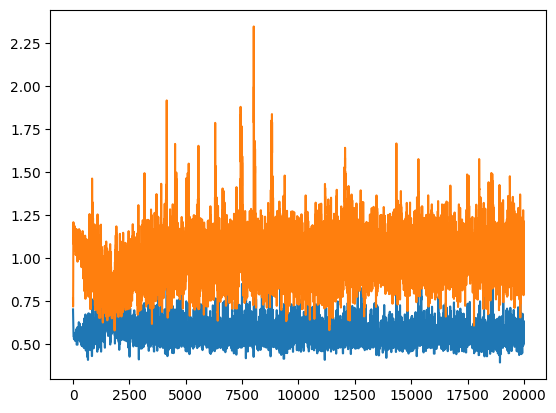

In [ ]:
%matplotlib inline
plt.figure
plt.plot(DD_plus)
plt.plot(GG_plus)

1/1 [==============================] - 0s 21ms/step


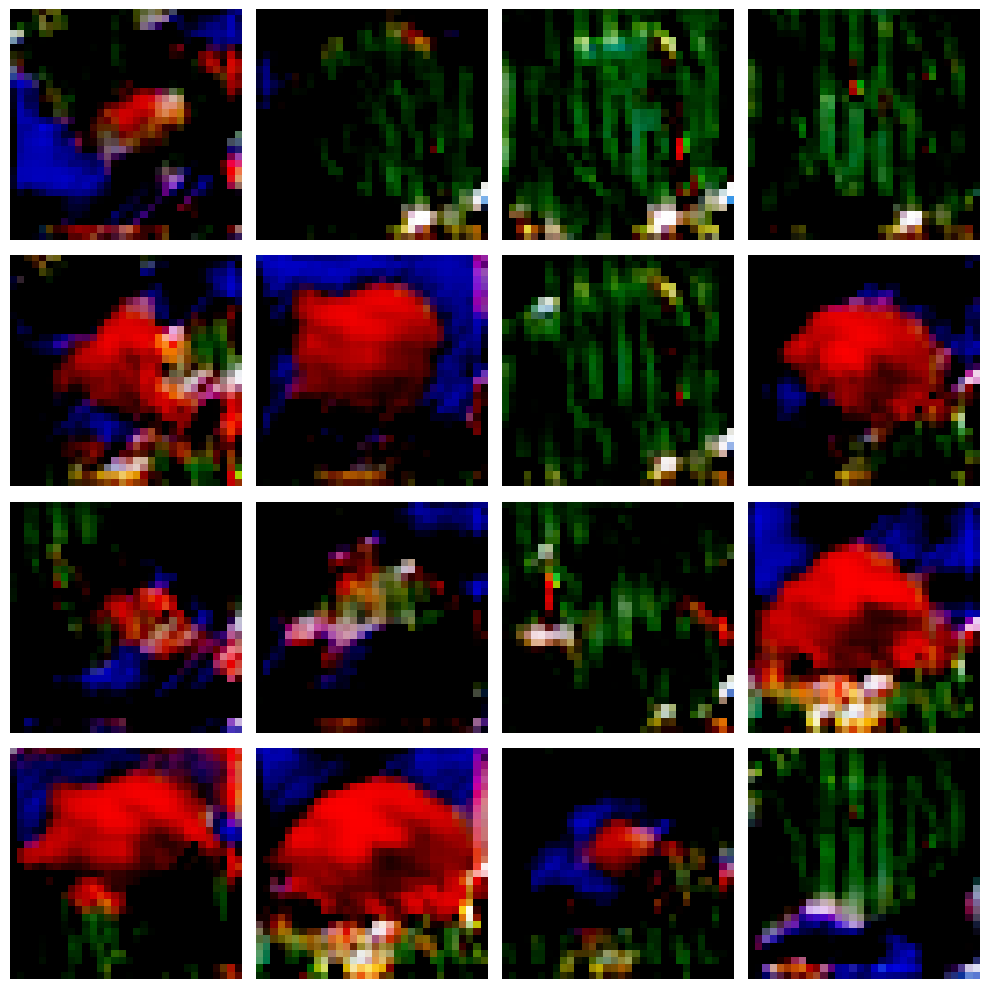

In [ ]:
gan_plus.plot_images()

Como podemos ver, al introducir capas convolucionales en nuestro GAN, favoreccemos la generación correcta de imágenes de peces. Pese a que capta mucho mejor las formas, quizá podamos observar una carencia en la variedad de colores utilizados, siendo muy predominantes el rojo, azul y verde.